In [ ]:
"""
This notebook has working code in is cells for the development of the block group voting data publication.
https://github.com/OpenEnvironments/blockgroupvoting.
"""

In [1]:
# Initialize with imports, state and county list
import os
import numpy as np
import sqlalchemy as sql
import pandas as pd
import geopandas as gpd
import geoplot as gpt
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("error")

# Get the list of state abbreviations 

states = pd.read_csv("C:/Users/micha/Documents/pycharm/openenvironments/blockgroupvoting/states.csv")

datapath = "D:/Open Environments/data/"

In [ ]:
# When the base block group objects is ready, it can be joined to the full width census set
#population = gpd.read_file(datapath + "census/tiger/ACS_2019_5YR_BG/ACS_2019_5YR_BG.gdb/")
#    population[population.GEOID.str.slice(7, 9) == "{:02d}".format(state[1]["StateFIPS"])]  



In [4]:
# Wikipediea totals:
#Joseph Robinette Biden Jr. 	Democratic 	Delaware 	81,268,924 	51.31% 	306 	Kamala Devi Harris 	California 	306
#Donald John Trump 	Republican 	Florida 	74,216,154 	46.86% 	232 	Michael Richard Pence 	Indiana 	232
#Jo Jorgensen 	Libertarian 	South Carolina 	1,865,724 	1.18% 	0 	Jeremy Cohen 	South Carolina 	0
#Howard Gresham Hawkins 	Green 	New York 	405,035 

#https://www.fec.gov/resources/cms-content/documents/2020presgeresults.pdf


In [3]:
####################################################################
#
# REVISION TO REMOVE COUNTY BASED PROCESSING
#
####################################################################

# First pass on states that have county fields identified
for state in states[~states['CountyField'].isin(['none','missing'])].iterrows():
    print("Processing state", state[1]["Abbreviation"])
    # read in the corresponding shape files for voting results and block groups
    precincts = gpd.read_file( \
        datapath + "/electionscience/dataverse_files/" \
            + state[1]["Abbreviation"].lower() + "_2020/" + state[1]["Abbreviation"].lower() + "_2020.shp")
    precincts = precincts.to_crs("EPSG:3395")
    #The precinct set may not have a key.  Intersection calcs will then lose track of which pr caused the intersection.
    precincts["prindex"] = precincts.index
    blockgroups = gpd.read_file( \
            datapath + "census/tiger/blockgroups/tl_2021_" + "{:02d}".format(state[1]["StateFIPS"]) + "_bg")
    blockgroups = blockgroups.to_crs("EPSG:3395")    
    # Calculate the party summary       
    R = [c for c in precincts.columns.to_list() if c[0:7] == "G20PRER"][0]    
    precincts["REP"] = precincts[R]
    D = [c for c in precincts.columns.to_list() if c[0:7] == "G20PRED"][0]    
    precincts["DEM"] = precincts[D]
    L = [c for c in precincts.columns.to_list() if c[0:7] == "G20PREL"][0]    
    precincts["LIB"] = precincts[L]
    O = [c for c in precincts.columns.to_list() if c[0:6] == "G20PRE" and c[6] not in ['R','D','L'] ]
    precincts["OTH"] = precincts[O].sum(axis=1)
    # Initialize summary objects for block groups and precincts
    bgaccumulate = list()
    prlist = {}   # a list of dict to track precinct results remaining to be allocated
                  # initialized with one entry per precinct value set to 100 pct remaining
                  # in many cases, precincts do not have identifiers so we will use the pr dataframe's indexes
    for pre in list(precincts.index.values):
        prlist[pre] = 100

    bgwith = 0
    bgwithout = 0

    for i,b in blockgroups.iterrows():
        print(state[1]["Abbreviation"],"processing",i,"of",blockgroups.shape[0],"block groups")
        bgresults = dict.fromkeys(['GEOID', 'REP', 'DEM', 'LIB','OTH','area','gap','precincts'], 0)
        bgresults['GEOID'] = b.GEOID
        bgresults['REP'] = 0
        bgresults['DEM'] = 0
        bgresults['LIB'] = 0
        bgresults['OTH'] = 0
        intersections = blockgroups.loc[blockgroups.index == i].overlay( \
             precincts, how='intersection', keep_geom_type=False)
        if intersections.shape[0] > 0:
            bgwith += 1
            for j,p in intersections.iterrows():
                # what is the proportion area of overlay
                prproportion = intersections.area[j]/(precincts.loc[precincts.index == p.prindex].area)[p.prindex]
                # allocate this precincts voting to the block group using that proportion
                bgresults['REP'] += prproportion * precincts['REP'].loc[p.prindex]  
                bgresults['DEM'] += prproportion * precincts['DEM'].loc[p.prindex]
                bgresults['LIB'] += prproportion * precincts['LIB'].loc[p.prindex]
                bgresults['OTH'] += prproportion * precincts['OTH'].loc[p.prindex]
                # decrement the precinct allocation tracking data
                prlist[p.prindex] -= prproportion * 100
        else:
                bgwithout += 1
        bgresults['area'] = blockgroups.loc[blockgroups.index == i].area.sum()                
        bgresults['gap'] = blockgroups.loc[blockgroups.index == i].area.sum() - intersections.area.sum()
        bgresults['precincts'] = intersections.shape[0]
        #area of intersections should equal area of block group   
        bgaccumulate.append(bgresults)    
    # write the state result to csv
    pd.DataFrame(bgaccumulate).to_csv(datapath + state[1]["Abbreviation"] + 'bg.csv')
    pd.DataFrame.from_dict(prlist,orient='index').to_csv(datapath + state[1]["Abbreviation"] + 'pr.csv')


Processing state AL
AL processing 0 of 3925 block groups
AL processing 1 of 3925 block groups
AL processing 2 of 3925 block groups
AL processing 3 of 3925 block groups
AL processing 4 of 3925 block groups
AL processing 5 of 3925 block groups
AL processing 6 of 3925 block groups
AL processing 7 of 3925 block groups
AL processing 8 of 3925 block groups
AL processing 9 of 3925 block groups
AL processing 10 of 3925 block groups
AL processing 11 of 3925 block groups
AL processing 12 of 3925 block groups
AL processing 13 of 3925 block groups
AL processing 14 of 3925 block groups
AL processing 15 of 3925 block groups
AL processing 16 of 3925 block groups
AL processing 17 of 3925 block groups
AL processing 18 of 3925 block groups
AL processing 19 of 3925 block groups
AL processing 20 of 3925 block groups
AL processing 21 of 3925 block groups
AL processing 22 of 3925 block groups
AL processing 23 of 3925 block groups
AL processing 24 of 3925 block groups
AL processing 25 of 3925 block groups
AL

AL processing 213 of 3925 block groups
AL processing 214 of 3925 block groups
AL processing 215 of 3925 block groups
AL processing 216 of 3925 block groups
AL processing 217 of 3925 block groups
AL processing 218 of 3925 block groups
AL processing 219 of 3925 block groups
AL processing 220 of 3925 block groups
AL processing 221 of 3925 block groups
AL processing 222 of 3925 block groups
AL processing 223 of 3925 block groups
AL processing 224 of 3925 block groups
AL processing 225 of 3925 block groups
AL processing 226 of 3925 block groups
AL processing 227 of 3925 block groups
AL processing 228 of 3925 block groups
AL processing 229 of 3925 block groups
AL processing 230 of 3925 block groups
AL processing 231 of 3925 block groups
AL processing 232 of 3925 block groups
AL processing 233 of 3925 block groups
AL processing 234 of 3925 block groups
AL processing 235 of 3925 block groups
AL processing 236 of 3925 block groups
AL processing 237 of 3925 block groups
AL processing 238 of 3925

AL processing 424 of 3925 block groups
AL processing 425 of 3925 block groups
AL processing 426 of 3925 block groups
AL processing 427 of 3925 block groups
AL processing 428 of 3925 block groups
AL processing 429 of 3925 block groups
AL processing 430 of 3925 block groups
AL processing 431 of 3925 block groups
AL processing 432 of 3925 block groups
AL processing 433 of 3925 block groups
AL processing 434 of 3925 block groups
AL processing 435 of 3925 block groups
AL processing 436 of 3925 block groups
AL processing 437 of 3925 block groups
AL processing 438 of 3925 block groups
AL processing 439 of 3925 block groups
AL processing 440 of 3925 block groups
AL processing 441 of 3925 block groups
AL processing 442 of 3925 block groups
AL processing 443 of 3925 block groups
AL processing 444 of 3925 block groups
AL processing 445 of 3925 block groups
AL processing 446 of 3925 block groups
AL processing 447 of 3925 block groups
AL processing 448 of 3925 block groups
AL processing 449 of 3925

AL processing 635 of 3925 block groups
AL processing 636 of 3925 block groups
AL processing 637 of 3925 block groups
AL processing 638 of 3925 block groups
AL processing 639 of 3925 block groups
AL processing 640 of 3925 block groups
AL processing 641 of 3925 block groups
AL processing 642 of 3925 block groups
AL processing 643 of 3925 block groups
AL processing 644 of 3925 block groups
AL processing 645 of 3925 block groups
AL processing 646 of 3925 block groups
AL processing 647 of 3925 block groups
AL processing 648 of 3925 block groups
AL processing 649 of 3925 block groups
AL processing 650 of 3925 block groups
AL processing 651 of 3925 block groups
AL processing 652 of 3925 block groups
AL processing 653 of 3925 block groups
AL processing 654 of 3925 block groups
AL processing 655 of 3925 block groups
AL processing 656 of 3925 block groups
AL processing 657 of 3925 block groups
AL processing 658 of 3925 block groups
AL processing 659 of 3925 block groups
AL processing 660 of 3925

AL processing 846 of 3925 block groups
AL processing 847 of 3925 block groups
AL processing 848 of 3925 block groups
AL processing 849 of 3925 block groups
AL processing 850 of 3925 block groups
AL processing 851 of 3925 block groups
AL processing 852 of 3925 block groups
AL processing 853 of 3925 block groups
AL processing 854 of 3925 block groups
AL processing 855 of 3925 block groups
AL processing 856 of 3925 block groups
AL processing 857 of 3925 block groups
AL processing 858 of 3925 block groups
AL processing 859 of 3925 block groups
AL processing 860 of 3925 block groups
AL processing 861 of 3925 block groups
AL processing 862 of 3925 block groups
AL processing 863 of 3925 block groups
AL processing 864 of 3925 block groups
AL processing 865 of 3925 block groups
AL processing 866 of 3925 block groups
AL processing 867 of 3925 block groups
AL processing 868 of 3925 block groups
AL processing 869 of 3925 block groups
AL processing 870 of 3925 block groups
AL processing 871 of 3925

AL processing 1055 of 3925 block groups
AL processing 1056 of 3925 block groups
AL processing 1057 of 3925 block groups
AL processing 1058 of 3925 block groups
AL processing 1059 of 3925 block groups
AL processing 1060 of 3925 block groups
AL processing 1061 of 3925 block groups
AL processing 1062 of 3925 block groups
AL processing 1063 of 3925 block groups
AL processing 1064 of 3925 block groups
AL processing 1065 of 3925 block groups
AL processing 1066 of 3925 block groups
AL processing 1067 of 3925 block groups
AL processing 1068 of 3925 block groups
AL processing 1069 of 3925 block groups
AL processing 1070 of 3925 block groups
AL processing 1071 of 3925 block groups
AL processing 1072 of 3925 block groups
AL processing 1073 of 3925 block groups
AL processing 1074 of 3925 block groups
AL processing 1075 of 3925 block groups
AL processing 1076 of 3925 block groups
AL processing 1077 of 3925 block groups
AL processing 1078 of 3925 block groups
AL processing 1079 of 3925 block groups


AL processing 1260 of 3925 block groups
AL processing 1261 of 3925 block groups
AL processing 1262 of 3925 block groups
AL processing 1263 of 3925 block groups
AL processing 1264 of 3925 block groups
AL processing 1265 of 3925 block groups
AL processing 1266 of 3925 block groups
AL processing 1267 of 3925 block groups
AL processing 1268 of 3925 block groups
AL processing 1269 of 3925 block groups
AL processing 1270 of 3925 block groups
AL processing 1271 of 3925 block groups
AL processing 1272 of 3925 block groups
AL processing 1273 of 3925 block groups
AL processing 1274 of 3925 block groups
AL processing 1275 of 3925 block groups
AL processing 1276 of 3925 block groups
AL processing 1277 of 3925 block groups
AL processing 1278 of 3925 block groups
AL processing 1279 of 3925 block groups
AL processing 1280 of 3925 block groups
AL processing 1281 of 3925 block groups
AL processing 1282 of 3925 block groups
AL processing 1283 of 3925 block groups
AL processing 1284 of 3925 block groups


AL processing 1465 of 3925 block groups
AL processing 1466 of 3925 block groups
AL processing 1467 of 3925 block groups
AL processing 1468 of 3925 block groups
AL processing 1469 of 3925 block groups
AL processing 1470 of 3925 block groups
AL processing 1471 of 3925 block groups
AL processing 1472 of 3925 block groups
AL processing 1473 of 3925 block groups
AL processing 1474 of 3925 block groups
AL processing 1475 of 3925 block groups
AL processing 1476 of 3925 block groups
AL processing 1477 of 3925 block groups
AL processing 1478 of 3925 block groups
AL processing 1479 of 3925 block groups
AL processing 1480 of 3925 block groups
AL processing 1481 of 3925 block groups
AL processing 1482 of 3925 block groups
AL processing 1483 of 3925 block groups
AL processing 1484 of 3925 block groups
AL processing 1485 of 3925 block groups
AL processing 1486 of 3925 block groups
AL processing 1487 of 3925 block groups
AL processing 1488 of 3925 block groups
AL processing 1489 of 3925 block groups


AL processing 1670 of 3925 block groups
AL processing 1671 of 3925 block groups
AL processing 1672 of 3925 block groups
AL processing 1673 of 3925 block groups
AL processing 1674 of 3925 block groups
AL processing 1675 of 3925 block groups
AL processing 1676 of 3925 block groups
AL processing 1677 of 3925 block groups
AL processing 1678 of 3925 block groups
AL processing 1679 of 3925 block groups
AL processing 1680 of 3925 block groups
AL processing 1681 of 3925 block groups
AL processing 1682 of 3925 block groups
AL processing 1683 of 3925 block groups
AL processing 1684 of 3925 block groups
AL processing 1685 of 3925 block groups
AL processing 1686 of 3925 block groups
AL processing 1687 of 3925 block groups
AL processing 1688 of 3925 block groups
AL processing 1689 of 3925 block groups
AL processing 1690 of 3925 block groups
AL processing 1691 of 3925 block groups
AL processing 1692 of 3925 block groups
AL processing 1693 of 3925 block groups
AL processing 1694 of 3925 block groups


AL processing 1875 of 3925 block groups
AL processing 1876 of 3925 block groups
AL processing 1877 of 3925 block groups
AL processing 1878 of 3925 block groups
AL processing 1879 of 3925 block groups
AL processing 1880 of 3925 block groups
AL processing 1881 of 3925 block groups
AL processing 1882 of 3925 block groups
AL processing 1883 of 3925 block groups
AL processing 1884 of 3925 block groups
AL processing 1885 of 3925 block groups
AL processing 1886 of 3925 block groups
AL processing 1887 of 3925 block groups
AL processing 1888 of 3925 block groups
AL processing 1889 of 3925 block groups
AL processing 1890 of 3925 block groups
AL processing 1891 of 3925 block groups
AL processing 1892 of 3925 block groups
AL processing 1893 of 3925 block groups
AL processing 1894 of 3925 block groups
AL processing 1895 of 3925 block groups
AL processing 1896 of 3925 block groups
AL processing 1897 of 3925 block groups
AL processing 1898 of 3925 block groups
AL processing 1899 of 3925 block groups


AL processing 2080 of 3925 block groups
AL processing 2081 of 3925 block groups
AL processing 2082 of 3925 block groups
AL processing 2083 of 3925 block groups
AL processing 2084 of 3925 block groups
AL processing 2085 of 3925 block groups
AL processing 2086 of 3925 block groups
AL processing 2087 of 3925 block groups
AL processing 2088 of 3925 block groups
AL processing 2089 of 3925 block groups
AL processing 2090 of 3925 block groups
AL processing 2091 of 3925 block groups
AL processing 2092 of 3925 block groups
AL processing 2093 of 3925 block groups
AL processing 2094 of 3925 block groups
AL processing 2095 of 3925 block groups
AL processing 2096 of 3925 block groups
AL processing 2097 of 3925 block groups
AL processing 2098 of 3925 block groups
AL processing 2099 of 3925 block groups
AL processing 2100 of 3925 block groups
AL processing 2101 of 3925 block groups
AL processing 2102 of 3925 block groups
AL processing 2103 of 3925 block groups
AL processing 2104 of 3925 block groups


AL processing 2285 of 3925 block groups
AL processing 2286 of 3925 block groups
AL processing 2287 of 3925 block groups
AL processing 2288 of 3925 block groups
AL processing 2289 of 3925 block groups
AL processing 2290 of 3925 block groups
AL processing 2291 of 3925 block groups
AL processing 2292 of 3925 block groups
AL processing 2293 of 3925 block groups
AL processing 2294 of 3925 block groups
AL processing 2295 of 3925 block groups
AL processing 2296 of 3925 block groups
AL processing 2297 of 3925 block groups
AL processing 2298 of 3925 block groups
AL processing 2299 of 3925 block groups
AL processing 2300 of 3925 block groups
AL processing 2301 of 3925 block groups
AL processing 2302 of 3925 block groups
AL processing 2303 of 3925 block groups
AL processing 2304 of 3925 block groups
AL processing 2305 of 3925 block groups
AL processing 2306 of 3925 block groups
AL processing 2307 of 3925 block groups
AL processing 2308 of 3925 block groups
AL processing 2309 of 3925 block groups


AL processing 2490 of 3925 block groups
AL processing 2491 of 3925 block groups
AL processing 2492 of 3925 block groups
AL processing 2493 of 3925 block groups
AL processing 2494 of 3925 block groups
AL processing 2495 of 3925 block groups
AL processing 2496 of 3925 block groups
AL processing 2497 of 3925 block groups
AL processing 2498 of 3925 block groups
AL processing 2499 of 3925 block groups
AL processing 2500 of 3925 block groups
AL processing 2501 of 3925 block groups
AL processing 2502 of 3925 block groups
AL processing 2503 of 3925 block groups
AL processing 2504 of 3925 block groups
AL processing 2505 of 3925 block groups
AL processing 2506 of 3925 block groups
AL processing 2507 of 3925 block groups
AL processing 2508 of 3925 block groups
AL processing 2509 of 3925 block groups
AL processing 2510 of 3925 block groups
AL processing 2511 of 3925 block groups
AL processing 2512 of 3925 block groups
AL processing 2513 of 3925 block groups
AL processing 2514 of 3925 block groups


AL processing 2695 of 3925 block groups
AL processing 2696 of 3925 block groups
AL processing 2697 of 3925 block groups
AL processing 2698 of 3925 block groups
AL processing 2699 of 3925 block groups
AL processing 2700 of 3925 block groups
AL processing 2701 of 3925 block groups
AL processing 2702 of 3925 block groups
AL processing 2703 of 3925 block groups
AL processing 2704 of 3925 block groups
AL processing 2705 of 3925 block groups
AL processing 2706 of 3925 block groups
AL processing 2707 of 3925 block groups
AL processing 2708 of 3925 block groups
AL processing 2709 of 3925 block groups
AL processing 2710 of 3925 block groups
AL processing 2711 of 3925 block groups
AL processing 2712 of 3925 block groups
AL processing 2713 of 3925 block groups
AL processing 2714 of 3925 block groups
AL processing 2715 of 3925 block groups
AL processing 2716 of 3925 block groups
AL processing 2717 of 3925 block groups
AL processing 2718 of 3925 block groups
AL processing 2719 of 3925 block groups


AL processing 2900 of 3925 block groups
AL processing 2901 of 3925 block groups
AL processing 2902 of 3925 block groups
AL processing 2903 of 3925 block groups
AL processing 2904 of 3925 block groups
AL processing 2905 of 3925 block groups
AL processing 2906 of 3925 block groups
AL processing 2907 of 3925 block groups
AL processing 2908 of 3925 block groups
AL processing 2909 of 3925 block groups
AL processing 2910 of 3925 block groups
AL processing 2911 of 3925 block groups
AL processing 2912 of 3925 block groups
AL processing 2913 of 3925 block groups
AL processing 2914 of 3925 block groups
AL processing 2915 of 3925 block groups
AL processing 2916 of 3925 block groups
AL processing 2917 of 3925 block groups
AL processing 2918 of 3925 block groups
AL processing 2919 of 3925 block groups
AL processing 2920 of 3925 block groups
AL processing 2921 of 3925 block groups
AL processing 2922 of 3925 block groups
AL processing 2923 of 3925 block groups
AL processing 2924 of 3925 block groups


AL processing 3105 of 3925 block groups
AL processing 3106 of 3925 block groups
AL processing 3107 of 3925 block groups
AL processing 3108 of 3925 block groups
AL processing 3109 of 3925 block groups
AL processing 3110 of 3925 block groups
AL processing 3111 of 3925 block groups
AL processing 3112 of 3925 block groups
AL processing 3113 of 3925 block groups
AL processing 3114 of 3925 block groups
AL processing 3115 of 3925 block groups
AL processing 3116 of 3925 block groups
AL processing 3117 of 3925 block groups
AL processing 3118 of 3925 block groups
AL processing 3119 of 3925 block groups
AL processing 3120 of 3925 block groups
AL processing 3121 of 3925 block groups
AL processing 3122 of 3925 block groups
AL processing 3123 of 3925 block groups
AL processing 3124 of 3925 block groups
AL processing 3125 of 3925 block groups
AL processing 3126 of 3925 block groups
AL processing 3127 of 3925 block groups
AL processing 3128 of 3925 block groups
AL processing 3129 of 3925 block groups


AL processing 3310 of 3925 block groups
AL processing 3311 of 3925 block groups
AL processing 3312 of 3925 block groups
AL processing 3313 of 3925 block groups
AL processing 3314 of 3925 block groups
AL processing 3315 of 3925 block groups
AL processing 3316 of 3925 block groups
AL processing 3317 of 3925 block groups
AL processing 3318 of 3925 block groups
AL processing 3319 of 3925 block groups
AL processing 3320 of 3925 block groups
AL processing 3321 of 3925 block groups
AL processing 3322 of 3925 block groups
AL processing 3323 of 3925 block groups
AL processing 3324 of 3925 block groups
AL processing 3325 of 3925 block groups
AL processing 3326 of 3925 block groups
AL processing 3327 of 3925 block groups
AL processing 3328 of 3925 block groups
AL processing 3329 of 3925 block groups
AL processing 3330 of 3925 block groups
AL processing 3331 of 3925 block groups
AL processing 3332 of 3925 block groups
AL processing 3333 of 3925 block groups
AL processing 3334 of 3925 block groups


AL processing 3515 of 3925 block groups
AL processing 3516 of 3925 block groups
AL processing 3517 of 3925 block groups
AL processing 3518 of 3925 block groups
AL processing 3519 of 3925 block groups
AL processing 3520 of 3925 block groups
AL processing 3521 of 3925 block groups
AL processing 3522 of 3925 block groups
AL processing 3523 of 3925 block groups
AL processing 3524 of 3925 block groups
AL processing 3525 of 3925 block groups
AL processing 3526 of 3925 block groups
AL processing 3527 of 3925 block groups
AL processing 3528 of 3925 block groups
AL processing 3529 of 3925 block groups
AL processing 3530 of 3925 block groups
AL processing 3531 of 3925 block groups
AL processing 3532 of 3925 block groups
AL processing 3533 of 3925 block groups
AL processing 3534 of 3925 block groups
AL processing 3535 of 3925 block groups
AL processing 3536 of 3925 block groups
AL processing 3537 of 3925 block groups
AL processing 3538 of 3925 block groups
AL processing 3539 of 3925 block groups


AL processing 3720 of 3925 block groups
AL processing 3721 of 3925 block groups
AL processing 3722 of 3925 block groups
AL processing 3723 of 3925 block groups
AL processing 3724 of 3925 block groups
AL processing 3725 of 3925 block groups
AL processing 3726 of 3925 block groups
AL processing 3727 of 3925 block groups
AL processing 3728 of 3925 block groups
AL processing 3729 of 3925 block groups
AL processing 3730 of 3925 block groups
AL processing 3731 of 3925 block groups
AL processing 3732 of 3925 block groups
AL processing 3733 of 3925 block groups
AL processing 3734 of 3925 block groups
AL processing 3735 of 3925 block groups
AL processing 3736 of 3925 block groups
AL processing 3737 of 3925 block groups
AL processing 3738 of 3925 block groups
AL processing 3739 of 3925 block groups
AL processing 3740 of 3925 block groups
AL processing 3741 of 3925 block groups
AL processing 3742 of 3925 block groups
AL processing 3743 of 3925 block groups
AL processing 3744 of 3925 block groups


Processing state AZ
AZ processing 0 of 4773 block groups
AZ processing 1 of 4773 block groups
AZ processing 2 of 4773 block groups
AZ processing 3 of 4773 block groups
AZ processing 4 of 4773 block groups
AZ processing 5 of 4773 block groups
AZ processing 6 of 4773 block groups
AZ processing 7 of 4773 block groups
AZ processing 8 of 4773 block groups
AZ processing 9 of 4773 block groups
AZ processing 10 of 4773 block groups
AZ processing 11 of 4773 block groups
AZ processing 12 of 4773 block groups
AZ processing 13 of 4773 block groups
AZ processing 14 of 4773 block groups
AZ processing 15 of 4773 block groups
AZ processing 16 of 4773 block groups
AZ processing 17 of 4773 block groups
AZ processing 18 of 4773 block groups
AZ processing 19 of 4773 block groups
AZ processing 20 of 4773 block groups
AZ processing 21 of 4773 block groups
AZ processing 22 of 4773 block groups
AZ processing 23 of 4773 block groups
AZ processing 24 of 4773 block groups
AZ processing 25 of 4773 block groups
AZ

AZ processing 213 of 4773 block groups
AZ processing 214 of 4773 block groups
AZ processing 215 of 4773 block groups
AZ processing 216 of 4773 block groups
AZ processing 217 of 4773 block groups
AZ processing 218 of 4773 block groups
AZ processing 219 of 4773 block groups
AZ processing 220 of 4773 block groups
AZ processing 221 of 4773 block groups
AZ processing 222 of 4773 block groups
AZ processing 223 of 4773 block groups
AZ processing 224 of 4773 block groups
AZ processing 225 of 4773 block groups
AZ processing 226 of 4773 block groups
AZ processing 227 of 4773 block groups
AZ processing 228 of 4773 block groups
AZ processing 229 of 4773 block groups
AZ processing 230 of 4773 block groups
AZ processing 231 of 4773 block groups
AZ processing 232 of 4773 block groups
AZ processing 233 of 4773 block groups
AZ processing 234 of 4773 block groups
AZ processing 235 of 4773 block groups
AZ processing 236 of 4773 block groups
AZ processing 237 of 4773 block groups
AZ processing 238 of 4773

AZ processing 424 of 4773 block groups
AZ processing 425 of 4773 block groups
AZ processing 426 of 4773 block groups
AZ processing 427 of 4773 block groups
AZ processing 428 of 4773 block groups
AZ processing 429 of 4773 block groups
AZ processing 430 of 4773 block groups
AZ processing 431 of 4773 block groups
AZ processing 432 of 4773 block groups
AZ processing 433 of 4773 block groups
AZ processing 434 of 4773 block groups
AZ processing 435 of 4773 block groups
AZ processing 436 of 4773 block groups
AZ processing 437 of 4773 block groups
AZ processing 438 of 4773 block groups
AZ processing 439 of 4773 block groups
AZ processing 440 of 4773 block groups
AZ processing 441 of 4773 block groups
AZ processing 442 of 4773 block groups
AZ processing 443 of 4773 block groups
AZ processing 444 of 4773 block groups
AZ processing 445 of 4773 block groups
AZ processing 446 of 4773 block groups
AZ processing 447 of 4773 block groups
AZ processing 448 of 4773 block groups
AZ processing 449 of 4773

AZ processing 635 of 4773 block groups
AZ processing 636 of 4773 block groups
AZ processing 637 of 4773 block groups
AZ processing 638 of 4773 block groups
AZ processing 639 of 4773 block groups
AZ processing 640 of 4773 block groups
AZ processing 641 of 4773 block groups
AZ processing 642 of 4773 block groups
AZ processing 643 of 4773 block groups
AZ processing 644 of 4773 block groups
AZ processing 645 of 4773 block groups
AZ processing 646 of 4773 block groups
AZ processing 647 of 4773 block groups
AZ processing 648 of 4773 block groups
AZ processing 649 of 4773 block groups
AZ processing 650 of 4773 block groups
AZ processing 651 of 4773 block groups
AZ processing 652 of 4773 block groups
AZ processing 653 of 4773 block groups
AZ processing 654 of 4773 block groups
AZ processing 655 of 4773 block groups
AZ processing 656 of 4773 block groups
AZ processing 657 of 4773 block groups
AZ processing 658 of 4773 block groups
AZ processing 659 of 4773 block groups
AZ processing 660 of 4773

AZ processing 846 of 4773 block groups
AZ processing 847 of 4773 block groups
AZ processing 848 of 4773 block groups
AZ processing 849 of 4773 block groups
AZ processing 850 of 4773 block groups
AZ processing 851 of 4773 block groups
AZ processing 852 of 4773 block groups
AZ processing 853 of 4773 block groups
AZ processing 854 of 4773 block groups
AZ processing 855 of 4773 block groups
AZ processing 856 of 4773 block groups
AZ processing 857 of 4773 block groups
AZ processing 858 of 4773 block groups
AZ processing 859 of 4773 block groups
AZ processing 860 of 4773 block groups
AZ processing 861 of 4773 block groups
AZ processing 862 of 4773 block groups
AZ processing 863 of 4773 block groups
AZ processing 864 of 4773 block groups
AZ processing 865 of 4773 block groups
AZ processing 866 of 4773 block groups
AZ processing 867 of 4773 block groups
AZ processing 868 of 4773 block groups
AZ processing 869 of 4773 block groups
AZ processing 870 of 4773 block groups
AZ processing 871 of 4773

AZ processing 1055 of 4773 block groups
AZ processing 1056 of 4773 block groups
AZ processing 1057 of 4773 block groups
AZ processing 1058 of 4773 block groups
AZ processing 1059 of 4773 block groups
AZ processing 1060 of 4773 block groups
AZ processing 1061 of 4773 block groups
AZ processing 1062 of 4773 block groups
AZ processing 1063 of 4773 block groups
AZ processing 1064 of 4773 block groups
AZ processing 1065 of 4773 block groups
AZ processing 1066 of 4773 block groups
AZ processing 1067 of 4773 block groups
AZ processing 1068 of 4773 block groups
AZ processing 1069 of 4773 block groups
AZ processing 1070 of 4773 block groups
AZ processing 1071 of 4773 block groups
AZ processing 1072 of 4773 block groups
AZ processing 1073 of 4773 block groups
AZ processing 1074 of 4773 block groups
AZ processing 1075 of 4773 block groups
AZ processing 1076 of 4773 block groups
AZ processing 1077 of 4773 block groups
AZ processing 1078 of 4773 block groups
AZ processing 1079 of 4773 block groups


AZ processing 1260 of 4773 block groups
AZ processing 1261 of 4773 block groups
AZ processing 1262 of 4773 block groups
AZ processing 1263 of 4773 block groups
AZ processing 1264 of 4773 block groups
AZ processing 1265 of 4773 block groups
AZ processing 1266 of 4773 block groups
AZ processing 1267 of 4773 block groups
AZ processing 1268 of 4773 block groups
AZ processing 1269 of 4773 block groups
AZ processing 1270 of 4773 block groups
AZ processing 1271 of 4773 block groups
AZ processing 1272 of 4773 block groups
AZ processing 1273 of 4773 block groups
AZ processing 1274 of 4773 block groups
AZ processing 1275 of 4773 block groups
AZ processing 1276 of 4773 block groups
AZ processing 1277 of 4773 block groups
AZ processing 1278 of 4773 block groups
AZ processing 1279 of 4773 block groups
AZ processing 1280 of 4773 block groups
AZ processing 1281 of 4773 block groups
AZ processing 1282 of 4773 block groups
AZ processing 1283 of 4773 block groups
AZ processing 1284 of 4773 block groups


AZ processing 1465 of 4773 block groups
AZ processing 1466 of 4773 block groups
AZ processing 1467 of 4773 block groups
AZ processing 1468 of 4773 block groups
AZ processing 1469 of 4773 block groups
AZ processing 1470 of 4773 block groups
AZ processing 1471 of 4773 block groups
AZ processing 1472 of 4773 block groups
AZ processing 1473 of 4773 block groups
AZ processing 1474 of 4773 block groups
AZ processing 1475 of 4773 block groups
AZ processing 1476 of 4773 block groups
AZ processing 1477 of 4773 block groups
AZ processing 1478 of 4773 block groups
AZ processing 1479 of 4773 block groups
AZ processing 1480 of 4773 block groups
AZ processing 1481 of 4773 block groups
AZ processing 1482 of 4773 block groups
AZ processing 1483 of 4773 block groups
AZ processing 1484 of 4773 block groups
AZ processing 1485 of 4773 block groups
AZ processing 1486 of 4773 block groups
AZ processing 1487 of 4773 block groups
AZ processing 1488 of 4773 block groups
AZ processing 1489 of 4773 block groups


AZ processing 1670 of 4773 block groups
AZ processing 1671 of 4773 block groups
AZ processing 1672 of 4773 block groups
AZ processing 1673 of 4773 block groups
AZ processing 1674 of 4773 block groups
AZ processing 1675 of 4773 block groups
AZ processing 1676 of 4773 block groups
AZ processing 1677 of 4773 block groups
AZ processing 1678 of 4773 block groups
AZ processing 1679 of 4773 block groups
AZ processing 1680 of 4773 block groups
AZ processing 1681 of 4773 block groups
AZ processing 1682 of 4773 block groups
AZ processing 1683 of 4773 block groups
AZ processing 1684 of 4773 block groups
AZ processing 1685 of 4773 block groups
AZ processing 1686 of 4773 block groups
AZ processing 1687 of 4773 block groups
AZ processing 1688 of 4773 block groups
AZ processing 1689 of 4773 block groups
AZ processing 1690 of 4773 block groups
AZ processing 1691 of 4773 block groups
AZ processing 1692 of 4773 block groups
AZ processing 1693 of 4773 block groups
AZ processing 1694 of 4773 block groups


AZ processing 1875 of 4773 block groups
AZ processing 1876 of 4773 block groups
AZ processing 1877 of 4773 block groups
AZ processing 1878 of 4773 block groups
AZ processing 1879 of 4773 block groups
AZ processing 1880 of 4773 block groups
AZ processing 1881 of 4773 block groups
AZ processing 1882 of 4773 block groups
AZ processing 1883 of 4773 block groups
AZ processing 1884 of 4773 block groups
AZ processing 1885 of 4773 block groups
AZ processing 1886 of 4773 block groups
AZ processing 1887 of 4773 block groups
AZ processing 1888 of 4773 block groups
AZ processing 1889 of 4773 block groups
AZ processing 1890 of 4773 block groups
AZ processing 1891 of 4773 block groups
AZ processing 1892 of 4773 block groups
AZ processing 1893 of 4773 block groups
AZ processing 1894 of 4773 block groups
AZ processing 1895 of 4773 block groups
AZ processing 1896 of 4773 block groups
AZ processing 1897 of 4773 block groups
AZ processing 1898 of 4773 block groups
AZ processing 1899 of 4773 block groups


AZ processing 2080 of 4773 block groups
AZ processing 2081 of 4773 block groups
AZ processing 2082 of 4773 block groups
AZ processing 2083 of 4773 block groups
AZ processing 2084 of 4773 block groups
AZ processing 2085 of 4773 block groups
AZ processing 2086 of 4773 block groups
AZ processing 2087 of 4773 block groups
AZ processing 2088 of 4773 block groups
AZ processing 2089 of 4773 block groups
AZ processing 2090 of 4773 block groups
AZ processing 2091 of 4773 block groups
AZ processing 2092 of 4773 block groups
AZ processing 2093 of 4773 block groups
AZ processing 2094 of 4773 block groups
AZ processing 2095 of 4773 block groups
AZ processing 2096 of 4773 block groups
AZ processing 2097 of 4773 block groups
AZ processing 2098 of 4773 block groups
AZ processing 2099 of 4773 block groups
AZ processing 2100 of 4773 block groups
AZ processing 2101 of 4773 block groups
AZ processing 2102 of 4773 block groups
AZ processing 2103 of 4773 block groups
AZ processing 2104 of 4773 block groups


AZ processing 2285 of 4773 block groups
AZ processing 2286 of 4773 block groups
AZ processing 2287 of 4773 block groups
AZ processing 2288 of 4773 block groups
AZ processing 2289 of 4773 block groups
AZ processing 2290 of 4773 block groups
AZ processing 2291 of 4773 block groups
AZ processing 2292 of 4773 block groups
AZ processing 2293 of 4773 block groups
AZ processing 2294 of 4773 block groups
AZ processing 2295 of 4773 block groups
AZ processing 2296 of 4773 block groups
AZ processing 2297 of 4773 block groups
AZ processing 2298 of 4773 block groups
AZ processing 2299 of 4773 block groups
AZ processing 2300 of 4773 block groups
AZ processing 2301 of 4773 block groups
AZ processing 2302 of 4773 block groups
AZ processing 2303 of 4773 block groups
AZ processing 2304 of 4773 block groups
AZ processing 2305 of 4773 block groups
AZ processing 2306 of 4773 block groups
AZ processing 2307 of 4773 block groups
AZ processing 2308 of 4773 block groups
AZ processing 2309 of 4773 block groups


AZ processing 2490 of 4773 block groups
AZ processing 2491 of 4773 block groups
AZ processing 2492 of 4773 block groups
AZ processing 2493 of 4773 block groups
AZ processing 2494 of 4773 block groups
AZ processing 2495 of 4773 block groups
AZ processing 2496 of 4773 block groups
AZ processing 2497 of 4773 block groups
AZ processing 2498 of 4773 block groups
AZ processing 2499 of 4773 block groups
AZ processing 2500 of 4773 block groups
AZ processing 2501 of 4773 block groups
AZ processing 2502 of 4773 block groups
AZ processing 2503 of 4773 block groups
AZ processing 2504 of 4773 block groups
AZ processing 2505 of 4773 block groups
AZ processing 2506 of 4773 block groups
AZ processing 2507 of 4773 block groups
AZ processing 2508 of 4773 block groups
AZ processing 2509 of 4773 block groups
AZ processing 2510 of 4773 block groups
AZ processing 2511 of 4773 block groups
AZ processing 2512 of 4773 block groups
AZ processing 2513 of 4773 block groups
AZ processing 2514 of 4773 block groups


AZ processing 2695 of 4773 block groups
AZ processing 2696 of 4773 block groups
AZ processing 2697 of 4773 block groups
AZ processing 2698 of 4773 block groups
AZ processing 2699 of 4773 block groups
AZ processing 2700 of 4773 block groups
AZ processing 2701 of 4773 block groups
AZ processing 2702 of 4773 block groups
AZ processing 2703 of 4773 block groups
AZ processing 2704 of 4773 block groups
AZ processing 2705 of 4773 block groups
AZ processing 2706 of 4773 block groups
AZ processing 2707 of 4773 block groups
AZ processing 2708 of 4773 block groups
AZ processing 2709 of 4773 block groups
AZ processing 2710 of 4773 block groups
AZ processing 2711 of 4773 block groups
AZ processing 2712 of 4773 block groups
AZ processing 2713 of 4773 block groups
AZ processing 2714 of 4773 block groups
AZ processing 2715 of 4773 block groups
AZ processing 2716 of 4773 block groups
AZ processing 2717 of 4773 block groups
AZ processing 2718 of 4773 block groups
AZ processing 2719 of 4773 block groups


AZ processing 2900 of 4773 block groups
AZ processing 2901 of 4773 block groups
AZ processing 2902 of 4773 block groups
AZ processing 2903 of 4773 block groups
AZ processing 2904 of 4773 block groups
AZ processing 2905 of 4773 block groups
AZ processing 2906 of 4773 block groups
AZ processing 2907 of 4773 block groups
AZ processing 2908 of 4773 block groups
AZ processing 2909 of 4773 block groups
AZ processing 2910 of 4773 block groups
AZ processing 2911 of 4773 block groups
AZ processing 2912 of 4773 block groups
AZ processing 2913 of 4773 block groups
AZ processing 2914 of 4773 block groups
AZ processing 2915 of 4773 block groups
AZ processing 2916 of 4773 block groups
AZ processing 2917 of 4773 block groups
AZ processing 2918 of 4773 block groups
AZ processing 2919 of 4773 block groups
AZ processing 2920 of 4773 block groups
AZ processing 2921 of 4773 block groups
AZ processing 2922 of 4773 block groups
AZ processing 2923 of 4773 block groups
AZ processing 2924 of 4773 block groups


AZ processing 3105 of 4773 block groups
AZ processing 3106 of 4773 block groups
AZ processing 3107 of 4773 block groups
AZ processing 3108 of 4773 block groups
AZ processing 3109 of 4773 block groups
AZ processing 3110 of 4773 block groups
AZ processing 3111 of 4773 block groups
AZ processing 3112 of 4773 block groups
AZ processing 3113 of 4773 block groups
AZ processing 3114 of 4773 block groups
AZ processing 3115 of 4773 block groups
AZ processing 3116 of 4773 block groups
AZ processing 3117 of 4773 block groups
AZ processing 3118 of 4773 block groups
AZ processing 3119 of 4773 block groups
AZ processing 3120 of 4773 block groups
AZ processing 3121 of 4773 block groups
AZ processing 3122 of 4773 block groups
AZ processing 3123 of 4773 block groups
AZ processing 3124 of 4773 block groups
AZ processing 3125 of 4773 block groups
AZ processing 3126 of 4773 block groups
AZ processing 3127 of 4773 block groups
AZ processing 3128 of 4773 block groups
AZ processing 3129 of 4773 block groups


AZ processing 3310 of 4773 block groups
AZ processing 3311 of 4773 block groups
AZ processing 3312 of 4773 block groups
AZ processing 3313 of 4773 block groups
AZ processing 3314 of 4773 block groups
AZ processing 3315 of 4773 block groups
AZ processing 3316 of 4773 block groups
AZ processing 3317 of 4773 block groups
AZ processing 3318 of 4773 block groups
AZ processing 3319 of 4773 block groups
AZ processing 3320 of 4773 block groups
AZ processing 3321 of 4773 block groups
AZ processing 3322 of 4773 block groups
AZ processing 3323 of 4773 block groups
AZ processing 3324 of 4773 block groups
AZ processing 3325 of 4773 block groups
AZ processing 3326 of 4773 block groups
AZ processing 3327 of 4773 block groups
AZ processing 3328 of 4773 block groups
AZ processing 3329 of 4773 block groups
AZ processing 3330 of 4773 block groups
AZ processing 3331 of 4773 block groups
AZ processing 3332 of 4773 block groups
AZ processing 3333 of 4773 block groups
AZ processing 3334 of 4773 block groups


AZ processing 3515 of 4773 block groups
AZ processing 3516 of 4773 block groups
AZ processing 3517 of 4773 block groups
AZ processing 3518 of 4773 block groups
AZ processing 3519 of 4773 block groups
AZ processing 3520 of 4773 block groups
AZ processing 3521 of 4773 block groups
AZ processing 3522 of 4773 block groups
AZ processing 3523 of 4773 block groups
AZ processing 3524 of 4773 block groups
AZ processing 3525 of 4773 block groups
AZ processing 3526 of 4773 block groups
AZ processing 3527 of 4773 block groups
AZ processing 3528 of 4773 block groups
AZ processing 3529 of 4773 block groups
AZ processing 3530 of 4773 block groups
AZ processing 3531 of 4773 block groups
AZ processing 3532 of 4773 block groups
AZ processing 3533 of 4773 block groups
AZ processing 3534 of 4773 block groups
AZ processing 3535 of 4773 block groups
AZ processing 3536 of 4773 block groups
AZ processing 3537 of 4773 block groups
AZ processing 3538 of 4773 block groups
AZ processing 3539 of 4773 block groups


AZ processing 3720 of 4773 block groups
AZ processing 3721 of 4773 block groups
AZ processing 3722 of 4773 block groups
AZ processing 3723 of 4773 block groups
AZ processing 3724 of 4773 block groups
AZ processing 3725 of 4773 block groups
AZ processing 3726 of 4773 block groups
AZ processing 3727 of 4773 block groups
AZ processing 3728 of 4773 block groups
AZ processing 3729 of 4773 block groups
AZ processing 3730 of 4773 block groups
AZ processing 3731 of 4773 block groups
AZ processing 3732 of 4773 block groups
AZ processing 3733 of 4773 block groups
AZ processing 3734 of 4773 block groups
AZ processing 3735 of 4773 block groups
AZ processing 3736 of 4773 block groups
AZ processing 3737 of 4773 block groups
AZ processing 3738 of 4773 block groups
AZ processing 3739 of 4773 block groups
AZ processing 3740 of 4773 block groups
AZ processing 3741 of 4773 block groups
AZ processing 3742 of 4773 block groups
AZ processing 3743 of 4773 block groups
AZ processing 3744 of 4773 block groups


AZ processing 3925 of 4773 block groups
AZ processing 3926 of 4773 block groups
AZ processing 3927 of 4773 block groups
AZ processing 3928 of 4773 block groups
AZ processing 3929 of 4773 block groups
AZ processing 3930 of 4773 block groups
AZ processing 3931 of 4773 block groups
AZ processing 3932 of 4773 block groups
AZ processing 3933 of 4773 block groups
AZ processing 3934 of 4773 block groups
AZ processing 3935 of 4773 block groups
AZ processing 3936 of 4773 block groups
AZ processing 3937 of 4773 block groups
AZ processing 3938 of 4773 block groups
AZ processing 3939 of 4773 block groups
AZ processing 3940 of 4773 block groups
AZ processing 3941 of 4773 block groups
AZ processing 3942 of 4773 block groups
AZ processing 3943 of 4773 block groups
AZ processing 3944 of 4773 block groups
AZ processing 3945 of 4773 block groups
AZ processing 3946 of 4773 block groups
AZ processing 3947 of 4773 block groups
AZ processing 3948 of 4773 block groups
AZ processing 3949 of 4773 block groups


AZ processing 4130 of 4773 block groups
AZ processing 4131 of 4773 block groups
AZ processing 4132 of 4773 block groups
AZ processing 4133 of 4773 block groups
AZ processing 4134 of 4773 block groups
AZ processing 4135 of 4773 block groups
AZ processing 4136 of 4773 block groups
AZ processing 4137 of 4773 block groups
AZ processing 4138 of 4773 block groups
AZ processing 4139 of 4773 block groups
AZ processing 4140 of 4773 block groups
AZ processing 4141 of 4773 block groups
AZ processing 4142 of 4773 block groups
AZ processing 4143 of 4773 block groups
AZ processing 4144 of 4773 block groups
AZ processing 4145 of 4773 block groups
AZ processing 4146 of 4773 block groups
AZ processing 4147 of 4773 block groups
AZ processing 4148 of 4773 block groups
AZ processing 4149 of 4773 block groups
AZ processing 4150 of 4773 block groups
AZ processing 4151 of 4773 block groups
AZ processing 4152 of 4773 block groups
AZ processing 4153 of 4773 block groups
AZ processing 4154 of 4773 block groups


AZ processing 4335 of 4773 block groups
AZ processing 4336 of 4773 block groups
AZ processing 4337 of 4773 block groups
AZ processing 4338 of 4773 block groups
AZ processing 4339 of 4773 block groups
AZ processing 4340 of 4773 block groups
AZ processing 4341 of 4773 block groups
AZ processing 4342 of 4773 block groups
AZ processing 4343 of 4773 block groups
AZ processing 4344 of 4773 block groups
AZ processing 4345 of 4773 block groups
AZ processing 4346 of 4773 block groups
AZ processing 4347 of 4773 block groups
AZ processing 4348 of 4773 block groups
AZ processing 4349 of 4773 block groups
AZ processing 4350 of 4773 block groups
AZ processing 4351 of 4773 block groups
AZ processing 4352 of 4773 block groups
AZ processing 4353 of 4773 block groups
AZ processing 4354 of 4773 block groups
AZ processing 4355 of 4773 block groups
AZ processing 4356 of 4773 block groups
AZ processing 4357 of 4773 block groups
AZ processing 4358 of 4773 block groups
AZ processing 4359 of 4773 block groups


AZ processing 4540 of 4773 block groups
AZ processing 4541 of 4773 block groups
AZ processing 4542 of 4773 block groups
AZ processing 4543 of 4773 block groups
AZ processing 4544 of 4773 block groups
AZ processing 4545 of 4773 block groups
AZ processing 4546 of 4773 block groups
AZ processing 4547 of 4773 block groups
AZ processing 4548 of 4773 block groups
AZ processing 4549 of 4773 block groups
AZ processing 4550 of 4773 block groups
AZ processing 4551 of 4773 block groups
AZ processing 4552 of 4773 block groups
AZ processing 4553 of 4773 block groups
AZ processing 4554 of 4773 block groups
AZ processing 4555 of 4773 block groups
AZ processing 4556 of 4773 block groups
AZ processing 4557 of 4773 block groups
AZ processing 4558 of 4773 block groups
AZ processing 4559 of 4773 block groups
AZ processing 4560 of 4773 block groups
AZ processing 4561 of 4773 block groups
AZ processing 4562 of 4773 block groups
AZ processing 4563 of 4773 block groups
AZ processing 4564 of 4773 block groups


AZ processing 4745 of 4773 block groups
AZ processing 4746 of 4773 block groups
AZ processing 4747 of 4773 block groups
AZ processing 4748 of 4773 block groups
AZ processing 4749 of 4773 block groups
AZ processing 4750 of 4773 block groups
AZ processing 4751 of 4773 block groups
AZ processing 4752 of 4773 block groups
AZ processing 4753 of 4773 block groups
AZ processing 4754 of 4773 block groups
AZ processing 4755 of 4773 block groups
AZ processing 4756 of 4773 block groups
AZ processing 4757 of 4773 block groups
AZ processing 4758 of 4773 block groups
AZ processing 4759 of 4773 block groups
AZ processing 4760 of 4773 block groups
AZ processing 4761 of 4773 block groups
AZ processing 4762 of 4773 block groups
AZ processing 4763 of 4773 block groups
AZ processing 4764 of 4773 block groups
AZ processing 4765 of 4773 block groups
AZ processing 4766 of 4773 block groups
AZ processing 4767 of 4773 block groups
AZ processing 4768 of 4773 block groups
AZ processing 4769 of 4773 block groups


AR processing 184 of 2294 block groups
AR processing 185 of 2294 block groups
AR processing 186 of 2294 block groups
AR processing 187 of 2294 block groups
AR processing 188 of 2294 block groups
AR processing 189 of 2294 block groups
AR processing 190 of 2294 block groups
AR processing 191 of 2294 block groups
AR processing 192 of 2294 block groups
AR processing 193 of 2294 block groups
AR processing 194 of 2294 block groups
AR processing 195 of 2294 block groups
AR processing 196 of 2294 block groups
AR processing 197 of 2294 block groups
AR processing 198 of 2294 block groups
AR processing 199 of 2294 block groups
AR processing 200 of 2294 block groups
AR processing 201 of 2294 block groups
AR processing 202 of 2294 block groups
AR processing 203 of 2294 block groups
AR processing 204 of 2294 block groups
AR processing 205 of 2294 block groups
AR processing 206 of 2294 block groups
AR processing 207 of 2294 block groups
AR processing 208 of 2294 block groups
AR processing 209 of 2294

AR processing 395 of 2294 block groups
AR processing 396 of 2294 block groups
AR processing 397 of 2294 block groups
AR processing 398 of 2294 block groups
AR processing 399 of 2294 block groups
AR processing 400 of 2294 block groups
AR processing 401 of 2294 block groups
AR processing 402 of 2294 block groups
AR processing 403 of 2294 block groups
AR processing 404 of 2294 block groups
AR processing 405 of 2294 block groups
AR processing 406 of 2294 block groups
AR processing 407 of 2294 block groups
AR processing 408 of 2294 block groups
AR processing 409 of 2294 block groups
AR processing 410 of 2294 block groups
AR processing 411 of 2294 block groups
AR processing 412 of 2294 block groups
AR processing 413 of 2294 block groups
AR processing 414 of 2294 block groups
AR processing 415 of 2294 block groups
AR processing 416 of 2294 block groups
AR processing 417 of 2294 block groups
AR processing 418 of 2294 block groups
AR processing 419 of 2294 block groups
AR processing 420 of 2294

AR processing 606 of 2294 block groups
AR processing 607 of 2294 block groups
AR processing 608 of 2294 block groups
AR processing 609 of 2294 block groups
AR processing 610 of 2294 block groups
AR processing 611 of 2294 block groups
AR processing 612 of 2294 block groups
AR processing 613 of 2294 block groups
AR processing 614 of 2294 block groups
AR processing 615 of 2294 block groups
AR processing 616 of 2294 block groups
AR processing 617 of 2294 block groups
AR processing 618 of 2294 block groups
AR processing 619 of 2294 block groups
AR processing 620 of 2294 block groups
AR processing 621 of 2294 block groups
AR processing 622 of 2294 block groups
AR processing 623 of 2294 block groups
AR processing 624 of 2294 block groups
AR processing 625 of 2294 block groups
AR processing 626 of 2294 block groups
AR processing 627 of 2294 block groups
AR processing 628 of 2294 block groups
AR processing 629 of 2294 block groups
AR processing 630 of 2294 block groups
AR processing 631 of 2294

AR processing 817 of 2294 block groups
AR processing 818 of 2294 block groups
AR processing 819 of 2294 block groups
AR processing 820 of 2294 block groups
AR processing 821 of 2294 block groups
AR processing 822 of 2294 block groups
AR processing 823 of 2294 block groups
AR processing 824 of 2294 block groups
AR processing 825 of 2294 block groups
AR processing 826 of 2294 block groups
AR processing 827 of 2294 block groups
AR processing 828 of 2294 block groups
AR processing 829 of 2294 block groups
AR processing 830 of 2294 block groups
AR processing 831 of 2294 block groups
AR processing 832 of 2294 block groups
AR processing 833 of 2294 block groups
AR processing 834 of 2294 block groups
AR processing 835 of 2294 block groups
AR processing 836 of 2294 block groups
AR processing 837 of 2294 block groups
AR processing 838 of 2294 block groups
AR processing 839 of 2294 block groups
AR processing 840 of 2294 block groups
AR processing 841 of 2294 block groups
AR processing 842 of 2294

AR processing 1027 of 2294 block groups
AR processing 1028 of 2294 block groups
AR processing 1029 of 2294 block groups
AR processing 1030 of 2294 block groups
AR processing 1031 of 2294 block groups
AR processing 1032 of 2294 block groups
AR processing 1033 of 2294 block groups
AR processing 1034 of 2294 block groups
AR processing 1035 of 2294 block groups
AR processing 1036 of 2294 block groups
AR processing 1037 of 2294 block groups
AR processing 1038 of 2294 block groups
AR processing 1039 of 2294 block groups
AR processing 1040 of 2294 block groups
AR processing 1041 of 2294 block groups
AR processing 1042 of 2294 block groups
AR processing 1043 of 2294 block groups
AR processing 1044 of 2294 block groups
AR processing 1045 of 2294 block groups
AR processing 1046 of 2294 block groups
AR processing 1047 of 2294 block groups
AR processing 1048 of 2294 block groups
AR processing 1049 of 2294 block groups
AR processing 1050 of 2294 block groups
AR processing 1051 of 2294 block groups


AR processing 1232 of 2294 block groups
AR processing 1233 of 2294 block groups
AR processing 1234 of 2294 block groups
AR processing 1235 of 2294 block groups
AR processing 1236 of 2294 block groups
AR processing 1237 of 2294 block groups
AR processing 1238 of 2294 block groups
AR processing 1239 of 2294 block groups
AR processing 1240 of 2294 block groups
AR processing 1241 of 2294 block groups
AR processing 1242 of 2294 block groups
AR processing 1243 of 2294 block groups
AR processing 1244 of 2294 block groups
AR processing 1245 of 2294 block groups
AR processing 1246 of 2294 block groups
AR processing 1247 of 2294 block groups
AR processing 1248 of 2294 block groups
AR processing 1249 of 2294 block groups
AR processing 1250 of 2294 block groups
AR processing 1251 of 2294 block groups
AR processing 1252 of 2294 block groups
AR processing 1253 of 2294 block groups
AR processing 1254 of 2294 block groups
AR processing 1255 of 2294 block groups
AR processing 1256 of 2294 block groups


AR processing 1437 of 2294 block groups
AR processing 1438 of 2294 block groups
AR processing 1439 of 2294 block groups
AR processing 1440 of 2294 block groups
AR processing 1441 of 2294 block groups
AR processing 1442 of 2294 block groups
AR processing 1443 of 2294 block groups
AR processing 1444 of 2294 block groups
AR processing 1445 of 2294 block groups
AR processing 1446 of 2294 block groups
AR processing 1447 of 2294 block groups
AR processing 1448 of 2294 block groups
AR processing 1449 of 2294 block groups
AR processing 1450 of 2294 block groups
AR processing 1451 of 2294 block groups
AR processing 1452 of 2294 block groups
AR processing 1453 of 2294 block groups
AR processing 1454 of 2294 block groups
AR processing 1455 of 2294 block groups
AR processing 1456 of 2294 block groups
AR processing 1457 of 2294 block groups
AR processing 1458 of 2294 block groups
AR processing 1459 of 2294 block groups
AR processing 1460 of 2294 block groups
AR processing 1461 of 2294 block groups


AR processing 1642 of 2294 block groups
AR processing 1643 of 2294 block groups
AR processing 1644 of 2294 block groups
AR processing 1645 of 2294 block groups
AR processing 1646 of 2294 block groups
AR processing 1647 of 2294 block groups
AR processing 1648 of 2294 block groups
AR processing 1649 of 2294 block groups
AR processing 1650 of 2294 block groups
AR processing 1651 of 2294 block groups
AR processing 1652 of 2294 block groups
AR processing 1653 of 2294 block groups
AR processing 1654 of 2294 block groups
AR processing 1655 of 2294 block groups
AR processing 1656 of 2294 block groups
AR processing 1657 of 2294 block groups
AR processing 1658 of 2294 block groups
AR processing 1659 of 2294 block groups
AR processing 1660 of 2294 block groups
AR processing 1661 of 2294 block groups
AR processing 1662 of 2294 block groups
AR processing 1663 of 2294 block groups
AR processing 1664 of 2294 block groups
AR processing 1665 of 2294 block groups
AR processing 1666 of 2294 block groups


AR processing 1847 of 2294 block groups
AR processing 1848 of 2294 block groups
AR processing 1849 of 2294 block groups
AR processing 1850 of 2294 block groups
AR processing 1851 of 2294 block groups
AR processing 1852 of 2294 block groups
AR processing 1853 of 2294 block groups
AR processing 1854 of 2294 block groups
AR processing 1855 of 2294 block groups
AR processing 1856 of 2294 block groups
AR processing 1857 of 2294 block groups
AR processing 1858 of 2294 block groups
AR processing 1859 of 2294 block groups
AR processing 1860 of 2294 block groups
AR processing 1861 of 2294 block groups
AR processing 1862 of 2294 block groups
AR processing 1863 of 2294 block groups
AR processing 1864 of 2294 block groups
AR processing 1865 of 2294 block groups
AR processing 1866 of 2294 block groups
AR processing 1867 of 2294 block groups
AR processing 1868 of 2294 block groups
AR processing 1869 of 2294 block groups
AR processing 1870 of 2294 block groups
AR processing 1871 of 2294 block groups


AR processing 2052 of 2294 block groups
AR processing 2053 of 2294 block groups
AR processing 2054 of 2294 block groups
AR processing 2055 of 2294 block groups
AR processing 2056 of 2294 block groups
AR processing 2057 of 2294 block groups
AR processing 2058 of 2294 block groups
AR processing 2059 of 2294 block groups
AR processing 2060 of 2294 block groups
AR processing 2061 of 2294 block groups
AR processing 2062 of 2294 block groups
AR processing 2063 of 2294 block groups
AR processing 2064 of 2294 block groups
AR processing 2065 of 2294 block groups
AR processing 2066 of 2294 block groups
AR processing 2067 of 2294 block groups
AR processing 2068 of 2294 block groups
AR processing 2069 of 2294 block groups
AR processing 2070 of 2294 block groups
AR processing 2071 of 2294 block groups
AR processing 2072 of 2294 block groups
AR processing 2073 of 2294 block groups
AR processing 2074 of 2294 block groups
AR processing 2075 of 2294 block groups
AR processing 2076 of 2294 block groups


AR processing 2257 of 2294 block groups
AR processing 2258 of 2294 block groups
AR processing 2259 of 2294 block groups
AR processing 2260 of 2294 block groups
AR processing 2261 of 2294 block groups
AR processing 2262 of 2294 block groups
AR processing 2263 of 2294 block groups
AR processing 2264 of 2294 block groups
AR processing 2265 of 2294 block groups
AR processing 2266 of 2294 block groups
AR processing 2267 of 2294 block groups
AR processing 2268 of 2294 block groups
AR processing 2269 of 2294 block groups
AR processing 2270 of 2294 block groups
AR processing 2271 of 2294 block groups
AR processing 2272 of 2294 block groups
AR processing 2273 of 2294 block groups
AR processing 2274 of 2294 block groups
AR processing 2275 of 2294 block groups
AR processing 2276 of 2294 block groups
AR processing 2277 of 2294 block groups
AR processing 2278 of 2294 block groups
AR processing 2279 of 2294 block groups
AR processing 2280 of 2294 block groups
AR processing 2281 of 2294 block groups


CA processing 171 of 25607 block groups
CA processing 172 of 25607 block groups
CA processing 173 of 25607 block groups
CA processing 174 of 25607 block groups
CA processing 175 of 25607 block groups
CA processing 176 of 25607 block groups
CA processing 177 of 25607 block groups
CA processing 178 of 25607 block groups
CA processing 179 of 25607 block groups
CA processing 180 of 25607 block groups
CA processing 181 of 25607 block groups
CA processing 182 of 25607 block groups
CA processing 183 of 25607 block groups
CA processing 184 of 25607 block groups
CA processing 185 of 25607 block groups
CA processing 186 of 25607 block groups
CA processing 187 of 25607 block groups
CA processing 188 of 25607 block groups
CA processing 189 of 25607 block groups
CA processing 190 of 25607 block groups
CA processing 191 of 25607 block groups
CA processing 192 of 25607 block groups
CA processing 193 of 25607 block groups
CA processing 194 of 25607 block groups
CA processing 195 of 25607 block groups


CA processing 376 of 25607 block groups
CA processing 377 of 25607 block groups
CA processing 378 of 25607 block groups
CA processing 379 of 25607 block groups
CA processing 380 of 25607 block groups
CA processing 381 of 25607 block groups
CA processing 382 of 25607 block groups
CA processing 383 of 25607 block groups
CA processing 384 of 25607 block groups
CA processing 385 of 25607 block groups
CA processing 386 of 25607 block groups
CA processing 387 of 25607 block groups
CA processing 388 of 25607 block groups
CA processing 389 of 25607 block groups
CA processing 390 of 25607 block groups
CA processing 391 of 25607 block groups
CA processing 392 of 25607 block groups
CA processing 393 of 25607 block groups
CA processing 394 of 25607 block groups
CA processing 395 of 25607 block groups
CA processing 396 of 25607 block groups
CA processing 397 of 25607 block groups
CA processing 398 of 25607 block groups
CA processing 399 of 25607 block groups
CA processing 400 of 25607 block groups


CA processing 581 of 25607 block groups
CA processing 582 of 25607 block groups
CA processing 583 of 25607 block groups
CA processing 584 of 25607 block groups
CA processing 585 of 25607 block groups
CA processing 586 of 25607 block groups
CA processing 587 of 25607 block groups
CA processing 588 of 25607 block groups
CA processing 589 of 25607 block groups
CA processing 590 of 25607 block groups
CA processing 591 of 25607 block groups
CA processing 592 of 25607 block groups
CA processing 593 of 25607 block groups
CA processing 594 of 25607 block groups
CA processing 595 of 25607 block groups
CA processing 596 of 25607 block groups
CA processing 597 of 25607 block groups
CA processing 598 of 25607 block groups
CA processing 599 of 25607 block groups
CA processing 600 of 25607 block groups
CA processing 601 of 25607 block groups
CA processing 602 of 25607 block groups
CA processing 603 of 25607 block groups
CA processing 604 of 25607 block groups
CA processing 605 of 25607 block groups


CA processing 786 of 25607 block groups
CA processing 787 of 25607 block groups
CA processing 788 of 25607 block groups
CA processing 789 of 25607 block groups
CA processing 790 of 25607 block groups
CA processing 791 of 25607 block groups
CA processing 792 of 25607 block groups
CA processing 793 of 25607 block groups
CA processing 794 of 25607 block groups
CA processing 795 of 25607 block groups
CA processing 796 of 25607 block groups
CA processing 797 of 25607 block groups
CA processing 798 of 25607 block groups
CA processing 799 of 25607 block groups
CA processing 800 of 25607 block groups
CA processing 801 of 25607 block groups
CA processing 802 of 25607 block groups
CA processing 803 of 25607 block groups
CA processing 804 of 25607 block groups
CA processing 805 of 25607 block groups
CA processing 806 of 25607 block groups
CA processing 807 of 25607 block groups
CA processing 808 of 25607 block groups
CA processing 809 of 25607 block groups
CA processing 810 of 25607 block groups


CA processing 991 of 25607 block groups
CA processing 992 of 25607 block groups
CA processing 993 of 25607 block groups
CA processing 994 of 25607 block groups
CA processing 995 of 25607 block groups
CA processing 996 of 25607 block groups
CA processing 997 of 25607 block groups
CA processing 998 of 25607 block groups
CA processing 999 of 25607 block groups
CA processing 1000 of 25607 block groups
CA processing 1001 of 25607 block groups
CA processing 1002 of 25607 block groups
CA processing 1003 of 25607 block groups
CA processing 1004 of 25607 block groups
CA processing 1005 of 25607 block groups
CA processing 1006 of 25607 block groups
CA processing 1007 of 25607 block groups
CA processing 1008 of 25607 block groups
CA processing 1009 of 25607 block groups
CA processing 1010 of 25607 block groups
CA processing 1011 of 25607 block groups
CA processing 1012 of 25607 block groups
CA processing 1013 of 25607 block groups
CA processing 1014 of 25607 block groups
CA processing 1015 of 256

CA processing 1192 of 25607 block groups
CA processing 1193 of 25607 block groups
CA processing 1194 of 25607 block groups
CA processing 1195 of 25607 block groups
CA processing 1196 of 25607 block groups
CA processing 1197 of 25607 block groups
CA processing 1198 of 25607 block groups
CA processing 1199 of 25607 block groups
CA processing 1200 of 25607 block groups
CA processing 1201 of 25607 block groups
CA processing 1202 of 25607 block groups
CA processing 1203 of 25607 block groups
CA processing 1204 of 25607 block groups
CA processing 1205 of 25607 block groups
CA processing 1206 of 25607 block groups
CA processing 1207 of 25607 block groups
CA processing 1208 of 25607 block groups
CA processing 1209 of 25607 block groups
CA processing 1210 of 25607 block groups
CA processing 1211 of 25607 block groups
CA processing 1212 of 25607 block groups
CA processing 1213 of 25607 block groups
CA processing 1214 of 25607 block groups
CA processing 1215 of 25607 block groups
CA processing 12

CA processing 1392 of 25607 block groups
CA processing 1393 of 25607 block groups
CA processing 1394 of 25607 block groups
CA processing 1395 of 25607 block groups
CA processing 1396 of 25607 block groups
CA processing 1397 of 25607 block groups
CA processing 1398 of 25607 block groups
CA processing 1399 of 25607 block groups
CA processing 1400 of 25607 block groups
CA processing 1401 of 25607 block groups
CA processing 1402 of 25607 block groups
CA processing 1403 of 25607 block groups
CA processing 1404 of 25607 block groups
CA processing 1405 of 25607 block groups
CA processing 1406 of 25607 block groups
CA processing 1407 of 25607 block groups
CA processing 1408 of 25607 block groups
CA processing 1409 of 25607 block groups
CA processing 1410 of 25607 block groups
CA processing 1411 of 25607 block groups
CA processing 1412 of 25607 block groups
CA processing 1413 of 25607 block groups
CA processing 1414 of 25607 block groups
CA processing 1415 of 25607 block groups
CA processing 14

CA processing 1592 of 25607 block groups
CA processing 1593 of 25607 block groups
CA processing 1594 of 25607 block groups
CA processing 1595 of 25607 block groups
CA processing 1596 of 25607 block groups
CA processing 1597 of 25607 block groups
CA processing 1598 of 25607 block groups
CA processing 1599 of 25607 block groups
CA processing 1600 of 25607 block groups
CA processing 1601 of 25607 block groups
CA processing 1602 of 25607 block groups
CA processing 1603 of 25607 block groups
CA processing 1604 of 25607 block groups
CA processing 1605 of 25607 block groups
CA processing 1606 of 25607 block groups
CA processing 1607 of 25607 block groups
CA processing 1608 of 25607 block groups
CA processing 1609 of 25607 block groups
CA processing 1610 of 25607 block groups
CA processing 1611 of 25607 block groups
CA processing 1612 of 25607 block groups
CA processing 1613 of 25607 block groups
CA processing 1614 of 25607 block groups
CA processing 1615 of 25607 block groups
CA processing 16

CA processing 1792 of 25607 block groups
CA processing 1793 of 25607 block groups
CA processing 1794 of 25607 block groups
CA processing 1795 of 25607 block groups
CA processing 1796 of 25607 block groups
CA processing 1797 of 25607 block groups
CA processing 1798 of 25607 block groups
CA processing 1799 of 25607 block groups
CA processing 1800 of 25607 block groups
CA processing 1801 of 25607 block groups
CA processing 1802 of 25607 block groups
CA processing 1803 of 25607 block groups
CA processing 1804 of 25607 block groups
CA processing 1805 of 25607 block groups
CA processing 1806 of 25607 block groups
CA processing 1807 of 25607 block groups
CA processing 1808 of 25607 block groups
CA processing 1809 of 25607 block groups
CA processing 1810 of 25607 block groups
CA processing 1811 of 25607 block groups
CA processing 1812 of 25607 block groups
CA processing 1813 of 25607 block groups
CA processing 1814 of 25607 block groups
CA processing 1815 of 25607 block groups
CA processing 18

CA processing 1992 of 25607 block groups
CA processing 1993 of 25607 block groups
CA processing 1994 of 25607 block groups
CA processing 1995 of 25607 block groups
CA processing 1996 of 25607 block groups
CA processing 1997 of 25607 block groups
CA processing 1998 of 25607 block groups
CA processing 1999 of 25607 block groups
CA processing 2000 of 25607 block groups
CA processing 2001 of 25607 block groups
CA processing 2002 of 25607 block groups
CA processing 2003 of 25607 block groups
CA processing 2004 of 25607 block groups
CA processing 2005 of 25607 block groups
CA processing 2006 of 25607 block groups
CA processing 2007 of 25607 block groups
CA processing 2008 of 25607 block groups
CA processing 2009 of 25607 block groups
CA processing 2010 of 25607 block groups
CA processing 2011 of 25607 block groups
CA processing 2012 of 25607 block groups
CA processing 2013 of 25607 block groups
CA processing 2014 of 25607 block groups
CA processing 2015 of 25607 block groups
CA processing 20

CA processing 2192 of 25607 block groups
CA processing 2193 of 25607 block groups
CA processing 2194 of 25607 block groups
CA processing 2195 of 25607 block groups
CA processing 2196 of 25607 block groups
CA processing 2197 of 25607 block groups
CA processing 2198 of 25607 block groups
CA processing 2199 of 25607 block groups
CA processing 2200 of 25607 block groups
CA processing 2201 of 25607 block groups
CA processing 2202 of 25607 block groups
CA processing 2203 of 25607 block groups
CA processing 2204 of 25607 block groups
CA processing 2205 of 25607 block groups
CA processing 2206 of 25607 block groups
CA processing 2207 of 25607 block groups
CA processing 2208 of 25607 block groups
CA processing 2209 of 25607 block groups
CA processing 2210 of 25607 block groups
CA processing 2211 of 25607 block groups
CA processing 2212 of 25607 block groups
CA processing 2213 of 25607 block groups
CA processing 2214 of 25607 block groups
CA processing 2215 of 25607 block groups
CA processing 22

CA processing 2392 of 25607 block groups
CA processing 2393 of 25607 block groups
CA processing 2394 of 25607 block groups
CA processing 2395 of 25607 block groups
CA processing 2396 of 25607 block groups
CA processing 2397 of 25607 block groups
CA processing 2398 of 25607 block groups
CA processing 2399 of 25607 block groups
CA processing 2400 of 25607 block groups
CA processing 2401 of 25607 block groups
CA processing 2402 of 25607 block groups
CA processing 2403 of 25607 block groups
CA processing 2404 of 25607 block groups
CA processing 2405 of 25607 block groups
CA processing 2406 of 25607 block groups
CA processing 2407 of 25607 block groups
CA processing 2408 of 25607 block groups
CA processing 2409 of 25607 block groups
CA processing 2410 of 25607 block groups
CA processing 2411 of 25607 block groups
CA processing 2412 of 25607 block groups
CA processing 2413 of 25607 block groups
CA processing 2414 of 25607 block groups
CA processing 2415 of 25607 block groups
CA processing 24

CA processing 2592 of 25607 block groups
CA processing 2593 of 25607 block groups
CA processing 2594 of 25607 block groups
CA processing 2595 of 25607 block groups
CA processing 2596 of 25607 block groups
CA processing 2597 of 25607 block groups
CA processing 2598 of 25607 block groups
CA processing 2599 of 25607 block groups
CA processing 2600 of 25607 block groups
CA processing 2601 of 25607 block groups
CA processing 2602 of 25607 block groups
CA processing 2603 of 25607 block groups
CA processing 2604 of 25607 block groups
CA processing 2605 of 25607 block groups
CA processing 2606 of 25607 block groups
CA processing 2607 of 25607 block groups
CA processing 2608 of 25607 block groups
CA processing 2609 of 25607 block groups
CA processing 2610 of 25607 block groups
CA processing 2611 of 25607 block groups
CA processing 2612 of 25607 block groups
CA processing 2613 of 25607 block groups
CA processing 2614 of 25607 block groups
CA processing 2615 of 25607 block groups
CA processing 26

CA processing 2792 of 25607 block groups
CA processing 2793 of 25607 block groups
CA processing 2794 of 25607 block groups
CA processing 2795 of 25607 block groups
CA processing 2796 of 25607 block groups
CA processing 2797 of 25607 block groups
CA processing 2798 of 25607 block groups
CA processing 2799 of 25607 block groups
CA processing 2800 of 25607 block groups
CA processing 2801 of 25607 block groups
CA processing 2802 of 25607 block groups
CA processing 2803 of 25607 block groups
CA processing 2804 of 25607 block groups
CA processing 2805 of 25607 block groups
CA processing 2806 of 25607 block groups
CA processing 2807 of 25607 block groups
CA processing 2808 of 25607 block groups
CA processing 2809 of 25607 block groups
CA processing 2810 of 25607 block groups
CA processing 2811 of 25607 block groups
CA processing 2812 of 25607 block groups
CA processing 2813 of 25607 block groups
CA processing 2814 of 25607 block groups
CA processing 2815 of 25607 block groups
CA processing 28

CA processing 2992 of 25607 block groups
CA processing 2993 of 25607 block groups
CA processing 2994 of 25607 block groups
CA processing 2995 of 25607 block groups
CA processing 2996 of 25607 block groups
CA processing 2997 of 25607 block groups
CA processing 2998 of 25607 block groups
CA processing 2999 of 25607 block groups
CA processing 3000 of 25607 block groups
CA processing 3001 of 25607 block groups
CA processing 3002 of 25607 block groups
CA processing 3003 of 25607 block groups
CA processing 3004 of 25607 block groups
CA processing 3005 of 25607 block groups
CA processing 3006 of 25607 block groups
CA processing 3007 of 25607 block groups
CA processing 3008 of 25607 block groups
CA processing 3009 of 25607 block groups
CA processing 3010 of 25607 block groups
CA processing 3011 of 25607 block groups
CA processing 3012 of 25607 block groups
CA processing 3013 of 25607 block groups
CA processing 3014 of 25607 block groups
CA processing 3015 of 25607 block groups
CA processing 30

CA processing 3192 of 25607 block groups
CA processing 3193 of 25607 block groups
CA processing 3194 of 25607 block groups
CA processing 3195 of 25607 block groups
CA processing 3196 of 25607 block groups
CA processing 3197 of 25607 block groups
CA processing 3198 of 25607 block groups
CA processing 3199 of 25607 block groups
CA processing 3200 of 25607 block groups
CA processing 3201 of 25607 block groups
CA processing 3202 of 25607 block groups
CA processing 3203 of 25607 block groups
CA processing 3204 of 25607 block groups
CA processing 3205 of 25607 block groups
CA processing 3206 of 25607 block groups
CA processing 3207 of 25607 block groups
CA processing 3208 of 25607 block groups
CA processing 3209 of 25607 block groups
CA processing 3210 of 25607 block groups
CA processing 3211 of 25607 block groups
CA processing 3212 of 25607 block groups
CA processing 3213 of 25607 block groups
CA processing 3214 of 25607 block groups
CA processing 3215 of 25607 block groups
CA processing 32

CA processing 3392 of 25607 block groups
CA processing 3393 of 25607 block groups
CA processing 3394 of 25607 block groups
CA processing 3395 of 25607 block groups
CA processing 3396 of 25607 block groups
CA processing 3397 of 25607 block groups
CA processing 3398 of 25607 block groups
CA processing 3399 of 25607 block groups
CA processing 3400 of 25607 block groups
CA processing 3401 of 25607 block groups
CA processing 3402 of 25607 block groups
CA processing 3403 of 25607 block groups
CA processing 3404 of 25607 block groups
CA processing 3405 of 25607 block groups
CA processing 3406 of 25607 block groups
CA processing 3407 of 25607 block groups
CA processing 3408 of 25607 block groups
CA processing 3409 of 25607 block groups
CA processing 3410 of 25607 block groups
CA processing 3411 of 25607 block groups
CA processing 3412 of 25607 block groups
CA processing 3413 of 25607 block groups
CA processing 3414 of 25607 block groups
CA processing 3415 of 25607 block groups
CA processing 34

CA processing 3592 of 25607 block groups
CA processing 3593 of 25607 block groups
CA processing 3594 of 25607 block groups
CA processing 3595 of 25607 block groups
CA processing 3596 of 25607 block groups
CA processing 3597 of 25607 block groups
CA processing 3598 of 25607 block groups
CA processing 3599 of 25607 block groups
CA processing 3600 of 25607 block groups
CA processing 3601 of 25607 block groups
CA processing 3602 of 25607 block groups
CA processing 3603 of 25607 block groups
CA processing 3604 of 25607 block groups
CA processing 3605 of 25607 block groups
CA processing 3606 of 25607 block groups
CA processing 3607 of 25607 block groups
CA processing 3608 of 25607 block groups
CA processing 3609 of 25607 block groups
CA processing 3610 of 25607 block groups
CA processing 3611 of 25607 block groups
CA processing 3612 of 25607 block groups
CA processing 3613 of 25607 block groups
CA processing 3614 of 25607 block groups
CA processing 3615 of 25607 block groups
CA processing 36

CA processing 3792 of 25607 block groups
CA processing 3793 of 25607 block groups
CA processing 3794 of 25607 block groups
CA processing 3795 of 25607 block groups
CA processing 3796 of 25607 block groups
CA processing 3797 of 25607 block groups
CA processing 3798 of 25607 block groups
CA processing 3799 of 25607 block groups
CA processing 3800 of 25607 block groups
CA processing 3801 of 25607 block groups
CA processing 3802 of 25607 block groups
CA processing 3803 of 25607 block groups
CA processing 3804 of 25607 block groups
CA processing 3805 of 25607 block groups
CA processing 3806 of 25607 block groups
CA processing 3807 of 25607 block groups
CA processing 3808 of 25607 block groups
CA processing 3809 of 25607 block groups
CA processing 3810 of 25607 block groups
CA processing 3811 of 25607 block groups
CA processing 3812 of 25607 block groups
CA processing 3813 of 25607 block groups
CA processing 3814 of 25607 block groups
CA processing 3815 of 25607 block groups
CA processing 38

CA processing 3992 of 25607 block groups
CA processing 3993 of 25607 block groups
CA processing 3994 of 25607 block groups
CA processing 3995 of 25607 block groups
CA processing 3996 of 25607 block groups
CA processing 3997 of 25607 block groups
CA processing 3998 of 25607 block groups
CA processing 3999 of 25607 block groups
CA processing 4000 of 25607 block groups
CA processing 4001 of 25607 block groups
CA processing 4002 of 25607 block groups
CA processing 4003 of 25607 block groups
CA processing 4004 of 25607 block groups
CA processing 4005 of 25607 block groups
CA processing 4006 of 25607 block groups
CA processing 4007 of 25607 block groups
CA processing 4008 of 25607 block groups
CA processing 4009 of 25607 block groups
CA processing 4010 of 25607 block groups
CA processing 4011 of 25607 block groups
CA processing 4012 of 25607 block groups
CA processing 4013 of 25607 block groups
CA processing 4014 of 25607 block groups
CA processing 4015 of 25607 block groups
CA processing 40

CA processing 4192 of 25607 block groups
CA processing 4193 of 25607 block groups
CA processing 4194 of 25607 block groups
CA processing 4195 of 25607 block groups
CA processing 4196 of 25607 block groups
CA processing 4197 of 25607 block groups
CA processing 4198 of 25607 block groups
CA processing 4199 of 25607 block groups
CA processing 4200 of 25607 block groups
CA processing 4201 of 25607 block groups
CA processing 4202 of 25607 block groups
CA processing 4203 of 25607 block groups
CA processing 4204 of 25607 block groups
CA processing 4205 of 25607 block groups
CA processing 4206 of 25607 block groups
CA processing 4207 of 25607 block groups
CA processing 4208 of 25607 block groups
CA processing 4209 of 25607 block groups
CA processing 4210 of 25607 block groups
CA processing 4211 of 25607 block groups
CA processing 4212 of 25607 block groups
CA processing 4213 of 25607 block groups
CA processing 4214 of 25607 block groups
CA processing 4215 of 25607 block groups
CA processing 42

CA processing 4392 of 25607 block groups
CA processing 4393 of 25607 block groups
CA processing 4394 of 25607 block groups
CA processing 4395 of 25607 block groups
CA processing 4396 of 25607 block groups
CA processing 4397 of 25607 block groups
CA processing 4398 of 25607 block groups
CA processing 4399 of 25607 block groups
CA processing 4400 of 25607 block groups
CA processing 4401 of 25607 block groups
CA processing 4402 of 25607 block groups
CA processing 4403 of 25607 block groups
CA processing 4404 of 25607 block groups
CA processing 4405 of 25607 block groups
CA processing 4406 of 25607 block groups
CA processing 4407 of 25607 block groups
CA processing 4408 of 25607 block groups
CA processing 4409 of 25607 block groups
CA processing 4410 of 25607 block groups
CA processing 4411 of 25607 block groups
CA processing 4412 of 25607 block groups
CA processing 4413 of 25607 block groups
CA processing 4414 of 25607 block groups
CA processing 4415 of 25607 block groups
CA processing 44

CA processing 4592 of 25607 block groups
CA processing 4593 of 25607 block groups
CA processing 4594 of 25607 block groups
CA processing 4595 of 25607 block groups
CA processing 4596 of 25607 block groups
CA processing 4597 of 25607 block groups
CA processing 4598 of 25607 block groups
CA processing 4599 of 25607 block groups
CA processing 4600 of 25607 block groups
CA processing 4601 of 25607 block groups
CA processing 4602 of 25607 block groups
CA processing 4603 of 25607 block groups
CA processing 4604 of 25607 block groups
CA processing 4605 of 25607 block groups
CA processing 4606 of 25607 block groups
CA processing 4607 of 25607 block groups
CA processing 4608 of 25607 block groups
CA processing 4609 of 25607 block groups
CA processing 4610 of 25607 block groups
CA processing 4611 of 25607 block groups
CA processing 4612 of 25607 block groups
CA processing 4613 of 25607 block groups
CA processing 4614 of 25607 block groups
CA processing 4615 of 25607 block groups
CA processing 46

CA processing 4792 of 25607 block groups
CA processing 4793 of 25607 block groups
CA processing 4794 of 25607 block groups
CA processing 4795 of 25607 block groups
CA processing 4796 of 25607 block groups
CA processing 4797 of 25607 block groups
CA processing 4798 of 25607 block groups
CA processing 4799 of 25607 block groups
CA processing 4800 of 25607 block groups
CA processing 4801 of 25607 block groups
CA processing 4802 of 25607 block groups
CA processing 4803 of 25607 block groups
CA processing 4804 of 25607 block groups
CA processing 4805 of 25607 block groups
CA processing 4806 of 25607 block groups
CA processing 4807 of 25607 block groups
CA processing 4808 of 25607 block groups
CA processing 4809 of 25607 block groups
CA processing 4810 of 25607 block groups
CA processing 4811 of 25607 block groups
CA processing 4812 of 25607 block groups
CA processing 4813 of 25607 block groups
CA processing 4814 of 25607 block groups
CA processing 4815 of 25607 block groups
CA processing 48

CA processing 4992 of 25607 block groups
CA processing 4993 of 25607 block groups
CA processing 4994 of 25607 block groups
CA processing 4995 of 25607 block groups
CA processing 4996 of 25607 block groups
CA processing 4997 of 25607 block groups
CA processing 4998 of 25607 block groups
CA processing 4999 of 25607 block groups
CA processing 5000 of 25607 block groups
CA processing 5001 of 25607 block groups
CA processing 5002 of 25607 block groups
CA processing 5003 of 25607 block groups
CA processing 5004 of 25607 block groups
CA processing 5005 of 25607 block groups
CA processing 5006 of 25607 block groups
CA processing 5007 of 25607 block groups
CA processing 5008 of 25607 block groups
CA processing 5009 of 25607 block groups
CA processing 5010 of 25607 block groups
CA processing 5011 of 25607 block groups
CA processing 5012 of 25607 block groups
CA processing 5013 of 25607 block groups
CA processing 5014 of 25607 block groups
CA processing 5015 of 25607 block groups
CA processing 50

CA processing 5192 of 25607 block groups
CA processing 5193 of 25607 block groups
CA processing 5194 of 25607 block groups
CA processing 5195 of 25607 block groups
CA processing 5196 of 25607 block groups
CA processing 5197 of 25607 block groups
CA processing 5198 of 25607 block groups
CA processing 5199 of 25607 block groups
CA processing 5200 of 25607 block groups
CA processing 5201 of 25607 block groups
CA processing 5202 of 25607 block groups
CA processing 5203 of 25607 block groups
CA processing 5204 of 25607 block groups
CA processing 5205 of 25607 block groups
CA processing 5206 of 25607 block groups
CA processing 5207 of 25607 block groups
CA processing 5208 of 25607 block groups
CA processing 5209 of 25607 block groups
CA processing 5210 of 25607 block groups
CA processing 5211 of 25607 block groups
CA processing 5212 of 25607 block groups
CA processing 5213 of 25607 block groups
CA processing 5214 of 25607 block groups
CA processing 5215 of 25607 block groups
CA processing 52

CA processing 5392 of 25607 block groups
CA processing 5393 of 25607 block groups
CA processing 5394 of 25607 block groups
CA processing 5395 of 25607 block groups
CA processing 5396 of 25607 block groups
CA processing 5397 of 25607 block groups
CA processing 5398 of 25607 block groups
CA processing 5399 of 25607 block groups
CA processing 5400 of 25607 block groups
CA processing 5401 of 25607 block groups
CA processing 5402 of 25607 block groups
CA processing 5403 of 25607 block groups
CA processing 5404 of 25607 block groups
CA processing 5405 of 25607 block groups
CA processing 5406 of 25607 block groups
CA processing 5407 of 25607 block groups
CA processing 5408 of 25607 block groups
CA processing 5409 of 25607 block groups
CA processing 5410 of 25607 block groups
CA processing 5411 of 25607 block groups
CA processing 5412 of 25607 block groups
CA processing 5413 of 25607 block groups
CA processing 5414 of 25607 block groups
CA processing 5415 of 25607 block groups
CA processing 54

CA processing 5592 of 25607 block groups
CA processing 5593 of 25607 block groups
CA processing 5594 of 25607 block groups
CA processing 5595 of 25607 block groups
CA processing 5596 of 25607 block groups
CA processing 5597 of 25607 block groups
CA processing 5598 of 25607 block groups
CA processing 5599 of 25607 block groups
CA processing 5600 of 25607 block groups
CA processing 5601 of 25607 block groups
CA processing 5602 of 25607 block groups
CA processing 5603 of 25607 block groups
CA processing 5604 of 25607 block groups
CA processing 5605 of 25607 block groups
CA processing 5606 of 25607 block groups
CA processing 5607 of 25607 block groups
CA processing 5608 of 25607 block groups
CA processing 5609 of 25607 block groups
CA processing 5610 of 25607 block groups
CA processing 5611 of 25607 block groups
CA processing 5612 of 25607 block groups
CA processing 5613 of 25607 block groups
CA processing 5614 of 25607 block groups
CA processing 5615 of 25607 block groups
CA processing 56

CA processing 5792 of 25607 block groups
CA processing 5793 of 25607 block groups
CA processing 5794 of 25607 block groups
CA processing 5795 of 25607 block groups
CA processing 5796 of 25607 block groups
CA processing 5797 of 25607 block groups
CA processing 5798 of 25607 block groups
CA processing 5799 of 25607 block groups
CA processing 5800 of 25607 block groups
CA processing 5801 of 25607 block groups
CA processing 5802 of 25607 block groups
CA processing 5803 of 25607 block groups
CA processing 5804 of 25607 block groups
CA processing 5805 of 25607 block groups
CA processing 5806 of 25607 block groups
CA processing 5807 of 25607 block groups
CA processing 5808 of 25607 block groups
CA processing 5809 of 25607 block groups
CA processing 5810 of 25607 block groups
CA processing 5811 of 25607 block groups
CA processing 5812 of 25607 block groups
CA processing 5813 of 25607 block groups
CA processing 5814 of 25607 block groups
CA processing 5815 of 25607 block groups
CA processing 58

CA processing 5992 of 25607 block groups
CA processing 5993 of 25607 block groups
CA processing 5994 of 25607 block groups
CA processing 5995 of 25607 block groups
CA processing 5996 of 25607 block groups
CA processing 5997 of 25607 block groups
CA processing 5998 of 25607 block groups
CA processing 5999 of 25607 block groups
CA processing 6000 of 25607 block groups
CA processing 6001 of 25607 block groups
CA processing 6002 of 25607 block groups
CA processing 6003 of 25607 block groups
CA processing 6004 of 25607 block groups
CA processing 6005 of 25607 block groups
CA processing 6006 of 25607 block groups
CA processing 6007 of 25607 block groups
CA processing 6008 of 25607 block groups
CA processing 6009 of 25607 block groups
CA processing 6010 of 25607 block groups
CA processing 6011 of 25607 block groups
CA processing 6012 of 25607 block groups
CA processing 6013 of 25607 block groups
CA processing 6014 of 25607 block groups
CA processing 6015 of 25607 block groups
CA processing 60

CA processing 6192 of 25607 block groups
CA processing 6193 of 25607 block groups
CA processing 6194 of 25607 block groups
CA processing 6195 of 25607 block groups
CA processing 6196 of 25607 block groups
CA processing 6197 of 25607 block groups
CA processing 6198 of 25607 block groups
CA processing 6199 of 25607 block groups
CA processing 6200 of 25607 block groups
CA processing 6201 of 25607 block groups
CA processing 6202 of 25607 block groups
CA processing 6203 of 25607 block groups
CA processing 6204 of 25607 block groups
CA processing 6205 of 25607 block groups
CA processing 6206 of 25607 block groups
CA processing 6207 of 25607 block groups
CA processing 6208 of 25607 block groups
CA processing 6209 of 25607 block groups
CA processing 6210 of 25607 block groups
CA processing 6211 of 25607 block groups
CA processing 6212 of 25607 block groups
CA processing 6213 of 25607 block groups
CA processing 6214 of 25607 block groups
CA processing 6215 of 25607 block groups
CA processing 62

CA processing 6392 of 25607 block groups
CA processing 6393 of 25607 block groups
CA processing 6394 of 25607 block groups
CA processing 6395 of 25607 block groups
CA processing 6396 of 25607 block groups
CA processing 6397 of 25607 block groups
CA processing 6398 of 25607 block groups
CA processing 6399 of 25607 block groups
CA processing 6400 of 25607 block groups
CA processing 6401 of 25607 block groups
CA processing 6402 of 25607 block groups
CA processing 6403 of 25607 block groups
CA processing 6404 of 25607 block groups
CA processing 6405 of 25607 block groups
CA processing 6406 of 25607 block groups
CA processing 6407 of 25607 block groups
CA processing 6408 of 25607 block groups
CA processing 6409 of 25607 block groups
CA processing 6410 of 25607 block groups
CA processing 6411 of 25607 block groups
CA processing 6412 of 25607 block groups
CA processing 6413 of 25607 block groups
CA processing 6414 of 25607 block groups
CA processing 6415 of 25607 block groups
CA processing 64

CA processing 6592 of 25607 block groups
CA processing 6593 of 25607 block groups
CA processing 6594 of 25607 block groups
CA processing 6595 of 25607 block groups
CA processing 6596 of 25607 block groups
CA processing 6597 of 25607 block groups
CA processing 6598 of 25607 block groups
CA processing 6599 of 25607 block groups
CA processing 6600 of 25607 block groups
CA processing 6601 of 25607 block groups
CA processing 6602 of 25607 block groups
CA processing 6603 of 25607 block groups
CA processing 6604 of 25607 block groups
CA processing 6605 of 25607 block groups
CA processing 6606 of 25607 block groups
CA processing 6607 of 25607 block groups
CA processing 6608 of 25607 block groups
CA processing 6609 of 25607 block groups
CA processing 6610 of 25607 block groups
CA processing 6611 of 25607 block groups
CA processing 6612 of 25607 block groups
CA processing 6613 of 25607 block groups
CA processing 6614 of 25607 block groups
CA processing 6615 of 25607 block groups
CA processing 66

CA processing 6792 of 25607 block groups
CA processing 6793 of 25607 block groups
CA processing 6794 of 25607 block groups
CA processing 6795 of 25607 block groups
CA processing 6796 of 25607 block groups
CA processing 6797 of 25607 block groups
CA processing 6798 of 25607 block groups
CA processing 6799 of 25607 block groups
CA processing 6800 of 25607 block groups
CA processing 6801 of 25607 block groups
CA processing 6802 of 25607 block groups
CA processing 6803 of 25607 block groups
CA processing 6804 of 25607 block groups
CA processing 6805 of 25607 block groups
CA processing 6806 of 25607 block groups
CA processing 6807 of 25607 block groups
CA processing 6808 of 25607 block groups
CA processing 6809 of 25607 block groups
CA processing 6810 of 25607 block groups
CA processing 6811 of 25607 block groups
CA processing 6812 of 25607 block groups
CA processing 6813 of 25607 block groups
CA processing 6814 of 25607 block groups
CA processing 6815 of 25607 block groups
CA processing 68

CA processing 6992 of 25607 block groups
CA processing 6993 of 25607 block groups
CA processing 6994 of 25607 block groups
CA processing 6995 of 25607 block groups
CA processing 6996 of 25607 block groups
CA processing 6997 of 25607 block groups
CA processing 6998 of 25607 block groups
CA processing 6999 of 25607 block groups
CA processing 7000 of 25607 block groups
CA processing 7001 of 25607 block groups
CA processing 7002 of 25607 block groups
CA processing 7003 of 25607 block groups
CA processing 7004 of 25607 block groups
CA processing 7005 of 25607 block groups
CA processing 7006 of 25607 block groups
CA processing 7007 of 25607 block groups
CA processing 7008 of 25607 block groups
CA processing 7009 of 25607 block groups
CA processing 7010 of 25607 block groups
CA processing 7011 of 25607 block groups
CA processing 7012 of 25607 block groups
CA processing 7013 of 25607 block groups
CA processing 7014 of 25607 block groups
CA processing 7015 of 25607 block groups
CA processing 70

CA processing 7192 of 25607 block groups
CA processing 7193 of 25607 block groups
CA processing 7194 of 25607 block groups
CA processing 7195 of 25607 block groups
CA processing 7196 of 25607 block groups
CA processing 7197 of 25607 block groups
CA processing 7198 of 25607 block groups
CA processing 7199 of 25607 block groups
CA processing 7200 of 25607 block groups
CA processing 7201 of 25607 block groups
CA processing 7202 of 25607 block groups
CA processing 7203 of 25607 block groups
CA processing 7204 of 25607 block groups
CA processing 7205 of 25607 block groups
CA processing 7206 of 25607 block groups
CA processing 7207 of 25607 block groups
CA processing 7208 of 25607 block groups
CA processing 7209 of 25607 block groups
CA processing 7210 of 25607 block groups
CA processing 7211 of 25607 block groups
CA processing 7212 of 25607 block groups
CA processing 7213 of 25607 block groups
CA processing 7214 of 25607 block groups
CA processing 7215 of 25607 block groups
CA processing 72

CA processing 7392 of 25607 block groups
CA processing 7393 of 25607 block groups
CA processing 7394 of 25607 block groups
CA processing 7395 of 25607 block groups
CA processing 7396 of 25607 block groups
CA processing 7397 of 25607 block groups
CA processing 7398 of 25607 block groups
CA processing 7399 of 25607 block groups
CA processing 7400 of 25607 block groups
CA processing 7401 of 25607 block groups
CA processing 7402 of 25607 block groups
CA processing 7403 of 25607 block groups
CA processing 7404 of 25607 block groups
CA processing 7405 of 25607 block groups
CA processing 7406 of 25607 block groups
CA processing 7407 of 25607 block groups
CA processing 7408 of 25607 block groups
CA processing 7409 of 25607 block groups
CA processing 7410 of 25607 block groups
CA processing 7411 of 25607 block groups
CA processing 7412 of 25607 block groups
CA processing 7413 of 25607 block groups
CA processing 7414 of 25607 block groups
CA processing 7415 of 25607 block groups
CA processing 74

CA processing 7592 of 25607 block groups
CA processing 7593 of 25607 block groups
CA processing 7594 of 25607 block groups
CA processing 7595 of 25607 block groups
CA processing 7596 of 25607 block groups
CA processing 7597 of 25607 block groups
CA processing 7598 of 25607 block groups
CA processing 7599 of 25607 block groups
CA processing 7600 of 25607 block groups
CA processing 7601 of 25607 block groups
CA processing 7602 of 25607 block groups
CA processing 7603 of 25607 block groups
CA processing 7604 of 25607 block groups
CA processing 7605 of 25607 block groups
CA processing 7606 of 25607 block groups
CA processing 7607 of 25607 block groups
CA processing 7608 of 25607 block groups
CA processing 7609 of 25607 block groups
CA processing 7610 of 25607 block groups
CA processing 7611 of 25607 block groups
CA processing 7612 of 25607 block groups
CA processing 7613 of 25607 block groups
CA processing 7614 of 25607 block groups
CA processing 7615 of 25607 block groups
CA processing 76

CA processing 7792 of 25607 block groups
CA processing 7793 of 25607 block groups
CA processing 7794 of 25607 block groups
CA processing 7795 of 25607 block groups
CA processing 7796 of 25607 block groups
CA processing 7797 of 25607 block groups
CA processing 7798 of 25607 block groups
CA processing 7799 of 25607 block groups
CA processing 7800 of 25607 block groups
CA processing 7801 of 25607 block groups
CA processing 7802 of 25607 block groups
CA processing 7803 of 25607 block groups
CA processing 7804 of 25607 block groups
CA processing 7805 of 25607 block groups
CA processing 7806 of 25607 block groups
CA processing 7807 of 25607 block groups
CA processing 7808 of 25607 block groups
CA processing 7809 of 25607 block groups
CA processing 7810 of 25607 block groups
CA processing 7811 of 25607 block groups
CA processing 7812 of 25607 block groups
CA processing 7813 of 25607 block groups
CA processing 7814 of 25607 block groups
CA processing 7815 of 25607 block groups
CA processing 78

CA processing 7992 of 25607 block groups
CA processing 7993 of 25607 block groups
CA processing 7994 of 25607 block groups
CA processing 7995 of 25607 block groups
CA processing 7996 of 25607 block groups
CA processing 7997 of 25607 block groups
CA processing 7998 of 25607 block groups
CA processing 7999 of 25607 block groups
CA processing 8000 of 25607 block groups
CA processing 8001 of 25607 block groups
CA processing 8002 of 25607 block groups
CA processing 8003 of 25607 block groups
CA processing 8004 of 25607 block groups
CA processing 8005 of 25607 block groups
CA processing 8006 of 25607 block groups
CA processing 8007 of 25607 block groups
CA processing 8008 of 25607 block groups
CA processing 8009 of 25607 block groups
CA processing 8010 of 25607 block groups
CA processing 8011 of 25607 block groups
CA processing 8012 of 25607 block groups
CA processing 8013 of 25607 block groups
CA processing 8014 of 25607 block groups
CA processing 8015 of 25607 block groups
CA processing 80

CA processing 8192 of 25607 block groups
CA processing 8193 of 25607 block groups
CA processing 8194 of 25607 block groups
CA processing 8195 of 25607 block groups
CA processing 8196 of 25607 block groups
CA processing 8197 of 25607 block groups
CA processing 8198 of 25607 block groups
CA processing 8199 of 25607 block groups
CA processing 8200 of 25607 block groups
CA processing 8201 of 25607 block groups
CA processing 8202 of 25607 block groups
CA processing 8203 of 25607 block groups
CA processing 8204 of 25607 block groups
CA processing 8205 of 25607 block groups
CA processing 8206 of 25607 block groups
CA processing 8207 of 25607 block groups
CA processing 8208 of 25607 block groups
CA processing 8209 of 25607 block groups
CA processing 8210 of 25607 block groups
CA processing 8211 of 25607 block groups
CA processing 8212 of 25607 block groups
CA processing 8213 of 25607 block groups
CA processing 8214 of 25607 block groups
CA processing 8215 of 25607 block groups
CA processing 82

CA processing 8392 of 25607 block groups
CA processing 8393 of 25607 block groups
CA processing 8394 of 25607 block groups
CA processing 8395 of 25607 block groups
CA processing 8396 of 25607 block groups
CA processing 8397 of 25607 block groups
CA processing 8398 of 25607 block groups
CA processing 8399 of 25607 block groups
CA processing 8400 of 25607 block groups
CA processing 8401 of 25607 block groups
CA processing 8402 of 25607 block groups
CA processing 8403 of 25607 block groups
CA processing 8404 of 25607 block groups
CA processing 8405 of 25607 block groups
CA processing 8406 of 25607 block groups
CA processing 8407 of 25607 block groups
CA processing 8408 of 25607 block groups
CA processing 8409 of 25607 block groups
CA processing 8410 of 25607 block groups
CA processing 8411 of 25607 block groups
CA processing 8412 of 25607 block groups
CA processing 8413 of 25607 block groups
CA processing 8414 of 25607 block groups
CA processing 8415 of 25607 block groups
CA processing 84

CA processing 8592 of 25607 block groups
CA processing 8593 of 25607 block groups
CA processing 8594 of 25607 block groups
CA processing 8595 of 25607 block groups
CA processing 8596 of 25607 block groups
CA processing 8597 of 25607 block groups
CA processing 8598 of 25607 block groups
CA processing 8599 of 25607 block groups
CA processing 8600 of 25607 block groups
CA processing 8601 of 25607 block groups
CA processing 8602 of 25607 block groups
CA processing 8603 of 25607 block groups
CA processing 8604 of 25607 block groups
CA processing 8605 of 25607 block groups
CA processing 8606 of 25607 block groups
CA processing 8607 of 25607 block groups
CA processing 8608 of 25607 block groups
CA processing 8609 of 25607 block groups
CA processing 8610 of 25607 block groups
CA processing 8611 of 25607 block groups
CA processing 8612 of 25607 block groups
CA processing 8613 of 25607 block groups
CA processing 8614 of 25607 block groups
CA processing 8615 of 25607 block groups
CA processing 86

CA processing 8792 of 25607 block groups
CA processing 8793 of 25607 block groups
CA processing 8794 of 25607 block groups
CA processing 8795 of 25607 block groups
CA processing 8796 of 25607 block groups
CA processing 8797 of 25607 block groups
CA processing 8798 of 25607 block groups
CA processing 8799 of 25607 block groups
CA processing 8800 of 25607 block groups
CA processing 8801 of 25607 block groups
CA processing 8802 of 25607 block groups
CA processing 8803 of 25607 block groups
CA processing 8804 of 25607 block groups
CA processing 8805 of 25607 block groups
CA processing 8806 of 25607 block groups
CA processing 8807 of 25607 block groups
CA processing 8808 of 25607 block groups
CA processing 8809 of 25607 block groups
CA processing 8810 of 25607 block groups
CA processing 8811 of 25607 block groups
CA processing 8812 of 25607 block groups
CA processing 8813 of 25607 block groups
CA processing 8814 of 25607 block groups
CA processing 8815 of 25607 block groups
CA processing 88

CA processing 8992 of 25607 block groups
CA processing 8993 of 25607 block groups
CA processing 8994 of 25607 block groups
CA processing 8995 of 25607 block groups
CA processing 8996 of 25607 block groups
CA processing 8997 of 25607 block groups
CA processing 8998 of 25607 block groups
CA processing 8999 of 25607 block groups
CA processing 9000 of 25607 block groups
CA processing 9001 of 25607 block groups
CA processing 9002 of 25607 block groups
CA processing 9003 of 25607 block groups
CA processing 9004 of 25607 block groups
CA processing 9005 of 25607 block groups
CA processing 9006 of 25607 block groups
CA processing 9007 of 25607 block groups
CA processing 9008 of 25607 block groups
CA processing 9009 of 25607 block groups
CA processing 9010 of 25607 block groups
CA processing 9011 of 25607 block groups
CA processing 9012 of 25607 block groups
CA processing 9013 of 25607 block groups
CA processing 9014 of 25607 block groups
CA processing 9015 of 25607 block groups
CA processing 90

CA processing 9192 of 25607 block groups
CA processing 9193 of 25607 block groups
CA processing 9194 of 25607 block groups
CA processing 9195 of 25607 block groups
CA processing 9196 of 25607 block groups
CA processing 9197 of 25607 block groups
CA processing 9198 of 25607 block groups
CA processing 9199 of 25607 block groups
CA processing 9200 of 25607 block groups
CA processing 9201 of 25607 block groups
CA processing 9202 of 25607 block groups
CA processing 9203 of 25607 block groups
CA processing 9204 of 25607 block groups
CA processing 9205 of 25607 block groups
CA processing 9206 of 25607 block groups
CA processing 9207 of 25607 block groups
CA processing 9208 of 25607 block groups
CA processing 9209 of 25607 block groups
CA processing 9210 of 25607 block groups
CA processing 9211 of 25607 block groups
CA processing 9212 of 25607 block groups
CA processing 9213 of 25607 block groups
CA processing 9214 of 25607 block groups
CA processing 9215 of 25607 block groups
CA processing 92

CA processing 9392 of 25607 block groups
CA processing 9393 of 25607 block groups
CA processing 9394 of 25607 block groups
CA processing 9395 of 25607 block groups
CA processing 9396 of 25607 block groups
CA processing 9397 of 25607 block groups
CA processing 9398 of 25607 block groups
CA processing 9399 of 25607 block groups
CA processing 9400 of 25607 block groups
CA processing 9401 of 25607 block groups
CA processing 9402 of 25607 block groups
CA processing 9403 of 25607 block groups
CA processing 9404 of 25607 block groups
CA processing 9405 of 25607 block groups
CA processing 9406 of 25607 block groups
CA processing 9407 of 25607 block groups
CA processing 9408 of 25607 block groups
CA processing 9409 of 25607 block groups
CA processing 9410 of 25607 block groups
CA processing 9411 of 25607 block groups
CA processing 9412 of 25607 block groups
CA processing 9413 of 25607 block groups
CA processing 9414 of 25607 block groups
CA processing 9415 of 25607 block groups
CA processing 94

CA processing 9592 of 25607 block groups
CA processing 9593 of 25607 block groups
CA processing 9594 of 25607 block groups
CA processing 9595 of 25607 block groups
CA processing 9596 of 25607 block groups
CA processing 9597 of 25607 block groups
CA processing 9598 of 25607 block groups
CA processing 9599 of 25607 block groups
CA processing 9600 of 25607 block groups
CA processing 9601 of 25607 block groups
CA processing 9602 of 25607 block groups
CA processing 9603 of 25607 block groups
CA processing 9604 of 25607 block groups
CA processing 9605 of 25607 block groups
CA processing 9606 of 25607 block groups
CA processing 9607 of 25607 block groups
CA processing 9608 of 25607 block groups
CA processing 9609 of 25607 block groups
CA processing 9610 of 25607 block groups
CA processing 9611 of 25607 block groups
CA processing 9612 of 25607 block groups
CA processing 9613 of 25607 block groups
CA processing 9614 of 25607 block groups
CA processing 9615 of 25607 block groups
CA processing 96

CA processing 9792 of 25607 block groups
CA processing 9793 of 25607 block groups
CA processing 9794 of 25607 block groups
CA processing 9795 of 25607 block groups
CA processing 9796 of 25607 block groups
CA processing 9797 of 25607 block groups
CA processing 9798 of 25607 block groups
CA processing 9799 of 25607 block groups
CA processing 9800 of 25607 block groups
CA processing 9801 of 25607 block groups
CA processing 9802 of 25607 block groups
CA processing 9803 of 25607 block groups
CA processing 9804 of 25607 block groups
CA processing 9805 of 25607 block groups
CA processing 9806 of 25607 block groups
CA processing 9807 of 25607 block groups
CA processing 9808 of 25607 block groups
CA processing 9809 of 25607 block groups
CA processing 9810 of 25607 block groups
CA processing 9811 of 25607 block groups
CA processing 9812 of 25607 block groups
CA processing 9813 of 25607 block groups
CA processing 9814 of 25607 block groups
CA processing 9815 of 25607 block groups
CA processing 98

CA processing 9992 of 25607 block groups
CA processing 9993 of 25607 block groups
CA processing 9994 of 25607 block groups
CA processing 9995 of 25607 block groups
CA processing 9996 of 25607 block groups
CA processing 9997 of 25607 block groups
CA processing 9998 of 25607 block groups
CA processing 9999 of 25607 block groups
CA processing 10000 of 25607 block groups
CA processing 10001 of 25607 block groups
CA processing 10002 of 25607 block groups
CA processing 10003 of 25607 block groups
CA processing 10004 of 25607 block groups
CA processing 10005 of 25607 block groups
CA processing 10006 of 25607 block groups
CA processing 10007 of 25607 block groups
CA processing 10008 of 25607 block groups
CA processing 10009 of 25607 block groups
CA processing 10010 of 25607 block groups
CA processing 10011 of 25607 block groups
CA processing 10012 of 25607 block groups
CA processing 10013 of 25607 block groups
CA processing 10014 of 25607 block groups
CA processing 10015 of 25607 block groups


CA processing 10188 of 25607 block groups
CA processing 10189 of 25607 block groups
CA processing 10190 of 25607 block groups
CA processing 10191 of 25607 block groups
CA processing 10192 of 25607 block groups
CA processing 10193 of 25607 block groups
CA processing 10194 of 25607 block groups
CA processing 10195 of 25607 block groups
CA processing 10196 of 25607 block groups
CA processing 10197 of 25607 block groups
CA processing 10198 of 25607 block groups
CA processing 10199 of 25607 block groups
CA processing 10200 of 25607 block groups
CA processing 10201 of 25607 block groups
CA processing 10202 of 25607 block groups
CA processing 10203 of 25607 block groups
CA processing 10204 of 25607 block groups
CA processing 10205 of 25607 block groups
CA processing 10206 of 25607 block groups
CA processing 10207 of 25607 block groups
CA processing 10208 of 25607 block groups
CA processing 10209 of 25607 block groups
CA processing 10210 of 25607 block groups
CA processing 10211 of 25607 block

CA processing 10384 of 25607 block groups
CA processing 10385 of 25607 block groups
CA processing 10386 of 25607 block groups
CA processing 10387 of 25607 block groups
CA processing 10388 of 25607 block groups
CA processing 10389 of 25607 block groups
CA processing 10390 of 25607 block groups
CA processing 10391 of 25607 block groups
CA processing 10392 of 25607 block groups
CA processing 10393 of 25607 block groups
CA processing 10394 of 25607 block groups
CA processing 10395 of 25607 block groups
CA processing 10396 of 25607 block groups
CA processing 10397 of 25607 block groups
CA processing 10398 of 25607 block groups
CA processing 10399 of 25607 block groups
CA processing 10400 of 25607 block groups
CA processing 10401 of 25607 block groups
CA processing 10402 of 25607 block groups
CA processing 10403 of 25607 block groups
CA processing 10404 of 25607 block groups
CA processing 10405 of 25607 block groups
CA processing 10406 of 25607 block groups
CA processing 10407 of 25607 block

CA processing 10580 of 25607 block groups
CA processing 10581 of 25607 block groups
CA processing 10582 of 25607 block groups
CA processing 10583 of 25607 block groups
CA processing 10584 of 25607 block groups
CA processing 10585 of 25607 block groups
CA processing 10586 of 25607 block groups
CA processing 10587 of 25607 block groups
CA processing 10588 of 25607 block groups
CA processing 10589 of 25607 block groups
CA processing 10590 of 25607 block groups
CA processing 10591 of 25607 block groups
CA processing 10592 of 25607 block groups
CA processing 10593 of 25607 block groups
CA processing 10594 of 25607 block groups
CA processing 10595 of 25607 block groups
CA processing 10596 of 25607 block groups
CA processing 10597 of 25607 block groups
CA processing 10598 of 25607 block groups
CA processing 10599 of 25607 block groups
CA processing 10600 of 25607 block groups
CA processing 10601 of 25607 block groups
CA processing 10602 of 25607 block groups
CA processing 10603 of 25607 block

CA processing 10776 of 25607 block groups
CA processing 10777 of 25607 block groups
CA processing 10778 of 25607 block groups
CA processing 10779 of 25607 block groups
CA processing 10780 of 25607 block groups
CA processing 10781 of 25607 block groups
CA processing 10782 of 25607 block groups
CA processing 10783 of 25607 block groups
CA processing 10784 of 25607 block groups
CA processing 10785 of 25607 block groups
CA processing 10786 of 25607 block groups
CA processing 10787 of 25607 block groups
CA processing 10788 of 25607 block groups
CA processing 10789 of 25607 block groups
CA processing 10790 of 25607 block groups
CA processing 10791 of 25607 block groups
CA processing 10792 of 25607 block groups
CA processing 10793 of 25607 block groups
CA processing 10794 of 25607 block groups
CA processing 10795 of 25607 block groups
CA processing 10796 of 25607 block groups
CA processing 10797 of 25607 block groups
CA processing 10798 of 25607 block groups
CA processing 10799 of 25607 block

CA processing 10972 of 25607 block groups
CA processing 10973 of 25607 block groups
CA processing 10974 of 25607 block groups
CA processing 10975 of 25607 block groups
CA processing 10976 of 25607 block groups
CA processing 10977 of 25607 block groups
CA processing 10978 of 25607 block groups
CA processing 10979 of 25607 block groups
CA processing 10980 of 25607 block groups
CA processing 10981 of 25607 block groups
CA processing 10982 of 25607 block groups
CA processing 10983 of 25607 block groups
CA processing 10984 of 25607 block groups
CA processing 10985 of 25607 block groups
CA processing 10986 of 25607 block groups
CA processing 10987 of 25607 block groups
CA processing 10988 of 25607 block groups
CA processing 10989 of 25607 block groups
CA processing 10990 of 25607 block groups
CA processing 10991 of 25607 block groups
CA processing 10992 of 25607 block groups
CA processing 10993 of 25607 block groups
CA processing 10994 of 25607 block groups
CA processing 10995 of 25607 block

CA processing 11168 of 25607 block groups
CA processing 11169 of 25607 block groups
CA processing 11170 of 25607 block groups
CA processing 11171 of 25607 block groups
CA processing 11172 of 25607 block groups
CA processing 11173 of 25607 block groups
CA processing 11174 of 25607 block groups
CA processing 11175 of 25607 block groups
CA processing 11176 of 25607 block groups
CA processing 11177 of 25607 block groups
CA processing 11178 of 25607 block groups
CA processing 11179 of 25607 block groups
CA processing 11180 of 25607 block groups
CA processing 11181 of 25607 block groups
CA processing 11182 of 25607 block groups
CA processing 11183 of 25607 block groups
CA processing 11184 of 25607 block groups
CA processing 11185 of 25607 block groups
CA processing 11186 of 25607 block groups
CA processing 11187 of 25607 block groups
CA processing 11188 of 25607 block groups
CA processing 11189 of 25607 block groups
CA processing 11190 of 25607 block groups
CA processing 11191 of 25607 block

CA processing 11364 of 25607 block groups
CA processing 11365 of 25607 block groups
CA processing 11366 of 25607 block groups
CA processing 11367 of 25607 block groups
CA processing 11368 of 25607 block groups
CA processing 11369 of 25607 block groups
CA processing 11370 of 25607 block groups
CA processing 11371 of 25607 block groups
CA processing 11372 of 25607 block groups
CA processing 11373 of 25607 block groups
CA processing 11374 of 25607 block groups
CA processing 11375 of 25607 block groups
CA processing 11376 of 25607 block groups
CA processing 11377 of 25607 block groups
CA processing 11378 of 25607 block groups
CA processing 11379 of 25607 block groups
CA processing 11380 of 25607 block groups
CA processing 11381 of 25607 block groups
CA processing 11382 of 25607 block groups
CA processing 11383 of 25607 block groups
CA processing 11384 of 25607 block groups
CA processing 11385 of 25607 block groups
CA processing 11386 of 25607 block groups
CA processing 11387 of 25607 block

CA processing 11560 of 25607 block groups
CA processing 11561 of 25607 block groups
CA processing 11562 of 25607 block groups
CA processing 11563 of 25607 block groups
CA processing 11564 of 25607 block groups
CA processing 11565 of 25607 block groups
CA processing 11566 of 25607 block groups
CA processing 11567 of 25607 block groups
CA processing 11568 of 25607 block groups
CA processing 11569 of 25607 block groups
CA processing 11570 of 25607 block groups
CA processing 11571 of 25607 block groups
CA processing 11572 of 25607 block groups
CA processing 11573 of 25607 block groups
CA processing 11574 of 25607 block groups
CA processing 11575 of 25607 block groups
CA processing 11576 of 25607 block groups
CA processing 11577 of 25607 block groups
CA processing 11578 of 25607 block groups
CA processing 11579 of 25607 block groups
CA processing 11580 of 25607 block groups
CA processing 11581 of 25607 block groups
CA processing 11582 of 25607 block groups
CA processing 11583 of 25607 block

CA processing 11756 of 25607 block groups
CA processing 11757 of 25607 block groups
CA processing 11758 of 25607 block groups
CA processing 11759 of 25607 block groups
CA processing 11760 of 25607 block groups
CA processing 11761 of 25607 block groups
CA processing 11762 of 25607 block groups
CA processing 11763 of 25607 block groups
CA processing 11764 of 25607 block groups
CA processing 11765 of 25607 block groups
CA processing 11766 of 25607 block groups
CA processing 11767 of 25607 block groups
CA processing 11768 of 25607 block groups
CA processing 11769 of 25607 block groups
CA processing 11770 of 25607 block groups
CA processing 11771 of 25607 block groups
CA processing 11772 of 25607 block groups
CA processing 11773 of 25607 block groups
CA processing 11774 of 25607 block groups
CA processing 11775 of 25607 block groups
CA processing 11776 of 25607 block groups
CA processing 11777 of 25607 block groups
CA processing 11778 of 25607 block groups
CA processing 11779 of 25607 block

CA processing 11952 of 25607 block groups
CA processing 11953 of 25607 block groups
CA processing 11954 of 25607 block groups
CA processing 11955 of 25607 block groups
CA processing 11956 of 25607 block groups
CA processing 11957 of 25607 block groups
CA processing 11958 of 25607 block groups
CA processing 11959 of 25607 block groups
CA processing 11960 of 25607 block groups
CA processing 11961 of 25607 block groups
CA processing 11962 of 25607 block groups
CA processing 11963 of 25607 block groups
CA processing 11964 of 25607 block groups
CA processing 11965 of 25607 block groups
CA processing 11966 of 25607 block groups
CA processing 11967 of 25607 block groups
CA processing 11968 of 25607 block groups
CA processing 11969 of 25607 block groups
CA processing 11970 of 25607 block groups
CA processing 11971 of 25607 block groups
CA processing 11972 of 25607 block groups
CA processing 11973 of 25607 block groups
CA processing 11974 of 25607 block groups
CA processing 11975 of 25607 block

CA processing 12148 of 25607 block groups
CA processing 12149 of 25607 block groups
CA processing 12150 of 25607 block groups
CA processing 12151 of 25607 block groups
CA processing 12152 of 25607 block groups
CA processing 12153 of 25607 block groups
CA processing 12154 of 25607 block groups
CA processing 12155 of 25607 block groups
CA processing 12156 of 25607 block groups
CA processing 12157 of 25607 block groups
CA processing 12158 of 25607 block groups
CA processing 12159 of 25607 block groups
CA processing 12160 of 25607 block groups
CA processing 12161 of 25607 block groups
CA processing 12162 of 25607 block groups
CA processing 12163 of 25607 block groups
CA processing 12164 of 25607 block groups
CA processing 12165 of 25607 block groups
CA processing 12166 of 25607 block groups
CA processing 12167 of 25607 block groups
CA processing 12168 of 25607 block groups
CA processing 12169 of 25607 block groups
CA processing 12170 of 25607 block groups
CA processing 12171 of 25607 block

CA processing 12344 of 25607 block groups
CA processing 12345 of 25607 block groups
CA processing 12346 of 25607 block groups
CA processing 12347 of 25607 block groups
CA processing 12348 of 25607 block groups
CA processing 12349 of 25607 block groups
CA processing 12350 of 25607 block groups
CA processing 12351 of 25607 block groups
CA processing 12352 of 25607 block groups
CA processing 12353 of 25607 block groups
CA processing 12354 of 25607 block groups
CA processing 12355 of 25607 block groups
CA processing 12356 of 25607 block groups
CA processing 12357 of 25607 block groups
CA processing 12358 of 25607 block groups
CA processing 12359 of 25607 block groups
CA processing 12360 of 25607 block groups
CA processing 12361 of 25607 block groups
CA processing 12362 of 25607 block groups
CA processing 12363 of 25607 block groups
CA processing 12364 of 25607 block groups
CA processing 12365 of 25607 block groups
CA processing 12366 of 25607 block groups
CA processing 12367 of 25607 block

CA processing 12540 of 25607 block groups
CA processing 12541 of 25607 block groups
CA processing 12542 of 25607 block groups
CA processing 12543 of 25607 block groups
CA processing 12544 of 25607 block groups
CA processing 12545 of 25607 block groups
CA processing 12546 of 25607 block groups
CA processing 12547 of 25607 block groups
CA processing 12548 of 25607 block groups
CA processing 12549 of 25607 block groups
CA processing 12550 of 25607 block groups
CA processing 12551 of 25607 block groups
CA processing 12552 of 25607 block groups
CA processing 12553 of 25607 block groups
CA processing 12554 of 25607 block groups
CA processing 12555 of 25607 block groups
CA processing 12556 of 25607 block groups
CA processing 12557 of 25607 block groups
CA processing 12558 of 25607 block groups
CA processing 12559 of 25607 block groups
CA processing 12560 of 25607 block groups
CA processing 12561 of 25607 block groups
CA processing 12562 of 25607 block groups
CA processing 12563 of 25607 block

CA processing 12736 of 25607 block groups
CA processing 12737 of 25607 block groups
CA processing 12738 of 25607 block groups
CA processing 12739 of 25607 block groups
CA processing 12740 of 25607 block groups
CA processing 12741 of 25607 block groups
CA processing 12742 of 25607 block groups
CA processing 12743 of 25607 block groups
CA processing 12744 of 25607 block groups
CA processing 12745 of 25607 block groups
CA processing 12746 of 25607 block groups
CA processing 12747 of 25607 block groups
CA processing 12748 of 25607 block groups
CA processing 12749 of 25607 block groups
CA processing 12750 of 25607 block groups
CA processing 12751 of 25607 block groups
CA processing 12752 of 25607 block groups
CA processing 12753 of 25607 block groups
CA processing 12754 of 25607 block groups
CA processing 12755 of 25607 block groups
CA processing 12756 of 25607 block groups
CA processing 12757 of 25607 block groups
CA processing 12758 of 25607 block groups
CA processing 12759 of 25607 block

CA processing 12932 of 25607 block groups
CA processing 12933 of 25607 block groups
CA processing 12934 of 25607 block groups
CA processing 12935 of 25607 block groups
CA processing 12936 of 25607 block groups
CA processing 12937 of 25607 block groups
CA processing 12938 of 25607 block groups
CA processing 12939 of 25607 block groups
CA processing 12940 of 25607 block groups
CA processing 12941 of 25607 block groups
CA processing 12942 of 25607 block groups
CA processing 12943 of 25607 block groups
CA processing 12944 of 25607 block groups
CA processing 12945 of 25607 block groups
CA processing 12946 of 25607 block groups
CA processing 12947 of 25607 block groups
CA processing 12948 of 25607 block groups
CA processing 12949 of 25607 block groups
CA processing 12950 of 25607 block groups
CA processing 12951 of 25607 block groups
CA processing 12952 of 25607 block groups
CA processing 12953 of 25607 block groups
CA processing 12954 of 25607 block groups
CA processing 12955 of 25607 block

CA processing 13128 of 25607 block groups
CA processing 13129 of 25607 block groups
CA processing 13130 of 25607 block groups
CA processing 13131 of 25607 block groups
CA processing 13132 of 25607 block groups
CA processing 13133 of 25607 block groups
CA processing 13134 of 25607 block groups
CA processing 13135 of 25607 block groups
CA processing 13136 of 25607 block groups
CA processing 13137 of 25607 block groups
CA processing 13138 of 25607 block groups
CA processing 13139 of 25607 block groups
CA processing 13140 of 25607 block groups
CA processing 13141 of 25607 block groups
CA processing 13142 of 25607 block groups
CA processing 13143 of 25607 block groups
CA processing 13144 of 25607 block groups
CA processing 13145 of 25607 block groups
CA processing 13146 of 25607 block groups
CA processing 13147 of 25607 block groups
CA processing 13148 of 25607 block groups
CA processing 13149 of 25607 block groups
CA processing 13150 of 25607 block groups
CA processing 13151 of 25607 block

CA processing 13324 of 25607 block groups
CA processing 13325 of 25607 block groups
CA processing 13326 of 25607 block groups
CA processing 13327 of 25607 block groups
CA processing 13328 of 25607 block groups
CA processing 13329 of 25607 block groups
CA processing 13330 of 25607 block groups
CA processing 13331 of 25607 block groups
CA processing 13332 of 25607 block groups
CA processing 13333 of 25607 block groups
CA processing 13334 of 25607 block groups
CA processing 13335 of 25607 block groups
CA processing 13336 of 25607 block groups
CA processing 13337 of 25607 block groups
CA processing 13338 of 25607 block groups
CA processing 13339 of 25607 block groups
CA processing 13340 of 25607 block groups
CA processing 13341 of 25607 block groups
CA processing 13342 of 25607 block groups
CA processing 13343 of 25607 block groups
CA processing 13344 of 25607 block groups
CA processing 13345 of 25607 block groups
CA processing 13346 of 25607 block groups
CA processing 13347 of 25607 block

CA processing 13520 of 25607 block groups
CA processing 13521 of 25607 block groups
CA processing 13522 of 25607 block groups
CA processing 13523 of 25607 block groups
CA processing 13524 of 25607 block groups
CA processing 13525 of 25607 block groups
CA processing 13526 of 25607 block groups
CA processing 13527 of 25607 block groups
CA processing 13528 of 25607 block groups
CA processing 13529 of 25607 block groups
CA processing 13530 of 25607 block groups
CA processing 13531 of 25607 block groups
CA processing 13532 of 25607 block groups
CA processing 13533 of 25607 block groups
CA processing 13534 of 25607 block groups
CA processing 13535 of 25607 block groups
CA processing 13536 of 25607 block groups
CA processing 13537 of 25607 block groups
CA processing 13538 of 25607 block groups
CA processing 13539 of 25607 block groups
CA processing 13540 of 25607 block groups
CA processing 13541 of 25607 block groups
CA processing 13542 of 25607 block groups
CA processing 13543 of 25607 block

CA processing 13716 of 25607 block groups
CA processing 13717 of 25607 block groups
CA processing 13718 of 25607 block groups
CA processing 13719 of 25607 block groups
CA processing 13720 of 25607 block groups
CA processing 13721 of 25607 block groups
CA processing 13722 of 25607 block groups
CA processing 13723 of 25607 block groups
CA processing 13724 of 25607 block groups
CA processing 13725 of 25607 block groups
CA processing 13726 of 25607 block groups
CA processing 13727 of 25607 block groups
CA processing 13728 of 25607 block groups
CA processing 13729 of 25607 block groups
CA processing 13730 of 25607 block groups
CA processing 13731 of 25607 block groups
CA processing 13732 of 25607 block groups
CA processing 13733 of 25607 block groups
CA processing 13734 of 25607 block groups
CA processing 13735 of 25607 block groups
CA processing 13736 of 25607 block groups
CA processing 13737 of 25607 block groups
CA processing 13738 of 25607 block groups
CA processing 13739 of 25607 block

CA processing 13912 of 25607 block groups
CA processing 13913 of 25607 block groups
CA processing 13914 of 25607 block groups
CA processing 13915 of 25607 block groups
CA processing 13916 of 25607 block groups
CA processing 13917 of 25607 block groups
CA processing 13918 of 25607 block groups
CA processing 13919 of 25607 block groups
CA processing 13920 of 25607 block groups
CA processing 13921 of 25607 block groups
CA processing 13922 of 25607 block groups
CA processing 13923 of 25607 block groups
CA processing 13924 of 25607 block groups
CA processing 13925 of 25607 block groups
CA processing 13926 of 25607 block groups
CA processing 13927 of 25607 block groups
CA processing 13928 of 25607 block groups
CA processing 13929 of 25607 block groups
CA processing 13930 of 25607 block groups
CA processing 13931 of 25607 block groups
CA processing 13932 of 25607 block groups
CA processing 13933 of 25607 block groups
CA processing 13934 of 25607 block groups
CA processing 13935 of 25607 block

CA processing 14108 of 25607 block groups
CA processing 14109 of 25607 block groups
CA processing 14110 of 25607 block groups
CA processing 14111 of 25607 block groups
CA processing 14112 of 25607 block groups
CA processing 14113 of 25607 block groups
CA processing 14114 of 25607 block groups
CA processing 14115 of 25607 block groups
CA processing 14116 of 25607 block groups
CA processing 14117 of 25607 block groups
CA processing 14118 of 25607 block groups
CA processing 14119 of 25607 block groups
CA processing 14120 of 25607 block groups
CA processing 14121 of 25607 block groups
CA processing 14122 of 25607 block groups
CA processing 14123 of 25607 block groups
CA processing 14124 of 25607 block groups
CA processing 14125 of 25607 block groups
CA processing 14126 of 25607 block groups
CA processing 14127 of 25607 block groups
CA processing 14128 of 25607 block groups
CA processing 14129 of 25607 block groups
CA processing 14130 of 25607 block groups
CA processing 14131 of 25607 block

CA processing 14304 of 25607 block groups
CA processing 14305 of 25607 block groups
CA processing 14306 of 25607 block groups
CA processing 14307 of 25607 block groups
CA processing 14308 of 25607 block groups
CA processing 14309 of 25607 block groups
CA processing 14310 of 25607 block groups
CA processing 14311 of 25607 block groups
CA processing 14312 of 25607 block groups
CA processing 14313 of 25607 block groups
CA processing 14314 of 25607 block groups
CA processing 14315 of 25607 block groups
CA processing 14316 of 25607 block groups
CA processing 14317 of 25607 block groups
CA processing 14318 of 25607 block groups
CA processing 14319 of 25607 block groups
CA processing 14320 of 25607 block groups
CA processing 14321 of 25607 block groups
CA processing 14322 of 25607 block groups
CA processing 14323 of 25607 block groups
CA processing 14324 of 25607 block groups
CA processing 14325 of 25607 block groups
CA processing 14326 of 25607 block groups
CA processing 14327 of 25607 block

CA processing 14500 of 25607 block groups
CA processing 14501 of 25607 block groups
CA processing 14502 of 25607 block groups
CA processing 14503 of 25607 block groups
CA processing 14504 of 25607 block groups
CA processing 14505 of 25607 block groups
CA processing 14506 of 25607 block groups
CA processing 14507 of 25607 block groups
CA processing 14508 of 25607 block groups
CA processing 14509 of 25607 block groups
CA processing 14510 of 25607 block groups
CA processing 14511 of 25607 block groups
CA processing 14512 of 25607 block groups
CA processing 14513 of 25607 block groups
CA processing 14514 of 25607 block groups
CA processing 14515 of 25607 block groups
CA processing 14516 of 25607 block groups
CA processing 14517 of 25607 block groups
CA processing 14518 of 25607 block groups
CA processing 14519 of 25607 block groups
CA processing 14520 of 25607 block groups
CA processing 14521 of 25607 block groups
CA processing 14522 of 25607 block groups
CA processing 14523 of 25607 block

CA processing 14696 of 25607 block groups
CA processing 14697 of 25607 block groups
CA processing 14698 of 25607 block groups
CA processing 14699 of 25607 block groups
CA processing 14700 of 25607 block groups
CA processing 14701 of 25607 block groups
CA processing 14702 of 25607 block groups
CA processing 14703 of 25607 block groups
CA processing 14704 of 25607 block groups
CA processing 14705 of 25607 block groups
CA processing 14706 of 25607 block groups
CA processing 14707 of 25607 block groups
CA processing 14708 of 25607 block groups
CA processing 14709 of 25607 block groups
CA processing 14710 of 25607 block groups
CA processing 14711 of 25607 block groups
CA processing 14712 of 25607 block groups
CA processing 14713 of 25607 block groups
CA processing 14714 of 25607 block groups
CA processing 14715 of 25607 block groups
CA processing 14716 of 25607 block groups
CA processing 14717 of 25607 block groups
CA processing 14718 of 25607 block groups
CA processing 14719 of 25607 block

CA processing 14892 of 25607 block groups
CA processing 14893 of 25607 block groups
CA processing 14894 of 25607 block groups
CA processing 14895 of 25607 block groups
CA processing 14896 of 25607 block groups
CA processing 14897 of 25607 block groups
CA processing 14898 of 25607 block groups
CA processing 14899 of 25607 block groups
CA processing 14900 of 25607 block groups
CA processing 14901 of 25607 block groups
CA processing 14902 of 25607 block groups
CA processing 14903 of 25607 block groups
CA processing 14904 of 25607 block groups
CA processing 14905 of 25607 block groups
CA processing 14906 of 25607 block groups
CA processing 14907 of 25607 block groups
CA processing 14908 of 25607 block groups
CA processing 14909 of 25607 block groups
CA processing 14910 of 25607 block groups
CA processing 14911 of 25607 block groups
CA processing 14912 of 25607 block groups
CA processing 14913 of 25607 block groups
CA processing 14914 of 25607 block groups
CA processing 14915 of 25607 block

CA processing 15088 of 25607 block groups
CA processing 15089 of 25607 block groups
CA processing 15090 of 25607 block groups
CA processing 15091 of 25607 block groups
CA processing 15092 of 25607 block groups
CA processing 15093 of 25607 block groups
CA processing 15094 of 25607 block groups
CA processing 15095 of 25607 block groups
CA processing 15096 of 25607 block groups
CA processing 15097 of 25607 block groups
CA processing 15098 of 25607 block groups
CA processing 15099 of 25607 block groups
CA processing 15100 of 25607 block groups
CA processing 15101 of 25607 block groups
CA processing 15102 of 25607 block groups
CA processing 15103 of 25607 block groups
CA processing 15104 of 25607 block groups
CA processing 15105 of 25607 block groups
CA processing 15106 of 25607 block groups
CA processing 15107 of 25607 block groups
CA processing 15108 of 25607 block groups
CA processing 15109 of 25607 block groups
CA processing 15110 of 25607 block groups
CA processing 15111 of 25607 block

CA processing 15284 of 25607 block groups
CA processing 15285 of 25607 block groups
CA processing 15286 of 25607 block groups
CA processing 15287 of 25607 block groups
CA processing 15288 of 25607 block groups
CA processing 15289 of 25607 block groups
CA processing 15290 of 25607 block groups
CA processing 15291 of 25607 block groups
CA processing 15292 of 25607 block groups
CA processing 15293 of 25607 block groups
CA processing 15294 of 25607 block groups
CA processing 15295 of 25607 block groups
CA processing 15296 of 25607 block groups
CA processing 15297 of 25607 block groups
CA processing 15298 of 25607 block groups
CA processing 15299 of 25607 block groups
CA processing 15300 of 25607 block groups
CA processing 15301 of 25607 block groups
CA processing 15302 of 25607 block groups
CA processing 15303 of 25607 block groups
CA processing 15304 of 25607 block groups
CA processing 15305 of 25607 block groups
CA processing 15306 of 25607 block groups
CA processing 15307 of 25607 block

CA processing 15480 of 25607 block groups
CA processing 15481 of 25607 block groups
CA processing 15482 of 25607 block groups
CA processing 15483 of 25607 block groups
CA processing 15484 of 25607 block groups
CA processing 15485 of 25607 block groups
CA processing 15486 of 25607 block groups
CA processing 15487 of 25607 block groups
CA processing 15488 of 25607 block groups
CA processing 15489 of 25607 block groups
CA processing 15490 of 25607 block groups
CA processing 15491 of 25607 block groups
CA processing 15492 of 25607 block groups
CA processing 15493 of 25607 block groups
CA processing 15494 of 25607 block groups
CA processing 15495 of 25607 block groups
CA processing 15496 of 25607 block groups
CA processing 15497 of 25607 block groups
CA processing 15498 of 25607 block groups
CA processing 15499 of 25607 block groups
CA processing 15500 of 25607 block groups
CA processing 15501 of 25607 block groups
CA processing 15502 of 25607 block groups
CA processing 15503 of 25607 block

CA processing 15676 of 25607 block groups
CA processing 15677 of 25607 block groups
CA processing 15678 of 25607 block groups
CA processing 15679 of 25607 block groups
CA processing 15680 of 25607 block groups
CA processing 15681 of 25607 block groups
CA processing 15682 of 25607 block groups
CA processing 15683 of 25607 block groups
CA processing 15684 of 25607 block groups
CA processing 15685 of 25607 block groups
CA processing 15686 of 25607 block groups
CA processing 15687 of 25607 block groups
CA processing 15688 of 25607 block groups
CA processing 15689 of 25607 block groups
CA processing 15690 of 25607 block groups
CA processing 15691 of 25607 block groups
CA processing 15692 of 25607 block groups
CA processing 15693 of 25607 block groups
CA processing 15694 of 25607 block groups
CA processing 15695 of 25607 block groups
CA processing 15696 of 25607 block groups
CA processing 15697 of 25607 block groups
CA processing 15698 of 25607 block groups
CA processing 15699 of 25607 block

CA processing 15872 of 25607 block groups
CA processing 15873 of 25607 block groups
CA processing 15874 of 25607 block groups
CA processing 15875 of 25607 block groups
CA processing 15876 of 25607 block groups
CA processing 15877 of 25607 block groups
CA processing 15878 of 25607 block groups
CA processing 15879 of 25607 block groups
CA processing 15880 of 25607 block groups
CA processing 15881 of 25607 block groups
CA processing 15882 of 25607 block groups
CA processing 15883 of 25607 block groups
CA processing 15884 of 25607 block groups
CA processing 15885 of 25607 block groups
CA processing 15886 of 25607 block groups
CA processing 15887 of 25607 block groups
CA processing 15888 of 25607 block groups
CA processing 15889 of 25607 block groups
CA processing 15890 of 25607 block groups
CA processing 15891 of 25607 block groups
CA processing 15892 of 25607 block groups
CA processing 15893 of 25607 block groups
CA processing 15894 of 25607 block groups
CA processing 15895 of 25607 block

CA processing 16068 of 25607 block groups
CA processing 16069 of 25607 block groups
CA processing 16070 of 25607 block groups
CA processing 16071 of 25607 block groups
CA processing 16072 of 25607 block groups
CA processing 16073 of 25607 block groups
CA processing 16074 of 25607 block groups
CA processing 16075 of 25607 block groups
CA processing 16076 of 25607 block groups
CA processing 16077 of 25607 block groups
CA processing 16078 of 25607 block groups
CA processing 16079 of 25607 block groups
CA processing 16080 of 25607 block groups
CA processing 16081 of 25607 block groups
CA processing 16082 of 25607 block groups
CA processing 16083 of 25607 block groups
CA processing 16084 of 25607 block groups
CA processing 16085 of 25607 block groups
CA processing 16086 of 25607 block groups
CA processing 16087 of 25607 block groups
CA processing 16088 of 25607 block groups
CA processing 16089 of 25607 block groups
CA processing 16090 of 25607 block groups
CA processing 16091 of 25607 block

CA processing 16264 of 25607 block groups
CA processing 16265 of 25607 block groups
CA processing 16266 of 25607 block groups
CA processing 16267 of 25607 block groups
CA processing 16268 of 25607 block groups
CA processing 16269 of 25607 block groups
CA processing 16270 of 25607 block groups
CA processing 16271 of 25607 block groups
CA processing 16272 of 25607 block groups
CA processing 16273 of 25607 block groups
CA processing 16274 of 25607 block groups
CA processing 16275 of 25607 block groups
CA processing 16276 of 25607 block groups
CA processing 16277 of 25607 block groups
CA processing 16278 of 25607 block groups
CA processing 16279 of 25607 block groups
CA processing 16280 of 25607 block groups
CA processing 16281 of 25607 block groups
CA processing 16282 of 25607 block groups
CA processing 16283 of 25607 block groups
CA processing 16284 of 25607 block groups
CA processing 16285 of 25607 block groups
CA processing 16286 of 25607 block groups
CA processing 16287 of 25607 block

CA processing 16460 of 25607 block groups
CA processing 16461 of 25607 block groups
CA processing 16462 of 25607 block groups
CA processing 16463 of 25607 block groups
CA processing 16464 of 25607 block groups
CA processing 16465 of 25607 block groups
CA processing 16466 of 25607 block groups
CA processing 16467 of 25607 block groups
CA processing 16468 of 25607 block groups
CA processing 16469 of 25607 block groups
CA processing 16470 of 25607 block groups
CA processing 16471 of 25607 block groups
CA processing 16472 of 25607 block groups
CA processing 16473 of 25607 block groups
CA processing 16474 of 25607 block groups
CA processing 16475 of 25607 block groups
CA processing 16476 of 25607 block groups
CA processing 16477 of 25607 block groups
CA processing 16478 of 25607 block groups
CA processing 16479 of 25607 block groups
CA processing 16480 of 25607 block groups
CA processing 16481 of 25607 block groups
CA processing 16482 of 25607 block groups
CA processing 16483 of 25607 block

CA processing 16656 of 25607 block groups
CA processing 16657 of 25607 block groups
CA processing 16658 of 25607 block groups
CA processing 16659 of 25607 block groups
CA processing 16660 of 25607 block groups
CA processing 16661 of 25607 block groups
CA processing 16662 of 25607 block groups
CA processing 16663 of 25607 block groups
CA processing 16664 of 25607 block groups
CA processing 16665 of 25607 block groups
CA processing 16666 of 25607 block groups
CA processing 16667 of 25607 block groups
CA processing 16668 of 25607 block groups
CA processing 16669 of 25607 block groups
CA processing 16670 of 25607 block groups
CA processing 16671 of 25607 block groups
CA processing 16672 of 25607 block groups
CA processing 16673 of 25607 block groups
CA processing 16674 of 25607 block groups
CA processing 16675 of 25607 block groups
CA processing 16676 of 25607 block groups
CA processing 16677 of 25607 block groups
CA processing 16678 of 25607 block groups
CA processing 16679 of 25607 block

CA processing 16852 of 25607 block groups
CA processing 16853 of 25607 block groups
CA processing 16854 of 25607 block groups
CA processing 16855 of 25607 block groups
CA processing 16856 of 25607 block groups
CA processing 16857 of 25607 block groups
CA processing 16858 of 25607 block groups
CA processing 16859 of 25607 block groups
CA processing 16860 of 25607 block groups
CA processing 16861 of 25607 block groups
CA processing 16862 of 25607 block groups
CA processing 16863 of 25607 block groups
CA processing 16864 of 25607 block groups
CA processing 16865 of 25607 block groups
CA processing 16866 of 25607 block groups
CA processing 16867 of 25607 block groups
CA processing 16868 of 25607 block groups
CA processing 16869 of 25607 block groups
CA processing 16870 of 25607 block groups
CA processing 16871 of 25607 block groups
CA processing 16872 of 25607 block groups
CA processing 16873 of 25607 block groups
CA processing 16874 of 25607 block groups
CA processing 16875 of 25607 block

CA processing 17048 of 25607 block groups
CA processing 17049 of 25607 block groups
CA processing 17050 of 25607 block groups
CA processing 17051 of 25607 block groups
CA processing 17052 of 25607 block groups
CA processing 17053 of 25607 block groups
CA processing 17054 of 25607 block groups
CA processing 17055 of 25607 block groups
CA processing 17056 of 25607 block groups
CA processing 17057 of 25607 block groups
CA processing 17058 of 25607 block groups
CA processing 17059 of 25607 block groups
CA processing 17060 of 25607 block groups
CA processing 17061 of 25607 block groups
CA processing 17062 of 25607 block groups
CA processing 17063 of 25607 block groups
CA processing 17064 of 25607 block groups
CA processing 17065 of 25607 block groups
CA processing 17066 of 25607 block groups
CA processing 17067 of 25607 block groups
CA processing 17068 of 25607 block groups
CA processing 17069 of 25607 block groups
CA processing 17070 of 25607 block groups
CA processing 17071 of 25607 block

CA processing 17244 of 25607 block groups
CA processing 17245 of 25607 block groups
CA processing 17246 of 25607 block groups
CA processing 17247 of 25607 block groups
CA processing 17248 of 25607 block groups
CA processing 17249 of 25607 block groups
CA processing 17250 of 25607 block groups
CA processing 17251 of 25607 block groups
CA processing 17252 of 25607 block groups
CA processing 17253 of 25607 block groups
CA processing 17254 of 25607 block groups
CA processing 17255 of 25607 block groups
CA processing 17256 of 25607 block groups
CA processing 17257 of 25607 block groups
CA processing 17258 of 25607 block groups
CA processing 17259 of 25607 block groups
CA processing 17260 of 25607 block groups
CA processing 17261 of 25607 block groups
CA processing 17262 of 25607 block groups
CA processing 17263 of 25607 block groups
CA processing 17264 of 25607 block groups
CA processing 17265 of 25607 block groups
CA processing 17266 of 25607 block groups
CA processing 17267 of 25607 block

CA processing 17440 of 25607 block groups
CA processing 17441 of 25607 block groups
CA processing 17442 of 25607 block groups
CA processing 17443 of 25607 block groups
CA processing 17444 of 25607 block groups
CA processing 17445 of 25607 block groups
CA processing 17446 of 25607 block groups
CA processing 17447 of 25607 block groups
CA processing 17448 of 25607 block groups
CA processing 17449 of 25607 block groups
CA processing 17450 of 25607 block groups
CA processing 17451 of 25607 block groups
CA processing 17452 of 25607 block groups
CA processing 17453 of 25607 block groups
CA processing 17454 of 25607 block groups
CA processing 17455 of 25607 block groups
CA processing 17456 of 25607 block groups
CA processing 17457 of 25607 block groups
CA processing 17458 of 25607 block groups
CA processing 17459 of 25607 block groups
CA processing 17460 of 25607 block groups
CA processing 17461 of 25607 block groups
CA processing 17462 of 25607 block groups
CA processing 17463 of 25607 block

CA processing 17636 of 25607 block groups
CA processing 17637 of 25607 block groups
CA processing 17638 of 25607 block groups
CA processing 17639 of 25607 block groups
CA processing 17640 of 25607 block groups
CA processing 17641 of 25607 block groups
CA processing 17642 of 25607 block groups
CA processing 17643 of 25607 block groups
CA processing 17644 of 25607 block groups
CA processing 17645 of 25607 block groups
CA processing 17646 of 25607 block groups
CA processing 17647 of 25607 block groups
CA processing 17648 of 25607 block groups
CA processing 17649 of 25607 block groups
CA processing 17650 of 25607 block groups
CA processing 17651 of 25607 block groups
CA processing 17652 of 25607 block groups
CA processing 17653 of 25607 block groups
CA processing 17654 of 25607 block groups
CA processing 17655 of 25607 block groups
CA processing 17656 of 25607 block groups
CA processing 17657 of 25607 block groups
CA processing 17658 of 25607 block groups
CA processing 17659 of 25607 block

CA processing 17832 of 25607 block groups
CA processing 17833 of 25607 block groups
CA processing 17834 of 25607 block groups
CA processing 17835 of 25607 block groups
CA processing 17836 of 25607 block groups
CA processing 17837 of 25607 block groups
CA processing 17838 of 25607 block groups
CA processing 17839 of 25607 block groups
CA processing 17840 of 25607 block groups
CA processing 17841 of 25607 block groups
CA processing 17842 of 25607 block groups
CA processing 17843 of 25607 block groups
CA processing 17844 of 25607 block groups
CA processing 17845 of 25607 block groups
CA processing 17846 of 25607 block groups
CA processing 17847 of 25607 block groups
CA processing 17848 of 25607 block groups
CA processing 17849 of 25607 block groups
CA processing 17850 of 25607 block groups
CA processing 17851 of 25607 block groups
CA processing 17852 of 25607 block groups
CA processing 17853 of 25607 block groups
CA processing 17854 of 25607 block groups
CA processing 17855 of 25607 block

CA processing 18028 of 25607 block groups
CA processing 18029 of 25607 block groups
CA processing 18030 of 25607 block groups
CA processing 18031 of 25607 block groups
CA processing 18032 of 25607 block groups
CA processing 18033 of 25607 block groups
CA processing 18034 of 25607 block groups
CA processing 18035 of 25607 block groups
CA processing 18036 of 25607 block groups
CA processing 18037 of 25607 block groups
CA processing 18038 of 25607 block groups
CA processing 18039 of 25607 block groups
CA processing 18040 of 25607 block groups
CA processing 18041 of 25607 block groups
CA processing 18042 of 25607 block groups
CA processing 18043 of 25607 block groups
CA processing 18044 of 25607 block groups
CA processing 18045 of 25607 block groups
CA processing 18046 of 25607 block groups
CA processing 18047 of 25607 block groups
CA processing 18048 of 25607 block groups
CA processing 18049 of 25607 block groups
CA processing 18050 of 25607 block groups
CA processing 18051 of 25607 block

CA processing 18224 of 25607 block groups
CA processing 18225 of 25607 block groups
CA processing 18226 of 25607 block groups
CA processing 18227 of 25607 block groups
CA processing 18228 of 25607 block groups
CA processing 18229 of 25607 block groups
CA processing 18230 of 25607 block groups
CA processing 18231 of 25607 block groups
CA processing 18232 of 25607 block groups
CA processing 18233 of 25607 block groups
CA processing 18234 of 25607 block groups
CA processing 18235 of 25607 block groups
CA processing 18236 of 25607 block groups
CA processing 18237 of 25607 block groups
CA processing 18238 of 25607 block groups
CA processing 18239 of 25607 block groups
CA processing 18240 of 25607 block groups
CA processing 18241 of 25607 block groups
CA processing 18242 of 25607 block groups
CA processing 18243 of 25607 block groups
CA processing 18244 of 25607 block groups
CA processing 18245 of 25607 block groups
CA processing 18246 of 25607 block groups
CA processing 18247 of 25607 block

CA processing 18420 of 25607 block groups
CA processing 18421 of 25607 block groups
CA processing 18422 of 25607 block groups
CA processing 18423 of 25607 block groups
CA processing 18424 of 25607 block groups
CA processing 18425 of 25607 block groups
CA processing 18426 of 25607 block groups
CA processing 18427 of 25607 block groups
CA processing 18428 of 25607 block groups
CA processing 18429 of 25607 block groups
CA processing 18430 of 25607 block groups
CA processing 18431 of 25607 block groups
CA processing 18432 of 25607 block groups
CA processing 18433 of 25607 block groups
CA processing 18434 of 25607 block groups
CA processing 18435 of 25607 block groups
CA processing 18436 of 25607 block groups
CA processing 18437 of 25607 block groups
CA processing 18438 of 25607 block groups
CA processing 18439 of 25607 block groups
CA processing 18440 of 25607 block groups
CA processing 18441 of 25607 block groups
CA processing 18442 of 25607 block groups
CA processing 18443 of 25607 block

CA processing 18616 of 25607 block groups
CA processing 18617 of 25607 block groups
CA processing 18618 of 25607 block groups
CA processing 18619 of 25607 block groups
CA processing 18620 of 25607 block groups
CA processing 18621 of 25607 block groups
CA processing 18622 of 25607 block groups
CA processing 18623 of 25607 block groups
CA processing 18624 of 25607 block groups
CA processing 18625 of 25607 block groups
CA processing 18626 of 25607 block groups
CA processing 18627 of 25607 block groups
CA processing 18628 of 25607 block groups
CA processing 18629 of 25607 block groups
CA processing 18630 of 25607 block groups
CA processing 18631 of 25607 block groups
CA processing 18632 of 25607 block groups
CA processing 18633 of 25607 block groups
CA processing 18634 of 25607 block groups
CA processing 18635 of 25607 block groups
CA processing 18636 of 25607 block groups
CA processing 18637 of 25607 block groups
CA processing 18638 of 25607 block groups
CA processing 18639 of 25607 block

CA processing 18812 of 25607 block groups
CA processing 18813 of 25607 block groups
CA processing 18814 of 25607 block groups
CA processing 18815 of 25607 block groups
CA processing 18816 of 25607 block groups
CA processing 18817 of 25607 block groups
CA processing 18818 of 25607 block groups
CA processing 18819 of 25607 block groups
CA processing 18820 of 25607 block groups
CA processing 18821 of 25607 block groups
CA processing 18822 of 25607 block groups
CA processing 18823 of 25607 block groups
CA processing 18824 of 25607 block groups
CA processing 18825 of 25607 block groups
CA processing 18826 of 25607 block groups
CA processing 18827 of 25607 block groups
CA processing 18828 of 25607 block groups
CA processing 18829 of 25607 block groups
CA processing 18830 of 25607 block groups
CA processing 18831 of 25607 block groups
CA processing 18832 of 25607 block groups
CA processing 18833 of 25607 block groups
CA processing 18834 of 25607 block groups
CA processing 18835 of 25607 block

CA processing 19008 of 25607 block groups
CA processing 19009 of 25607 block groups
CA processing 19010 of 25607 block groups
CA processing 19011 of 25607 block groups
CA processing 19012 of 25607 block groups
CA processing 19013 of 25607 block groups
CA processing 19014 of 25607 block groups
CA processing 19015 of 25607 block groups
CA processing 19016 of 25607 block groups
CA processing 19017 of 25607 block groups
CA processing 19018 of 25607 block groups
CA processing 19019 of 25607 block groups
CA processing 19020 of 25607 block groups
CA processing 19021 of 25607 block groups
CA processing 19022 of 25607 block groups
CA processing 19023 of 25607 block groups
CA processing 19024 of 25607 block groups
CA processing 19025 of 25607 block groups
CA processing 19026 of 25607 block groups
CA processing 19027 of 25607 block groups
CA processing 19028 of 25607 block groups
CA processing 19029 of 25607 block groups
CA processing 19030 of 25607 block groups
CA processing 19031 of 25607 block

CA processing 19204 of 25607 block groups
CA processing 19205 of 25607 block groups
CA processing 19206 of 25607 block groups
CA processing 19207 of 25607 block groups
CA processing 19208 of 25607 block groups
CA processing 19209 of 25607 block groups
CA processing 19210 of 25607 block groups
CA processing 19211 of 25607 block groups
CA processing 19212 of 25607 block groups
CA processing 19213 of 25607 block groups
CA processing 19214 of 25607 block groups
CA processing 19215 of 25607 block groups
CA processing 19216 of 25607 block groups
CA processing 19217 of 25607 block groups
CA processing 19218 of 25607 block groups
CA processing 19219 of 25607 block groups
CA processing 19220 of 25607 block groups
CA processing 19221 of 25607 block groups
CA processing 19222 of 25607 block groups
CA processing 19223 of 25607 block groups
CA processing 19224 of 25607 block groups
CA processing 19225 of 25607 block groups
CA processing 19226 of 25607 block groups
CA processing 19227 of 25607 block

CA processing 19400 of 25607 block groups
CA processing 19401 of 25607 block groups
CA processing 19402 of 25607 block groups
CA processing 19403 of 25607 block groups
CA processing 19404 of 25607 block groups
CA processing 19405 of 25607 block groups
CA processing 19406 of 25607 block groups
CA processing 19407 of 25607 block groups
CA processing 19408 of 25607 block groups
CA processing 19409 of 25607 block groups
CA processing 19410 of 25607 block groups
CA processing 19411 of 25607 block groups
CA processing 19412 of 25607 block groups
CA processing 19413 of 25607 block groups
CA processing 19414 of 25607 block groups
CA processing 19415 of 25607 block groups
CA processing 19416 of 25607 block groups
CA processing 19417 of 25607 block groups
CA processing 19418 of 25607 block groups
CA processing 19419 of 25607 block groups
CA processing 19420 of 25607 block groups
CA processing 19421 of 25607 block groups
CA processing 19422 of 25607 block groups
CA processing 19423 of 25607 block

CA processing 19596 of 25607 block groups
CA processing 19597 of 25607 block groups
CA processing 19598 of 25607 block groups
CA processing 19599 of 25607 block groups
CA processing 19600 of 25607 block groups
CA processing 19601 of 25607 block groups
CA processing 19602 of 25607 block groups
CA processing 19603 of 25607 block groups
CA processing 19604 of 25607 block groups
CA processing 19605 of 25607 block groups
CA processing 19606 of 25607 block groups
CA processing 19607 of 25607 block groups
CA processing 19608 of 25607 block groups
CA processing 19609 of 25607 block groups
CA processing 19610 of 25607 block groups
CA processing 19611 of 25607 block groups
CA processing 19612 of 25607 block groups
CA processing 19613 of 25607 block groups
CA processing 19614 of 25607 block groups
CA processing 19615 of 25607 block groups
CA processing 19616 of 25607 block groups
CA processing 19617 of 25607 block groups
CA processing 19618 of 25607 block groups
CA processing 19619 of 25607 block

CA processing 19792 of 25607 block groups
CA processing 19793 of 25607 block groups
CA processing 19794 of 25607 block groups
CA processing 19795 of 25607 block groups
CA processing 19796 of 25607 block groups
CA processing 19797 of 25607 block groups
CA processing 19798 of 25607 block groups
CA processing 19799 of 25607 block groups
CA processing 19800 of 25607 block groups
CA processing 19801 of 25607 block groups
CA processing 19802 of 25607 block groups
CA processing 19803 of 25607 block groups
CA processing 19804 of 25607 block groups
CA processing 19805 of 25607 block groups
CA processing 19806 of 25607 block groups
CA processing 19807 of 25607 block groups
CA processing 19808 of 25607 block groups
CA processing 19809 of 25607 block groups
CA processing 19810 of 25607 block groups
CA processing 19811 of 25607 block groups
CA processing 19812 of 25607 block groups
CA processing 19813 of 25607 block groups
CA processing 19814 of 25607 block groups
CA processing 19815 of 25607 block

CA processing 19988 of 25607 block groups
CA processing 19989 of 25607 block groups
CA processing 19990 of 25607 block groups
CA processing 19991 of 25607 block groups
CA processing 19992 of 25607 block groups
CA processing 19993 of 25607 block groups
CA processing 19994 of 25607 block groups
CA processing 19995 of 25607 block groups
CA processing 19996 of 25607 block groups
CA processing 19997 of 25607 block groups
CA processing 19998 of 25607 block groups
CA processing 19999 of 25607 block groups
CA processing 20000 of 25607 block groups
CA processing 20001 of 25607 block groups
CA processing 20002 of 25607 block groups
CA processing 20003 of 25607 block groups
CA processing 20004 of 25607 block groups
CA processing 20005 of 25607 block groups
CA processing 20006 of 25607 block groups
CA processing 20007 of 25607 block groups
CA processing 20008 of 25607 block groups
CA processing 20009 of 25607 block groups
CA processing 20010 of 25607 block groups
CA processing 20011 of 25607 block

CA processing 20184 of 25607 block groups
CA processing 20185 of 25607 block groups
CA processing 20186 of 25607 block groups
CA processing 20187 of 25607 block groups
CA processing 20188 of 25607 block groups
CA processing 20189 of 25607 block groups
CA processing 20190 of 25607 block groups
CA processing 20191 of 25607 block groups
CA processing 20192 of 25607 block groups
CA processing 20193 of 25607 block groups
CA processing 20194 of 25607 block groups
CA processing 20195 of 25607 block groups
CA processing 20196 of 25607 block groups
CA processing 20197 of 25607 block groups
CA processing 20198 of 25607 block groups
CA processing 20199 of 25607 block groups
CA processing 20200 of 25607 block groups
CA processing 20201 of 25607 block groups
CA processing 20202 of 25607 block groups
CA processing 20203 of 25607 block groups
CA processing 20204 of 25607 block groups
CA processing 20205 of 25607 block groups
CA processing 20206 of 25607 block groups
CA processing 20207 of 25607 block

CA processing 20380 of 25607 block groups
CA processing 20381 of 25607 block groups
CA processing 20382 of 25607 block groups
CA processing 20383 of 25607 block groups
CA processing 20384 of 25607 block groups
CA processing 20385 of 25607 block groups
CA processing 20386 of 25607 block groups
CA processing 20387 of 25607 block groups
CA processing 20388 of 25607 block groups
CA processing 20389 of 25607 block groups
CA processing 20390 of 25607 block groups
CA processing 20391 of 25607 block groups
CA processing 20392 of 25607 block groups
CA processing 20393 of 25607 block groups
CA processing 20394 of 25607 block groups
CA processing 20395 of 25607 block groups
CA processing 20396 of 25607 block groups
CA processing 20397 of 25607 block groups
CA processing 20398 of 25607 block groups
CA processing 20399 of 25607 block groups
CA processing 20400 of 25607 block groups
CA processing 20401 of 25607 block groups
CA processing 20402 of 25607 block groups
CA processing 20403 of 25607 block

CA processing 20576 of 25607 block groups
CA processing 20577 of 25607 block groups
CA processing 20578 of 25607 block groups
CA processing 20579 of 25607 block groups
CA processing 20580 of 25607 block groups
CA processing 20581 of 25607 block groups
CA processing 20582 of 25607 block groups
CA processing 20583 of 25607 block groups
CA processing 20584 of 25607 block groups
CA processing 20585 of 25607 block groups
CA processing 20586 of 25607 block groups
CA processing 20587 of 25607 block groups
CA processing 20588 of 25607 block groups
CA processing 20589 of 25607 block groups
CA processing 20590 of 25607 block groups
CA processing 20591 of 25607 block groups
CA processing 20592 of 25607 block groups
CA processing 20593 of 25607 block groups
CA processing 20594 of 25607 block groups
CA processing 20595 of 25607 block groups
CA processing 20596 of 25607 block groups
CA processing 20597 of 25607 block groups
CA processing 20598 of 25607 block groups
CA processing 20599 of 25607 block

CA processing 20772 of 25607 block groups
CA processing 20773 of 25607 block groups
CA processing 20774 of 25607 block groups
CA processing 20775 of 25607 block groups
CA processing 20776 of 25607 block groups
CA processing 20777 of 25607 block groups
CA processing 20778 of 25607 block groups
CA processing 20779 of 25607 block groups
CA processing 20780 of 25607 block groups
CA processing 20781 of 25607 block groups
CA processing 20782 of 25607 block groups
CA processing 20783 of 25607 block groups
CA processing 20784 of 25607 block groups
CA processing 20785 of 25607 block groups
CA processing 20786 of 25607 block groups
CA processing 20787 of 25607 block groups
CA processing 20788 of 25607 block groups
CA processing 20789 of 25607 block groups
CA processing 20790 of 25607 block groups
CA processing 20791 of 25607 block groups
CA processing 20792 of 25607 block groups
CA processing 20793 of 25607 block groups
CA processing 20794 of 25607 block groups
CA processing 20795 of 25607 block

CA processing 20968 of 25607 block groups
CA processing 20969 of 25607 block groups
CA processing 20970 of 25607 block groups
CA processing 20971 of 25607 block groups
CA processing 20972 of 25607 block groups
CA processing 20973 of 25607 block groups
CA processing 20974 of 25607 block groups
CA processing 20975 of 25607 block groups
CA processing 20976 of 25607 block groups
CA processing 20977 of 25607 block groups
CA processing 20978 of 25607 block groups
CA processing 20979 of 25607 block groups
CA processing 20980 of 25607 block groups
CA processing 20981 of 25607 block groups
CA processing 20982 of 25607 block groups
CA processing 20983 of 25607 block groups
CA processing 20984 of 25607 block groups
CA processing 20985 of 25607 block groups
CA processing 20986 of 25607 block groups
CA processing 20987 of 25607 block groups
CA processing 20988 of 25607 block groups
CA processing 20989 of 25607 block groups
CA processing 20990 of 25607 block groups
CA processing 20991 of 25607 block

CA processing 21164 of 25607 block groups
CA processing 21165 of 25607 block groups
CA processing 21166 of 25607 block groups
CA processing 21167 of 25607 block groups
CA processing 21168 of 25607 block groups
CA processing 21169 of 25607 block groups
CA processing 21170 of 25607 block groups
CA processing 21171 of 25607 block groups
CA processing 21172 of 25607 block groups
CA processing 21173 of 25607 block groups
CA processing 21174 of 25607 block groups
CA processing 21175 of 25607 block groups
CA processing 21176 of 25607 block groups
CA processing 21177 of 25607 block groups
CA processing 21178 of 25607 block groups
CA processing 21179 of 25607 block groups
CA processing 21180 of 25607 block groups
CA processing 21181 of 25607 block groups
CA processing 21182 of 25607 block groups
CA processing 21183 of 25607 block groups
CA processing 21184 of 25607 block groups
CA processing 21185 of 25607 block groups
CA processing 21186 of 25607 block groups
CA processing 21187 of 25607 block

CA processing 21360 of 25607 block groups
CA processing 21361 of 25607 block groups
CA processing 21362 of 25607 block groups
CA processing 21363 of 25607 block groups
CA processing 21364 of 25607 block groups
CA processing 21365 of 25607 block groups
CA processing 21366 of 25607 block groups
CA processing 21367 of 25607 block groups
CA processing 21368 of 25607 block groups
CA processing 21369 of 25607 block groups
CA processing 21370 of 25607 block groups
CA processing 21371 of 25607 block groups
CA processing 21372 of 25607 block groups
CA processing 21373 of 25607 block groups
CA processing 21374 of 25607 block groups
CA processing 21375 of 25607 block groups
CA processing 21376 of 25607 block groups
CA processing 21377 of 25607 block groups
CA processing 21378 of 25607 block groups
CA processing 21379 of 25607 block groups
CA processing 21380 of 25607 block groups
CA processing 21381 of 25607 block groups
CA processing 21382 of 25607 block groups
CA processing 21383 of 25607 block

CA processing 21556 of 25607 block groups
CA processing 21557 of 25607 block groups
CA processing 21558 of 25607 block groups
CA processing 21559 of 25607 block groups
CA processing 21560 of 25607 block groups
CA processing 21561 of 25607 block groups
CA processing 21562 of 25607 block groups
CA processing 21563 of 25607 block groups
CA processing 21564 of 25607 block groups
CA processing 21565 of 25607 block groups
CA processing 21566 of 25607 block groups
CA processing 21567 of 25607 block groups
CA processing 21568 of 25607 block groups
CA processing 21569 of 25607 block groups
CA processing 21570 of 25607 block groups
CA processing 21571 of 25607 block groups
CA processing 21572 of 25607 block groups
CA processing 21573 of 25607 block groups
CA processing 21574 of 25607 block groups
CA processing 21575 of 25607 block groups
CA processing 21576 of 25607 block groups
CA processing 21577 of 25607 block groups
CA processing 21578 of 25607 block groups
CA processing 21579 of 25607 block

CA processing 21752 of 25607 block groups
CA processing 21753 of 25607 block groups
CA processing 21754 of 25607 block groups
CA processing 21755 of 25607 block groups
CA processing 21756 of 25607 block groups
CA processing 21757 of 25607 block groups
CA processing 21758 of 25607 block groups
CA processing 21759 of 25607 block groups
CA processing 21760 of 25607 block groups
CA processing 21761 of 25607 block groups
CA processing 21762 of 25607 block groups
CA processing 21763 of 25607 block groups
CA processing 21764 of 25607 block groups
CA processing 21765 of 25607 block groups
CA processing 21766 of 25607 block groups
CA processing 21767 of 25607 block groups
CA processing 21768 of 25607 block groups
CA processing 21769 of 25607 block groups
CA processing 21770 of 25607 block groups
CA processing 21771 of 25607 block groups
CA processing 21772 of 25607 block groups
CA processing 21773 of 25607 block groups
CA processing 21774 of 25607 block groups
CA processing 21775 of 25607 block

CA processing 21948 of 25607 block groups
CA processing 21949 of 25607 block groups
CA processing 21950 of 25607 block groups
CA processing 21951 of 25607 block groups
CA processing 21952 of 25607 block groups
CA processing 21953 of 25607 block groups
CA processing 21954 of 25607 block groups
CA processing 21955 of 25607 block groups
CA processing 21956 of 25607 block groups
CA processing 21957 of 25607 block groups
CA processing 21958 of 25607 block groups
CA processing 21959 of 25607 block groups
CA processing 21960 of 25607 block groups
CA processing 21961 of 25607 block groups
CA processing 21962 of 25607 block groups
CA processing 21963 of 25607 block groups
CA processing 21964 of 25607 block groups
CA processing 21965 of 25607 block groups
CA processing 21966 of 25607 block groups
CA processing 21967 of 25607 block groups
CA processing 21968 of 25607 block groups
CA processing 21969 of 25607 block groups
CA processing 21970 of 25607 block groups
CA processing 21971 of 25607 block

CA processing 22144 of 25607 block groups
CA processing 22145 of 25607 block groups
CA processing 22146 of 25607 block groups
CA processing 22147 of 25607 block groups
CA processing 22148 of 25607 block groups
CA processing 22149 of 25607 block groups
CA processing 22150 of 25607 block groups
CA processing 22151 of 25607 block groups
CA processing 22152 of 25607 block groups
CA processing 22153 of 25607 block groups
CA processing 22154 of 25607 block groups
CA processing 22155 of 25607 block groups
CA processing 22156 of 25607 block groups
CA processing 22157 of 25607 block groups
CA processing 22158 of 25607 block groups
CA processing 22159 of 25607 block groups
CA processing 22160 of 25607 block groups
CA processing 22161 of 25607 block groups
CA processing 22162 of 25607 block groups
CA processing 22163 of 25607 block groups
CA processing 22164 of 25607 block groups
CA processing 22165 of 25607 block groups
CA processing 22166 of 25607 block groups
CA processing 22167 of 25607 block

CA processing 22340 of 25607 block groups
CA processing 22341 of 25607 block groups
CA processing 22342 of 25607 block groups
CA processing 22343 of 25607 block groups
CA processing 22344 of 25607 block groups
CA processing 22345 of 25607 block groups
CA processing 22346 of 25607 block groups
CA processing 22347 of 25607 block groups
CA processing 22348 of 25607 block groups
CA processing 22349 of 25607 block groups
CA processing 22350 of 25607 block groups
CA processing 22351 of 25607 block groups
CA processing 22352 of 25607 block groups
CA processing 22353 of 25607 block groups
CA processing 22354 of 25607 block groups
CA processing 22355 of 25607 block groups
CA processing 22356 of 25607 block groups
CA processing 22357 of 25607 block groups
CA processing 22358 of 25607 block groups
CA processing 22359 of 25607 block groups
CA processing 22360 of 25607 block groups
CA processing 22361 of 25607 block groups
CA processing 22362 of 25607 block groups
CA processing 22363 of 25607 block

CA processing 22536 of 25607 block groups
CA processing 22537 of 25607 block groups
CA processing 22538 of 25607 block groups
CA processing 22539 of 25607 block groups
CA processing 22540 of 25607 block groups
CA processing 22541 of 25607 block groups
CA processing 22542 of 25607 block groups
CA processing 22543 of 25607 block groups
CA processing 22544 of 25607 block groups
CA processing 22545 of 25607 block groups
CA processing 22546 of 25607 block groups
CA processing 22547 of 25607 block groups
CA processing 22548 of 25607 block groups
CA processing 22549 of 25607 block groups
CA processing 22550 of 25607 block groups
CA processing 22551 of 25607 block groups
CA processing 22552 of 25607 block groups
CA processing 22553 of 25607 block groups
CA processing 22554 of 25607 block groups
CA processing 22555 of 25607 block groups
CA processing 22556 of 25607 block groups
CA processing 22557 of 25607 block groups
CA processing 22558 of 25607 block groups
CA processing 22559 of 25607 block

CA processing 22732 of 25607 block groups
CA processing 22733 of 25607 block groups
CA processing 22734 of 25607 block groups
CA processing 22735 of 25607 block groups
CA processing 22736 of 25607 block groups
CA processing 22737 of 25607 block groups
CA processing 22738 of 25607 block groups
CA processing 22739 of 25607 block groups
CA processing 22740 of 25607 block groups
CA processing 22741 of 25607 block groups
CA processing 22742 of 25607 block groups
CA processing 22743 of 25607 block groups
CA processing 22744 of 25607 block groups
CA processing 22745 of 25607 block groups
CA processing 22746 of 25607 block groups
CA processing 22747 of 25607 block groups
CA processing 22748 of 25607 block groups
CA processing 22749 of 25607 block groups
CA processing 22750 of 25607 block groups
CA processing 22751 of 25607 block groups
CA processing 22752 of 25607 block groups
CA processing 22753 of 25607 block groups
CA processing 22754 of 25607 block groups
CA processing 22755 of 25607 block

CA processing 22928 of 25607 block groups
CA processing 22929 of 25607 block groups
CA processing 22930 of 25607 block groups
CA processing 22931 of 25607 block groups
CA processing 22932 of 25607 block groups
CA processing 22933 of 25607 block groups
CA processing 22934 of 25607 block groups
CA processing 22935 of 25607 block groups
CA processing 22936 of 25607 block groups
CA processing 22937 of 25607 block groups
CA processing 22938 of 25607 block groups
CA processing 22939 of 25607 block groups
CA processing 22940 of 25607 block groups
CA processing 22941 of 25607 block groups
CA processing 22942 of 25607 block groups
CA processing 22943 of 25607 block groups
CA processing 22944 of 25607 block groups
CA processing 22945 of 25607 block groups
CA processing 22946 of 25607 block groups
CA processing 22947 of 25607 block groups
CA processing 22948 of 25607 block groups
CA processing 22949 of 25607 block groups
CA processing 22950 of 25607 block groups
CA processing 22951 of 25607 block

CA processing 23124 of 25607 block groups
CA processing 23125 of 25607 block groups
CA processing 23126 of 25607 block groups
CA processing 23127 of 25607 block groups
CA processing 23128 of 25607 block groups
CA processing 23129 of 25607 block groups
CA processing 23130 of 25607 block groups
CA processing 23131 of 25607 block groups
CA processing 23132 of 25607 block groups
CA processing 23133 of 25607 block groups
CA processing 23134 of 25607 block groups
CA processing 23135 of 25607 block groups
CA processing 23136 of 25607 block groups
CA processing 23137 of 25607 block groups
CA processing 23138 of 25607 block groups
CA processing 23139 of 25607 block groups
CA processing 23140 of 25607 block groups
CA processing 23141 of 25607 block groups
CA processing 23142 of 25607 block groups
CA processing 23143 of 25607 block groups
CA processing 23144 of 25607 block groups
CA processing 23145 of 25607 block groups
CA processing 23146 of 25607 block groups
CA processing 23147 of 25607 block

CA processing 23320 of 25607 block groups
CA processing 23321 of 25607 block groups
CA processing 23322 of 25607 block groups
CA processing 23323 of 25607 block groups
CA processing 23324 of 25607 block groups
CA processing 23325 of 25607 block groups
CA processing 23326 of 25607 block groups
CA processing 23327 of 25607 block groups
CA processing 23328 of 25607 block groups
CA processing 23329 of 25607 block groups
CA processing 23330 of 25607 block groups
CA processing 23331 of 25607 block groups
CA processing 23332 of 25607 block groups
CA processing 23333 of 25607 block groups
CA processing 23334 of 25607 block groups
CA processing 23335 of 25607 block groups
CA processing 23336 of 25607 block groups
CA processing 23337 of 25607 block groups
CA processing 23338 of 25607 block groups
CA processing 23339 of 25607 block groups
CA processing 23340 of 25607 block groups
CA processing 23341 of 25607 block groups
CA processing 23342 of 25607 block groups
CA processing 23343 of 25607 block

CA processing 23516 of 25607 block groups
CA processing 23517 of 25607 block groups
CA processing 23518 of 25607 block groups
CA processing 23519 of 25607 block groups
CA processing 23520 of 25607 block groups
CA processing 23521 of 25607 block groups
CA processing 23522 of 25607 block groups
CA processing 23523 of 25607 block groups
CA processing 23524 of 25607 block groups
CA processing 23525 of 25607 block groups
CA processing 23526 of 25607 block groups
CA processing 23527 of 25607 block groups
CA processing 23528 of 25607 block groups
CA processing 23529 of 25607 block groups
CA processing 23530 of 25607 block groups
CA processing 23531 of 25607 block groups
CA processing 23532 of 25607 block groups
CA processing 23533 of 25607 block groups
CA processing 23534 of 25607 block groups
CA processing 23535 of 25607 block groups
CA processing 23536 of 25607 block groups
CA processing 23537 of 25607 block groups
CA processing 23538 of 25607 block groups
CA processing 23539 of 25607 block

CA processing 23712 of 25607 block groups
CA processing 23713 of 25607 block groups
CA processing 23714 of 25607 block groups
CA processing 23715 of 25607 block groups
CA processing 23716 of 25607 block groups
CA processing 23717 of 25607 block groups
CA processing 23718 of 25607 block groups
CA processing 23719 of 25607 block groups
CA processing 23720 of 25607 block groups
CA processing 23721 of 25607 block groups
CA processing 23722 of 25607 block groups
CA processing 23723 of 25607 block groups
CA processing 23724 of 25607 block groups
CA processing 23725 of 25607 block groups
CA processing 23726 of 25607 block groups
CA processing 23727 of 25607 block groups
CA processing 23728 of 25607 block groups
CA processing 23729 of 25607 block groups
CA processing 23730 of 25607 block groups
CA processing 23731 of 25607 block groups
CA processing 23732 of 25607 block groups
CA processing 23733 of 25607 block groups
CA processing 23734 of 25607 block groups
CA processing 23735 of 25607 block

CA processing 23908 of 25607 block groups
CA processing 23909 of 25607 block groups
CA processing 23910 of 25607 block groups
CA processing 23911 of 25607 block groups
CA processing 23912 of 25607 block groups
CA processing 23913 of 25607 block groups
CA processing 23914 of 25607 block groups
CA processing 23915 of 25607 block groups
CA processing 23916 of 25607 block groups
CA processing 23917 of 25607 block groups
CA processing 23918 of 25607 block groups
CA processing 23919 of 25607 block groups
CA processing 23920 of 25607 block groups
CA processing 23921 of 25607 block groups
CA processing 23922 of 25607 block groups
CA processing 23923 of 25607 block groups
CA processing 23924 of 25607 block groups
CA processing 23925 of 25607 block groups
CA processing 23926 of 25607 block groups
CA processing 23927 of 25607 block groups
CA processing 23928 of 25607 block groups
CA processing 23929 of 25607 block groups
CA processing 23930 of 25607 block groups
CA processing 23931 of 25607 block

CA processing 24104 of 25607 block groups
CA processing 24105 of 25607 block groups
CA processing 24106 of 25607 block groups
CA processing 24107 of 25607 block groups
CA processing 24108 of 25607 block groups
CA processing 24109 of 25607 block groups
CA processing 24110 of 25607 block groups
CA processing 24111 of 25607 block groups
CA processing 24112 of 25607 block groups
CA processing 24113 of 25607 block groups
CA processing 24114 of 25607 block groups
CA processing 24115 of 25607 block groups
CA processing 24116 of 25607 block groups
CA processing 24117 of 25607 block groups
CA processing 24118 of 25607 block groups
CA processing 24119 of 25607 block groups
CA processing 24120 of 25607 block groups
CA processing 24121 of 25607 block groups
CA processing 24122 of 25607 block groups
CA processing 24123 of 25607 block groups
CA processing 24124 of 25607 block groups
CA processing 24125 of 25607 block groups
CA processing 24126 of 25607 block groups
CA processing 24127 of 25607 block

CA processing 24300 of 25607 block groups
CA processing 24301 of 25607 block groups
CA processing 24302 of 25607 block groups
CA processing 24303 of 25607 block groups
CA processing 24304 of 25607 block groups
CA processing 24305 of 25607 block groups
CA processing 24306 of 25607 block groups
CA processing 24307 of 25607 block groups
CA processing 24308 of 25607 block groups
CA processing 24309 of 25607 block groups
CA processing 24310 of 25607 block groups
CA processing 24311 of 25607 block groups
CA processing 24312 of 25607 block groups
CA processing 24313 of 25607 block groups
CA processing 24314 of 25607 block groups
CA processing 24315 of 25607 block groups
CA processing 24316 of 25607 block groups
CA processing 24317 of 25607 block groups
CA processing 24318 of 25607 block groups
CA processing 24319 of 25607 block groups
CA processing 24320 of 25607 block groups
CA processing 24321 of 25607 block groups
CA processing 24322 of 25607 block groups
CA processing 24323 of 25607 block

CA processing 24496 of 25607 block groups
CA processing 24497 of 25607 block groups
CA processing 24498 of 25607 block groups
CA processing 24499 of 25607 block groups
CA processing 24500 of 25607 block groups
CA processing 24501 of 25607 block groups
CA processing 24502 of 25607 block groups
CA processing 24503 of 25607 block groups
CA processing 24504 of 25607 block groups
CA processing 24505 of 25607 block groups
CA processing 24506 of 25607 block groups
CA processing 24507 of 25607 block groups
CA processing 24508 of 25607 block groups
CA processing 24509 of 25607 block groups
CA processing 24510 of 25607 block groups
CA processing 24511 of 25607 block groups
CA processing 24512 of 25607 block groups
CA processing 24513 of 25607 block groups
CA processing 24514 of 25607 block groups
CA processing 24515 of 25607 block groups
CA processing 24516 of 25607 block groups
CA processing 24517 of 25607 block groups
CA processing 24518 of 25607 block groups
CA processing 24519 of 25607 block

CA processing 24692 of 25607 block groups
CA processing 24693 of 25607 block groups
CA processing 24694 of 25607 block groups
CA processing 24695 of 25607 block groups
CA processing 24696 of 25607 block groups
CA processing 24697 of 25607 block groups
CA processing 24698 of 25607 block groups
CA processing 24699 of 25607 block groups
CA processing 24700 of 25607 block groups
CA processing 24701 of 25607 block groups
CA processing 24702 of 25607 block groups
CA processing 24703 of 25607 block groups
CA processing 24704 of 25607 block groups
CA processing 24705 of 25607 block groups
CA processing 24706 of 25607 block groups
CA processing 24707 of 25607 block groups
CA processing 24708 of 25607 block groups
CA processing 24709 of 25607 block groups
CA processing 24710 of 25607 block groups
CA processing 24711 of 25607 block groups
CA processing 24712 of 25607 block groups
CA processing 24713 of 25607 block groups
CA processing 24714 of 25607 block groups
CA processing 24715 of 25607 block

CA processing 24888 of 25607 block groups
CA processing 24889 of 25607 block groups
CA processing 24890 of 25607 block groups
CA processing 24891 of 25607 block groups
CA processing 24892 of 25607 block groups
CA processing 24893 of 25607 block groups
CA processing 24894 of 25607 block groups
CA processing 24895 of 25607 block groups
CA processing 24896 of 25607 block groups
CA processing 24897 of 25607 block groups
CA processing 24898 of 25607 block groups
CA processing 24899 of 25607 block groups
CA processing 24900 of 25607 block groups
CA processing 24901 of 25607 block groups
CA processing 24902 of 25607 block groups
CA processing 24903 of 25607 block groups
CA processing 24904 of 25607 block groups
CA processing 24905 of 25607 block groups
CA processing 24906 of 25607 block groups
CA processing 24907 of 25607 block groups
CA processing 24908 of 25607 block groups
CA processing 24909 of 25607 block groups
CA processing 24910 of 25607 block groups
CA processing 24911 of 25607 block

CA processing 25084 of 25607 block groups
CA processing 25085 of 25607 block groups
CA processing 25086 of 25607 block groups
CA processing 25087 of 25607 block groups
CA processing 25088 of 25607 block groups
CA processing 25089 of 25607 block groups
CA processing 25090 of 25607 block groups
CA processing 25091 of 25607 block groups
CA processing 25092 of 25607 block groups
CA processing 25093 of 25607 block groups
CA processing 25094 of 25607 block groups
CA processing 25095 of 25607 block groups
CA processing 25096 of 25607 block groups
CA processing 25097 of 25607 block groups
CA processing 25098 of 25607 block groups
CA processing 25099 of 25607 block groups
CA processing 25100 of 25607 block groups
CA processing 25101 of 25607 block groups
CA processing 25102 of 25607 block groups
CA processing 25103 of 25607 block groups
CA processing 25104 of 25607 block groups
CA processing 25105 of 25607 block groups
CA processing 25106 of 25607 block groups
CA processing 25107 of 25607 block

CA processing 25280 of 25607 block groups
CA processing 25281 of 25607 block groups
CA processing 25282 of 25607 block groups
CA processing 25283 of 25607 block groups
CA processing 25284 of 25607 block groups
CA processing 25285 of 25607 block groups
CA processing 25286 of 25607 block groups
CA processing 25287 of 25607 block groups
CA processing 25288 of 25607 block groups
CA processing 25289 of 25607 block groups
CA processing 25290 of 25607 block groups
CA processing 25291 of 25607 block groups
CA processing 25292 of 25607 block groups
CA processing 25293 of 25607 block groups
CA processing 25294 of 25607 block groups
CA processing 25295 of 25607 block groups
CA processing 25296 of 25607 block groups
CA processing 25297 of 25607 block groups
CA processing 25298 of 25607 block groups
CA processing 25299 of 25607 block groups
CA processing 25300 of 25607 block groups
CA processing 25301 of 25607 block groups
CA processing 25302 of 25607 block groups
CA processing 25303 of 25607 block

CA processing 25476 of 25607 block groups
CA processing 25477 of 25607 block groups
CA processing 25478 of 25607 block groups
CA processing 25479 of 25607 block groups
CA processing 25480 of 25607 block groups
CA processing 25481 of 25607 block groups
CA processing 25482 of 25607 block groups
CA processing 25483 of 25607 block groups
CA processing 25484 of 25607 block groups
CA processing 25485 of 25607 block groups
CA processing 25486 of 25607 block groups
CA processing 25487 of 25607 block groups
CA processing 25488 of 25607 block groups
CA processing 25489 of 25607 block groups
CA processing 25490 of 25607 block groups
CA processing 25491 of 25607 block groups
CA processing 25492 of 25607 block groups
CA processing 25493 of 25607 block groups
CA processing 25494 of 25607 block groups
CA processing 25495 of 25607 block groups
CA processing 25496 of 25607 block groups
CA processing 25497 of 25607 block groups
CA processing 25498 of 25607 block groups
CA processing 25499 of 25607 block

CO processing 71 of 4058 block groups
CO processing 72 of 4058 block groups
CO processing 73 of 4058 block groups
CO processing 74 of 4058 block groups
CO processing 75 of 4058 block groups
CO processing 76 of 4058 block groups
CO processing 77 of 4058 block groups
CO processing 78 of 4058 block groups
CO processing 79 of 4058 block groups
CO processing 80 of 4058 block groups
CO processing 81 of 4058 block groups
CO processing 82 of 4058 block groups
CO processing 83 of 4058 block groups
CO processing 84 of 4058 block groups
CO processing 85 of 4058 block groups
CO processing 86 of 4058 block groups
CO processing 87 of 4058 block groups
CO processing 88 of 4058 block groups
CO processing 89 of 4058 block groups
CO processing 90 of 4058 block groups
CO processing 91 of 4058 block groups
CO processing 92 of 4058 block groups
CO processing 93 of 4058 block groups
CO processing 94 of 4058 block groups
CO processing 95 of 4058 block groups
CO processing 96 of 4058 block groups
CO processin

CO processing 282 of 4058 block groups
CO processing 283 of 4058 block groups
CO processing 284 of 4058 block groups
CO processing 285 of 4058 block groups
CO processing 286 of 4058 block groups
CO processing 287 of 4058 block groups
CO processing 288 of 4058 block groups
CO processing 289 of 4058 block groups
CO processing 290 of 4058 block groups
CO processing 291 of 4058 block groups
CO processing 292 of 4058 block groups
CO processing 293 of 4058 block groups
CO processing 294 of 4058 block groups
CO processing 295 of 4058 block groups
CO processing 296 of 4058 block groups
CO processing 297 of 4058 block groups
CO processing 298 of 4058 block groups
CO processing 299 of 4058 block groups
CO processing 300 of 4058 block groups
CO processing 301 of 4058 block groups
CO processing 302 of 4058 block groups
CO processing 303 of 4058 block groups
CO processing 304 of 4058 block groups
CO processing 305 of 4058 block groups
CO processing 306 of 4058 block groups
CO processing 307 of 4058

CO processing 493 of 4058 block groups
CO processing 494 of 4058 block groups
CO processing 495 of 4058 block groups
CO processing 496 of 4058 block groups
CO processing 497 of 4058 block groups
CO processing 498 of 4058 block groups
CO processing 499 of 4058 block groups
CO processing 500 of 4058 block groups
CO processing 501 of 4058 block groups
CO processing 502 of 4058 block groups
CO processing 503 of 4058 block groups
CO processing 504 of 4058 block groups
CO processing 505 of 4058 block groups
CO processing 506 of 4058 block groups
CO processing 507 of 4058 block groups
CO processing 508 of 4058 block groups
CO processing 509 of 4058 block groups
CO processing 510 of 4058 block groups
CO processing 511 of 4058 block groups
CO processing 512 of 4058 block groups
CO processing 513 of 4058 block groups
CO processing 514 of 4058 block groups
CO processing 515 of 4058 block groups
CO processing 516 of 4058 block groups
CO processing 517 of 4058 block groups
CO processing 518 of 4058

CO processing 704 of 4058 block groups
CO processing 705 of 4058 block groups
CO processing 706 of 4058 block groups
CO processing 707 of 4058 block groups
CO processing 708 of 4058 block groups
CO processing 709 of 4058 block groups
CO processing 710 of 4058 block groups
CO processing 711 of 4058 block groups
CO processing 712 of 4058 block groups
CO processing 713 of 4058 block groups
CO processing 714 of 4058 block groups
CO processing 715 of 4058 block groups
CO processing 716 of 4058 block groups
CO processing 717 of 4058 block groups
CO processing 718 of 4058 block groups
CO processing 719 of 4058 block groups
CO processing 720 of 4058 block groups
CO processing 721 of 4058 block groups
CO processing 722 of 4058 block groups
CO processing 723 of 4058 block groups
CO processing 724 of 4058 block groups
CO processing 725 of 4058 block groups
CO processing 726 of 4058 block groups
CO processing 727 of 4058 block groups
CO processing 728 of 4058 block groups
CO processing 729 of 4058

CO processing 915 of 4058 block groups
CO processing 916 of 4058 block groups
CO processing 917 of 4058 block groups
CO processing 918 of 4058 block groups
CO processing 919 of 4058 block groups
CO processing 920 of 4058 block groups
CO processing 921 of 4058 block groups
CO processing 922 of 4058 block groups
CO processing 923 of 4058 block groups
CO processing 924 of 4058 block groups
CO processing 925 of 4058 block groups
CO processing 926 of 4058 block groups
CO processing 927 of 4058 block groups
CO processing 928 of 4058 block groups
CO processing 929 of 4058 block groups
CO processing 930 of 4058 block groups
CO processing 931 of 4058 block groups
CO processing 932 of 4058 block groups
CO processing 933 of 4058 block groups
CO processing 934 of 4058 block groups
CO processing 935 of 4058 block groups
CO processing 936 of 4058 block groups
CO processing 937 of 4058 block groups
CO processing 938 of 4058 block groups
CO processing 939 of 4058 block groups
CO processing 940 of 4058

CO processing 1122 of 4058 block groups
CO processing 1123 of 4058 block groups
CO processing 1124 of 4058 block groups
CO processing 1125 of 4058 block groups
CO processing 1126 of 4058 block groups
CO processing 1127 of 4058 block groups
CO processing 1128 of 4058 block groups
CO processing 1129 of 4058 block groups
CO processing 1130 of 4058 block groups
CO processing 1131 of 4058 block groups
CO processing 1132 of 4058 block groups
CO processing 1133 of 4058 block groups
CO processing 1134 of 4058 block groups
CO processing 1135 of 4058 block groups
CO processing 1136 of 4058 block groups
CO processing 1137 of 4058 block groups
CO processing 1138 of 4058 block groups
CO processing 1139 of 4058 block groups
CO processing 1140 of 4058 block groups
CO processing 1141 of 4058 block groups
CO processing 1142 of 4058 block groups
CO processing 1143 of 4058 block groups
CO processing 1144 of 4058 block groups
CO processing 1145 of 4058 block groups
CO processing 1146 of 4058 block groups


CO processing 1327 of 4058 block groups
CO processing 1328 of 4058 block groups
CO processing 1329 of 4058 block groups
CO processing 1330 of 4058 block groups
CO processing 1331 of 4058 block groups
CO processing 1332 of 4058 block groups
CO processing 1333 of 4058 block groups
CO processing 1334 of 4058 block groups
CO processing 1335 of 4058 block groups
CO processing 1336 of 4058 block groups
CO processing 1337 of 4058 block groups
CO processing 1338 of 4058 block groups
CO processing 1339 of 4058 block groups
CO processing 1340 of 4058 block groups
CO processing 1341 of 4058 block groups
CO processing 1342 of 4058 block groups
CO processing 1343 of 4058 block groups
CO processing 1344 of 4058 block groups
CO processing 1345 of 4058 block groups
CO processing 1346 of 4058 block groups
CO processing 1347 of 4058 block groups
CO processing 1348 of 4058 block groups
CO processing 1349 of 4058 block groups
CO processing 1350 of 4058 block groups
CO processing 1351 of 4058 block groups


CO processing 1532 of 4058 block groups
CO processing 1533 of 4058 block groups
CO processing 1534 of 4058 block groups
CO processing 1535 of 4058 block groups
CO processing 1536 of 4058 block groups
CO processing 1537 of 4058 block groups
CO processing 1538 of 4058 block groups
CO processing 1539 of 4058 block groups
CO processing 1540 of 4058 block groups
CO processing 1541 of 4058 block groups
CO processing 1542 of 4058 block groups
CO processing 1543 of 4058 block groups
CO processing 1544 of 4058 block groups
CO processing 1545 of 4058 block groups
CO processing 1546 of 4058 block groups
CO processing 1547 of 4058 block groups
CO processing 1548 of 4058 block groups
CO processing 1549 of 4058 block groups
CO processing 1550 of 4058 block groups
CO processing 1551 of 4058 block groups
CO processing 1552 of 4058 block groups
CO processing 1553 of 4058 block groups
CO processing 1554 of 4058 block groups
CO processing 1555 of 4058 block groups
CO processing 1556 of 4058 block groups


CO processing 1737 of 4058 block groups
CO processing 1738 of 4058 block groups
CO processing 1739 of 4058 block groups
CO processing 1740 of 4058 block groups
CO processing 1741 of 4058 block groups
CO processing 1742 of 4058 block groups
CO processing 1743 of 4058 block groups
CO processing 1744 of 4058 block groups
CO processing 1745 of 4058 block groups
CO processing 1746 of 4058 block groups
CO processing 1747 of 4058 block groups
CO processing 1748 of 4058 block groups
CO processing 1749 of 4058 block groups
CO processing 1750 of 4058 block groups
CO processing 1751 of 4058 block groups
CO processing 1752 of 4058 block groups
CO processing 1753 of 4058 block groups
CO processing 1754 of 4058 block groups
CO processing 1755 of 4058 block groups
CO processing 1756 of 4058 block groups
CO processing 1757 of 4058 block groups
CO processing 1758 of 4058 block groups
CO processing 1759 of 4058 block groups
CO processing 1760 of 4058 block groups
CO processing 1761 of 4058 block groups


CO processing 1942 of 4058 block groups
CO processing 1943 of 4058 block groups
CO processing 1944 of 4058 block groups
CO processing 1945 of 4058 block groups
CO processing 1946 of 4058 block groups
CO processing 1947 of 4058 block groups
CO processing 1948 of 4058 block groups
CO processing 1949 of 4058 block groups
CO processing 1950 of 4058 block groups
CO processing 1951 of 4058 block groups
CO processing 1952 of 4058 block groups
CO processing 1953 of 4058 block groups
CO processing 1954 of 4058 block groups
CO processing 1955 of 4058 block groups
CO processing 1956 of 4058 block groups
CO processing 1957 of 4058 block groups
CO processing 1958 of 4058 block groups
CO processing 1959 of 4058 block groups
CO processing 1960 of 4058 block groups
CO processing 1961 of 4058 block groups
CO processing 1962 of 4058 block groups
CO processing 1963 of 4058 block groups
CO processing 1964 of 4058 block groups
CO processing 1965 of 4058 block groups
CO processing 1966 of 4058 block groups


CO processing 2147 of 4058 block groups
CO processing 2148 of 4058 block groups
CO processing 2149 of 4058 block groups
CO processing 2150 of 4058 block groups
CO processing 2151 of 4058 block groups
CO processing 2152 of 4058 block groups
CO processing 2153 of 4058 block groups
CO processing 2154 of 4058 block groups
CO processing 2155 of 4058 block groups
CO processing 2156 of 4058 block groups
CO processing 2157 of 4058 block groups
CO processing 2158 of 4058 block groups
CO processing 2159 of 4058 block groups
CO processing 2160 of 4058 block groups
CO processing 2161 of 4058 block groups
CO processing 2162 of 4058 block groups
CO processing 2163 of 4058 block groups
CO processing 2164 of 4058 block groups
CO processing 2165 of 4058 block groups
CO processing 2166 of 4058 block groups
CO processing 2167 of 4058 block groups
CO processing 2168 of 4058 block groups
CO processing 2169 of 4058 block groups
CO processing 2170 of 4058 block groups
CO processing 2171 of 4058 block groups


CO processing 2352 of 4058 block groups
CO processing 2353 of 4058 block groups
CO processing 2354 of 4058 block groups
CO processing 2355 of 4058 block groups
CO processing 2356 of 4058 block groups
CO processing 2357 of 4058 block groups
CO processing 2358 of 4058 block groups
CO processing 2359 of 4058 block groups
CO processing 2360 of 4058 block groups
CO processing 2361 of 4058 block groups
CO processing 2362 of 4058 block groups
CO processing 2363 of 4058 block groups
CO processing 2364 of 4058 block groups
CO processing 2365 of 4058 block groups
CO processing 2366 of 4058 block groups
CO processing 2367 of 4058 block groups
CO processing 2368 of 4058 block groups
CO processing 2369 of 4058 block groups
CO processing 2370 of 4058 block groups
CO processing 2371 of 4058 block groups
CO processing 2372 of 4058 block groups
CO processing 2373 of 4058 block groups
CO processing 2374 of 4058 block groups
CO processing 2375 of 4058 block groups
CO processing 2376 of 4058 block groups


CO processing 2557 of 4058 block groups
CO processing 2558 of 4058 block groups
CO processing 2559 of 4058 block groups
CO processing 2560 of 4058 block groups
CO processing 2561 of 4058 block groups
CO processing 2562 of 4058 block groups
CO processing 2563 of 4058 block groups
CO processing 2564 of 4058 block groups
CO processing 2565 of 4058 block groups
CO processing 2566 of 4058 block groups
CO processing 2567 of 4058 block groups
CO processing 2568 of 4058 block groups
CO processing 2569 of 4058 block groups
CO processing 2570 of 4058 block groups
CO processing 2571 of 4058 block groups
CO processing 2572 of 4058 block groups
CO processing 2573 of 4058 block groups
CO processing 2574 of 4058 block groups
CO processing 2575 of 4058 block groups
CO processing 2576 of 4058 block groups
CO processing 2577 of 4058 block groups
CO processing 2578 of 4058 block groups
CO processing 2579 of 4058 block groups
CO processing 2580 of 4058 block groups
CO processing 2581 of 4058 block groups


CO processing 2762 of 4058 block groups
CO processing 2763 of 4058 block groups
CO processing 2764 of 4058 block groups
CO processing 2765 of 4058 block groups
CO processing 2766 of 4058 block groups
CO processing 2767 of 4058 block groups
CO processing 2768 of 4058 block groups
CO processing 2769 of 4058 block groups
CO processing 2770 of 4058 block groups
CO processing 2771 of 4058 block groups
CO processing 2772 of 4058 block groups
CO processing 2773 of 4058 block groups
CO processing 2774 of 4058 block groups
CO processing 2775 of 4058 block groups
CO processing 2776 of 4058 block groups
CO processing 2777 of 4058 block groups
CO processing 2778 of 4058 block groups
CO processing 2779 of 4058 block groups
CO processing 2780 of 4058 block groups
CO processing 2781 of 4058 block groups
CO processing 2782 of 4058 block groups
CO processing 2783 of 4058 block groups
CO processing 2784 of 4058 block groups
CO processing 2785 of 4058 block groups
CO processing 2786 of 4058 block groups


CO processing 2967 of 4058 block groups
CO processing 2968 of 4058 block groups
CO processing 2969 of 4058 block groups
CO processing 2970 of 4058 block groups
CO processing 2971 of 4058 block groups
CO processing 2972 of 4058 block groups
CO processing 2973 of 4058 block groups
CO processing 2974 of 4058 block groups
CO processing 2975 of 4058 block groups
CO processing 2976 of 4058 block groups
CO processing 2977 of 4058 block groups
CO processing 2978 of 4058 block groups
CO processing 2979 of 4058 block groups
CO processing 2980 of 4058 block groups
CO processing 2981 of 4058 block groups
CO processing 2982 of 4058 block groups
CO processing 2983 of 4058 block groups
CO processing 2984 of 4058 block groups
CO processing 2985 of 4058 block groups
CO processing 2986 of 4058 block groups
CO processing 2987 of 4058 block groups
CO processing 2988 of 4058 block groups
CO processing 2989 of 4058 block groups
CO processing 2990 of 4058 block groups
CO processing 2991 of 4058 block groups


CO processing 3172 of 4058 block groups
CO processing 3173 of 4058 block groups
CO processing 3174 of 4058 block groups
CO processing 3175 of 4058 block groups
CO processing 3176 of 4058 block groups
CO processing 3177 of 4058 block groups
CO processing 3178 of 4058 block groups
CO processing 3179 of 4058 block groups
CO processing 3180 of 4058 block groups
CO processing 3181 of 4058 block groups
CO processing 3182 of 4058 block groups
CO processing 3183 of 4058 block groups
CO processing 3184 of 4058 block groups
CO processing 3185 of 4058 block groups
CO processing 3186 of 4058 block groups
CO processing 3187 of 4058 block groups
CO processing 3188 of 4058 block groups
CO processing 3189 of 4058 block groups
CO processing 3190 of 4058 block groups
CO processing 3191 of 4058 block groups
CO processing 3192 of 4058 block groups
CO processing 3193 of 4058 block groups
CO processing 3194 of 4058 block groups
CO processing 3195 of 4058 block groups
CO processing 3196 of 4058 block groups


CO processing 3377 of 4058 block groups
CO processing 3378 of 4058 block groups
CO processing 3379 of 4058 block groups
CO processing 3380 of 4058 block groups
CO processing 3381 of 4058 block groups
CO processing 3382 of 4058 block groups
CO processing 3383 of 4058 block groups
CO processing 3384 of 4058 block groups
CO processing 3385 of 4058 block groups
CO processing 3386 of 4058 block groups
CO processing 3387 of 4058 block groups
CO processing 3388 of 4058 block groups
CO processing 3389 of 4058 block groups
CO processing 3390 of 4058 block groups
CO processing 3391 of 4058 block groups
CO processing 3392 of 4058 block groups
CO processing 3393 of 4058 block groups
CO processing 3394 of 4058 block groups
CO processing 3395 of 4058 block groups
CO processing 3396 of 4058 block groups
CO processing 3397 of 4058 block groups
CO processing 3398 of 4058 block groups
CO processing 3399 of 4058 block groups
CO processing 3400 of 4058 block groups
CO processing 3401 of 4058 block groups


CO processing 3582 of 4058 block groups
CO processing 3583 of 4058 block groups
CO processing 3584 of 4058 block groups
CO processing 3585 of 4058 block groups
CO processing 3586 of 4058 block groups
CO processing 3587 of 4058 block groups
CO processing 3588 of 4058 block groups
CO processing 3589 of 4058 block groups
CO processing 3590 of 4058 block groups
CO processing 3591 of 4058 block groups
CO processing 3592 of 4058 block groups
CO processing 3593 of 4058 block groups
CO processing 3594 of 4058 block groups
CO processing 3595 of 4058 block groups
CO processing 3596 of 4058 block groups
CO processing 3597 of 4058 block groups
CO processing 3598 of 4058 block groups
CO processing 3599 of 4058 block groups
CO processing 3600 of 4058 block groups
CO processing 3601 of 4058 block groups
CO processing 3602 of 4058 block groups
CO processing 3603 of 4058 block groups
CO processing 3604 of 4058 block groups
CO processing 3605 of 4058 block groups
CO processing 3606 of 4058 block groups


CO processing 3787 of 4058 block groups
CO processing 3788 of 4058 block groups
CO processing 3789 of 4058 block groups
CO processing 3790 of 4058 block groups
CO processing 3791 of 4058 block groups
CO processing 3792 of 4058 block groups
CO processing 3793 of 4058 block groups
CO processing 3794 of 4058 block groups
CO processing 3795 of 4058 block groups
CO processing 3796 of 4058 block groups
CO processing 3797 of 4058 block groups
CO processing 3798 of 4058 block groups
CO processing 3799 of 4058 block groups
CO processing 3800 of 4058 block groups
CO processing 3801 of 4058 block groups
CO processing 3802 of 4058 block groups
CO processing 3803 of 4058 block groups
CO processing 3804 of 4058 block groups
CO processing 3805 of 4058 block groups
CO processing 3806 of 4058 block groups
CO processing 3807 of 4058 block groups
CO processing 3808 of 4058 block groups
CO processing 3809 of 4058 block groups
CO processing 3810 of 4058 block groups
CO processing 3811 of 4058 block groups


CO processing 3992 of 4058 block groups
CO processing 3993 of 4058 block groups
CO processing 3994 of 4058 block groups
CO processing 3995 of 4058 block groups
CO processing 3996 of 4058 block groups
CO processing 3997 of 4058 block groups
CO processing 3998 of 4058 block groups
CO processing 3999 of 4058 block groups
CO processing 4000 of 4058 block groups
CO processing 4001 of 4058 block groups
CO processing 4002 of 4058 block groups
CO processing 4003 of 4058 block groups
CO processing 4004 of 4058 block groups
CO processing 4005 of 4058 block groups
CO processing 4006 of 4058 block groups
CO processing 4007 of 4058 block groups
CO processing 4008 of 4058 block groups
CO processing 4009 of 4058 block groups
CO processing 4010 of 4058 block groups
CO processing 4011 of 4058 block groups
CO processing 4012 of 4058 block groups
CO processing 4013 of 4058 block groups
CO processing 4014 of 4058 block groups
CO processing 4015 of 4058 block groups
CO processing 4016 of 4058 block groups


CT processing 146 of 2716 block groups
CT processing 147 of 2716 block groups
CT processing 148 of 2716 block groups
CT processing 149 of 2716 block groups
CT processing 150 of 2716 block groups
CT processing 151 of 2716 block groups
CT processing 152 of 2716 block groups
CT processing 153 of 2716 block groups
CT processing 154 of 2716 block groups
CT processing 155 of 2716 block groups
CT processing 156 of 2716 block groups
CT processing 157 of 2716 block groups
CT processing 158 of 2716 block groups
CT processing 159 of 2716 block groups
CT processing 160 of 2716 block groups
CT processing 161 of 2716 block groups
CT processing 162 of 2716 block groups
CT processing 163 of 2716 block groups
CT processing 164 of 2716 block groups
CT processing 165 of 2716 block groups
CT processing 166 of 2716 block groups
CT processing 167 of 2716 block groups
CT processing 168 of 2716 block groups
CT processing 169 of 2716 block groups
CT processing 170 of 2716 block groups
CT processing 171 of 2716

CT processing 358 of 2716 block groups
CT processing 359 of 2716 block groups
CT processing 360 of 2716 block groups
CT processing 361 of 2716 block groups
CT processing 362 of 2716 block groups
CT processing 363 of 2716 block groups
CT processing 364 of 2716 block groups
CT processing 365 of 2716 block groups
CT processing 366 of 2716 block groups
CT processing 367 of 2716 block groups
CT processing 368 of 2716 block groups
CT processing 369 of 2716 block groups
CT processing 370 of 2716 block groups
CT processing 371 of 2716 block groups
CT processing 372 of 2716 block groups
CT processing 373 of 2716 block groups
CT processing 374 of 2716 block groups
CT processing 375 of 2716 block groups
CT processing 376 of 2716 block groups
CT processing 377 of 2716 block groups
CT processing 378 of 2716 block groups
CT processing 379 of 2716 block groups
CT processing 380 of 2716 block groups
CT processing 381 of 2716 block groups
CT processing 382 of 2716 block groups
CT processing 383 of 2716

CT processing 569 of 2716 block groups
CT processing 570 of 2716 block groups
CT processing 571 of 2716 block groups
CT processing 572 of 2716 block groups
CT processing 573 of 2716 block groups
CT processing 574 of 2716 block groups
CT processing 575 of 2716 block groups
CT processing 576 of 2716 block groups
CT processing 577 of 2716 block groups
CT processing 578 of 2716 block groups
CT processing 579 of 2716 block groups
CT processing 580 of 2716 block groups
CT processing 581 of 2716 block groups
CT processing 582 of 2716 block groups
CT processing 583 of 2716 block groups
CT processing 584 of 2716 block groups
CT processing 585 of 2716 block groups
CT processing 586 of 2716 block groups
CT processing 587 of 2716 block groups
CT processing 588 of 2716 block groups
CT processing 589 of 2716 block groups
CT processing 590 of 2716 block groups
CT processing 591 of 2716 block groups
CT processing 592 of 2716 block groups
CT processing 593 of 2716 block groups
CT processing 594 of 2716

CT processing 781 of 2716 block groups
CT processing 782 of 2716 block groups
CT processing 783 of 2716 block groups
CT processing 784 of 2716 block groups
CT processing 785 of 2716 block groups
CT processing 786 of 2716 block groups
CT processing 787 of 2716 block groups
CT processing 788 of 2716 block groups
CT processing 789 of 2716 block groups
CT processing 790 of 2716 block groups
CT processing 791 of 2716 block groups
CT processing 792 of 2716 block groups
CT processing 793 of 2716 block groups
CT processing 794 of 2716 block groups
CT processing 795 of 2716 block groups
CT processing 796 of 2716 block groups
CT processing 797 of 2716 block groups
CT processing 798 of 2716 block groups
CT processing 799 of 2716 block groups
CT processing 800 of 2716 block groups
CT processing 801 of 2716 block groups
CT processing 802 of 2716 block groups
CT processing 803 of 2716 block groups
CT processing 804 of 2716 block groups
CT processing 805 of 2716 block groups
CT processing 806 of 2716

CT processing 992 of 2716 block groups
CT processing 993 of 2716 block groups
CT processing 994 of 2716 block groups
CT processing 995 of 2716 block groups
CT processing 996 of 2716 block groups
CT processing 997 of 2716 block groups
CT processing 998 of 2716 block groups
CT processing 999 of 2716 block groups
CT processing 1000 of 2716 block groups
CT processing 1001 of 2716 block groups
CT processing 1002 of 2716 block groups
CT processing 1003 of 2716 block groups
CT processing 1004 of 2716 block groups
CT processing 1005 of 2716 block groups
CT processing 1006 of 2716 block groups
CT processing 1007 of 2716 block groups
CT processing 1008 of 2716 block groups
CT processing 1009 of 2716 block groups
CT processing 1010 of 2716 block groups
CT processing 1011 of 2716 block groups
CT processing 1012 of 2716 block groups
CT processing 1013 of 2716 block groups
CT processing 1014 of 2716 block groups
CT processing 1015 of 2716 block groups
CT processing 1016 of 2716 block groups
CT proce

CT processing 1198 of 2716 block groups
CT processing 1199 of 2716 block groups
CT processing 1200 of 2716 block groups
CT processing 1201 of 2716 block groups
CT processing 1202 of 2716 block groups
CT processing 1203 of 2716 block groups
CT processing 1204 of 2716 block groups
CT processing 1205 of 2716 block groups
CT processing 1206 of 2716 block groups
CT processing 1207 of 2716 block groups
CT processing 1208 of 2716 block groups
CT processing 1209 of 2716 block groups
CT processing 1210 of 2716 block groups
CT processing 1211 of 2716 block groups
CT processing 1212 of 2716 block groups
CT processing 1213 of 2716 block groups
CT processing 1214 of 2716 block groups
CT processing 1215 of 2716 block groups
CT processing 1216 of 2716 block groups
CT processing 1217 of 2716 block groups
CT processing 1218 of 2716 block groups
CT processing 1219 of 2716 block groups
CT processing 1220 of 2716 block groups
CT processing 1221 of 2716 block groups
CT processing 1222 of 2716 block groups


CT processing 1404 of 2716 block groups
CT processing 1405 of 2716 block groups
CT processing 1406 of 2716 block groups
CT processing 1407 of 2716 block groups
CT processing 1408 of 2716 block groups
CT processing 1409 of 2716 block groups
CT processing 1410 of 2716 block groups
CT processing 1411 of 2716 block groups
CT processing 1412 of 2716 block groups
CT processing 1413 of 2716 block groups
CT processing 1414 of 2716 block groups
CT processing 1415 of 2716 block groups
CT processing 1416 of 2716 block groups
CT processing 1417 of 2716 block groups
CT processing 1418 of 2716 block groups
CT processing 1419 of 2716 block groups
CT processing 1420 of 2716 block groups
CT processing 1421 of 2716 block groups
CT processing 1422 of 2716 block groups
CT processing 1423 of 2716 block groups
CT processing 1424 of 2716 block groups
CT processing 1425 of 2716 block groups
CT processing 1426 of 2716 block groups
CT processing 1427 of 2716 block groups
CT processing 1428 of 2716 block groups


CT processing 1610 of 2716 block groups
CT processing 1611 of 2716 block groups
CT processing 1612 of 2716 block groups
CT processing 1613 of 2716 block groups
CT processing 1614 of 2716 block groups
CT processing 1615 of 2716 block groups
CT processing 1616 of 2716 block groups
CT processing 1617 of 2716 block groups
CT processing 1618 of 2716 block groups
CT processing 1619 of 2716 block groups
CT processing 1620 of 2716 block groups
CT processing 1621 of 2716 block groups
CT processing 1622 of 2716 block groups
CT processing 1623 of 2716 block groups
CT processing 1624 of 2716 block groups
CT processing 1625 of 2716 block groups
CT processing 1626 of 2716 block groups
CT processing 1627 of 2716 block groups
CT processing 1628 of 2716 block groups
CT processing 1629 of 2716 block groups
CT processing 1630 of 2716 block groups
CT processing 1631 of 2716 block groups
CT processing 1632 of 2716 block groups
CT processing 1633 of 2716 block groups
CT processing 1634 of 2716 block groups


CT processing 1815 of 2716 block groups
CT processing 1816 of 2716 block groups
CT processing 1817 of 2716 block groups
CT processing 1818 of 2716 block groups
CT processing 1819 of 2716 block groups
CT processing 1820 of 2716 block groups
CT processing 1821 of 2716 block groups
CT processing 1822 of 2716 block groups
CT processing 1823 of 2716 block groups
CT processing 1824 of 2716 block groups
CT processing 1825 of 2716 block groups
CT processing 1826 of 2716 block groups
CT processing 1827 of 2716 block groups
CT processing 1828 of 2716 block groups
CT processing 1829 of 2716 block groups
CT processing 1830 of 2716 block groups
CT processing 1831 of 2716 block groups
CT processing 1832 of 2716 block groups
CT processing 1833 of 2716 block groups
CT processing 1834 of 2716 block groups
CT processing 1835 of 2716 block groups
CT processing 1836 of 2716 block groups
CT processing 1837 of 2716 block groups
CT processing 1838 of 2716 block groups
CT processing 1839 of 2716 block groups


CT processing 2020 of 2716 block groups
CT processing 2021 of 2716 block groups
CT processing 2022 of 2716 block groups
CT processing 2023 of 2716 block groups
CT processing 2024 of 2716 block groups
CT processing 2025 of 2716 block groups
CT processing 2026 of 2716 block groups
CT processing 2027 of 2716 block groups
CT processing 2028 of 2716 block groups
CT processing 2029 of 2716 block groups
CT processing 2030 of 2716 block groups
CT processing 2031 of 2716 block groups
CT processing 2032 of 2716 block groups
CT processing 2033 of 2716 block groups
CT processing 2034 of 2716 block groups
CT processing 2035 of 2716 block groups
CT processing 2036 of 2716 block groups
CT processing 2037 of 2716 block groups
CT processing 2038 of 2716 block groups
CT processing 2039 of 2716 block groups
CT processing 2040 of 2716 block groups
CT processing 2041 of 2716 block groups
CT processing 2042 of 2716 block groups
CT processing 2043 of 2716 block groups
CT processing 2044 of 2716 block groups


CT processing 2226 of 2716 block groups
CT processing 2227 of 2716 block groups
CT processing 2228 of 2716 block groups
CT processing 2229 of 2716 block groups
CT processing 2230 of 2716 block groups
CT processing 2231 of 2716 block groups
CT processing 2232 of 2716 block groups
CT processing 2233 of 2716 block groups
CT processing 2234 of 2716 block groups
CT processing 2235 of 2716 block groups
CT processing 2236 of 2716 block groups
CT processing 2237 of 2716 block groups
CT processing 2238 of 2716 block groups
CT processing 2239 of 2716 block groups
CT processing 2240 of 2716 block groups
CT processing 2241 of 2716 block groups
CT processing 2242 of 2716 block groups
CT processing 2243 of 2716 block groups
CT processing 2244 of 2716 block groups
CT processing 2245 of 2716 block groups
CT processing 2246 of 2716 block groups
CT processing 2247 of 2716 block groups
CT processing 2248 of 2716 block groups
CT processing 2249 of 2716 block groups
CT processing 2250 of 2716 block groups


CT processing 2432 of 2716 block groups
CT processing 2433 of 2716 block groups
CT processing 2434 of 2716 block groups
CT processing 2435 of 2716 block groups
CT processing 2436 of 2716 block groups
CT processing 2437 of 2716 block groups
CT processing 2438 of 2716 block groups
CT processing 2439 of 2716 block groups
CT processing 2440 of 2716 block groups
CT processing 2441 of 2716 block groups
CT processing 2442 of 2716 block groups
CT processing 2443 of 2716 block groups
CT processing 2444 of 2716 block groups
CT processing 2445 of 2716 block groups
CT processing 2446 of 2716 block groups
CT processing 2447 of 2716 block groups
CT processing 2448 of 2716 block groups
CT processing 2449 of 2716 block groups
CT processing 2450 of 2716 block groups
CT processing 2451 of 2716 block groups
CT processing 2452 of 2716 block groups
CT processing 2453 of 2716 block groups
CT processing 2454 of 2716 block groups
CT processing 2455 of 2716 block groups
CT processing 2456 of 2716 block groups


FL processing 128 of 13388 block groups
FL processing 129 of 13388 block groups
FL processing 130 of 13388 block groups
FL processing 131 of 13388 block groups
FL processing 132 of 13388 block groups
FL processing 133 of 13388 block groups
FL processing 134 of 13388 block groups
FL processing 135 of 13388 block groups
FL processing 136 of 13388 block groups
FL processing 137 of 13388 block groups
FL processing 138 of 13388 block groups
FL processing 139 of 13388 block groups
FL processing 140 of 13388 block groups
FL processing 141 of 13388 block groups
FL processing 142 of 13388 block groups
FL processing 143 of 13388 block groups
FL processing 144 of 13388 block groups
FL processing 145 of 13388 block groups
FL processing 146 of 13388 block groups
FL processing 147 of 13388 block groups
FL processing 148 of 13388 block groups
FL processing 149 of 13388 block groups
FL processing 150 of 13388 block groups
FL processing 151 of 13388 block groups
FL processing 152 of 13388 block groups


FL processing 333 of 13388 block groups
FL processing 334 of 13388 block groups
FL processing 335 of 13388 block groups
FL processing 336 of 13388 block groups
FL processing 337 of 13388 block groups
FL processing 338 of 13388 block groups
FL processing 339 of 13388 block groups
FL processing 340 of 13388 block groups
FL processing 341 of 13388 block groups
FL processing 342 of 13388 block groups
FL processing 343 of 13388 block groups
FL processing 344 of 13388 block groups
FL processing 345 of 13388 block groups
FL processing 346 of 13388 block groups
FL processing 347 of 13388 block groups
FL processing 348 of 13388 block groups
FL processing 349 of 13388 block groups
FL processing 350 of 13388 block groups
FL processing 351 of 13388 block groups
FL processing 352 of 13388 block groups
FL processing 353 of 13388 block groups
FL processing 354 of 13388 block groups
FL processing 355 of 13388 block groups
FL processing 356 of 13388 block groups
FL processing 357 of 13388 block groups


FL processing 538 of 13388 block groups
FL processing 539 of 13388 block groups
FL processing 540 of 13388 block groups
FL processing 541 of 13388 block groups
FL processing 542 of 13388 block groups
FL processing 543 of 13388 block groups
FL processing 544 of 13388 block groups
FL processing 545 of 13388 block groups
FL processing 546 of 13388 block groups
FL processing 547 of 13388 block groups
FL processing 548 of 13388 block groups
FL processing 549 of 13388 block groups
FL processing 550 of 13388 block groups
FL processing 551 of 13388 block groups
FL processing 552 of 13388 block groups
FL processing 553 of 13388 block groups
FL processing 554 of 13388 block groups
FL processing 555 of 13388 block groups
FL processing 556 of 13388 block groups
FL processing 557 of 13388 block groups
FL processing 558 of 13388 block groups
FL processing 559 of 13388 block groups
FL processing 560 of 13388 block groups
FL processing 561 of 13388 block groups
FL processing 562 of 13388 block groups


FL processing 743 of 13388 block groups
FL processing 744 of 13388 block groups
FL processing 745 of 13388 block groups
FL processing 746 of 13388 block groups
FL processing 747 of 13388 block groups
FL processing 748 of 13388 block groups
FL processing 749 of 13388 block groups
FL processing 750 of 13388 block groups
FL processing 751 of 13388 block groups
FL processing 752 of 13388 block groups
FL processing 753 of 13388 block groups
FL processing 754 of 13388 block groups
FL processing 755 of 13388 block groups
FL processing 756 of 13388 block groups
FL processing 757 of 13388 block groups
FL processing 758 of 13388 block groups
FL processing 759 of 13388 block groups
FL processing 760 of 13388 block groups
FL processing 761 of 13388 block groups
FL processing 762 of 13388 block groups
FL processing 763 of 13388 block groups
FL processing 764 of 13388 block groups
FL processing 765 of 13388 block groups
FL processing 766 of 13388 block groups
FL processing 767 of 13388 block groups


FL processing 948 of 13388 block groups
FL processing 949 of 13388 block groups
FL processing 950 of 13388 block groups
FL processing 951 of 13388 block groups
FL processing 952 of 13388 block groups
FL processing 953 of 13388 block groups
FL processing 954 of 13388 block groups
FL processing 955 of 13388 block groups
FL processing 956 of 13388 block groups
FL processing 957 of 13388 block groups
FL processing 958 of 13388 block groups
FL processing 959 of 13388 block groups
FL processing 960 of 13388 block groups
FL processing 961 of 13388 block groups
FL processing 962 of 13388 block groups
FL processing 963 of 13388 block groups
FL processing 964 of 13388 block groups
FL processing 965 of 13388 block groups
FL processing 966 of 13388 block groups
FL processing 967 of 13388 block groups
FL processing 968 of 13388 block groups
FL processing 969 of 13388 block groups
FL processing 970 of 13388 block groups
FL processing 971 of 13388 block groups
FL processing 972 of 13388 block groups


FL processing 1150 of 13388 block groups
FL processing 1151 of 13388 block groups
FL processing 1152 of 13388 block groups
FL processing 1153 of 13388 block groups
FL processing 1154 of 13388 block groups
FL processing 1155 of 13388 block groups
FL processing 1156 of 13388 block groups
FL processing 1157 of 13388 block groups
FL processing 1158 of 13388 block groups
FL processing 1159 of 13388 block groups
FL processing 1160 of 13388 block groups
FL processing 1161 of 13388 block groups
FL processing 1162 of 13388 block groups
FL processing 1163 of 13388 block groups
FL processing 1164 of 13388 block groups
FL processing 1165 of 13388 block groups
FL processing 1166 of 13388 block groups
FL processing 1167 of 13388 block groups
FL processing 1168 of 13388 block groups
FL processing 1169 of 13388 block groups
FL processing 1170 of 13388 block groups
FL processing 1171 of 13388 block groups
FL processing 1172 of 13388 block groups
FL processing 1173 of 13388 block groups
FL processing 11

FL processing 1350 of 13388 block groups
FL processing 1351 of 13388 block groups
FL processing 1352 of 13388 block groups
FL processing 1353 of 13388 block groups
FL processing 1354 of 13388 block groups
FL processing 1355 of 13388 block groups
FL processing 1356 of 13388 block groups
FL processing 1357 of 13388 block groups
FL processing 1358 of 13388 block groups
FL processing 1359 of 13388 block groups
FL processing 1360 of 13388 block groups
FL processing 1361 of 13388 block groups
FL processing 1362 of 13388 block groups
FL processing 1363 of 13388 block groups
FL processing 1364 of 13388 block groups
FL processing 1365 of 13388 block groups
FL processing 1366 of 13388 block groups
FL processing 1367 of 13388 block groups
FL processing 1368 of 13388 block groups
FL processing 1369 of 13388 block groups
FL processing 1370 of 13388 block groups
FL processing 1371 of 13388 block groups
FL processing 1372 of 13388 block groups
FL processing 1373 of 13388 block groups
FL processing 13

FL processing 1550 of 13388 block groups
FL processing 1551 of 13388 block groups
FL processing 1552 of 13388 block groups
FL processing 1553 of 13388 block groups
FL processing 1554 of 13388 block groups
FL processing 1555 of 13388 block groups
FL processing 1556 of 13388 block groups
FL processing 1557 of 13388 block groups
FL processing 1558 of 13388 block groups
FL processing 1559 of 13388 block groups
FL processing 1560 of 13388 block groups
FL processing 1561 of 13388 block groups
FL processing 1562 of 13388 block groups
FL processing 1563 of 13388 block groups
FL processing 1564 of 13388 block groups
FL processing 1565 of 13388 block groups
FL processing 1566 of 13388 block groups
FL processing 1567 of 13388 block groups
FL processing 1568 of 13388 block groups
FL processing 1569 of 13388 block groups
FL processing 1570 of 13388 block groups
FL processing 1571 of 13388 block groups
FL processing 1572 of 13388 block groups
FL processing 1573 of 13388 block groups
FL processing 15

FL processing 1750 of 13388 block groups
FL processing 1751 of 13388 block groups
FL processing 1752 of 13388 block groups
FL processing 1753 of 13388 block groups
FL processing 1754 of 13388 block groups
FL processing 1755 of 13388 block groups
FL processing 1756 of 13388 block groups
FL processing 1757 of 13388 block groups
FL processing 1758 of 13388 block groups
FL processing 1759 of 13388 block groups
FL processing 1760 of 13388 block groups
FL processing 1761 of 13388 block groups
FL processing 1762 of 13388 block groups
FL processing 1763 of 13388 block groups
FL processing 1764 of 13388 block groups
FL processing 1765 of 13388 block groups
FL processing 1766 of 13388 block groups
FL processing 1767 of 13388 block groups
FL processing 1768 of 13388 block groups
FL processing 1769 of 13388 block groups
FL processing 1770 of 13388 block groups
FL processing 1771 of 13388 block groups
FL processing 1772 of 13388 block groups
FL processing 1773 of 13388 block groups
FL processing 17

FL processing 1950 of 13388 block groups
FL processing 1951 of 13388 block groups
FL processing 1952 of 13388 block groups
FL processing 1953 of 13388 block groups
FL processing 1954 of 13388 block groups
FL processing 1955 of 13388 block groups
FL processing 1956 of 13388 block groups
FL processing 1957 of 13388 block groups
FL processing 1958 of 13388 block groups
FL processing 1959 of 13388 block groups
FL processing 1960 of 13388 block groups
FL processing 1961 of 13388 block groups
FL processing 1962 of 13388 block groups
FL processing 1963 of 13388 block groups
FL processing 1964 of 13388 block groups
FL processing 1965 of 13388 block groups
FL processing 1966 of 13388 block groups
FL processing 1967 of 13388 block groups
FL processing 1968 of 13388 block groups
FL processing 1969 of 13388 block groups
FL processing 1970 of 13388 block groups
FL processing 1971 of 13388 block groups
FL processing 1972 of 13388 block groups
FL processing 1973 of 13388 block groups
FL processing 19

FL processing 2150 of 13388 block groups
FL processing 2151 of 13388 block groups
FL processing 2152 of 13388 block groups
FL processing 2153 of 13388 block groups
FL processing 2154 of 13388 block groups
FL processing 2155 of 13388 block groups
FL processing 2156 of 13388 block groups
FL processing 2157 of 13388 block groups
FL processing 2158 of 13388 block groups
FL processing 2159 of 13388 block groups
FL processing 2160 of 13388 block groups
FL processing 2161 of 13388 block groups
FL processing 2162 of 13388 block groups
FL processing 2163 of 13388 block groups
FL processing 2164 of 13388 block groups
FL processing 2165 of 13388 block groups
FL processing 2166 of 13388 block groups
FL processing 2167 of 13388 block groups
FL processing 2168 of 13388 block groups
FL processing 2169 of 13388 block groups
FL processing 2170 of 13388 block groups
FL processing 2171 of 13388 block groups
FL processing 2172 of 13388 block groups
FL processing 2173 of 13388 block groups
FL processing 21

FL processing 2350 of 13388 block groups
FL processing 2351 of 13388 block groups
FL processing 2352 of 13388 block groups
FL processing 2353 of 13388 block groups
FL processing 2354 of 13388 block groups
FL processing 2355 of 13388 block groups
FL processing 2356 of 13388 block groups
FL processing 2357 of 13388 block groups
FL processing 2358 of 13388 block groups
FL processing 2359 of 13388 block groups
FL processing 2360 of 13388 block groups
FL processing 2361 of 13388 block groups
FL processing 2362 of 13388 block groups
FL processing 2363 of 13388 block groups
FL processing 2364 of 13388 block groups
FL processing 2365 of 13388 block groups
FL processing 2366 of 13388 block groups
FL processing 2367 of 13388 block groups
FL processing 2368 of 13388 block groups
FL processing 2369 of 13388 block groups
FL processing 2370 of 13388 block groups
FL processing 2371 of 13388 block groups
FL processing 2372 of 13388 block groups
FL processing 2373 of 13388 block groups
FL processing 23

FL processing 2550 of 13388 block groups
FL processing 2551 of 13388 block groups
FL processing 2552 of 13388 block groups
FL processing 2553 of 13388 block groups
FL processing 2554 of 13388 block groups
FL processing 2555 of 13388 block groups
FL processing 2556 of 13388 block groups
FL processing 2557 of 13388 block groups
FL processing 2558 of 13388 block groups
FL processing 2559 of 13388 block groups
FL processing 2560 of 13388 block groups
FL processing 2561 of 13388 block groups
FL processing 2562 of 13388 block groups
FL processing 2563 of 13388 block groups
FL processing 2564 of 13388 block groups
FL processing 2565 of 13388 block groups
FL processing 2566 of 13388 block groups
FL processing 2567 of 13388 block groups
FL processing 2568 of 13388 block groups
FL processing 2569 of 13388 block groups
FL processing 2570 of 13388 block groups
FL processing 2571 of 13388 block groups
FL processing 2572 of 13388 block groups
FL processing 2573 of 13388 block groups
FL processing 25

FL processing 2750 of 13388 block groups
FL processing 2751 of 13388 block groups
FL processing 2752 of 13388 block groups
FL processing 2753 of 13388 block groups
FL processing 2754 of 13388 block groups
FL processing 2755 of 13388 block groups
FL processing 2756 of 13388 block groups
FL processing 2757 of 13388 block groups
FL processing 2758 of 13388 block groups
FL processing 2759 of 13388 block groups
FL processing 2760 of 13388 block groups
FL processing 2761 of 13388 block groups
FL processing 2762 of 13388 block groups
FL processing 2763 of 13388 block groups
FL processing 2764 of 13388 block groups
FL processing 2765 of 13388 block groups
FL processing 2766 of 13388 block groups
FL processing 2767 of 13388 block groups
FL processing 2768 of 13388 block groups
FL processing 2769 of 13388 block groups
FL processing 2770 of 13388 block groups
FL processing 2771 of 13388 block groups
FL processing 2772 of 13388 block groups
FL processing 2773 of 13388 block groups
FL processing 27

FL processing 2950 of 13388 block groups
FL processing 2951 of 13388 block groups
FL processing 2952 of 13388 block groups
FL processing 2953 of 13388 block groups
FL processing 2954 of 13388 block groups
FL processing 2955 of 13388 block groups
FL processing 2956 of 13388 block groups
FL processing 2957 of 13388 block groups
FL processing 2958 of 13388 block groups
FL processing 2959 of 13388 block groups
FL processing 2960 of 13388 block groups
FL processing 2961 of 13388 block groups
FL processing 2962 of 13388 block groups
FL processing 2963 of 13388 block groups
FL processing 2964 of 13388 block groups
FL processing 2965 of 13388 block groups
FL processing 2966 of 13388 block groups
FL processing 2967 of 13388 block groups
FL processing 2968 of 13388 block groups
FL processing 2969 of 13388 block groups
FL processing 2970 of 13388 block groups
FL processing 2971 of 13388 block groups
FL processing 2972 of 13388 block groups
FL processing 2973 of 13388 block groups
FL processing 29

FL processing 3150 of 13388 block groups
FL processing 3151 of 13388 block groups
FL processing 3152 of 13388 block groups
FL processing 3153 of 13388 block groups
FL processing 3154 of 13388 block groups
FL processing 3155 of 13388 block groups
FL processing 3156 of 13388 block groups
FL processing 3157 of 13388 block groups
FL processing 3158 of 13388 block groups
FL processing 3159 of 13388 block groups
FL processing 3160 of 13388 block groups
FL processing 3161 of 13388 block groups
FL processing 3162 of 13388 block groups
FL processing 3163 of 13388 block groups
FL processing 3164 of 13388 block groups
FL processing 3165 of 13388 block groups
FL processing 3166 of 13388 block groups
FL processing 3167 of 13388 block groups
FL processing 3168 of 13388 block groups
FL processing 3169 of 13388 block groups
FL processing 3170 of 13388 block groups
FL processing 3171 of 13388 block groups
FL processing 3172 of 13388 block groups
FL processing 3173 of 13388 block groups
FL processing 31

FL processing 3350 of 13388 block groups
FL processing 3351 of 13388 block groups
FL processing 3352 of 13388 block groups
FL processing 3353 of 13388 block groups
FL processing 3354 of 13388 block groups
FL processing 3355 of 13388 block groups
FL processing 3356 of 13388 block groups
FL processing 3357 of 13388 block groups
FL processing 3358 of 13388 block groups
FL processing 3359 of 13388 block groups
FL processing 3360 of 13388 block groups
FL processing 3361 of 13388 block groups
FL processing 3362 of 13388 block groups
FL processing 3363 of 13388 block groups
FL processing 3364 of 13388 block groups
FL processing 3365 of 13388 block groups
FL processing 3366 of 13388 block groups
FL processing 3367 of 13388 block groups
FL processing 3368 of 13388 block groups
FL processing 3369 of 13388 block groups
FL processing 3370 of 13388 block groups
FL processing 3371 of 13388 block groups
FL processing 3372 of 13388 block groups
FL processing 3373 of 13388 block groups
FL processing 33

FL processing 3550 of 13388 block groups
FL processing 3551 of 13388 block groups
FL processing 3552 of 13388 block groups
FL processing 3553 of 13388 block groups
FL processing 3554 of 13388 block groups
FL processing 3555 of 13388 block groups
FL processing 3556 of 13388 block groups
FL processing 3557 of 13388 block groups
FL processing 3558 of 13388 block groups
FL processing 3559 of 13388 block groups
FL processing 3560 of 13388 block groups
FL processing 3561 of 13388 block groups
FL processing 3562 of 13388 block groups
FL processing 3563 of 13388 block groups
FL processing 3564 of 13388 block groups
FL processing 3565 of 13388 block groups
FL processing 3566 of 13388 block groups
FL processing 3567 of 13388 block groups
FL processing 3568 of 13388 block groups
FL processing 3569 of 13388 block groups
FL processing 3570 of 13388 block groups
FL processing 3571 of 13388 block groups
FL processing 3572 of 13388 block groups
FL processing 3573 of 13388 block groups
FL processing 35

FL processing 3750 of 13388 block groups
FL processing 3751 of 13388 block groups
FL processing 3752 of 13388 block groups
FL processing 3753 of 13388 block groups
FL processing 3754 of 13388 block groups
FL processing 3755 of 13388 block groups
FL processing 3756 of 13388 block groups
FL processing 3757 of 13388 block groups
FL processing 3758 of 13388 block groups
FL processing 3759 of 13388 block groups
FL processing 3760 of 13388 block groups
FL processing 3761 of 13388 block groups
FL processing 3762 of 13388 block groups
FL processing 3763 of 13388 block groups
FL processing 3764 of 13388 block groups
FL processing 3765 of 13388 block groups
FL processing 3766 of 13388 block groups
FL processing 3767 of 13388 block groups
FL processing 3768 of 13388 block groups
FL processing 3769 of 13388 block groups
FL processing 3770 of 13388 block groups
FL processing 3771 of 13388 block groups
FL processing 3772 of 13388 block groups
FL processing 3773 of 13388 block groups
FL processing 37

FL processing 3950 of 13388 block groups
FL processing 3951 of 13388 block groups
FL processing 3952 of 13388 block groups
FL processing 3953 of 13388 block groups
FL processing 3954 of 13388 block groups
FL processing 3955 of 13388 block groups
FL processing 3956 of 13388 block groups
FL processing 3957 of 13388 block groups
FL processing 3958 of 13388 block groups
FL processing 3959 of 13388 block groups
FL processing 3960 of 13388 block groups
FL processing 3961 of 13388 block groups
FL processing 3962 of 13388 block groups
FL processing 3963 of 13388 block groups
FL processing 3964 of 13388 block groups
FL processing 3965 of 13388 block groups
FL processing 3966 of 13388 block groups
FL processing 3967 of 13388 block groups
FL processing 3968 of 13388 block groups
FL processing 3969 of 13388 block groups
FL processing 3970 of 13388 block groups
FL processing 3971 of 13388 block groups
FL processing 3972 of 13388 block groups
FL processing 3973 of 13388 block groups
FL processing 39

FL processing 4150 of 13388 block groups
FL processing 4151 of 13388 block groups
FL processing 4152 of 13388 block groups
FL processing 4153 of 13388 block groups
FL processing 4154 of 13388 block groups
FL processing 4155 of 13388 block groups
FL processing 4156 of 13388 block groups
FL processing 4157 of 13388 block groups
FL processing 4158 of 13388 block groups
FL processing 4159 of 13388 block groups
FL processing 4160 of 13388 block groups
FL processing 4161 of 13388 block groups
FL processing 4162 of 13388 block groups
FL processing 4163 of 13388 block groups
FL processing 4164 of 13388 block groups
FL processing 4165 of 13388 block groups
FL processing 4166 of 13388 block groups
FL processing 4167 of 13388 block groups
FL processing 4168 of 13388 block groups
FL processing 4169 of 13388 block groups
FL processing 4170 of 13388 block groups
FL processing 4171 of 13388 block groups
FL processing 4172 of 13388 block groups
FL processing 4173 of 13388 block groups
FL processing 41

FL processing 4350 of 13388 block groups
FL processing 4351 of 13388 block groups
FL processing 4352 of 13388 block groups
FL processing 4353 of 13388 block groups
FL processing 4354 of 13388 block groups
FL processing 4355 of 13388 block groups
FL processing 4356 of 13388 block groups
FL processing 4357 of 13388 block groups
FL processing 4358 of 13388 block groups
FL processing 4359 of 13388 block groups
FL processing 4360 of 13388 block groups
FL processing 4361 of 13388 block groups
FL processing 4362 of 13388 block groups
FL processing 4363 of 13388 block groups
FL processing 4364 of 13388 block groups
FL processing 4365 of 13388 block groups
FL processing 4366 of 13388 block groups
FL processing 4367 of 13388 block groups
FL processing 4368 of 13388 block groups
FL processing 4369 of 13388 block groups
FL processing 4370 of 13388 block groups
FL processing 4371 of 13388 block groups
FL processing 4372 of 13388 block groups
FL processing 4373 of 13388 block groups
FL processing 43

FL processing 4550 of 13388 block groups
FL processing 4551 of 13388 block groups
FL processing 4552 of 13388 block groups
FL processing 4553 of 13388 block groups
FL processing 4554 of 13388 block groups
FL processing 4555 of 13388 block groups
FL processing 4556 of 13388 block groups
FL processing 4557 of 13388 block groups
FL processing 4558 of 13388 block groups
FL processing 4559 of 13388 block groups
FL processing 4560 of 13388 block groups
FL processing 4561 of 13388 block groups
FL processing 4562 of 13388 block groups
FL processing 4563 of 13388 block groups
FL processing 4564 of 13388 block groups
FL processing 4565 of 13388 block groups
FL processing 4566 of 13388 block groups
FL processing 4567 of 13388 block groups
FL processing 4568 of 13388 block groups
FL processing 4569 of 13388 block groups
FL processing 4570 of 13388 block groups
FL processing 4571 of 13388 block groups
FL processing 4572 of 13388 block groups
FL processing 4573 of 13388 block groups
FL processing 45

FL processing 4750 of 13388 block groups
FL processing 4751 of 13388 block groups
FL processing 4752 of 13388 block groups
FL processing 4753 of 13388 block groups
FL processing 4754 of 13388 block groups
FL processing 4755 of 13388 block groups
FL processing 4756 of 13388 block groups
FL processing 4757 of 13388 block groups
FL processing 4758 of 13388 block groups
FL processing 4759 of 13388 block groups
FL processing 4760 of 13388 block groups
FL processing 4761 of 13388 block groups
FL processing 4762 of 13388 block groups
FL processing 4763 of 13388 block groups
FL processing 4764 of 13388 block groups
FL processing 4765 of 13388 block groups
FL processing 4766 of 13388 block groups
FL processing 4767 of 13388 block groups
FL processing 4768 of 13388 block groups
FL processing 4769 of 13388 block groups
FL processing 4770 of 13388 block groups
FL processing 4771 of 13388 block groups
FL processing 4772 of 13388 block groups
FL processing 4773 of 13388 block groups
FL processing 47

FL processing 4950 of 13388 block groups
FL processing 4951 of 13388 block groups
FL processing 4952 of 13388 block groups
FL processing 4953 of 13388 block groups
FL processing 4954 of 13388 block groups
FL processing 4955 of 13388 block groups
FL processing 4956 of 13388 block groups
FL processing 4957 of 13388 block groups
FL processing 4958 of 13388 block groups
FL processing 4959 of 13388 block groups
FL processing 4960 of 13388 block groups
FL processing 4961 of 13388 block groups
FL processing 4962 of 13388 block groups
FL processing 4963 of 13388 block groups
FL processing 4964 of 13388 block groups
FL processing 4965 of 13388 block groups
FL processing 4966 of 13388 block groups
FL processing 4967 of 13388 block groups
FL processing 4968 of 13388 block groups
FL processing 4969 of 13388 block groups
FL processing 4970 of 13388 block groups
FL processing 4971 of 13388 block groups
FL processing 4972 of 13388 block groups
FL processing 4973 of 13388 block groups
FL processing 49

FL processing 5150 of 13388 block groups
FL processing 5151 of 13388 block groups
FL processing 5152 of 13388 block groups
FL processing 5153 of 13388 block groups
FL processing 5154 of 13388 block groups
FL processing 5155 of 13388 block groups
FL processing 5156 of 13388 block groups
FL processing 5157 of 13388 block groups
FL processing 5158 of 13388 block groups
FL processing 5159 of 13388 block groups
FL processing 5160 of 13388 block groups
FL processing 5161 of 13388 block groups
FL processing 5162 of 13388 block groups
FL processing 5163 of 13388 block groups
FL processing 5164 of 13388 block groups
FL processing 5165 of 13388 block groups
FL processing 5166 of 13388 block groups
FL processing 5167 of 13388 block groups
FL processing 5168 of 13388 block groups
FL processing 5169 of 13388 block groups
FL processing 5170 of 13388 block groups
FL processing 5171 of 13388 block groups
FL processing 5172 of 13388 block groups
FL processing 5173 of 13388 block groups
FL processing 51

FL processing 5350 of 13388 block groups
FL processing 5351 of 13388 block groups
FL processing 5352 of 13388 block groups
FL processing 5353 of 13388 block groups
FL processing 5354 of 13388 block groups
FL processing 5355 of 13388 block groups
FL processing 5356 of 13388 block groups
FL processing 5357 of 13388 block groups
FL processing 5358 of 13388 block groups
FL processing 5359 of 13388 block groups
FL processing 5360 of 13388 block groups
FL processing 5361 of 13388 block groups
FL processing 5362 of 13388 block groups
FL processing 5363 of 13388 block groups
FL processing 5364 of 13388 block groups
FL processing 5365 of 13388 block groups
FL processing 5366 of 13388 block groups
FL processing 5367 of 13388 block groups
FL processing 5368 of 13388 block groups
FL processing 5369 of 13388 block groups
FL processing 5370 of 13388 block groups
FL processing 5371 of 13388 block groups
FL processing 5372 of 13388 block groups
FL processing 5373 of 13388 block groups
FL processing 53

FL processing 5550 of 13388 block groups
FL processing 5551 of 13388 block groups
FL processing 5552 of 13388 block groups
FL processing 5553 of 13388 block groups
FL processing 5554 of 13388 block groups
FL processing 5555 of 13388 block groups
FL processing 5556 of 13388 block groups
FL processing 5557 of 13388 block groups
FL processing 5558 of 13388 block groups
FL processing 5559 of 13388 block groups
FL processing 5560 of 13388 block groups
FL processing 5561 of 13388 block groups
FL processing 5562 of 13388 block groups
FL processing 5563 of 13388 block groups
FL processing 5564 of 13388 block groups
FL processing 5565 of 13388 block groups
FL processing 5566 of 13388 block groups
FL processing 5567 of 13388 block groups
FL processing 5568 of 13388 block groups
FL processing 5569 of 13388 block groups
FL processing 5570 of 13388 block groups
FL processing 5571 of 13388 block groups
FL processing 5572 of 13388 block groups
FL processing 5573 of 13388 block groups
FL processing 55

FL processing 5750 of 13388 block groups
FL processing 5751 of 13388 block groups
FL processing 5752 of 13388 block groups
FL processing 5753 of 13388 block groups
FL processing 5754 of 13388 block groups
FL processing 5755 of 13388 block groups
FL processing 5756 of 13388 block groups
FL processing 5757 of 13388 block groups
FL processing 5758 of 13388 block groups
FL processing 5759 of 13388 block groups
FL processing 5760 of 13388 block groups
FL processing 5761 of 13388 block groups
FL processing 5762 of 13388 block groups
FL processing 5763 of 13388 block groups
FL processing 5764 of 13388 block groups
FL processing 5765 of 13388 block groups
FL processing 5766 of 13388 block groups
FL processing 5767 of 13388 block groups
FL processing 5768 of 13388 block groups
FL processing 5769 of 13388 block groups
FL processing 5770 of 13388 block groups
FL processing 5771 of 13388 block groups
FL processing 5772 of 13388 block groups
FL processing 5773 of 13388 block groups
FL processing 57

FL processing 5950 of 13388 block groups
FL processing 5951 of 13388 block groups
FL processing 5952 of 13388 block groups
FL processing 5953 of 13388 block groups
FL processing 5954 of 13388 block groups
FL processing 5955 of 13388 block groups
FL processing 5956 of 13388 block groups
FL processing 5957 of 13388 block groups
FL processing 5958 of 13388 block groups
FL processing 5959 of 13388 block groups
FL processing 5960 of 13388 block groups
FL processing 5961 of 13388 block groups
FL processing 5962 of 13388 block groups
FL processing 5963 of 13388 block groups
FL processing 5964 of 13388 block groups
FL processing 5965 of 13388 block groups
FL processing 5966 of 13388 block groups
FL processing 5967 of 13388 block groups
FL processing 5968 of 13388 block groups
FL processing 5969 of 13388 block groups
FL processing 5970 of 13388 block groups
FL processing 5971 of 13388 block groups
FL processing 5972 of 13388 block groups
FL processing 5973 of 13388 block groups
FL processing 59

FL processing 6150 of 13388 block groups
FL processing 6151 of 13388 block groups
FL processing 6152 of 13388 block groups
FL processing 6153 of 13388 block groups
FL processing 6154 of 13388 block groups
FL processing 6155 of 13388 block groups
FL processing 6156 of 13388 block groups
FL processing 6157 of 13388 block groups
FL processing 6158 of 13388 block groups
FL processing 6159 of 13388 block groups
FL processing 6160 of 13388 block groups
FL processing 6161 of 13388 block groups
FL processing 6162 of 13388 block groups
FL processing 6163 of 13388 block groups
FL processing 6164 of 13388 block groups
FL processing 6165 of 13388 block groups
FL processing 6166 of 13388 block groups
FL processing 6167 of 13388 block groups
FL processing 6168 of 13388 block groups
FL processing 6169 of 13388 block groups
FL processing 6170 of 13388 block groups
FL processing 6171 of 13388 block groups
FL processing 6172 of 13388 block groups
FL processing 6173 of 13388 block groups
FL processing 61

FL processing 6350 of 13388 block groups
FL processing 6351 of 13388 block groups
FL processing 6352 of 13388 block groups
FL processing 6353 of 13388 block groups
FL processing 6354 of 13388 block groups
FL processing 6355 of 13388 block groups
FL processing 6356 of 13388 block groups
FL processing 6357 of 13388 block groups
FL processing 6358 of 13388 block groups
FL processing 6359 of 13388 block groups
FL processing 6360 of 13388 block groups
FL processing 6361 of 13388 block groups
FL processing 6362 of 13388 block groups
FL processing 6363 of 13388 block groups
FL processing 6364 of 13388 block groups
FL processing 6365 of 13388 block groups
FL processing 6366 of 13388 block groups
FL processing 6367 of 13388 block groups
FL processing 6368 of 13388 block groups
FL processing 6369 of 13388 block groups
FL processing 6370 of 13388 block groups
FL processing 6371 of 13388 block groups
FL processing 6372 of 13388 block groups
FL processing 6373 of 13388 block groups
FL processing 63

FL processing 6550 of 13388 block groups
FL processing 6551 of 13388 block groups
FL processing 6552 of 13388 block groups
FL processing 6553 of 13388 block groups
FL processing 6554 of 13388 block groups
FL processing 6555 of 13388 block groups
FL processing 6556 of 13388 block groups
FL processing 6557 of 13388 block groups
FL processing 6558 of 13388 block groups
FL processing 6559 of 13388 block groups
FL processing 6560 of 13388 block groups
FL processing 6561 of 13388 block groups
FL processing 6562 of 13388 block groups
FL processing 6563 of 13388 block groups
FL processing 6564 of 13388 block groups
FL processing 6565 of 13388 block groups
FL processing 6566 of 13388 block groups
FL processing 6567 of 13388 block groups
FL processing 6568 of 13388 block groups
FL processing 6569 of 13388 block groups
FL processing 6570 of 13388 block groups
FL processing 6571 of 13388 block groups
FL processing 6572 of 13388 block groups
FL processing 6573 of 13388 block groups
FL processing 65

FL processing 6750 of 13388 block groups
FL processing 6751 of 13388 block groups
FL processing 6752 of 13388 block groups
FL processing 6753 of 13388 block groups
FL processing 6754 of 13388 block groups
FL processing 6755 of 13388 block groups
FL processing 6756 of 13388 block groups
FL processing 6757 of 13388 block groups
FL processing 6758 of 13388 block groups
FL processing 6759 of 13388 block groups
FL processing 6760 of 13388 block groups
FL processing 6761 of 13388 block groups
FL processing 6762 of 13388 block groups
FL processing 6763 of 13388 block groups
FL processing 6764 of 13388 block groups
FL processing 6765 of 13388 block groups
FL processing 6766 of 13388 block groups
FL processing 6767 of 13388 block groups
FL processing 6768 of 13388 block groups
FL processing 6769 of 13388 block groups
FL processing 6770 of 13388 block groups
FL processing 6771 of 13388 block groups
FL processing 6772 of 13388 block groups
FL processing 6773 of 13388 block groups
FL processing 67

FL processing 6950 of 13388 block groups
FL processing 6951 of 13388 block groups
FL processing 6952 of 13388 block groups
FL processing 6953 of 13388 block groups
FL processing 6954 of 13388 block groups
FL processing 6955 of 13388 block groups
FL processing 6956 of 13388 block groups
FL processing 6957 of 13388 block groups
FL processing 6958 of 13388 block groups
FL processing 6959 of 13388 block groups
FL processing 6960 of 13388 block groups
FL processing 6961 of 13388 block groups
FL processing 6962 of 13388 block groups
FL processing 6963 of 13388 block groups
FL processing 6964 of 13388 block groups
FL processing 6965 of 13388 block groups
FL processing 6966 of 13388 block groups
FL processing 6967 of 13388 block groups
FL processing 6968 of 13388 block groups
FL processing 6969 of 13388 block groups
FL processing 6970 of 13388 block groups
FL processing 6971 of 13388 block groups
FL processing 6972 of 13388 block groups
FL processing 6973 of 13388 block groups
FL processing 69

FL processing 7150 of 13388 block groups
FL processing 7151 of 13388 block groups
FL processing 7152 of 13388 block groups
FL processing 7153 of 13388 block groups
FL processing 7154 of 13388 block groups
FL processing 7155 of 13388 block groups
FL processing 7156 of 13388 block groups
FL processing 7157 of 13388 block groups
FL processing 7158 of 13388 block groups
FL processing 7159 of 13388 block groups
FL processing 7160 of 13388 block groups
FL processing 7161 of 13388 block groups
FL processing 7162 of 13388 block groups
FL processing 7163 of 13388 block groups
FL processing 7164 of 13388 block groups
FL processing 7165 of 13388 block groups
FL processing 7166 of 13388 block groups
FL processing 7167 of 13388 block groups
FL processing 7168 of 13388 block groups
FL processing 7169 of 13388 block groups
FL processing 7170 of 13388 block groups
FL processing 7171 of 13388 block groups
FL processing 7172 of 13388 block groups
FL processing 7173 of 13388 block groups
FL processing 71

FL processing 7350 of 13388 block groups
FL processing 7351 of 13388 block groups
FL processing 7352 of 13388 block groups
FL processing 7353 of 13388 block groups
FL processing 7354 of 13388 block groups
FL processing 7355 of 13388 block groups
FL processing 7356 of 13388 block groups
FL processing 7357 of 13388 block groups
FL processing 7358 of 13388 block groups
FL processing 7359 of 13388 block groups
FL processing 7360 of 13388 block groups
FL processing 7361 of 13388 block groups
FL processing 7362 of 13388 block groups
FL processing 7363 of 13388 block groups
FL processing 7364 of 13388 block groups
FL processing 7365 of 13388 block groups
FL processing 7366 of 13388 block groups
FL processing 7367 of 13388 block groups
FL processing 7368 of 13388 block groups
FL processing 7369 of 13388 block groups
FL processing 7370 of 13388 block groups
FL processing 7371 of 13388 block groups
FL processing 7372 of 13388 block groups
FL processing 7373 of 13388 block groups
FL processing 73

FL processing 7550 of 13388 block groups
FL processing 7551 of 13388 block groups
FL processing 7552 of 13388 block groups
FL processing 7553 of 13388 block groups
FL processing 7554 of 13388 block groups
FL processing 7555 of 13388 block groups
FL processing 7556 of 13388 block groups
FL processing 7557 of 13388 block groups
FL processing 7558 of 13388 block groups
FL processing 7559 of 13388 block groups
FL processing 7560 of 13388 block groups
FL processing 7561 of 13388 block groups
FL processing 7562 of 13388 block groups
FL processing 7563 of 13388 block groups
FL processing 7564 of 13388 block groups
FL processing 7565 of 13388 block groups
FL processing 7566 of 13388 block groups
FL processing 7567 of 13388 block groups
FL processing 7568 of 13388 block groups
FL processing 7569 of 13388 block groups
FL processing 7570 of 13388 block groups
FL processing 7571 of 13388 block groups
FL processing 7572 of 13388 block groups
FL processing 7573 of 13388 block groups
FL processing 75

FL processing 7750 of 13388 block groups
FL processing 7751 of 13388 block groups
FL processing 7752 of 13388 block groups
FL processing 7753 of 13388 block groups
FL processing 7754 of 13388 block groups
FL processing 7755 of 13388 block groups
FL processing 7756 of 13388 block groups
FL processing 7757 of 13388 block groups
FL processing 7758 of 13388 block groups
FL processing 7759 of 13388 block groups
FL processing 7760 of 13388 block groups
FL processing 7761 of 13388 block groups
FL processing 7762 of 13388 block groups
FL processing 7763 of 13388 block groups
FL processing 7764 of 13388 block groups
FL processing 7765 of 13388 block groups
FL processing 7766 of 13388 block groups
FL processing 7767 of 13388 block groups
FL processing 7768 of 13388 block groups
FL processing 7769 of 13388 block groups
FL processing 7770 of 13388 block groups
FL processing 7771 of 13388 block groups
FL processing 7772 of 13388 block groups
FL processing 7773 of 13388 block groups
FL processing 77

FL processing 7950 of 13388 block groups
FL processing 7951 of 13388 block groups
FL processing 7952 of 13388 block groups
FL processing 7953 of 13388 block groups
FL processing 7954 of 13388 block groups
FL processing 7955 of 13388 block groups
FL processing 7956 of 13388 block groups
FL processing 7957 of 13388 block groups
FL processing 7958 of 13388 block groups
FL processing 7959 of 13388 block groups
FL processing 7960 of 13388 block groups
FL processing 7961 of 13388 block groups
FL processing 7962 of 13388 block groups
FL processing 7963 of 13388 block groups
FL processing 7964 of 13388 block groups
FL processing 7965 of 13388 block groups
FL processing 7966 of 13388 block groups
FL processing 7967 of 13388 block groups
FL processing 7968 of 13388 block groups
FL processing 7969 of 13388 block groups
FL processing 7970 of 13388 block groups
FL processing 7971 of 13388 block groups
FL processing 7972 of 13388 block groups
FL processing 7973 of 13388 block groups
FL processing 79

FL processing 8150 of 13388 block groups
FL processing 8151 of 13388 block groups
FL processing 8152 of 13388 block groups
FL processing 8153 of 13388 block groups
FL processing 8154 of 13388 block groups
FL processing 8155 of 13388 block groups
FL processing 8156 of 13388 block groups
FL processing 8157 of 13388 block groups
FL processing 8158 of 13388 block groups
FL processing 8159 of 13388 block groups
FL processing 8160 of 13388 block groups
FL processing 8161 of 13388 block groups
FL processing 8162 of 13388 block groups
FL processing 8163 of 13388 block groups
FL processing 8164 of 13388 block groups
FL processing 8165 of 13388 block groups
FL processing 8166 of 13388 block groups
FL processing 8167 of 13388 block groups
FL processing 8168 of 13388 block groups
FL processing 8169 of 13388 block groups
FL processing 8170 of 13388 block groups
FL processing 8171 of 13388 block groups
FL processing 8172 of 13388 block groups
FL processing 8173 of 13388 block groups
FL processing 81

FL processing 8350 of 13388 block groups
FL processing 8351 of 13388 block groups
FL processing 8352 of 13388 block groups
FL processing 8353 of 13388 block groups
FL processing 8354 of 13388 block groups
FL processing 8355 of 13388 block groups
FL processing 8356 of 13388 block groups
FL processing 8357 of 13388 block groups
FL processing 8358 of 13388 block groups
FL processing 8359 of 13388 block groups
FL processing 8360 of 13388 block groups
FL processing 8361 of 13388 block groups
FL processing 8362 of 13388 block groups
FL processing 8363 of 13388 block groups
FL processing 8364 of 13388 block groups
FL processing 8365 of 13388 block groups
FL processing 8366 of 13388 block groups
FL processing 8367 of 13388 block groups
FL processing 8368 of 13388 block groups
FL processing 8369 of 13388 block groups
FL processing 8370 of 13388 block groups
FL processing 8371 of 13388 block groups
FL processing 8372 of 13388 block groups
FL processing 8373 of 13388 block groups
FL processing 83

FL processing 8550 of 13388 block groups
FL processing 8551 of 13388 block groups
FL processing 8552 of 13388 block groups
FL processing 8553 of 13388 block groups
FL processing 8554 of 13388 block groups
FL processing 8555 of 13388 block groups
FL processing 8556 of 13388 block groups
FL processing 8557 of 13388 block groups
FL processing 8558 of 13388 block groups
FL processing 8559 of 13388 block groups
FL processing 8560 of 13388 block groups
FL processing 8561 of 13388 block groups
FL processing 8562 of 13388 block groups
FL processing 8563 of 13388 block groups
FL processing 8564 of 13388 block groups
FL processing 8565 of 13388 block groups
FL processing 8566 of 13388 block groups
FL processing 8567 of 13388 block groups
FL processing 8568 of 13388 block groups
FL processing 8569 of 13388 block groups
FL processing 8570 of 13388 block groups
FL processing 8571 of 13388 block groups
FL processing 8572 of 13388 block groups
FL processing 8573 of 13388 block groups
FL processing 85

FL processing 8750 of 13388 block groups
FL processing 8751 of 13388 block groups
FL processing 8752 of 13388 block groups
FL processing 8753 of 13388 block groups
FL processing 8754 of 13388 block groups
FL processing 8755 of 13388 block groups
FL processing 8756 of 13388 block groups
FL processing 8757 of 13388 block groups
FL processing 8758 of 13388 block groups
FL processing 8759 of 13388 block groups
FL processing 8760 of 13388 block groups
FL processing 8761 of 13388 block groups
FL processing 8762 of 13388 block groups
FL processing 8763 of 13388 block groups
FL processing 8764 of 13388 block groups
FL processing 8765 of 13388 block groups
FL processing 8766 of 13388 block groups
FL processing 8767 of 13388 block groups
FL processing 8768 of 13388 block groups
FL processing 8769 of 13388 block groups
FL processing 8770 of 13388 block groups
FL processing 8771 of 13388 block groups
FL processing 8772 of 13388 block groups
FL processing 8773 of 13388 block groups
FL processing 87

FL processing 8950 of 13388 block groups
FL processing 8951 of 13388 block groups
FL processing 8952 of 13388 block groups
FL processing 8953 of 13388 block groups
FL processing 8954 of 13388 block groups
FL processing 8955 of 13388 block groups
FL processing 8956 of 13388 block groups
FL processing 8957 of 13388 block groups
FL processing 8958 of 13388 block groups
FL processing 8959 of 13388 block groups
FL processing 8960 of 13388 block groups
FL processing 8961 of 13388 block groups
FL processing 8962 of 13388 block groups
FL processing 8963 of 13388 block groups
FL processing 8964 of 13388 block groups
FL processing 8965 of 13388 block groups
FL processing 8966 of 13388 block groups
FL processing 8967 of 13388 block groups
FL processing 8968 of 13388 block groups
FL processing 8969 of 13388 block groups
FL processing 8970 of 13388 block groups
FL processing 8971 of 13388 block groups
FL processing 8972 of 13388 block groups
FL processing 8973 of 13388 block groups
FL processing 89

FL processing 9150 of 13388 block groups
FL processing 9151 of 13388 block groups
FL processing 9152 of 13388 block groups
FL processing 9153 of 13388 block groups
FL processing 9154 of 13388 block groups
FL processing 9155 of 13388 block groups
FL processing 9156 of 13388 block groups
FL processing 9157 of 13388 block groups
FL processing 9158 of 13388 block groups
FL processing 9159 of 13388 block groups
FL processing 9160 of 13388 block groups
FL processing 9161 of 13388 block groups
FL processing 9162 of 13388 block groups
FL processing 9163 of 13388 block groups
FL processing 9164 of 13388 block groups
FL processing 9165 of 13388 block groups
FL processing 9166 of 13388 block groups
FL processing 9167 of 13388 block groups
FL processing 9168 of 13388 block groups
FL processing 9169 of 13388 block groups
FL processing 9170 of 13388 block groups
FL processing 9171 of 13388 block groups
FL processing 9172 of 13388 block groups
FL processing 9173 of 13388 block groups
FL processing 91

FL processing 9350 of 13388 block groups
FL processing 9351 of 13388 block groups
FL processing 9352 of 13388 block groups
FL processing 9353 of 13388 block groups
FL processing 9354 of 13388 block groups
FL processing 9355 of 13388 block groups
FL processing 9356 of 13388 block groups
FL processing 9357 of 13388 block groups
FL processing 9358 of 13388 block groups
FL processing 9359 of 13388 block groups
FL processing 9360 of 13388 block groups
FL processing 9361 of 13388 block groups
FL processing 9362 of 13388 block groups
FL processing 9363 of 13388 block groups
FL processing 9364 of 13388 block groups
FL processing 9365 of 13388 block groups
FL processing 9366 of 13388 block groups
FL processing 9367 of 13388 block groups
FL processing 9368 of 13388 block groups
FL processing 9369 of 13388 block groups
FL processing 9370 of 13388 block groups
FL processing 9371 of 13388 block groups
FL processing 9372 of 13388 block groups
FL processing 9373 of 13388 block groups
FL processing 93

FL processing 9550 of 13388 block groups
FL processing 9551 of 13388 block groups
FL processing 9552 of 13388 block groups
FL processing 9553 of 13388 block groups
FL processing 9554 of 13388 block groups
FL processing 9555 of 13388 block groups
FL processing 9556 of 13388 block groups
FL processing 9557 of 13388 block groups
FL processing 9558 of 13388 block groups
FL processing 9559 of 13388 block groups
FL processing 9560 of 13388 block groups
FL processing 9561 of 13388 block groups
FL processing 9562 of 13388 block groups
FL processing 9563 of 13388 block groups
FL processing 9564 of 13388 block groups
FL processing 9565 of 13388 block groups
FL processing 9566 of 13388 block groups
FL processing 9567 of 13388 block groups
FL processing 9568 of 13388 block groups
FL processing 9569 of 13388 block groups
FL processing 9570 of 13388 block groups
FL processing 9571 of 13388 block groups
FL processing 9572 of 13388 block groups
FL processing 9573 of 13388 block groups
FL processing 95

FL processing 9750 of 13388 block groups
FL processing 9751 of 13388 block groups
FL processing 9752 of 13388 block groups
FL processing 9753 of 13388 block groups
FL processing 9754 of 13388 block groups
FL processing 9755 of 13388 block groups
FL processing 9756 of 13388 block groups
FL processing 9757 of 13388 block groups
FL processing 9758 of 13388 block groups
FL processing 9759 of 13388 block groups
FL processing 9760 of 13388 block groups
FL processing 9761 of 13388 block groups
FL processing 9762 of 13388 block groups
FL processing 9763 of 13388 block groups
FL processing 9764 of 13388 block groups
FL processing 9765 of 13388 block groups
FL processing 9766 of 13388 block groups
FL processing 9767 of 13388 block groups
FL processing 9768 of 13388 block groups
FL processing 9769 of 13388 block groups
FL processing 9770 of 13388 block groups
FL processing 9771 of 13388 block groups
FL processing 9772 of 13388 block groups
FL processing 9773 of 13388 block groups
FL processing 97

FL processing 9950 of 13388 block groups
FL processing 9951 of 13388 block groups
FL processing 9952 of 13388 block groups
FL processing 9953 of 13388 block groups
FL processing 9954 of 13388 block groups
FL processing 9955 of 13388 block groups
FL processing 9956 of 13388 block groups
FL processing 9957 of 13388 block groups
FL processing 9958 of 13388 block groups
FL processing 9959 of 13388 block groups
FL processing 9960 of 13388 block groups
FL processing 9961 of 13388 block groups
FL processing 9962 of 13388 block groups
FL processing 9963 of 13388 block groups
FL processing 9964 of 13388 block groups
FL processing 9965 of 13388 block groups
FL processing 9966 of 13388 block groups
FL processing 9967 of 13388 block groups
FL processing 9968 of 13388 block groups
FL processing 9969 of 13388 block groups
FL processing 9970 of 13388 block groups
FL processing 9971 of 13388 block groups
FL processing 9972 of 13388 block groups
FL processing 9973 of 13388 block groups
FL processing 99

FL processing 10147 of 13388 block groups
FL processing 10148 of 13388 block groups
FL processing 10149 of 13388 block groups
FL processing 10150 of 13388 block groups
FL processing 10151 of 13388 block groups
FL processing 10152 of 13388 block groups
FL processing 10153 of 13388 block groups
FL processing 10154 of 13388 block groups
FL processing 10155 of 13388 block groups
FL processing 10156 of 13388 block groups
FL processing 10157 of 13388 block groups
FL processing 10158 of 13388 block groups
FL processing 10159 of 13388 block groups
FL processing 10160 of 13388 block groups
FL processing 10161 of 13388 block groups
FL processing 10162 of 13388 block groups
FL processing 10163 of 13388 block groups
FL processing 10164 of 13388 block groups
FL processing 10165 of 13388 block groups
FL processing 10166 of 13388 block groups
FL processing 10167 of 13388 block groups
FL processing 10168 of 13388 block groups
FL processing 10169 of 13388 block groups
FL processing 10170 of 13388 block

FL processing 10343 of 13388 block groups
FL processing 10344 of 13388 block groups
FL processing 10345 of 13388 block groups
FL processing 10346 of 13388 block groups
FL processing 10347 of 13388 block groups
FL processing 10348 of 13388 block groups
FL processing 10349 of 13388 block groups
FL processing 10350 of 13388 block groups
FL processing 10351 of 13388 block groups
FL processing 10352 of 13388 block groups
FL processing 10353 of 13388 block groups
FL processing 10354 of 13388 block groups
FL processing 10355 of 13388 block groups
FL processing 10356 of 13388 block groups
FL processing 10357 of 13388 block groups
FL processing 10358 of 13388 block groups
FL processing 10359 of 13388 block groups
FL processing 10360 of 13388 block groups
FL processing 10361 of 13388 block groups
FL processing 10362 of 13388 block groups
FL processing 10363 of 13388 block groups
FL processing 10364 of 13388 block groups
FL processing 10365 of 13388 block groups
FL processing 10366 of 13388 block

FL processing 10539 of 13388 block groups
FL processing 10540 of 13388 block groups
FL processing 10541 of 13388 block groups
FL processing 10542 of 13388 block groups
FL processing 10543 of 13388 block groups
FL processing 10544 of 13388 block groups
FL processing 10545 of 13388 block groups
FL processing 10546 of 13388 block groups
FL processing 10547 of 13388 block groups
FL processing 10548 of 13388 block groups
FL processing 10549 of 13388 block groups
FL processing 10550 of 13388 block groups
FL processing 10551 of 13388 block groups
FL processing 10552 of 13388 block groups
FL processing 10553 of 13388 block groups
FL processing 10554 of 13388 block groups
FL processing 10555 of 13388 block groups
FL processing 10556 of 13388 block groups
FL processing 10557 of 13388 block groups
FL processing 10558 of 13388 block groups
FL processing 10559 of 13388 block groups
FL processing 10560 of 13388 block groups
FL processing 10561 of 13388 block groups
FL processing 10562 of 13388 block

FL processing 10735 of 13388 block groups
FL processing 10736 of 13388 block groups
FL processing 10737 of 13388 block groups
FL processing 10738 of 13388 block groups
FL processing 10739 of 13388 block groups
FL processing 10740 of 13388 block groups
FL processing 10741 of 13388 block groups
FL processing 10742 of 13388 block groups
FL processing 10743 of 13388 block groups
FL processing 10744 of 13388 block groups
FL processing 10745 of 13388 block groups
FL processing 10746 of 13388 block groups
FL processing 10747 of 13388 block groups
FL processing 10748 of 13388 block groups
FL processing 10749 of 13388 block groups
FL processing 10750 of 13388 block groups
FL processing 10751 of 13388 block groups
FL processing 10752 of 13388 block groups
FL processing 10753 of 13388 block groups
FL processing 10754 of 13388 block groups
FL processing 10755 of 13388 block groups
FL processing 10756 of 13388 block groups
FL processing 10757 of 13388 block groups
FL processing 10758 of 13388 block

FL processing 10931 of 13388 block groups
FL processing 10932 of 13388 block groups
FL processing 10933 of 13388 block groups
FL processing 10934 of 13388 block groups
FL processing 10935 of 13388 block groups
FL processing 10936 of 13388 block groups
FL processing 10937 of 13388 block groups
FL processing 10938 of 13388 block groups
FL processing 10939 of 13388 block groups
FL processing 10940 of 13388 block groups
FL processing 10941 of 13388 block groups
FL processing 10942 of 13388 block groups
FL processing 10943 of 13388 block groups
FL processing 10944 of 13388 block groups
FL processing 10945 of 13388 block groups
FL processing 10946 of 13388 block groups
FL processing 10947 of 13388 block groups
FL processing 10948 of 13388 block groups
FL processing 10949 of 13388 block groups
FL processing 10950 of 13388 block groups
FL processing 10951 of 13388 block groups
FL processing 10952 of 13388 block groups
FL processing 10953 of 13388 block groups
FL processing 10954 of 13388 block

FL processing 11127 of 13388 block groups
FL processing 11128 of 13388 block groups
FL processing 11129 of 13388 block groups
FL processing 11130 of 13388 block groups
FL processing 11131 of 13388 block groups
FL processing 11132 of 13388 block groups
FL processing 11133 of 13388 block groups
FL processing 11134 of 13388 block groups
FL processing 11135 of 13388 block groups
FL processing 11136 of 13388 block groups
FL processing 11137 of 13388 block groups
FL processing 11138 of 13388 block groups
FL processing 11139 of 13388 block groups
FL processing 11140 of 13388 block groups
FL processing 11141 of 13388 block groups
FL processing 11142 of 13388 block groups
FL processing 11143 of 13388 block groups
FL processing 11144 of 13388 block groups
FL processing 11145 of 13388 block groups
FL processing 11146 of 13388 block groups
FL processing 11147 of 13388 block groups
FL processing 11148 of 13388 block groups
FL processing 11149 of 13388 block groups
FL processing 11150 of 13388 block

FL processing 11323 of 13388 block groups
FL processing 11324 of 13388 block groups
FL processing 11325 of 13388 block groups
FL processing 11326 of 13388 block groups
FL processing 11327 of 13388 block groups
FL processing 11328 of 13388 block groups
FL processing 11329 of 13388 block groups
FL processing 11330 of 13388 block groups
FL processing 11331 of 13388 block groups
FL processing 11332 of 13388 block groups
FL processing 11333 of 13388 block groups
FL processing 11334 of 13388 block groups
FL processing 11335 of 13388 block groups
FL processing 11336 of 13388 block groups
FL processing 11337 of 13388 block groups
FL processing 11338 of 13388 block groups
FL processing 11339 of 13388 block groups
FL processing 11340 of 13388 block groups
FL processing 11341 of 13388 block groups
FL processing 11342 of 13388 block groups
FL processing 11343 of 13388 block groups
FL processing 11344 of 13388 block groups
FL processing 11345 of 13388 block groups
FL processing 11346 of 13388 block

FL processing 11519 of 13388 block groups
FL processing 11520 of 13388 block groups
FL processing 11521 of 13388 block groups
FL processing 11522 of 13388 block groups
FL processing 11523 of 13388 block groups
FL processing 11524 of 13388 block groups
FL processing 11525 of 13388 block groups
FL processing 11526 of 13388 block groups
FL processing 11527 of 13388 block groups
FL processing 11528 of 13388 block groups
FL processing 11529 of 13388 block groups
FL processing 11530 of 13388 block groups
FL processing 11531 of 13388 block groups
FL processing 11532 of 13388 block groups
FL processing 11533 of 13388 block groups
FL processing 11534 of 13388 block groups
FL processing 11535 of 13388 block groups
FL processing 11536 of 13388 block groups
FL processing 11537 of 13388 block groups
FL processing 11538 of 13388 block groups
FL processing 11539 of 13388 block groups
FL processing 11540 of 13388 block groups
FL processing 11541 of 13388 block groups
FL processing 11542 of 13388 block

FL processing 11715 of 13388 block groups
FL processing 11716 of 13388 block groups
FL processing 11717 of 13388 block groups
FL processing 11718 of 13388 block groups
FL processing 11719 of 13388 block groups
FL processing 11720 of 13388 block groups
FL processing 11721 of 13388 block groups
FL processing 11722 of 13388 block groups
FL processing 11723 of 13388 block groups
FL processing 11724 of 13388 block groups
FL processing 11725 of 13388 block groups
FL processing 11726 of 13388 block groups
FL processing 11727 of 13388 block groups
FL processing 11728 of 13388 block groups
FL processing 11729 of 13388 block groups
FL processing 11730 of 13388 block groups
FL processing 11731 of 13388 block groups
FL processing 11732 of 13388 block groups
FL processing 11733 of 13388 block groups
FL processing 11734 of 13388 block groups
FL processing 11735 of 13388 block groups
FL processing 11736 of 13388 block groups
FL processing 11737 of 13388 block groups
FL processing 11738 of 13388 block

FL processing 11911 of 13388 block groups
FL processing 11912 of 13388 block groups
FL processing 11913 of 13388 block groups
FL processing 11914 of 13388 block groups
FL processing 11915 of 13388 block groups
FL processing 11916 of 13388 block groups
FL processing 11917 of 13388 block groups
FL processing 11918 of 13388 block groups
FL processing 11919 of 13388 block groups
FL processing 11920 of 13388 block groups
FL processing 11921 of 13388 block groups
FL processing 11922 of 13388 block groups
FL processing 11923 of 13388 block groups
FL processing 11924 of 13388 block groups
FL processing 11925 of 13388 block groups
FL processing 11926 of 13388 block groups
FL processing 11927 of 13388 block groups
FL processing 11928 of 13388 block groups
FL processing 11929 of 13388 block groups
FL processing 11930 of 13388 block groups
FL processing 11931 of 13388 block groups
FL processing 11932 of 13388 block groups
FL processing 11933 of 13388 block groups
FL processing 11934 of 13388 block

FL processing 12107 of 13388 block groups
FL processing 12108 of 13388 block groups
FL processing 12109 of 13388 block groups
FL processing 12110 of 13388 block groups
FL processing 12111 of 13388 block groups
FL processing 12112 of 13388 block groups
FL processing 12113 of 13388 block groups
FL processing 12114 of 13388 block groups
FL processing 12115 of 13388 block groups
FL processing 12116 of 13388 block groups
FL processing 12117 of 13388 block groups
FL processing 12118 of 13388 block groups
FL processing 12119 of 13388 block groups
FL processing 12120 of 13388 block groups
FL processing 12121 of 13388 block groups
FL processing 12122 of 13388 block groups
FL processing 12123 of 13388 block groups
FL processing 12124 of 13388 block groups
FL processing 12125 of 13388 block groups
FL processing 12126 of 13388 block groups
FL processing 12127 of 13388 block groups
FL processing 12128 of 13388 block groups
FL processing 12129 of 13388 block groups
FL processing 12130 of 13388 block

FL processing 12303 of 13388 block groups
FL processing 12304 of 13388 block groups
FL processing 12305 of 13388 block groups
FL processing 12306 of 13388 block groups
FL processing 12307 of 13388 block groups
FL processing 12308 of 13388 block groups
FL processing 12309 of 13388 block groups
FL processing 12310 of 13388 block groups
FL processing 12311 of 13388 block groups
FL processing 12312 of 13388 block groups
FL processing 12313 of 13388 block groups
FL processing 12314 of 13388 block groups
FL processing 12315 of 13388 block groups
FL processing 12316 of 13388 block groups
FL processing 12317 of 13388 block groups
FL processing 12318 of 13388 block groups
FL processing 12319 of 13388 block groups
FL processing 12320 of 13388 block groups
FL processing 12321 of 13388 block groups
FL processing 12322 of 13388 block groups
FL processing 12323 of 13388 block groups
FL processing 12324 of 13388 block groups
FL processing 12325 of 13388 block groups
FL processing 12326 of 13388 block

FL processing 12499 of 13388 block groups
FL processing 12500 of 13388 block groups
FL processing 12501 of 13388 block groups
FL processing 12502 of 13388 block groups
FL processing 12503 of 13388 block groups
FL processing 12504 of 13388 block groups
FL processing 12505 of 13388 block groups
FL processing 12506 of 13388 block groups
FL processing 12507 of 13388 block groups
FL processing 12508 of 13388 block groups
FL processing 12509 of 13388 block groups
FL processing 12510 of 13388 block groups
FL processing 12511 of 13388 block groups
FL processing 12512 of 13388 block groups
FL processing 12513 of 13388 block groups
FL processing 12514 of 13388 block groups
FL processing 12515 of 13388 block groups
FL processing 12516 of 13388 block groups
FL processing 12517 of 13388 block groups
FL processing 12518 of 13388 block groups
FL processing 12519 of 13388 block groups
FL processing 12520 of 13388 block groups
FL processing 12521 of 13388 block groups
FL processing 12522 of 13388 block

FL processing 12695 of 13388 block groups
FL processing 12696 of 13388 block groups
FL processing 12697 of 13388 block groups
FL processing 12698 of 13388 block groups
FL processing 12699 of 13388 block groups
FL processing 12700 of 13388 block groups
FL processing 12701 of 13388 block groups
FL processing 12702 of 13388 block groups
FL processing 12703 of 13388 block groups
FL processing 12704 of 13388 block groups
FL processing 12705 of 13388 block groups
FL processing 12706 of 13388 block groups
FL processing 12707 of 13388 block groups
FL processing 12708 of 13388 block groups
FL processing 12709 of 13388 block groups
FL processing 12710 of 13388 block groups
FL processing 12711 of 13388 block groups
FL processing 12712 of 13388 block groups
FL processing 12713 of 13388 block groups
FL processing 12714 of 13388 block groups
FL processing 12715 of 13388 block groups
FL processing 12716 of 13388 block groups
FL processing 12717 of 13388 block groups
FL processing 12718 of 13388 block

FL processing 12891 of 13388 block groups
FL processing 12892 of 13388 block groups
FL processing 12893 of 13388 block groups
FL processing 12894 of 13388 block groups
FL processing 12895 of 13388 block groups
FL processing 12896 of 13388 block groups
FL processing 12897 of 13388 block groups
FL processing 12898 of 13388 block groups
FL processing 12899 of 13388 block groups
FL processing 12900 of 13388 block groups
FL processing 12901 of 13388 block groups
FL processing 12902 of 13388 block groups
FL processing 12903 of 13388 block groups
FL processing 12904 of 13388 block groups
FL processing 12905 of 13388 block groups
FL processing 12906 of 13388 block groups
FL processing 12907 of 13388 block groups
FL processing 12908 of 13388 block groups
FL processing 12909 of 13388 block groups
FL processing 12910 of 13388 block groups
FL processing 12911 of 13388 block groups
FL processing 12912 of 13388 block groups
FL processing 12913 of 13388 block groups
FL processing 12914 of 13388 block

FL processing 13087 of 13388 block groups
FL processing 13088 of 13388 block groups
FL processing 13089 of 13388 block groups
FL processing 13090 of 13388 block groups
FL processing 13091 of 13388 block groups
FL processing 13092 of 13388 block groups
FL processing 13093 of 13388 block groups
FL processing 13094 of 13388 block groups
FL processing 13095 of 13388 block groups
FL processing 13096 of 13388 block groups
FL processing 13097 of 13388 block groups
FL processing 13098 of 13388 block groups
FL processing 13099 of 13388 block groups
FL processing 13100 of 13388 block groups
FL processing 13101 of 13388 block groups
FL processing 13102 of 13388 block groups
FL processing 13103 of 13388 block groups
FL processing 13104 of 13388 block groups
FL processing 13105 of 13388 block groups
FL processing 13106 of 13388 block groups
FL processing 13107 of 13388 block groups
FL processing 13108 of 13388 block groups
FL processing 13109 of 13388 block groups
FL processing 13110 of 13388 block

FL processing 13283 of 13388 block groups
FL processing 13284 of 13388 block groups
FL processing 13285 of 13388 block groups
FL processing 13286 of 13388 block groups
FL processing 13287 of 13388 block groups
FL processing 13288 of 13388 block groups
FL processing 13289 of 13388 block groups
FL processing 13290 of 13388 block groups
FL processing 13291 of 13388 block groups
FL processing 13292 of 13388 block groups
FL processing 13293 of 13388 block groups
FL processing 13294 of 13388 block groups
FL processing 13295 of 13388 block groups
FL processing 13296 of 13388 block groups
FL processing 13297 of 13388 block groups
FL processing 13298 of 13388 block groups
FL processing 13299 of 13388 block groups
FL processing 13300 of 13388 block groups
FL processing 13301 of 13388 block groups
FL processing 13302 of 13388 block groups
FL processing 13303 of 13388 block groups
FL processing 13304 of 13388 block groups
FL processing 13305 of 13388 block groups
FL processing 13306 of 13388 block

GA processing 100 of 7446 block groups
GA processing 101 of 7446 block groups
GA processing 102 of 7446 block groups
GA processing 103 of 7446 block groups
GA processing 104 of 7446 block groups
GA processing 105 of 7446 block groups
GA processing 106 of 7446 block groups
GA processing 107 of 7446 block groups
GA processing 108 of 7446 block groups
GA processing 109 of 7446 block groups
GA processing 110 of 7446 block groups
GA processing 111 of 7446 block groups
GA processing 112 of 7446 block groups
GA processing 113 of 7446 block groups
GA processing 114 of 7446 block groups
GA processing 115 of 7446 block groups
GA processing 116 of 7446 block groups
GA processing 117 of 7446 block groups
GA processing 118 of 7446 block groups
GA processing 119 of 7446 block groups
GA processing 120 of 7446 block groups
GA processing 121 of 7446 block groups
GA processing 122 of 7446 block groups
GA processing 123 of 7446 block groups
GA processing 124 of 7446 block groups
GA processing 125 of 7446

GA processing 311 of 7446 block groups
GA processing 312 of 7446 block groups
GA processing 313 of 7446 block groups
GA processing 314 of 7446 block groups
GA processing 315 of 7446 block groups
GA processing 316 of 7446 block groups
GA processing 317 of 7446 block groups
GA processing 318 of 7446 block groups
GA processing 319 of 7446 block groups
GA processing 320 of 7446 block groups
GA processing 321 of 7446 block groups
GA processing 322 of 7446 block groups
GA processing 323 of 7446 block groups
GA processing 324 of 7446 block groups
GA processing 325 of 7446 block groups
GA processing 326 of 7446 block groups
GA processing 327 of 7446 block groups
GA processing 328 of 7446 block groups
GA processing 329 of 7446 block groups
GA processing 330 of 7446 block groups
GA processing 331 of 7446 block groups
GA processing 332 of 7446 block groups
GA processing 333 of 7446 block groups
GA processing 334 of 7446 block groups
GA processing 335 of 7446 block groups
GA processing 336 of 7446

GA processing 522 of 7446 block groups
GA processing 523 of 7446 block groups
GA processing 524 of 7446 block groups
GA processing 525 of 7446 block groups
GA processing 526 of 7446 block groups
GA processing 527 of 7446 block groups
GA processing 528 of 7446 block groups
GA processing 529 of 7446 block groups
GA processing 530 of 7446 block groups
GA processing 531 of 7446 block groups
GA processing 532 of 7446 block groups
GA processing 533 of 7446 block groups
GA processing 534 of 7446 block groups
GA processing 535 of 7446 block groups
GA processing 536 of 7446 block groups
GA processing 537 of 7446 block groups
GA processing 538 of 7446 block groups
GA processing 539 of 7446 block groups
GA processing 540 of 7446 block groups
GA processing 541 of 7446 block groups
GA processing 542 of 7446 block groups
GA processing 543 of 7446 block groups
GA processing 544 of 7446 block groups
GA processing 545 of 7446 block groups
GA processing 546 of 7446 block groups
GA processing 547 of 7446

GA processing 733 of 7446 block groups
GA processing 734 of 7446 block groups
GA processing 735 of 7446 block groups
GA processing 736 of 7446 block groups
GA processing 737 of 7446 block groups
GA processing 738 of 7446 block groups
GA processing 739 of 7446 block groups
GA processing 740 of 7446 block groups
GA processing 741 of 7446 block groups
GA processing 742 of 7446 block groups
GA processing 743 of 7446 block groups
GA processing 744 of 7446 block groups
GA processing 745 of 7446 block groups
GA processing 746 of 7446 block groups
GA processing 747 of 7446 block groups
GA processing 748 of 7446 block groups
GA processing 749 of 7446 block groups
GA processing 750 of 7446 block groups
GA processing 751 of 7446 block groups
GA processing 752 of 7446 block groups
GA processing 753 of 7446 block groups
GA processing 754 of 7446 block groups
GA processing 755 of 7446 block groups
GA processing 756 of 7446 block groups
GA processing 757 of 7446 block groups
GA processing 758 of 7446

GA processing 944 of 7446 block groups
GA processing 945 of 7446 block groups
GA processing 946 of 7446 block groups
GA processing 947 of 7446 block groups
GA processing 948 of 7446 block groups
GA processing 949 of 7446 block groups
GA processing 950 of 7446 block groups
GA processing 951 of 7446 block groups
GA processing 952 of 7446 block groups
GA processing 953 of 7446 block groups
GA processing 954 of 7446 block groups
GA processing 955 of 7446 block groups
GA processing 956 of 7446 block groups
GA processing 957 of 7446 block groups
GA processing 958 of 7446 block groups
GA processing 959 of 7446 block groups
GA processing 960 of 7446 block groups
GA processing 961 of 7446 block groups
GA processing 962 of 7446 block groups
GA processing 963 of 7446 block groups
GA processing 964 of 7446 block groups
GA processing 965 of 7446 block groups
GA processing 966 of 7446 block groups
GA processing 967 of 7446 block groups
GA processing 968 of 7446 block groups
GA processing 969 of 7446

GA processing 1151 of 7446 block groups
GA processing 1152 of 7446 block groups
GA processing 1153 of 7446 block groups
GA processing 1154 of 7446 block groups
GA processing 1155 of 7446 block groups
GA processing 1156 of 7446 block groups
GA processing 1157 of 7446 block groups
GA processing 1158 of 7446 block groups
GA processing 1159 of 7446 block groups
GA processing 1160 of 7446 block groups
GA processing 1161 of 7446 block groups
GA processing 1162 of 7446 block groups
GA processing 1163 of 7446 block groups
GA processing 1164 of 7446 block groups
GA processing 1165 of 7446 block groups
GA processing 1166 of 7446 block groups
GA processing 1167 of 7446 block groups
GA processing 1168 of 7446 block groups
GA processing 1169 of 7446 block groups
GA processing 1170 of 7446 block groups
GA processing 1171 of 7446 block groups
GA processing 1172 of 7446 block groups
GA processing 1173 of 7446 block groups
GA processing 1174 of 7446 block groups
GA processing 1175 of 7446 block groups


GA processing 1356 of 7446 block groups
GA processing 1357 of 7446 block groups
GA processing 1358 of 7446 block groups
GA processing 1359 of 7446 block groups
GA processing 1360 of 7446 block groups
GA processing 1361 of 7446 block groups
GA processing 1362 of 7446 block groups
GA processing 1363 of 7446 block groups
GA processing 1364 of 7446 block groups
GA processing 1365 of 7446 block groups
GA processing 1366 of 7446 block groups
GA processing 1367 of 7446 block groups
GA processing 1368 of 7446 block groups
GA processing 1369 of 7446 block groups
GA processing 1370 of 7446 block groups
GA processing 1371 of 7446 block groups
GA processing 1372 of 7446 block groups
GA processing 1373 of 7446 block groups
GA processing 1374 of 7446 block groups
GA processing 1375 of 7446 block groups
GA processing 1376 of 7446 block groups
GA processing 1377 of 7446 block groups
GA processing 1378 of 7446 block groups
GA processing 1379 of 7446 block groups
GA processing 1380 of 7446 block groups


GA processing 1561 of 7446 block groups
GA processing 1562 of 7446 block groups
GA processing 1563 of 7446 block groups
GA processing 1564 of 7446 block groups
GA processing 1565 of 7446 block groups
GA processing 1566 of 7446 block groups
GA processing 1567 of 7446 block groups
GA processing 1568 of 7446 block groups
GA processing 1569 of 7446 block groups
GA processing 1570 of 7446 block groups
GA processing 1571 of 7446 block groups
GA processing 1572 of 7446 block groups
GA processing 1573 of 7446 block groups
GA processing 1574 of 7446 block groups
GA processing 1575 of 7446 block groups
GA processing 1576 of 7446 block groups
GA processing 1577 of 7446 block groups
GA processing 1578 of 7446 block groups
GA processing 1579 of 7446 block groups
GA processing 1580 of 7446 block groups
GA processing 1581 of 7446 block groups
GA processing 1582 of 7446 block groups
GA processing 1583 of 7446 block groups
GA processing 1584 of 7446 block groups
GA processing 1585 of 7446 block groups


GA processing 1766 of 7446 block groups
GA processing 1767 of 7446 block groups
GA processing 1768 of 7446 block groups
GA processing 1769 of 7446 block groups
GA processing 1770 of 7446 block groups
GA processing 1771 of 7446 block groups
GA processing 1772 of 7446 block groups
GA processing 1773 of 7446 block groups
GA processing 1774 of 7446 block groups
GA processing 1775 of 7446 block groups
GA processing 1776 of 7446 block groups
GA processing 1777 of 7446 block groups
GA processing 1778 of 7446 block groups
GA processing 1779 of 7446 block groups
GA processing 1780 of 7446 block groups
GA processing 1781 of 7446 block groups
GA processing 1782 of 7446 block groups
GA processing 1783 of 7446 block groups
GA processing 1784 of 7446 block groups
GA processing 1785 of 7446 block groups
GA processing 1786 of 7446 block groups
GA processing 1787 of 7446 block groups
GA processing 1788 of 7446 block groups
GA processing 1789 of 7446 block groups
GA processing 1790 of 7446 block groups


GA processing 1971 of 7446 block groups
GA processing 1972 of 7446 block groups
GA processing 1973 of 7446 block groups
GA processing 1974 of 7446 block groups
GA processing 1975 of 7446 block groups
GA processing 1976 of 7446 block groups
GA processing 1977 of 7446 block groups
GA processing 1978 of 7446 block groups
GA processing 1979 of 7446 block groups
GA processing 1980 of 7446 block groups
GA processing 1981 of 7446 block groups
GA processing 1982 of 7446 block groups
GA processing 1983 of 7446 block groups
GA processing 1984 of 7446 block groups
GA processing 1985 of 7446 block groups
GA processing 1986 of 7446 block groups
GA processing 1987 of 7446 block groups
GA processing 1988 of 7446 block groups
GA processing 1989 of 7446 block groups
GA processing 1990 of 7446 block groups
GA processing 1991 of 7446 block groups
GA processing 1992 of 7446 block groups
GA processing 1993 of 7446 block groups
GA processing 1994 of 7446 block groups
GA processing 1995 of 7446 block groups


GA processing 2176 of 7446 block groups
GA processing 2177 of 7446 block groups
GA processing 2178 of 7446 block groups
GA processing 2179 of 7446 block groups
GA processing 2180 of 7446 block groups
GA processing 2181 of 7446 block groups
GA processing 2182 of 7446 block groups
GA processing 2183 of 7446 block groups
GA processing 2184 of 7446 block groups
GA processing 2185 of 7446 block groups
GA processing 2186 of 7446 block groups
GA processing 2187 of 7446 block groups
GA processing 2188 of 7446 block groups
GA processing 2189 of 7446 block groups
GA processing 2190 of 7446 block groups
GA processing 2191 of 7446 block groups
GA processing 2192 of 7446 block groups
GA processing 2193 of 7446 block groups
GA processing 2194 of 7446 block groups
GA processing 2195 of 7446 block groups
GA processing 2196 of 7446 block groups
GA processing 2197 of 7446 block groups
GA processing 2198 of 7446 block groups
GA processing 2199 of 7446 block groups
GA processing 2200 of 7446 block groups


GA processing 2381 of 7446 block groups
GA processing 2382 of 7446 block groups
GA processing 2383 of 7446 block groups
GA processing 2384 of 7446 block groups
GA processing 2385 of 7446 block groups
GA processing 2386 of 7446 block groups
GA processing 2387 of 7446 block groups
GA processing 2388 of 7446 block groups
GA processing 2389 of 7446 block groups
GA processing 2390 of 7446 block groups
GA processing 2391 of 7446 block groups
GA processing 2392 of 7446 block groups
GA processing 2393 of 7446 block groups
GA processing 2394 of 7446 block groups
GA processing 2395 of 7446 block groups
GA processing 2396 of 7446 block groups
GA processing 2397 of 7446 block groups
GA processing 2398 of 7446 block groups
GA processing 2399 of 7446 block groups
GA processing 2400 of 7446 block groups
GA processing 2401 of 7446 block groups
GA processing 2402 of 7446 block groups
GA processing 2403 of 7446 block groups
GA processing 2404 of 7446 block groups
GA processing 2405 of 7446 block groups


GA processing 2586 of 7446 block groups
GA processing 2587 of 7446 block groups
GA processing 2588 of 7446 block groups
GA processing 2589 of 7446 block groups
GA processing 2590 of 7446 block groups
GA processing 2591 of 7446 block groups
GA processing 2592 of 7446 block groups
GA processing 2593 of 7446 block groups
GA processing 2594 of 7446 block groups
GA processing 2595 of 7446 block groups
GA processing 2596 of 7446 block groups
GA processing 2597 of 7446 block groups
GA processing 2598 of 7446 block groups
GA processing 2599 of 7446 block groups
GA processing 2600 of 7446 block groups
GA processing 2601 of 7446 block groups
GA processing 2602 of 7446 block groups
GA processing 2603 of 7446 block groups
GA processing 2604 of 7446 block groups
GA processing 2605 of 7446 block groups
GA processing 2606 of 7446 block groups
GA processing 2607 of 7446 block groups
GA processing 2608 of 7446 block groups
GA processing 2609 of 7446 block groups
GA processing 2610 of 7446 block groups


GA processing 2791 of 7446 block groups
GA processing 2792 of 7446 block groups
GA processing 2793 of 7446 block groups
GA processing 2794 of 7446 block groups
GA processing 2795 of 7446 block groups
GA processing 2796 of 7446 block groups
GA processing 2797 of 7446 block groups
GA processing 2798 of 7446 block groups
GA processing 2799 of 7446 block groups
GA processing 2800 of 7446 block groups
GA processing 2801 of 7446 block groups
GA processing 2802 of 7446 block groups
GA processing 2803 of 7446 block groups
GA processing 2804 of 7446 block groups
GA processing 2805 of 7446 block groups
GA processing 2806 of 7446 block groups
GA processing 2807 of 7446 block groups
GA processing 2808 of 7446 block groups
GA processing 2809 of 7446 block groups
GA processing 2810 of 7446 block groups
GA processing 2811 of 7446 block groups
GA processing 2812 of 7446 block groups
GA processing 2813 of 7446 block groups
GA processing 2814 of 7446 block groups
GA processing 2815 of 7446 block groups


GA processing 2996 of 7446 block groups
GA processing 2997 of 7446 block groups
GA processing 2998 of 7446 block groups
GA processing 2999 of 7446 block groups
GA processing 3000 of 7446 block groups
GA processing 3001 of 7446 block groups
GA processing 3002 of 7446 block groups
GA processing 3003 of 7446 block groups
GA processing 3004 of 7446 block groups
GA processing 3005 of 7446 block groups
GA processing 3006 of 7446 block groups
GA processing 3007 of 7446 block groups
GA processing 3008 of 7446 block groups
GA processing 3009 of 7446 block groups
GA processing 3010 of 7446 block groups
GA processing 3011 of 7446 block groups
GA processing 3012 of 7446 block groups
GA processing 3013 of 7446 block groups
GA processing 3014 of 7446 block groups
GA processing 3015 of 7446 block groups
GA processing 3016 of 7446 block groups
GA processing 3017 of 7446 block groups
GA processing 3018 of 7446 block groups
GA processing 3019 of 7446 block groups
GA processing 3020 of 7446 block groups


GA processing 3201 of 7446 block groups
GA processing 3202 of 7446 block groups
GA processing 3203 of 7446 block groups
GA processing 3204 of 7446 block groups
GA processing 3205 of 7446 block groups
GA processing 3206 of 7446 block groups
GA processing 3207 of 7446 block groups
GA processing 3208 of 7446 block groups
GA processing 3209 of 7446 block groups
GA processing 3210 of 7446 block groups
GA processing 3211 of 7446 block groups
GA processing 3212 of 7446 block groups
GA processing 3213 of 7446 block groups
GA processing 3214 of 7446 block groups
GA processing 3215 of 7446 block groups
GA processing 3216 of 7446 block groups
GA processing 3217 of 7446 block groups
GA processing 3218 of 7446 block groups
GA processing 3219 of 7446 block groups
GA processing 3220 of 7446 block groups
GA processing 3221 of 7446 block groups
GA processing 3222 of 7446 block groups
GA processing 3223 of 7446 block groups
GA processing 3224 of 7446 block groups
GA processing 3225 of 7446 block groups


GA processing 3406 of 7446 block groups
GA processing 3407 of 7446 block groups
GA processing 3408 of 7446 block groups
GA processing 3409 of 7446 block groups
GA processing 3410 of 7446 block groups
GA processing 3411 of 7446 block groups
GA processing 3412 of 7446 block groups
GA processing 3413 of 7446 block groups
GA processing 3414 of 7446 block groups
GA processing 3415 of 7446 block groups
GA processing 3416 of 7446 block groups
GA processing 3417 of 7446 block groups
GA processing 3418 of 7446 block groups
GA processing 3419 of 7446 block groups
GA processing 3420 of 7446 block groups
GA processing 3421 of 7446 block groups
GA processing 3422 of 7446 block groups
GA processing 3423 of 7446 block groups
GA processing 3424 of 7446 block groups
GA processing 3425 of 7446 block groups
GA processing 3426 of 7446 block groups
GA processing 3427 of 7446 block groups
GA processing 3428 of 7446 block groups
GA processing 3429 of 7446 block groups
GA processing 3430 of 7446 block groups


GA processing 3611 of 7446 block groups
GA processing 3612 of 7446 block groups
GA processing 3613 of 7446 block groups
GA processing 3614 of 7446 block groups
GA processing 3615 of 7446 block groups
GA processing 3616 of 7446 block groups
GA processing 3617 of 7446 block groups
GA processing 3618 of 7446 block groups
GA processing 3619 of 7446 block groups
GA processing 3620 of 7446 block groups
GA processing 3621 of 7446 block groups
GA processing 3622 of 7446 block groups
GA processing 3623 of 7446 block groups
GA processing 3624 of 7446 block groups
GA processing 3625 of 7446 block groups
GA processing 3626 of 7446 block groups
GA processing 3627 of 7446 block groups
GA processing 3628 of 7446 block groups
GA processing 3629 of 7446 block groups
GA processing 3630 of 7446 block groups
GA processing 3631 of 7446 block groups
GA processing 3632 of 7446 block groups
GA processing 3633 of 7446 block groups
GA processing 3634 of 7446 block groups
GA processing 3635 of 7446 block groups


GA processing 3816 of 7446 block groups
GA processing 3817 of 7446 block groups
GA processing 3818 of 7446 block groups
GA processing 3819 of 7446 block groups
GA processing 3820 of 7446 block groups
GA processing 3821 of 7446 block groups
GA processing 3822 of 7446 block groups
GA processing 3823 of 7446 block groups
GA processing 3824 of 7446 block groups
GA processing 3825 of 7446 block groups
GA processing 3826 of 7446 block groups
GA processing 3827 of 7446 block groups
GA processing 3828 of 7446 block groups
GA processing 3829 of 7446 block groups
GA processing 3830 of 7446 block groups
GA processing 3831 of 7446 block groups
GA processing 3832 of 7446 block groups
GA processing 3833 of 7446 block groups
GA processing 3834 of 7446 block groups
GA processing 3835 of 7446 block groups
GA processing 3836 of 7446 block groups
GA processing 3837 of 7446 block groups
GA processing 3838 of 7446 block groups
GA processing 3839 of 7446 block groups
GA processing 3840 of 7446 block groups


GA processing 4021 of 7446 block groups
GA processing 4022 of 7446 block groups
GA processing 4023 of 7446 block groups
GA processing 4024 of 7446 block groups
GA processing 4025 of 7446 block groups
GA processing 4026 of 7446 block groups
GA processing 4027 of 7446 block groups
GA processing 4028 of 7446 block groups
GA processing 4029 of 7446 block groups
GA processing 4030 of 7446 block groups
GA processing 4031 of 7446 block groups
GA processing 4032 of 7446 block groups
GA processing 4033 of 7446 block groups
GA processing 4034 of 7446 block groups
GA processing 4035 of 7446 block groups
GA processing 4036 of 7446 block groups
GA processing 4037 of 7446 block groups
GA processing 4038 of 7446 block groups
GA processing 4039 of 7446 block groups
GA processing 4040 of 7446 block groups
GA processing 4041 of 7446 block groups
GA processing 4042 of 7446 block groups
GA processing 4043 of 7446 block groups
GA processing 4044 of 7446 block groups
GA processing 4045 of 7446 block groups


GA processing 4226 of 7446 block groups
GA processing 4227 of 7446 block groups
GA processing 4228 of 7446 block groups
GA processing 4229 of 7446 block groups
GA processing 4230 of 7446 block groups
GA processing 4231 of 7446 block groups
GA processing 4232 of 7446 block groups
GA processing 4233 of 7446 block groups
GA processing 4234 of 7446 block groups
GA processing 4235 of 7446 block groups
GA processing 4236 of 7446 block groups
GA processing 4237 of 7446 block groups
GA processing 4238 of 7446 block groups
GA processing 4239 of 7446 block groups
GA processing 4240 of 7446 block groups
GA processing 4241 of 7446 block groups
GA processing 4242 of 7446 block groups
GA processing 4243 of 7446 block groups
GA processing 4244 of 7446 block groups
GA processing 4245 of 7446 block groups
GA processing 4246 of 7446 block groups
GA processing 4247 of 7446 block groups
GA processing 4248 of 7446 block groups
GA processing 4249 of 7446 block groups
GA processing 4250 of 7446 block groups


GA processing 4431 of 7446 block groups
GA processing 4432 of 7446 block groups
GA processing 4433 of 7446 block groups
GA processing 4434 of 7446 block groups
GA processing 4435 of 7446 block groups
GA processing 4436 of 7446 block groups
GA processing 4437 of 7446 block groups
GA processing 4438 of 7446 block groups
GA processing 4439 of 7446 block groups
GA processing 4440 of 7446 block groups
GA processing 4441 of 7446 block groups
GA processing 4442 of 7446 block groups
GA processing 4443 of 7446 block groups
GA processing 4444 of 7446 block groups
GA processing 4445 of 7446 block groups
GA processing 4446 of 7446 block groups
GA processing 4447 of 7446 block groups
GA processing 4448 of 7446 block groups
GA processing 4449 of 7446 block groups
GA processing 4450 of 7446 block groups
GA processing 4451 of 7446 block groups
GA processing 4452 of 7446 block groups
GA processing 4453 of 7446 block groups
GA processing 4454 of 7446 block groups
GA processing 4455 of 7446 block groups


GA processing 4636 of 7446 block groups
GA processing 4637 of 7446 block groups
GA processing 4638 of 7446 block groups
GA processing 4639 of 7446 block groups
GA processing 4640 of 7446 block groups
GA processing 4641 of 7446 block groups
GA processing 4642 of 7446 block groups
GA processing 4643 of 7446 block groups
GA processing 4644 of 7446 block groups
GA processing 4645 of 7446 block groups
GA processing 4646 of 7446 block groups
GA processing 4647 of 7446 block groups
GA processing 4648 of 7446 block groups
GA processing 4649 of 7446 block groups
GA processing 4650 of 7446 block groups
GA processing 4651 of 7446 block groups
GA processing 4652 of 7446 block groups
GA processing 4653 of 7446 block groups
GA processing 4654 of 7446 block groups
GA processing 4655 of 7446 block groups
GA processing 4656 of 7446 block groups
GA processing 4657 of 7446 block groups
GA processing 4658 of 7446 block groups
GA processing 4659 of 7446 block groups
GA processing 4660 of 7446 block groups


GA processing 4841 of 7446 block groups
GA processing 4842 of 7446 block groups
GA processing 4843 of 7446 block groups
GA processing 4844 of 7446 block groups
GA processing 4845 of 7446 block groups
GA processing 4846 of 7446 block groups
GA processing 4847 of 7446 block groups
GA processing 4848 of 7446 block groups
GA processing 4849 of 7446 block groups
GA processing 4850 of 7446 block groups
GA processing 4851 of 7446 block groups
GA processing 4852 of 7446 block groups
GA processing 4853 of 7446 block groups
GA processing 4854 of 7446 block groups
GA processing 4855 of 7446 block groups
GA processing 4856 of 7446 block groups
GA processing 4857 of 7446 block groups
GA processing 4858 of 7446 block groups
GA processing 4859 of 7446 block groups
GA processing 4860 of 7446 block groups
GA processing 4861 of 7446 block groups
GA processing 4862 of 7446 block groups
GA processing 4863 of 7446 block groups
GA processing 4864 of 7446 block groups
GA processing 4865 of 7446 block groups


GA processing 5046 of 7446 block groups
GA processing 5047 of 7446 block groups
GA processing 5048 of 7446 block groups
GA processing 5049 of 7446 block groups
GA processing 5050 of 7446 block groups
GA processing 5051 of 7446 block groups
GA processing 5052 of 7446 block groups
GA processing 5053 of 7446 block groups
GA processing 5054 of 7446 block groups
GA processing 5055 of 7446 block groups
GA processing 5056 of 7446 block groups
GA processing 5057 of 7446 block groups
GA processing 5058 of 7446 block groups
GA processing 5059 of 7446 block groups
GA processing 5060 of 7446 block groups
GA processing 5061 of 7446 block groups
GA processing 5062 of 7446 block groups
GA processing 5063 of 7446 block groups
GA processing 5064 of 7446 block groups
GA processing 5065 of 7446 block groups
GA processing 5066 of 7446 block groups
GA processing 5067 of 7446 block groups
GA processing 5068 of 7446 block groups
GA processing 5069 of 7446 block groups
GA processing 5070 of 7446 block groups


GA processing 5251 of 7446 block groups
GA processing 5252 of 7446 block groups
GA processing 5253 of 7446 block groups
GA processing 5254 of 7446 block groups
GA processing 5255 of 7446 block groups
GA processing 5256 of 7446 block groups
GA processing 5257 of 7446 block groups
GA processing 5258 of 7446 block groups
GA processing 5259 of 7446 block groups
GA processing 5260 of 7446 block groups
GA processing 5261 of 7446 block groups
GA processing 5262 of 7446 block groups
GA processing 5263 of 7446 block groups
GA processing 5264 of 7446 block groups
GA processing 5265 of 7446 block groups
GA processing 5266 of 7446 block groups
GA processing 5267 of 7446 block groups
GA processing 5268 of 7446 block groups
GA processing 5269 of 7446 block groups
GA processing 5270 of 7446 block groups
GA processing 5271 of 7446 block groups
GA processing 5272 of 7446 block groups
GA processing 5273 of 7446 block groups
GA processing 5274 of 7446 block groups
GA processing 5275 of 7446 block groups


GA processing 5456 of 7446 block groups
GA processing 5457 of 7446 block groups
GA processing 5458 of 7446 block groups
GA processing 5459 of 7446 block groups
GA processing 5460 of 7446 block groups
GA processing 5461 of 7446 block groups
GA processing 5462 of 7446 block groups
GA processing 5463 of 7446 block groups
GA processing 5464 of 7446 block groups
GA processing 5465 of 7446 block groups
GA processing 5466 of 7446 block groups
GA processing 5467 of 7446 block groups
GA processing 5468 of 7446 block groups
GA processing 5469 of 7446 block groups
GA processing 5470 of 7446 block groups
GA processing 5471 of 7446 block groups
GA processing 5472 of 7446 block groups
GA processing 5473 of 7446 block groups
GA processing 5474 of 7446 block groups
GA processing 5475 of 7446 block groups
GA processing 5476 of 7446 block groups
GA processing 5477 of 7446 block groups
GA processing 5478 of 7446 block groups
GA processing 5479 of 7446 block groups
GA processing 5480 of 7446 block groups


GA processing 5661 of 7446 block groups
GA processing 5662 of 7446 block groups
GA processing 5663 of 7446 block groups
GA processing 5664 of 7446 block groups
GA processing 5665 of 7446 block groups
GA processing 5666 of 7446 block groups
GA processing 5667 of 7446 block groups
GA processing 5668 of 7446 block groups
GA processing 5669 of 7446 block groups
GA processing 5670 of 7446 block groups
GA processing 5671 of 7446 block groups
GA processing 5672 of 7446 block groups
GA processing 5673 of 7446 block groups
GA processing 5674 of 7446 block groups
GA processing 5675 of 7446 block groups
GA processing 5676 of 7446 block groups
GA processing 5677 of 7446 block groups
GA processing 5678 of 7446 block groups
GA processing 5679 of 7446 block groups
GA processing 5680 of 7446 block groups
GA processing 5681 of 7446 block groups
GA processing 5682 of 7446 block groups
GA processing 5683 of 7446 block groups
GA processing 5684 of 7446 block groups
GA processing 5685 of 7446 block groups


GA processing 5866 of 7446 block groups
GA processing 5867 of 7446 block groups
GA processing 5868 of 7446 block groups
GA processing 5869 of 7446 block groups
GA processing 5870 of 7446 block groups
GA processing 5871 of 7446 block groups
GA processing 5872 of 7446 block groups
GA processing 5873 of 7446 block groups
GA processing 5874 of 7446 block groups
GA processing 5875 of 7446 block groups
GA processing 5876 of 7446 block groups
GA processing 5877 of 7446 block groups
GA processing 5878 of 7446 block groups
GA processing 5879 of 7446 block groups
GA processing 5880 of 7446 block groups
GA processing 5881 of 7446 block groups
GA processing 5882 of 7446 block groups
GA processing 5883 of 7446 block groups
GA processing 5884 of 7446 block groups
GA processing 5885 of 7446 block groups
GA processing 5886 of 7446 block groups
GA processing 5887 of 7446 block groups
GA processing 5888 of 7446 block groups
GA processing 5889 of 7446 block groups
GA processing 5890 of 7446 block groups


GA processing 6071 of 7446 block groups
GA processing 6072 of 7446 block groups
GA processing 6073 of 7446 block groups
GA processing 6074 of 7446 block groups
GA processing 6075 of 7446 block groups
GA processing 6076 of 7446 block groups
GA processing 6077 of 7446 block groups
GA processing 6078 of 7446 block groups
GA processing 6079 of 7446 block groups
GA processing 6080 of 7446 block groups
GA processing 6081 of 7446 block groups
GA processing 6082 of 7446 block groups
GA processing 6083 of 7446 block groups
GA processing 6084 of 7446 block groups
GA processing 6085 of 7446 block groups
GA processing 6086 of 7446 block groups
GA processing 6087 of 7446 block groups
GA processing 6088 of 7446 block groups
GA processing 6089 of 7446 block groups
GA processing 6090 of 7446 block groups
GA processing 6091 of 7446 block groups
GA processing 6092 of 7446 block groups
GA processing 6093 of 7446 block groups
GA processing 6094 of 7446 block groups
GA processing 6095 of 7446 block groups


GA processing 6276 of 7446 block groups
GA processing 6277 of 7446 block groups
GA processing 6278 of 7446 block groups
GA processing 6279 of 7446 block groups
GA processing 6280 of 7446 block groups
GA processing 6281 of 7446 block groups
GA processing 6282 of 7446 block groups
GA processing 6283 of 7446 block groups
GA processing 6284 of 7446 block groups
GA processing 6285 of 7446 block groups
GA processing 6286 of 7446 block groups
GA processing 6287 of 7446 block groups
GA processing 6288 of 7446 block groups
GA processing 6289 of 7446 block groups
GA processing 6290 of 7446 block groups
GA processing 6291 of 7446 block groups
GA processing 6292 of 7446 block groups
GA processing 6293 of 7446 block groups
GA processing 6294 of 7446 block groups
GA processing 6295 of 7446 block groups
GA processing 6296 of 7446 block groups
GA processing 6297 of 7446 block groups
GA processing 6298 of 7446 block groups
GA processing 6299 of 7446 block groups
GA processing 6300 of 7446 block groups


GA processing 6481 of 7446 block groups
GA processing 6482 of 7446 block groups
GA processing 6483 of 7446 block groups
GA processing 6484 of 7446 block groups
GA processing 6485 of 7446 block groups
GA processing 6486 of 7446 block groups
GA processing 6487 of 7446 block groups
GA processing 6488 of 7446 block groups
GA processing 6489 of 7446 block groups
GA processing 6490 of 7446 block groups
GA processing 6491 of 7446 block groups
GA processing 6492 of 7446 block groups
GA processing 6493 of 7446 block groups
GA processing 6494 of 7446 block groups
GA processing 6495 of 7446 block groups
GA processing 6496 of 7446 block groups
GA processing 6497 of 7446 block groups
GA processing 6498 of 7446 block groups
GA processing 6499 of 7446 block groups
GA processing 6500 of 7446 block groups
GA processing 6501 of 7446 block groups
GA processing 6502 of 7446 block groups
GA processing 6503 of 7446 block groups
GA processing 6504 of 7446 block groups
GA processing 6505 of 7446 block groups


GA processing 6686 of 7446 block groups
GA processing 6687 of 7446 block groups
GA processing 6688 of 7446 block groups
GA processing 6689 of 7446 block groups
GA processing 6690 of 7446 block groups
GA processing 6691 of 7446 block groups
GA processing 6692 of 7446 block groups
GA processing 6693 of 7446 block groups
GA processing 6694 of 7446 block groups
GA processing 6695 of 7446 block groups
GA processing 6696 of 7446 block groups
GA processing 6697 of 7446 block groups
GA processing 6698 of 7446 block groups
GA processing 6699 of 7446 block groups
GA processing 6700 of 7446 block groups
GA processing 6701 of 7446 block groups
GA processing 6702 of 7446 block groups
GA processing 6703 of 7446 block groups
GA processing 6704 of 7446 block groups
GA processing 6705 of 7446 block groups
GA processing 6706 of 7446 block groups
GA processing 6707 of 7446 block groups
GA processing 6708 of 7446 block groups
GA processing 6709 of 7446 block groups
GA processing 6710 of 7446 block groups


GA processing 6891 of 7446 block groups
GA processing 6892 of 7446 block groups
GA processing 6893 of 7446 block groups
GA processing 6894 of 7446 block groups
GA processing 6895 of 7446 block groups
GA processing 6896 of 7446 block groups
GA processing 6897 of 7446 block groups
GA processing 6898 of 7446 block groups
GA processing 6899 of 7446 block groups
GA processing 6900 of 7446 block groups
GA processing 6901 of 7446 block groups
GA processing 6902 of 7446 block groups
GA processing 6903 of 7446 block groups
GA processing 6904 of 7446 block groups
GA processing 6905 of 7446 block groups
GA processing 6906 of 7446 block groups
GA processing 6907 of 7446 block groups
GA processing 6908 of 7446 block groups
GA processing 6909 of 7446 block groups
GA processing 6910 of 7446 block groups
GA processing 6911 of 7446 block groups
GA processing 6912 of 7446 block groups
GA processing 6913 of 7446 block groups
GA processing 6914 of 7446 block groups
GA processing 6915 of 7446 block groups


GA processing 7096 of 7446 block groups
GA processing 7097 of 7446 block groups
GA processing 7098 of 7446 block groups
GA processing 7099 of 7446 block groups
GA processing 7100 of 7446 block groups
GA processing 7101 of 7446 block groups
GA processing 7102 of 7446 block groups
GA processing 7103 of 7446 block groups
GA processing 7104 of 7446 block groups
GA processing 7105 of 7446 block groups
GA processing 7106 of 7446 block groups
GA processing 7107 of 7446 block groups
GA processing 7108 of 7446 block groups
GA processing 7109 of 7446 block groups
GA processing 7110 of 7446 block groups
GA processing 7111 of 7446 block groups
GA processing 7112 of 7446 block groups
GA processing 7113 of 7446 block groups
GA processing 7114 of 7446 block groups
GA processing 7115 of 7446 block groups
GA processing 7116 of 7446 block groups
GA processing 7117 of 7446 block groups
GA processing 7118 of 7446 block groups
GA processing 7119 of 7446 block groups
GA processing 7120 of 7446 block groups


GA processing 7301 of 7446 block groups
GA processing 7302 of 7446 block groups
GA processing 7303 of 7446 block groups
GA processing 7304 of 7446 block groups
GA processing 7305 of 7446 block groups
GA processing 7306 of 7446 block groups
GA processing 7307 of 7446 block groups
GA processing 7308 of 7446 block groups
GA processing 7309 of 7446 block groups
GA processing 7310 of 7446 block groups
GA processing 7311 of 7446 block groups
GA processing 7312 of 7446 block groups
GA processing 7313 of 7446 block groups
GA processing 7314 of 7446 block groups
GA processing 7315 of 7446 block groups
GA processing 7316 of 7446 block groups
GA processing 7317 of 7446 block groups
GA processing 7318 of 7446 block groups
GA processing 7319 of 7446 block groups
GA processing 7320 of 7446 block groups
GA processing 7321 of 7446 block groups
GA processing 7322 of 7446 block groups
GA processing 7323 of 7446 block groups
GA processing 7324 of 7446 block groups
GA processing 7325 of 7446 block groups


HI processing 65 of 1083 block groups
HI processing 66 of 1083 block groups
HI processing 67 of 1083 block groups
HI processing 68 of 1083 block groups
HI processing 69 of 1083 block groups
HI processing 70 of 1083 block groups
HI processing 71 of 1083 block groups
HI processing 72 of 1083 block groups
HI processing 73 of 1083 block groups
HI processing 74 of 1083 block groups
HI processing 75 of 1083 block groups
HI processing 76 of 1083 block groups
HI processing 77 of 1083 block groups
HI processing 78 of 1083 block groups
HI processing 79 of 1083 block groups
HI processing 80 of 1083 block groups
HI processing 81 of 1083 block groups
HI processing 82 of 1083 block groups
HI processing 83 of 1083 block groups
HI processing 84 of 1083 block groups
HI processing 85 of 1083 block groups
HI processing 86 of 1083 block groups
HI processing 87 of 1083 block groups
HI processing 88 of 1083 block groups
HI processing 89 of 1083 block groups
HI processing 90 of 1083 block groups
HI processin

HI processing 277 of 1083 block groups
HI processing 278 of 1083 block groups
HI processing 279 of 1083 block groups
HI processing 280 of 1083 block groups
HI processing 281 of 1083 block groups
HI processing 282 of 1083 block groups
HI processing 283 of 1083 block groups
HI processing 284 of 1083 block groups
HI processing 285 of 1083 block groups
HI processing 286 of 1083 block groups
HI processing 287 of 1083 block groups
HI processing 288 of 1083 block groups
HI processing 289 of 1083 block groups
HI processing 290 of 1083 block groups
HI processing 291 of 1083 block groups
HI processing 292 of 1083 block groups
HI processing 293 of 1083 block groups
HI processing 294 of 1083 block groups
HI processing 295 of 1083 block groups
HI processing 296 of 1083 block groups
HI processing 297 of 1083 block groups
HI processing 298 of 1083 block groups
HI processing 299 of 1083 block groups
HI processing 300 of 1083 block groups
HI processing 301 of 1083 block groups
HI processing 302 of 1083

HI processing 698 of 1083 block groups
HI processing 699 of 1083 block groups
HI processing 700 of 1083 block groups
HI processing 701 of 1083 block groups
HI processing 702 of 1083 block groups
HI processing 703 of 1083 block groups
HI processing 704 of 1083 block groups
HI processing 705 of 1083 block groups
HI processing 706 of 1083 block groups
HI processing 707 of 1083 block groups
HI processing 708 of 1083 block groups
HI processing 709 of 1083 block groups
HI processing 710 of 1083 block groups
HI processing 711 of 1083 block groups
HI processing 712 of 1083 block groups
HI processing 713 of 1083 block groups
HI processing 714 of 1083 block groups
HI processing 715 of 1083 block groups
HI processing 716 of 1083 block groups
HI processing 717 of 1083 block groups
HI processing 718 of 1083 block groups
HI processing 719 of 1083 block groups
HI processing 720 of 1083 block groups
HI processing 721 of 1083 block groups
HI processing 722 of 1083 block groups
HI processing 723 of 1083

HI processing 909 of 1083 block groups
HI processing 910 of 1083 block groups
HI processing 911 of 1083 block groups
HI processing 912 of 1083 block groups
HI processing 913 of 1083 block groups
HI processing 914 of 1083 block groups
HI processing 915 of 1083 block groups
HI processing 916 of 1083 block groups
HI processing 917 of 1083 block groups
HI processing 918 of 1083 block groups
HI processing 919 of 1083 block groups
HI processing 920 of 1083 block groups
HI processing 921 of 1083 block groups
HI processing 922 of 1083 block groups
HI processing 923 of 1083 block groups
HI processing 924 of 1083 block groups
HI processing 925 of 1083 block groups
HI processing 926 of 1083 block groups
HI processing 927 of 1083 block groups
HI processing 928 of 1083 block groups
HI processing 929 of 1083 block groups
HI processing 930 of 1083 block groups
HI processing 931 of 1083 block groups
HI processing 932 of 1083 block groups
HI processing 933 of 1083 block groups
HI processing 934 of 1083

ID processing 35 of 1284 block groups
ID processing 36 of 1284 block groups
ID processing 37 of 1284 block groups
ID processing 38 of 1284 block groups
ID processing 39 of 1284 block groups
ID processing 40 of 1284 block groups
ID processing 41 of 1284 block groups
ID processing 42 of 1284 block groups
ID processing 43 of 1284 block groups
ID processing 44 of 1284 block groups
ID processing 45 of 1284 block groups
ID processing 46 of 1284 block groups
ID processing 47 of 1284 block groups
ID processing 48 of 1284 block groups
ID processing 49 of 1284 block groups
ID processing 50 of 1284 block groups
ID processing 51 of 1284 block groups
ID processing 52 of 1284 block groups
ID processing 53 of 1284 block groups
ID processing 54 of 1284 block groups
ID processing 55 of 1284 block groups
ID processing 56 of 1284 block groups
ID processing 57 of 1284 block groups
ID processing 58 of 1284 block groups
ID processing 59 of 1284 block groups
ID processing 60 of 1284 block groups
ID processin

ID processing 247 of 1284 block groups
ID processing 248 of 1284 block groups
ID processing 249 of 1284 block groups
ID processing 250 of 1284 block groups
ID processing 251 of 1284 block groups
ID processing 252 of 1284 block groups
ID processing 253 of 1284 block groups
ID processing 254 of 1284 block groups
ID processing 255 of 1284 block groups
ID processing 256 of 1284 block groups
ID processing 257 of 1284 block groups
ID processing 258 of 1284 block groups
ID processing 259 of 1284 block groups
ID processing 260 of 1284 block groups
ID processing 261 of 1284 block groups
ID processing 262 of 1284 block groups
ID processing 263 of 1284 block groups
ID processing 264 of 1284 block groups
ID processing 265 of 1284 block groups
ID processing 266 of 1284 block groups
ID processing 267 of 1284 block groups
ID processing 268 of 1284 block groups
ID processing 269 of 1284 block groups
ID processing 270 of 1284 block groups
ID processing 271 of 1284 block groups
ID processing 272 of 1284

ID processing 458 of 1284 block groups
ID processing 459 of 1284 block groups
ID processing 460 of 1284 block groups
ID processing 461 of 1284 block groups
ID processing 462 of 1284 block groups
ID processing 463 of 1284 block groups
ID processing 464 of 1284 block groups
ID processing 465 of 1284 block groups
ID processing 466 of 1284 block groups
ID processing 467 of 1284 block groups
ID processing 468 of 1284 block groups
ID processing 469 of 1284 block groups
ID processing 470 of 1284 block groups
ID processing 471 of 1284 block groups
ID processing 472 of 1284 block groups
ID processing 473 of 1284 block groups
ID processing 474 of 1284 block groups
ID processing 475 of 1284 block groups
ID processing 476 of 1284 block groups
ID processing 477 of 1284 block groups
ID processing 478 of 1284 block groups
ID processing 479 of 1284 block groups
ID processing 480 of 1284 block groups
ID processing 481 of 1284 block groups
ID processing 482 of 1284 block groups
ID processing 483 of 1284

ID processing 669 of 1284 block groups
ID processing 670 of 1284 block groups
ID processing 671 of 1284 block groups
ID processing 672 of 1284 block groups
ID processing 673 of 1284 block groups
ID processing 674 of 1284 block groups
ID processing 675 of 1284 block groups
ID processing 676 of 1284 block groups
ID processing 677 of 1284 block groups
ID processing 678 of 1284 block groups
ID processing 679 of 1284 block groups
ID processing 680 of 1284 block groups
ID processing 681 of 1284 block groups
ID processing 682 of 1284 block groups
ID processing 683 of 1284 block groups
ID processing 684 of 1284 block groups
ID processing 685 of 1284 block groups
ID processing 686 of 1284 block groups
ID processing 687 of 1284 block groups
ID processing 688 of 1284 block groups
ID processing 689 of 1284 block groups
ID processing 690 of 1284 block groups
ID processing 691 of 1284 block groups
ID processing 692 of 1284 block groups
ID processing 693 of 1284 block groups
ID processing 694 of 1284

ID processing 880 of 1284 block groups
ID processing 881 of 1284 block groups
ID processing 882 of 1284 block groups
ID processing 883 of 1284 block groups
ID processing 884 of 1284 block groups
ID processing 885 of 1284 block groups
ID processing 886 of 1284 block groups
ID processing 887 of 1284 block groups
ID processing 888 of 1284 block groups
ID processing 889 of 1284 block groups
ID processing 890 of 1284 block groups
ID processing 891 of 1284 block groups
ID processing 892 of 1284 block groups
ID processing 893 of 1284 block groups
ID processing 894 of 1284 block groups
ID processing 895 of 1284 block groups
ID processing 896 of 1284 block groups
ID processing 897 of 1284 block groups
ID processing 898 of 1284 block groups
ID processing 899 of 1284 block groups
ID processing 900 of 1284 block groups
ID processing 901 of 1284 block groups
ID processing 902 of 1284 block groups
ID processing 903 of 1284 block groups
ID processing 904 of 1284 block groups
ID processing 905 of 1284

ID processing 1088 of 1284 block groups
ID processing 1089 of 1284 block groups
ID processing 1090 of 1284 block groups
ID processing 1091 of 1284 block groups
ID processing 1092 of 1284 block groups
ID processing 1093 of 1284 block groups
ID processing 1094 of 1284 block groups
ID processing 1095 of 1284 block groups
ID processing 1096 of 1284 block groups
ID processing 1097 of 1284 block groups
ID processing 1098 of 1284 block groups
ID processing 1099 of 1284 block groups
ID processing 1100 of 1284 block groups
ID processing 1101 of 1284 block groups
ID processing 1102 of 1284 block groups
ID processing 1103 of 1284 block groups
ID processing 1104 of 1284 block groups
ID processing 1105 of 1284 block groups
ID processing 1106 of 1284 block groups
ID processing 1107 of 1284 block groups
ID processing 1108 of 1284 block groups
ID processing 1109 of 1284 block groups
ID processing 1110 of 1284 block groups
ID processing 1111 of 1284 block groups
ID processing 1112 of 1284 block groups


IL processing 9 of 9898 block groups
IL processing 10 of 9898 block groups
IL processing 11 of 9898 block groups
IL processing 12 of 9898 block groups
IL processing 13 of 9898 block groups
IL processing 14 of 9898 block groups
IL processing 15 of 9898 block groups
IL processing 16 of 9898 block groups
IL processing 17 of 9898 block groups
IL processing 18 of 9898 block groups
IL processing 19 of 9898 block groups
IL processing 20 of 9898 block groups
IL processing 21 of 9898 block groups
IL processing 22 of 9898 block groups
IL processing 23 of 9898 block groups
IL processing 24 of 9898 block groups
IL processing 25 of 9898 block groups
IL processing 26 of 9898 block groups
IL processing 27 of 9898 block groups
IL processing 28 of 9898 block groups
IL processing 29 of 9898 block groups
IL processing 30 of 9898 block groups
IL processing 31 of 9898 block groups
IL processing 32 of 9898 block groups
IL processing 33 of 9898 block groups
IL processing 34 of 9898 block groups
IL processing

IL processing 222 of 9898 block groups
IL processing 223 of 9898 block groups
IL processing 224 of 9898 block groups
IL processing 225 of 9898 block groups
IL processing 226 of 9898 block groups
IL processing 227 of 9898 block groups
IL processing 228 of 9898 block groups
IL processing 229 of 9898 block groups
IL processing 230 of 9898 block groups
IL processing 231 of 9898 block groups
IL processing 232 of 9898 block groups
IL processing 233 of 9898 block groups
IL processing 234 of 9898 block groups
IL processing 235 of 9898 block groups
IL processing 236 of 9898 block groups
IL processing 237 of 9898 block groups
IL processing 238 of 9898 block groups
IL processing 239 of 9898 block groups
IL processing 240 of 9898 block groups
IL processing 241 of 9898 block groups
IL processing 242 of 9898 block groups
IL processing 243 of 9898 block groups
IL processing 244 of 9898 block groups
IL processing 245 of 9898 block groups
IL processing 246 of 9898 block groups
IL processing 247 of 9898

IL processing 433 of 9898 block groups
IL processing 434 of 9898 block groups
IL processing 435 of 9898 block groups
IL processing 436 of 9898 block groups
IL processing 437 of 9898 block groups
IL processing 438 of 9898 block groups
IL processing 439 of 9898 block groups
IL processing 440 of 9898 block groups
IL processing 441 of 9898 block groups
IL processing 442 of 9898 block groups
IL processing 443 of 9898 block groups
IL processing 444 of 9898 block groups
IL processing 445 of 9898 block groups
IL processing 446 of 9898 block groups
IL processing 447 of 9898 block groups
IL processing 448 of 9898 block groups
IL processing 449 of 9898 block groups
IL processing 450 of 9898 block groups
IL processing 451 of 9898 block groups
IL processing 452 of 9898 block groups
IL processing 453 of 9898 block groups
IL processing 454 of 9898 block groups
IL processing 455 of 9898 block groups
IL processing 456 of 9898 block groups
IL processing 457 of 9898 block groups
IL processing 458 of 9898

IL processing 644 of 9898 block groups
IL processing 645 of 9898 block groups
IL processing 646 of 9898 block groups
IL processing 647 of 9898 block groups
IL processing 648 of 9898 block groups
IL processing 649 of 9898 block groups
IL processing 650 of 9898 block groups
IL processing 651 of 9898 block groups
IL processing 652 of 9898 block groups
IL processing 653 of 9898 block groups
IL processing 654 of 9898 block groups
IL processing 655 of 9898 block groups
IL processing 656 of 9898 block groups
IL processing 657 of 9898 block groups
IL processing 658 of 9898 block groups
IL processing 659 of 9898 block groups
IL processing 660 of 9898 block groups
IL processing 661 of 9898 block groups
IL processing 662 of 9898 block groups
IL processing 663 of 9898 block groups
IL processing 664 of 9898 block groups
IL processing 665 of 9898 block groups
IL processing 666 of 9898 block groups
IL processing 667 of 9898 block groups
IL processing 668 of 9898 block groups
IL processing 669 of 9898

IL processing 855 of 9898 block groups
IL processing 856 of 9898 block groups
IL processing 857 of 9898 block groups
IL processing 858 of 9898 block groups
IL processing 859 of 9898 block groups
IL processing 860 of 9898 block groups
IL processing 861 of 9898 block groups
IL processing 862 of 9898 block groups
IL processing 863 of 9898 block groups
IL processing 864 of 9898 block groups
IL processing 865 of 9898 block groups
IL processing 866 of 9898 block groups
IL processing 867 of 9898 block groups
IL processing 868 of 9898 block groups
IL processing 869 of 9898 block groups
IL processing 870 of 9898 block groups
IL processing 871 of 9898 block groups
IL processing 872 of 9898 block groups
IL processing 873 of 9898 block groups
IL processing 874 of 9898 block groups
IL processing 875 of 9898 block groups
IL processing 876 of 9898 block groups
IL processing 877 of 9898 block groups
IL processing 878 of 9898 block groups
IL processing 879 of 9898 block groups
IL processing 880 of 9898

IL processing 1064 of 9898 block groups
IL processing 1065 of 9898 block groups
IL processing 1066 of 9898 block groups
IL processing 1067 of 9898 block groups
IL processing 1068 of 9898 block groups
IL processing 1069 of 9898 block groups
IL processing 1070 of 9898 block groups
IL processing 1071 of 9898 block groups
IL processing 1072 of 9898 block groups
IL processing 1073 of 9898 block groups
IL processing 1074 of 9898 block groups
IL processing 1075 of 9898 block groups
IL processing 1076 of 9898 block groups
IL processing 1077 of 9898 block groups
IL processing 1078 of 9898 block groups
IL processing 1079 of 9898 block groups
IL processing 1080 of 9898 block groups
IL processing 1081 of 9898 block groups
IL processing 1082 of 9898 block groups
IL processing 1083 of 9898 block groups
IL processing 1084 of 9898 block groups
IL processing 1085 of 9898 block groups
IL processing 1086 of 9898 block groups
IL processing 1087 of 9898 block groups
IL processing 1088 of 9898 block groups


IL processing 1269 of 9898 block groups
IL processing 1270 of 9898 block groups
IL processing 1271 of 9898 block groups
IL processing 1272 of 9898 block groups
IL processing 1273 of 9898 block groups
IL processing 1274 of 9898 block groups
IL processing 1275 of 9898 block groups
IL processing 1276 of 9898 block groups
IL processing 1277 of 9898 block groups
IL processing 1278 of 9898 block groups
IL processing 1279 of 9898 block groups
IL processing 1280 of 9898 block groups
IL processing 1281 of 9898 block groups
IL processing 1282 of 9898 block groups
IL processing 1283 of 9898 block groups
IL processing 1284 of 9898 block groups
IL processing 1285 of 9898 block groups
IL processing 1286 of 9898 block groups
IL processing 1287 of 9898 block groups
IL processing 1288 of 9898 block groups
IL processing 1289 of 9898 block groups
IL processing 1290 of 9898 block groups
IL processing 1291 of 9898 block groups
IL processing 1292 of 9898 block groups
IL processing 1293 of 9898 block groups


IL processing 1474 of 9898 block groups
IL processing 1475 of 9898 block groups
IL processing 1476 of 9898 block groups
IL processing 1477 of 9898 block groups
IL processing 1478 of 9898 block groups
IL processing 1479 of 9898 block groups
IL processing 1480 of 9898 block groups
IL processing 1481 of 9898 block groups
IL processing 1482 of 9898 block groups
IL processing 1483 of 9898 block groups
IL processing 1484 of 9898 block groups
IL processing 1485 of 9898 block groups
IL processing 1486 of 9898 block groups
IL processing 1487 of 9898 block groups
IL processing 1488 of 9898 block groups
IL processing 1489 of 9898 block groups
IL processing 1490 of 9898 block groups
IL processing 1491 of 9898 block groups
IL processing 1492 of 9898 block groups
IL processing 1493 of 9898 block groups
IL processing 1494 of 9898 block groups
IL processing 1495 of 9898 block groups
IL processing 1496 of 9898 block groups
IL processing 1497 of 9898 block groups
IL processing 1498 of 9898 block groups


IL processing 1679 of 9898 block groups
IL processing 1680 of 9898 block groups
IL processing 1681 of 9898 block groups
IL processing 1682 of 9898 block groups
IL processing 1683 of 9898 block groups
IL processing 1684 of 9898 block groups
IL processing 1685 of 9898 block groups
IL processing 1686 of 9898 block groups
IL processing 1687 of 9898 block groups
IL processing 1688 of 9898 block groups
IL processing 1689 of 9898 block groups
IL processing 1690 of 9898 block groups
IL processing 1691 of 9898 block groups
IL processing 1692 of 9898 block groups
IL processing 1693 of 9898 block groups
IL processing 1694 of 9898 block groups
IL processing 1695 of 9898 block groups
IL processing 1696 of 9898 block groups
IL processing 1697 of 9898 block groups
IL processing 1698 of 9898 block groups
IL processing 1699 of 9898 block groups
IL processing 1700 of 9898 block groups
IL processing 1701 of 9898 block groups
IL processing 1702 of 9898 block groups
IL processing 1703 of 9898 block groups


IL processing 1884 of 9898 block groups
IL processing 1885 of 9898 block groups
IL processing 1886 of 9898 block groups
IL processing 1887 of 9898 block groups
IL processing 1888 of 9898 block groups
IL processing 1889 of 9898 block groups
IL processing 1890 of 9898 block groups
IL processing 1891 of 9898 block groups
IL processing 1892 of 9898 block groups
IL processing 1893 of 9898 block groups
IL processing 1894 of 9898 block groups
IL processing 1895 of 9898 block groups
IL processing 1896 of 9898 block groups
IL processing 1897 of 9898 block groups
IL processing 1898 of 9898 block groups
IL processing 1899 of 9898 block groups
IL processing 1900 of 9898 block groups
IL processing 1901 of 9898 block groups
IL processing 1902 of 9898 block groups
IL processing 1903 of 9898 block groups
IL processing 1904 of 9898 block groups
IL processing 1905 of 9898 block groups
IL processing 1906 of 9898 block groups
IL processing 1907 of 9898 block groups
IL processing 1908 of 9898 block groups


IL processing 2089 of 9898 block groups
IL processing 2090 of 9898 block groups
IL processing 2091 of 9898 block groups
IL processing 2092 of 9898 block groups
IL processing 2093 of 9898 block groups
IL processing 2094 of 9898 block groups
IL processing 2095 of 9898 block groups
IL processing 2096 of 9898 block groups
IL processing 2097 of 9898 block groups
IL processing 2098 of 9898 block groups
IL processing 2099 of 9898 block groups
IL processing 2100 of 9898 block groups
IL processing 2101 of 9898 block groups
IL processing 2102 of 9898 block groups
IL processing 2103 of 9898 block groups
IL processing 2104 of 9898 block groups
IL processing 2105 of 9898 block groups
IL processing 2106 of 9898 block groups
IL processing 2107 of 9898 block groups
IL processing 2108 of 9898 block groups
IL processing 2109 of 9898 block groups
IL processing 2110 of 9898 block groups
IL processing 2111 of 9898 block groups
IL processing 2112 of 9898 block groups
IL processing 2113 of 9898 block groups


IL processing 2294 of 9898 block groups
IL processing 2295 of 9898 block groups
IL processing 2296 of 9898 block groups
IL processing 2297 of 9898 block groups
IL processing 2298 of 9898 block groups
IL processing 2299 of 9898 block groups
IL processing 2300 of 9898 block groups
IL processing 2301 of 9898 block groups
IL processing 2302 of 9898 block groups
IL processing 2303 of 9898 block groups
IL processing 2304 of 9898 block groups
IL processing 2305 of 9898 block groups
IL processing 2306 of 9898 block groups
IL processing 2307 of 9898 block groups
IL processing 2308 of 9898 block groups
IL processing 2309 of 9898 block groups
IL processing 2310 of 9898 block groups
IL processing 2311 of 9898 block groups
IL processing 2312 of 9898 block groups
IL processing 2313 of 9898 block groups
IL processing 2314 of 9898 block groups
IL processing 2315 of 9898 block groups
IL processing 2316 of 9898 block groups
IL processing 2317 of 9898 block groups
IL processing 2318 of 9898 block groups


IL processing 2499 of 9898 block groups
IL processing 2500 of 9898 block groups
IL processing 2501 of 9898 block groups
IL processing 2502 of 9898 block groups
IL processing 2503 of 9898 block groups
IL processing 2504 of 9898 block groups
IL processing 2505 of 9898 block groups
IL processing 2506 of 9898 block groups
IL processing 2507 of 9898 block groups
IL processing 2508 of 9898 block groups
IL processing 2509 of 9898 block groups
IL processing 2510 of 9898 block groups
IL processing 2511 of 9898 block groups
IL processing 2512 of 9898 block groups
IL processing 2513 of 9898 block groups
IL processing 2514 of 9898 block groups
IL processing 2515 of 9898 block groups
IL processing 2516 of 9898 block groups
IL processing 2517 of 9898 block groups
IL processing 2518 of 9898 block groups
IL processing 2519 of 9898 block groups
IL processing 2520 of 9898 block groups
IL processing 2521 of 9898 block groups
IL processing 2522 of 9898 block groups
IL processing 2523 of 9898 block groups


IL processing 2704 of 9898 block groups
IL processing 2705 of 9898 block groups
IL processing 2706 of 9898 block groups
IL processing 2707 of 9898 block groups
IL processing 2708 of 9898 block groups
IL processing 2709 of 9898 block groups
IL processing 2710 of 9898 block groups
IL processing 2711 of 9898 block groups
IL processing 2712 of 9898 block groups
IL processing 2713 of 9898 block groups
IL processing 2714 of 9898 block groups
IL processing 2715 of 9898 block groups
IL processing 2716 of 9898 block groups
IL processing 2717 of 9898 block groups
IL processing 2718 of 9898 block groups
IL processing 2719 of 9898 block groups
IL processing 2720 of 9898 block groups
IL processing 2721 of 9898 block groups
IL processing 2722 of 9898 block groups
IL processing 2723 of 9898 block groups
IL processing 2724 of 9898 block groups
IL processing 2725 of 9898 block groups
IL processing 2726 of 9898 block groups
IL processing 2727 of 9898 block groups
IL processing 2728 of 9898 block groups


IL processing 2909 of 9898 block groups
IL processing 2910 of 9898 block groups
IL processing 2911 of 9898 block groups
IL processing 2912 of 9898 block groups
IL processing 2913 of 9898 block groups
IL processing 2914 of 9898 block groups
IL processing 2915 of 9898 block groups
IL processing 2916 of 9898 block groups
IL processing 2917 of 9898 block groups
IL processing 2918 of 9898 block groups
IL processing 2919 of 9898 block groups
IL processing 2920 of 9898 block groups
IL processing 2921 of 9898 block groups
IL processing 2922 of 9898 block groups
IL processing 2923 of 9898 block groups
IL processing 2924 of 9898 block groups
IL processing 2925 of 9898 block groups
IL processing 2926 of 9898 block groups
IL processing 2927 of 9898 block groups
IL processing 2928 of 9898 block groups
IL processing 2929 of 9898 block groups
IL processing 2930 of 9898 block groups
IL processing 2931 of 9898 block groups
IL processing 2932 of 9898 block groups
IL processing 2933 of 9898 block groups


IL processing 3114 of 9898 block groups
IL processing 3115 of 9898 block groups
IL processing 3116 of 9898 block groups
IL processing 3117 of 9898 block groups
IL processing 3118 of 9898 block groups
IL processing 3119 of 9898 block groups
IL processing 3120 of 9898 block groups
IL processing 3121 of 9898 block groups
IL processing 3122 of 9898 block groups
IL processing 3123 of 9898 block groups
IL processing 3124 of 9898 block groups
IL processing 3125 of 9898 block groups
IL processing 3126 of 9898 block groups
IL processing 3127 of 9898 block groups
IL processing 3128 of 9898 block groups
IL processing 3129 of 9898 block groups
IL processing 3130 of 9898 block groups
IL processing 3131 of 9898 block groups
IL processing 3132 of 9898 block groups
IL processing 3133 of 9898 block groups
IL processing 3134 of 9898 block groups
IL processing 3135 of 9898 block groups
IL processing 3136 of 9898 block groups
IL processing 3137 of 9898 block groups
IL processing 3138 of 9898 block groups


IL processing 3319 of 9898 block groups
IL processing 3320 of 9898 block groups
IL processing 3321 of 9898 block groups
IL processing 3322 of 9898 block groups
IL processing 3323 of 9898 block groups
IL processing 3324 of 9898 block groups
IL processing 3325 of 9898 block groups
IL processing 3326 of 9898 block groups
IL processing 3327 of 9898 block groups
IL processing 3328 of 9898 block groups
IL processing 3329 of 9898 block groups
IL processing 3330 of 9898 block groups
IL processing 3331 of 9898 block groups
IL processing 3332 of 9898 block groups
IL processing 3333 of 9898 block groups
IL processing 3334 of 9898 block groups
IL processing 3335 of 9898 block groups
IL processing 3336 of 9898 block groups
IL processing 3337 of 9898 block groups
IL processing 3338 of 9898 block groups
IL processing 3339 of 9898 block groups
IL processing 3340 of 9898 block groups
IL processing 3341 of 9898 block groups
IL processing 3342 of 9898 block groups
IL processing 3343 of 9898 block groups


IL processing 3524 of 9898 block groups
IL processing 3525 of 9898 block groups
IL processing 3526 of 9898 block groups
IL processing 3527 of 9898 block groups
IL processing 3528 of 9898 block groups
IL processing 3529 of 9898 block groups
IL processing 3530 of 9898 block groups
IL processing 3531 of 9898 block groups
IL processing 3532 of 9898 block groups
IL processing 3533 of 9898 block groups
IL processing 3534 of 9898 block groups
IL processing 3535 of 9898 block groups
IL processing 3536 of 9898 block groups
IL processing 3537 of 9898 block groups
IL processing 3538 of 9898 block groups
IL processing 3539 of 9898 block groups
IL processing 3540 of 9898 block groups
IL processing 3541 of 9898 block groups
IL processing 3542 of 9898 block groups
IL processing 3543 of 9898 block groups
IL processing 3544 of 9898 block groups
IL processing 3545 of 9898 block groups
IL processing 3546 of 9898 block groups
IL processing 3547 of 9898 block groups
IL processing 3548 of 9898 block groups


IL processing 3729 of 9898 block groups
IL processing 3730 of 9898 block groups
IL processing 3731 of 9898 block groups
IL processing 3732 of 9898 block groups
IL processing 3733 of 9898 block groups
IL processing 3734 of 9898 block groups
IL processing 3735 of 9898 block groups
IL processing 3736 of 9898 block groups
IL processing 3737 of 9898 block groups
IL processing 3738 of 9898 block groups
IL processing 3739 of 9898 block groups
IL processing 3740 of 9898 block groups
IL processing 3741 of 9898 block groups
IL processing 3742 of 9898 block groups
IL processing 3743 of 9898 block groups
IL processing 3744 of 9898 block groups
IL processing 3745 of 9898 block groups
IL processing 3746 of 9898 block groups
IL processing 3747 of 9898 block groups
IL processing 3748 of 9898 block groups
IL processing 3749 of 9898 block groups
IL processing 3750 of 9898 block groups
IL processing 3751 of 9898 block groups
IL processing 3752 of 9898 block groups
IL processing 3753 of 9898 block groups


IL processing 3934 of 9898 block groups
IL processing 3935 of 9898 block groups
IL processing 3936 of 9898 block groups
IL processing 3937 of 9898 block groups
IL processing 3938 of 9898 block groups
IL processing 3939 of 9898 block groups
IL processing 3940 of 9898 block groups
IL processing 3941 of 9898 block groups
IL processing 3942 of 9898 block groups
IL processing 3943 of 9898 block groups
IL processing 3944 of 9898 block groups
IL processing 3945 of 9898 block groups
IL processing 3946 of 9898 block groups
IL processing 3947 of 9898 block groups
IL processing 3948 of 9898 block groups
IL processing 3949 of 9898 block groups
IL processing 3950 of 9898 block groups
IL processing 3951 of 9898 block groups
IL processing 3952 of 9898 block groups
IL processing 3953 of 9898 block groups
IL processing 3954 of 9898 block groups
IL processing 3955 of 9898 block groups
IL processing 3956 of 9898 block groups
IL processing 3957 of 9898 block groups
IL processing 3958 of 9898 block groups


IL processing 4139 of 9898 block groups
IL processing 4140 of 9898 block groups
IL processing 4141 of 9898 block groups
IL processing 4142 of 9898 block groups
IL processing 4143 of 9898 block groups
IL processing 4144 of 9898 block groups
IL processing 4145 of 9898 block groups
IL processing 4146 of 9898 block groups
IL processing 4147 of 9898 block groups
IL processing 4148 of 9898 block groups
IL processing 4149 of 9898 block groups
IL processing 4150 of 9898 block groups
IL processing 4151 of 9898 block groups
IL processing 4152 of 9898 block groups
IL processing 4153 of 9898 block groups
IL processing 4154 of 9898 block groups
IL processing 4155 of 9898 block groups
IL processing 4156 of 9898 block groups
IL processing 4157 of 9898 block groups
IL processing 4158 of 9898 block groups
IL processing 4159 of 9898 block groups
IL processing 4160 of 9898 block groups
IL processing 4161 of 9898 block groups
IL processing 4162 of 9898 block groups
IL processing 4163 of 9898 block groups


IL processing 4344 of 9898 block groups
IL processing 4345 of 9898 block groups
IL processing 4346 of 9898 block groups
IL processing 4347 of 9898 block groups
IL processing 4348 of 9898 block groups
IL processing 4349 of 9898 block groups
IL processing 4350 of 9898 block groups
IL processing 4351 of 9898 block groups
IL processing 4352 of 9898 block groups
IL processing 4353 of 9898 block groups
IL processing 4354 of 9898 block groups
IL processing 4355 of 9898 block groups
IL processing 4356 of 9898 block groups
IL processing 4357 of 9898 block groups
IL processing 4358 of 9898 block groups
IL processing 4359 of 9898 block groups
IL processing 4360 of 9898 block groups
IL processing 4361 of 9898 block groups
IL processing 4362 of 9898 block groups
IL processing 4363 of 9898 block groups
IL processing 4364 of 9898 block groups
IL processing 4365 of 9898 block groups
IL processing 4366 of 9898 block groups
IL processing 4367 of 9898 block groups
IL processing 4368 of 9898 block groups


IL processing 4549 of 9898 block groups
IL processing 4550 of 9898 block groups
IL processing 4551 of 9898 block groups
IL processing 4552 of 9898 block groups
IL processing 4553 of 9898 block groups
IL processing 4554 of 9898 block groups
IL processing 4555 of 9898 block groups
IL processing 4556 of 9898 block groups
IL processing 4557 of 9898 block groups
IL processing 4558 of 9898 block groups
IL processing 4559 of 9898 block groups
IL processing 4560 of 9898 block groups
IL processing 4561 of 9898 block groups
IL processing 4562 of 9898 block groups
IL processing 4563 of 9898 block groups
IL processing 4564 of 9898 block groups
IL processing 4565 of 9898 block groups
IL processing 4566 of 9898 block groups
IL processing 4567 of 9898 block groups
IL processing 4568 of 9898 block groups
IL processing 4569 of 9898 block groups
IL processing 4570 of 9898 block groups
IL processing 4571 of 9898 block groups
IL processing 4572 of 9898 block groups
IL processing 4573 of 9898 block groups


IL processing 4754 of 9898 block groups
IL processing 4755 of 9898 block groups
IL processing 4756 of 9898 block groups
IL processing 4757 of 9898 block groups
IL processing 4758 of 9898 block groups
IL processing 4759 of 9898 block groups
IL processing 4760 of 9898 block groups
IL processing 4761 of 9898 block groups
IL processing 4762 of 9898 block groups
IL processing 4763 of 9898 block groups
IL processing 4764 of 9898 block groups
IL processing 4765 of 9898 block groups
IL processing 4766 of 9898 block groups
IL processing 4767 of 9898 block groups
IL processing 4768 of 9898 block groups
IL processing 4769 of 9898 block groups
IL processing 4770 of 9898 block groups
IL processing 4771 of 9898 block groups
IL processing 4772 of 9898 block groups
IL processing 4773 of 9898 block groups
IL processing 4774 of 9898 block groups
IL processing 4775 of 9898 block groups
IL processing 4776 of 9898 block groups
IL processing 4777 of 9898 block groups
IL processing 4778 of 9898 block groups


IL processing 4959 of 9898 block groups
IL processing 4960 of 9898 block groups
IL processing 4961 of 9898 block groups
IL processing 4962 of 9898 block groups
IL processing 4963 of 9898 block groups
IL processing 4964 of 9898 block groups
IL processing 4965 of 9898 block groups
IL processing 4966 of 9898 block groups
IL processing 4967 of 9898 block groups
IL processing 4968 of 9898 block groups
IL processing 4969 of 9898 block groups
IL processing 4970 of 9898 block groups
IL processing 4971 of 9898 block groups
IL processing 4972 of 9898 block groups
IL processing 4973 of 9898 block groups
IL processing 4974 of 9898 block groups
IL processing 4975 of 9898 block groups
IL processing 4976 of 9898 block groups
IL processing 4977 of 9898 block groups
IL processing 4978 of 9898 block groups
IL processing 4979 of 9898 block groups
IL processing 4980 of 9898 block groups
IL processing 4981 of 9898 block groups
IL processing 4982 of 9898 block groups
IL processing 4983 of 9898 block groups


IL processing 5164 of 9898 block groups
IL processing 5165 of 9898 block groups
IL processing 5166 of 9898 block groups
IL processing 5167 of 9898 block groups
IL processing 5168 of 9898 block groups
IL processing 5169 of 9898 block groups
IL processing 5170 of 9898 block groups
IL processing 5171 of 9898 block groups
IL processing 5172 of 9898 block groups
IL processing 5173 of 9898 block groups
IL processing 5174 of 9898 block groups
IL processing 5175 of 9898 block groups
IL processing 5176 of 9898 block groups
IL processing 5177 of 9898 block groups
IL processing 5178 of 9898 block groups
IL processing 5179 of 9898 block groups
IL processing 5180 of 9898 block groups
IL processing 5181 of 9898 block groups
IL processing 5182 of 9898 block groups
IL processing 5183 of 9898 block groups
IL processing 5184 of 9898 block groups
IL processing 5185 of 9898 block groups
IL processing 5186 of 9898 block groups
IL processing 5187 of 9898 block groups
IL processing 5188 of 9898 block groups


IL processing 5369 of 9898 block groups
IL processing 5370 of 9898 block groups
IL processing 5371 of 9898 block groups
IL processing 5372 of 9898 block groups
IL processing 5373 of 9898 block groups
IL processing 5374 of 9898 block groups
IL processing 5375 of 9898 block groups
IL processing 5376 of 9898 block groups
IL processing 5377 of 9898 block groups
IL processing 5378 of 9898 block groups
IL processing 5379 of 9898 block groups
IL processing 5380 of 9898 block groups
IL processing 5381 of 9898 block groups
IL processing 5382 of 9898 block groups
IL processing 5383 of 9898 block groups
IL processing 5384 of 9898 block groups
IL processing 5385 of 9898 block groups
IL processing 5386 of 9898 block groups
IL processing 5387 of 9898 block groups
IL processing 5388 of 9898 block groups
IL processing 5389 of 9898 block groups
IL processing 5390 of 9898 block groups
IL processing 5391 of 9898 block groups
IL processing 5392 of 9898 block groups
IL processing 5393 of 9898 block groups


IL processing 5574 of 9898 block groups
IL processing 5575 of 9898 block groups
IL processing 5576 of 9898 block groups
IL processing 5577 of 9898 block groups
IL processing 5578 of 9898 block groups
IL processing 5579 of 9898 block groups
IL processing 5580 of 9898 block groups
IL processing 5581 of 9898 block groups
IL processing 5582 of 9898 block groups
IL processing 5583 of 9898 block groups
IL processing 5584 of 9898 block groups
IL processing 5585 of 9898 block groups
IL processing 5586 of 9898 block groups
IL processing 5587 of 9898 block groups
IL processing 5588 of 9898 block groups
IL processing 5589 of 9898 block groups
IL processing 5590 of 9898 block groups
IL processing 5591 of 9898 block groups
IL processing 5592 of 9898 block groups
IL processing 5593 of 9898 block groups
IL processing 5594 of 9898 block groups
IL processing 5595 of 9898 block groups
IL processing 5596 of 9898 block groups
IL processing 5597 of 9898 block groups
IL processing 5598 of 9898 block groups


IL processing 5779 of 9898 block groups
IL processing 5780 of 9898 block groups
IL processing 5781 of 9898 block groups
IL processing 5782 of 9898 block groups
IL processing 5783 of 9898 block groups
IL processing 5784 of 9898 block groups
IL processing 5785 of 9898 block groups
IL processing 5786 of 9898 block groups
IL processing 5787 of 9898 block groups
IL processing 5788 of 9898 block groups
IL processing 5789 of 9898 block groups
IL processing 5790 of 9898 block groups
IL processing 5791 of 9898 block groups
IL processing 5792 of 9898 block groups
IL processing 5793 of 9898 block groups
IL processing 5794 of 9898 block groups
IL processing 5795 of 9898 block groups
IL processing 5796 of 9898 block groups
IL processing 5797 of 9898 block groups
IL processing 5798 of 9898 block groups
IL processing 5799 of 9898 block groups
IL processing 5800 of 9898 block groups
IL processing 5801 of 9898 block groups
IL processing 5802 of 9898 block groups
IL processing 5803 of 9898 block groups


IL processing 5984 of 9898 block groups
IL processing 5985 of 9898 block groups
IL processing 5986 of 9898 block groups
IL processing 5987 of 9898 block groups
IL processing 5988 of 9898 block groups
IL processing 5989 of 9898 block groups
IL processing 5990 of 9898 block groups
IL processing 5991 of 9898 block groups
IL processing 5992 of 9898 block groups
IL processing 5993 of 9898 block groups
IL processing 5994 of 9898 block groups
IL processing 5995 of 9898 block groups
IL processing 5996 of 9898 block groups
IL processing 5997 of 9898 block groups
IL processing 5998 of 9898 block groups
IL processing 5999 of 9898 block groups
IL processing 6000 of 9898 block groups
IL processing 6001 of 9898 block groups
IL processing 6002 of 9898 block groups
IL processing 6003 of 9898 block groups
IL processing 6004 of 9898 block groups
IL processing 6005 of 9898 block groups
IL processing 6006 of 9898 block groups
IL processing 6007 of 9898 block groups
IL processing 6008 of 9898 block groups


IL processing 6189 of 9898 block groups
IL processing 6190 of 9898 block groups
IL processing 6191 of 9898 block groups
IL processing 6192 of 9898 block groups
IL processing 6193 of 9898 block groups
IL processing 6194 of 9898 block groups
IL processing 6195 of 9898 block groups
IL processing 6196 of 9898 block groups
IL processing 6197 of 9898 block groups
IL processing 6198 of 9898 block groups
IL processing 6199 of 9898 block groups
IL processing 6200 of 9898 block groups
IL processing 6201 of 9898 block groups
IL processing 6202 of 9898 block groups
IL processing 6203 of 9898 block groups
IL processing 6204 of 9898 block groups
IL processing 6205 of 9898 block groups
IL processing 6206 of 9898 block groups
IL processing 6207 of 9898 block groups
IL processing 6208 of 9898 block groups
IL processing 6209 of 9898 block groups
IL processing 6210 of 9898 block groups
IL processing 6211 of 9898 block groups
IL processing 6212 of 9898 block groups
IL processing 6213 of 9898 block groups


IL processing 6394 of 9898 block groups
IL processing 6395 of 9898 block groups
IL processing 6396 of 9898 block groups
IL processing 6397 of 9898 block groups
IL processing 6398 of 9898 block groups
IL processing 6399 of 9898 block groups
IL processing 6400 of 9898 block groups
IL processing 6401 of 9898 block groups
IL processing 6402 of 9898 block groups
IL processing 6403 of 9898 block groups
IL processing 6404 of 9898 block groups
IL processing 6405 of 9898 block groups
IL processing 6406 of 9898 block groups
IL processing 6407 of 9898 block groups
IL processing 6408 of 9898 block groups
IL processing 6409 of 9898 block groups
IL processing 6410 of 9898 block groups
IL processing 6411 of 9898 block groups
IL processing 6412 of 9898 block groups
IL processing 6413 of 9898 block groups
IL processing 6414 of 9898 block groups
IL processing 6415 of 9898 block groups
IL processing 6416 of 9898 block groups
IL processing 6417 of 9898 block groups
IL processing 6418 of 9898 block groups


IL processing 6599 of 9898 block groups
IL processing 6600 of 9898 block groups
IL processing 6601 of 9898 block groups
IL processing 6602 of 9898 block groups
IL processing 6603 of 9898 block groups
IL processing 6604 of 9898 block groups
IL processing 6605 of 9898 block groups
IL processing 6606 of 9898 block groups
IL processing 6607 of 9898 block groups
IL processing 6608 of 9898 block groups
IL processing 6609 of 9898 block groups
IL processing 6610 of 9898 block groups
IL processing 6611 of 9898 block groups
IL processing 6612 of 9898 block groups
IL processing 6613 of 9898 block groups
IL processing 6614 of 9898 block groups
IL processing 6615 of 9898 block groups
IL processing 6616 of 9898 block groups
IL processing 6617 of 9898 block groups
IL processing 6618 of 9898 block groups
IL processing 6619 of 9898 block groups
IL processing 6620 of 9898 block groups
IL processing 6621 of 9898 block groups
IL processing 6622 of 9898 block groups
IL processing 6623 of 9898 block groups


IL processing 6804 of 9898 block groups
IL processing 6805 of 9898 block groups
IL processing 6806 of 9898 block groups
IL processing 6807 of 9898 block groups
IL processing 6808 of 9898 block groups
IL processing 6809 of 9898 block groups
IL processing 6810 of 9898 block groups
IL processing 6811 of 9898 block groups
IL processing 6812 of 9898 block groups
IL processing 6813 of 9898 block groups
IL processing 6814 of 9898 block groups
IL processing 6815 of 9898 block groups
IL processing 6816 of 9898 block groups
IL processing 6817 of 9898 block groups
IL processing 6818 of 9898 block groups
IL processing 6819 of 9898 block groups
IL processing 6820 of 9898 block groups
IL processing 6821 of 9898 block groups
IL processing 6822 of 9898 block groups
IL processing 6823 of 9898 block groups
IL processing 6824 of 9898 block groups
IL processing 6825 of 9898 block groups
IL processing 6826 of 9898 block groups
IL processing 6827 of 9898 block groups
IL processing 6828 of 9898 block groups


IL processing 7009 of 9898 block groups
IL processing 7010 of 9898 block groups
IL processing 7011 of 9898 block groups
IL processing 7012 of 9898 block groups
IL processing 7013 of 9898 block groups
IL processing 7014 of 9898 block groups
IL processing 7015 of 9898 block groups
IL processing 7016 of 9898 block groups
IL processing 7017 of 9898 block groups
IL processing 7018 of 9898 block groups
IL processing 7019 of 9898 block groups
IL processing 7020 of 9898 block groups
IL processing 7021 of 9898 block groups
IL processing 7022 of 9898 block groups
IL processing 7023 of 9898 block groups
IL processing 7024 of 9898 block groups
IL processing 7025 of 9898 block groups
IL processing 7026 of 9898 block groups
IL processing 7027 of 9898 block groups
IL processing 7028 of 9898 block groups
IL processing 7029 of 9898 block groups
IL processing 7030 of 9898 block groups
IL processing 7031 of 9898 block groups
IL processing 7032 of 9898 block groups
IL processing 7033 of 9898 block groups


IL processing 7214 of 9898 block groups
IL processing 7215 of 9898 block groups
IL processing 7216 of 9898 block groups
IL processing 7217 of 9898 block groups
IL processing 7218 of 9898 block groups
IL processing 7219 of 9898 block groups
IL processing 7220 of 9898 block groups
IL processing 7221 of 9898 block groups
IL processing 7222 of 9898 block groups
IL processing 7223 of 9898 block groups
IL processing 7224 of 9898 block groups
IL processing 7225 of 9898 block groups
IL processing 7226 of 9898 block groups
IL processing 7227 of 9898 block groups
IL processing 7228 of 9898 block groups
IL processing 7229 of 9898 block groups
IL processing 7230 of 9898 block groups
IL processing 7231 of 9898 block groups
IL processing 7232 of 9898 block groups
IL processing 7233 of 9898 block groups
IL processing 7234 of 9898 block groups
IL processing 7235 of 9898 block groups
IL processing 7236 of 9898 block groups
IL processing 7237 of 9898 block groups
IL processing 7238 of 9898 block groups


IL processing 7419 of 9898 block groups
IL processing 7420 of 9898 block groups
IL processing 7421 of 9898 block groups
IL processing 7422 of 9898 block groups
IL processing 7423 of 9898 block groups
IL processing 7424 of 9898 block groups
IL processing 7425 of 9898 block groups
IL processing 7426 of 9898 block groups
IL processing 7427 of 9898 block groups
IL processing 7428 of 9898 block groups
IL processing 7429 of 9898 block groups
IL processing 7430 of 9898 block groups
IL processing 7431 of 9898 block groups
IL processing 7432 of 9898 block groups
IL processing 7433 of 9898 block groups
IL processing 7434 of 9898 block groups
IL processing 7435 of 9898 block groups
IL processing 7436 of 9898 block groups
IL processing 7437 of 9898 block groups
IL processing 7438 of 9898 block groups
IL processing 7439 of 9898 block groups
IL processing 7440 of 9898 block groups
IL processing 7441 of 9898 block groups
IL processing 7442 of 9898 block groups
IL processing 7443 of 9898 block groups


IL processing 7624 of 9898 block groups
IL processing 7625 of 9898 block groups
IL processing 7626 of 9898 block groups
IL processing 7627 of 9898 block groups
IL processing 7628 of 9898 block groups
IL processing 7629 of 9898 block groups
IL processing 7630 of 9898 block groups
IL processing 7631 of 9898 block groups
IL processing 7632 of 9898 block groups
IL processing 7633 of 9898 block groups
IL processing 7634 of 9898 block groups
IL processing 7635 of 9898 block groups
IL processing 7636 of 9898 block groups
IL processing 7637 of 9898 block groups
IL processing 7638 of 9898 block groups
IL processing 7639 of 9898 block groups
IL processing 7640 of 9898 block groups
IL processing 7641 of 9898 block groups
IL processing 7642 of 9898 block groups
IL processing 7643 of 9898 block groups
IL processing 7644 of 9898 block groups
IL processing 7645 of 9898 block groups
IL processing 7646 of 9898 block groups
IL processing 7647 of 9898 block groups
IL processing 7648 of 9898 block groups


IL processing 7829 of 9898 block groups
IL processing 7830 of 9898 block groups
IL processing 7831 of 9898 block groups
IL processing 7832 of 9898 block groups
IL processing 7833 of 9898 block groups
IL processing 7834 of 9898 block groups
IL processing 7835 of 9898 block groups
IL processing 7836 of 9898 block groups
IL processing 7837 of 9898 block groups
IL processing 7838 of 9898 block groups
IL processing 7839 of 9898 block groups
IL processing 7840 of 9898 block groups
IL processing 7841 of 9898 block groups
IL processing 7842 of 9898 block groups
IL processing 7843 of 9898 block groups
IL processing 7844 of 9898 block groups
IL processing 7845 of 9898 block groups
IL processing 7846 of 9898 block groups
IL processing 7847 of 9898 block groups
IL processing 7848 of 9898 block groups
IL processing 7849 of 9898 block groups
IL processing 7850 of 9898 block groups
IL processing 7851 of 9898 block groups
IL processing 7852 of 9898 block groups
IL processing 7853 of 9898 block groups


IL processing 8034 of 9898 block groups
IL processing 8035 of 9898 block groups
IL processing 8036 of 9898 block groups
IL processing 8037 of 9898 block groups
IL processing 8038 of 9898 block groups
IL processing 8039 of 9898 block groups
IL processing 8040 of 9898 block groups
IL processing 8041 of 9898 block groups
IL processing 8042 of 9898 block groups
IL processing 8043 of 9898 block groups
IL processing 8044 of 9898 block groups
IL processing 8045 of 9898 block groups
IL processing 8046 of 9898 block groups
IL processing 8047 of 9898 block groups
IL processing 8048 of 9898 block groups
IL processing 8049 of 9898 block groups
IL processing 8050 of 9898 block groups
IL processing 8051 of 9898 block groups
IL processing 8052 of 9898 block groups
IL processing 8053 of 9898 block groups
IL processing 8054 of 9898 block groups
IL processing 8055 of 9898 block groups
IL processing 8056 of 9898 block groups
IL processing 8057 of 9898 block groups
IL processing 8058 of 9898 block groups


IL processing 8239 of 9898 block groups
IL processing 8240 of 9898 block groups
IL processing 8241 of 9898 block groups
IL processing 8242 of 9898 block groups
IL processing 8243 of 9898 block groups
IL processing 8244 of 9898 block groups
IL processing 8245 of 9898 block groups
IL processing 8246 of 9898 block groups
IL processing 8247 of 9898 block groups
IL processing 8248 of 9898 block groups
IL processing 8249 of 9898 block groups
IL processing 8250 of 9898 block groups
IL processing 8251 of 9898 block groups
IL processing 8252 of 9898 block groups
IL processing 8253 of 9898 block groups
IL processing 8254 of 9898 block groups
IL processing 8255 of 9898 block groups
IL processing 8256 of 9898 block groups
IL processing 8257 of 9898 block groups
IL processing 8258 of 9898 block groups
IL processing 8259 of 9898 block groups
IL processing 8260 of 9898 block groups
IL processing 8261 of 9898 block groups
IL processing 8262 of 9898 block groups
IL processing 8263 of 9898 block groups


IL processing 8444 of 9898 block groups
IL processing 8445 of 9898 block groups
IL processing 8446 of 9898 block groups
IL processing 8447 of 9898 block groups
IL processing 8448 of 9898 block groups
IL processing 8449 of 9898 block groups
IL processing 8450 of 9898 block groups
IL processing 8451 of 9898 block groups
IL processing 8452 of 9898 block groups
IL processing 8453 of 9898 block groups
IL processing 8454 of 9898 block groups
IL processing 8455 of 9898 block groups
IL processing 8456 of 9898 block groups
IL processing 8457 of 9898 block groups
IL processing 8458 of 9898 block groups
IL processing 8459 of 9898 block groups
IL processing 8460 of 9898 block groups
IL processing 8461 of 9898 block groups
IL processing 8462 of 9898 block groups
IL processing 8463 of 9898 block groups
IL processing 8464 of 9898 block groups
IL processing 8465 of 9898 block groups
IL processing 8466 of 9898 block groups
IL processing 8467 of 9898 block groups
IL processing 8468 of 9898 block groups


IL processing 8649 of 9898 block groups
IL processing 8650 of 9898 block groups
IL processing 8651 of 9898 block groups
IL processing 8652 of 9898 block groups
IL processing 8653 of 9898 block groups
IL processing 8654 of 9898 block groups
IL processing 8655 of 9898 block groups
IL processing 8656 of 9898 block groups
IL processing 8657 of 9898 block groups
IL processing 8658 of 9898 block groups
IL processing 8659 of 9898 block groups
IL processing 8660 of 9898 block groups
IL processing 8661 of 9898 block groups
IL processing 8662 of 9898 block groups
IL processing 8663 of 9898 block groups
IL processing 8664 of 9898 block groups
IL processing 8665 of 9898 block groups
IL processing 8666 of 9898 block groups
IL processing 8667 of 9898 block groups
IL processing 8668 of 9898 block groups
IL processing 8669 of 9898 block groups
IL processing 8670 of 9898 block groups
IL processing 8671 of 9898 block groups
IL processing 8672 of 9898 block groups
IL processing 8673 of 9898 block groups


IL processing 8854 of 9898 block groups
IL processing 8855 of 9898 block groups
IL processing 8856 of 9898 block groups
IL processing 8857 of 9898 block groups
IL processing 8858 of 9898 block groups
IL processing 8859 of 9898 block groups
IL processing 8860 of 9898 block groups
IL processing 8861 of 9898 block groups
IL processing 8862 of 9898 block groups
IL processing 8863 of 9898 block groups
IL processing 8864 of 9898 block groups
IL processing 8865 of 9898 block groups
IL processing 8866 of 9898 block groups
IL processing 8867 of 9898 block groups
IL processing 8868 of 9898 block groups
IL processing 8869 of 9898 block groups
IL processing 8870 of 9898 block groups
IL processing 8871 of 9898 block groups
IL processing 8872 of 9898 block groups
IL processing 8873 of 9898 block groups
IL processing 8874 of 9898 block groups
IL processing 8875 of 9898 block groups
IL processing 8876 of 9898 block groups
IL processing 8877 of 9898 block groups
IL processing 8878 of 9898 block groups


IL processing 9059 of 9898 block groups
IL processing 9060 of 9898 block groups
IL processing 9061 of 9898 block groups
IL processing 9062 of 9898 block groups
IL processing 9063 of 9898 block groups
IL processing 9064 of 9898 block groups
IL processing 9065 of 9898 block groups
IL processing 9066 of 9898 block groups
IL processing 9067 of 9898 block groups
IL processing 9068 of 9898 block groups
IL processing 9069 of 9898 block groups
IL processing 9070 of 9898 block groups
IL processing 9071 of 9898 block groups
IL processing 9072 of 9898 block groups
IL processing 9073 of 9898 block groups
IL processing 9074 of 9898 block groups
IL processing 9075 of 9898 block groups
IL processing 9076 of 9898 block groups
IL processing 9077 of 9898 block groups
IL processing 9078 of 9898 block groups
IL processing 9079 of 9898 block groups
IL processing 9080 of 9898 block groups
IL processing 9081 of 9898 block groups
IL processing 9082 of 9898 block groups
IL processing 9083 of 9898 block groups


IL processing 9264 of 9898 block groups
IL processing 9265 of 9898 block groups
IL processing 9266 of 9898 block groups
IL processing 9267 of 9898 block groups
IL processing 9268 of 9898 block groups
IL processing 9269 of 9898 block groups
IL processing 9270 of 9898 block groups
IL processing 9271 of 9898 block groups
IL processing 9272 of 9898 block groups
IL processing 9273 of 9898 block groups
IL processing 9274 of 9898 block groups
IL processing 9275 of 9898 block groups
IL processing 9276 of 9898 block groups
IL processing 9277 of 9898 block groups
IL processing 9278 of 9898 block groups
IL processing 9279 of 9898 block groups
IL processing 9280 of 9898 block groups
IL processing 9281 of 9898 block groups
IL processing 9282 of 9898 block groups
IL processing 9283 of 9898 block groups
IL processing 9284 of 9898 block groups
IL processing 9285 of 9898 block groups
IL processing 9286 of 9898 block groups
IL processing 9287 of 9898 block groups
IL processing 9288 of 9898 block groups


IL processing 9469 of 9898 block groups
IL processing 9470 of 9898 block groups
IL processing 9471 of 9898 block groups
IL processing 9472 of 9898 block groups
IL processing 9473 of 9898 block groups
IL processing 9474 of 9898 block groups
IL processing 9475 of 9898 block groups
IL processing 9476 of 9898 block groups
IL processing 9477 of 9898 block groups
IL processing 9478 of 9898 block groups
IL processing 9479 of 9898 block groups
IL processing 9480 of 9898 block groups
IL processing 9481 of 9898 block groups
IL processing 9482 of 9898 block groups
IL processing 9483 of 9898 block groups
IL processing 9484 of 9898 block groups
IL processing 9485 of 9898 block groups
IL processing 9486 of 9898 block groups
IL processing 9487 of 9898 block groups
IL processing 9488 of 9898 block groups
IL processing 9489 of 9898 block groups
IL processing 9490 of 9898 block groups
IL processing 9491 of 9898 block groups
IL processing 9492 of 9898 block groups
IL processing 9493 of 9898 block groups


IL processing 9674 of 9898 block groups
IL processing 9675 of 9898 block groups
IL processing 9676 of 9898 block groups
IL processing 9677 of 9898 block groups
IL processing 9678 of 9898 block groups
IL processing 9679 of 9898 block groups
IL processing 9680 of 9898 block groups
IL processing 9681 of 9898 block groups
IL processing 9682 of 9898 block groups
IL processing 9683 of 9898 block groups
IL processing 9684 of 9898 block groups
IL processing 9685 of 9898 block groups
IL processing 9686 of 9898 block groups
IL processing 9687 of 9898 block groups
IL processing 9688 of 9898 block groups
IL processing 9689 of 9898 block groups
IL processing 9690 of 9898 block groups
IL processing 9691 of 9898 block groups
IL processing 9692 of 9898 block groups
IL processing 9693 of 9898 block groups
IL processing 9694 of 9898 block groups
IL processing 9695 of 9898 block groups
IL processing 9696 of 9898 block groups
IL processing 9697 of 9898 block groups
IL processing 9698 of 9898 block groups


IL processing 9879 of 9898 block groups
IL processing 9880 of 9898 block groups
IL processing 9881 of 9898 block groups
IL processing 9882 of 9898 block groups
IL processing 9883 of 9898 block groups
IL processing 9884 of 9898 block groups
IL processing 9885 of 9898 block groups
IL processing 9886 of 9898 block groups
IL processing 9887 of 9898 block groups
IL processing 9888 of 9898 block groups
IL processing 9889 of 9898 block groups
IL processing 9890 of 9898 block groups
IL processing 9891 of 9898 block groups
IL processing 9892 of 9898 block groups
IL processing 9893 of 9898 block groups
IL processing 9894 of 9898 block groups
IL processing 9895 of 9898 block groups
IL processing 9896 of 9898 block groups
IL processing 9897 of 9898 block groups
Processing state IN
IN processing 0 of 5290 block groups
IN processing 1 of 5290 block groups
IN processing 2 of 5290 block groups
IN processing 3 of 5290 block groups
IN processing 4 of 5290 block groups
IN processing 5 of 5290 block group

IN processing 193 of 5290 block groups
IN processing 194 of 5290 block groups
IN processing 195 of 5290 block groups
IN processing 196 of 5290 block groups
IN processing 197 of 5290 block groups
IN processing 198 of 5290 block groups
IN processing 199 of 5290 block groups
IN processing 200 of 5290 block groups
IN processing 201 of 5290 block groups
IN processing 202 of 5290 block groups
IN processing 203 of 5290 block groups
IN processing 204 of 5290 block groups
IN processing 205 of 5290 block groups
IN processing 206 of 5290 block groups
IN processing 207 of 5290 block groups
IN processing 208 of 5290 block groups
IN processing 209 of 5290 block groups
IN processing 210 of 5290 block groups
IN processing 211 of 5290 block groups
IN processing 212 of 5290 block groups
IN processing 213 of 5290 block groups
IN processing 214 of 5290 block groups
IN processing 215 of 5290 block groups
IN processing 216 of 5290 block groups
IN processing 217 of 5290 block groups
IN processing 218 of 5290

IN processing 404 of 5290 block groups
IN processing 405 of 5290 block groups
IN processing 406 of 5290 block groups
IN processing 407 of 5290 block groups
IN processing 408 of 5290 block groups
IN processing 409 of 5290 block groups
IN processing 410 of 5290 block groups
IN processing 411 of 5290 block groups
IN processing 412 of 5290 block groups
IN processing 413 of 5290 block groups
IN processing 414 of 5290 block groups
IN processing 415 of 5290 block groups
IN processing 416 of 5290 block groups
IN processing 417 of 5290 block groups
IN processing 418 of 5290 block groups
IN processing 419 of 5290 block groups
IN processing 420 of 5290 block groups
IN processing 421 of 5290 block groups
IN processing 422 of 5290 block groups
IN processing 423 of 5290 block groups
IN processing 424 of 5290 block groups
IN processing 425 of 5290 block groups
IN processing 426 of 5290 block groups
IN processing 427 of 5290 block groups
IN processing 428 of 5290 block groups
IN processing 429 of 5290

IN processing 615 of 5290 block groups
IN processing 616 of 5290 block groups
IN processing 617 of 5290 block groups
IN processing 618 of 5290 block groups
IN processing 619 of 5290 block groups
IN processing 620 of 5290 block groups
IN processing 621 of 5290 block groups
IN processing 622 of 5290 block groups
IN processing 623 of 5290 block groups
IN processing 624 of 5290 block groups
IN processing 625 of 5290 block groups
IN processing 626 of 5290 block groups
IN processing 627 of 5290 block groups
IN processing 628 of 5290 block groups
IN processing 629 of 5290 block groups
IN processing 630 of 5290 block groups
IN processing 631 of 5290 block groups
IN processing 632 of 5290 block groups
IN processing 633 of 5290 block groups
IN processing 634 of 5290 block groups
IN processing 635 of 5290 block groups
IN processing 636 of 5290 block groups
IN processing 637 of 5290 block groups
IN processing 638 of 5290 block groups
IN processing 639 of 5290 block groups
IN processing 640 of 5290

IN processing 826 of 5290 block groups
IN processing 827 of 5290 block groups
IN processing 828 of 5290 block groups
IN processing 829 of 5290 block groups
IN processing 830 of 5290 block groups
IN processing 831 of 5290 block groups
IN processing 832 of 5290 block groups
IN processing 833 of 5290 block groups
IN processing 834 of 5290 block groups
IN processing 835 of 5290 block groups
IN processing 836 of 5290 block groups
IN processing 837 of 5290 block groups
IN processing 838 of 5290 block groups
IN processing 839 of 5290 block groups
IN processing 840 of 5290 block groups
IN processing 841 of 5290 block groups
IN processing 842 of 5290 block groups
IN processing 843 of 5290 block groups
IN processing 844 of 5290 block groups
IN processing 845 of 5290 block groups
IN processing 846 of 5290 block groups
IN processing 847 of 5290 block groups
IN processing 848 of 5290 block groups
IN processing 849 of 5290 block groups
IN processing 850 of 5290 block groups
IN processing 851 of 5290

IN processing 1036 of 5290 block groups
IN processing 1037 of 5290 block groups
IN processing 1038 of 5290 block groups
IN processing 1039 of 5290 block groups
IN processing 1040 of 5290 block groups
IN processing 1041 of 5290 block groups
IN processing 1042 of 5290 block groups
IN processing 1043 of 5290 block groups
IN processing 1044 of 5290 block groups
IN processing 1045 of 5290 block groups
IN processing 1046 of 5290 block groups
IN processing 1047 of 5290 block groups
IN processing 1048 of 5290 block groups
IN processing 1049 of 5290 block groups
IN processing 1050 of 5290 block groups
IN processing 1051 of 5290 block groups
IN processing 1052 of 5290 block groups
IN processing 1053 of 5290 block groups
IN processing 1054 of 5290 block groups
IN processing 1055 of 5290 block groups
IN processing 1056 of 5290 block groups
IN processing 1057 of 5290 block groups
IN processing 1058 of 5290 block groups
IN processing 1059 of 5290 block groups
IN processing 1060 of 5290 block groups


IN processing 1241 of 5290 block groups
IN processing 1242 of 5290 block groups
IN processing 1243 of 5290 block groups
IN processing 1244 of 5290 block groups
IN processing 1245 of 5290 block groups
IN processing 1246 of 5290 block groups
IN processing 1247 of 5290 block groups
IN processing 1248 of 5290 block groups
IN processing 1249 of 5290 block groups
IN processing 1250 of 5290 block groups
IN processing 1251 of 5290 block groups
IN processing 1252 of 5290 block groups
IN processing 1253 of 5290 block groups
IN processing 1254 of 5290 block groups
IN processing 1255 of 5290 block groups
IN processing 1256 of 5290 block groups
IN processing 1257 of 5290 block groups
IN processing 1258 of 5290 block groups
IN processing 1259 of 5290 block groups
IN processing 1260 of 5290 block groups
IN processing 1261 of 5290 block groups
IN processing 1262 of 5290 block groups
IN processing 1263 of 5290 block groups
IN processing 1264 of 5290 block groups
IN processing 1265 of 5290 block groups


IN processing 1446 of 5290 block groups
IN processing 1447 of 5290 block groups
IN processing 1448 of 5290 block groups
IN processing 1449 of 5290 block groups
IN processing 1450 of 5290 block groups
IN processing 1451 of 5290 block groups
IN processing 1452 of 5290 block groups
IN processing 1453 of 5290 block groups
IN processing 1454 of 5290 block groups
IN processing 1455 of 5290 block groups
IN processing 1456 of 5290 block groups
IN processing 1457 of 5290 block groups
IN processing 1458 of 5290 block groups
IN processing 1459 of 5290 block groups
IN processing 1460 of 5290 block groups
IN processing 1461 of 5290 block groups
IN processing 1462 of 5290 block groups
IN processing 1463 of 5290 block groups
IN processing 1464 of 5290 block groups
IN processing 1465 of 5290 block groups
IN processing 1466 of 5290 block groups
IN processing 1467 of 5290 block groups
IN processing 1468 of 5290 block groups
IN processing 1469 of 5290 block groups
IN processing 1470 of 5290 block groups


IN processing 1651 of 5290 block groups
IN processing 1652 of 5290 block groups
IN processing 1653 of 5290 block groups
IN processing 1654 of 5290 block groups
IN processing 1655 of 5290 block groups
IN processing 1656 of 5290 block groups
IN processing 1657 of 5290 block groups
IN processing 1658 of 5290 block groups
IN processing 1659 of 5290 block groups
IN processing 1660 of 5290 block groups
IN processing 1661 of 5290 block groups
IN processing 1662 of 5290 block groups
IN processing 1663 of 5290 block groups
IN processing 1664 of 5290 block groups
IN processing 1665 of 5290 block groups
IN processing 1666 of 5290 block groups
IN processing 1667 of 5290 block groups
IN processing 1668 of 5290 block groups
IN processing 1669 of 5290 block groups
IN processing 1670 of 5290 block groups
IN processing 1671 of 5290 block groups
IN processing 1672 of 5290 block groups
IN processing 1673 of 5290 block groups
IN processing 1674 of 5290 block groups
IN processing 1675 of 5290 block groups


IN processing 1856 of 5290 block groups
IN processing 1857 of 5290 block groups
IN processing 1858 of 5290 block groups
IN processing 1859 of 5290 block groups
IN processing 1860 of 5290 block groups
IN processing 1861 of 5290 block groups
IN processing 1862 of 5290 block groups
IN processing 1863 of 5290 block groups
IN processing 1864 of 5290 block groups
IN processing 1865 of 5290 block groups
IN processing 1866 of 5290 block groups
IN processing 1867 of 5290 block groups
IN processing 1868 of 5290 block groups
IN processing 1869 of 5290 block groups
IN processing 1870 of 5290 block groups
IN processing 1871 of 5290 block groups
IN processing 1872 of 5290 block groups
IN processing 1873 of 5290 block groups
IN processing 1874 of 5290 block groups
IN processing 1875 of 5290 block groups
IN processing 1876 of 5290 block groups
IN processing 1877 of 5290 block groups
IN processing 1878 of 5290 block groups
IN processing 1879 of 5290 block groups
IN processing 1880 of 5290 block groups


IN processing 2061 of 5290 block groups
IN processing 2062 of 5290 block groups
IN processing 2063 of 5290 block groups
IN processing 2064 of 5290 block groups
IN processing 2065 of 5290 block groups
IN processing 2066 of 5290 block groups
IN processing 2067 of 5290 block groups
IN processing 2068 of 5290 block groups
IN processing 2069 of 5290 block groups
IN processing 2070 of 5290 block groups
IN processing 2071 of 5290 block groups
IN processing 2072 of 5290 block groups
IN processing 2073 of 5290 block groups
IN processing 2074 of 5290 block groups
IN processing 2075 of 5290 block groups
IN processing 2076 of 5290 block groups
IN processing 2077 of 5290 block groups
IN processing 2078 of 5290 block groups
IN processing 2079 of 5290 block groups
IN processing 2080 of 5290 block groups
IN processing 2081 of 5290 block groups
IN processing 2082 of 5290 block groups
IN processing 2083 of 5290 block groups
IN processing 2084 of 5290 block groups
IN processing 2085 of 5290 block groups


IN processing 2266 of 5290 block groups
IN processing 2267 of 5290 block groups
IN processing 2268 of 5290 block groups
IN processing 2269 of 5290 block groups
IN processing 2270 of 5290 block groups
IN processing 2271 of 5290 block groups
IN processing 2272 of 5290 block groups
IN processing 2273 of 5290 block groups
IN processing 2274 of 5290 block groups
IN processing 2275 of 5290 block groups
IN processing 2276 of 5290 block groups
IN processing 2277 of 5290 block groups
IN processing 2278 of 5290 block groups
IN processing 2279 of 5290 block groups
IN processing 2280 of 5290 block groups
IN processing 2281 of 5290 block groups
IN processing 2282 of 5290 block groups
IN processing 2283 of 5290 block groups
IN processing 2284 of 5290 block groups
IN processing 2285 of 5290 block groups
IN processing 2286 of 5290 block groups
IN processing 2287 of 5290 block groups
IN processing 2288 of 5290 block groups
IN processing 2289 of 5290 block groups
IN processing 2290 of 5290 block groups


IN processing 2471 of 5290 block groups
IN processing 2472 of 5290 block groups
IN processing 2473 of 5290 block groups
IN processing 2474 of 5290 block groups
IN processing 2475 of 5290 block groups
IN processing 2476 of 5290 block groups
IN processing 2477 of 5290 block groups
IN processing 2478 of 5290 block groups
IN processing 2479 of 5290 block groups
IN processing 2480 of 5290 block groups
IN processing 2481 of 5290 block groups
IN processing 2482 of 5290 block groups
IN processing 2483 of 5290 block groups
IN processing 2484 of 5290 block groups
IN processing 2485 of 5290 block groups
IN processing 2486 of 5290 block groups
IN processing 2487 of 5290 block groups
IN processing 2488 of 5290 block groups
IN processing 2489 of 5290 block groups
IN processing 2490 of 5290 block groups
IN processing 2491 of 5290 block groups
IN processing 2492 of 5290 block groups
IN processing 2493 of 5290 block groups
IN processing 2494 of 5290 block groups
IN processing 2495 of 5290 block groups


IN processing 2676 of 5290 block groups
IN processing 2677 of 5290 block groups
IN processing 2678 of 5290 block groups
IN processing 2679 of 5290 block groups
IN processing 2680 of 5290 block groups
IN processing 2681 of 5290 block groups
IN processing 2682 of 5290 block groups
IN processing 2683 of 5290 block groups
IN processing 2684 of 5290 block groups
IN processing 2685 of 5290 block groups
IN processing 2686 of 5290 block groups
IN processing 2687 of 5290 block groups
IN processing 2688 of 5290 block groups
IN processing 2689 of 5290 block groups
IN processing 2690 of 5290 block groups
IN processing 2691 of 5290 block groups
IN processing 2692 of 5290 block groups
IN processing 2693 of 5290 block groups
IN processing 2694 of 5290 block groups
IN processing 2695 of 5290 block groups
IN processing 2696 of 5290 block groups
IN processing 2697 of 5290 block groups
IN processing 2698 of 5290 block groups
IN processing 2699 of 5290 block groups
IN processing 2700 of 5290 block groups


IN processing 2881 of 5290 block groups
IN processing 2882 of 5290 block groups
IN processing 2883 of 5290 block groups
IN processing 2884 of 5290 block groups
IN processing 2885 of 5290 block groups
IN processing 2886 of 5290 block groups
IN processing 2887 of 5290 block groups
IN processing 2888 of 5290 block groups
IN processing 2889 of 5290 block groups
IN processing 2890 of 5290 block groups
IN processing 2891 of 5290 block groups
IN processing 2892 of 5290 block groups
IN processing 2893 of 5290 block groups
IN processing 2894 of 5290 block groups
IN processing 2895 of 5290 block groups
IN processing 2896 of 5290 block groups
IN processing 2897 of 5290 block groups
IN processing 2898 of 5290 block groups
IN processing 2899 of 5290 block groups
IN processing 2900 of 5290 block groups
IN processing 2901 of 5290 block groups
IN processing 2902 of 5290 block groups
IN processing 2903 of 5290 block groups
IN processing 2904 of 5290 block groups
IN processing 2905 of 5290 block groups


IN processing 3086 of 5290 block groups
IN processing 3087 of 5290 block groups
IN processing 3088 of 5290 block groups
IN processing 3089 of 5290 block groups
IN processing 3090 of 5290 block groups
IN processing 3091 of 5290 block groups
IN processing 3092 of 5290 block groups
IN processing 3093 of 5290 block groups
IN processing 3094 of 5290 block groups
IN processing 3095 of 5290 block groups
IN processing 3096 of 5290 block groups
IN processing 3097 of 5290 block groups
IN processing 3098 of 5290 block groups
IN processing 3099 of 5290 block groups
IN processing 3100 of 5290 block groups
IN processing 3101 of 5290 block groups
IN processing 3102 of 5290 block groups
IN processing 3103 of 5290 block groups
IN processing 3104 of 5290 block groups
IN processing 3105 of 5290 block groups
IN processing 3106 of 5290 block groups
IN processing 3107 of 5290 block groups
IN processing 3108 of 5290 block groups
IN processing 3109 of 5290 block groups
IN processing 3110 of 5290 block groups


IN processing 3291 of 5290 block groups
IN processing 3292 of 5290 block groups
IN processing 3293 of 5290 block groups
IN processing 3294 of 5290 block groups
IN processing 3295 of 5290 block groups
IN processing 3296 of 5290 block groups
IN processing 3297 of 5290 block groups
IN processing 3298 of 5290 block groups
IN processing 3299 of 5290 block groups
IN processing 3300 of 5290 block groups
IN processing 3301 of 5290 block groups
IN processing 3302 of 5290 block groups
IN processing 3303 of 5290 block groups
IN processing 3304 of 5290 block groups
IN processing 3305 of 5290 block groups
IN processing 3306 of 5290 block groups
IN processing 3307 of 5290 block groups
IN processing 3308 of 5290 block groups
IN processing 3309 of 5290 block groups
IN processing 3310 of 5290 block groups
IN processing 3311 of 5290 block groups
IN processing 3312 of 5290 block groups
IN processing 3313 of 5290 block groups
IN processing 3314 of 5290 block groups
IN processing 3315 of 5290 block groups


IN processing 3496 of 5290 block groups
IN processing 3497 of 5290 block groups
IN processing 3498 of 5290 block groups
IN processing 3499 of 5290 block groups
IN processing 3500 of 5290 block groups
IN processing 3501 of 5290 block groups
IN processing 3502 of 5290 block groups
IN processing 3503 of 5290 block groups
IN processing 3504 of 5290 block groups
IN processing 3505 of 5290 block groups
IN processing 3506 of 5290 block groups
IN processing 3507 of 5290 block groups
IN processing 3508 of 5290 block groups
IN processing 3509 of 5290 block groups
IN processing 3510 of 5290 block groups
IN processing 3511 of 5290 block groups
IN processing 3512 of 5290 block groups
IN processing 3513 of 5290 block groups
IN processing 3514 of 5290 block groups
IN processing 3515 of 5290 block groups
IN processing 3516 of 5290 block groups
IN processing 3517 of 5290 block groups
IN processing 3518 of 5290 block groups
IN processing 3519 of 5290 block groups
IN processing 3520 of 5290 block groups


IN processing 3701 of 5290 block groups
IN processing 3702 of 5290 block groups
IN processing 3703 of 5290 block groups
IN processing 3704 of 5290 block groups
IN processing 3705 of 5290 block groups
IN processing 3706 of 5290 block groups
IN processing 3707 of 5290 block groups
IN processing 3708 of 5290 block groups
IN processing 3709 of 5290 block groups
IN processing 3710 of 5290 block groups
IN processing 3711 of 5290 block groups
IN processing 3712 of 5290 block groups
IN processing 3713 of 5290 block groups
IN processing 3714 of 5290 block groups
IN processing 3715 of 5290 block groups
IN processing 3716 of 5290 block groups
IN processing 3717 of 5290 block groups
IN processing 3718 of 5290 block groups
IN processing 3719 of 5290 block groups
IN processing 3720 of 5290 block groups
IN processing 3721 of 5290 block groups
IN processing 3722 of 5290 block groups
IN processing 3723 of 5290 block groups
IN processing 3724 of 5290 block groups
IN processing 3725 of 5290 block groups


IN processing 3906 of 5290 block groups
IN processing 3907 of 5290 block groups
IN processing 3908 of 5290 block groups
IN processing 3909 of 5290 block groups
IN processing 3910 of 5290 block groups
IN processing 3911 of 5290 block groups
IN processing 3912 of 5290 block groups
IN processing 3913 of 5290 block groups
IN processing 3914 of 5290 block groups
IN processing 3915 of 5290 block groups
IN processing 3916 of 5290 block groups
IN processing 3917 of 5290 block groups
IN processing 3918 of 5290 block groups
IN processing 3919 of 5290 block groups
IN processing 3920 of 5290 block groups
IN processing 3921 of 5290 block groups
IN processing 3922 of 5290 block groups
IN processing 3923 of 5290 block groups
IN processing 3924 of 5290 block groups
IN processing 3925 of 5290 block groups
IN processing 3926 of 5290 block groups
IN processing 3927 of 5290 block groups
IN processing 3928 of 5290 block groups
IN processing 3929 of 5290 block groups
IN processing 3930 of 5290 block groups


IN processing 4111 of 5290 block groups
IN processing 4112 of 5290 block groups
IN processing 4113 of 5290 block groups
IN processing 4114 of 5290 block groups
IN processing 4115 of 5290 block groups
IN processing 4116 of 5290 block groups
IN processing 4117 of 5290 block groups
IN processing 4118 of 5290 block groups
IN processing 4119 of 5290 block groups
IN processing 4120 of 5290 block groups
IN processing 4121 of 5290 block groups
IN processing 4122 of 5290 block groups
IN processing 4123 of 5290 block groups
IN processing 4124 of 5290 block groups
IN processing 4125 of 5290 block groups
IN processing 4126 of 5290 block groups
IN processing 4127 of 5290 block groups
IN processing 4128 of 5290 block groups
IN processing 4129 of 5290 block groups
IN processing 4130 of 5290 block groups
IN processing 4131 of 5290 block groups
IN processing 4132 of 5290 block groups
IN processing 4133 of 5290 block groups
IN processing 4134 of 5290 block groups
IN processing 4135 of 5290 block groups


IN processing 4316 of 5290 block groups
IN processing 4317 of 5290 block groups
IN processing 4318 of 5290 block groups
IN processing 4319 of 5290 block groups
IN processing 4320 of 5290 block groups
IN processing 4321 of 5290 block groups
IN processing 4322 of 5290 block groups
IN processing 4323 of 5290 block groups
IN processing 4324 of 5290 block groups
IN processing 4325 of 5290 block groups
IN processing 4326 of 5290 block groups
IN processing 4327 of 5290 block groups
IN processing 4328 of 5290 block groups
IN processing 4329 of 5290 block groups
IN processing 4330 of 5290 block groups
IN processing 4331 of 5290 block groups
IN processing 4332 of 5290 block groups
IN processing 4333 of 5290 block groups
IN processing 4334 of 5290 block groups
IN processing 4335 of 5290 block groups
IN processing 4336 of 5290 block groups
IN processing 4337 of 5290 block groups
IN processing 4338 of 5290 block groups
IN processing 4339 of 5290 block groups
IN processing 4340 of 5290 block groups


IN processing 4521 of 5290 block groups
IN processing 4522 of 5290 block groups
IN processing 4523 of 5290 block groups
IN processing 4524 of 5290 block groups
IN processing 4525 of 5290 block groups
IN processing 4526 of 5290 block groups
IN processing 4527 of 5290 block groups
IN processing 4528 of 5290 block groups
IN processing 4529 of 5290 block groups
IN processing 4530 of 5290 block groups
IN processing 4531 of 5290 block groups
IN processing 4532 of 5290 block groups
IN processing 4533 of 5290 block groups
IN processing 4534 of 5290 block groups
IN processing 4535 of 5290 block groups
IN processing 4536 of 5290 block groups
IN processing 4537 of 5290 block groups
IN processing 4538 of 5290 block groups
IN processing 4539 of 5290 block groups
IN processing 4540 of 5290 block groups
IN processing 4541 of 5290 block groups
IN processing 4542 of 5290 block groups
IN processing 4543 of 5290 block groups
IN processing 4544 of 5290 block groups
IN processing 4545 of 5290 block groups


IN processing 4726 of 5290 block groups
IN processing 4727 of 5290 block groups
IN processing 4728 of 5290 block groups
IN processing 4729 of 5290 block groups
IN processing 4730 of 5290 block groups
IN processing 4731 of 5290 block groups
IN processing 4732 of 5290 block groups
IN processing 4733 of 5290 block groups
IN processing 4734 of 5290 block groups
IN processing 4735 of 5290 block groups
IN processing 4736 of 5290 block groups
IN processing 4737 of 5290 block groups
IN processing 4738 of 5290 block groups
IN processing 4739 of 5290 block groups
IN processing 4740 of 5290 block groups
IN processing 4741 of 5290 block groups
IN processing 4742 of 5290 block groups
IN processing 4743 of 5290 block groups
IN processing 4744 of 5290 block groups
IN processing 4745 of 5290 block groups
IN processing 4746 of 5290 block groups
IN processing 4747 of 5290 block groups
IN processing 4748 of 5290 block groups
IN processing 4749 of 5290 block groups
IN processing 4750 of 5290 block groups


IN processing 4931 of 5290 block groups
IN processing 4932 of 5290 block groups
IN processing 4933 of 5290 block groups
IN processing 4934 of 5290 block groups
IN processing 4935 of 5290 block groups
IN processing 4936 of 5290 block groups
IN processing 4937 of 5290 block groups
IN processing 4938 of 5290 block groups
IN processing 4939 of 5290 block groups
IN processing 4940 of 5290 block groups
IN processing 4941 of 5290 block groups
IN processing 4942 of 5290 block groups
IN processing 4943 of 5290 block groups
IN processing 4944 of 5290 block groups
IN processing 4945 of 5290 block groups
IN processing 4946 of 5290 block groups
IN processing 4947 of 5290 block groups
IN processing 4948 of 5290 block groups
IN processing 4949 of 5290 block groups
IN processing 4950 of 5290 block groups
IN processing 4951 of 5290 block groups
IN processing 4952 of 5290 block groups
IN processing 4953 of 5290 block groups
IN processing 4954 of 5290 block groups
IN processing 4955 of 5290 block groups


IN processing 5136 of 5290 block groups
IN processing 5137 of 5290 block groups
IN processing 5138 of 5290 block groups
IN processing 5139 of 5290 block groups
IN processing 5140 of 5290 block groups
IN processing 5141 of 5290 block groups
IN processing 5142 of 5290 block groups
IN processing 5143 of 5290 block groups
IN processing 5144 of 5290 block groups
IN processing 5145 of 5290 block groups
IN processing 5146 of 5290 block groups
IN processing 5147 of 5290 block groups
IN processing 5148 of 5290 block groups
IN processing 5149 of 5290 block groups
IN processing 5150 of 5290 block groups
IN processing 5151 of 5290 block groups
IN processing 5152 of 5290 block groups
IN processing 5153 of 5290 block groups
IN processing 5154 of 5290 block groups
IN processing 5155 of 5290 block groups
IN processing 5156 of 5290 block groups
IN processing 5157 of 5290 block groups
IN processing 5158 of 5290 block groups
IN processing 5159 of 5290 block groups
IN processing 5160 of 5290 block groups


IA processing 54 of 2703 block groups
IA processing 55 of 2703 block groups
IA processing 56 of 2703 block groups
IA processing 57 of 2703 block groups
IA processing 58 of 2703 block groups
IA processing 59 of 2703 block groups
IA processing 60 of 2703 block groups
IA processing 61 of 2703 block groups
IA processing 62 of 2703 block groups
IA processing 63 of 2703 block groups
IA processing 64 of 2703 block groups
IA processing 65 of 2703 block groups
IA processing 66 of 2703 block groups
IA processing 67 of 2703 block groups
IA processing 68 of 2703 block groups
IA processing 69 of 2703 block groups
IA processing 70 of 2703 block groups
IA processing 71 of 2703 block groups
IA processing 72 of 2703 block groups
IA processing 73 of 2703 block groups
IA processing 74 of 2703 block groups
IA processing 75 of 2703 block groups
IA processing 76 of 2703 block groups
IA processing 77 of 2703 block groups
IA processing 78 of 2703 block groups
IA processing 79 of 2703 block groups
IA processin

IA processing 266 of 2703 block groups
IA processing 267 of 2703 block groups
IA processing 268 of 2703 block groups
IA processing 269 of 2703 block groups
IA processing 270 of 2703 block groups
IA processing 271 of 2703 block groups
IA processing 272 of 2703 block groups
IA processing 273 of 2703 block groups
IA processing 274 of 2703 block groups
IA processing 275 of 2703 block groups
IA processing 276 of 2703 block groups
IA processing 277 of 2703 block groups
IA processing 278 of 2703 block groups
IA processing 279 of 2703 block groups
IA processing 280 of 2703 block groups
IA processing 281 of 2703 block groups
IA processing 282 of 2703 block groups
IA processing 283 of 2703 block groups
IA processing 284 of 2703 block groups
IA processing 285 of 2703 block groups
IA processing 286 of 2703 block groups
IA processing 287 of 2703 block groups
IA processing 288 of 2703 block groups
IA processing 289 of 2703 block groups
IA processing 290 of 2703 block groups
IA processing 291 of 2703

IA processing 477 of 2703 block groups
IA processing 478 of 2703 block groups
IA processing 479 of 2703 block groups
IA processing 480 of 2703 block groups
IA processing 481 of 2703 block groups
IA processing 482 of 2703 block groups
IA processing 483 of 2703 block groups
IA processing 484 of 2703 block groups
IA processing 485 of 2703 block groups
IA processing 486 of 2703 block groups
IA processing 487 of 2703 block groups
IA processing 488 of 2703 block groups
IA processing 489 of 2703 block groups
IA processing 490 of 2703 block groups
IA processing 491 of 2703 block groups
IA processing 492 of 2703 block groups
IA processing 493 of 2703 block groups
IA processing 494 of 2703 block groups
IA processing 495 of 2703 block groups
IA processing 496 of 2703 block groups
IA processing 497 of 2703 block groups
IA processing 498 of 2703 block groups
IA processing 499 of 2703 block groups
IA processing 500 of 2703 block groups
IA processing 501 of 2703 block groups
IA processing 502 of 2703

IA processing 688 of 2703 block groups
IA processing 689 of 2703 block groups
IA processing 690 of 2703 block groups
IA processing 691 of 2703 block groups
IA processing 692 of 2703 block groups
IA processing 693 of 2703 block groups
IA processing 694 of 2703 block groups
IA processing 695 of 2703 block groups
IA processing 696 of 2703 block groups
IA processing 697 of 2703 block groups
IA processing 698 of 2703 block groups
IA processing 699 of 2703 block groups
IA processing 700 of 2703 block groups
IA processing 701 of 2703 block groups
IA processing 702 of 2703 block groups
IA processing 703 of 2703 block groups
IA processing 704 of 2703 block groups
IA processing 705 of 2703 block groups
IA processing 706 of 2703 block groups
IA processing 707 of 2703 block groups
IA processing 708 of 2703 block groups
IA processing 709 of 2703 block groups
IA processing 710 of 2703 block groups
IA processing 711 of 2703 block groups
IA processing 712 of 2703 block groups
IA processing 713 of 2703

IA processing 899 of 2703 block groups
IA processing 900 of 2703 block groups
IA processing 901 of 2703 block groups
IA processing 902 of 2703 block groups
IA processing 903 of 2703 block groups
IA processing 904 of 2703 block groups
IA processing 905 of 2703 block groups
IA processing 906 of 2703 block groups
IA processing 907 of 2703 block groups
IA processing 908 of 2703 block groups
IA processing 909 of 2703 block groups
IA processing 910 of 2703 block groups
IA processing 911 of 2703 block groups
IA processing 912 of 2703 block groups
IA processing 913 of 2703 block groups
IA processing 914 of 2703 block groups
IA processing 915 of 2703 block groups
IA processing 916 of 2703 block groups
IA processing 917 of 2703 block groups
IA processing 918 of 2703 block groups
IA processing 919 of 2703 block groups
IA processing 920 of 2703 block groups
IA processing 921 of 2703 block groups
IA processing 922 of 2703 block groups
IA processing 923 of 2703 block groups
IA processing 924 of 2703

IA processing 1107 of 2703 block groups
IA processing 1108 of 2703 block groups
IA processing 1109 of 2703 block groups
IA processing 1110 of 2703 block groups
IA processing 1111 of 2703 block groups
IA processing 1112 of 2703 block groups
IA processing 1113 of 2703 block groups
IA processing 1114 of 2703 block groups
IA processing 1115 of 2703 block groups
IA processing 1116 of 2703 block groups
IA processing 1117 of 2703 block groups
IA processing 1118 of 2703 block groups
IA processing 1119 of 2703 block groups
IA processing 1120 of 2703 block groups
IA processing 1121 of 2703 block groups
IA processing 1122 of 2703 block groups
IA processing 1123 of 2703 block groups
IA processing 1124 of 2703 block groups
IA processing 1125 of 2703 block groups
IA processing 1126 of 2703 block groups
IA processing 1127 of 2703 block groups
IA processing 1128 of 2703 block groups
IA processing 1129 of 2703 block groups
IA processing 1130 of 2703 block groups
IA processing 1131 of 2703 block groups


IA processing 1312 of 2703 block groups
IA processing 1313 of 2703 block groups
IA processing 1314 of 2703 block groups
IA processing 1315 of 2703 block groups
IA processing 1316 of 2703 block groups
IA processing 1317 of 2703 block groups
IA processing 1318 of 2703 block groups
IA processing 1319 of 2703 block groups
IA processing 1320 of 2703 block groups
IA processing 1321 of 2703 block groups
IA processing 1322 of 2703 block groups
IA processing 1323 of 2703 block groups
IA processing 1324 of 2703 block groups
IA processing 1325 of 2703 block groups
IA processing 1326 of 2703 block groups
IA processing 1327 of 2703 block groups
IA processing 1328 of 2703 block groups
IA processing 1329 of 2703 block groups
IA processing 1330 of 2703 block groups
IA processing 1331 of 2703 block groups
IA processing 1332 of 2703 block groups
IA processing 1333 of 2703 block groups
IA processing 1334 of 2703 block groups
IA processing 1335 of 2703 block groups
IA processing 1336 of 2703 block groups


IA processing 1517 of 2703 block groups
IA processing 1518 of 2703 block groups
IA processing 1519 of 2703 block groups
IA processing 1520 of 2703 block groups
IA processing 1521 of 2703 block groups
IA processing 1522 of 2703 block groups
IA processing 1523 of 2703 block groups
IA processing 1524 of 2703 block groups
IA processing 1525 of 2703 block groups
IA processing 1526 of 2703 block groups
IA processing 1527 of 2703 block groups
IA processing 1528 of 2703 block groups
IA processing 1529 of 2703 block groups
IA processing 1530 of 2703 block groups
IA processing 1531 of 2703 block groups
IA processing 1532 of 2703 block groups
IA processing 1533 of 2703 block groups
IA processing 1534 of 2703 block groups
IA processing 1535 of 2703 block groups
IA processing 1536 of 2703 block groups
IA processing 1537 of 2703 block groups
IA processing 1538 of 2703 block groups
IA processing 1539 of 2703 block groups
IA processing 1540 of 2703 block groups
IA processing 1541 of 2703 block groups


IA processing 1722 of 2703 block groups
IA processing 1723 of 2703 block groups
IA processing 1724 of 2703 block groups
IA processing 1725 of 2703 block groups
IA processing 1726 of 2703 block groups
IA processing 1727 of 2703 block groups
IA processing 1728 of 2703 block groups
IA processing 1729 of 2703 block groups
IA processing 1730 of 2703 block groups
IA processing 1731 of 2703 block groups
IA processing 1732 of 2703 block groups
IA processing 1733 of 2703 block groups
IA processing 1734 of 2703 block groups
IA processing 1735 of 2703 block groups
IA processing 1736 of 2703 block groups
IA processing 1737 of 2703 block groups
IA processing 1738 of 2703 block groups
IA processing 1739 of 2703 block groups
IA processing 1740 of 2703 block groups
IA processing 1741 of 2703 block groups
IA processing 1742 of 2703 block groups
IA processing 1743 of 2703 block groups
IA processing 1744 of 2703 block groups
IA processing 1745 of 2703 block groups
IA processing 1746 of 2703 block groups


IA processing 1927 of 2703 block groups
IA processing 1928 of 2703 block groups
IA processing 1929 of 2703 block groups
IA processing 1930 of 2703 block groups
IA processing 1931 of 2703 block groups
IA processing 1932 of 2703 block groups
IA processing 1933 of 2703 block groups
IA processing 1934 of 2703 block groups
IA processing 1935 of 2703 block groups
IA processing 1936 of 2703 block groups
IA processing 1937 of 2703 block groups
IA processing 1938 of 2703 block groups
IA processing 1939 of 2703 block groups
IA processing 1940 of 2703 block groups
IA processing 1941 of 2703 block groups
IA processing 1942 of 2703 block groups
IA processing 1943 of 2703 block groups
IA processing 1944 of 2703 block groups
IA processing 1945 of 2703 block groups
IA processing 1946 of 2703 block groups
IA processing 1947 of 2703 block groups
IA processing 1948 of 2703 block groups
IA processing 1949 of 2703 block groups
IA processing 1950 of 2703 block groups
IA processing 1951 of 2703 block groups


IA processing 2132 of 2703 block groups
IA processing 2133 of 2703 block groups
IA processing 2134 of 2703 block groups
IA processing 2135 of 2703 block groups
IA processing 2136 of 2703 block groups
IA processing 2137 of 2703 block groups
IA processing 2138 of 2703 block groups
IA processing 2139 of 2703 block groups
IA processing 2140 of 2703 block groups
IA processing 2141 of 2703 block groups
IA processing 2142 of 2703 block groups
IA processing 2143 of 2703 block groups
IA processing 2144 of 2703 block groups
IA processing 2145 of 2703 block groups
IA processing 2146 of 2703 block groups
IA processing 2147 of 2703 block groups
IA processing 2148 of 2703 block groups
IA processing 2149 of 2703 block groups
IA processing 2150 of 2703 block groups
IA processing 2151 of 2703 block groups
IA processing 2152 of 2703 block groups
IA processing 2153 of 2703 block groups
IA processing 2154 of 2703 block groups
IA processing 2155 of 2703 block groups
IA processing 2156 of 2703 block groups


IA processing 2337 of 2703 block groups
IA processing 2338 of 2703 block groups
IA processing 2339 of 2703 block groups
IA processing 2340 of 2703 block groups
IA processing 2341 of 2703 block groups
IA processing 2342 of 2703 block groups
IA processing 2343 of 2703 block groups
IA processing 2344 of 2703 block groups
IA processing 2345 of 2703 block groups
IA processing 2346 of 2703 block groups
IA processing 2347 of 2703 block groups
IA processing 2348 of 2703 block groups
IA processing 2349 of 2703 block groups
IA processing 2350 of 2703 block groups
IA processing 2351 of 2703 block groups
IA processing 2352 of 2703 block groups
IA processing 2353 of 2703 block groups
IA processing 2354 of 2703 block groups
IA processing 2355 of 2703 block groups
IA processing 2356 of 2703 block groups
IA processing 2357 of 2703 block groups
IA processing 2358 of 2703 block groups
IA processing 2359 of 2703 block groups
IA processing 2360 of 2703 block groups
IA processing 2361 of 2703 block groups


IA processing 2542 of 2703 block groups
IA processing 2543 of 2703 block groups
IA processing 2544 of 2703 block groups
IA processing 2545 of 2703 block groups
IA processing 2546 of 2703 block groups
IA processing 2547 of 2703 block groups
IA processing 2548 of 2703 block groups
IA processing 2549 of 2703 block groups
IA processing 2550 of 2703 block groups
IA processing 2551 of 2703 block groups
IA processing 2552 of 2703 block groups
IA processing 2553 of 2703 block groups
IA processing 2554 of 2703 block groups
IA processing 2555 of 2703 block groups
IA processing 2556 of 2703 block groups
IA processing 2557 of 2703 block groups
IA processing 2558 of 2703 block groups
IA processing 2559 of 2703 block groups
IA processing 2560 of 2703 block groups
IA processing 2561 of 2703 block groups
IA processing 2562 of 2703 block groups
IA processing 2563 of 2703 block groups
IA processing 2564 of 2703 block groups
IA processing 2565 of 2703 block groups
IA processing 2566 of 2703 block groups


KS processing 46 of 2461 block groups
KS processing 47 of 2461 block groups
KS processing 48 of 2461 block groups
KS processing 49 of 2461 block groups
KS processing 50 of 2461 block groups
KS processing 51 of 2461 block groups
KS processing 52 of 2461 block groups
KS processing 53 of 2461 block groups
KS processing 54 of 2461 block groups
KS processing 55 of 2461 block groups
KS processing 56 of 2461 block groups
KS processing 57 of 2461 block groups
KS processing 58 of 2461 block groups
KS processing 59 of 2461 block groups
KS processing 60 of 2461 block groups
KS processing 61 of 2461 block groups
KS processing 62 of 2461 block groups
KS processing 63 of 2461 block groups
KS processing 64 of 2461 block groups
KS processing 65 of 2461 block groups
KS processing 66 of 2461 block groups
KS processing 67 of 2461 block groups
KS processing 68 of 2461 block groups
KS processing 69 of 2461 block groups
KS processing 70 of 2461 block groups
KS processing 71 of 2461 block groups
KS processin

KS processing 258 of 2461 block groups
KS processing 259 of 2461 block groups
KS processing 260 of 2461 block groups
KS processing 261 of 2461 block groups
KS processing 262 of 2461 block groups
KS processing 263 of 2461 block groups
KS processing 264 of 2461 block groups
KS processing 265 of 2461 block groups
KS processing 266 of 2461 block groups
KS processing 267 of 2461 block groups
KS processing 268 of 2461 block groups
KS processing 269 of 2461 block groups
KS processing 270 of 2461 block groups
KS processing 271 of 2461 block groups
KS processing 272 of 2461 block groups
KS processing 273 of 2461 block groups
KS processing 274 of 2461 block groups
KS processing 275 of 2461 block groups
KS processing 276 of 2461 block groups
KS processing 277 of 2461 block groups
KS processing 278 of 2461 block groups
KS processing 279 of 2461 block groups
KS processing 280 of 2461 block groups
KS processing 281 of 2461 block groups
KS processing 282 of 2461 block groups
KS processing 283 of 2461

KS processing 469 of 2461 block groups
KS processing 470 of 2461 block groups
KS processing 471 of 2461 block groups
KS processing 472 of 2461 block groups
KS processing 473 of 2461 block groups
KS processing 474 of 2461 block groups
KS processing 475 of 2461 block groups
KS processing 476 of 2461 block groups
KS processing 477 of 2461 block groups
KS processing 478 of 2461 block groups
KS processing 479 of 2461 block groups
KS processing 480 of 2461 block groups
KS processing 481 of 2461 block groups
KS processing 482 of 2461 block groups
KS processing 483 of 2461 block groups
KS processing 484 of 2461 block groups
KS processing 485 of 2461 block groups
KS processing 486 of 2461 block groups
KS processing 487 of 2461 block groups
KS processing 488 of 2461 block groups
KS processing 489 of 2461 block groups
KS processing 490 of 2461 block groups
KS processing 491 of 2461 block groups
KS processing 492 of 2461 block groups
KS processing 493 of 2461 block groups
KS processing 494 of 2461

KS processing 680 of 2461 block groups
KS processing 681 of 2461 block groups
KS processing 682 of 2461 block groups
KS processing 683 of 2461 block groups
KS processing 684 of 2461 block groups
KS processing 685 of 2461 block groups
KS processing 686 of 2461 block groups
KS processing 687 of 2461 block groups
KS processing 688 of 2461 block groups
KS processing 689 of 2461 block groups
KS processing 690 of 2461 block groups
KS processing 691 of 2461 block groups
KS processing 692 of 2461 block groups
KS processing 693 of 2461 block groups
KS processing 694 of 2461 block groups
KS processing 695 of 2461 block groups
KS processing 696 of 2461 block groups
KS processing 697 of 2461 block groups
KS processing 698 of 2461 block groups
KS processing 699 of 2461 block groups
KS processing 700 of 2461 block groups
KS processing 701 of 2461 block groups
KS processing 702 of 2461 block groups
KS processing 703 of 2461 block groups
KS processing 704 of 2461 block groups
KS processing 705 of 2461

KS processing 891 of 2461 block groups
KS processing 892 of 2461 block groups
KS processing 893 of 2461 block groups
KS processing 894 of 2461 block groups
KS processing 895 of 2461 block groups
KS processing 896 of 2461 block groups
KS processing 897 of 2461 block groups
KS processing 898 of 2461 block groups
KS processing 899 of 2461 block groups
KS processing 900 of 2461 block groups
KS processing 901 of 2461 block groups
KS processing 902 of 2461 block groups
KS processing 903 of 2461 block groups
KS processing 904 of 2461 block groups
KS processing 905 of 2461 block groups
KS processing 906 of 2461 block groups
KS processing 907 of 2461 block groups
KS processing 908 of 2461 block groups
KS processing 909 of 2461 block groups
KS processing 910 of 2461 block groups
KS processing 911 of 2461 block groups
KS processing 912 of 2461 block groups
KS processing 913 of 2461 block groups
KS processing 914 of 2461 block groups
KS processing 915 of 2461 block groups
KS processing 916 of 2461

KS processing 1099 of 2461 block groups
KS processing 1100 of 2461 block groups
KS processing 1101 of 2461 block groups
KS processing 1102 of 2461 block groups
KS processing 1103 of 2461 block groups
KS processing 1104 of 2461 block groups
KS processing 1105 of 2461 block groups
KS processing 1106 of 2461 block groups
KS processing 1107 of 2461 block groups
KS processing 1108 of 2461 block groups
KS processing 1109 of 2461 block groups
KS processing 1110 of 2461 block groups
KS processing 1111 of 2461 block groups
KS processing 1112 of 2461 block groups
KS processing 1113 of 2461 block groups
KS processing 1114 of 2461 block groups
KS processing 1115 of 2461 block groups
KS processing 1116 of 2461 block groups
KS processing 1117 of 2461 block groups
KS processing 1118 of 2461 block groups
KS processing 1119 of 2461 block groups
KS processing 1120 of 2461 block groups
KS processing 1121 of 2461 block groups
KS processing 1122 of 2461 block groups
KS processing 1123 of 2461 block groups


KS processing 1304 of 2461 block groups
KS processing 1305 of 2461 block groups
KS processing 1306 of 2461 block groups
KS processing 1307 of 2461 block groups
KS processing 1308 of 2461 block groups
KS processing 1309 of 2461 block groups
KS processing 1310 of 2461 block groups
KS processing 1311 of 2461 block groups
KS processing 1312 of 2461 block groups
KS processing 1313 of 2461 block groups
KS processing 1314 of 2461 block groups
KS processing 1315 of 2461 block groups
KS processing 1316 of 2461 block groups
KS processing 1317 of 2461 block groups
KS processing 1318 of 2461 block groups
KS processing 1319 of 2461 block groups
KS processing 1320 of 2461 block groups
KS processing 1321 of 2461 block groups
KS processing 1322 of 2461 block groups
KS processing 1323 of 2461 block groups
KS processing 1324 of 2461 block groups
KS processing 1325 of 2461 block groups
KS processing 1326 of 2461 block groups
KS processing 1327 of 2461 block groups
KS processing 1328 of 2461 block groups


KS processing 1509 of 2461 block groups
KS processing 1510 of 2461 block groups
KS processing 1511 of 2461 block groups
KS processing 1512 of 2461 block groups
KS processing 1513 of 2461 block groups
KS processing 1514 of 2461 block groups
KS processing 1515 of 2461 block groups
KS processing 1516 of 2461 block groups
KS processing 1517 of 2461 block groups
KS processing 1518 of 2461 block groups
KS processing 1519 of 2461 block groups
KS processing 1520 of 2461 block groups
KS processing 1521 of 2461 block groups
KS processing 1522 of 2461 block groups
KS processing 1523 of 2461 block groups
KS processing 1524 of 2461 block groups
KS processing 1525 of 2461 block groups
KS processing 1526 of 2461 block groups
KS processing 1527 of 2461 block groups
KS processing 1528 of 2461 block groups
KS processing 1529 of 2461 block groups
KS processing 1530 of 2461 block groups
KS processing 1531 of 2461 block groups
KS processing 1532 of 2461 block groups
KS processing 1533 of 2461 block groups


KS processing 1714 of 2461 block groups
KS processing 1715 of 2461 block groups
KS processing 1716 of 2461 block groups
KS processing 1717 of 2461 block groups
KS processing 1718 of 2461 block groups
KS processing 1719 of 2461 block groups
KS processing 1720 of 2461 block groups
KS processing 1721 of 2461 block groups
KS processing 1722 of 2461 block groups
KS processing 1723 of 2461 block groups
KS processing 1724 of 2461 block groups
KS processing 1725 of 2461 block groups
KS processing 1726 of 2461 block groups
KS processing 1727 of 2461 block groups
KS processing 1728 of 2461 block groups
KS processing 1729 of 2461 block groups
KS processing 1730 of 2461 block groups
KS processing 1731 of 2461 block groups
KS processing 1732 of 2461 block groups
KS processing 1733 of 2461 block groups
KS processing 1734 of 2461 block groups
KS processing 1735 of 2461 block groups
KS processing 1736 of 2461 block groups
KS processing 1737 of 2461 block groups
KS processing 1738 of 2461 block groups


KS processing 1919 of 2461 block groups
KS processing 1920 of 2461 block groups
KS processing 1921 of 2461 block groups
KS processing 1922 of 2461 block groups
KS processing 1923 of 2461 block groups
KS processing 1924 of 2461 block groups
KS processing 1925 of 2461 block groups
KS processing 1926 of 2461 block groups
KS processing 1927 of 2461 block groups
KS processing 1928 of 2461 block groups
KS processing 1929 of 2461 block groups
KS processing 1930 of 2461 block groups
KS processing 1931 of 2461 block groups
KS processing 1932 of 2461 block groups
KS processing 1933 of 2461 block groups
KS processing 1934 of 2461 block groups
KS processing 1935 of 2461 block groups
KS processing 1936 of 2461 block groups
KS processing 1937 of 2461 block groups
KS processing 1938 of 2461 block groups
KS processing 1939 of 2461 block groups
KS processing 1940 of 2461 block groups
KS processing 1941 of 2461 block groups
KS processing 1942 of 2461 block groups
KS processing 1943 of 2461 block groups


KS processing 2124 of 2461 block groups
KS processing 2125 of 2461 block groups
KS processing 2126 of 2461 block groups
KS processing 2127 of 2461 block groups
KS processing 2128 of 2461 block groups
KS processing 2129 of 2461 block groups
KS processing 2130 of 2461 block groups
KS processing 2131 of 2461 block groups
KS processing 2132 of 2461 block groups
KS processing 2133 of 2461 block groups
KS processing 2134 of 2461 block groups
KS processing 2135 of 2461 block groups
KS processing 2136 of 2461 block groups
KS processing 2137 of 2461 block groups
KS processing 2138 of 2461 block groups
KS processing 2139 of 2461 block groups
KS processing 2140 of 2461 block groups
KS processing 2141 of 2461 block groups
KS processing 2142 of 2461 block groups
KS processing 2143 of 2461 block groups
KS processing 2144 of 2461 block groups
KS processing 2145 of 2461 block groups
KS processing 2146 of 2461 block groups
KS processing 2147 of 2461 block groups
KS processing 2148 of 2461 block groups


KS processing 2329 of 2461 block groups
KS processing 2330 of 2461 block groups
KS processing 2331 of 2461 block groups
KS processing 2332 of 2461 block groups
KS processing 2333 of 2461 block groups
KS processing 2334 of 2461 block groups
KS processing 2335 of 2461 block groups
KS processing 2336 of 2461 block groups
KS processing 2337 of 2461 block groups
KS processing 2338 of 2461 block groups
KS processing 2339 of 2461 block groups
KS processing 2340 of 2461 block groups
KS processing 2341 of 2461 block groups
KS processing 2342 of 2461 block groups
KS processing 2343 of 2461 block groups
KS processing 2344 of 2461 block groups
KS processing 2345 of 2461 block groups
KS processing 2346 of 2461 block groups
KS processing 2347 of 2461 block groups
KS processing 2348 of 2461 block groups
KS processing 2349 of 2461 block groups
KS processing 2350 of 2461 block groups
KS processing 2351 of 2461 block groups
KS processing 2352 of 2461 block groups
KS processing 2353 of 2461 block groups


LA processing 77 of 4294 block groups
LA processing 78 of 4294 block groups
LA processing 79 of 4294 block groups
LA processing 80 of 4294 block groups
LA processing 81 of 4294 block groups
LA processing 82 of 4294 block groups
LA processing 83 of 4294 block groups
LA processing 84 of 4294 block groups
LA processing 85 of 4294 block groups
LA processing 86 of 4294 block groups
LA processing 87 of 4294 block groups
LA processing 88 of 4294 block groups
LA processing 89 of 4294 block groups
LA processing 90 of 4294 block groups
LA processing 91 of 4294 block groups
LA processing 92 of 4294 block groups
LA processing 93 of 4294 block groups
LA processing 94 of 4294 block groups
LA processing 95 of 4294 block groups
LA processing 96 of 4294 block groups
LA processing 97 of 4294 block groups
LA processing 98 of 4294 block groups
LA processing 99 of 4294 block groups
LA processing 100 of 4294 block groups
LA processing 101 of 4294 block groups
LA processing 102 of 4294 block groups
LA proces

LA processing 288 of 4294 block groups
LA processing 289 of 4294 block groups
LA processing 290 of 4294 block groups
LA processing 291 of 4294 block groups
LA processing 292 of 4294 block groups
LA processing 293 of 4294 block groups
LA processing 294 of 4294 block groups
LA processing 295 of 4294 block groups
LA processing 296 of 4294 block groups
LA processing 297 of 4294 block groups
LA processing 298 of 4294 block groups
LA processing 299 of 4294 block groups
LA processing 300 of 4294 block groups
LA processing 301 of 4294 block groups
LA processing 302 of 4294 block groups
LA processing 303 of 4294 block groups
LA processing 304 of 4294 block groups
LA processing 305 of 4294 block groups
LA processing 306 of 4294 block groups
LA processing 307 of 4294 block groups
LA processing 308 of 4294 block groups
LA processing 309 of 4294 block groups
LA processing 310 of 4294 block groups
LA processing 311 of 4294 block groups
LA processing 312 of 4294 block groups
LA processing 313 of 4294

LA processing 499 of 4294 block groups
LA processing 500 of 4294 block groups
LA processing 501 of 4294 block groups
LA processing 502 of 4294 block groups
LA processing 503 of 4294 block groups
LA processing 504 of 4294 block groups
LA processing 505 of 4294 block groups
LA processing 506 of 4294 block groups
LA processing 507 of 4294 block groups
LA processing 508 of 4294 block groups
LA processing 509 of 4294 block groups
LA processing 510 of 4294 block groups
LA processing 511 of 4294 block groups
LA processing 512 of 4294 block groups
LA processing 513 of 4294 block groups
LA processing 514 of 4294 block groups
LA processing 515 of 4294 block groups
LA processing 516 of 4294 block groups
LA processing 517 of 4294 block groups
LA processing 518 of 4294 block groups
LA processing 519 of 4294 block groups
LA processing 520 of 4294 block groups
LA processing 521 of 4294 block groups
LA processing 522 of 4294 block groups
LA processing 523 of 4294 block groups
LA processing 524 of 4294

LA processing 710 of 4294 block groups
LA processing 711 of 4294 block groups
LA processing 712 of 4294 block groups
LA processing 713 of 4294 block groups
LA processing 714 of 4294 block groups
LA processing 715 of 4294 block groups
LA processing 716 of 4294 block groups
LA processing 717 of 4294 block groups
LA processing 718 of 4294 block groups
LA processing 719 of 4294 block groups
LA processing 720 of 4294 block groups
LA processing 721 of 4294 block groups
LA processing 722 of 4294 block groups
LA processing 723 of 4294 block groups
LA processing 724 of 4294 block groups
LA processing 725 of 4294 block groups
LA processing 726 of 4294 block groups
LA processing 727 of 4294 block groups
LA processing 728 of 4294 block groups
LA processing 729 of 4294 block groups
LA processing 730 of 4294 block groups
LA processing 731 of 4294 block groups
LA processing 732 of 4294 block groups
LA processing 733 of 4294 block groups
LA processing 734 of 4294 block groups
LA processing 735 of 4294

LA processing 921 of 4294 block groups
LA processing 922 of 4294 block groups
LA processing 923 of 4294 block groups
LA processing 924 of 4294 block groups
LA processing 925 of 4294 block groups
LA processing 926 of 4294 block groups
LA processing 927 of 4294 block groups
LA processing 928 of 4294 block groups
LA processing 929 of 4294 block groups
LA processing 930 of 4294 block groups
LA processing 931 of 4294 block groups
LA processing 932 of 4294 block groups
LA processing 933 of 4294 block groups
LA processing 934 of 4294 block groups
LA processing 935 of 4294 block groups
LA processing 936 of 4294 block groups
LA processing 937 of 4294 block groups
LA processing 938 of 4294 block groups
LA processing 939 of 4294 block groups
LA processing 940 of 4294 block groups
LA processing 941 of 4294 block groups
LA processing 942 of 4294 block groups
LA processing 943 of 4294 block groups
LA processing 944 of 4294 block groups
LA processing 945 of 4294 block groups
LA processing 946 of 4294

LA processing 1128 of 4294 block groups
LA processing 1129 of 4294 block groups
LA processing 1130 of 4294 block groups
LA processing 1131 of 4294 block groups
LA processing 1132 of 4294 block groups
LA processing 1133 of 4294 block groups
LA processing 1134 of 4294 block groups
LA processing 1135 of 4294 block groups
LA processing 1136 of 4294 block groups
LA processing 1137 of 4294 block groups
LA processing 1138 of 4294 block groups
LA processing 1139 of 4294 block groups
LA processing 1140 of 4294 block groups
LA processing 1141 of 4294 block groups
LA processing 1142 of 4294 block groups
LA processing 1143 of 4294 block groups
LA processing 1144 of 4294 block groups
LA processing 1145 of 4294 block groups
LA processing 1146 of 4294 block groups
LA processing 1147 of 4294 block groups
LA processing 1148 of 4294 block groups
LA processing 1149 of 4294 block groups
LA processing 1150 of 4294 block groups
LA processing 1151 of 4294 block groups
LA processing 1152 of 4294 block groups


LA processing 1333 of 4294 block groups
LA processing 1334 of 4294 block groups
LA processing 1335 of 4294 block groups
LA processing 1336 of 4294 block groups
LA processing 1337 of 4294 block groups
LA processing 1338 of 4294 block groups
LA processing 1339 of 4294 block groups
LA processing 1340 of 4294 block groups
LA processing 1341 of 4294 block groups
LA processing 1342 of 4294 block groups
LA processing 1343 of 4294 block groups
LA processing 1344 of 4294 block groups
LA processing 1345 of 4294 block groups
LA processing 1346 of 4294 block groups
LA processing 1347 of 4294 block groups
LA processing 1348 of 4294 block groups
LA processing 1349 of 4294 block groups
LA processing 1350 of 4294 block groups
LA processing 1351 of 4294 block groups
LA processing 1352 of 4294 block groups
LA processing 1353 of 4294 block groups
LA processing 1354 of 4294 block groups
LA processing 1355 of 4294 block groups
LA processing 1356 of 4294 block groups
LA processing 1357 of 4294 block groups


LA processing 1538 of 4294 block groups
LA processing 1539 of 4294 block groups
LA processing 1540 of 4294 block groups
LA processing 1541 of 4294 block groups
LA processing 1542 of 4294 block groups
LA processing 1543 of 4294 block groups
LA processing 1544 of 4294 block groups
LA processing 1545 of 4294 block groups
LA processing 1546 of 4294 block groups
LA processing 1547 of 4294 block groups
LA processing 1548 of 4294 block groups
LA processing 1549 of 4294 block groups
LA processing 1550 of 4294 block groups
LA processing 1551 of 4294 block groups
LA processing 1552 of 4294 block groups
LA processing 1553 of 4294 block groups
LA processing 1554 of 4294 block groups
LA processing 1555 of 4294 block groups
LA processing 1556 of 4294 block groups
LA processing 1557 of 4294 block groups
LA processing 1558 of 4294 block groups
LA processing 1559 of 4294 block groups
LA processing 1560 of 4294 block groups
LA processing 1561 of 4294 block groups
LA processing 1562 of 4294 block groups


LA processing 1743 of 4294 block groups
LA processing 1744 of 4294 block groups
LA processing 1745 of 4294 block groups
LA processing 1746 of 4294 block groups
LA processing 1747 of 4294 block groups
LA processing 1748 of 4294 block groups
LA processing 1749 of 4294 block groups
LA processing 1750 of 4294 block groups
LA processing 1751 of 4294 block groups
LA processing 1752 of 4294 block groups
LA processing 1753 of 4294 block groups
LA processing 1754 of 4294 block groups
LA processing 1755 of 4294 block groups
LA processing 1756 of 4294 block groups
LA processing 1757 of 4294 block groups
LA processing 1758 of 4294 block groups
LA processing 1759 of 4294 block groups
LA processing 1760 of 4294 block groups
LA processing 1761 of 4294 block groups
LA processing 1762 of 4294 block groups
LA processing 1763 of 4294 block groups
LA processing 1764 of 4294 block groups
LA processing 1765 of 4294 block groups
LA processing 1766 of 4294 block groups
LA processing 1767 of 4294 block groups


LA processing 1948 of 4294 block groups
LA processing 1949 of 4294 block groups
LA processing 1950 of 4294 block groups
LA processing 1951 of 4294 block groups
LA processing 1952 of 4294 block groups
LA processing 1953 of 4294 block groups
LA processing 1954 of 4294 block groups
LA processing 1955 of 4294 block groups
LA processing 1956 of 4294 block groups
LA processing 1957 of 4294 block groups
LA processing 1958 of 4294 block groups
LA processing 1959 of 4294 block groups
LA processing 1960 of 4294 block groups
LA processing 1961 of 4294 block groups
LA processing 1962 of 4294 block groups
LA processing 1963 of 4294 block groups
LA processing 1964 of 4294 block groups
LA processing 1965 of 4294 block groups
LA processing 1966 of 4294 block groups
LA processing 1967 of 4294 block groups
LA processing 1968 of 4294 block groups
LA processing 1969 of 4294 block groups
LA processing 1970 of 4294 block groups
LA processing 1971 of 4294 block groups
LA processing 1972 of 4294 block groups


LA processing 2153 of 4294 block groups
LA processing 2154 of 4294 block groups
LA processing 2155 of 4294 block groups
LA processing 2156 of 4294 block groups
LA processing 2157 of 4294 block groups
LA processing 2158 of 4294 block groups
LA processing 2159 of 4294 block groups
LA processing 2160 of 4294 block groups
LA processing 2161 of 4294 block groups
LA processing 2162 of 4294 block groups
LA processing 2163 of 4294 block groups
LA processing 2164 of 4294 block groups
LA processing 2165 of 4294 block groups
LA processing 2166 of 4294 block groups
LA processing 2167 of 4294 block groups
LA processing 2168 of 4294 block groups
LA processing 2169 of 4294 block groups
LA processing 2170 of 4294 block groups
LA processing 2171 of 4294 block groups
LA processing 2172 of 4294 block groups
LA processing 2173 of 4294 block groups
LA processing 2174 of 4294 block groups
LA processing 2175 of 4294 block groups
LA processing 2176 of 4294 block groups
LA processing 2177 of 4294 block groups


LA processing 2358 of 4294 block groups
LA processing 2359 of 4294 block groups
LA processing 2360 of 4294 block groups
LA processing 2361 of 4294 block groups
LA processing 2362 of 4294 block groups
LA processing 2363 of 4294 block groups
LA processing 2364 of 4294 block groups
LA processing 2365 of 4294 block groups
LA processing 2366 of 4294 block groups
LA processing 2367 of 4294 block groups
LA processing 2368 of 4294 block groups
LA processing 2369 of 4294 block groups
LA processing 2370 of 4294 block groups
LA processing 2371 of 4294 block groups
LA processing 2372 of 4294 block groups
LA processing 2373 of 4294 block groups
LA processing 2374 of 4294 block groups
LA processing 2375 of 4294 block groups
LA processing 2376 of 4294 block groups
LA processing 2377 of 4294 block groups
LA processing 2378 of 4294 block groups
LA processing 2379 of 4294 block groups
LA processing 2380 of 4294 block groups
LA processing 2381 of 4294 block groups
LA processing 2382 of 4294 block groups


LA processing 2563 of 4294 block groups
LA processing 2564 of 4294 block groups
LA processing 2565 of 4294 block groups
LA processing 2566 of 4294 block groups
LA processing 2567 of 4294 block groups
LA processing 2568 of 4294 block groups
LA processing 2569 of 4294 block groups
LA processing 2570 of 4294 block groups
LA processing 2571 of 4294 block groups
LA processing 2572 of 4294 block groups
LA processing 2573 of 4294 block groups
LA processing 2574 of 4294 block groups
LA processing 2575 of 4294 block groups
LA processing 2576 of 4294 block groups
LA processing 2577 of 4294 block groups
LA processing 2578 of 4294 block groups
LA processing 2579 of 4294 block groups
LA processing 2580 of 4294 block groups
LA processing 2581 of 4294 block groups
LA processing 2582 of 4294 block groups
LA processing 2583 of 4294 block groups
LA processing 2584 of 4294 block groups
LA processing 2585 of 4294 block groups
LA processing 2586 of 4294 block groups
LA processing 2587 of 4294 block groups


LA processing 2768 of 4294 block groups
LA processing 2769 of 4294 block groups
LA processing 2770 of 4294 block groups
LA processing 2771 of 4294 block groups
LA processing 2772 of 4294 block groups
LA processing 2773 of 4294 block groups
LA processing 2774 of 4294 block groups
LA processing 2775 of 4294 block groups
LA processing 2776 of 4294 block groups
LA processing 2777 of 4294 block groups
LA processing 2778 of 4294 block groups
LA processing 2779 of 4294 block groups
LA processing 2780 of 4294 block groups
LA processing 2781 of 4294 block groups
LA processing 2782 of 4294 block groups
LA processing 2783 of 4294 block groups
LA processing 2784 of 4294 block groups
LA processing 2785 of 4294 block groups
LA processing 2786 of 4294 block groups
LA processing 2787 of 4294 block groups
LA processing 2788 of 4294 block groups
LA processing 2789 of 4294 block groups
LA processing 2790 of 4294 block groups
LA processing 2791 of 4294 block groups
LA processing 2792 of 4294 block groups


LA processing 2973 of 4294 block groups
LA processing 2974 of 4294 block groups
LA processing 2975 of 4294 block groups
LA processing 2976 of 4294 block groups
LA processing 2977 of 4294 block groups
LA processing 2978 of 4294 block groups
LA processing 2979 of 4294 block groups
LA processing 2980 of 4294 block groups
LA processing 2981 of 4294 block groups
LA processing 2982 of 4294 block groups
LA processing 2983 of 4294 block groups
LA processing 2984 of 4294 block groups
LA processing 2985 of 4294 block groups
LA processing 2986 of 4294 block groups
LA processing 2987 of 4294 block groups
LA processing 2988 of 4294 block groups
LA processing 2989 of 4294 block groups
LA processing 2990 of 4294 block groups
LA processing 2991 of 4294 block groups
LA processing 2992 of 4294 block groups
LA processing 2993 of 4294 block groups
LA processing 2994 of 4294 block groups
LA processing 2995 of 4294 block groups
LA processing 2996 of 4294 block groups
LA processing 2997 of 4294 block groups


LA processing 3178 of 4294 block groups
LA processing 3179 of 4294 block groups
LA processing 3180 of 4294 block groups
LA processing 3181 of 4294 block groups
LA processing 3182 of 4294 block groups
LA processing 3183 of 4294 block groups
LA processing 3184 of 4294 block groups
LA processing 3185 of 4294 block groups
LA processing 3186 of 4294 block groups
LA processing 3187 of 4294 block groups
LA processing 3188 of 4294 block groups
LA processing 3189 of 4294 block groups
LA processing 3190 of 4294 block groups
LA processing 3191 of 4294 block groups
LA processing 3192 of 4294 block groups
LA processing 3193 of 4294 block groups
LA processing 3194 of 4294 block groups
LA processing 3195 of 4294 block groups
LA processing 3196 of 4294 block groups
LA processing 3197 of 4294 block groups
LA processing 3198 of 4294 block groups
LA processing 3199 of 4294 block groups
LA processing 3200 of 4294 block groups
LA processing 3201 of 4294 block groups
LA processing 3202 of 4294 block groups


LA processing 3383 of 4294 block groups
LA processing 3384 of 4294 block groups
LA processing 3385 of 4294 block groups
LA processing 3386 of 4294 block groups
LA processing 3387 of 4294 block groups
LA processing 3388 of 4294 block groups
LA processing 3389 of 4294 block groups
LA processing 3390 of 4294 block groups
LA processing 3391 of 4294 block groups
LA processing 3392 of 4294 block groups
LA processing 3393 of 4294 block groups
LA processing 3394 of 4294 block groups
LA processing 3395 of 4294 block groups
LA processing 3396 of 4294 block groups
LA processing 3397 of 4294 block groups
LA processing 3398 of 4294 block groups
LA processing 3399 of 4294 block groups
LA processing 3400 of 4294 block groups
LA processing 3401 of 4294 block groups
LA processing 3402 of 4294 block groups
LA processing 3403 of 4294 block groups
LA processing 3404 of 4294 block groups
LA processing 3405 of 4294 block groups
LA processing 3406 of 4294 block groups
LA processing 3407 of 4294 block groups


LA processing 3588 of 4294 block groups
LA processing 3589 of 4294 block groups
LA processing 3590 of 4294 block groups
LA processing 3591 of 4294 block groups
LA processing 3592 of 4294 block groups
LA processing 3593 of 4294 block groups
LA processing 3594 of 4294 block groups
LA processing 3595 of 4294 block groups
LA processing 3596 of 4294 block groups
LA processing 3597 of 4294 block groups
LA processing 3598 of 4294 block groups
LA processing 3599 of 4294 block groups
LA processing 3600 of 4294 block groups
LA processing 3601 of 4294 block groups
LA processing 3602 of 4294 block groups
LA processing 3603 of 4294 block groups
LA processing 3604 of 4294 block groups
LA processing 3605 of 4294 block groups
LA processing 3606 of 4294 block groups
LA processing 3607 of 4294 block groups
LA processing 3608 of 4294 block groups
LA processing 3609 of 4294 block groups
LA processing 3610 of 4294 block groups
LA processing 3611 of 4294 block groups
LA processing 3612 of 4294 block groups


LA processing 3793 of 4294 block groups
LA processing 3794 of 4294 block groups
LA processing 3795 of 4294 block groups
LA processing 3796 of 4294 block groups
LA processing 3797 of 4294 block groups
LA processing 3798 of 4294 block groups
LA processing 3799 of 4294 block groups
LA processing 3800 of 4294 block groups
LA processing 3801 of 4294 block groups
LA processing 3802 of 4294 block groups
LA processing 3803 of 4294 block groups
LA processing 3804 of 4294 block groups
LA processing 3805 of 4294 block groups
LA processing 3806 of 4294 block groups
LA processing 3807 of 4294 block groups
LA processing 3808 of 4294 block groups
LA processing 3809 of 4294 block groups
LA processing 3810 of 4294 block groups
LA processing 3811 of 4294 block groups
LA processing 3812 of 4294 block groups
LA processing 3813 of 4294 block groups
LA processing 3814 of 4294 block groups
LA processing 3815 of 4294 block groups
LA processing 3816 of 4294 block groups
LA processing 3817 of 4294 block groups


LA processing 3998 of 4294 block groups
LA processing 3999 of 4294 block groups
LA processing 4000 of 4294 block groups
LA processing 4001 of 4294 block groups
LA processing 4002 of 4294 block groups
LA processing 4003 of 4294 block groups
LA processing 4004 of 4294 block groups
LA processing 4005 of 4294 block groups
LA processing 4006 of 4294 block groups
LA processing 4007 of 4294 block groups
LA processing 4008 of 4294 block groups
LA processing 4009 of 4294 block groups
LA processing 4010 of 4294 block groups
LA processing 4011 of 4294 block groups
LA processing 4012 of 4294 block groups
LA processing 4013 of 4294 block groups
LA processing 4014 of 4294 block groups
LA processing 4015 of 4294 block groups
LA processing 4016 of 4294 block groups
LA processing 4017 of 4294 block groups
LA processing 4018 of 4294 block groups
LA processing 4019 of 4294 block groups
LA processing 4020 of 4294 block groups
LA processing 4021 of 4294 block groups
LA processing 4022 of 4294 block groups


LA processing 4203 of 4294 block groups
LA processing 4204 of 4294 block groups
LA processing 4205 of 4294 block groups
LA processing 4206 of 4294 block groups
LA processing 4207 of 4294 block groups
LA processing 4208 of 4294 block groups
LA processing 4209 of 4294 block groups
LA processing 4210 of 4294 block groups
LA processing 4211 of 4294 block groups
LA processing 4212 of 4294 block groups
LA processing 4213 of 4294 block groups
LA processing 4214 of 4294 block groups
LA processing 4215 of 4294 block groups
LA processing 4216 of 4294 block groups
LA processing 4217 of 4294 block groups
LA processing 4218 of 4294 block groups
LA processing 4219 of 4294 block groups
LA processing 4220 of 4294 block groups
LA processing 4221 of 4294 block groups
LA processing 4222 of 4294 block groups
LA processing 4223 of 4294 block groups
LA processing 4224 of 4294 block groups
LA processing 4225 of 4294 block groups
LA processing 4226 of 4294 block groups
LA processing 4227 of 4294 block groups


ME processing 121 of 1184 block groups
ME processing 122 of 1184 block groups
ME processing 123 of 1184 block groups
ME processing 124 of 1184 block groups
ME processing 125 of 1184 block groups
ME processing 126 of 1184 block groups
ME processing 127 of 1184 block groups
ME processing 128 of 1184 block groups
ME processing 129 of 1184 block groups
ME processing 130 of 1184 block groups
ME processing 131 of 1184 block groups
ME processing 132 of 1184 block groups
ME processing 133 of 1184 block groups
ME processing 134 of 1184 block groups
ME processing 135 of 1184 block groups
ME processing 136 of 1184 block groups
ME processing 137 of 1184 block groups
ME processing 138 of 1184 block groups
ME processing 139 of 1184 block groups
ME processing 140 of 1184 block groups
ME processing 141 of 1184 block groups
ME processing 142 of 1184 block groups
ME processing 143 of 1184 block groups
ME processing 144 of 1184 block groups
ME processing 145 of 1184 block groups
ME processing 146 of 1184

ME processing 333 of 1184 block groups
ME processing 334 of 1184 block groups
ME processing 335 of 1184 block groups
ME processing 336 of 1184 block groups
ME processing 337 of 1184 block groups
ME processing 338 of 1184 block groups
ME processing 339 of 1184 block groups
ME processing 340 of 1184 block groups
ME processing 341 of 1184 block groups
ME processing 342 of 1184 block groups
ME processing 343 of 1184 block groups
ME processing 344 of 1184 block groups
ME processing 345 of 1184 block groups
ME processing 346 of 1184 block groups
ME processing 347 of 1184 block groups
ME processing 348 of 1184 block groups
ME processing 349 of 1184 block groups
ME processing 350 of 1184 block groups
ME processing 351 of 1184 block groups
ME processing 352 of 1184 block groups
ME processing 353 of 1184 block groups
ME processing 354 of 1184 block groups
ME processing 355 of 1184 block groups
ME processing 356 of 1184 block groups
ME processing 357 of 1184 block groups
ME processing 358 of 1184

ME processing 545 of 1184 block groups
ME processing 546 of 1184 block groups
ME processing 547 of 1184 block groups
ME processing 548 of 1184 block groups
ME processing 549 of 1184 block groups
ME processing 550 of 1184 block groups
ME processing 551 of 1184 block groups
ME processing 552 of 1184 block groups
ME processing 553 of 1184 block groups
ME processing 554 of 1184 block groups
ME processing 555 of 1184 block groups
ME processing 556 of 1184 block groups
ME processing 557 of 1184 block groups
ME processing 558 of 1184 block groups
ME processing 559 of 1184 block groups
ME processing 560 of 1184 block groups
ME processing 561 of 1184 block groups
ME processing 562 of 1184 block groups
ME processing 563 of 1184 block groups
ME processing 564 of 1184 block groups
ME processing 565 of 1184 block groups
ME processing 566 of 1184 block groups
ME processing 567 of 1184 block groups
ME processing 568 of 1184 block groups
ME processing 569 of 1184 block groups
ME processing 570 of 1184

ME processing 757 of 1184 block groups
ME processing 758 of 1184 block groups
ME processing 759 of 1184 block groups
ME processing 760 of 1184 block groups
ME processing 761 of 1184 block groups
ME processing 762 of 1184 block groups
ME processing 763 of 1184 block groups
ME processing 764 of 1184 block groups
ME processing 765 of 1184 block groups
ME processing 766 of 1184 block groups
ME processing 767 of 1184 block groups
ME processing 768 of 1184 block groups
ME processing 769 of 1184 block groups
ME processing 770 of 1184 block groups
ME processing 771 of 1184 block groups
ME processing 772 of 1184 block groups
ME processing 773 of 1184 block groups
ME processing 774 of 1184 block groups
ME processing 775 of 1184 block groups
ME processing 776 of 1184 block groups
ME processing 777 of 1184 block groups
ME processing 778 of 1184 block groups
ME processing 779 of 1184 block groups
ME processing 780 of 1184 block groups
ME processing 781 of 1184 block groups
ME processing 782 of 1184

ME processing 969 of 1184 block groups
ME processing 970 of 1184 block groups
ME processing 971 of 1184 block groups
ME processing 972 of 1184 block groups
ME processing 973 of 1184 block groups
ME processing 974 of 1184 block groups
ME processing 975 of 1184 block groups
ME processing 976 of 1184 block groups
ME processing 977 of 1184 block groups
ME processing 978 of 1184 block groups
ME processing 979 of 1184 block groups
ME processing 980 of 1184 block groups
ME processing 981 of 1184 block groups
ME processing 982 of 1184 block groups
ME processing 983 of 1184 block groups
ME processing 984 of 1184 block groups
ME processing 985 of 1184 block groups
ME processing 986 of 1184 block groups
ME processing 987 of 1184 block groups
ME processing 988 of 1184 block groups
ME processing 989 of 1184 block groups
ME processing 990 of 1184 block groups
ME processing 991 of 1184 block groups
ME processing 992 of 1184 block groups
ME processing 993 of 1184 block groups
ME processing 994 of 1184

ME processing 1176 of 1184 block groups
ME processing 1177 of 1184 block groups
ME processing 1178 of 1184 block groups
ME processing 1179 of 1184 block groups
ME processing 1180 of 1184 block groups
ME processing 1181 of 1184 block groups
ME processing 1182 of 1184 block groups
ME processing 1183 of 1184 block groups
Processing state MD
MD processing 0 of 4079 block groups
MD processing 1 of 4079 block groups
MD processing 2 of 4079 block groups
MD processing 3 of 4079 block groups
MD processing 4 of 4079 block groups
MD processing 5 of 4079 block groups
MD processing 6 of 4079 block groups
MD processing 7 of 4079 block groups
MD processing 8 of 4079 block groups
MD processing 9 of 4079 block groups
MD processing 10 of 4079 block groups
MD processing 11 of 4079 block groups
MD processing 12 of 4079 block groups
MD processing 13 of 4079 block groups
MD processing 14 of 4079 block groups
MD processing 15 of 4079 block groups
MD processing 16 of 4079 block groups
MD processing 17 of 4079

MD processing 205 of 4079 block groups
MD processing 206 of 4079 block groups
MD processing 207 of 4079 block groups
MD processing 208 of 4079 block groups
MD processing 209 of 4079 block groups
MD processing 210 of 4079 block groups
MD processing 211 of 4079 block groups
MD processing 212 of 4079 block groups
MD processing 213 of 4079 block groups
MD processing 214 of 4079 block groups
MD processing 215 of 4079 block groups
MD processing 216 of 4079 block groups
MD processing 217 of 4079 block groups
MD processing 218 of 4079 block groups
MD processing 219 of 4079 block groups
MD processing 220 of 4079 block groups
MD processing 221 of 4079 block groups
MD processing 222 of 4079 block groups
MD processing 223 of 4079 block groups
MD processing 224 of 4079 block groups
MD processing 225 of 4079 block groups
MD processing 226 of 4079 block groups
MD processing 227 of 4079 block groups
MD processing 228 of 4079 block groups
MD processing 229 of 4079 block groups
MD processing 230 of 4079

MD processing 416 of 4079 block groups
MD processing 417 of 4079 block groups
MD processing 418 of 4079 block groups
MD processing 419 of 4079 block groups
MD processing 420 of 4079 block groups
MD processing 421 of 4079 block groups
MD processing 422 of 4079 block groups
MD processing 423 of 4079 block groups
MD processing 424 of 4079 block groups
MD processing 425 of 4079 block groups
MD processing 426 of 4079 block groups
MD processing 427 of 4079 block groups
MD processing 428 of 4079 block groups
MD processing 429 of 4079 block groups
MD processing 430 of 4079 block groups
MD processing 431 of 4079 block groups
MD processing 432 of 4079 block groups
MD processing 433 of 4079 block groups
MD processing 434 of 4079 block groups
MD processing 435 of 4079 block groups
MD processing 436 of 4079 block groups
MD processing 437 of 4079 block groups
MD processing 438 of 4079 block groups
MD processing 439 of 4079 block groups
MD processing 440 of 4079 block groups
MD processing 441 of 4079

MD processing 627 of 4079 block groups
MD processing 628 of 4079 block groups
MD processing 629 of 4079 block groups
MD processing 630 of 4079 block groups
MD processing 631 of 4079 block groups
MD processing 632 of 4079 block groups
MD processing 633 of 4079 block groups
MD processing 634 of 4079 block groups
MD processing 635 of 4079 block groups
MD processing 636 of 4079 block groups
MD processing 637 of 4079 block groups
MD processing 638 of 4079 block groups
MD processing 639 of 4079 block groups
MD processing 640 of 4079 block groups
MD processing 641 of 4079 block groups
MD processing 642 of 4079 block groups
MD processing 643 of 4079 block groups
MD processing 644 of 4079 block groups
MD processing 645 of 4079 block groups
MD processing 646 of 4079 block groups
MD processing 647 of 4079 block groups
MD processing 648 of 4079 block groups
MD processing 649 of 4079 block groups
MD processing 650 of 4079 block groups
MD processing 651 of 4079 block groups
MD processing 652 of 4079

MD processing 838 of 4079 block groups
MD processing 839 of 4079 block groups
MD processing 840 of 4079 block groups
MD processing 841 of 4079 block groups
MD processing 842 of 4079 block groups
MD processing 843 of 4079 block groups
MD processing 844 of 4079 block groups
MD processing 845 of 4079 block groups
MD processing 846 of 4079 block groups
MD processing 847 of 4079 block groups
MD processing 848 of 4079 block groups
MD processing 849 of 4079 block groups
MD processing 850 of 4079 block groups
MD processing 851 of 4079 block groups
MD processing 852 of 4079 block groups
MD processing 853 of 4079 block groups
MD processing 854 of 4079 block groups
MD processing 855 of 4079 block groups
MD processing 856 of 4079 block groups
MD processing 857 of 4079 block groups
MD processing 858 of 4079 block groups
MD processing 859 of 4079 block groups
MD processing 860 of 4079 block groups
MD processing 861 of 4079 block groups
MD processing 862 of 4079 block groups
MD processing 863 of 4079

MD processing 1047 of 4079 block groups
MD processing 1048 of 4079 block groups
MD processing 1049 of 4079 block groups
MD processing 1050 of 4079 block groups
MD processing 1051 of 4079 block groups
MD processing 1052 of 4079 block groups
MD processing 1053 of 4079 block groups
MD processing 1054 of 4079 block groups
MD processing 1055 of 4079 block groups
MD processing 1056 of 4079 block groups
MD processing 1057 of 4079 block groups
MD processing 1058 of 4079 block groups
MD processing 1059 of 4079 block groups
MD processing 1060 of 4079 block groups
MD processing 1061 of 4079 block groups
MD processing 1062 of 4079 block groups
MD processing 1063 of 4079 block groups
MD processing 1064 of 4079 block groups
MD processing 1065 of 4079 block groups
MD processing 1066 of 4079 block groups
MD processing 1067 of 4079 block groups
MD processing 1068 of 4079 block groups
MD processing 1069 of 4079 block groups
MD processing 1070 of 4079 block groups
MD processing 1071 of 4079 block groups


MD processing 1252 of 4079 block groups
MD processing 1253 of 4079 block groups
MD processing 1254 of 4079 block groups
MD processing 1255 of 4079 block groups
MD processing 1256 of 4079 block groups
MD processing 1257 of 4079 block groups
MD processing 1258 of 4079 block groups
MD processing 1259 of 4079 block groups
MD processing 1260 of 4079 block groups
MD processing 1261 of 4079 block groups
MD processing 1262 of 4079 block groups
MD processing 1263 of 4079 block groups
MD processing 1264 of 4079 block groups
MD processing 1265 of 4079 block groups
MD processing 1266 of 4079 block groups
MD processing 1267 of 4079 block groups
MD processing 1268 of 4079 block groups
MD processing 1269 of 4079 block groups
MD processing 1270 of 4079 block groups
MD processing 1271 of 4079 block groups
MD processing 1272 of 4079 block groups
MD processing 1273 of 4079 block groups
MD processing 1274 of 4079 block groups
MD processing 1275 of 4079 block groups
MD processing 1276 of 4079 block groups


MD processing 1457 of 4079 block groups
MD processing 1458 of 4079 block groups
MD processing 1459 of 4079 block groups
MD processing 1460 of 4079 block groups
MD processing 1461 of 4079 block groups
MD processing 1462 of 4079 block groups
MD processing 1463 of 4079 block groups
MD processing 1464 of 4079 block groups
MD processing 1465 of 4079 block groups
MD processing 1466 of 4079 block groups
MD processing 1467 of 4079 block groups
MD processing 1468 of 4079 block groups
MD processing 1469 of 4079 block groups
MD processing 1470 of 4079 block groups
MD processing 1471 of 4079 block groups
MD processing 1472 of 4079 block groups
MD processing 1473 of 4079 block groups
MD processing 1474 of 4079 block groups
MD processing 1475 of 4079 block groups
MD processing 1476 of 4079 block groups
MD processing 1477 of 4079 block groups
MD processing 1478 of 4079 block groups
MD processing 1479 of 4079 block groups
MD processing 1480 of 4079 block groups
MD processing 1481 of 4079 block groups


MD processing 1662 of 4079 block groups
MD processing 1663 of 4079 block groups
MD processing 1664 of 4079 block groups
MD processing 1665 of 4079 block groups
MD processing 1666 of 4079 block groups
MD processing 1667 of 4079 block groups
MD processing 1668 of 4079 block groups
MD processing 1669 of 4079 block groups
MD processing 1670 of 4079 block groups
MD processing 1671 of 4079 block groups
MD processing 1672 of 4079 block groups
MD processing 1673 of 4079 block groups
MD processing 1674 of 4079 block groups
MD processing 1675 of 4079 block groups
MD processing 1676 of 4079 block groups
MD processing 1677 of 4079 block groups
MD processing 1678 of 4079 block groups
MD processing 1679 of 4079 block groups
MD processing 1680 of 4079 block groups
MD processing 1681 of 4079 block groups
MD processing 1682 of 4079 block groups
MD processing 1683 of 4079 block groups
MD processing 1684 of 4079 block groups
MD processing 1685 of 4079 block groups
MD processing 1686 of 4079 block groups


MD processing 1867 of 4079 block groups
MD processing 1868 of 4079 block groups
MD processing 1869 of 4079 block groups
MD processing 1870 of 4079 block groups
MD processing 1871 of 4079 block groups
MD processing 1872 of 4079 block groups
MD processing 1873 of 4079 block groups
MD processing 1874 of 4079 block groups
MD processing 1875 of 4079 block groups
MD processing 1876 of 4079 block groups
MD processing 1877 of 4079 block groups
MD processing 1878 of 4079 block groups
MD processing 1879 of 4079 block groups
MD processing 1880 of 4079 block groups
MD processing 1881 of 4079 block groups
MD processing 1882 of 4079 block groups
MD processing 1883 of 4079 block groups
MD processing 1884 of 4079 block groups
MD processing 1885 of 4079 block groups
MD processing 1886 of 4079 block groups
MD processing 1887 of 4079 block groups
MD processing 1888 of 4079 block groups
MD processing 1889 of 4079 block groups
MD processing 1890 of 4079 block groups
MD processing 1891 of 4079 block groups


MD processing 2072 of 4079 block groups
MD processing 2073 of 4079 block groups
MD processing 2074 of 4079 block groups
MD processing 2075 of 4079 block groups
MD processing 2076 of 4079 block groups
MD processing 2077 of 4079 block groups
MD processing 2078 of 4079 block groups
MD processing 2079 of 4079 block groups
MD processing 2080 of 4079 block groups
MD processing 2081 of 4079 block groups
MD processing 2082 of 4079 block groups
MD processing 2083 of 4079 block groups
MD processing 2084 of 4079 block groups
MD processing 2085 of 4079 block groups
MD processing 2086 of 4079 block groups
MD processing 2087 of 4079 block groups
MD processing 2088 of 4079 block groups
MD processing 2089 of 4079 block groups
MD processing 2090 of 4079 block groups
MD processing 2091 of 4079 block groups
MD processing 2092 of 4079 block groups
MD processing 2093 of 4079 block groups
MD processing 2094 of 4079 block groups
MD processing 2095 of 4079 block groups
MD processing 2096 of 4079 block groups


MD processing 2277 of 4079 block groups
MD processing 2278 of 4079 block groups
MD processing 2279 of 4079 block groups
MD processing 2280 of 4079 block groups
MD processing 2281 of 4079 block groups
MD processing 2282 of 4079 block groups
MD processing 2283 of 4079 block groups
MD processing 2284 of 4079 block groups
MD processing 2285 of 4079 block groups
MD processing 2286 of 4079 block groups
MD processing 2287 of 4079 block groups
MD processing 2288 of 4079 block groups
MD processing 2289 of 4079 block groups
MD processing 2290 of 4079 block groups
MD processing 2291 of 4079 block groups
MD processing 2292 of 4079 block groups
MD processing 2293 of 4079 block groups
MD processing 2294 of 4079 block groups
MD processing 2295 of 4079 block groups
MD processing 2296 of 4079 block groups
MD processing 2297 of 4079 block groups
MD processing 2298 of 4079 block groups
MD processing 2299 of 4079 block groups
MD processing 2300 of 4079 block groups
MD processing 2301 of 4079 block groups


MD processing 2482 of 4079 block groups
MD processing 2483 of 4079 block groups
MD processing 2484 of 4079 block groups
MD processing 2485 of 4079 block groups
MD processing 2486 of 4079 block groups
MD processing 2487 of 4079 block groups
MD processing 2488 of 4079 block groups
MD processing 2489 of 4079 block groups
MD processing 2490 of 4079 block groups
MD processing 2491 of 4079 block groups
MD processing 2492 of 4079 block groups
MD processing 2493 of 4079 block groups
MD processing 2494 of 4079 block groups
MD processing 2495 of 4079 block groups
MD processing 2496 of 4079 block groups
MD processing 2497 of 4079 block groups
MD processing 2498 of 4079 block groups
MD processing 2499 of 4079 block groups
MD processing 2500 of 4079 block groups
MD processing 2501 of 4079 block groups
MD processing 2502 of 4079 block groups
MD processing 2503 of 4079 block groups
MD processing 2504 of 4079 block groups
MD processing 2505 of 4079 block groups
MD processing 2506 of 4079 block groups


MD processing 2687 of 4079 block groups
MD processing 2688 of 4079 block groups
MD processing 2689 of 4079 block groups
MD processing 2690 of 4079 block groups
MD processing 2691 of 4079 block groups
MD processing 2692 of 4079 block groups
MD processing 2693 of 4079 block groups
MD processing 2694 of 4079 block groups
MD processing 2695 of 4079 block groups
MD processing 2696 of 4079 block groups
MD processing 2697 of 4079 block groups
MD processing 2698 of 4079 block groups
MD processing 2699 of 4079 block groups
MD processing 2700 of 4079 block groups
MD processing 2701 of 4079 block groups
MD processing 2702 of 4079 block groups
MD processing 2703 of 4079 block groups
MD processing 2704 of 4079 block groups
MD processing 2705 of 4079 block groups
MD processing 2706 of 4079 block groups
MD processing 2707 of 4079 block groups
MD processing 2708 of 4079 block groups
MD processing 2709 of 4079 block groups
MD processing 2710 of 4079 block groups
MD processing 2711 of 4079 block groups


MD processing 2892 of 4079 block groups
MD processing 2893 of 4079 block groups
MD processing 2894 of 4079 block groups
MD processing 2895 of 4079 block groups
MD processing 2896 of 4079 block groups
MD processing 2897 of 4079 block groups
MD processing 2898 of 4079 block groups
MD processing 2899 of 4079 block groups
MD processing 2900 of 4079 block groups
MD processing 2901 of 4079 block groups
MD processing 2902 of 4079 block groups
MD processing 2903 of 4079 block groups
MD processing 2904 of 4079 block groups
MD processing 2905 of 4079 block groups
MD processing 2906 of 4079 block groups
MD processing 2907 of 4079 block groups
MD processing 2908 of 4079 block groups
MD processing 2909 of 4079 block groups
MD processing 2910 of 4079 block groups
MD processing 2911 of 4079 block groups
MD processing 2912 of 4079 block groups
MD processing 2913 of 4079 block groups
MD processing 2914 of 4079 block groups
MD processing 2915 of 4079 block groups
MD processing 2916 of 4079 block groups


MD processing 3097 of 4079 block groups
MD processing 3098 of 4079 block groups
MD processing 3099 of 4079 block groups
MD processing 3100 of 4079 block groups
MD processing 3101 of 4079 block groups
MD processing 3102 of 4079 block groups
MD processing 3103 of 4079 block groups
MD processing 3104 of 4079 block groups
MD processing 3105 of 4079 block groups
MD processing 3106 of 4079 block groups
MD processing 3107 of 4079 block groups
MD processing 3108 of 4079 block groups
MD processing 3109 of 4079 block groups
MD processing 3110 of 4079 block groups
MD processing 3111 of 4079 block groups
MD processing 3112 of 4079 block groups
MD processing 3113 of 4079 block groups
MD processing 3114 of 4079 block groups
MD processing 3115 of 4079 block groups
MD processing 3116 of 4079 block groups
MD processing 3117 of 4079 block groups
MD processing 3118 of 4079 block groups
MD processing 3119 of 4079 block groups
MD processing 3120 of 4079 block groups
MD processing 3121 of 4079 block groups


MD processing 3302 of 4079 block groups
MD processing 3303 of 4079 block groups
MD processing 3304 of 4079 block groups
MD processing 3305 of 4079 block groups
MD processing 3306 of 4079 block groups
MD processing 3307 of 4079 block groups
MD processing 3308 of 4079 block groups
MD processing 3309 of 4079 block groups
MD processing 3310 of 4079 block groups
MD processing 3311 of 4079 block groups
MD processing 3312 of 4079 block groups
MD processing 3313 of 4079 block groups
MD processing 3314 of 4079 block groups
MD processing 3315 of 4079 block groups
MD processing 3316 of 4079 block groups
MD processing 3317 of 4079 block groups
MD processing 3318 of 4079 block groups
MD processing 3319 of 4079 block groups
MD processing 3320 of 4079 block groups
MD processing 3321 of 4079 block groups
MD processing 3322 of 4079 block groups
MD processing 3323 of 4079 block groups
MD processing 3324 of 4079 block groups
MD processing 3325 of 4079 block groups
MD processing 3326 of 4079 block groups


MD processing 3507 of 4079 block groups
MD processing 3508 of 4079 block groups
MD processing 3509 of 4079 block groups
MD processing 3510 of 4079 block groups
MD processing 3511 of 4079 block groups
MD processing 3512 of 4079 block groups
MD processing 3513 of 4079 block groups
MD processing 3514 of 4079 block groups
MD processing 3515 of 4079 block groups
MD processing 3516 of 4079 block groups
MD processing 3517 of 4079 block groups
MD processing 3518 of 4079 block groups
MD processing 3519 of 4079 block groups
MD processing 3520 of 4079 block groups
MD processing 3521 of 4079 block groups
MD processing 3522 of 4079 block groups
MD processing 3523 of 4079 block groups
MD processing 3524 of 4079 block groups
MD processing 3525 of 4079 block groups
MD processing 3526 of 4079 block groups
MD processing 3527 of 4079 block groups
MD processing 3528 of 4079 block groups
MD processing 3529 of 4079 block groups
MD processing 3530 of 4079 block groups
MD processing 3531 of 4079 block groups


MD processing 3712 of 4079 block groups
MD processing 3713 of 4079 block groups
MD processing 3714 of 4079 block groups
MD processing 3715 of 4079 block groups
MD processing 3716 of 4079 block groups
MD processing 3717 of 4079 block groups
MD processing 3718 of 4079 block groups
MD processing 3719 of 4079 block groups
MD processing 3720 of 4079 block groups
MD processing 3721 of 4079 block groups
MD processing 3722 of 4079 block groups
MD processing 3723 of 4079 block groups
MD processing 3724 of 4079 block groups
MD processing 3725 of 4079 block groups
MD processing 3726 of 4079 block groups
MD processing 3727 of 4079 block groups
MD processing 3728 of 4079 block groups
MD processing 3729 of 4079 block groups
MD processing 3730 of 4079 block groups
MD processing 3731 of 4079 block groups
MD processing 3732 of 4079 block groups
MD processing 3733 of 4079 block groups
MD processing 3734 of 4079 block groups
MD processing 3735 of 4079 block groups
MD processing 3736 of 4079 block groups


MD processing 3917 of 4079 block groups
MD processing 3918 of 4079 block groups
MD processing 3919 of 4079 block groups
MD processing 3920 of 4079 block groups
MD processing 3921 of 4079 block groups
MD processing 3922 of 4079 block groups
MD processing 3923 of 4079 block groups
MD processing 3924 of 4079 block groups
MD processing 3925 of 4079 block groups
MD processing 3926 of 4079 block groups
MD processing 3927 of 4079 block groups
MD processing 3928 of 4079 block groups
MD processing 3929 of 4079 block groups
MD processing 3930 of 4079 block groups
MD processing 3931 of 4079 block groups
MD processing 3932 of 4079 block groups
MD processing 3933 of 4079 block groups
MD processing 3934 of 4079 block groups
MD processing 3935 of 4079 block groups
MD processing 3936 of 4079 block groups
MD processing 3937 of 4079 block groups
MD processing 3938 of 4079 block groups
MD processing 3939 of 4079 block groups
MD processing 3940 of 4079 block groups
MD processing 3941 of 4079 block groups


MI processing 45 of 8386 block groups
MI processing 46 of 8386 block groups
MI processing 47 of 8386 block groups
MI processing 48 of 8386 block groups
MI processing 49 of 8386 block groups
MI processing 50 of 8386 block groups
MI processing 51 of 8386 block groups
MI processing 52 of 8386 block groups
MI processing 53 of 8386 block groups
MI processing 54 of 8386 block groups
MI processing 55 of 8386 block groups
MI processing 56 of 8386 block groups
MI processing 57 of 8386 block groups
MI processing 58 of 8386 block groups
MI processing 59 of 8386 block groups
MI processing 60 of 8386 block groups
MI processing 61 of 8386 block groups
MI processing 62 of 8386 block groups
MI processing 63 of 8386 block groups
MI processing 64 of 8386 block groups
MI processing 65 of 8386 block groups
MI processing 66 of 8386 block groups
MI processing 67 of 8386 block groups
MI processing 68 of 8386 block groups
MI processing 69 of 8386 block groups
MI processing 70 of 8386 block groups
MI processin

MI processing 257 of 8386 block groups
MI processing 258 of 8386 block groups
MI processing 259 of 8386 block groups
MI processing 260 of 8386 block groups
MI processing 261 of 8386 block groups
MI processing 262 of 8386 block groups
MI processing 263 of 8386 block groups
MI processing 264 of 8386 block groups
MI processing 265 of 8386 block groups
MI processing 266 of 8386 block groups
MI processing 267 of 8386 block groups
MI processing 268 of 8386 block groups
MI processing 269 of 8386 block groups
MI processing 270 of 8386 block groups
MI processing 271 of 8386 block groups
MI processing 272 of 8386 block groups
MI processing 273 of 8386 block groups
MI processing 274 of 8386 block groups
MI processing 275 of 8386 block groups
MI processing 276 of 8386 block groups
MI processing 277 of 8386 block groups
MI processing 278 of 8386 block groups
MI processing 279 of 8386 block groups
MI processing 280 of 8386 block groups
MI processing 281 of 8386 block groups
MI processing 282 of 8386

MI processing 468 of 8386 block groups
MI processing 469 of 8386 block groups
MI processing 470 of 8386 block groups
MI processing 471 of 8386 block groups
MI processing 472 of 8386 block groups
MI processing 473 of 8386 block groups
MI processing 474 of 8386 block groups
MI processing 475 of 8386 block groups
MI processing 476 of 8386 block groups
MI processing 477 of 8386 block groups
MI processing 478 of 8386 block groups
MI processing 479 of 8386 block groups
MI processing 480 of 8386 block groups
MI processing 481 of 8386 block groups
MI processing 482 of 8386 block groups
MI processing 483 of 8386 block groups
MI processing 484 of 8386 block groups
MI processing 485 of 8386 block groups
MI processing 486 of 8386 block groups
MI processing 487 of 8386 block groups
MI processing 488 of 8386 block groups
MI processing 489 of 8386 block groups
MI processing 490 of 8386 block groups
MI processing 491 of 8386 block groups
MI processing 492 of 8386 block groups
MI processing 493 of 8386

MI processing 679 of 8386 block groups
MI processing 680 of 8386 block groups
MI processing 681 of 8386 block groups
MI processing 682 of 8386 block groups
MI processing 683 of 8386 block groups
MI processing 684 of 8386 block groups
MI processing 685 of 8386 block groups
MI processing 686 of 8386 block groups
MI processing 687 of 8386 block groups
MI processing 688 of 8386 block groups
MI processing 689 of 8386 block groups
MI processing 690 of 8386 block groups
MI processing 691 of 8386 block groups
MI processing 692 of 8386 block groups
MI processing 693 of 8386 block groups
MI processing 694 of 8386 block groups
MI processing 695 of 8386 block groups
MI processing 696 of 8386 block groups
MI processing 697 of 8386 block groups
MI processing 698 of 8386 block groups
MI processing 699 of 8386 block groups
MI processing 700 of 8386 block groups
MI processing 701 of 8386 block groups
MI processing 702 of 8386 block groups
MI processing 703 of 8386 block groups
MI processing 704 of 8386

MI processing 890 of 8386 block groups
MI processing 891 of 8386 block groups
MI processing 892 of 8386 block groups
MI processing 893 of 8386 block groups
MI processing 894 of 8386 block groups
MI processing 895 of 8386 block groups
MI processing 896 of 8386 block groups
MI processing 897 of 8386 block groups
MI processing 898 of 8386 block groups
MI processing 899 of 8386 block groups
MI processing 900 of 8386 block groups
MI processing 901 of 8386 block groups
MI processing 902 of 8386 block groups
MI processing 903 of 8386 block groups
MI processing 904 of 8386 block groups
MI processing 905 of 8386 block groups
MI processing 906 of 8386 block groups
MI processing 907 of 8386 block groups
MI processing 908 of 8386 block groups
MI processing 909 of 8386 block groups
MI processing 910 of 8386 block groups
MI processing 911 of 8386 block groups
MI processing 912 of 8386 block groups
MI processing 913 of 8386 block groups
MI processing 914 of 8386 block groups
MI processing 915 of 8386

MI processing 1098 of 8386 block groups
MI processing 1099 of 8386 block groups
MI processing 1100 of 8386 block groups
MI processing 1101 of 8386 block groups
MI processing 1102 of 8386 block groups
MI processing 1103 of 8386 block groups
MI processing 1104 of 8386 block groups
MI processing 1105 of 8386 block groups
MI processing 1106 of 8386 block groups
MI processing 1107 of 8386 block groups
MI processing 1108 of 8386 block groups
MI processing 1109 of 8386 block groups
MI processing 1110 of 8386 block groups
MI processing 1111 of 8386 block groups
MI processing 1112 of 8386 block groups
MI processing 1113 of 8386 block groups
MI processing 1114 of 8386 block groups
MI processing 1115 of 8386 block groups
MI processing 1116 of 8386 block groups
MI processing 1117 of 8386 block groups
MI processing 1118 of 8386 block groups
MI processing 1119 of 8386 block groups
MI processing 1120 of 8386 block groups
MI processing 1121 of 8386 block groups
MI processing 1122 of 8386 block groups


MI processing 1303 of 8386 block groups
MI processing 1304 of 8386 block groups
MI processing 1305 of 8386 block groups
MI processing 1306 of 8386 block groups
MI processing 1307 of 8386 block groups
MI processing 1308 of 8386 block groups
MI processing 1309 of 8386 block groups
MI processing 1310 of 8386 block groups
MI processing 1311 of 8386 block groups
MI processing 1312 of 8386 block groups
MI processing 1313 of 8386 block groups
MI processing 1314 of 8386 block groups
MI processing 1315 of 8386 block groups
MI processing 1316 of 8386 block groups
MI processing 1317 of 8386 block groups
MI processing 1318 of 8386 block groups
MI processing 1319 of 8386 block groups
MI processing 1320 of 8386 block groups
MI processing 1321 of 8386 block groups
MI processing 1322 of 8386 block groups
MI processing 1323 of 8386 block groups
MI processing 1324 of 8386 block groups
MI processing 1325 of 8386 block groups
MI processing 1326 of 8386 block groups
MI processing 1327 of 8386 block groups


MI processing 1508 of 8386 block groups
MI processing 1509 of 8386 block groups
MI processing 1510 of 8386 block groups
MI processing 1511 of 8386 block groups
MI processing 1512 of 8386 block groups
MI processing 1513 of 8386 block groups
MI processing 1514 of 8386 block groups
MI processing 1515 of 8386 block groups
MI processing 1516 of 8386 block groups
MI processing 1517 of 8386 block groups
MI processing 1518 of 8386 block groups
MI processing 1519 of 8386 block groups
MI processing 1520 of 8386 block groups
MI processing 1521 of 8386 block groups
MI processing 1522 of 8386 block groups
MI processing 1523 of 8386 block groups
MI processing 1524 of 8386 block groups
MI processing 1525 of 8386 block groups
MI processing 1526 of 8386 block groups
MI processing 1527 of 8386 block groups
MI processing 1528 of 8386 block groups
MI processing 1529 of 8386 block groups
MI processing 1530 of 8386 block groups
MI processing 1531 of 8386 block groups
MI processing 1532 of 8386 block groups


MI processing 1713 of 8386 block groups
MI processing 1714 of 8386 block groups
MI processing 1715 of 8386 block groups
MI processing 1716 of 8386 block groups
MI processing 1717 of 8386 block groups
MI processing 1718 of 8386 block groups
MI processing 1719 of 8386 block groups
MI processing 1720 of 8386 block groups
MI processing 1721 of 8386 block groups
MI processing 1722 of 8386 block groups
MI processing 1723 of 8386 block groups
MI processing 1724 of 8386 block groups
MI processing 1725 of 8386 block groups
MI processing 1726 of 8386 block groups
MI processing 1727 of 8386 block groups
MI processing 1728 of 8386 block groups
MI processing 1729 of 8386 block groups
MI processing 1730 of 8386 block groups
MI processing 1731 of 8386 block groups
MI processing 1732 of 8386 block groups
MI processing 1733 of 8386 block groups
MI processing 1734 of 8386 block groups
MI processing 1735 of 8386 block groups
MI processing 1736 of 8386 block groups
MI processing 1737 of 8386 block groups


MI processing 1918 of 8386 block groups
MI processing 1919 of 8386 block groups
MI processing 1920 of 8386 block groups
MI processing 1921 of 8386 block groups
MI processing 1922 of 8386 block groups
MI processing 1923 of 8386 block groups
MI processing 1924 of 8386 block groups
MI processing 1925 of 8386 block groups
MI processing 1926 of 8386 block groups
MI processing 1927 of 8386 block groups
MI processing 1928 of 8386 block groups
MI processing 1929 of 8386 block groups
MI processing 1930 of 8386 block groups
MI processing 1931 of 8386 block groups
MI processing 1932 of 8386 block groups
MI processing 1933 of 8386 block groups
MI processing 1934 of 8386 block groups
MI processing 1935 of 8386 block groups
MI processing 1936 of 8386 block groups
MI processing 1937 of 8386 block groups
MI processing 1938 of 8386 block groups
MI processing 1939 of 8386 block groups
MI processing 1940 of 8386 block groups
MI processing 1941 of 8386 block groups
MI processing 1942 of 8386 block groups


MI processing 2123 of 8386 block groups
MI processing 2124 of 8386 block groups
MI processing 2125 of 8386 block groups
MI processing 2126 of 8386 block groups
MI processing 2127 of 8386 block groups
MI processing 2128 of 8386 block groups
MI processing 2129 of 8386 block groups
MI processing 2130 of 8386 block groups
MI processing 2131 of 8386 block groups
MI processing 2132 of 8386 block groups
MI processing 2133 of 8386 block groups
MI processing 2134 of 8386 block groups
MI processing 2135 of 8386 block groups
MI processing 2136 of 8386 block groups
MI processing 2137 of 8386 block groups
MI processing 2138 of 8386 block groups
MI processing 2139 of 8386 block groups
MI processing 2140 of 8386 block groups
MI processing 2141 of 8386 block groups
MI processing 2142 of 8386 block groups
MI processing 2143 of 8386 block groups
MI processing 2144 of 8386 block groups
MI processing 2145 of 8386 block groups
MI processing 2146 of 8386 block groups
MI processing 2147 of 8386 block groups


MI processing 2328 of 8386 block groups
MI processing 2329 of 8386 block groups
MI processing 2330 of 8386 block groups
MI processing 2331 of 8386 block groups
MI processing 2332 of 8386 block groups
MI processing 2333 of 8386 block groups
MI processing 2334 of 8386 block groups
MI processing 2335 of 8386 block groups
MI processing 2336 of 8386 block groups
MI processing 2337 of 8386 block groups
MI processing 2338 of 8386 block groups
MI processing 2339 of 8386 block groups
MI processing 2340 of 8386 block groups
MI processing 2341 of 8386 block groups
MI processing 2342 of 8386 block groups
MI processing 2343 of 8386 block groups
MI processing 2344 of 8386 block groups
MI processing 2345 of 8386 block groups
MI processing 2346 of 8386 block groups
MI processing 2347 of 8386 block groups
MI processing 2348 of 8386 block groups
MI processing 2349 of 8386 block groups
MI processing 2350 of 8386 block groups
MI processing 2351 of 8386 block groups
MI processing 2352 of 8386 block groups


MI processing 2533 of 8386 block groups
MI processing 2534 of 8386 block groups
MI processing 2535 of 8386 block groups
MI processing 2536 of 8386 block groups
MI processing 2537 of 8386 block groups
MI processing 2538 of 8386 block groups
MI processing 2539 of 8386 block groups
MI processing 2540 of 8386 block groups
MI processing 2541 of 8386 block groups
MI processing 2542 of 8386 block groups
MI processing 2543 of 8386 block groups
MI processing 2544 of 8386 block groups
MI processing 2545 of 8386 block groups
MI processing 2546 of 8386 block groups
MI processing 2547 of 8386 block groups
MI processing 2548 of 8386 block groups
MI processing 2549 of 8386 block groups
MI processing 2550 of 8386 block groups
MI processing 2551 of 8386 block groups
MI processing 2552 of 8386 block groups
MI processing 2553 of 8386 block groups
MI processing 2554 of 8386 block groups
MI processing 2555 of 8386 block groups
MI processing 2556 of 8386 block groups
MI processing 2557 of 8386 block groups


MI processing 2738 of 8386 block groups
MI processing 2739 of 8386 block groups
MI processing 2740 of 8386 block groups
MI processing 2741 of 8386 block groups
MI processing 2742 of 8386 block groups
MI processing 2743 of 8386 block groups
MI processing 2744 of 8386 block groups
MI processing 2745 of 8386 block groups
MI processing 2746 of 8386 block groups
MI processing 2747 of 8386 block groups
MI processing 2748 of 8386 block groups
MI processing 2749 of 8386 block groups
MI processing 2750 of 8386 block groups
MI processing 2751 of 8386 block groups
MI processing 2752 of 8386 block groups
MI processing 2753 of 8386 block groups
MI processing 2754 of 8386 block groups
MI processing 2755 of 8386 block groups
MI processing 2756 of 8386 block groups
MI processing 2757 of 8386 block groups
MI processing 2758 of 8386 block groups
MI processing 2759 of 8386 block groups
MI processing 2760 of 8386 block groups
MI processing 2761 of 8386 block groups
MI processing 2762 of 8386 block groups


MI processing 2943 of 8386 block groups
MI processing 2944 of 8386 block groups
MI processing 2945 of 8386 block groups
MI processing 2946 of 8386 block groups
MI processing 2947 of 8386 block groups
MI processing 2948 of 8386 block groups
MI processing 2949 of 8386 block groups
MI processing 2950 of 8386 block groups
MI processing 2951 of 8386 block groups
MI processing 2952 of 8386 block groups
MI processing 2953 of 8386 block groups
MI processing 2954 of 8386 block groups
MI processing 2955 of 8386 block groups
MI processing 2956 of 8386 block groups
MI processing 2957 of 8386 block groups
MI processing 2958 of 8386 block groups
MI processing 2959 of 8386 block groups
MI processing 2960 of 8386 block groups
MI processing 2961 of 8386 block groups
MI processing 2962 of 8386 block groups
MI processing 2963 of 8386 block groups
MI processing 2964 of 8386 block groups
MI processing 2965 of 8386 block groups
MI processing 2966 of 8386 block groups
MI processing 2967 of 8386 block groups


MI processing 3148 of 8386 block groups
MI processing 3149 of 8386 block groups
MI processing 3150 of 8386 block groups
MI processing 3151 of 8386 block groups
MI processing 3152 of 8386 block groups
MI processing 3153 of 8386 block groups
MI processing 3154 of 8386 block groups
MI processing 3155 of 8386 block groups
MI processing 3156 of 8386 block groups
MI processing 3157 of 8386 block groups
MI processing 3158 of 8386 block groups
MI processing 3159 of 8386 block groups
MI processing 3160 of 8386 block groups
MI processing 3161 of 8386 block groups
MI processing 3162 of 8386 block groups
MI processing 3163 of 8386 block groups
MI processing 3164 of 8386 block groups
MI processing 3165 of 8386 block groups
MI processing 3166 of 8386 block groups
MI processing 3167 of 8386 block groups
MI processing 3168 of 8386 block groups
MI processing 3169 of 8386 block groups
MI processing 3170 of 8386 block groups
MI processing 3171 of 8386 block groups
MI processing 3172 of 8386 block groups


MI processing 3353 of 8386 block groups
MI processing 3354 of 8386 block groups
MI processing 3355 of 8386 block groups
MI processing 3356 of 8386 block groups
MI processing 3357 of 8386 block groups
MI processing 3358 of 8386 block groups
MI processing 3359 of 8386 block groups
MI processing 3360 of 8386 block groups
MI processing 3361 of 8386 block groups
MI processing 3362 of 8386 block groups
MI processing 3363 of 8386 block groups
MI processing 3364 of 8386 block groups
MI processing 3365 of 8386 block groups
MI processing 3366 of 8386 block groups
MI processing 3367 of 8386 block groups
MI processing 3368 of 8386 block groups
MI processing 3369 of 8386 block groups
MI processing 3370 of 8386 block groups
MI processing 3371 of 8386 block groups
MI processing 3372 of 8386 block groups
MI processing 3373 of 8386 block groups
MI processing 3374 of 8386 block groups
MI processing 3375 of 8386 block groups
MI processing 3376 of 8386 block groups
MI processing 3377 of 8386 block groups


MI processing 3558 of 8386 block groups
MI processing 3559 of 8386 block groups
MI processing 3560 of 8386 block groups
MI processing 3561 of 8386 block groups
MI processing 3562 of 8386 block groups
MI processing 3563 of 8386 block groups
MI processing 3564 of 8386 block groups
MI processing 3565 of 8386 block groups
MI processing 3566 of 8386 block groups
MI processing 3567 of 8386 block groups
MI processing 3568 of 8386 block groups
MI processing 3569 of 8386 block groups
MI processing 3570 of 8386 block groups
MI processing 3571 of 8386 block groups
MI processing 3572 of 8386 block groups
MI processing 3573 of 8386 block groups
MI processing 3574 of 8386 block groups
MI processing 3575 of 8386 block groups
MI processing 3576 of 8386 block groups
MI processing 3577 of 8386 block groups
MI processing 3578 of 8386 block groups
MI processing 3579 of 8386 block groups
MI processing 3580 of 8386 block groups
MI processing 3581 of 8386 block groups
MI processing 3582 of 8386 block groups


MI processing 3763 of 8386 block groups
MI processing 3764 of 8386 block groups
MI processing 3765 of 8386 block groups
MI processing 3766 of 8386 block groups
MI processing 3767 of 8386 block groups
MI processing 3768 of 8386 block groups
MI processing 3769 of 8386 block groups
MI processing 3770 of 8386 block groups
MI processing 3771 of 8386 block groups
MI processing 3772 of 8386 block groups
MI processing 3773 of 8386 block groups
MI processing 3774 of 8386 block groups
MI processing 3775 of 8386 block groups
MI processing 3776 of 8386 block groups
MI processing 3777 of 8386 block groups
MI processing 3778 of 8386 block groups
MI processing 3779 of 8386 block groups
MI processing 3780 of 8386 block groups
MI processing 3781 of 8386 block groups
MI processing 3782 of 8386 block groups
MI processing 3783 of 8386 block groups
MI processing 3784 of 8386 block groups
MI processing 3785 of 8386 block groups
MI processing 3786 of 8386 block groups
MI processing 3787 of 8386 block groups


MI processing 3968 of 8386 block groups
MI processing 3969 of 8386 block groups
MI processing 3970 of 8386 block groups
MI processing 3971 of 8386 block groups
MI processing 3972 of 8386 block groups
MI processing 3973 of 8386 block groups
MI processing 3974 of 8386 block groups
MI processing 3975 of 8386 block groups
MI processing 3976 of 8386 block groups
MI processing 3977 of 8386 block groups
MI processing 3978 of 8386 block groups
MI processing 3979 of 8386 block groups
MI processing 3980 of 8386 block groups
MI processing 3981 of 8386 block groups
MI processing 3982 of 8386 block groups
MI processing 3983 of 8386 block groups
MI processing 3984 of 8386 block groups
MI processing 3985 of 8386 block groups
MI processing 3986 of 8386 block groups
MI processing 3987 of 8386 block groups
MI processing 3988 of 8386 block groups
MI processing 3989 of 8386 block groups
MI processing 3990 of 8386 block groups
MI processing 3991 of 8386 block groups
MI processing 3992 of 8386 block groups


MI processing 4173 of 8386 block groups
MI processing 4174 of 8386 block groups
MI processing 4175 of 8386 block groups
MI processing 4176 of 8386 block groups
MI processing 4177 of 8386 block groups
MI processing 4178 of 8386 block groups
MI processing 4179 of 8386 block groups
MI processing 4180 of 8386 block groups
MI processing 4181 of 8386 block groups
MI processing 4182 of 8386 block groups
MI processing 4183 of 8386 block groups
MI processing 4184 of 8386 block groups
MI processing 4185 of 8386 block groups
MI processing 4186 of 8386 block groups
MI processing 4187 of 8386 block groups
MI processing 4188 of 8386 block groups
MI processing 4189 of 8386 block groups
MI processing 4190 of 8386 block groups
MI processing 4191 of 8386 block groups
MI processing 4192 of 8386 block groups
MI processing 4193 of 8386 block groups
MI processing 4194 of 8386 block groups
MI processing 4195 of 8386 block groups
MI processing 4196 of 8386 block groups
MI processing 4197 of 8386 block groups


MI processing 4378 of 8386 block groups
MI processing 4379 of 8386 block groups
MI processing 4380 of 8386 block groups
MI processing 4381 of 8386 block groups
MI processing 4382 of 8386 block groups
MI processing 4383 of 8386 block groups
MI processing 4384 of 8386 block groups
MI processing 4385 of 8386 block groups
MI processing 4386 of 8386 block groups
MI processing 4387 of 8386 block groups
MI processing 4388 of 8386 block groups
MI processing 4389 of 8386 block groups
MI processing 4390 of 8386 block groups
MI processing 4391 of 8386 block groups
MI processing 4392 of 8386 block groups
MI processing 4393 of 8386 block groups
MI processing 4394 of 8386 block groups
MI processing 4395 of 8386 block groups
MI processing 4396 of 8386 block groups
MI processing 4397 of 8386 block groups
MI processing 4398 of 8386 block groups
MI processing 4399 of 8386 block groups
MI processing 4400 of 8386 block groups
MI processing 4401 of 8386 block groups
MI processing 4402 of 8386 block groups


MI processing 4583 of 8386 block groups
MI processing 4584 of 8386 block groups
MI processing 4585 of 8386 block groups
MI processing 4586 of 8386 block groups
MI processing 4587 of 8386 block groups
MI processing 4588 of 8386 block groups
MI processing 4589 of 8386 block groups
MI processing 4590 of 8386 block groups
MI processing 4591 of 8386 block groups
MI processing 4592 of 8386 block groups
MI processing 4593 of 8386 block groups
MI processing 4594 of 8386 block groups
MI processing 4595 of 8386 block groups
MI processing 4596 of 8386 block groups
MI processing 4597 of 8386 block groups
MI processing 4598 of 8386 block groups
MI processing 4599 of 8386 block groups
MI processing 4600 of 8386 block groups
MI processing 4601 of 8386 block groups
MI processing 4602 of 8386 block groups
MI processing 4603 of 8386 block groups
MI processing 4604 of 8386 block groups
MI processing 4605 of 8386 block groups
MI processing 4606 of 8386 block groups
MI processing 4607 of 8386 block groups


MI processing 4788 of 8386 block groups
MI processing 4789 of 8386 block groups
MI processing 4790 of 8386 block groups
MI processing 4791 of 8386 block groups
MI processing 4792 of 8386 block groups
MI processing 4793 of 8386 block groups
MI processing 4794 of 8386 block groups
MI processing 4795 of 8386 block groups
MI processing 4796 of 8386 block groups
MI processing 4797 of 8386 block groups
MI processing 4798 of 8386 block groups
MI processing 4799 of 8386 block groups
MI processing 4800 of 8386 block groups
MI processing 4801 of 8386 block groups
MI processing 4802 of 8386 block groups
MI processing 4803 of 8386 block groups
MI processing 4804 of 8386 block groups
MI processing 4805 of 8386 block groups
MI processing 4806 of 8386 block groups
MI processing 4807 of 8386 block groups
MI processing 4808 of 8386 block groups
MI processing 4809 of 8386 block groups
MI processing 4810 of 8386 block groups
MI processing 4811 of 8386 block groups
MI processing 4812 of 8386 block groups


MI processing 4993 of 8386 block groups
MI processing 4994 of 8386 block groups
MI processing 4995 of 8386 block groups
MI processing 4996 of 8386 block groups
MI processing 4997 of 8386 block groups
MI processing 4998 of 8386 block groups
MI processing 4999 of 8386 block groups
MI processing 5000 of 8386 block groups
MI processing 5001 of 8386 block groups
MI processing 5002 of 8386 block groups
MI processing 5003 of 8386 block groups
MI processing 5004 of 8386 block groups
MI processing 5005 of 8386 block groups
MI processing 5006 of 8386 block groups
MI processing 5007 of 8386 block groups
MI processing 5008 of 8386 block groups
MI processing 5009 of 8386 block groups
MI processing 5010 of 8386 block groups
MI processing 5011 of 8386 block groups
MI processing 5012 of 8386 block groups
MI processing 5013 of 8386 block groups
MI processing 5014 of 8386 block groups
MI processing 5015 of 8386 block groups
MI processing 5016 of 8386 block groups
MI processing 5017 of 8386 block groups


MI processing 5198 of 8386 block groups
MI processing 5199 of 8386 block groups
MI processing 5200 of 8386 block groups
MI processing 5201 of 8386 block groups
MI processing 5202 of 8386 block groups
MI processing 5203 of 8386 block groups
MI processing 5204 of 8386 block groups
MI processing 5205 of 8386 block groups
MI processing 5206 of 8386 block groups
MI processing 5207 of 8386 block groups
MI processing 5208 of 8386 block groups
MI processing 5209 of 8386 block groups
MI processing 5210 of 8386 block groups
MI processing 5211 of 8386 block groups
MI processing 5212 of 8386 block groups
MI processing 5213 of 8386 block groups
MI processing 5214 of 8386 block groups
MI processing 5215 of 8386 block groups
MI processing 5216 of 8386 block groups
MI processing 5217 of 8386 block groups
MI processing 5218 of 8386 block groups
MI processing 5219 of 8386 block groups
MI processing 5220 of 8386 block groups
MI processing 5221 of 8386 block groups
MI processing 5222 of 8386 block groups


MI processing 5403 of 8386 block groups
MI processing 5404 of 8386 block groups
MI processing 5405 of 8386 block groups
MI processing 5406 of 8386 block groups
MI processing 5407 of 8386 block groups
MI processing 5408 of 8386 block groups
MI processing 5409 of 8386 block groups
MI processing 5410 of 8386 block groups
MI processing 5411 of 8386 block groups
MI processing 5412 of 8386 block groups
MI processing 5413 of 8386 block groups
MI processing 5414 of 8386 block groups
MI processing 5415 of 8386 block groups
MI processing 5416 of 8386 block groups
MI processing 5417 of 8386 block groups
MI processing 5418 of 8386 block groups
MI processing 5419 of 8386 block groups
MI processing 5420 of 8386 block groups
MI processing 5421 of 8386 block groups
MI processing 5422 of 8386 block groups
MI processing 5423 of 8386 block groups
MI processing 5424 of 8386 block groups
MI processing 5425 of 8386 block groups
MI processing 5426 of 8386 block groups
MI processing 5427 of 8386 block groups


MI processing 5608 of 8386 block groups
MI processing 5609 of 8386 block groups
MI processing 5610 of 8386 block groups
MI processing 5611 of 8386 block groups
MI processing 5612 of 8386 block groups
MI processing 5613 of 8386 block groups
MI processing 5614 of 8386 block groups
MI processing 5615 of 8386 block groups
MI processing 5616 of 8386 block groups
MI processing 5617 of 8386 block groups
MI processing 5618 of 8386 block groups
MI processing 5619 of 8386 block groups
MI processing 5620 of 8386 block groups
MI processing 5621 of 8386 block groups
MI processing 5622 of 8386 block groups
MI processing 5623 of 8386 block groups
MI processing 5624 of 8386 block groups
MI processing 5625 of 8386 block groups
MI processing 5626 of 8386 block groups
MI processing 5627 of 8386 block groups
MI processing 5628 of 8386 block groups
MI processing 5629 of 8386 block groups
MI processing 5630 of 8386 block groups
MI processing 5631 of 8386 block groups
MI processing 5632 of 8386 block groups


MI processing 5813 of 8386 block groups
MI processing 5814 of 8386 block groups
MI processing 5815 of 8386 block groups
MI processing 5816 of 8386 block groups
MI processing 5817 of 8386 block groups
MI processing 5818 of 8386 block groups
MI processing 5819 of 8386 block groups
MI processing 5820 of 8386 block groups
MI processing 5821 of 8386 block groups
MI processing 5822 of 8386 block groups
MI processing 5823 of 8386 block groups
MI processing 5824 of 8386 block groups
MI processing 5825 of 8386 block groups
MI processing 5826 of 8386 block groups
MI processing 5827 of 8386 block groups
MI processing 5828 of 8386 block groups
MI processing 5829 of 8386 block groups
MI processing 5830 of 8386 block groups
MI processing 5831 of 8386 block groups
MI processing 5832 of 8386 block groups
MI processing 5833 of 8386 block groups
MI processing 5834 of 8386 block groups
MI processing 5835 of 8386 block groups
MI processing 5836 of 8386 block groups
MI processing 5837 of 8386 block groups


MI processing 6018 of 8386 block groups
MI processing 6019 of 8386 block groups
MI processing 6020 of 8386 block groups
MI processing 6021 of 8386 block groups
MI processing 6022 of 8386 block groups
MI processing 6023 of 8386 block groups
MI processing 6024 of 8386 block groups
MI processing 6025 of 8386 block groups
MI processing 6026 of 8386 block groups
MI processing 6027 of 8386 block groups
MI processing 6028 of 8386 block groups
MI processing 6029 of 8386 block groups
MI processing 6030 of 8386 block groups
MI processing 6031 of 8386 block groups
MI processing 6032 of 8386 block groups
MI processing 6033 of 8386 block groups
MI processing 6034 of 8386 block groups
MI processing 6035 of 8386 block groups
MI processing 6036 of 8386 block groups
MI processing 6037 of 8386 block groups
MI processing 6038 of 8386 block groups
MI processing 6039 of 8386 block groups
MI processing 6040 of 8386 block groups
MI processing 6041 of 8386 block groups
MI processing 6042 of 8386 block groups


MI processing 6223 of 8386 block groups
MI processing 6224 of 8386 block groups
MI processing 6225 of 8386 block groups
MI processing 6226 of 8386 block groups
MI processing 6227 of 8386 block groups
MI processing 6228 of 8386 block groups
MI processing 6229 of 8386 block groups
MI processing 6230 of 8386 block groups
MI processing 6231 of 8386 block groups
MI processing 6232 of 8386 block groups
MI processing 6233 of 8386 block groups
MI processing 6234 of 8386 block groups
MI processing 6235 of 8386 block groups
MI processing 6236 of 8386 block groups
MI processing 6237 of 8386 block groups
MI processing 6238 of 8386 block groups
MI processing 6239 of 8386 block groups
MI processing 6240 of 8386 block groups
MI processing 6241 of 8386 block groups
MI processing 6242 of 8386 block groups
MI processing 6243 of 8386 block groups
MI processing 6244 of 8386 block groups
MI processing 6245 of 8386 block groups
MI processing 6246 of 8386 block groups
MI processing 6247 of 8386 block groups


MI processing 6428 of 8386 block groups
MI processing 6429 of 8386 block groups
MI processing 6430 of 8386 block groups
MI processing 6431 of 8386 block groups
MI processing 6432 of 8386 block groups
MI processing 6433 of 8386 block groups
MI processing 6434 of 8386 block groups
MI processing 6435 of 8386 block groups
MI processing 6436 of 8386 block groups
MI processing 6437 of 8386 block groups
MI processing 6438 of 8386 block groups
MI processing 6439 of 8386 block groups
MI processing 6440 of 8386 block groups
MI processing 6441 of 8386 block groups
MI processing 6442 of 8386 block groups
MI processing 6443 of 8386 block groups
MI processing 6444 of 8386 block groups
MI processing 6445 of 8386 block groups
MI processing 6446 of 8386 block groups
MI processing 6447 of 8386 block groups
MI processing 6448 of 8386 block groups
MI processing 6449 of 8386 block groups
MI processing 6450 of 8386 block groups
MI processing 6451 of 8386 block groups
MI processing 6452 of 8386 block groups


MI processing 6633 of 8386 block groups
MI processing 6634 of 8386 block groups
MI processing 6635 of 8386 block groups
MI processing 6636 of 8386 block groups
MI processing 6637 of 8386 block groups
MI processing 6638 of 8386 block groups
MI processing 6639 of 8386 block groups
MI processing 6640 of 8386 block groups
MI processing 6641 of 8386 block groups
MI processing 6642 of 8386 block groups
MI processing 6643 of 8386 block groups
MI processing 6644 of 8386 block groups
MI processing 6645 of 8386 block groups
MI processing 6646 of 8386 block groups
MI processing 6647 of 8386 block groups
MI processing 6648 of 8386 block groups
MI processing 6649 of 8386 block groups
MI processing 6650 of 8386 block groups
MI processing 6651 of 8386 block groups
MI processing 6652 of 8386 block groups
MI processing 6653 of 8386 block groups
MI processing 6654 of 8386 block groups
MI processing 6655 of 8386 block groups
MI processing 6656 of 8386 block groups
MI processing 6657 of 8386 block groups


MI processing 6838 of 8386 block groups
MI processing 6839 of 8386 block groups
MI processing 6840 of 8386 block groups
MI processing 6841 of 8386 block groups
MI processing 6842 of 8386 block groups
MI processing 6843 of 8386 block groups
MI processing 6844 of 8386 block groups
MI processing 6845 of 8386 block groups
MI processing 6846 of 8386 block groups
MI processing 6847 of 8386 block groups
MI processing 6848 of 8386 block groups
MI processing 6849 of 8386 block groups
MI processing 6850 of 8386 block groups
MI processing 6851 of 8386 block groups
MI processing 6852 of 8386 block groups
MI processing 6853 of 8386 block groups
MI processing 6854 of 8386 block groups
MI processing 6855 of 8386 block groups
MI processing 6856 of 8386 block groups
MI processing 6857 of 8386 block groups
MI processing 6858 of 8386 block groups
MI processing 6859 of 8386 block groups
MI processing 6860 of 8386 block groups
MI processing 6861 of 8386 block groups
MI processing 6862 of 8386 block groups


MI processing 7043 of 8386 block groups
MI processing 7044 of 8386 block groups
MI processing 7045 of 8386 block groups
MI processing 7046 of 8386 block groups
MI processing 7047 of 8386 block groups
MI processing 7048 of 8386 block groups
MI processing 7049 of 8386 block groups
MI processing 7050 of 8386 block groups
MI processing 7051 of 8386 block groups
MI processing 7052 of 8386 block groups
MI processing 7053 of 8386 block groups
MI processing 7054 of 8386 block groups
MI processing 7055 of 8386 block groups
MI processing 7056 of 8386 block groups
MI processing 7057 of 8386 block groups
MI processing 7058 of 8386 block groups
MI processing 7059 of 8386 block groups
MI processing 7060 of 8386 block groups
MI processing 7061 of 8386 block groups
MI processing 7062 of 8386 block groups
MI processing 7063 of 8386 block groups
MI processing 7064 of 8386 block groups
MI processing 7065 of 8386 block groups
MI processing 7066 of 8386 block groups
MI processing 7067 of 8386 block groups


MI processing 7248 of 8386 block groups
MI processing 7249 of 8386 block groups
MI processing 7250 of 8386 block groups
MI processing 7251 of 8386 block groups
MI processing 7252 of 8386 block groups
MI processing 7253 of 8386 block groups
MI processing 7254 of 8386 block groups
MI processing 7255 of 8386 block groups
MI processing 7256 of 8386 block groups
MI processing 7257 of 8386 block groups
MI processing 7258 of 8386 block groups
MI processing 7259 of 8386 block groups
MI processing 7260 of 8386 block groups
MI processing 7261 of 8386 block groups
MI processing 7262 of 8386 block groups
MI processing 7263 of 8386 block groups
MI processing 7264 of 8386 block groups
MI processing 7265 of 8386 block groups
MI processing 7266 of 8386 block groups
MI processing 7267 of 8386 block groups
MI processing 7268 of 8386 block groups
MI processing 7269 of 8386 block groups
MI processing 7270 of 8386 block groups
MI processing 7271 of 8386 block groups
MI processing 7272 of 8386 block groups


MI processing 7453 of 8386 block groups
MI processing 7454 of 8386 block groups
MI processing 7455 of 8386 block groups
MI processing 7456 of 8386 block groups
MI processing 7457 of 8386 block groups
MI processing 7458 of 8386 block groups
MI processing 7459 of 8386 block groups
MI processing 7460 of 8386 block groups
MI processing 7461 of 8386 block groups
MI processing 7462 of 8386 block groups
MI processing 7463 of 8386 block groups
MI processing 7464 of 8386 block groups
MI processing 7465 of 8386 block groups
MI processing 7466 of 8386 block groups
MI processing 7467 of 8386 block groups
MI processing 7468 of 8386 block groups
MI processing 7469 of 8386 block groups
MI processing 7470 of 8386 block groups
MI processing 7471 of 8386 block groups
MI processing 7472 of 8386 block groups
MI processing 7473 of 8386 block groups
MI processing 7474 of 8386 block groups
MI processing 7475 of 8386 block groups
MI processing 7476 of 8386 block groups
MI processing 7477 of 8386 block groups


MI processing 7658 of 8386 block groups
MI processing 7659 of 8386 block groups
MI processing 7660 of 8386 block groups
MI processing 7661 of 8386 block groups
MI processing 7662 of 8386 block groups
MI processing 7663 of 8386 block groups
MI processing 7664 of 8386 block groups
MI processing 7665 of 8386 block groups
MI processing 7666 of 8386 block groups
MI processing 7667 of 8386 block groups
MI processing 7668 of 8386 block groups
MI processing 7669 of 8386 block groups
MI processing 7670 of 8386 block groups
MI processing 7671 of 8386 block groups
MI processing 7672 of 8386 block groups
MI processing 7673 of 8386 block groups
MI processing 7674 of 8386 block groups
MI processing 7675 of 8386 block groups
MI processing 7676 of 8386 block groups
MI processing 7677 of 8386 block groups
MI processing 7678 of 8386 block groups
MI processing 7679 of 8386 block groups
MI processing 7680 of 8386 block groups
MI processing 7681 of 8386 block groups
MI processing 7682 of 8386 block groups


MI processing 7863 of 8386 block groups
MI processing 7864 of 8386 block groups
MI processing 7865 of 8386 block groups
MI processing 7866 of 8386 block groups
MI processing 7867 of 8386 block groups
MI processing 7868 of 8386 block groups
MI processing 7869 of 8386 block groups
MI processing 7870 of 8386 block groups
MI processing 7871 of 8386 block groups
MI processing 7872 of 8386 block groups
MI processing 7873 of 8386 block groups
MI processing 7874 of 8386 block groups
MI processing 7875 of 8386 block groups
MI processing 7876 of 8386 block groups
MI processing 7877 of 8386 block groups
MI processing 7878 of 8386 block groups
MI processing 7879 of 8386 block groups
MI processing 7880 of 8386 block groups
MI processing 7881 of 8386 block groups
MI processing 7882 of 8386 block groups
MI processing 7883 of 8386 block groups
MI processing 7884 of 8386 block groups
MI processing 7885 of 8386 block groups
MI processing 7886 of 8386 block groups
MI processing 7887 of 8386 block groups


MI processing 8068 of 8386 block groups
MI processing 8069 of 8386 block groups
MI processing 8070 of 8386 block groups
MI processing 8071 of 8386 block groups
MI processing 8072 of 8386 block groups
MI processing 8073 of 8386 block groups
MI processing 8074 of 8386 block groups
MI processing 8075 of 8386 block groups
MI processing 8076 of 8386 block groups
MI processing 8077 of 8386 block groups
MI processing 8078 of 8386 block groups
MI processing 8079 of 8386 block groups
MI processing 8080 of 8386 block groups
MI processing 8081 of 8386 block groups
MI processing 8082 of 8386 block groups
MI processing 8083 of 8386 block groups
MI processing 8084 of 8386 block groups
MI processing 8085 of 8386 block groups
MI processing 8086 of 8386 block groups
MI processing 8087 of 8386 block groups
MI processing 8088 of 8386 block groups
MI processing 8089 of 8386 block groups
MI processing 8090 of 8386 block groups
MI processing 8091 of 8386 block groups
MI processing 8092 of 8386 block groups


MI processing 8273 of 8386 block groups
MI processing 8274 of 8386 block groups
MI processing 8275 of 8386 block groups
MI processing 8276 of 8386 block groups
MI processing 8277 of 8386 block groups
MI processing 8278 of 8386 block groups
MI processing 8279 of 8386 block groups
MI processing 8280 of 8386 block groups
MI processing 8281 of 8386 block groups
MI processing 8282 of 8386 block groups
MI processing 8283 of 8386 block groups
MI processing 8284 of 8386 block groups
MI processing 8285 of 8386 block groups
MI processing 8286 of 8386 block groups
MI processing 8287 of 8386 block groups
MI processing 8288 of 8386 block groups
MI processing 8289 of 8386 block groups
MI processing 8290 of 8386 block groups
MI processing 8291 of 8386 block groups
MI processing 8292 of 8386 block groups
MI processing 8293 of 8386 block groups
MI processing 8294 of 8386 block groups
MI processing 8295 of 8386 block groups
MI processing 8296 of 8386 block groups
MI processing 8297 of 8386 block groups


MN processing 97 of 4706 block groups
MN processing 98 of 4706 block groups
MN processing 99 of 4706 block groups
MN processing 100 of 4706 block groups
MN processing 101 of 4706 block groups
MN processing 102 of 4706 block groups
MN processing 103 of 4706 block groups
MN processing 104 of 4706 block groups
MN processing 105 of 4706 block groups
MN processing 106 of 4706 block groups
MN processing 107 of 4706 block groups
MN processing 108 of 4706 block groups
MN processing 109 of 4706 block groups
MN processing 110 of 4706 block groups
MN processing 111 of 4706 block groups
MN processing 112 of 4706 block groups
MN processing 113 of 4706 block groups
MN processing 114 of 4706 block groups
MN processing 115 of 4706 block groups
MN processing 116 of 4706 block groups
MN processing 117 of 4706 block groups
MN processing 118 of 4706 block groups
MN processing 119 of 4706 block groups
MN processing 120 of 4706 block groups
MN processing 121 of 4706 block groups
MN processing 122 of 4706 bl

MN processing 308 of 4706 block groups
MN processing 309 of 4706 block groups
MN processing 310 of 4706 block groups
MN processing 311 of 4706 block groups
MN processing 312 of 4706 block groups
MN processing 313 of 4706 block groups
MN processing 314 of 4706 block groups
MN processing 315 of 4706 block groups
MN processing 316 of 4706 block groups
MN processing 317 of 4706 block groups
MN processing 318 of 4706 block groups
MN processing 319 of 4706 block groups
MN processing 320 of 4706 block groups
MN processing 321 of 4706 block groups
MN processing 322 of 4706 block groups
MN processing 323 of 4706 block groups
MN processing 324 of 4706 block groups
MN processing 325 of 4706 block groups
MN processing 326 of 4706 block groups
MN processing 327 of 4706 block groups
MN processing 328 of 4706 block groups
MN processing 329 of 4706 block groups
MN processing 330 of 4706 block groups
MN processing 331 of 4706 block groups
MN processing 332 of 4706 block groups
MN processing 333 of 4706

MN processing 519 of 4706 block groups
MN processing 520 of 4706 block groups
MN processing 521 of 4706 block groups
MN processing 522 of 4706 block groups
MN processing 523 of 4706 block groups
MN processing 524 of 4706 block groups
MN processing 525 of 4706 block groups
MN processing 526 of 4706 block groups
MN processing 527 of 4706 block groups
MN processing 528 of 4706 block groups
MN processing 529 of 4706 block groups
MN processing 530 of 4706 block groups
MN processing 531 of 4706 block groups
MN processing 532 of 4706 block groups
MN processing 533 of 4706 block groups
MN processing 534 of 4706 block groups
MN processing 535 of 4706 block groups
MN processing 536 of 4706 block groups
MN processing 537 of 4706 block groups
MN processing 538 of 4706 block groups
MN processing 539 of 4706 block groups
MN processing 540 of 4706 block groups
MN processing 541 of 4706 block groups
MN processing 542 of 4706 block groups
MN processing 543 of 4706 block groups
MN processing 544 of 4706

MN processing 730 of 4706 block groups
MN processing 731 of 4706 block groups
MN processing 732 of 4706 block groups
MN processing 733 of 4706 block groups
MN processing 734 of 4706 block groups
MN processing 735 of 4706 block groups
MN processing 736 of 4706 block groups
MN processing 737 of 4706 block groups
MN processing 738 of 4706 block groups
MN processing 739 of 4706 block groups
MN processing 740 of 4706 block groups
MN processing 741 of 4706 block groups
MN processing 742 of 4706 block groups
MN processing 743 of 4706 block groups
MN processing 744 of 4706 block groups
MN processing 745 of 4706 block groups
MN processing 746 of 4706 block groups
MN processing 747 of 4706 block groups
MN processing 748 of 4706 block groups
MN processing 749 of 4706 block groups
MN processing 750 of 4706 block groups
MN processing 751 of 4706 block groups
MN processing 752 of 4706 block groups
MN processing 753 of 4706 block groups
MN processing 754 of 4706 block groups
MN processing 755 of 4706

MN processing 941 of 4706 block groups
MN processing 942 of 4706 block groups
MN processing 943 of 4706 block groups
MN processing 944 of 4706 block groups
MN processing 945 of 4706 block groups
MN processing 946 of 4706 block groups
MN processing 947 of 4706 block groups
MN processing 948 of 4706 block groups
MN processing 949 of 4706 block groups
MN processing 950 of 4706 block groups
MN processing 951 of 4706 block groups
MN processing 952 of 4706 block groups
MN processing 953 of 4706 block groups
MN processing 954 of 4706 block groups
MN processing 955 of 4706 block groups
MN processing 956 of 4706 block groups
MN processing 957 of 4706 block groups
MN processing 958 of 4706 block groups
MN processing 959 of 4706 block groups
MN processing 960 of 4706 block groups
MN processing 961 of 4706 block groups
MN processing 962 of 4706 block groups
MN processing 963 of 4706 block groups
MN processing 964 of 4706 block groups
MN processing 965 of 4706 block groups
MN processing 966 of 4706

MN processing 1148 of 4706 block groups
MN processing 1149 of 4706 block groups
MN processing 1150 of 4706 block groups
MN processing 1151 of 4706 block groups
MN processing 1152 of 4706 block groups
MN processing 1153 of 4706 block groups
MN processing 1154 of 4706 block groups
MN processing 1155 of 4706 block groups
MN processing 1156 of 4706 block groups
MN processing 1157 of 4706 block groups
MN processing 1158 of 4706 block groups
MN processing 1159 of 4706 block groups
MN processing 1160 of 4706 block groups
MN processing 1161 of 4706 block groups
MN processing 1162 of 4706 block groups
MN processing 1163 of 4706 block groups
MN processing 1164 of 4706 block groups
MN processing 1165 of 4706 block groups
MN processing 1166 of 4706 block groups
MN processing 1167 of 4706 block groups
MN processing 1168 of 4706 block groups
MN processing 1169 of 4706 block groups
MN processing 1170 of 4706 block groups
MN processing 1171 of 4706 block groups
MN processing 1172 of 4706 block groups


MN processing 1353 of 4706 block groups
MN processing 1354 of 4706 block groups
MN processing 1355 of 4706 block groups
MN processing 1356 of 4706 block groups
MN processing 1357 of 4706 block groups
MN processing 1358 of 4706 block groups
MN processing 1359 of 4706 block groups
MN processing 1360 of 4706 block groups
MN processing 1361 of 4706 block groups
MN processing 1362 of 4706 block groups
MN processing 1363 of 4706 block groups
MN processing 1364 of 4706 block groups
MN processing 1365 of 4706 block groups
MN processing 1366 of 4706 block groups
MN processing 1367 of 4706 block groups
MN processing 1368 of 4706 block groups
MN processing 1369 of 4706 block groups
MN processing 1370 of 4706 block groups
MN processing 1371 of 4706 block groups
MN processing 1372 of 4706 block groups
MN processing 1373 of 4706 block groups
MN processing 1374 of 4706 block groups
MN processing 1375 of 4706 block groups
MN processing 1376 of 4706 block groups
MN processing 1377 of 4706 block groups


MN processing 1558 of 4706 block groups
MN processing 1559 of 4706 block groups
MN processing 1560 of 4706 block groups
MN processing 1561 of 4706 block groups
MN processing 1562 of 4706 block groups
MN processing 1563 of 4706 block groups
MN processing 1564 of 4706 block groups
MN processing 1565 of 4706 block groups
MN processing 1566 of 4706 block groups
MN processing 1567 of 4706 block groups
MN processing 1568 of 4706 block groups
MN processing 1569 of 4706 block groups
MN processing 1570 of 4706 block groups
MN processing 1571 of 4706 block groups
MN processing 1572 of 4706 block groups
MN processing 1573 of 4706 block groups
MN processing 1574 of 4706 block groups
MN processing 1575 of 4706 block groups
MN processing 1576 of 4706 block groups
MN processing 1577 of 4706 block groups
MN processing 1578 of 4706 block groups
MN processing 1579 of 4706 block groups
MN processing 1580 of 4706 block groups
MN processing 1581 of 4706 block groups
MN processing 1582 of 4706 block groups


MN processing 1763 of 4706 block groups
MN processing 1764 of 4706 block groups
MN processing 1765 of 4706 block groups
MN processing 1766 of 4706 block groups
MN processing 1767 of 4706 block groups
MN processing 1768 of 4706 block groups
MN processing 1769 of 4706 block groups
MN processing 1770 of 4706 block groups
MN processing 1771 of 4706 block groups
MN processing 1772 of 4706 block groups
MN processing 1773 of 4706 block groups
MN processing 1774 of 4706 block groups
MN processing 1775 of 4706 block groups
MN processing 1776 of 4706 block groups
MN processing 1777 of 4706 block groups
MN processing 1778 of 4706 block groups
MN processing 1779 of 4706 block groups
MN processing 1780 of 4706 block groups
MN processing 1781 of 4706 block groups
MN processing 1782 of 4706 block groups
MN processing 1783 of 4706 block groups
MN processing 1784 of 4706 block groups
MN processing 1785 of 4706 block groups
MN processing 1786 of 4706 block groups
MN processing 1787 of 4706 block groups


MN processing 1968 of 4706 block groups
MN processing 1969 of 4706 block groups
MN processing 1970 of 4706 block groups
MN processing 1971 of 4706 block groups
MN processing 1972 of 4706 block groups
MN processing 1973 of 4706 block groups
MN processing 1974 of 4706 block groups
MN processing 1975 of 4706 block groups
MN processing 1976 of 4706 block groups
MN processing 1977 of 4706 block groups
MN processing 1978 of 4706 block groups
MN processing 1979 of 4706 block groups
MN processing 1980 of 4706 block groups
MN processing 1981 of 4706 block groups
MN processing 1982 of 4706 block groups
MN processing 1983 of 4706 block groups
MN processing 1984 of 4706 block groups
MN processing 1985 of 4706 block groups
MN processing 1986 of 4706 block groups
MN processing 1987 of 4706 block groups
MN processing 1988 of 4706 block groups
MN processing 1989 of 4706 block groups
MN processing 1990 of 4706 block groups
MN processing 1991 of 4706 block groups
MN processing 1992 of 4706 block groups


MN processing 2173 of 4706 block groups
MN processing 2174 of 4706 block groups
MN processing 2175 of 4706 block groups
MN processing 2176 of 4706 block groups
MN processing 2177 of 4706 block groups
MN processing 2178 of 4706 block groups
MN processing 2179 of 4706 block groups
MN processing 2180 of 4706 block groups
MN processing 2181 of 4706 block groups
MN processing 2182 of 4706 block groups
MN processing 2183 of 4706 block groups
MN processing 2184 of 4706 block groups
MN processing 2185 of 4706 block groups
MN processing 2186 of 4706 block groups
MN processing 2187 of 4706 block groups
MN processing 2188 of 4706 block groups
MN processing 2189 of 4706 block groups
MN processing 2190 of 4706 block groups
MN processing 2191 of 4706 block groups
MN processing 2192 of 4706 block groups
MN processing 2193 of 4706 block groups
MN processing 2194 of 4706 block groups
MN processing 2195 of 4706 block groups
MN processing 2196 of 4706 block groups
MN processing 2197 of 4706 block groups


MN processing 2378 of 4706 block groups
MN processing 2379 of 4706 block groups
MN processing 2380 of 4706 block groups
MN processing 2381 of 4706 block groups
MN processing 2382 of 4706 block groups
MN processing 2383 of 4706 block groups
MN processing 2384 of 4706 block groups
MN processing 2385 of 4706 block groups
MN processing 2386 of 4706 block groups
MN processing 2387 of 4706 block groups
MN processing 2388 of 4706 block groups
MN processing 2389 of 4706 block groups
MN processing 2390 of 4706 block groups
MN processing 2391 of 4706 block groups
MN processing 2392 of 4706 block groups
MN processing 2393 of 4706 block groups
MN processing 2394 of 4706 block groups
MN processing 2395 of 4706 block groups
MN processing 2396 of 4706 block groups
MN processing 2397 of 4706 block groups
MN processing 2398 of 4706 block groups
MN processing 2399 of 4706 block groups
MN processing 2400 of 4706 block groups
MN processing 2401 of 4706 block groups
MN processing 2402 of 4706 block groups


MN processing 2583 of 4706 block groups
MN processing 2584 of 4706 block groups
MN processing 2585 of 4706 block groups
MN processing 2586 of 4706 block groups
MN processing 2587 of 4706 block groups
MN processing 2588 of 4706 block groups
MN processing 2589 of 4706 block groups
MN processing 2590 of 4706 block groups
MN processing 2591 of 4706 block groups
MN processing 2592 of 4706 block groups
MN processing 2593 of 4706 block groups
MN processing 2594 of 4706 block groups
MN processing 2595 of 4706 block groups
MN processing 2596 of 4706 block groups
MN processing 2597 of 4706 block groups
MN processing 2598 of 4706 block groups
MN processing 2599 of 4706 block groups
MN processing 2600 of 4706 block groups
MN processing 2601 of 4706 block groups
MN processing 2602 of 4706 block groups
MN processing 2603 of 4706 block groups
MN processing 2604 of 4706 block groups
MN processing 2605 of 4706 block groups
MN processing 2606 of 4706 block groups
MN processing 2607 of 4706 block groups


MN processing 2788 of 4706 block groups
MN processing 2789 of 4706 block groups
MN processing 2790 of 4706 block groups
MN processing 2791 of 4706 block groups
MN processing 2792 of 4706 block groups
MN processing 2793 of 4706 block groups
MN processing 2794 of 4706 block groups
MN processing 2795 of 4706 block groups
MN processing 2796 of 4706 block groups
MN processing 2797 of 4706 block groups
MN processing 2798 of 4706 block groups
MN processing 2799 of 4706 block groups
MN processing 2800 of 4706 block groups
MN processing 2801 of 4706 block groups
MN processing 2802 of 4706 block groups
MN processing 2803 of 4706 block groups
MN processing 2804 of 4706 block groups
MN processing 2805 of 4706 block groups
MN processing 2806 of 4706 block groups
MN processing 2807 of 4706 block groups
MN processing 2808 of 4706 block groups
MN processing 2809 of 4706 block groups
MN processing 2810 of 4706 block groups
MN processing 2811 of 4706 block groups
MN processing 2812 of 4706 block groups


MN processing 2993 of 4706 block groups
MN processing 2994 of 4706 block groups
MN processing 2995 of 4706 block groups
MN processing 2996 of 4706 block groups
MN processing 2997 of 4706 block groups
MN processing 2998 of 4706 block groups
MN processing 2999 of 4706 block groups
MN processing 3000 of 4706 block groups
MN processing 3001 of 4706 block groups
MN processing 3002 of 4706 block groups
MN processing 3003 of 4706 block groups
MN processing 3004 of 4706 block groups
MN processing 3005 of 4706 block groups
MN processing 3006 of 4706 block groups
MN processing 3007 of 4706 block groups
MN processing 3008 of 4706 block groups
MN processing 3009 of 4706 block groups
MN processing 3010 of 4706 block groups
MN processing 3011 of 4706 block groups
MN processing 3012 of 4706 block groups
MN processing 3013 of 4706 block groups
MN processing 3014 of 4706 block groups
MN processing 3015 of 4706 block groups
MN processing 3016 of 4706 block groups
MN processing 3017 of 4706 block groups


MN processing 3198 of 4706 block groups
MN processing 3199 of 4706 block groups
MN processing 3200 of 4706 block groups
MN processing 3201 of 4706 block groups
MN processing 3202 of 4706 block groups
MN processing 3203 of 4706 block groups
MN processing 3204 of 4706 block groups
MN processing 3205 of 4706 block groups
MN processing 3206 of 4706 block groups
MN processing 3207 of 4706 block groups
MN processing 3208 of 4706 block groups
MN processing 3209 of 4706 block groups
MN processing 3210 of 4706 block groups
MN processing 3211 of 4706 block groups
MN processing 3212 of 4706 block groups
MN processing 3213 of 4706 block groups
MN processing 3214 of 4706 block groups
MN processing 3215 of 4706 block groups
MN processing 3216 of 4706 block groups
MN processing 3217 of 4706 block groups
MN processing 3218 of 4706 block groups
MN processing 3219 of 4706 block groups
MN processing 3220 of 4706 block groups
MN processing 3221 of 4706 block groups
MN processing 3222 of 4706 block groups


MN processing 3403 of 4706 block groups
MN processing 3404 of 4706 block groups
MN processing 3405 of 4706 block groups
MN processing 3406 of 4706 block groups
MN processing 3407 of 4706 block groups
MN processing 3408 of 4706 block groups
MN processing 3409 of 4706 block groups
MN processing 3410 of 4706 block groups
MN processing 3411 of 4706 block groups
MN processing 3412 of 4706 block groups
MN processing 3413 of 4706 block groups
MN processing 3414 of 4706 block groups
MN processing 3415 of 4706 block groups
MN processing 3416 of 4706 block groups
MN processing 3417 of 4706 block groups
MN processing 3418 of 4706 block groups
MN processing 3419 of 4706 block groups
MN processing 3420 of 4706 block groups
MN processing 3421 of 4706 block groups
MN processing 3422 of 4706 block groups
MN processing 3423 of 4706 block groups
MN processing 3424 of 4706 block groups
MN processing 3425 of 4706 block groups
MN processing 3426 of 4706 block groups
MN processing 3427 of 4706 block groups


MN processing 3608 of 4706 block groups
MN processing 3609 of 4706 block groups
MN processing 3610 of 4706 block groups
MN processing 3611 of 4706 block groups
MN processing 3612 of 4706 block groups
MN processing 3613 of 4706 block groups
MN processing 3614 of 4706 block groups
MN processing 3615 of 4706 block groups
MN processing 3616 of 4706 block groups
MN processing 3617 of 4706 block groups
MN processing 3618 of 4706 block groups
MN processing 3619 of 4706 block groups
MN processing 3620 of 4706 block groups
MN processing 3621 of 4706 block groups
MN processing 3622 of 4706 block groups
MN processing 3623 of 4706 block groups
MN processing 3624 of 4706 block groups
MN processing 3625 of 4706 block groups
MN processing 3626 of 4706 block groups
MN processing 3627 of 4706 block groups
MN processing 3628 of 4706 block groups
MN processing 3629 of 4706 block groups
MN processing 3630 of 4706 block groups
MN processing 3631 of 4706 block groups
MN processing 3632 of 4706 block groups


MN processing 3813 of 4706 block groups
MN processing 3814 of 4706 block groups
MN processing 3815 of 4706 block groups
MN processing 3816 of 4706 block groups
MN processing 3817 of 4706 block groups
MN processing 3818 of 4706 block groups
MN processing 3819 of 4706 block groups
MN processing 3820 of 4706 block groups
MN processing 3821 of 4706 block groups
MN processing 3822 of 4706 block groups
MN processing 3823 of 4706 block groups
MN processing 3824 of 4706 block groups
MN processing 3825 of 4706 block groups
MN processing 3826 of 4706 block groups
MN processing 3827 of 4706 block groups
MN processing 3828 of 4706 block groups
MN processing 3829 of 4706 block groups
MN processing 3830 of 4706 block groups
MN processing 3831 of 4706 block groups
MN processing 3832 of 4706 block groups
MN processing 3833 of 4706 block groups
MN processing 3834 of 4706 block groups
MN processing 3835 of 4706 block groups
MN processing 3836 of 4706 block groups
MN processing 3837 of 4706 block groups


MN processing 4018 of 4706 block groups
MN processing 4019 of 4706 block groups
MN processing 4020 of 4706 block groups
MN processing 4021 of 4706 block groups
MN processing 4022 of 4706 block groups
MN processing 4023 of 4706 block groups
MN processing 4024 of 4706 block groups
MN processing 4025 of 4706 block groups
MN processing 4026 of 4706 block groups
MN processing 4027 of 4706 block groups
MN processing 4028 of 4706 block groups
MN processing 4029 of 4706 block groups
MN processing 4030 of 4706 block groups
MN processing 4031 of 4706 block groups
MN processing 4032 of 4706 block groups
MN processing 4033 of 4706 block groups
MN processing 4034 of 4706 block groups
MN processing 4035 of 4706 block groups
MN processing 4036 of 4706 block groups
MN processing 4037 of 4706 block groups
MN processing 4038 of 4706 block groups
MN processing 4039 of 4706 block groups
MN processing 4040 of 4706 block groups
MN processing 4041 of 4706 block groups
MN processing 4042 of 4706 block groups


MN processing 4223 of 4706 block groups
MN processing 4224 of 4706 block groups
MN processing 4225 of 4706 block groups
MN processing 4226 of 4706 block groups
MN processing 4227 of 4706 block groups
MN processing 4228 of 4706 block groups
MN processing 4229 of 4706 block groups
MN processing 4230 of 4706 block groups
MN processing 4231 of 4706 block groups
MN processing 4232 of 4706 block groups
MN processing 4233 of 4706 block groups
MN processing 4234 of 4706 block groups
MN processing 4235 of 4706 block groups
MN processing 4236 of 4706 block groups
MN processing 4237 of 4706 block groups
MN processing 4238 of 4706 block groups
MN processing 4239 of 4706 block groups
MN processing 4240 of 4706 block groups
MN processing 4241 of 4706 block groups
MN processing 4242 of 4706 block groups
MN processing 4243 of 4706 block groups
MN processing 4244 of 4706 block groups
MN processing 4245 of 4706 block groups
MN processing 4246 of 4706 block groups
MN processing 4247 of 4706 block groups


MN processing 4428 of 4706 block groups
MN processing 4429 of 4706 block groups
MN processing 4430 of 4706 block groups
MN processing 4431 of 4706 block groups
MN processing 4432 of 4706 block groups
MN processing 4433 of 4706 block groups
MN processing 4434 of 4706 block groups
MN processing 4435 of 4706 block groups
MN processing 4436 of 4706 block groups
MN processing 4437 of 4706 block groups
MN processing 4438 of 4706 block groups
MN processing 4439 of 4706 block groups
MN processing 4440 of 4706 block groups
MN processing 4441 of 4706 block groups
MN processing 4442 of 4706 block groups
MN processing 4443 of 4706 block groups
MN processing 4444 of 4706 block groups
MN processing 4445 of 4706 block groups
MN processing 4446 of 4706 block groups
MN processing 4447 of 4706 block groups
MN processing 4448 of 4706 block groups
MN processing 4449 of 4706 block groups
MN processing 4450 of 4706 block groups
MN processing 4451 of 4706 block groups
MN processing 4452 of 4706 block groups


MN processing 4633 of 4706 block groups
MN processing 4634 of 4706 block groups
MN processing 4635 of 4706 block groups
MN processing 4636 of 4706 block groups
MN processing 4637 of 4706 block groups
MN processing 4638 of 4706 block groups
MN processing 4639 of 4706 block groups
MN processing 4640 of 4706 block groups
MN processing 4641 of 4706 block groups
MN processing 4642 of 4706 block groups
MN processing 4643 of 4706 block groups
MN processing 4644 of 4706 block groups
MN processing 4645 of 4706 block groups
MN processing 4646 of 4706 block groups
MN processing 4647 of 4706 block groups
MN processing 4648 of 4706 block groups
MN processing 4649 of 4706 block groups
MN processing 4650 of 4706 block groups
MN processing 4651 of 4706 block groups
MN processing 4652 of 4706 block groups
MN processing 4653 of 4706 block groups
MN processing 4654 of 4706 block groups
MN processing 4655 of 4706 block groups
MN processing 4656 of 4706 block groups
MN processing 4657 of 4706 block groups


MS processing 138 of 2445 block groups
MS processing 139 of 2445 block groups
MS processing 140 of 2445 block groups
MS processing 141 of 2445 block groups
MS processing 142 of 2445 block groups
MS processing 143 of 2445 block groups
MS processing 144 of 2445 block groups
MS processing 145 of 2445 block groups
MS processing 146 of 2445 block groups
MS processing 147 of 2445 block groups
MS processing 148 of 2445 block groups
MS processing 149 of 2445 block groups
MS processing 150 of 2445 block groups
MS processing 151 of 2445 block groups
MS processing 152 of 2445 block groups
MS processing 153 of 2445 block groups
MS processing 154 of 2445 block groups
MS processing 155 of 2445 block groups
MS processing 156 of 2445 block groups
MS processing 157 of 2445 block groups
MS processing 158 of 2445 block groups
MS processing 159 of 2445 block groups
MS processing 160 of 2445 block groups
MS processing 161 of 2445 block groups
MS processing 162 of 2445 block groups
MS processing 163 of 2445

MS processing 349 of 2445 block groups
MS processing 350 of 2445 block groups
MS processing 351 of 2445 block groups
MS processing 352 of 2445 block groups
MS processing 353 of 2445 block groups
MS processing 354 of 2445 block groups
MS processing 355 of 2445 block groups
MS processing 356 of 2445 block groups
MS processing 357 of 2445 block groups
MS processing 358 of 2445 block groups
MS processing 359 of 2445 block groups
MS processing 360 of 2445 block groups
MS processing 361 of 2445 block groups
MS processing 362 of 2445 block groups
MS processing 363 of 2445 block groups
MS processing 364 of 2445 block groups
MS processing 365 of 2445 block groups
MS processing 366 of 2445 block groups
MS processing 367 of 2445 block groups
MS processing 368 of 2445 block groups
MS processing 369 of 2445 block groups
MS processing 370 of 2445 block groups
MS processing 371 of 2445 block groups
MS processing 372 of 2445 block groups
MS processing 373 of 2445 block groups
MS processing 374 of 2445

MS processing 560 of 2445 block groups
MS processing 561 of 2445 block groups
MS processing 562 of 2445 block groups
MS processing 563 of 2445 block groups
MS processing 564 of 2445 block groups
MS processing 565 of 2445 block groups
MS processing 566 of 2445 block groups
MS processing 567 of 2445 block groups
MS processing 568 of 2445 block groups
MS processing 569 of 2445 block groups
MS processing 570 of 2445 block groups
MS processing 571 of 2445 block groups
MS processing 572 of 2445 block groups
MS processing 573 of 2445 block groups
MS processing 574 of 2445 block groups
MS processing 575 of 2445 block groups
MS processing 576 of 2445 block groups
MS processing 577 of 2445 block groups
MS processing 578 of 2445 block groups
MS processing 579 of 2445 block groups
MS processing 580 of 2445 block groups
MS processing 581 of 2445 block groups
MS processing 582 of 2445 block groups
MS processing 583 of 2445 block groups
MS processing 584 of 2445 block groups
MS processing 585 of 2445

MS processing 771 of 2445 block groups
MS processing 772 of 2445 block groups
MS processing 773 of 2445 block groups
MS processing 774 of 2445 block groups
MS processing 775 of 2445 block groups
MS processing 776 of 2445 block groups
MS processing 777 of 2445 block groups
MS processing 778 of 2445 block groups
MS processing 779 of 2445 block groups
MS processing 780 of 2445 block groups
MS processing 781 of 2445 block groups
MS processing 782 of 2445 block groups
MS processing 783 of 2445 block groups
MS processing 784 of 2445 block groups
MS processing 785 of 2445 block groups
MS processing 786 of 2445 block groups
MS processing 787 of 2445 block groups
MS processing 788 of 2445 block groups
MS processing 789 of 2445 block groups
MS processing 790 of 2445 block groups
MS processing 791 of 2445 block groups
MS processing 792 of 2445 block groups
MS processing 793 of 2445 block groups
MS processing 794 of 2445 block groups
MS processing 795 of 2445 block groups
MS processing 796 of 2445

MS processing 982 of 2445 block groups
MS processing 983 of 2445 block groups
MS processing 984 of 2445 block groups
MS processing 985 of 2445 block groups
MS processing 986 of 2445 block groups
MS processing 987 of 2445 block groups
MS processing 988 of 2445 block groups
MS processing 989 of 2445 block groups
MS processing 990 of 2445 block groups
MS processing 991 of 2445 block groups
MS processing 992 of 2445 block groups
MS processing 993 of 2445 block groups
MS processing 994 of 2445 block groups
MS processing 995 of 2445 block groups
MS processing 996 of 2445 block groups
MS processing 997 of 2445 block groups
MS processing 998 of 2445 block groups
MS processing 999 of 2445 block groups
MS processing 1000 of 2445 block groups
MS processing 1001 of 2445 block groups
MS processing 1002 of 2445 block groups
MS processing 1003 of 2445 block groups
MS processing 1004 of 2445 block groups
MS processing 1005 of 2445 block groups
MS processing 1006 of 2445 block groups
MS processing 1007

MS processing 1188 of 2445 block groups
MS processing 1189 of 2445 block groups
MS processing 1190 of 2445 block groups
MS processing 1191 of 2445 block groups
MS processing 1192 of 2445 block groups
MS processing 1193 of 2445 block groups
MS processing 1194 of 2445 block groups
MS processing 1195 of 2445 block groups
MS processing 1196 of 2445 block groups
MS processing 1197 of 2445 block groups
MS processing 1198 of 2445 block groups
MS processing 1199 of 2445 block groups
MS processing 1200 of 2445 block groups
MS processing 1201 of 2445 block groups
MS processing 1202 of 2445 block groups
MS processing 1203 of 2445 block groups
MS processing 1204 of 2445 block groups
MS processing 1205 of 2445 block groups
MS processing 1206 of 2445 block groups
MS processing 1207 of 2445 block groups
MS processing 1208 of 2445 block groups
MS processing 1209 of 2445 block groups
MS processing 1210 of 2445 block groups
MS processing 1211 of 2445 block groups
MS processing 1212 of 2445 block groups


MS processing 1393 of 2445 block groups
MS processing 1394 of 2445 block groups
MS processing 1395 of 2445 block groups
MS processing 1396 of 2445 block groups
MS processing 1397 of 2445 block groups
MS processing 1398 of 2445 block groups
MS processing 1399 of 2445 block groups
MS processing 1400 of 2445 block groups
MS processing 1401 of 2445 block groups
MS processing 1402 of 2445 block groups
MS processing 1403 of 2445 block groups
MS processing 1404 of 2445 block groups
MS processing 1405 of 2445 block groups
MS processing 1406 of 2445 block groups
MS processing 1407 of 2445 block groups
MS processing 1408 of 2445 block groups
MS processing 1409 of 2445 block groups
MS processing 1410 of 2445 block groups
MS processing 1411 of 2445 block groups
MS processing 1412 of 2445 block groups
MS processing 1413 of 2445 block groups
MS processing 1414 of 2445 block groups
MS processing 1415 of 2445 block groups
MS processing 1416 of 2445 block groups
MS processing 1417 of 2445 block groups


MS processing 1598 of 2445 block groups
MS processing 1599 of 2445 block groups
MS processing 1600 of 2445 block groups
MS processing 1601 of 2445 block groups
MS processing 1602 of 2445 block groups
MS processing 1603 of 2445 block groups
MS processing 1604 of 2445 block groups
MS processing 1605 of 2445 block groups
MS processing 1606 of 2445 block groups
MS processing 1607 of 2445 block groups
MS processing 1608 of 2445 block groups
MS processing 1609 of 2445 block groups
MS processing 1610 of 2445 block groups
MS processing 1611 of 2445 block groups
MS processing 1612 of 2445 block groups
MS processing 1613 of 2445 block groups
MS processing 1614 of 2445 block groups
MS processing 1615 of 2445 block groups
MS processing 1616 of 2445 block groups
MS processing 1617 of 2445 block groups
MS processing 1618 of 2445 block groups
MS processing 1619 of 2445 block groups
MS processing 1620 of 2445 block groups
MS processing 1621 of 2445 block groups
MS processing 1622 of 2445 block groups


MS processing 1803 of 2445 block groups
MS processing 1804 of 2445 block groups
MS processing 1805 of 2445 block groups
MS processing 1806 of 2445 block groups
MS processing 1807 of 2445 block groups
MS processing 1808 of 2445 block groups
MS processing 1809 of 2445 block groups
MS processing 1810 of 2445 block groups
MS processing 1811 of 2445 block groups
MS processing 1812 of 2445 block groups
MS processing 1813 of 2445 block groups
MS processing 1814 of 2445 block groups
MS processing 1815 of 2445 block groups
MS processing 1816 of 2445 block groups
MS processing 1817 of 2445 block groups
MS processing 1818 of 2445 block groups
MS processing 1819 of 2445 block groups
MS processing 1820 of 2445 block groups
MS processing 1821 of 2445 block groups
MS processing 1822 of 2445 block groups
MS processing 1823 of 2445 block groups
MS processing 1824 of 2445 block groups
MS processing 1825 of 2445 block groups
MS processing 1826 of 2445 block groups
MS processing 1827 of 2445 block groups


MS processing 2008 of 2445 block groups
MS processing 2009 of 2445 block groups
MS processing 2010 of 2445 block groups
MS processing 2011 of 2445 block groups
MS processing 2012 of 2445 block groups
MS processing 2013 of 2445 block groups
MS processing 2014 of 2445 block groups
MS processing 2015 of 2445 block groups
MS processing 2016 of 2445 block groups
MS processing 2017 of 2445 block groups
MS processing 2018 of 2445 block groups
MS processing 2019 of 2445 block groups
MS processing 2020 of 2445 block groups
MS processing 2021 of 2445 block groups
MS processing 2022 of 2445 block groups
MS processing 2023 of 2445 block groups
MS processing 2024 of 2445 block groups
MS processing 2025 of 2445 block groups
MS processing 2026 of 2445 block groups
MS processing 2027 of 2445 block groups
MS processing 2028 of 2445 block groups
MS processing 2029 of 2445 block groups
MS processing 2030 of 2445 block groups
MS processing 2031 of 2445 block groups
MS processing 2032 of 2445 block groups


MS processing 2213 of 2445 block groups
MS processing 2214 of 2445 block groups
MS processing 2215 of 2445 block groups
MS processing 2216 of 2445 block groups
MS processing 2217 of 2445 block groups
MS processing 2218 of 2445 block groups
MS processing 2219 of 2445 block groups
MS processing 2220 of 2445 block groups
MS processing 2221 of 2445 block groups
MS processing 2222 of 2445 block groups
MS processing 2223 of 2445 block groups
MS processing 2224 of 2445 block groups
MS processing 2225 of 2445 block groups
MS processing 2226 of 2445 block groups
MS processing 2227 of 2445 block groups
MS processing 2228 of 2445 block groups
MS processing 2229 of 2445 block groups
MS processing 2230 of 2445 block groups
MS processing 2231 of 2445 block groups
MS processing 2232 of 2445 block groups
MS processing 2233 of 2445 block groups
MS processing 2234 of 2445 block groups
MS processing 2235 of 2445 block groups
MS processing 2236 of 2445 block groups
MS processing 2237 of 2445 block groups


MS processing 2418 of 2445 block groups
MS processing 2419 of 2445 block groups
MS processing 2420 of 2445 block groups
MS processing 2421 of 2445 block groups
MS processing 2422 of 2445 block groups
MS processing 2423 of 2445 block groups
MS processing 2424 of 2445 block groups
MS processing 2425 of 2445 block groups
MS processing 2426 of 2445 block groups
MS processing 2427 of 2445 block groups
MS processing 2428 of 2445 block groups
MS processing 2429 of 2445 block groups
MS processing 2430 of 2445 block groups
MS processing 2431 of 2445 block groups
MS processing 2432 of 2445 block groups
MS processing 2433 of 2445 block groups
MS processing 2434 of 2445 block groups
MS processing 2435 of 2445 block groups
MS processing 2436 of 2445 block groups
MS processing 2437 of 2445 block groups
MS processing 2438 of 2445 block groups
MS processing 2439 of 2445 block groups
MS processing 2440 of 2445 block groups
MS processing 2441 of 2445 block groups
MS processing 2442 of 2445 block groups


MO processing 185 of 5031 block groups
MO processing 186 of 5031 block groups
MO processing 187 of 5031 block groups
MO processing 188 of 5031 block groups
MO processing 189 of 5031 block groups
MO processing 190 of 5031 block groups
MO processing 191 of 5031 block groups
MO processing 192 of 5031 block groups
MO processing 193 of 5031 block groups
MO processing 194 of 5031 block groups
MO processing 195 of 5031 block groups
MO processing 196 of 5031 block groups
MO processing 197 of 5031 block groups
MO processing 198 of 5031 block groups
MO processing 199 of 5031 block groups
MO processing 200 of 5031 block groups
MO processing 201 of 5031 block groups
MO processing 202 of 5031 block groups
MO processing 203 of 5031 block groups
MO processing 204 of 5031 block groups
MO processing 205 of 5031 block groups
MO processing 206 of 5031 block groups
MO processing 207 of 5031 block groups
MO processing 208 of 5031 block groups
MO processing 209 of 5031 block groups
MO processing 210 of 5031

MO processing 396 of 5031 block groups
MO processing 397 of 5031 block groups
MO processing 398 of 5031 block groups
MO processing 399 of 5031 block groups
MO processing 400 of 5031 block groups
MO processing 401 of 5031 block groups
MO processing 402 of 5031 block groups
MO processing 403 of 5031 block groups
MO processing 404 of 5031 block groups
MO processing 405 of 5031 block groups
MO processing 406 of 5031 block groups
MO processing 407 of 5031 block groups
MO processing 408 of 5031 block groups
MO processing 409 of 5031 block groups
MO processing 410 of 5031 block groups
MO processing 411 of 5031 block groups
MO processing 412 of 5031 block groups
MO processing 413 of 5031 block groups
MO processing 414 of 5031 block groups
MO processing 415 of 5031 block groups
MO processing 416 of 5031 block groups
MO processing 417 of 5031 block groups
MO processing 418 of 5031 block groups
MO processing 419 of 5031 block groups
MO processing 420 of 5031 block groups
MO processing 421 of 5031

MO processing 607 of 5031 block groups
MO processing 608 of 5031 block groups
MO processing 609 of 5031 block groups
MO processing 610 of 5031 block groups
MO processing 611 of 5031 block groups
MO processing 612 of 5031 block groups
MO processing 613 of 5031 block groups
MO processing 614 of 5031 block groups
MO processing 615 of 5031 block groups
MO processing 616 of 5031 block groups
MO processing 617 of 5031 block groups
MO processing 618 of 5031 block groups
MO processing 619 of 5031 block groups
MO processing 620 of 5031 block groups
MO processing 621 of 5031 block groups
MO processing 622 of 5031 block groups
MO processing 623 of 5031 block groups
MO processing 624 of 5031 block groups
MO processing 625 of 5031 block groups
MO processing 626 of 5031 block groups
MO processing 627 of 5031 block groups
MO processing 628 of 5031 block groups
MO processing 629 of 5031 block groups
MO processing 630 of 5031 block groups
MO processing 631 of 5031 block groups
MO processing 632 of 5031

MO processing 818 of 5031 block groups
MO processing 819 of 5031 block groups
MO processing 820 of 5031 block groups
MO processing 821 of 5031 block groups
MO processing 822 of 5031 block groups
MO processing 823 of 5031 block groups
MO processing 824 of 5031 block groups
MO processing 825 of 5031 block groups
MO processing 826 of 5031 block groups
MO processing 827 of 5031 block groups
MO processing 828 of 5031 block groups
MO processing 829 of 5031 block groups
MO processing 830 of 5031 block groups
MO processing 831 of 5031 block groups
MO processing 832 of 5031 block groups
MO processing 833 of 5031 block groups
MO processing 834 of 5031 block groups
MO processing 835 of 5031 block groups
MO processing 836 of 5031 block groups
MO processing 837 of 5031 block groups
MO processing 838 of 5031 block groups
MO processing 839 of 5031 block groups
MO processing 840 of 5031 block groups
MO processing 841 of 5031 block groups
MO processing 842 of 5031 block groups
MO processing 843 of 5031

MO processing 1028 of 5031 block groups
MO processing 1029 of 5031 block groups
MO processing 1030 of 5031 block groups
MO processing 1031 of 5031 block groups
MO processing 1032 of 5031 block groups
MO processing 1033 of 5031 block groups
MO processing 1034 of 5031 block groups
MO processing 1035 of 5031 block groups
MO processing 1036 of 5031 block groups
MO processing 1037 of 5031 block groups
MO processing 1038 of 5031 block groups
MO processing 1039 of 5031 block groups
MO processing 1040 of 5031 block groups
MO processing 1041 of 5031 block groups
MO processing 1042 of 5031 block groups
MO processing 1043 of 5031 block groups
MO processing 1044 of 5031 block groups
MO processing 1045 of 5031 block groups
MO processing 1046 of 5031 block groups
MO processing 1047 of 5031 block groups
MO processing 1048 of 5031 block groups
MO processing 1049 of 5031 block groups
MO processing 1050 of 5031 block groups
MO processing 1051 of 5031 block groups
MO processing 1052 of 5031 block groups


MO processing 1233 of 5031 block groups
MO processing 1234 of 5031 block groups
MO processing 1235 of 5031 block groups
MO processing 1236 of 5031 block groups
MO processing 1237 of 5031 block groups
MO processing 1238 of 5031 block groups
MO processing 1239 of 5031 block groups
MO processing 1240 of 5031 block groups
MO processing 1241 of 5031 block groups
MO processing 1242 of 5031 block groups
MO processing 1243 of 5031 block groups
MO processing 1244 of 5031 block groups
MO processing 1245 of 5031 block groups
MO processing 1246 of 5031 block groups
MO processing 1247 of 5031 block groups
MO processing 1248 of 5031 block groups
MO processing 1249 of 5031 block groups
MO processing 1250 of 5031 block groups
MO processing 1251 of 5031 block groups
MO processing 1252 of 5031 block groups
MO processing 1253 of 5031 block groups
MO processing 1254 of 5031 block groups
MO processing 1255 of 5031 block groups
MO processing 1256 of 5031 block groups
MO processing 1257 of 5031 block groups


MO processing 1438 of 5031 block groups
MO processing 1439 of 5031 block groups
MO processing 1440 of 5031 block groups
MO processing 1441 of 5031 block groups
MO processing 1442 of 5031 block groups
MO processing 1443 of 5031 block groups
MO processing 1444 of 5031 block groups
MO processing 1445 of 5031 block groups
MO processing 1446 of 5031 block groups
MO processing 1447 of 5031 block groups
MO processing 1448 of 5031 block groups
MO processing 1449 of 5031 block groups
MO processing 1450 of 5031 block groups
MO processing 1451 of 5031 block groups
MO processing 1452 of 5031 block groups
MO processing 1453 of 5031 block groups
MO processing 1454 of 5031 block groups
MO processing 1455 of 5031 block groups
MO processing 1456 of 5031 block groups
MO processing 1457 of 5031 block groups
MO processing 1458 of 5031 block groups
MO processing 1459 of 5031 block groups
MO processing 1460 of 5031 block groups
MO processing 1461 of 5031 block groups
MO processing 1462 of 5031 block groups


MO processing 1643 of 5031 block groups
MO processing 1644 of 5031 block groups
MO processing 1645 of 5031 block groups
MO processing 1646 of 5031 block groups
MO processing 1647 of 5031 block groups
MO processing 1648 of 5031 block groups
MO processing 1649 of 5031 block groups
MO processing 1650 of 5031 block groups
MO processing 1651 of 5031 block groups
MO processing 1652 of 5031 block groups
MO processing 1653 of 5031 block groups
MO processing 1654 of 5031 block groups
MO processing 1655 of 5031 block groups
MO processing 1656 of 5031 block groups
MO processing 1657 of 5031 block groups
MO processing 1658 of 5031 block groups
MO processing 1659 of 5031 block groups
MO processing 1660 of 5031 block groups
MO processing 1661 of 5031 block groups
MO processing 1662 of 5031 block groups
MO processing 1663 of 5031 block groups
MO processing 1664 of 5031 block groups
MO processing 1665 of 5031 block groups
MO processing 1666 of 5031 block groups
MO processing 1667 of 5031 block groups


MO processing 1848 of 5031 block groups
MO processing 1849 of 5031 block groups
MO processing 1850 of 5031 block groups
MO processing 1851 of 5031 block groups
MO processing 1852 of 5031 block groups
MO processing 1853 of 5031 block groups
MO processing 1854 of 5031 block groups
MO processing 1855 of 5031 block groups
MO processing 1856 of 5031 block groups
MO processing 1857 of 5031 block groups
MO processing 1858 of 5031 block groups
MO processing 1859 of 5031 block groups
MO processing 1860 of 5031 block groups
MO processing 1861 of 5031 block groups
MO processing 1862 of 5031 block groups
MO processing 1863 of 5031 block groups
MO processing 1864 of 5031 block groups
MO processing 1865 of 5031 block groups
MO processing 1866 of 5031 block groups
MO processing 1867 of 5031 block groups
MO processing 1868 of 5031 block groups
MO processing 1869 of 5031 block groups
MO processing 1870 of 5031 block groups
MO processing 1871 of 5031 block groups
MO processing 1872 of 5031 block groups


MO processing 2053 of 5031 block groups
MO processing 2054 of 5031 block groups
MO processing 2055 of 5031 block groups
MO processing 2056 of 5031 block groups
MO processing 2057 of 5031 block groups
MO processing 2058 of 5031 block groups
MO processing 2059 of 5031 block groups
MO processing 2060 of 5031 block groups
MO processing 2061 of 5031 block groups
MO processing 2062 of 5031 block groups
MO processing 2063 of 5031 block groups
MO processing 2064 of 5031 block groups
MO processing 2065 of 5031 block groups
MO processing 2066 of 5031 block groups
MO processing 2067 of 5031 block groups
MO processing 2068 of 5031 block groups
MO processing 2069 of 5031 block groups
MO processing 2070 of 5031 block groups
MO processing 2071 of 5031 block groups
MO processing 2072 of 5031 block groups
MO processing 2073 of 5031 block groups
MO processing 2074 of 5031 block groups
MO processing 2075 of 5031 block groups
MO processing 2076 of 5031 block groups
MO processing 2077 of 5031 block groups


MO processing 2258 of 5031 block groups
MO processing 2259 of 5031 block groups
MO processing 2260 of 5031 block groups
MO processing 2261 of 5031 block groups
MO processing 2262 of 5031 block groups
MO processing 2263 of 5031 block groups
MO processing 2264 of 5031 block groups
MO processing 2265 of 5031 block groups
MO processing 2266 of 5031 block groups
MO processing 2267 of 5031 block groups
MO processing 2268 of 5031 block groups
MO processing 2269 of 5031 block groups
MO processing 2270 of 5031 block groups
MO processing 2271 of 5031 block groups
MO processing 2272 of 5031 block groups
MO processing 2273 of 5031 block groups
MO processing 2274 of 5031 block groups
MO processing 2275 of 5031 block groups
MO processing 2276 of 5031 block groups
MO processing 2277 of 5031 block groups
MO processing 2278 of 5031 block groups
MO processing 2279 of 5031 block groups
MO processing 2280 of 5031 block groups
MO processing 2281 of 5031 block groups
MO processing 2282 of 5031 block groups


MO processing 2463 of 5031 block groups
MO processing 2464 of 5031 block groups
MO processing 2465 of 5031 block groups
MO processing 2466 of 5031 block groups
MO processing 2467 of 5031 block groups
MO processing 2468 of 5031 block groups
MO processing 2469 of 5031 block groups
MO processing 2470 of 5031 block groups
MO processing 2471 of 5031 block groups
MO processing 2472 of 5031 block groups
MO processing 2473 of 5031 block groups
MO processing 2474 of 5031 block groups
MO processing 2475 of 5031 block groups
MO processing 2476 of 5031 block groups
MO processing 2477 of 5031 block groups
MO processing 2478 of 5031 block groups
MO processing 2479 of 5031 block groups
MO processing 2480 of 5031 block groups
MO processing 2481 of 5031 block groups
MO processing 2482 of 5031 block groups
MO processing 2483 of 5031 block groups
MO processing 2484 of 5031 block groups
MO processing 2485 of 5031 block groups
MO processing 2486 of 5031 block groups
MO processing 2487 of 5031 block groups


MO processing 2668 of 5031 block groups
MO processing 2669 of 5031 block groups
MO processing 2670 of 5031 block groups
MO processing 2671 of 5031 block groups
MO processing 2672 of 5031 block groups
MO processing 2673 of 5031 block groups
MO processing 2674 of 5031 block groups
MO processing 2675 of 5031 block groups
MO processing 2676 of 5031 block groups
MO processing 2677 of 5031 block groups
MO processing 2678 of 5031 block groups
MO processing 2679 of 5031 block groups
MO processing 2680 of 5031 block groups
MO processing 2681 of 5031 block groups
MO processing 2682 of 5031 block groups
MO processing 2683 of 5031 block groups
MO processing 2684 of 5031 block groups
MO processing 2685 of 5031 block groups
MO processing 2686 of 5031 block groups
MO processing 2687 of 5031 block groups
MO processing 2688 of 5031 block groups
MO processing 2689 of 5031 block groups
MO processing 2690 of 5031 block groups
MO processing 2691 of 5031 block groups
MO processing 2692 of 5031 block groups


MO processing 2873 of 5031 block groups
MO processing 2874 of 5031 block groups
MO processing 2875 of 5031 block groups
MO processing 2876 of 5031 block groups
MO processing 2877 of 5031 block groups
MO processing 2878 of 5031 block groups
MO processing 2879 of 5031 block groups
MO processing 2880 of 5031 block groups
MO processing 2881 of 5031 block groups
MO processing 2882 of 5031 block groups
MO processing 2883 of 5031 block groups
MO processing 2884 of 5031 block groups
MO processing 2885 of 5031 block groups
MO processing 2886 of 5031 block groups
MO processing 2887 of 5031 block groups
MO processing 2888 of 5031 block groups
MO processing 2889 of 5031 block groups
MO processing 2890 of 5031 block groups
MO processing 2891 of 5031 block groups
MO processing 2892 of 5031 block groups
MO processing 2893 of 5031 block groups
MO processing 2894 of 5031 block groups
MO processing 2895 of 5031 block groups
MO processing 2896 of 5031 block groups
MO processing 2897 of 5031 block groups


MO processing 3078 of 5031 block groups
MO processing 3079 of 5031 block groups
MO processing 3080 of 5031 block groups
MO processing 3081 of 5031 block groups
MO processing 3082 of 5031 block groups
MO processing 3083 of 5031 block groups
MO processing 3084 of 5031 block groups
MO processing 3085 of 5031 block groups
MO processing 3086 of 5031 block groups
MO processing 3087 of 5031 block groups
MO processing 3088 of 5031 block groups
MO processing 3089 of 5031 block groups
MO processing 3090 of 5031 block groups
MO processing 3091 of 5031 block groups
MO processing 3092 of 5031 block groups
MO processing 3093 of 5031 block groups
MO processing 3094 of 5031 block groups
MO processing 3095 of 5031 block groups
MO processing 3096 of 5031 block groups
MO processing 3097 of 5031 block groups
MO processing 3098 of 5031 block groups
MO processing 3099 of 5031 block groups
MO processing 3100 of 5031 block groups
MO processing 3101 of 5031 block groups
MO processing 3102 of 5031 block groups


MO processing 3283 of 5031 block groups
MO processing 3284 of 5031 block groups
MO processing 3285 of 5031 block groups
MO processing 3286 of 5031 block groups
MO processing 3287 of 5031 block groups
MO processing 3288 of 5031 block groups
MO processing 3289 of 5031 block groups
MO processing 3290 of 5031 block groups
MO processing 3291 of 5031 block groups
MO processing 3292 of 5031 block groups
MO processing 3293 of 5031 block groups
MO processing 3294 of 5031 block groups
MO processing 3295 of 5031 block groups
MO processing 3296 of 5031 block groups
MO processing 3297 of 5031 block groups
MO processing 3298 of 5031 block groups
MO processing 3299 of 5031 block groups
MO processing 3300 of 5031 block groups
MO processing 3301 of 5031 block groups
MO processing 3302 of 5031 block groups
MO processing 3303 of 5031 block groups
MO processing 3304 of 5031 block groups
MO processing 3305 of 5031 block groups
MO processing 3306 of 5031 block groups
MO processing 3307 of 5031 block groups


MO processing 3488 of 5031 block groups
MO processing 3489 of 5031 block groups
MO processing 3490 of 5031 block groups
MO processing 3491 of 5031 block groups
MO processing 3492 of 5031 block groups
MO processing 3493 of 5031 block groups
MO processing 3494 of 5031 block groups
MO processing 3495 of 5031 block groups
MO processing 3496 of 5031 block groups
MO processing 3497 of 5031 block groups
MO processing 3498 of 5031 block groups
MO processing 3499 of 5031 block groups
MO processing 3500 of 5031 block groups
MO processing 3501 of 5031 block groups
MO processing 3502 of 5031 block groups
MO processing 3503 of 5031 block groups
MO processing 3504 of 5031 block groups
MO processing 3505 of 5031 block groups
MO processing 3506 of 5031 block groups
MO processing 3507 of 5031 block groups
MO processing 3508 of 5031 block groups
MO processing 3509 of 5031 block groups
MO processing 3510 of 5031 block groups
MO processing 3511 of 5031 block groups
MO processing 3512 of 5031 block groups


MO processing 3693 of 5031 block groups
MO processing 3694 of 5031 block groups
MO processing 3695 of 5031 block groups
MO processing 3696 of 5031 block groups
MO processing 3697 of 5031 block groups
MO processing 3698 of 5031 block groups
MO processing 3699 of 5031 block groups
MO processing 3700 of 5031 block groups
MO processing 3701 of 5031 block groups
MO processing 3702 of 5031 block groups
MO processing 3703 of 5031 block groups
MO processing 3704 of 5031 block groups
MO processing 3705 of 5031 block groups
MO processing 3706 of 5031 block groups
MO processing 3707 of 5031 block groups
MO processing 3708 of 5031 block groups
MO processing 3709 of 5031 block groups
MO processing 3710 of 5031 block groups
MO processing 3711 of 5031 block groups
MO processing 3712 of 5031 block groups
MO processing 3713 of 5031 block groups
MO processing 3714 of 5031 block groups
MO processing 3715 of 5031 block groups
MO processing 3716 of 5031 block groups
MO processing 3717 of 5031 block groups


MO processing 3898 of 5031 block groups
MO processing 3899 of 5031 block groups
MO processing 3900 of 5031 block groups
MO processing 3901 of 5031 block groups
MO processing 3902 of 5031 block groups
MO processing 3903 of 5031 block groups
MO processing 3904 of 5031 block groups
MO processing 3905 of 5031 block groups
MO processing 3906 of 5031 block groups
MO processing 3907 of 5031 block groups
MO processing 3908 of 5031 block groups
MO processing 3909 of 5031 block groups
MO processing 3910 of 5031 block groups
MO processing 3911 of 5031 block groups
MO processing 3912 of 5031 block groups
MO processing 3913 of 5031 block groups
MO processing 3914 of 5031 block groups
MO processing 3915 of 5031 block groups
MO processing 3916 of 5031 block groups
MO processing 3917 of 5031 block groups
MO processing 3918 of 5031 block groups
MO processing 3919 of 5031 block groups
MO processing 3920 of 5031 block groups
MO processing 3921 of 5031 block groups
MO processing 3922 of 5031 block groups


MO processing 4103 of 5031 block groups
MO processing 4104 of 5031 block groups
MO processing 4105 of 5031 block groups
MO processing 4106 of 5031 block groups
MO processing 4107 of 5031 block groups
MO processing 4108 of 5031 block groups
MO processing 4109 of 5031 block groups
MO processing 4110 of 5031 block groups
MO processing 4111 of 5031 block groups
MO processing 4112 of 5031 block groups
MO processing 4113 of 5031 block groups
MO processing 4114 of 5031 block groups
MO processing 4115 of 5031 block groups
MO processing 4116 of 5031 block groups
MO processing 4117 of 5031 block groups
MO processing 4118 of 5031 block groups
MO processing 4119 of 5031 block groups
MO processing 4120 of 5031 block groups
MO processing 4121 of 5031 block groups
MO processing 4122 of 5031 block groups
MO processing 4123 of 5031 block groups
MO processing 4124 of 5031 block groups
MO processing 4125 of 5031 block groups
MO processing 4126 of 5031 block groups
MO processing 4127 of 5031 block groups


MO processing 4308 of 5031 block groups
MO processing 4309 of 5031 block groups
MO processing 4310 of 5031 block groups
MO processing 4311 of 5031 block groups
MO processing 4312 of 5031 block groups
MO processing 4313 of 5031 block groups
MO processing 4314 of 5031 block groups
MO processing 4315 of 5031 block groups
MO processing 4316 of 5031 block groups
MO processing 4317 of 5031 block groups
MO processing 4318 of 5031 block groups
MO processing 4319 of 5031 block groups
MO processing 4320 of 5031 block groups
MO processing 4321 of 5031 block groups
MO processing 4322 of 5031 block groups
MO processing 4323 of 5031 block groups
MO processing 4324 of 5031 block groups
MO processing 4325 of 5031 block groups
MO processing 4326 of 5031 block groups
MO processing 4327 of 5031 block groups
MO processing 4328 of 5031 block groups
MO processing 4329 of 5031 block groups
MO processing 4330 of 5031 block groups
MO processing 4331 of 5031 block groups
MO processing 4332 of 5031 block groups


MO processing 4513 of 5031 block groups
MO processing 4514 of 5031 block groups
MO processing 4515 of 5031 block groups
MO processing 4516 of 5031 block groups
MO processing 4517 of 5031 block groups
MO processing 4518 of 5031 block groups
MO processing 4519 of 5031 block groups
MO processing 4520 of 5031 block groups
MO processing 4521 of 5031 block groups
MO processing 4522 of 5031 block groups
MO processing 4523 of 5031 block groups
MO processing 4524 of 5031 block groups
MO processing 4525 of 5031 block groups
MO processing 4526 of 5031 block groups
MO processing 4527 of 5031 block groups
MO processing 4528 of 5031 block groups
MO processing 4529 of 5031 block groups
MO processing 4530 of 5031 block groups
MO processing 4531 of 5031 block groups
MO processing 4532 of 5031 block groups
MO processing 4533 of 5031 block groups
MO processing 4534 of 5031 block groups
MO processing 4535 of 5031 block groups
MO processing 4536 of 5031 block groups
MO processing 4537 of 5031 block groups


MO processing 4718 of 5031 block groups
MO processing 4719 of 5031 block groups
MO processing 4720 of 5031 block groups
MO processing 4721 of 5031 block groups
MO processing 4722 of 5031 block groups
MO processing 4723 of 5031 block groups
MO processing 4724 of 5031 block groups
MO processing 4725 of 5031 block groups
MO processing 4726 of 5031 block groups
MO processing 4727 of 5031 block groups
MO processing 4728 of 5031 block groups
MO processing 4729 of 5031 block groups
MO processing 4730 of 5031 block groups
MO processing 4731 of 5031 block groups
MO processing 4732 of 5031 block groups
MO processing 4733 of 5031 block groups
MO processing 4734 of 5031 block groups
MO processing 4735 of 5031 block groups
MO processing 4736 of 5031 block groups
MO processing 4737 of 5031 block groups
MO processing 4738 of 5031 block groups
MO processing 4739 of 5031 block groups
MO processing 4740 of 5031 block groups
MO processing 4741 of 5031 block groups
MO processing 4742 of 5031 block groups


MO processing 4923 of 5031 block groups
MO processing 4924 of 5031 block groups
MO processing 4925 of 5031 block groups
MO processing 4926 of 5031 block groups
MO processing 4927 of 5031 block groups
MO processing 4928 of 5031 block groups
MO processing 4929 of 5031 block groups
MO processing 4930 of 5031 block groups
MO processing 4931 of 5031 block groups
MO processing 4932 of 5031 block groups
MO processing 4933 of 5031 block groups
MO processing 4934 of 5031 block groups
MO processing 4935 of 5031 block groups
MO processing 4936 of 5031 block groups
MO processing 4937 of 5031 block groups
MO processing 4938 of 5031 block groups
MO processing 4939 of 5031 block groups
MO processing 4940 of 5031 block groups
MO processing 4941 of 5031 block groups
MO processing 4942 of 5031 block groups
MO processing 4943 of 5031 block groups
MO processing 4944 of 5031 block groups
MO processing 4945 of 5031 block groups
MO processing 4946 of 5031 block groups
MO processing 4947 of 5031 block groups


MT processing 105 of 900 block groups
MT processing 106 of 900 block groups
MT processing 107 of 900 block groups
MT processing 108 of 900 block groups
MT processing 109 of 900 block groups
MT processing 110 of 900 block groups
MT processing 111 of 900 block groups
MT processing 112 of 900 block groups
MT processing 113 of 900 block groups
MT processing 114 of 900 block groups
MT processing 115 of 900 block groups
MT processing 116 of 900 block groups
MT processing 117 of 900 block groups
MT processing 118 of 900 block groups
MT processing 119 of 900 block groups
MT processing 120 of 900 block groups
MT processing 121 of 900 block groups
MT processing 122 of 900 block groups
MT processing 123 of 900 block groups
MT processing 124 of 900 block groups
MT processing 125 of 900 block groups
MT processing 126 of 900 block groups
MT processing 127 of 900 block groups
MT processing 128 of 900 block groups
MT processing 129 of 900 block groups
MT processing 130 of 900 block groups
MT processin

MT processing 321 of 900 block groups
MT processing 322 of 900 block groups
MT processing 323 of 900 block groups
MT processing 324 of 900 block groups
MT processing 325 of 900 block groups
MT processing 326 of 900 block groups
MT processing 327 of 900 block groups
MT processing 328 of 900 block groups
MT processing 329 of 900 block groups
MT processing 330 of 900 block groups
MT processing 331 of 900 block groups
MT processing 332 of 900 block groups
MT processing 333 of 900 block groups
MT processing 334 of 900 block groups
MT processing 335 of 900 block groups
MT processing 336 of 900 block groups
MT processing 337 of 900 block groups
MT processing 338 of 900 block groups
MT processing 339 of 900 block groups
MT processing 340 of 900 block groups
MT processing 341 of 900 block groups
MT processing 342 of 900 block groups
MT processing 343 of 900 block groups
MT processing 344 of 900 block groups
MT processing 345 of 900 block groups
MT processing 346 of 900 block groups
MT processin

MT processing 537 of 900 block groups
MT processing 538 of 900 block groups
MT processing 539 of 900 block groups
MT processing 540 of 900 block groups
MT processing 541 of 900 block groups
MT processing 542 of 900 block groups
MT processing 543 of 900 block groups
MT processing 544 of 900 block groups
MT processing 545 of 900 block groups
MT processing 546 of 900 block groups
MT processing 547 of 900 block groups
MT processing 548 of 900 block groups
MT processing 549 of 900 block groups
MT processing 550 of 900 block groups
MT processing 551 of 900 block groups
MT processing 552 of 900 block groups
MT processing 553 of 900 block groups
MT processing 554 of 900 block groups
MT processing 555 of 900 block groups
MT processing 556 of 900 block groups
MT processing 557 of 900 block groups
MT processing 558 of 900 block groups
MT processing 559 of 900 block groups
MT processing 560 of 900 block groups
MT processing 561 of 900 block groups
MT processing 562 of 900 block groups
MT processin

MT processing 753 of 900 block groups
MT processing 754 of 900 block groups
MT processing 755 of 900 block groups
MT processing 756 of 900 block groups
MT processing 757 of 900 block groups
MT processing 758 of 900 block groups
MT processing 759 of 900 block groups
MT processing 760 of 900 block groups
MT processing 761 of 900 block groups
MT processing 762 of 900 block groups
MT processing 763 of 900 block groups
MT processing 764 of 900 block groups
MT processing 765 of 900 block groups
MT processing 766 of 900 block groups
MT processing 767 of 900 block groups
MT processing 768 of 900 block groups
MT processing 769 of 900 block groups
MT processing 770 of 900 block groups
MT processing 771 of 900 block groups
MT processing 772 of 900 block groups
MT processing 773 of 900 block groups
MT processing 774 of 900 block groups
MT processing 775 of 900 block groups
MT processing 776 of 900 block groups
MT processing 777 of 900 block groups
MT processing 778 of 900 block groups
MT processin

NE processing 69 of 1648 block groups
NE processing 70 of 1648 block groups
NE processing 71 of 1648 block groups
NE processing 72 of 1648 block groups
NE processing 73 of 1648 block groups
NE processing 74 of 1648 block groups
NE processing 75 of 1648 block groups
NE processing 76 of 1648 block groups
NE processing 77 of 1648 block groups
NE processing 78 of 1648 block groups
NE processing 79 of 1648 block groups
NE processing 80 of 1648 block groups
NE processing 81 of 1648 block groups
NE processing 82 of 1648 block groups
NE processing 83 of 1648 block groups
NE processing 84 of 1648 block groups
NE processing 85 of 1648 block groups
NE processing 86 of 1648 block groups
NE processing 87 of 1648 block groups
NE processing 88 of 1648 block groups
NE processing 89 of 1648 block groups
NE processing 90 of 1648 block groups
NE processing 91 of 1648 block groups
NE processing 92 of 1648 block groups
NE processing 93 of 1648 block groups
NE processing 94 of 1648 block groups
NE processin

NE processing 280 of 1648 block groups
NE processing 281 of 1648 block groups
NE processing 282 of 1648 block groups
NE processing 283 of 1648 block groups
NE processing 284 of 1648 block groups
NE processing 285 of 1648 block groups
NE processing 286 of 1648 block groups
NE processing 287 of 1648 block groups
NE processing 288 of 1648 block groups
NE processing 289 of 1648 block groups
NE processing 290 of 1648 block groups
NE processing 291 of 1648 block groups
NE processing 292 of 1648 block groups
NE processing 293 of 1648 block groups
NE processing 294 of 1648 block groups
NE processing 295 of 1648 block groups
NE processing 296 of 1648 block groups
NE processing 297 of 1648 block groups
NE processing 298 of 1648 block groups
NE processing 299 of 1648 block groups
NE processing 300 of 1648 block groups
NE processing 301 of 1648 block groups
NE processing 302 of 1648 block groups
NE processing 303 of 1648 block groups
NE processing 304 of 1648 block groups
NE processing 305 of 1648

NE processing 491 of 1648 block groups
NE processing 492 of 1648 block groups
NE processing 493 of 1648 block groups
NE processing 494 of 1648 block groups
NE processing 495 of 1648 block groups
NE processing 496 of 1648 block groups
NE processing 497 of 1648 block groups
NE processing 498 of 1648 block groups
NE processing 499 of 1648 block groups
NE processing 500 of 1648 block groups
NE processing 501 of 1648 block groups
NE processing 502 of 1648 block groups
NE processing 503 of 1648 block groups
NE processing 504 of 1648 block groups
NE processing 505 of 1648 block groups
NE processing 506 of 1648 block groups
NE processing 507 of 1648 block groups
NE processing 508 of 1648 block groups
NE processing 509 of 1648 block groups
NE processing 510 of 1648 block groups
NE processing 511 of 1648 block groups
NE processing 512 of 1648 block groups
NE processing 513 of 1648 block groups
NE processing 514 of 1648 block groups
NE processing 515 of 1648 block groups
NE processing 516 of 1648

NE processing 702 of 1648 block groups
NE processing 703 of 1648 block groups
NE processing 704 of 1648 block groups
NE processing 705 of 1648 block groups
NE processing 706 of 1648 block groups
NE processing 707 of 1648 block groups
NE processing 708 of 1648 block groups
NE processing 709 of 1648 block groups
NE processing 710 of 1648 block groups
NE processing 711 of 1648 block groups
NE processing 712 of 1648 block groups
NE processing 713 of 1648 block groups
NE processing 714 of 1648 block groups
NE processing 715 of 1648 block groups
NE processing 716 of 1648 block groups
NE processing 717 of 1648 block groups
NE processing 718 of 1648 block groups
NE processing 719 of 1648 block groups
NE processing 720 of 1648 block groups
NE processing 721 of 1648 block groups
NE processing 722 of 1648 block groups
NE processing 723 of 1648 block groups
NE processing 724 of 1648 block groups
NE processing 725 of 1648 block groups
NE processing 726 of 1648 block groups
NE processing 727 of 1648

NE processing 913 of 1648 block groups
NE processing 914 of 1648 block groups
NE processing 915 of 1648 block groups
NE processing 916 of 1648 block groups
NE processing 917 of 1648 block groups
NE processing 918 of 1648 block groups
NE processing 919 of 1648 block groups
NE processing 920 of 1648 block groups
NE processing 921 of 1648 block groups
NE processing 922 of 1648 block groups
NE processing 923 of 1648 block groups
NE processing 924 of 1648 block groups
NE processing 925 of 1648 block groups
NE processing 926 of 1648 block groups
NE processing 927 of 1648 block groups
NE processing 928 of 1648 block groups
NE processing 929 of 1648 block groups
NE processing 930 of 1648 block groups
NE processing 931 of 1648 block groups
NE processing 932 of 1648 block groups
NE processing 933 of 1648 block groups
NE processing 934 of 1648 block groups
NE processing 935 of 1648 block groups
NE processing 936 of 1648 block groups
NE processing 937 of 1648 block groups
NE processing 938 of 1648

NE processing 1120 of 1648 block groups
NE processing 1121 of 1648 block groups
NE processing 1122 of 1648 block groups
NE processing 1123 of 1648 block groups
NE processing 1124 of 1648 block groups
NE processing 1125 of 1648 block groups
NE processing 1126 of 1648 block groups
NE processing 1127 of 1648 block groups
NE processing 1128 of 1648 block groups
NE processing 1129 of 1648 block groups
NE processing 1130 of 1648 block groups
NE processing 1131 of 1648 block groups
NE processing 1132 of 1648 block groups
NE processing 1133 of 1648 block groups
NE processing 1134 of 1648 block groups
NE processing 1135 of 1648 block groups
NE processing 1136 of 1648 block groups
NE processing 1137 of 1648 block groups
NE processing 1138 of 1648 block groups
NE processing 1139 of 1648 block groups
NE processing 1140 of 1648 block groups
NE processing 1141 of 1648 block groups
NE processing 1142 of 1648 block groups
NE processing 1143 of 1648 block groups
NE processing 1144 of 1648 block groups


NE processing 1325 of 1648 block groups
NE processing 1326 of 1648 block groups
NE processing 1327 of 1648 block groups
NE processing 1328 of 1648 block groups
NE processing 1329 of 1648 block groups
NE processing 1330 of 1648 block groups
NE processing 1331 of 1648 block groups
NE processing 1332 of 1648 block groups
NE processing 1333 of 1648 block groups
NE processing 1334 of 1648 block groups
NE processing 1335 of 1648 block groups
NE processing 1336 of 1648 block groups
NE processing 1337 of 1648 block groups
NE processing 1338 of 1648 block groups
NE processing 1339 of 1648 block groups
NE processing 1340 of 1648 block groups
NE processing 1341 of 1648 block groups
NE processing 1342 of 1648 block groups
NE processing 1343 of 1648 block groups
NE processing 1344 of 1648 block groups
NE processing 1345 of 1648 block groups
NE processing 1346 of 1648 block groups
NE processing 1347 of 1648 block groups
NE processing 1348 of 1648 block groups
NE processing 1349 of 1648 block groups


NE processing 1530 of 1648 block groups
NE processing 1531 of 1648 block groups
NE processing 1532 of 1648 block groups
NE processing 1533 of 1648 block groups
NE processing 1534 of 1648 block groups
NE processing 1535 of 1648 block groups
NE processing 1536 of 1648 block groups
NE processing 1537 of 1648 block groups
NE processing 1538 of 1648 block groups
NE processing 1539 of 1648 block groups
NE processing 1540 of 1648 block groups
NE processing 1541 of 1648 block groups
NE processing 1542 of 1648 block groups
NE processing 1543 of 1648 block groups
NE processing 1544 of 1648 block groups
NE processing 1545 of 1648 block groups
NE processing 1546 of 1648 block groups
NE processing 1547 of 1648 block groups
NE processing 1548 of 1648 block groups
NE processing 1549 of 1648 block groups
NE processing 1550 of 1648 block groups
NE processing 1551 of 1648 block groups
NE processing 1552 of 1648 block groups
NE processing 1553 of 1648 block groups
NE processing 1554 of 1648 block groups


NV processing 92 of 1963 block groups
NV processing 93 of 1963 block groups
NV processing 94 of 1963 block groups
NV processing 95 of 1963 block groups
NV processing 96 of 1963 block groups
NV processing 97 of 1963 block groups
NV processing 98 of 1963 block groups
NV processing 99 of 1963 block groups
NV processing 100 of 1963 block groups
NV processing 101 of 1963 block groups
NV processing 102 of 1963 block groups
NV processing 103 of 1963 block groups
NV processing 104 of 1963 block groups
NV processing 105 of 1963 block groups
NV processing 106 of 1963 block groups
NV processing 107 of 1963 block groups
NV processing 108 of 1963 block groups
NV processing 109 of 1963 block groups
NV processing 110 of 1963 block groups
NV processing 111 of 1963 block groups
NV processing 112 of 1963 block groups
NV processing 113 of 1963 block groups
NV processing 114 of 1963 block groups
NV processing 115 of 1963 block groups
NV processing 116 of 1963 block groups
NV processing 117 of 1963 block g

NV processing 303 of 1963 block groups
NV processing 304 of 1963 block groups
NV processing 305 of 1963 block groups
NV processing 306 of 1963 block groups
NV processing 307 of 1963 block groups
NV processing 308 of 1963 block groups
NV processing 309 of 1963 block groups
NV processing 310 of 1963 block groups
NV processing 311 of 1963 block groups
NV processing 312 of 1963 block groups
NV processing 313 of 1963 block groups
NV processing 314 of 1963 block groups
NV processing 315 of 1963 block groups
NV processing 316 of 1963 block groups
NV processing 317 of 1963 block groups
NV processing 318 of 1963 block groups
NV processing 319 of 1963 block groups
NV processing 320 of 1963 block groups
NV processing 321 of 1963 block groups
NV processing 322 of 1963 block groups
NV processing 323 of 1963 block groups
NV processing 324 of 1963 block groups
NV processing 325 of 1963 block groups
NV processing 326 of 1963 block groups
NV processing 327 of 1963 block groups
NV processing 328 of 1963

NV processing 514 of 1963 block groups
NV processing 515 of 1963 block groups
NV processing 516 of 1963 block groups
NV processing 517 of 1963 block groups
NV processing 518 of 1963 block groups
NV processing 519 of 1963 block groups
NV processing 520 of 1963 block groups
NV processing 521 of 1963 block groups
NV processing 522 of 1963 block groups
NV processing 523 of 1963 block groups
NV processing 524 of 1963 block groups
NV processing 525 of 1963 block groups
NV processing 526 of 1963 block groups
NV processing 527 of 1963 block groups
NV processing 528 of 1963 block groups
NV processing 529 of 1963 block groups
NV processing 530 of 1963 block groups
NV processing 531 of 1963 block groups
NV processing 532 of 1963 block groups
NV processing 533 of 1963 block groups
NV processing 534 of 1963 block groups
NV processing 535 of 1963 block groups
NV processing 536 of 1963 block groups
NV processing 537 of 1963 block groups
NV processing 538 of 1963 block groups
NV processing 539 of 1963

NV processing 725 of 1963 block groups
NV processing 726 of 1963 block groups
NV processing 727 of 1963 block groups
NV processing 728 of 1963 block groups
NV processing 729 of 1963 block groups
NV processing 730 of 1963 block groups
NV processing 731 of 1963 block groups
NV processing 732 of 1963 block groups
NV processing 733 of 1963 block groups
NV processing 734 of 1963 block groups
NV processing 735 of 1963 block groups
NV processing 736 of 1963 block groups
NV processing 737 of 1963 block groups
NV processing 738 of 1963 block groups
NV processing 739 of 1963 block groups
NV processing 740 of 1963 block groups
NV processing 741 of 1963 block groups
NV processing 742 of 1963 block groups
NV processing 743 of 1963 block groups
NV processing 744 of 1963 block groups
NV processing 745 of 1963 block groups
NV processing 746 of 1963 block groups
NV processing 747 of 1963 block groups
NV processing 748 of 1963 block groups
NV processing 749 of 1963 block groups
NV processing 750 of 1963

NV processing 936 of 1963 block groups
NV processing 937 of 1963 block groups
NV processing 938 of 1963 block groups
NV processing 939 of 1963 block groups
NV processing 940 of 1963 block groups
NV processing 941 of 1963 block groups
NV processing 942 of 1963 block groups
NV processing 943 of 1963 block groups
NV processing 944 of 1963 block groups
NV processing 945 of 1963 block groups
NV processing 946 of 1963 block groups
NV processing 947 of 1963 block groups
NV processing 948 of 1963 block groups
NV processing 949 of 1963 block groups
NV processing 950 of 1963 block groups
NV processing 951 of 1963 block groups
NV processing 952 of 1963 block groups
NV processing 953 of 1963 block groups
NV processing 954 of 1963 block groups
NV processing 955 of 1963 block groups
NV processing 956 of 1963 block groups
NV processing 957 of 1963 block groups
NV processing 958 of 1963 block groups
NV processing 959 of 1963 block groups
NV processing 960 of 1963 block groups
NV processing 961 of 1963

NV processing 1143 of 1963 block groups
NV processing 1144 of 1963 block groups
NV processing 1145 of 1963 block groups
NV processing 1146 of 1963 block groups
NV processing 1147 of 1963 block groups
NV processing 1148 of 1963 block groups
NV processing 1149 of 1963 block groups
NV processing 1150 of 1963 block groups
NV processing 1151 of 1963 block groups
NV processing 1152 of 1963 block groups
NV processing 1153 of 1963 block groups
NV processing 1154 of 1963 block groups
NV processing 1155 of 1963 block groups
NV processing 1156 of 1963 block groups
NV processing 1157 of 1963 block groups
NV processing 1158 of 1963 block groups
NV processing 1159 of 1963 block groups
NV processing 1160 of 1963 block groups
NV processing 1161 of 1963 block groups
NV processing 1162 of 1963 block groups
NV processing 1163 of 1963 block groups
NV processing 1164 of 1963 block groups
NV processing 1165 of 1963 block groups
NV processing 1166 of 1963 block groups
NV processing 1167 of 1963 block groups


NV processing 1348 of 1963 block groups
NV processing 1349 of 1963 block groups
NV processing 1350 of 1963 block groups
NV processing 1351 of 1963 block groups
NV processing 1352 of 1963 block groups
NV processing 1353 of 1963 block groups
NV processing 1354 of 1963 block groups
NV processing 1355 of 1963 block groups
NV processing 1356 of 1963 block groups
NV processing 1357 of 1963 block groups
NV processing 1358 of 1963 block groups
NV processing 1359 of 1963 block groups
NV processing 1360 of 1963 block groups
NV processing 1361 of 1963 block groups
NV processing 1362 of 1963 block groups
NV processing 1363 of 1963 block groups
NV processing 1364 of 1963 block groups
NV processing 1365 of 1963 block groups
NV processing 1366 of 1963 block groups
NV processing 1367 of 1963 block groups
NV processing 1368 of 1963 block groups
NV processing 1369 of 1963 block groups
NV processing 1370 of 1963 block groups
NV processing 1371 of 1963 block groups
NV processing 1372 of 1963 block groups


NV processing 1553 of 1963 block groups
NV processing 1554 of 1963 block groups
NV processing 1555 of 1963 block groups
NV processing 1556 of 1963 block groups
NV processing 1557 of 1963 block groups
NV processing 1558 of 1963 block groups
NV processing 1559 of 1963 block groups
NV processing 1560 of 1963 block groups
NV processing 1561 of 1963 block groups
NV processing 1562 of 1963 block groups
NV processing 1563 of 1963 block groups
NV processing 1564 of 1963 block groups
NV processing 1565 of 1963 block groups
NV processing 1566 of 1963 block groups
NV processing 1567 of 1963 block groups
NV processing 1568 of 1963 block groups
NV processing 1569 of 1963 block groups
NV processing 1570 of 1963 block groups
NV processing 1571 of 1963 block groups
NV processing 1572 of 1963 block groups
NV processing 1573 of 1963 block groups
NV processing 1574 of 1963 block groups
NV processing 1575 of 1963 block groups
NV processing 1576 of 1963 block groups
NV processing 1577 of 1963 block groups


NV processing 1758 of 1963 block groups
NV processing 1759 of 1963 block groups
NV processing 1760 of 1963 block groups
NV processing 1761 of 1963 block groups
NV processing 1762 of 1963 block groups
NV processing 1763 of 1963 block groups
NV processing 1764 of 1963 block groups
NV processing 1765 of 1963 block groups
NV processing 1766 of 1963 block groups
NV processing 1767 of 1963 block groups
NV processing 1768 of 1963 block groups
NV processing 1769 of 1963 block groups
NV processing 1770 of 1963 block groups
NV processing 1771 of 1963 block groups
NV processing 1772 of 1963 block groups
NV processing 1773 of 1963 block groups
NV processing 1774 of 1963 block groups
NV processing 1775 of 1963 block groups
NV processing 1776 of 1963 block groups
NV processing 1777 of 1963 block groups
NV processing 1778 of 1963 block groups
NV processing 1779 of 1963 block groups
NV processing 1780 of 1963 block groups
NV processing 1781 of 1963 block groups
NV processing 1782 of 1963 block groups


Processing state NH
NH processing 0 of 997 block groups
NH processing 1 of 997 block groups
NH processing 2 of 997 block groups
NH processing 3 of 997 block groups
NH processing 4 of 997 block groups
NH processing 5 of 997 block groups
NH processing 6 of 997 block groups
NH processing 7 of 997 block groups
NH processing 8 of 997 block groups
NH processing 9 of 997 block groups
NH processing 10 of 997 block groups
NH processing 11 of 997 block groups
NH processing 12 of 997 block groups
NH processing 13 of 997 block groups
NH processing 14 of 997 block groups
NH processing 15 of 997 block groups
NH processing 16 of 997 block groups
NH processing 17 of 997 block groups
NH processing 18 of 997 block groups
NH processing 19 of 997 block groups
NH processing 20 of 997 block groups
NH processing 21 of 997 block groups
NH processing 22 of 997 block groups
NH processing 23 of 997 block groups
NH processing 24 of 997 block groups
NH processing 25 of 997 block groups
NH processing 26 of 997 bloc

NH processing 220 of 997 block groups
NH processing 221 of 997 block groups
NH processing 222 of 997 block groups
NH processing 223 of 997 block groups
NH processing 224 of 997 block groups
NH processing 225 of 997 block groups
NH processing 226 of 997 block groups
NH processing 227 of 997 block groups
NH processing 228 of 997 block groups
NH processing 229 of 997 block groups
NH processing 230 of 997 block groups
NH processing 231 of 997 block groups
NH processing 232 of 997 block groups
NH processing 233 of 997 block groups
NH processing 234 of 997 block groups
NH processing 235 of 997 block groups
NH processing 236 of 997 block groups
NH processing 237 of 997 block groups
NH processing 238 of 997 block groups
NH processing 239 of 997 block groups
NH processing 240 of 997 block groups
NH processing 241 of 997 block groups
NH processing 242 of 997 block groups
NH processing 243 of 997 block groups
NH processing 244 of 997 block groups
NH processing 245 of 997 block groups
NH processin

NH processing 437 of 997 block groups
NH processing 438 of 997 block groups
NH processing 439 of 997 block groups
NH processing 440 of 997 block groups
NH processing 441 of 997 block groups
NH processing 442 of 997 block groups
NH processing 443 of 997 block groups
NH processing 444 of 997 block groups
NH processing 445 of 997 block groups
NH processing 446 of 997 block groups
NH processing 447 of 997 block groups
NH processing 448 of 997 block groups
NH processing 449 of 997 block groups
NH processing 450 of 997 block groups
NH processing 451 of 997 block groups
NH processing 452 of 997 block groups
NH processing 453 of 997 block groups
NH processing 454 of 997 block groups
NH processing 455 of 997 block groups
NH processing 456 of 997 block groups
NH processing 457 of 997 block groups
NH processing 458 of 997 block groups
NH processing 459 of 997 block groups
NH processing 460 of 997 block groups
NH processing 461 of 997 block groups
NH processing 462 of 997 block groups
NH processin

NH processing 653 of 997 block groups
NH processing 654 of 997 block groups
NH processing 655 of 997 block groups
NH processing 656 of 997 block groups
NH processing 657 of 997 block groups
NH processing 658 of 997 block groups
NH processing 659 of 997 block groups
NH processing 660 of 997 block groups
NH processing 661 of 997 block groups
NH processing 662 of 997 block groups
NH processing 663 of 997 block groups
NH processing 664 of 997 block groups
NH processing 665 of 997 block groups
NH processing 666 of 997 block groups
NH processing 667 of 997 block groups
NH processing 668 of 997 block groups
NH processing 669 of 997 block groups
NH processing 670 of 997 block groups
NH processing 671 of 997 block groups
NH processing 672 of 997 block groups
NH processing 673 of 997 block groups
NH processing 674 of 997 block groups
NH processing 675 of 997 block groups
NH processing 676 of 997 block groups
NH processing 677 of 997 block groups
NH processing 678 of 997 block groups
NH processin

NH processing 869 of 997 block groups
NH processing 870 of 997 block groups
NH processing 871 of 997 block groups
NH processing 872 of 997 block groups
NH processing 873 of 997 block groups
NH processing 874 of 997 block groups
NH processing 875 of 997 block groups
NH processing 876 of 997 block groups
NH processing 877 of 997 block groups
NH processing 878 of 997 block groups
NH processing 879 of 997 block groups
NH processing 880 of 997 block groups
NH processing 881 of 997 block groups
NH processing 882 of 997 block groups
NH processing 883 of 997 block groups
NH processing 884 of 997 block groups
NH processing 885 of 997 block groups
NH processing 886 of 997 block groups
NH processing 887 of 997 block groups
NH processing 888 of 997 block groups
NH processing 889 of 997 block groups
NH processing 890 of 997 block groups
NH processing 891 of 997 block groups
NH processing 892 of 997 block groups
NH processing 893 of 997 block groups
NH processing 894 of 997 block groups
NH processin

NJ processing 88 of 6599 block groups
NJ processing 89 of 6599 block groups
NJ processing 90 of 6599 block groups
NJ processing 91 of 6599 block groups
NJ processing 92 of 6599 block groups
NJ processing 93 of 6599 block groups
NJ processing 94 of 6599 block groups
NJ processing 95 of 6599 block groups
NJ processing 96 of 6599 block groups
NJ processing 97 of 6599 block groups
NJ processing 98 of 6599 block groups
NJ processing 99 of 6599 block groups
NJ processing 100 of 6599 block groups
NJ processing 101 of 6599 block groups
NJ processing 102 of 6599 block groups
NJ processing 103 of 6599 block groups
NJ processing 104 of 6599 block groups
NJ processing 105 of 6599 block groups
NJ processing 106 of 6599 block groups
NJ processing 107 of 6599 block groups
NJ processing 108 of 6599 block groups
NJ processing 109 of 6599 block groups
NJ processing 110 of 6599 block groups
NJ processing 111 of 6599 block groups
NJ processing 112 of 6599 block groups
NJ processing 113 of 6599 block group

NJ processing 510 of 6599 block groups
NJ processing 511 of 6599 block groups
NJ processing 512 of 6599 block groups
NJ processing 513 of 6599 block groups
NJ processing 514 of 6599 block groups
NJ processing 515 of 6599 block groups
NJ processing 516 of 6599 block groups
NJ processing 517 of 6599 block groups
NJ processing 518 of 6599 block groups
NJ processing 519 of 6599 block groups
NJ processing 520 of 6599 block groups
NJ processing 521 of 6599 block groups
NJ processing 522 of 6599 block groups
NJ processing 523 of 6599 block groups
NJ processing 524 of 6599 block groups
NJ processing 525 of 6599 block groups
NJ processing 526 of 6599 block groups
NJ processing 527 of 6599 block groups
NJ processing 528 of 6599 block groups
NJ processing 529 of 6599 block groups
NJ processing 530 of 6599 block groups
NJ processing 531 of 6599 block groups
NJ processing 532 of 6599 block groups
NJ processing 533 of 6599 block groups
NJ processing 534 of 6599 block groups
NJ processing 535 of 6599

NJ processing 722 of 6599 block groups
NJ processing 723 of 6599 block groups
NJ processing 724 of 6599 block groups
NJ processing 725 of 6599 block groups
NJ processing 726 of 6599 block groups
NJ processing 727 of 6599 block groups
NJ processing 728 of 6599 block groups
NJ processing 729 of 6599 block groups
NJ processing 730 of 6599 block groups
NJ processing 731 of 6599 block groups
NJ processing 732 of 6599 block groups
NJ processing 733 of 6599 block groups
NJ processing 734 of 6599 block groups
NJ processing 735 of 6599 block groups
NJ processing 736 of 6599 block groups
NJ processing 737 of 6599 block groups
NJ processing 738 of 6599 block groups
NJ processing 739 of 6599 block groups
NJ processing 740 of 6599 block groups
NJ processing 741 of 6599 block groups
NJ processing 742 of 6599 block groups
NJ processing 743 of 6599 block groups
NJ processing 744 of 6599 block groups
NJ processing 745 of 6599 block groups
NJ processing 746 of 6599 block groups
NJ processing 747 of 6599

NJ processing 933 of 6599 block groups
NJ processing 934 of 6599 block groups
NJ processing 935 of 6599 block groups
NJ processing 936 of 6599 block groups
NJ processing 937 of 6599 block groups
NJ processing 938 of 6599 block groups
NJ processing 939 of 6599 block groups
NJ processing 940 of 6599 block groups
NJ processing 941 of 6599 block groups
NJ processing 942 of 6599 block groups
NJ processing 943 of 6599 block groups
NJ processing 944 of 6599 block groups
NJ processing 945 of 6599 block groups
NJ processing 946 of 6599 block groups
NJ processing 947 of 6599 block groups
NJ processing 948 of 6599 block groups
NJ processing 949 of 6599 block groups
NJ processing 950 of 6599 block groups
NJ processing 951 of 6599 block groups
NJ processing 952 of 6599 block groups
NJ processing 953 of 6599 block groups
NJ processing 954 of 6599 block groups
NJ processing 955 of 6599 block groups
NJ processing 956 of 6599 block groups
NJ processing 957 of 6599 block groups
NJ processing 958 of 6599

NJ processing 1140 of 6599 block groups
NJ processing 1141 of 6599 block groups
NJ processing 1142 of 6599 block groups
NJ processing 1143 of 6599 block groups
NJ processing 1144 of 6599 block groups
NJ processing 1145 of 6599 block groups
NJ processing 1146 of 6599 block groups
NJ processing 1147 of 6599 block groups
NJ processing 1148 of 6599 block groups
NJ processing 1149 of 6599 block groups
NJ processing 1150 of 6599 block groups
NJ processing 1151 of 6599 block groups
NJ processing 1152 of 6599 block groups
NJ processing 1153 of 6599 block groups
NJ processing 1154 of 6599 block groups
NJ processing 1155 of 6599 block groups
NJ processing 1156 of 6599 block groups
NJ processing 1157 of 6599 block groups
NJ processing 1158 of 6599 block groups
NJ processing 1159 of 6599 block groups
NJ processing 1160 of 6599 block groups
NJ processing 1161 of 6599 block groups
NJ processing 1162 of 6599 block groups
NJ processing 1163 of 6599 block groups
NJ processing 1164 of 6599 block groups


NJ processing 1346 of 6599 block groups
NJ processing 1347 of 6599 block groups
NJ processing 1348 of 6599 block groups
NJ processing 1349 of 6599 block groups
NJ processing 1350 of 6599 block groups
NJ processing 1351 of 6599 block groups
NJ processing 1352 of 6599 block groups
NJ processing 1353 of 6599 block groups
NJ processing 1354 of 6599 block groups
NJ processing 1355 of 6599 block groups
NJ processing 1356 of 6599 block groups
NJ processing 1357 of 6599 block groups
NJ processing 1358 of 6599 block groups
NJ processing 1359 of 6599 block groups
NJ processing 1360 of 6599 block groups
NJ processing 1361 of 6599 block groups
NJ processing 1362 of 6599 block groups
NJ processing 1363 of 6599 block groups
NJ processing 1364 of 6599 block groups
NJ processing 1365 of 6599 block groups
NJ processing 1366 of 6599 block groups
NJ processing 1367 of 6599 block groups
NJ processing 1368 of 6599 block groups
NJ processing 1369 of 6599 block groups
NJ processing 1370 of 6599 block groups


NJ processing 1552 of 6599 block groups
NJ processing 1553 of 6599 block groups
NJ processing 1554 of 6599 block groups
NJ processing 1555 of 6599 block groups
NJ processing 1556 of 6599 block groups
NJ processing 1557 of 6599 block groups
NJ processing 1558 of 6599 block groups
NJ processing 1559 of 6599 block groups
NJ processing 1560 of 6599 block groups
NJ processing 1561 of 6599 block groups
NJ processing 1562 of 6599 block groups
NJ processing 1563 of 6599 block groups
NJ processing 1564 of 6599 block groups
NJ processing 1565 of 6599 block groups
NJ processing 1566 of 6599 block groups
NJ processing 1567 of 6599 block groups
NJ processing 1568 of 6599 block groups
NJ processing 1569 of 6599 block groups
NJ processing 1570 of 6599 block groups
NJ processing 1571 of 6599 block groups
NJ processing 1572 of 6599 block groups
NJ processing 1573 of 6599 block groups
NJ processing 1574 of 6599 block groups
NJ processing 1575 of 6599 block groups
NJ processing 1576 of 6599 block groups


NJ processing 1757 of 6599 block groups
NJ processing 1758 of 6599 block groups
NJ processing 1759 of 6599 block groups
NJ processing 1760 of 6599 block groups
NJ processing 1761 of 6599 block groups
NJ processing 1762 of 6599 block groups
NJ processing 1763 of 6599 block groups
NJ processing 1764 of 6599 block groups
NJ processing 1765 of 6599 block groups
NJ processing 1766 of 6599 block groups
NJ processing 1767 of 6599 block groups
NJ processing 1768 of 6599 block groups
NJ processing 1769 of 6599 block groups
NJ processing 1770 of 6599 block groups
NJ processing 1771 of 6599 block groups
NJ processing 1772 of 6599 block groups
NJ processing 1773 of 6599 block groups
NJ processing 1774 of 6599 block groups
NJ processing 1775 of 6599 block groups
NJ processing 1776 of 6599 block groups
NJ processing 1777 of 6599 block groups
NJ processing 1778 of 6599 block groups
NJ processing 1779 of 6599 block groups
NJ processing 1780 of 6599 block groups
NJ processing 1781 of 6599 block groups


NJ processing 1963 of 6599 block groups
NJ processing 1964 of 6599 block groups
NJ processing 1965 of 6599 block groups
NJ processing 1966 of 6599 block groups
NJ processing 1967 of 6599 block groups
NJ processing 1968 of 6599 block groups
NJ processing 1969 of 6599 block groups
NJ processing 1970 of 6599 block groups
NJ processing 1971 of 6599 block groups
NJ processing 1972 of 6599 block groups
NJ processing 1973 of 6599 block groups
NJ processing 1974 of 6599 block groups
NJ processing 1975 of 6599 block groups
NJ processing 1976 of 6599 block groups
NJ processing 1977 of 6599 block groups
NJ processing 1978 of 6599 block groups
NJ processing 1979 of 6599 block groups
NJ processing 1980 of 6599 block groups
NJ processing 1981 of 6599 block groups
NJ processing 1982 of 6599 block groups
NJ processing 1983 of 6599 block groups
NJ processing 1984 of 6599 block groups
NJ processing 1985 of 6599 block groups
NJ processing 1986 of 6599 block groups
NJ processing 1987 of 6599 block groups


NJ processing 2168 of 6599 block groups
NJ processing 2169 of 6599 block groups
NJ processing 2170 of 6599 block groups
NJ processing 2171 of 6599 block groups
NJ processing 2172 of 6599 block groups
NJ processing 2173 of 6599 block groups
NJ processing 2174 of 6599 block groups
NJ processing 2175 of 6599 block groups
NJ processing 2176 of 6599 block groups
NJ processing 2177 of 6599 block groups
NJ processing 2178 of 6599 block groups
NJ processing 2179 of 6599 block groups
NJ processing 2180 of 6599 block groups
NJ processing 2181 of 6599 block groups
NJ processing 2182 of 6599 block groups
NJ processing 2183 of 6599 block groups
NJ processing 2184 of 6599 block groups
NJ processing 2185 of 6599 block groups
NJ processing 2186 of 6599 block groups
NJ processing 2187 of 6599 block groups
NJ processing 2188 of 6599 block groups
NJ processing 2189 of 6599 block groups
NJ processing 2190 of 6599 block groups
NJ processing 2191 of 6599 block groups
NJ processing 2192 of 6599 block groups


NJ processing 2374 of 6599 block groups
NJ processing 2375 of 6599 block groups
NJ processing 2376 of 6599 block groups
NJ processing 2377 of 6599 block groups
NJ processing 2378 of 6599 block groups
NJ processing 2379 of 6599 block groups
NJ processing 2380 of 6599 block groups
NJ processing 2381 of 6599 block groups
NJ processing 2382 of 6599 block groups
NJ processing 2383 of 6599 block groups
NJ processing 2384 of 6599 block groups
NJ processing 2385 of 6599 block groups
NJ processing 2386 of 6599 block groups
NJ processing 2387 of 6599 block groups
NJ processing 2388 of 6599 block groups
NJ processing 2389 of 6599 block groups
NJ processing 2390 of 6599 block groups
NJ processing 2391 of 6599 block groups
NJ processing 2392 of 6599 block groups
NJ processing 2393 of 6599 block groups
NJ processing 2394 of 6599 block groups
NJ processing 2395 of 6599 block groups
NJ processing 2396 of 6599 block groups
NJ processing 2397 of 6599 block groups
NJ processing 2398 of 6599 block groups


NJ processing 2580 of 6599 block groups
NJ processing 2581 of 6599 block groups
NJ processing 2582 of 6599 block groups
NJ processing 2583 of 6599 block groups
NJ processing 2584 of 6599 block groups
NJ processing 2585 of 6599 block groups
NJ processing 2586 of 6599 block groups
NJ processing 2587 of 6599 block groups
NJ processing 2588 of 6599 block groups
NJ processing 2589 of 6599 block groups
NJ processing 2590 of 6599 block groups
NJ processing 2591 of 6599 block groups
NJ processing 2592 of 6599 block groups
NJ processing 2593 of 6599 block groups
NJ processing 2594 of 6599 block groups
NJ processing 2595 of 6599 block groups
NJ processing 2596 of 6599 block groups
NJ processing 2597 of 6599 block groups
NJ processing 2598 of 6599 block groups
NJ processing 2599 of 6599 block groups
NJ processing 2600 of 6599 block groups
NJ processing 2601 of 6599 block groups
NJ processing 2602 of 6599 block groups
NJ processing 2603 of 6599 block groups
NJ processing 2604 of 6599 block groups


NJ processing 2785 of 6599 block groups
NJ processing 2786 of 6599 block groups
NJ processing 2787 of 6599 block groups
NJ processing 2788 of 6599 block groups
NJ processing 2789 of 6599 block groups
NJ processing 2790 of 6599 block groups
NJ processing 2791 of 6599 block groups
NJ processing 2792 of 6599 block groups
NJ processing 2793 of 6599 block groups
NJ processing 2794 of 6599 block groups
NJ processing 2795 of 6599 block groups
NJ processing 2796 of 6599 block groups
NJ processing 2797 of 6599 block groups
NJ processing 2798 of 6599 block groups
NJ processing 2799 of 6599 block groups
NJ processing 2800 of 6599 block groups
NJ processing 2801 of 6599 block groups
NJ processing 2802 of 6599 block groups
NJ processing 2803 of 6599 block groups
NJ processing 2804 of 6599 block groups
NJ processing 2805 of 6599 block groups
NJ processing 2806 of 6599 block groups
NJ processing 2807 of 6599 block groups
NJ processing 2808 of 6599 block groups
NJ processing 2809 of 6599 block groups


NJ processing 2990 of 6599 block groups
NJ processing 2991 of 6599 block groups
NJ processing 2992 of 6599 block groups
NJ processing 2993 of 6599 block groups
NJ processing 2994 of 6599 block groups
NJ processing 2995 of 6599 block groups
NJ processing 2996 of 6599 block groups
NJ processing 2997 of 6599 block groups
NJ processing 2998 of 6599 block groups
NJ processing 2999 of 6599 block groups
NJ processing 3000 of 6599 block groups
NJ processing 3001 of 6599 block groups
NJ processing 3002 of 6599 block groups
NJ processing 3003 of 6599 block groups
NJ processing 3004 of 6599 block groups
NJ processing 3005 of 6599 block groups
NJ processing 3006 of 6599 block groups
NJ processing 3007 of 6599 block groups
NJ processing 3008 of 6599 block groups
NJ processing 3009 of 6599 block groups
NJ processing 3010 of 6599 block groups
NJ processing 3011 of 6599 block groups
NJ processing 3012 of 6599 block groups
NJ processing 3013 of 6599 block groups
NJ processing 3014 of 6599 block groups


NJ processing 3195 of 6599 block groups
NJ processing 3196 of 6599 block groups
NJ processing 3197 of 6599 block groups
NJ processing 3198 of 6599 block groups
NJ processing 3199 of 6599 block groups
NJ processing 3200 of 6599 block groups
NJ processing 3201 of 6599 block groups
NJ processing 3202 of 6599 block groups
NJ processing 3203 of 6599 block groups
NJ processing 3204 of 6599 block groups
NJ processing 3205 of 6599 block groups
NJ processing 3206 of 6599 block groups
NJ processing 3207 of 6599 block groups
NJ processing 3208 of 6599 block groups
NJ processing 3209 of 6599 block groups
NJ processing 3210 of 6599 block groups
NJ processing 3211 of 6599 block groups
NJ processing 3212 of 6599 block groups
NJ processing 3213 of 6599 block groups
NJ processing 3214 of 6599 block groups
NJ processing 3215 of 6599 block groups
NJ processing 3216 of 6599 block groups
NJ processing 3217 of 6599 block groups
NJ processing 3218 of 6599 block groups
NJ processing 3219 of 6599 block groups


NJ processing 3400 of 6599 block groups
NJ processing 3401 of 6599 block groups
NJ processing 3402 of 6599 block groups
NJ processing 3403 of 6599 block groups
NJ processing 3404 of 6599 block groups
NJ processing 3405 of 6599 block groups
NJ processing 3406 of 6599 block groups
NJ processing 3407 of 6599 block groups
NJ processing 3408 of 6599 block groups
NJ processing 3409 of 6599 block groups
NJ processing 3410 of 6599 block groups
NJ processing 3411 of 6599 block groups
NJ processing 3412 of 6599 block groups
NJ processing 3413 of 6599 block groups
NJ processing 3414 of 6599 block groups
NJ processing 3415 of 6599 block groups
NJ processing 3416 of 6599 block groups
NJ processing 3417 of 6599 block groups
NJ processing 3418 of 6599 block groups
NJ processing 3419 of 6599 block groups
NJ processing 3420 of 6599 block groups
NJ processing 3421 of 6599 block groups
NJ processing 3422 of 6599 block groups
NJ processing 3423 of 6599 block groups
NJ processing 3424 of 6599 block groups


NJ processing 3605 of 6599 block groups
NJ processing 3606 of 6599 block groups
NJ processing 3607 of 6599 block groups
NJ processing 3608 of 6599 block groups
NJ processing 3609 of 6599 block groups
NJ processing 3610 of 6599 block groups
NJ processing 3611 of 6599 block groups
NJ processing 3612 of 6599 block groups
NJ processing 3613 of 6599 block groups
NJ processing 3614 of 6599 block groups
NJ processing 3615 of 6599 block groups
NJ processing 3616 of 6599 block groups
NJ processing 3617 of 6599 block groups
NJ processing 3618 of 6599 block groups
NJ processing 3619 of 6599 block groups
NJ processing 3620 of 6599 block groups
NJ processing 3621 of 6599 block groups
NJ processing 3622 of 6599 block groups
NJ processing 3623 of 6599 block groups
NJ processing 3624 of 6599 block groups
NJ processing 3625 of 6599 block groups
NJ processing 3626 of 6599 block groups
NJ processing 3627 of 6599 block groups
NJ processing 3628 of 6599 block groups
NJ processing 3629 of 6599 block groups


NJ processing 3810 of 6599 block groups
NJ processing 3811 of 6599 block groups
NJ processing 3812 of 6599 block groups
NJ processing 3813 of 6599 block groups
NJ processing 3814 of 6599 block groups
NJ processing 3815 of 6599 block groups
NJ processing 3816 of 6599 block groups
NJ processing 3817 of 6599 block groups
NJ processing 3818 of 6599 block groups
NJ processing 3819 of 6599 block groups
NJ processing 3820 of 6599 block groups
NJ processing 3821 of 6599 block groups
NJ processing 3822 of 6599 block groups
NJ processing 3823 of 6599 block groups
NJ processing 3824 of 6599 block groups
NJ processing 3825 of 6599 block groups
NJ processing 3826 of 6599 block groups
NJ processing 3827 of 6599 block groups
NJ processing 3828 of 6599 block groups
NJ processing 3829 of 6599 block groups
NJ processing 3830 of 6599 block groups
NJ processing 3831 of 6599 block groups
NJ processing 3832 of 6599 block groups
NJ processing 3833 of 6599 block groups
NJ processing 3834 of 6599 block groups


NJ processing 4015 of 6599 block groups
NJ processing 4016 of 6599 block groups
NJ processing 4017 of 6599 block groups
NJ processing 4018 of 6599 block groups
NJ processing 4019 of 6599 block groups
NJ processing 4020 of 6599 block groups
NJ processing 4021 of 6599 block groups
NJ processing 4022 of 6599 block groups
NJ processing 4023 of 6599 block groups
NJ processing 4024 of 6599 block groups
NJ processing 4025 of 6599 block groups
NJ processing 4026 of 6599 block groups
NJ processing 4027 of 6599 block groups
NJ processing 4028 of 6599 block groups
NJ processing 4029 of 6599 block groups
NJ processing 4030 of 6599 block groups
NJ processing 4031 of 6599 block groups
NJ processing 4032 of 6599 block groups
NJ processing 4033 of 6599 block groups
NJ processing 4034 of 6599 block groups
NJ processing 4035 of 6599 block groups
NJ processing 4036 of 6599 block groups
NJ processing 4037 of 6599 block groups
NJ processing 4038 of 6599 block groups
NJ processing 4039 of 6599 block groups


NJ processing 4221 of 6599 block groups
NJ processing 4222 of 6599 block groups
NJ processing 4223 of 6599 block groups
NJ processing 4224 of 6599 block groups
NJ processing 4225 of 6599 block groups
NJ processing 4226 of 6599 block groups
NJ processing 4227 of 6599 block groups
NJ processing 4228 of 6599 block groups
NJ processing 4229 of 6599 block groups
NJ processing 4230 of 6599 block groups
NJ processing 4231 of 6599 block groups
NJ processing 4232 of 6599 block groups
NJ processing 4233 of 6599 block groups
NJ processing 4234 of 6599 block groups
NJ processing 4235 of 6599 block groups
NJ processing 4236 of 6599 block groups
NJ processing 4237 of 6599 block groups
NJ processing 4238 of 6599 block groups
NJ processing 4239 of 6599 block groups
NJ processing 4240 of 6599 block groups
NJ processing 4241 of 6599 block groups
NJ processing 4242 of 6599 block groups
NJ processing 4243 of 6599 block groups
NJ processing 4244 of 6599 block groups
NJ processing 4245 of 6599 block groups


NJ processing 4426 of 6599 block groups
NJ processing 4427 of 6599 block groups
NJ processing 4428 of 6599 block groups
NJ processing 4429 of 6599 block groups
NJ processing 4430 of 6599 block groups
NJ processing 4431 of 6599 block groups
NJ processing 4432 of 6599 block groups
NJ processing 4433 of 6599 block groups
NJ processing 4434 of 6599 block groups
NJ processing 4435 of 6599 block groups
NJ processing 4436 of 6599 block groups
NJ processing 4437 of 6599 block groups
NJ processing 4438 of 6599 block groups
NJ processing 4439 of 6599 block groups
NJ processing 4440 of 6599 block groups
NJ processing 4441 of 6599 block groups
NJ processing 4442 of 6599 block groups
NJ processing 4443 of 6599 block groups
NJ processing 4444 of 6599 block groups
NJ processing 4445 of 6599 block groups
NJ processing 4446 of 6599 block groups
NJ processing 4447 of 6599 block groups
NJ processing 4448 of 6599 block groups
NJ processing 4449 of 6599 block groups
NJ processing 4450 of 6599 block groups


NJ processing 4632 of 6599 block groups
NJ processing 4633 of 6599 block groups
NJ processing 4634 of 6599 block groups
NJ processing 4635 of 6599 block groups
NJ processing 4636 of 6599 block groups
NJ processing 4637 of 6599 block groups
NJ processing 4638 of 6599 block groups
NJ processing 4639 of 6599 block groups
NJ processing 4640 of 6599 block groups
NJ processing 4641 of 6599 block groups
NJ processing 4642 of 6599 block groups
NJ processing 4643 of 6599 block groups
NJ processing 4644 of 6599 block groups
NJ processing 4645 of 6599 block groups
NJ processing 4646 of 6599 block groups
NJ processing 4647 of 6599 block groups
NJ processing 4648 of 6599 block groups
NJ processing 4649 of 6599 block groups
NJ processing 4650 of 6599 block groups
NJ processing 4651 of 6599 block groups
NJ processing 4652 of 6599 block groups
NJ processing 4653 of 6599 block groups
NJ processing 4654 of 6599 block groups
NJ processing 4655 of 6599 block groups
NJ processing 4656 of 6599 block groups


NJ processing 4837 of 6599 block groups
NJ processing 4838 of 6599 block groups
NJ processing 4839 of 6599 block groups
NJ processing 4840 of 6599 block groups
NJ processing 4841 of 6599 block groups
NJ processing 4842 of 6599 block groups
NJ processing 4843 of 6599 block groups
NJ processing 4844 of 6599 block groups
NJ processing 4845 of 6599 block groups
NJ processing 4846 of 6599 block groups
NJ processing 4847 of 6599 block groups
NJ processing 4848 of 6599 block groups
NJ processing 4849 of 6599 block groups
NJ processing 4850 of 6599 block groups
NJ processing 4851 of 6599 block groups
NJ processing 4852 of 6599 block groups
NJ processing 4853 of 6599 block groups
NJ processing 4854 of 6599 block groups
NJ processing 4855 of 6599 block groups
NJ processing 4856 of 6599 block groups
NJ processing 4857 of 6599 block groups
NJ processing 4858 of 6599 block groups
NJ processing 4859 of 6599 block groups
NJ processing 4860 of 6599 block groups
NJ processing 4861 of 6599 block groups


NJ processing 5042 of 6599 block groups
NJ processing 5043 of 6599 block groups
NJ processing 5044 of 6599 block groups
NJ processing 5045 of 6599 block groups
NJ processing 5046 of 6599 block groups
NJ processing 5047 of 6599 block groups
NJ processing 5048 of 6599 block groups
NJ processing 5049 of 6599 block groups
NJ processing 5050 of 6599 block groups
NJ processing 5051 of 6599 block groups
NJ processing 5052 of 6599 block groups
NJ processing 5053 of 6599 block groups
NJ processing 5054 of 6599 block groups
NJ processing 5055 of 6599 block groups
NJ processing 5056 of 6599 block groups
NJ processing 5057 of 6599 block groups
NJ processing 5058 of 6599 block groups
NJ processing 5059 of 6599 block groups
NJ processing 5060 of 6599 block groups
NJ processing 5061 of 6599 block groups
NJ processing 5062 of 6599 block groups
NJ processing 5063 of 6599 block groups
NJ processing 5064 of 6599 block groups
NJ processing 5065 of 6599 block groups
NJ processing 5066 of 6599 block groups


NJ processing 5248 of 6599 block groups
NJ processing 5249 of 6599 block groups
NJ processing 5250 of 6599 block groups
NJ processing 5251 of 6599 block groups
NJ processing 5252 of 6599 block groups
NJ processing 5253 of 6599 block groups
NJ processing 5254 of 6599 block groups
NJ processing 5255 of 6599 block groups
NJ processing 5256 of 6599 block groups
NJ processing 5257 of 6599 block groups
NJ processing 5258 of 6599 block groups
NJ processing 5259 of 6599 block groups
NJ processing 5260 of 6599 block groups
NJ processing 5261 of 6599 block groups
NJ processing 5262 of 6599 block groups
NJ processing 5263 of 6599 block groups
NJ processing 5264 of 6599 block groups
NJ processing 5265 of 6599 block groups
NJ processing 5266 of 6599 block groups
NJ processing 5267 of 6599 block groups
NJ processing 5268 of 6599 block groups
NJ processing 5269 of 6599 block groups
NJ processing 5270 of 6599 block groups
NJ processing 5271 of 6599 block groups
NJ processing 5272 of 6599 block groups


NJ processing 5453 of 6599 block groups
NJ processing 5454 of 6599 block groups
NJ processing 5455 of 6599 block groups
NJ processing 5456 of 6599 block groups
NJ processing 5457 of 6599 block groups
NJ processing 5458 of 6599 block groups
NJ processing 5459 of 6599 block groups
NJ processing 5460 of 6599 block groups
NJ processing 5461 of 6599 block groups
NJ processing 5462 of 6599 block groups
NJ processing 5463 of 6599 block groups
NJ processing 5464 of 6599 block groups
NJ processing 5465 of 6599 block groups
NJ processing 5466 of 6599 block groups
NJ processing 5467 of 6599 block groups
NJ processing 5468 of 6599 block groups
NJ processing 5469 of 6599 block groups
NJ processing 5470 of 6599 block groups
NJ processing 5471 of 6599 block groups
NJ processing 5472 of 6599 block groups
NJ processing 5473 of 6599 block groups
NJ processing 5474 of 6599 block groups
NJ processing 5475 of 6599 block groups
NJ processing 5476 of 6599 block groups
NJ processing 5477 of 6599 block groups


NJ processing 5659 of 6599 block groups
NJ processing 5660 of 6599 block groups
NJ processing 5661 of 6599 block groups
NJ processing 5662 of 6599 block groups
NJ processing 5663 of 6599 block groups
NJ processing 5664 of 6599 block groups
NJ processing 5665 of 6599 block groups
NJ processing 5666 of 6599 block groups
NJ processing 5667 of 6599 block groups
NJ processing 5668 of 6599 block groups
NJ processing 5669 of 6599 block groups
NJ processing 5670 of 6599 block groups
NJ processing 5671 of 6599 block groups
NJ processing 5672 of 6599 block groups
NJ processing 5673 of 6599 block groups
NJ processing 5674 of 6599 block groups
NJ processing 5675 of 6599 block groups
NJ processing 5676 of 6599 block groups
NJ processing 5677 of 6599 block groups
NJ processing 5678 of 6599 block groups
NJ processing 5679 of 6599 block groups
NJ processing 5680 of 6599 block groups
NJ processing 5681 of 6599 block groups
NJ processing 5682 of 6599 block groups
NJ processing 5683 of 6599 block groups


NJ processing 5864 of 6599 block groups
NJ processing 5865 of 6599 block groups
NJ processing 5866 of 6599 block groups
NJ processing 5867 of 6599 block groups
NJ processing 5868 of 6599 block groups
NJ processing 5869 of 6599 block groups
NJ processing 5870 of 6599 block groups
NJ processing 5871 of 6599 block groups
NJ processing 5872 of 6599 block groups
NJ processing 5873 of 6599 block groups
NJ processing 5874 of 6599 block groups
NJ processing 5875 of 6599 block groups
NJ processing 5876 of 6599 block groups
NJ processing 5877 of 6599 block groups
NJ processing 5878 of 6599 block groups
NJ processing 5879 of 6599 block groups
NJ processing 5880 of 6599 block groups
NJ processing 5881 of 6599 block groups
NJ processing 5882 of 6599 block groups
NJ processing 5883 of 6599 block groups
NJ processing 5884 of 6599 block groups
NJ processing 5885 of 6599 block groups
NJ processing 5886 of 6599 block groups
NJ processing 5887 of 6599 block groups
NJ processing 5888 of 6599 block groups


NJ processing 6070 of 6599 block groups
NJ processing 6071 of 6599 block groups
NJ processing 6072 of 6599 block groups
NJ processing 6073 of 6599 block groups
NJ processing 6074 of 6599 block groups
NJ processing 6075 of 6599 block groups
NJ processing 6076 of 6599 block groups
NJ processing 6077 of 6599 block groups
NJ processing 6078 of 6599 block groups
NJ processing 6079 of 6599 block groups
NJ processing 6080 of 6599 block groups
NJ processing 6081 of 6599 block groups
NJ processing 6082 of 6599 block groups
NJ processing 6083 of 6599 block groups
NJ processing 6084 of 6599 block groups
NJ processing 6085 of 6599 block groups
NJ processing 6086 of 6599 block groups
NJ processing 6087 of 6599 block groups
NJ processing 6088 of 6599 block groups
NJ processing 6089 of 6599 block groups
NJ processing 6090 of 6599 block groups
NJ processing 6091 of 6599 block groups
NJ processing 6092 of 6599 block groups
NJ processing 6093 of 6599 block groups
NJ processing 6094 of 6599 block groups


NJ processing 6275 of 6599 block groups
NJ processing 6276 of 6599 block groups
NJ processing 6277 of 6599 block groups
NJ processing 6278 of 6599 block groups
NJ processing 6279 of 6599 block groups
NJ processing 6280 of 6599 block groups
NJ processing 6281 of 6599 block groups
NJ processing 6282 of 6599 block groups
NJ processing 6283 of 6599 block groups
NJ processing 6284 of 6599 block groups
NJ processing 6285 of 6599 block groups
NJ processing 6286 of 6599 block groups
NJ processing 6287 of 6599 block groups
NJ processing 6288 of 6599 block groups
NJ processing 6289 of 6599 block groups
NJ processing 6290 of 6599 block groups
NJ processing 6291 of 6599 block groups
NJ processing 6292 of 6599 block groups
NJ processing 6293 of 6599 block groups
NJ processing 6294 of 6599 block groups
NJ processing 6295 of 6599 block groups
NJ processing 6296 of 6599 block groups
NJ processing 6297 of 6599 block groups
NJ processing 6298 of 6599 block groups
NJ processing 6299 of 6599 block groups


NJ processing 6480 of 6599 block groups
NJ processing 6481 of 6599 block groups
NJ processing 6482 of 6599 block groups
NJ processing 6483 of 6599 block groups
NJ processing 6484 of 6599 block groups
NJ processing 6485 of 6599 block groups
NJ processing 6486 of 6599 block groups
NJ processing 6487 of 6599 block groups
NJ processing 6488 of 6599 block groups
NJ processing 6489 of 6599 block groups
NJ processing 6490 of 6599 block groups
NJ processing 6491 of 6599 block groups
NJ processing 6492 of 6599 block groups
NJ processing 6493 of 6599 block groups
NJ processing 6494 of 6599 block groups
NJ processing 6495 of 6599 block groups
NJ processing 6496 of 6599 block groups
NJ processing 6497 of 6599 block groups
NJ processing 6498 of 6599 block groups
NJ processing 6499 of 6599 block groups
NJ processing 6500 of 6599 block groups
NJ processing 6501 of 6599 block groups
NJ processing 6502 of 6599 block groups
NJ processing 6503 of 6599 block groups
NJ processing 6504 of 6599 block groups


NM processing 91 of 1614 block groups
NM processing 92 of 1614 block groups
NM processing 93 of 1614 block groups
NM processing 94 of 1614 block groups
NM processing 95 of 1614 block groups
NM processing 96 of 1614 block groups
NM processing 97 of 1614 block groups
NM processing 98 of 1614 block groups
NM processing 99 of 1614 block groups
NM processing 100 of 1614 block groups
NM processing 101 of 1614 block groups
NM processing 102 of 1614 block groups
NM processing 103 of 1614 block groups
NM processing 104 of 1614 block groups
NM processing 105 of 1614 block groups
NM processing 106 of 1614 block groups
NM processing 107 of 1614 block groups
NM processing 108 of 1614 block groups
NM processing 109 of 1614 block groups
NM processing 110 of 1614 block groups
NM processing 111 of 1614 block groups
NM processing 112 of 1614 block groups
NM processing 113 of 1614 block groups
NM processing 114 of 1614 block groups
NM processing 115 of 1614 block groups
NM processing 116 of 1614 block gr

NM processing 302 of 1614 block groups
NM processing 303 of 1614 block groups
NM processing 304 of 1614 block groups
NM processing 305 of 1614 block groups
NM processing 306 of 1614 block groups
NM processing 307 of 1614 block groups
NM processing 308 of 1614 block groups
NM processing 309 of 1614 block groups
NM processing 310 of 1614 block groups
NM processing 311 of 1614 block groups
NM processing 312 of 1614 block groups
NM processing 313 of 1614 block groups
NM processing 314 of 1614 block groups
NM processing 315 of 1614 block groups
NM processing 316 of 1614 block groups
NM processing 317 of 1614 block groups
NM processing 318 of 1614 block groups
NM processing 319 of 1614 block groups
NM processing 320 of 1614 block groups
NM processing 321 of 1614 block groups
NM processing 322 of 1614 block groups
NM processing 323 of 1614 block groups
NM processing 324 of 1614 block groups
NM processing 325 of 1614 block groups
NM processing 326 of 1614 block groups
NM processing 327 of 1614

NM processing 513 of 1614 block groups
NM processing 514 of 1614 block groups
NM processing 515 of 1614 block groups
NM processing 516 of 1614 block groups
NM processing 517 of 1614 block groups
NM processing 518 of 1614 block groups
NM processing 519 of 1614 block groups
NM processing 520 of 1614 block groups
NM processing 521 of 1614 block groups
NM processing 522 of 1614 block groups
NM processing 523 of 1614 block groups
NM processing 524 of 1614 block groups
NM processing 525 of 1614 block groups
NM processing 526 of 1614 block groups
NM processing 527 of 1614 block groups
NM processing 528 of 1614 block groups
NM processing 529 of 1614 block groups
NM processing 530 of 1614 block groups
NM processing 531 of 1614 block groups
NM processing 532 of 1614 block groups
NM processing 533 of 1614 block groups
NM processing 534 of 1614 block groups
NM processing 535 of 1614 block groups
NM processing 536 of 1614 block groups
NM processing 537 of 1614 block groups
NM processing 538 of 1614

NM processing 724 of 1614 block groups
NM processing 725 of 1614 block groups
NM processing 726 of 1614 block groups
NM processing 727 of 1614 block groups
NM processing 728 of 1614 block groups
NM processing 729 of 1614 block groups
NM processing 730 of 1614 block groups
NM processing 731 of 1614 block groups
NM processing 732 of 1614 block groups
NM processing 733 of 1614 block groups
NM processing 734 of 1614 block groups
NM processing 735 of 1614 block groups
NM processing 736 of 1614 block groups
NM processing 737 of 1614 block groups
NM processing 738 of 1614 block groups
NM processing 739 of 1614 block groups
NM processing 740 of 1614 block groups
NM processing 741 of 1614 block groups
NM processing 742 of 1614 block groups
NM processing 743 of 1614 block groups
NM processing 744 of 1614 block groups
NM processing 745 of 1614 block groups
NM processing 746 of 1614 block groups
NM processing 747 of 1614 block groups
NM processing 748 of 1614 block groups
NM processing 749 of 1614

NM processing 935 of 1614 block groups
NM processing 936 of 1614 block groups
NM processing 937 of 1614 block groups
NM processing 938 of 1614 block groups
NM processing 939 of 1614 block groups
NM processing 940 of 1614 block groups
NM processing 941 of 1614 block groups
NM processing 942 of 1614 block groups
NM processing 943 of 1614 block groups
NM processing 944 of 1614 block groups
NM processing 945 of 1614 block groups
NM processing 946 of 1614 block groups
NM processing 947 of 1614 block groups
NM processing 948 of 1614 block groups
NM processing 949 of 1614 block groups
NM processing 950 of 1614 block groups
NM processing 951 of 1614 block groups
NM processing 952 of 1614 block groups
NM processing 953 of 1614 block groups
NM processing 954 of 1614 block groups
NM processing 955 of 1614 block groups
NM processing 956 of 1614 block groups
NM processing 957 of 1614 block groups
NM processing 958 of 1614 block groups
NM processing 959 of 1614 block groups
NM processing 960 of 1614

NM processing 1142 of 1614 block groups
NM processing 1143 of 1614 block groups
NM processing 1144 of 1614 block groups
NM processing 1145 of 1614 block groups
NM processing 1146 of 1614 block groups
NM processing 1147 of 1614 block groups
NM processing 1148 of 1614 block groups
NM processing 1149 of 1614 block groups
NM processing 1150 of 1614 block groups
NM processing 1151 of 1614 block groups
NM processing 1152 of 1614 block groups
NM processing 1153 of 1614 block groups
NM processing 1154 of 1614 block groups
NM processing 1155 of 1614 block groups
NM processing 1156 of 1614 block groups
NM processing 1157 of 1614 block groups
NM processing 1158 of 1614 block groups
NM processing 1159 of 1614 block groups
NM processing 1160 of 1614 block groups
NM processing 1161 of 1614 block groups
NM processing 1162 of 1614 block groups
NM processing 1163 of 1614 block groups
NM processing 1164 of 1614 block groups
NM processing 1165 of 1614 block groups
NM processing 1166 of 1614 block groups


NM processing 1347 of 1614 block groups
NM processing 1348 of 1614 block groups
NM processing 1349 of 1614 block groups
NM processing 1350 of 1614 block groups
NM processing 1351 of 1614 block groups
NM processing 1352 of 1614 block groups
NM processing 1353 of 1614 block groups
NM processing 1354 of 1614 block groups
NM processing 1355 of 1614 block groups
NM processing 1356 of 1614 block groups
NM processing 1357 of 1614 block groups
NM processing 1358 of 1614 block groups
NM processing 1359 of 1614 block groups
NM processing 1360 of 1614 block groups
NM processing 1361 of 1614 block groups
NM processing 1362 of 1614 block groups
NM processing 1363 of 1614 block groups
NM processing 1364 of 1614 block groups
NM processing 1365 of 1614 block groups
NM processing 1366 of 1614 block groups
NM processing 1367 of 1614 block groups
NM processing 1368 of 1614 block groups
NM processing 1369 of 1614 block groups
NM processing 1370 of 1614 block groups
NM processing 1371 of 1614 block groups


NM processing 1552 of 1614 block groups
NM processing 1553 of 1614 block groups
NM processing 1554 of 1614 block groups
NM processing 1555 of 1614 block groups
NM processing 1556 of 1614 block groups
NM processing 1557 of 1614 block groups
NM processing 1558 of 1614 block groups
NM processing 1559 of 1614 block groups
NM processing 1560 of 1614 block groups
NM processing 1561 of 1614 block groups
NM processing 1562 of 1614 block groups
NM processing 1563 of 1614 block groups
NM processing 1564 of 1614 block groups
NM processing 1565 of 1614 block groups
NM processing 1566 of 1614 block groups
NM processing 1567 of 1614 block groups
NM processing 1568 of 1614 block groups
NM processing 1569 of 1614 block groups
NM processing 1570 of 1614 block groups
NM processing 1571 of 1614 block groups
NM processing 1572 of 1614 block groups
NM processing 1573 of 1614 block groups
NM processing 1574 of 1614 block groups
NM processing 1575 of 1614 block groups
NM processing 1576 of 1614 block groups


NY processing 146 of 16070 block groups
NY processing 147 of 16070 block groups
NY processing 148 of 16070 block groups
NY processing 149 of 16070 block groups
NY processing 150 of 16070 block groups
NY processing 151 of 16070 block groups
NY processing 152 of 16070 block groups
NY processing 153 of 16070 block groups
NY processing 154 of 16070 block groups
NY processing 155 of 16070 block groups
NY processing 156 of 16070 block groups
NY processing 157 of 16070 block groups
NY processing 158 of 16070 block groups
NY processing 159 of 16070 block groups
NY processing 160 of 16070 block groups
NY processing 161 of 16070 block groups
NY processing 162 of 16070 block groups
NY processing 163 of 16070 block groups
NY processing 164 of 16070 block groups
NY processing 165 of 16070 block groups
NY processing 166 of 16070 block groups
NY processing 167 of 16070 block groups
NY processing 168 of 16070 block groups
NY processing 169 of 16070 block groups
NY processing 170 of 16070 block groups


NY processing 351 of 16070 block groups
NY processing 352 of 16070 block groups
NY processing 353 of 16070 block groups
NY processing 354 of 16070 block groups
NY processing 355 of 16070 block groups
NY processing 356 of 16070 block groups
NY processing 357 of 16070 block groups
NY processing 358 of 16070 block groups
NY processing 359 of 16070 block groups
NY processing 360 of 16070 block groups
NY processing 361 of 16070 block groups
NY processing 362 of 16070 block groups
NY processing 363 of 16070 block groups
NY processing 364 of 16070 block groups
NY processing 365 of 16070 block groups
NY processing 366 of 16070 block groups
NY processing 367 of 16070 block groups
NY processing 368 of 16070 block groups
NY processing 369 of 16070 block groups
NY processing 370 of 16070 block groups
NY processing 371 of 16070 block groups
NY processing 372 of 16070 block groups
NY processing 373 of 16070 block groups
NY processing 374 of 16070 block groups
NY processing 375 of 16070 block groups


NY processing 556 of 16070 block groups
NY processing 557 of 16070 block groups
NY processing 558 of 16070 block groups
NY processing 559 of 16070 block groups
NY processing 560 of 16070 block groups
NY processing 561 of 16070 block groups
NY processing 562 of 16070 block groups
NY processing 563 of 16070 block groups
NY processing 564 of 16070 block groups
NY processing 565 of 16070 block groups
NY processing 566 of 16070 block groups
NY processing 567 of 16070 block groups
NY processing 568 of 16070 block groups
NY processing 569 of 16070 block groups
NY processing 570 of 16070 block groups
NY processing 571 of 16070 block groups
NY processing 572 of 16070 block groups
NY processing 573 of 16070 block groups
NY processing 574 of 16070 block groups
NY processing 575 of 16070 block groups
NY processing 576 of 16070 block groups
NY processing 577 of 16070 block groups
NY processing 578 of 16070 block groups
NY processing 579 of 16070 block groups
NY processing 580 of 16070 block groups


NY processing 761 of 16070 block groups
NY processing 762 of 16070 block groups
NY processing 763 of 16070 block groups
NY processing 764 of 16070 block groups
NY processing 765 of 16070 block groups
NY processing 766 of 16070 block groups
NY processing 767 of 16070 block groups
NY processing 768 of 16070 block groups
NY processing 769 of 16070 block groups
NY processing 770 of 16070 block groups
NY processing 771 of 16070 block groups
NY processing 772 of 16070 block groups
NY processing 773 of 16070 block groups
NY processing 774 of 16070 block groups
NY processing 775 of 16070 block groups
NY processing 776 of 16070 block groups
NY processing 777 of 16070 block groups
NY processing 778 of 16070 block groups
NY processing 779 of 16070 block groups
NY processing 780 of 16070 block groups
NY processing 781 of 16070 block groups
NY processing 782 of 16070 block groups
NY processing 783 of 16070 block groups
NY processing 784 of 16070 block groups
NY processing 785 of 16070 block groups


NY processing 966 of 16070 block groups
NY processing 967 of 16070 block groups
NY processing 968 of 16070 block groups
NY processing 969 of 16070 block groups
NY processing 970 of 16070 block groups
NY processing 971 of 16070 block groups
NY processing 972 of 16070 block groups
NY processing 973 of 16070 block groups
NY processing 974 of 16070 block groups
NY processing 975 of 16070 block groups
NY processing 976 of 16070 block groups
NY processing 977 of 16070 block groups
NY processing 978 of 16070 block groups
NY processing 979 of 16070 block groups
NY processing 980 of 16070 block groups
NY processing 981 of 16070 block groups
NY processing 982 of 16070 block groups
NY processing 983 of 16070 block groups
NY processing 984 of 16070 block groups
NY processing 985 of 16070 block groups
NY processing 986 of 16070 block groups
NY processing 987 of 16070 block groups
NY processing 988 of 16070 block groups
NY processing 989 of 16070 block groups
NY processing 990 of 16070 block groups


NY processing 1167 of 16070 block groups
NY processing 1168 of 16070 block groups
NY processing 1169 of 16070 block groups
NY processing 1170 of 16070 block groups
NY processing 1171 of 16070 block groups
NY processing 1172 of 16070 block groups
NY processing 1173 of 16070 block groups
NY processing 1174 of 16070 block groups
NY processing 1175 of 16070 block groups
NY processing 1176 of 16070 block groups
NY processing 1177 of 16070 block groups
NY processing 1178 of 16070 block groups
NY processing 1179 of 16070 block groups
NY processing 1180 of 16070 block groups
NY processing 1181 of 16070 block groups
NY processing 1182 of 16070 block groups
NY processing 1183 of 16070 block groups
NY processing 1184 of 16070 block groups
NY processing 1185 of 16070 block groups
NY processing 1186 of 16070 block groups
NY processing 1187 of 16070 block groups
NY processing 1188 of 16070 block groups
NY processing 1189 of 16070 block groups
NY processing 1190 of 16070 block groups
NY processing 11

NY processing 1367 of 16070 block groups
NY processing 1368 of 16070 block groups
NY processing 1369 of 16070 block groups
NY processing 1370 of 16070 block groups
NY processing 1371 of 16070 block groups
NY processing 1372 of 16070 block groups
NY processing 1373 of 16070 block groups
NY processing 1374 of 16070 block groups
NY processing 1375 of 16070 block groups
NY processing 1376 of 16070 block groups
NY processing 1377 of 16070 block groups
NY processing 1378 of 16070 block groups
NY processing 1379 of 16070 block groups
NY processing 1380 of 16070 block groups
NY processing 1381 of 16070 block groups
NY processing 1382 of 16070 block groups
NY processing 1383 of 16070 block groups
NY processing 1384 of 16070 block groups
NY processing 1385 of 16070 block groups
NY processing 1386 of 16070 block groups
NY processing 1387 of 16070 block groups
NY processing 1388 of 16070 block groups
NY processing 1389 of 16070 block groups
NY processing 1390 of 16070 block groups
NY processing 13

NY processing 1567 of 16070 block groups
NY processing 1568 of 16070 block groups
NY processing 1569 of 16070 block groups
NY processing 1570 of 16070 block groups
NY processing 1571 of 16070 block groups
NY processing 1572 of 16070 block groups
NY processing 1573 of 16070 block groups
NY processing 1574 of 16070 block groups
NY processing 1575 of 16070 block groups
NY processing 1576 of 16070 block groups
NY processing 1577 of 16070 block groups
NY processing 1578 of 16070 block groups
NY processing 1579 of 16070 block groups
NY processing 1580 of 16070 block groups
NY processing 1581 of 16070 block groups
NY processing 1582 of 16070 block groups
NY processing 1583 of 16070 block groups
NY processing 1584 of 16070 block groups
NY processing 1585 of 16070 block groups
NY processing 1586 of 16070 block groups
NY processing 1587 of 16070 block groups
NY processing 1588 of 16070 block groups
NY processing 1589 of 16070 block groups
NY processing 1590 of 16070 block groups
NY processing 15

NY processing 1767 of 16070 block groups
NY processing 1768 of 16070 block groups
NY processing 1769 of 16070 block groups
NY processing 1770 of 16070 block groups
NY processing 1771 of 16070 block groups
NY processing 1772 of 16070 block groups
NY processing 1773 of 16070 block groups
NY processing 1774 of 16070 block groups
NY processing 1775 of 16070 block groups
NY processing 1776 of 16070 block groups
NY processing 1777 of 16070 block groups
NY processing 1778 of 16070 block groups
NY processing 1779 of 16070 block groups
NY processing 1780 of 16070 block groups
NY processing 1781 of 16070 block groups
NY processing 1782 of 16070 block groups
NY processing 1783 of 16070 block groups
NY processing 1784 of 16070 block groups
NY processing 1785 of 16070 block groups
NY processing 1786 of 16070 block groups
NY processing 1787 of 16070 block groups
NY processing 1788 of 16070 block groups
NY processing 1789 of 16070 block groups
NY processing 1790 of 16070 block groups
NY processing 17

NY processing 1967 of 16070 block groups
NY processing 1968 of 16070 block groups
NY processing 1969 of 16070 block groups
NY processing 1970 of 16070 block groups
NY processing 1971 of 16070 block groups
NY processing 1972 of 16070 block groups
NY processing 1973 of 16070 block groups
NY processing 1974 of 16070 block groups
NY processing 1975 of 16070 block groups
NY processing 1976 of 16070 block groups
NY processing 1977 of 16070 block groups
NY processing 1978 of 16070 block groups
NY processing 1979 of 16070 block groups
NY processing 1980 of 16070 block groups
NY processing 1981 of 16070 block groups
NY processing 1982 of 16070 block groups
NY processing 1983 of 16070 block groups
NY processing 1984 of 16070 block groups
NY processing 1985 of 16070 block groups
NY processing 1986 of 16070 block groups
NY processing 1987 of 16070 block groups
NY processing 1988 of 16070 block groups
NY processing 1989 of 16070 block groups
NY processing 1990 of 16070 block groups
NY processing 19

NY processing 2167 of 16070 block groups
NY processing 2168 of 16070 block groups
NY processing 2169 of 16070 block groups
NY processing 2170 of 16070 block groups
NY processing 2171 of 16070 block groups
NY processing 2172 of 16070 block groups
NY processing 2173 of 16070 block groups
NY processing 2174 of 16070 block groups
NY processing 2175 of 16070 block groups
NY processing 2176 of 16070 block groups
NY processing 2177 of 16070 block groups
NY processing 2178 of 16070 block groups
NY processing 2179 of 16070 block groups
NY processing 2180 of 16070 block groups
NY processing 2181 of 16070 block groups
NY processing 2182 of 16070 block groups
NY processing 2183 of 16070 block groups
NY processing 2184 of 16070 block groups
NY processing 2185 of 16070 block groups
NY processing 2186 of 16070 block groups
NY processing 2187 of 16070 block groups
NY processing 2188 of 16070 block groups
NY processing 2189 of 16070 block groups
NY processing 2190 of 16070 block groups
NY processing 21

NY processing 2367 of 16070 block groups
NY processing 2368 of 16070 block groups
NY processing 2369 of 16070 block groups
NY processing 2370 of 16070 block groups
NY processing 2371 of 16070 block groups
NY processing 2372 of 16070 block groups
NY processing 2373 of 16070 block groups
NY processing 2374 of 16070 block groups
NY processing 2375 of 16070 block groups
NY processing 2376 of 16070 block groups
NY processing 2377 of 16070 block groups
NY processing 2378 of 16070 block groups
NY processing 2379 of 16070 block groups
NY processing 2380 of 16070 block groups
NY processing 2381 of 16070 block groups
NY processing 2382 of 16070 block groups
NY processing 2383 of 16070 block groups
NY processing 2384 of 16070 block groups
NY processing 2385 of 16070 block groups
NY processing 2386 of 16070 block groups
NY processing 2387 of 16070 block groups
NY processing 2388 of 16070 block groups
NY processing 2389 of 16070 block groups
NY processing 2390 of 16070 block groups
NY processing 23

NY processing 2567 of 16070 block groups
NY processing 2568 of 16070 block groups
NY processing 2569 of 16070 block groups
NY processing 2570 of 16070 block groups
NY processing 2571 of 16070 block groups
NY processing 2572 of 16070 block groups
NY processing 2573 of 16070 block groups
NY processing 2574 of 16070 block groups
NY processing 2575 of 16070 block groups
NY processing 2576 of 16070 block groups
NY processing 2577 of 16070 block groups
NY processing 2578 of 16070 block groups
NY processing 2579 of 16070 block groups
NY processing 2580 of 16070 block groups
NY processing 2581 of 16070 block groups
NY processing 2582 of 16070 block groups
NY processing 2583 of 16070 block groups
NY processing 2584 of 16070 block groups
NY processing 2585 of 16070 block groups
NY processing 2586 of 16070 block groups
NY processing 2587 of 16070 block groups
NY processing 2588 of 16070 block groups
NY processing 2589 of 16070 block groups
NY processing 2590 of 16070 block groups
NY processing 25

NY processing 2767 of 16070 block groups
NY processing 2768 of 16070 block groups
NY processing 2769 of 16070 block groups
NY processing 2770 of 16070 block groups
NY processing 2771 of 16070 block groups
NY processing 2772 of 16070 block groups
NY processing 2773 of 16070 block groups
NY processing 2774 of 16070 block groups
NY processing 2775 of 16070 block groups
NY processing 2776 of 16070 block groups
NY processing 2777 of 16070 block groups
NY processing 2778 of 16070 block groups
NY processing 2779 of 16070 block groups
NY processing 2780 of 16070 block groups
NY processing 2781 of 16070 block groups
NY processing 2782 of 16070 block groups
NY processing 2783 of 16070 block groups
NY processing 2784 of 16070 block groups
NY processing 2785 of 16070 block groups
NY processing 2786 of 16070 block groups
NY processing 2787 of 16070 block groups
NY processing 2788 of 16070 block groups
NY processing 2789 of 16070 block groups
NY processing 2790 of 16070 block groups
NY processing 27

NY processing 2967 of 16070 block groups
NY processing 2968 of 16070 block groups
NY processing 2969 of 16070 block groups
NY processing 2970 of 16070 block groups
NY processing 2971 of 16070 block groups
NY processing 2972 of 16070 block groups
NY processing 2973 of 16070 block groups
NY processing 2974 of 16070 block groups
NY processing 2975 of 16070 block groups
NY processing 2976 of 16070 block groups
NY processing 2977 of 16070 block groups
NY processing 2978 of 16070 block groups
NY processing 2979 of 16070 block groups
NY processing 2980 of 16070 block groups
NY processing 2981 of 16070 block groups
NY processing 2982 of 16070 block groups
NY processing 2983 of 16070 block groups
NY processing 2984 of 16070 block groups
NY processing 2985 of 16070 block groups
NY processing 2986 of 16070 block groups
NY processing 2987 of 16070 block groups
NY processing 2988 of 16070 block groups
NY processing 2989 of 16070 block groups
NY processing 2990 of 16070 block groups
NY processing 29

NY processing 3167 of 16070 block groups
NY processing 3168 of 16070 block groups
NY processing 3169 of 16070 block groups
NY processing 3170 of 16070 block groups
NY processing 3171 of 16070 block groups
NY processing 3172 of 16070 block groups
NY processing 3173 of 16070 block groups
NY processing 3174 of 16070 block groups
NY processing 3175 of 16070 block groups
NY processing 3176 of 16070 block groups
NY processing 3177 of 16070 block groups
NY processing 3178 of 16070 block groups
NY processing 3179 of 16070 block groups
NY processing 3180 of 16070 block groups
NY processing 3181 of 16070 block groups
NY processing 3182 of 16070 block groups
NY processing 3183 of 16070 block groups
NY processing 3184 of 16070 block groups
NY processing 3185 of 16070 block groups
NY processing 3186 of 16070 block groups
NY processing 3187 of 16070 block groups
NY processing 3188 of 16070 block groups
NY processing 3189 of 16070 block groups
NY processing 3190 of 16070 block groups
NY processing 31

NY processing 3367 of 16070 block groups
NY processing 3368 of 16070 block groups
NY processing 3369 of 16070 block groups
NY processing 3370 of 16070 block groups
NY processing 3371 of 16070 block groups
NY processing 3372 of 16070 block groups
NY processing 3373 of 16070 block groups
NY processing 3374 of 16070 block groups
NY processing 3375 of 16070 block groups
NY processing 3376 of 16070 block groups
NY processing 3377 of 16070 block groups
NY processing 3378 of 16070 block groups
NY processing 3379 of 16070 block groups
NY processing 3380 of 16070 block groups
NY processing 3381 of 16070 block groups
NY processing 3382 of 16070 block groups
NY processing 3383 of 16070 block groups
NY processing 3384 of 16070 block groups
NY processing 3385 of 16070 block groups
NY processing 3386 of 16070 block groups
NY processing 3387 of 16070 block groups
NY processing 3388 of 16070 block groups
NY processing 3389 of 16070 block groups
NY processing 3390 of 16070 block groups
NY processing 33

NY processing 3567 of 16070 block groups
NY processing 3568 of 16070 block groups
NY processing 3569 of 16070 block groups
NY processing 3570 of 16070 block groups
NY processing 3571 of 16070 block groups
NY processing 3572 of 16070 block groups
NY processing 3573 of 16070 block groups
NY processing 3574 of 16070 block groups
NY processing 3575 of 16070 block groups
NY processing 3576 of 16070 block groups
NY processing 3577 of 16070 block groups
NY processing 3578 of 16070 block groups
NY processing 3579 of 16070 block groups
NY processing 3580 of 16070 block groups
NY processing 3581 of 16070 block groups
NY processing 3582 of 16070 block groups
NY processing 3583 of 16070 block groups
NY processing 3584 of 16070 block groups
NY processing 3585 of 16070 block groups
NY processing 3586 of 16070 block groups
NY processing 3587 of 16070 block groups
NY processing 3588 of 16070 block groups
NY processing 3589 of 16070 block groups
NY processing 3590 of 16070 block groups
NY processing 35

NY processing 3767 of 16070 block groups
NY processing 3768 of 16070 block groups
NY processing 3769 of 16070 block groups
NY processing 3770 of 16070 block groups
NY processing 3771 of 16070 block groups
NY processing 3772 of 16070 block groups
NY processing 3773 of 16070 block groups
NY processing 3774 of 16070 block groups
NY processing 3775 of 16070 block groups
NY processing 3776 of 16070 block groups
NY processing 3777 of 16070 block groups
NY processing 3778 of 16070 block groups
NY processing 3779 of 16070 block groups
NY processing 3780 of 16070 block groups
NY processing 3781 of 16070 block groups
NY processing 3782 of 16070 block groups
NY processing 3783 of 16070 block groups
NY processing 3784 of 16070 block groups
NY processing 3785 of 16070 block groups
NY processing 3786 of 16070 block groups
NY processing 3787 of 16070 block groups
NY processing 3788 of 16070 block groups
NY processing 3789 of 16070 block groups
NY processing 3790 of 16070 block groups
NY processing 37

NY processing 3967 of 16070 block groups
NY processing 3968 of 16070 block groups
NY processing 3969 of 16070 block groups
NY processing 3970 of 16070 block groups
NY processing 3971 of 16070 block groups
NY processing 3972 of 16070 block groups
NY processing 3973 of 16070 block groups
NY processing 3974 of 16070 block groups
NY processing 3975 of 16070 block groups
NY processing 3976 of 16070 block groups
NY processing 3977 of 16070 block groups
NY processing 3978 of 16070 block groups
NY processing 3979 of 16070 block groups
NY processing 3980 of 16070 block groups
NY processing 3981 of 16070 block groups
NY processing 3982 of 16070 block groups
NY processing 3983 of 16070 block groups
NY processing 3984 of 16070 block groups
NY processing 3985 of 16070 block groups
NY processing 3986 of 16070 block groups
NY processing 3987 of 16070 block groups
NY processing 3988 of 16070 block groups
NY processing 3989 of 16070 block groups
NY processing 3990 of 16070 block groups
NY processing 39

NY processing 4167 of 16070 block groups
NY processing 4168 of 16070 block groups
NY processing 4169 of 16070 block groups
NY processing 4170 of 16070 block groups
NY processing 4171 of 16070 block groups
NY processing 4172 of 16070 block groups
NY processing 4173 of 16070 block groups
NY processing 4174 of 16070 block groups
NY processing 4175 of 16070 block groups
NY processing 4176 of 16070 block groups
NY processing 4177 of 16070 block groups
NY processing 4178 of 16070 block groups
NY processing 4179 of 16070 block groups
NY processing 4180 of 16070 block groups
NY processing 4181 of 16070 block groups
NY processing 4182 of 16070 block groups
NY processing 4183 of 16070 block groups
NY processing 4184 of 16070 block groups
NY processing 4185 of 16070 block groups
NY processing 4186 of 16070 block groups
NY processing 4187 of 16070 block groups
NY processing 4188 of 16070 block groups
NY processing 4189 of 16070 block groups
NY processing 4190 of 16070 block groups
NY processing 41

NY processing 4367 of 16070 block groups
NY processing 4368 of 16070 block groups
NY processing 4369 of 16070 block groups
NY processing 4370 of 16070 block groups
NY processing 4371 of 16070 block groups
NY processing 4372 of 16070 block groups
NY processing 4373 of 16070 block groups
NY processing 4374 of 16070 block groups
NY processing 4375 of 16070 block groups
NY processing 4376 of 16070 block groups
NY processing 4377 of 16070 block groups
NY processing 4378 of 16070 block groups
NY processing 4379 of 16070 block groups
NY processing 4380 of 16070 block groups
NY processing 4381 of 16070 block groups
NY processing 4382 of 16070 block groups
NY processing 4383 of 16070 block groups
NY processing 4384 of 16070 block groups
NY processing 4385 of 16070 block groups
NY processing 4386 of 16070 block groups
NY processing 4387 of 16070 block groups
NY processing 4388 of 16070 block groups
NY processing 4389 of 16070 block groups
NY processing 4390 of 16070 block groups
NY processing 43

NY processing 4567 of 16070 block groups
NY processing 4568 of 16070 block groups
NY processing 4569 of 16070 block groups
NY processing 4570 of 16070 block groups
NY processing 4571 of 16070 block groups
NY processing 4572 of 16070 block groups
NY processing 4573 of 16070 block groups
NY processing 4574 of 16070 block groups
NY processing 4575 of 16070 block groups
NY processing 4576 of 16070 block groups
NY processing 4577 of 16070 block groups
NY processing 4578 of 16070 block groups
NY processing 4579 of 16070 block groups
NY processing 4580 of 16070 block groups
NY processing 4581 of 16070 block groups
NY processing 4582 of 16070 block groups
NY processing 4583 of 16070 block groups
NY processing 4584 of 16070 block groups
NY processing 4585 of 16070 block groups
NY processing 4586 of 16070 block groups
NY processing 4587 of 16070 block groups
NY processing 4588 of 16070 block groups
NY processing 4589 of 16070 block groups
NY processing 4590 of 16070 block groups
NY processing 45

NY processing 4767 of 16070 block groups
NY processing 4768 of 16070 block groups
NY processing 4769 of 16070 block groups
NY processing 4770 of 16070 block groups
NY processing 4771 of 16070 block groups
NY processing 4772 of 16070 block groups
NY processing 4773 of 16070 block groups
NY processing 4774 of 16070 block groups
NY processing 4775 of 16070 block groups
NY processing 4776 of 16070 block groups
NY processing 4777 of 16070 block groups
NY processing 4778 of 16070 block groups
NY processing 4779 of 16070 block groups
NY processing 4780 of 16070 block groups
NY processing 4781 of 16070 block groups
NY processing 4782 of 16070 block groups
NY processing 4783 of 16070 block groups
NY processing 4784 of 16070 block groups
NY processing 4785 of 16070 block groups
NY processing 4786 of 16070 block groups
NY processing 4787 of 16070 block groups
NY processing 4788 of 16070 block groups
NY processing 4789 of 16070 block groups
NY processing 4790 of 16070 block groups
NY processing 47

NY processing 4967 of 16070 block groups
NY processing 4968 of 16070 block groups
NY processing 4969 of 16070 block groups
NY processing 4970 of 16070 block groups
NY processing 4971 of 16070 block groups
NY processing 4972 of 16070 block groups
NY processing 4973 of 16070 block groups
NY processing 4974 of 16070 block groups
NY processing 4975 of 16070 block groups
NY processing 4976 of 16070 block groups
NY processing 4977 of 16070 block groups
NY processing 4978 of 16070 block groups
NY processing 4979 of 16070 block groups
NY processing 4980 of 16070 block groups
NY processing 4981 of 16070 block groups
NY processing 4982 of 16070 block groups
NY processing 4983 of 16070 block groups
NY processing 4984 of 16070 block groups
NY processing 4985 of 16070 block groups
NY processing 4986 of 16070 block groups
NY processing 4987 of 16070 block groups
NY processing 4988 of 16070 block groups
NY processing 4989 of 16070 block groups
NY processing 4990 of 16070 block groups
NY processing 49

NY processing 5167 of 16070 block groups
NY processing 5168 of 16070 block groups
NY processing 5169 of 16070 block groups
NY processing 5170 of 16070 block groups
NY processing 5171 of 16070 block groups
NY processing 5172 of 16070 block groups
NY processing 5173 of 16070 block groups
NY processing 5174 of 16070 block groups
NY processing 5175 of 16070 block groups
NY processing 5176 of 16070 block groups
NY processing 5177 of 16070 block groups
NY processing 5178 of 16070 block groups
NY processing 5179 of 16070 block groups
NY processing 5180 of 16070 block groups
NY processing 5181 of 16070 block groups
NY processing 5182 of 16070 block groups
NY processing 5183 of 16070 block groups
NY processing 5184 of 16070 block groups
NY processing 5185 of 16070 block groups
NY processing 5186 of 16070 block groups
NY processing 5187 of 16070 block groups
NY processing 5188 of 16070 block groups
NY processing 5189 of 16070 block groups
NY processing 5190 of 16070 block groups
NY processing 51

NY processing 5367 of 16070 block groups
NY processing 5368 of 16070 block groups
NY processing 5369 of 16070 block groups
NY processing 5370 of 16070 block groups
NY processing 5371 of 16070 block groups
NY processing 5372 of 16070 block groups
NY processing 5373 of 16070 block groups
NY processing 5374 of 16070 block groups
NY processing 5375 of 16070 block groups
NY processing 5376 of 16070 block groups
NY processing 5377 of 16070 block groups
NY processing 5378 of 16070 block groups
NY processing 5379 of 16070 block groups
NY processing 5380 of 16070 block groups
NY processing 5381 of 16070 block groups
NY processing 5382 of 16070 block groups
NY processing 5383 of 16070 block groups
NY processing 5384 of 16070 block groups
NY processing 5385 of 16070 block groups
NY processing 5386 of 16070 block groups
NY processing 5387 of 16070 block groups
NY processing 5388 of 16070 block groups
NY processing 5389 of 16070 block groups
NY processing 5390 of 16070 block groups
NY processing 53

NY processing 5567 of 16070 block groups
NY processing 5568 of 16070 block groups
NY processing 5569 of 16070 block groups
NY processing 5570 of 16070 block groups
NY processing 5571 of 16070 block groups
NY processing 5572 of 16070 block groups
NY processing 5573 of 16070 block groups
NY processing 5574 of 16070 block groups
NY processing 5575 of 16070 block groups
NY processing 5576 of 16070 block groups
NY processing 5577 of 16070 block groups
NY processing 5578 of 16070 block groups
NY processing 5579 of 16070 block groups
NY processing 5580 of 16070 block groups
NY processing 5581 of 16070 block groups
NY processing 5582 of 16070 block groups
NY processing 5583 of 16070 block groups
NY processing 5584 of 16070 block groups
NY processing 5585 of 16070 block groups
NY processing 5586 of 16070 block groups
NY processing 5587 of 16070 block groups
NY processing 5588 of 16070 block groups
NY processing 5589 of 16070 block groups
NY processing 5590 of 16070 block groups
NY processing 55

NY processing 5767 of 16070 block groups
NY processing 5768 of 16070 block groups
NY processing 5769 of 16070 block groups
NY processing 5770 of 16070 block groups
NY processing 5771 of 16070 block groups
NY processing 5772 of 16070 block groups
NY processing 5773 of 16070 block groups
NY processing 5774 of 16070 block groups
NY processing 5775 of 16070 block groups
NY processing 5776 of 16070 block groups
NY processing 5777 of 16070 block groups
NY processing 5778 of 16070 block groups
NY processing 5779 of 16070 block groups
NY processing 5780 of 16070 block groups
NY processing 5781 of 16070 block groups
NY processing 5782 of 16070 block groups
NY processing 5783 of 16070 block groups
NY processing 5784 of 16070 block groups
NY processing 5785 of 16070 block groups
NY processing 5786 of 16070 block groups
NY processing 5787 of 16070 block groups
NY processing 5788 of 16070 block groups
NY processing 5789 of 16070 block groups
NY processing 5790 of 16070 block groups
NY processing 57

NY processing 5967 of 16070 block groups
NY processing 5968 of 16070 block groups
NY processing 5969 of 16070 block groups
NY processing 5970 of 16070 block groups
NY processing 5971 of 16070 block groups
NY processing 5972 of 16070 block groups
NY processing 5973 of 16070 block groups
NY processing 5974 of 16070 block groups
NY processing 5975 of 16070 block groups
NY processing 5976 of 16070 block groups
NY processing 5977 of 16070 block groups
NY processing 5978 of 16070 block groups
NY processing 5979 of 16070 block groups
NY processing 5980 of 16070 block groups
NY processing 5981 of 16070 block groups
NY processing 5982 of 16070 block groups
NY processing 5983 of 16070 block groups
NY processing 5984 of 16070 block groups
NY processing 5985 of 16070 block groups
NY processing 5986 of 16070 block groups
NY processing 5987 of 16070 block groups
NY processing 5988 of 16070 block groups
NY processing 5989 of 16070 block groups
NY processing 5990 of 16070 block groups
NY processing 59

NY processing 6167 of 16070 block groups
NY processing 6168 of 16070 block groups
NY processing 6169 of 16070 block groups
NY processing 6170 of 16070 block groups
NY processing 6171 of 16070 block groups
NY processing 6172 of 16070 block groups
NY processing 6173 of 16070 block groups
NY processing 6174 of 16070 block groups
NY processing 6175 of 16070 block groups
NY processing 6176 of 16070 block groups
NY processing 6177 of 16070 block groups
NY processing 6178 of 16070 block groups
NY processing 6179 of 16070 block groups
NY processing 6180 of 16070 block groups
NY processing 6181 of 16070 block groups
NY processing 6182 of 16070 block groups
NY processing 6183 of 16070 block groups
NY processing 6184 of 16070 block groups
NY processing 6185 of 16070 block groups
NY processing 6186 of 16070 block groups
NY processing 6187 of 16070 block groups
NY processing 6188 of 16070 block groups
NY processing 6189 of 16070 block groups
NY processing 6190 of 16070 block groups
NY processing 61

NY processing 6367 of 16070 block groups
NY processing 6368 of 16070 block groups
NY processing 6369 of 16070 block groups
NY processing 6370 of 16070 block groups
NY processing 6371 of 16070 block groups
NY processing 6372 of 16070 block groups
NY processing 6373 of 16070 block groups
NY processing 6374 of 16070 block groups
NY processing 6375 of 16070 block groups
NY processing 6376 of 16070 block groups
NY processing 6377 of 16070 block groups
NY processing 6378 of 16070 block groups
NY processing 6379 of 16070 block groups
NY processing 6380 of 16070 block groups
NY processing 6381 of 16070 block groups
NY processing 6382 of 16070 block groups
NY processing 6383 of 16070 block groups
NY processing 6384 of 16070 block groups
NY processing 6385 of 16070 block groups
NY processing 6386 of 16070 block groups
NY processing 6387 of 16070 block groups
NY processing 6388 of 16070 block groups
NY processing 6389 of 16070 block groups
NY processing 6390 of 16070 block groups
NY processing 63

NY processing 6567 of 16070 block groups
NY processing 6568 of 16070 block groups
NY processing 6569 of 16070 block groups
NY processing 6570 of 16070 block groups
NY processing 6571 of 16070 block groups
NY processing 6572 of 16070 block groups
NY processing 6573 of 16070 block groups
NY processing 6574 of 16070 block groups
NY processing 6575 of 16070 block groups
NY processing 6576 of 16070 block groups
NY processing 6577 of 16070 block groups
NY processing 6578 of 16070 block groups
NY processing 6579 of 16070 block groups
NY processing 6580 of 16070 block groups
NY processing 6581 of 16070 block groups
NY processing 6582 of 16070 block groups
NY processing 6583 of 16070 block groups
NY processing 6584 of 16070 block groups
NY processing 6585 of 16070 block groups
NY processing 6586 of 16070 block groups
NY processing 6587 of 16070 block groups
NY processing 6588 of 16070 block groups
NY processing 6589 of 16070 block groups
NY processing 6590 of 16070 block groups
NY processing 65

NY processing 6767 of 16070 block groups
NY processing 6768 of 16070 block groups
NY processing 6769 of 16070 block groups
NY processing 6770 of 16070 block groups
NY processing 6771 of 16070 block groups
NY processing 6772 of 16070 block groups
NY processing 6773 of 16070 block groups
NY processing 6774 of 16070 block groups
NY processing 6775 of 16070 block groups
NY processing 6776 of 16070 block groups
NY processing 6777 of 16070 block groups
NY processing 6778 of 16070 block groups
NY processing 6779 of 16070 block groups
NY processing 6780 of 16070 block groups
NY processing 6781 of 16070 block groups
NY processing 6782 of 16070 block groups
NY processing 6783 of 16070 block groups
NY processing 6784 of 16070 block groups
NY processing 6785 of 16070 block groups
NY processing 6786 of 16070 block groups
NY processing 6787 of 16070 block groups
NY processing 6788 of 16070 block groups
NY processing 6789 of 16070 block groups
NY processing 6790 of 16070 block groups
NY processing 67

NY processing 6967 of 16070 block groups
NY processing 6968 of 16070 block groups
NY processing 6969 of 16070 block groups
NY processing 6970 of 16070 block groups
NY processing 6971 of 16070 block groups
NY processing 6972 of 16070 block groups
NY processing 6973 of 16070 block groups
NY processing 6974 of 16070 block groups
NY processing 6975 of 16070 block groups
NY processing 6976 of 16070 block groups
NY processing 6977 of 16070 block groups
NY processing 6978 of 16070 block groups
NY processing 6979 of 16070 block groups
NY processing 6980 of 16070 block groups
NY processing 6981 of 16070 block groups
NY processing 6982 of 16070 block groups
NY processing 6983 of 16070 block groups
NY processing 6984 of 16070 block groups
NY processing 6985 of 16070 block groups
NY processing 6986 of 16070 block groups
NY processing 6987 of 16070 block groups
NY processing 6988 of 16070 block groups
NY processing 6989 of 16070 block groups
NY processing 6990 of 16070 block groups
NY processing 69

NY processing 7167 of 16070 block groups
NY processing 7168 of 16070 block groups
NY processing 7169 of 16070 block groups
NY processing 7170 of 16070 block groups
NY processing 7171 of 16070 block groups
NY processing 7172 of 16070 block groups
NY processing 7173 of 16070 block groups
NY processing 7174 of 16070 block groups
NY processing 7175 of 16070 block groups
NY processing 7176 of 16070 block groups
NY processing 7177 of 16070 block groups
NY processing 7178 of 16070 block groups
NY processing 7179 of 16070 block groups
NY processing 7180 of 16070 block groups
NY processing 7181 of 16070 block groups
NY processing 7182 of 16070 block groups
NY processing 7183 of 16070 block groups
NY processing 7184 of 16070 block groups
NY processing 7185 of 16070 block groups
NY processing 7186 of 16070 block groups
NY processing 7187 of 16070 block groups
NY processing 7188 of 16070 block groups
NY processing 7189 of 16070 block groups
NY processing 7190 of 16070 block groups
NY processing 71

NY processing 7367 of 16070 block groups
NY processing 7368 of 16070 block groups
NY processing 7369 of 16070 block groups
NY processing 7370 of 16070 block groups
NY processing 7371 of 16070 block groups
NY processing 7372 of 16070 block groups
NY processing 7373 of 16070 block groups
NY processing 7374 of 16070 block groups
NY processing 7375 of 16070 block groups
NY processing 7376 of 16070 block groups
NY processing 7377 of 16070 block groups
NY processing 7378 of 16070 block groups
NY processing 7379 of 16070 block groups
NY processing 7380 of 16070 block groups
NY processing 7381 of 16070 block groups
NY processing 7382 of 16070 block groups
NY processing 7383 of 16070 block groups
NY processing 7384 of 16070 block groups
NY processing 7385 of 16070 block groups
NY processing 7386 of 16070 block groups
NY processing 7387 of 16070 block groups
NY processing 7388 of 16070 block groups
NY processing 7389 of 16070 block groups
NY processing 7390 of 16070 block groups
NY processing 73

NY processing 7567 of 16070 block groups
NY processing 7568 of 16070 block groups
NY processing 7569 of 16070 block groups
NY processing 7570 of 16070 block groups
NY processing 7571 of 16070 block groups
NY processing 7572 of 16070 block groups
NY processing 7573 of 16070 block groups
NY processing 7574 of 16070 block groups
NY processing 7575 of 16070 block groups
NY processing 7576 of 16070 block groups
NY processing 7577 of 16070 block groups
NY processing 7578 of 16070 block groups
NY processing 7579 of 16070 block groups
NY processing 7580 of 16070 block groups
NY processing 7581 of 16070 block groups
NY processing 7582 of 16070 block groups
NY processing 7583 of 16070 block groups
NY processing 7584 of 16070 block groups
NY processing 7585 of 16070 block groups
NY processing 7586 of 16070 block groups
NY processing 7587 of 16070 block groups
NY processing 7588 of 16070 block groups
NY processing 7589 of 16070 block groups
NY processing 7590 of 16070 block groups
NY processing 75

NY processing 7767 of 16070 block groups
NY processing 7768 of 16070 block groups
NY processing 7769 of 16070 block groups
NY processing 7770 of 16070 block groups
NY processing 7771 of 16070 block groups
NY processing 7772 of 16070 block groups
NY processing 7773 of 16070 block groups
NY processing 7774 of 16070 block groups
NY processing 7775 of 16070 block groups
NY processing 7776 of 16070 block groups
NY processing 7777 of 16070 block groups
NY processing 7778 of 16070 block groups
NY processing 7779 of 16070 block groups
NY processing 7780 of 16070 block groups
NY processing 7781 of 16070 block groups
NY processing 7782 of 16070 block groups
NY processing 7783 of 16070 block groups
NY processing 7784 of 16070 block groups
NY processing 7785 of 16070 block groups
NY processing 7786 of 16070 block groups
NY processing 7787 of 16070 block groups
NY processing 7788 of 16070 block groups
NY processing 7789 of 16070 block groups
NY processing 7790 of 16070 block groups
NY processing 77

NY processing 7967 of 16070 block groups
NY processing 7968 of 16070 block groups
NY processing 7969 of 16070 block groups
NY processing 7970 of 16070 block groups
NY processing 7971 of 16070 block groups
NY processing 7972 of 16070 block groups
NY processing 7973 of 16070 block groups
NY processing 7974 of 16070 block groups
NY processing 7975 of 16070 block groups
NY processing 7976 of 16070 block groups
NY processing 7977 of 16070 block groups
NY processing 7978 of 16070 block groups
NY processing 7979 of 16070 block groups
NY processing 7980 of 16070 block groups
NY processing 7981 of 16070 block groups
NY processing 7982 of 16070 block groups
NY processing 7983 of 16070 block groups
NY processing 7984 of 16070 block groups
NY processing 7985 of 16070 block groups
NY processing 7986 of 16070 block groups
NY processing 7987 of 16070 block groups
NY processing 7988 of 16070 block groups
NY processing 7989 of 16070 block groups
NY processing 7990 of 16070 block groups
NY processing 79

NY processing 8167 of 16070 block groups
NY processing 8168 of 16070 block groups
NY processing 8169 of 16070 block groups
NY processing 8170 of 16070 block groups
NY processing 8171 of 16070 block groups
NY processing 8172 of 16070 block groups
NY processing 8173 of 16070 block groups
NY processing 8174 of 16070 block groups
NY processing 8175 of 16070 block groups
NY processing 8176 of 16070 block groups
NY processing 8177 of 16070 block groups
NY processing 8178 of 16070 block groups
NY processing 8179 of 16070 block groups
NY processing 8180 of 16070 block groups
NY processing 8181 of 16070 block groups
NY processing 8182 of 16070 block groups
NY processing 8183 of 16070 block groups
NY processing 8184 of 16070 block groups
NY processing 8185 of 16070 block groups
NY processing 8186 of 16070 block groups
NY processing 8187 of 16070 block groups
NY processing 8188 of 16070 block groups
NY processing 8189 of 16070 block groups
NY processing 8190 of 16070 block groups
NY processing 81

NY processing 8367 of 16070 block groups
NY processing 8368 of 16070 block groups
NY processing 8369 of 16070 block groups
NY processing 8370 of 16070 block groups
NY processing 8371 of 16070 block groups
NY processing 8372 of 16070 block groups
NY processing 8373 of 16070 block groups
NY processing 8374 of 16070 block groups
NY processing 8375 of 16070 block groups
NY processing 8376 of 16070 block groups
NY processing 8377 of 16070 block groups
NY processing 8378 of 16070 block groups
NY processing 8379 of 16070 block groups
NY processing 8380 of 16070 block groups
NY processing 8381 of 16070 block groups
NY processing 8382 of 16070 block groups
NY processing 8383 of 16070 block groups
NY processing 8384 of 16070 block groups
NY processing 8385 of 16070 block groups
NY processing 8386 of 16070 block groups
NY processing 8387 of 16070 block groups
NY processing 8388 of 16070 block groups
NY processing 8389 of 16070 block groups
NY processing 8390 of 16070 block groups
NY processing 83

NY processing 8567 of 16070 block groups
NY processing 8568 of 16070 block groups
NY processing 8569 of 16070 block groups
NY processing 8570 of 16070 block groups
NY processing 8571 of 16070 block groups
NY processing 8572 of 16070 block groups
NY processing 8573 of 16070 block groups
NY processing 8574 of 16070 block groups
NY processing 8575 of 16070 block groups
NY processing 8576 of 16070 block groups
NY processing 8577 of 16070 block groups
NY processing 8578 of 16070 block groups
NY processing 8579 of 16070 block groups
NY processing 8580 of 16070 block groups
NY processing 8581 of 16070 block groups
NY processing 8582 of 16070 block groups
NY processing 8583 of 16070 block groups
NY processing 8584 of 16070 block groups
NY processing 8585 of 16070 block groups
NY processing 8586 of 16070 block groups
NY processing 8587 of 16070 block groups
NY processing 8588 of 16070 block groups
NY processing 8589 of 16070 block groups
NY processing 8590 of 16070 block groups
NY processing 85

NY processing 8767 of 16070 block groups
NY processing 8768 of 16070 block groups
NY processing 8769 of 16070 block groups
NY processing 8770 of 16070 block groups
NY processing 8771 of 16070 block groups
NY processing 8772 of 16070 block groups
NY processing 8773 of 16070 block groups
NY processing 8774 of 16070 block groups
NY processing 8775 of 16070 block groups
NY processing 8776 of 16070 block groups
NY processing 8777 of 16070 block groups
NY processing 8778 of 16070 block groups
NY processing 8779 of 16070 block groups
NY processing 8780 of 16070 block groups
NY processing 8781 of 16070 block groups
NY processing 8782 of 16070 block groups
NY processing 8783 of 16070 block groups
NY processing 8784 of 16070 block groups
NY processing 8785 of 16070 block groups
NY processing 8786 of 16070 block groups
NY processing 8787 of 16070 block groups
NY processing 8788 of 16070 block groups
NY processing 8789 of 16070 block groups
NY processing 8790 of 16070 block groups
NY processing 87

NY processing 8967 of 16070 block groups
NY processing 8968 of 16070 block groups
NY processing 8969 of 16070 block groups
NY processing 8970 of 16070 block groups
NY processing 8971 of 16070 block groups
NY processing 8972 of 16070 block groups
NY processing 8973 of 16070 block groups
NY processing 8974 of 16070 block groups
NY processing 8975 of 16070 block groups
NY processing 8976 of 16070 block groups
NY processing 8977 of 16070 block groups
NY processing 8978 of 16070 block groups
NY processing 8979 of 16070 block groups
NY processing 8980 of 16070 block groups
NY processing 8981 of 16070 block groups
NY processing 8982 of 16070 block groups
NY processing 8983 of 16070 block groups
NY processing 8984 of 16070 block groups
NY processing 8985 of 16070 block groups
NY processing 8986 of 16070 block groups
NY processing 8987 of 16070 block groups
NY processing 8988 of 16070 block groups
NY processing 8989 of 16070 block groups
NY processing 8990 of 16070 block groups
NY processing 89

NY processing 9167 of 16070 block groups
NY processing 9168 of 16070 block groups
NY processing 9169 of 16070 block groups
NY processing 9170 of 16070 block groups
NY processing 9171 of 16070 block groups
NY processing 9172 of 16070 block groups
NY processing 9173 of 16070 block groups
NY processing 9174 of 16070 block groups
NY processing 9175 of 16070 block groups
NY processing 9176 of 16070 block groups
NY processing 9177 of 16070 block groups
NY processing 9178 of 16070 block groups
NY processing 9179 of 16070 block groups
NY processing 9180 of 16070 block groups
NY processing 9181 of 16070 block groups
NY processing 9182 of 16070 block groups
NY processing 9183 of 16070 block groups
NY processing 9184 of 16070 block groups
NY processing 9185 of 16070 block groups
NY processing 9186 of 16070 block groups
NY processing 9187 of 16070 block groups
NY processing 9188 of 16070 block groups
NY processing 9189 of 16070 block groups
NY processing 9190 of 16070 block groups
NY processing 91

NY processing 9367 of 16070 block groups
NY processing 9368 of 16070 block groups
NY processing 9369 of 16070 block groups
NY processing 9370 of 16070 block groups
NY processing 9371 of 16070 block groups
NY processing 9372 of 16070 block groups
NY processing 9373 of 16070 block groups
NY processing 9374 of 16070 block groups
NY processing 9375 of 16070 block groups
NY processing 9376 of 16070 block groups
NY processing 9377 of 16070 block groups
NY processing 9378 of 16070 block groups
NY processing 9379 of 16070 block groups
NY processing 9380 of 16070 block groups
NY processing 9381 of 16070 block groups
NY processing 9382 of 16070 block groups
NY processing 9383 of 16070 block groups
NY processing 9384 of 16070 block groups
NY processing 9385 of 16070 block groups
NY processing 9386 of 16070 block groups
NY processing 9387 of 16070 block groups
NY processing 9388 of 16070 block groups
NY processing 9389 of 16070 block groups
NY processing 9390 of 16070 block groups
NY processing 93

NY processing 9567 of 16070 block groups
NY processing 9568 of 16070 block groups
NY processing 9569 of 16070 block groups
NY processing 9570 of 16070 block groups
NY processing 9571 of 16070 block groups
NY processing 9572 of 16070 block groups
NY processing 9573 of 16070 block groups
NY processing 9574 of 16070 block groups
NY processing 9575 of 16070 block groups
NY processing 9576 of 16070 block groups
NY processing 9577 of 16070 block groups
NY processing 9578 of 16070 block groups
NY processing 9579 of 16070 block groups
NY processing 9580 of 16070 block groups
NY processing 9581 of 16070 block groups
NY processing 9582 of 16070 block groups
NY processing 9583 of 16070 block groups
NY processing 9584 of 16070 block groups
NY processing 9585 of 16070 block groups
NY processing 9586 of 16070 block groups
NY processing 9587 of 16070 block groups
NY processing 9588 of 16070 block groups
NY processing 9589 of 16070 block groups
NY processing 9590 of 16070 block groups
NY processing 95

NY processing 9767 of 16070 block groups
NY processing 9768 of 16070 block groups
NY processing 9769 of 16070 block groups
NY processing 9770 of 16070 block groups
NY processing 9771 of 16070 block groups
NY processing 9772 of 16070 block groups
NY processing 9773 of 16070 block groups
NY processing 9774 of 16070 block groups
NY processing 9775 of 16070 block groups
NY processing 9776 of 16070 block groups
NY processing 9777 of 16070 block groups
NY processing 9778 of 16070 block groups
NY processing 9779 of 16070 block groups
NY processing 9780 of 16070 block groups
NY processing 9781 of 16070 block groups
NY processing 9782 of 16070 block groups
NY processing 9783 of 16070 block groups
NY processing 9784 of 16070 block groups
NY processing 9785 of 16070 block groups
NY processing 9786 of 16070 block groups
NY processing 9787 of 16070 block groups
NY processing 9788 of 16070 block groups
NY processing 9789 of 16070 block groups
NY processing 9790 of 16070 block groups
NY processing 97

NY processing 9967 of 16070 block groups
NY processing 9968 of 16070 block groups
NY processing 9969 of 16070 block groups
NY processing 9970 of 16070 block groups
NY processing 9971 of 16070 block groups
NY processing 9972 of 16070 block groups
NY processing 9973 of 16070 block groups
NY processing 9974 of 16070 block groups
NY processing 9975 of 16070 block groups
NY processing 9976 of 16070 block groups
NY processing 9977 of 16070 block groups
NY processing 9978 of 16070 block groups
NY processing 9979 of 16070 block groups
NY processing 9980 of 16070 block groups
NY processing 9981 of 16070 block groups
NY processing 9982 of 16070 block groups
NY processing 9983 of 16070 block groups
NY processing 9984 of 16070 block groups
NY processing 9985 of 16070 block groups
NY processing 9986 of 16070 block groups
NY processing 9987 of 16070 block groups
NY processing 9988 of 16070 block groups
NY processing 9989 of 16070 block groups
NY processing 9990 of 16070 block groups
NY processing 99

NY processing 10163 of 16070 block groups
NY processing 10164 of 16070 block groups
NY processing 10165 of 16070 block groups
NY processing 10166 of 16070 block groups
NY processing 10167 of 16070 block groups
NY processing 10168 of 16070 block groups
NY processing 10169 of 16070 block groups
NY processing 10170 of 16070 block groups
NY processing 10171 of 16070 block groups
NY processing 10172 of 16070 block groups
NY processing 10173 of 16070 block groups
NY processing 10174 of 16070 block groups
NY processing 10175 of 16070 block groups
NY processing 10176 of 16070 block groups
NY processing 10177 of 16070 block groups
NY processing 10178 of 16070 block groups
NY processing 10179 of 16070 block groups
NY processing 10180 of 16070 block groups
NY processing 10181 of 16070 block groups
NY processing 10182 of 16070 block groups
NY processing 10183 of 16070 block groups
NY processing 10184 of 16070 block groups
NY processing 10185 of 16070 block groups
NY processing 10186 of 16070 block

NY processing 10359 of 16070 block groups
NY processing 10360 of 16070 block groups
NY processing 10361 of 16070 block groups
NY processing 10362 of 16070 block groups
NY processing 10363 of 16070 block groups
NY processing 10364 of 16070 block groups
NY processing 10365 of 16070 block groups
NY processing 10366 of 16070 block groups
NY processing 10367 of 16070 block groups
NY processing 10368 of 16070 block groups
NY processing 10369 of 16070 block groups
NY processing 10370 of 16070 block groups
NY processing 10371 of 16070 block groups
NY processing 10372 of 16070 block groups
NY processing 10373 of 16070 block groups
NY processing 10374 of 16070 block groups
NY processing 10375 of 16070 block groups
NY processing 10376 of 16070 block groups
NY processing 10377 of 16070 block groups
NY processing 10378 of 16070 block groups
NY processing 10379 of 16070 block groups
NY processing 10380 of 16070 block groups
NY processing 10381 of 16070 block groups
NY processing 10382 of 16070 block

NY processing 10555 of 16070 block groups
NY processing 10556 of 16070 block groups
NY processing 10557 of 16070 block groups
NY processing 10558 of 16070 block groups
NY processing 10559 of 16070 block groups
NY processing 10560 of 16070 block groups
NY processing 10561 of 16070 block groups
NY processing 10562 of 16070 block groups
NY processing 10563 of 16070 block groups
NY processing 10564 of 16070 block groups
NY processing 10565 of 16070 block groups
NY processing 10566 of 16070 block groups
NY processing 10567 of 16070 block groups
NY processing 10568 of 16070 block groups
NY processing 10569 of 16070 block groups
NY processing 10570 of 16070 block groups
NY processing 10571 of 16070 block groups
NY processing 10572 of 16070 block groups
NY processing 10573 of 16070 block groups
NY processing 10574 of 16070 block groups
NY processing 10575 of 16070 block groups
NY processing 10576 of 16070 block groups
NY processing 10577 of 16070 block groups
NY processing 10578 of 16070 block

NY processing 10751 of 16070 block groups
NY processing 10752 of 16070 block groups
NY processing 10753 of 16070 block groups
NY processing 10754 of 16070 block groups
NY processing 10755 of 16070 block groups
NY processing 10756 of 16070 block groups
NY processing 10757 of 16070 block groups
NY processing 10758 of 16070 block groups
NY processing 10759 of 16070 block groups
NY processing 10760 of 16070 block groups
NY processing 10761 of 16070 block groups
NY processing 10762 of 16070 block groups
NY processing 10763 of 16070 block groups
NY processing 10764 of 16070 block groups
NY processing 10765 of 16070 block groups
NY processing 10766 of 16070 block groups
NY processing 10767 of 16070 block groups
NY processing 10768 of 16070 block groups
NY processing 10769 of 16070 block groups
NY processing 10770 of 16070 block groups
NY processing 10771 of 16070 block groups
NY processing 10772 of 16070 block groups
NY processing 10773 of 16070 block groups
NY processing 10774 of 16070 block

NY processing 10947 of 16070 block groups
NY processing 10948 of 16070 block groups
NY processing 10949 of 16070 block groups
NY processing 10950 of 16070 block groups
NY processing 10951 of 16070 block groups
NY processing 10952 of 16070 block groups
NY processing 10953 of 16070 block groups
NY processing 10954 of 16070 block groups
NY processing 10955 of 16070 block groups
NY processing 10956 of 16070 block groups
NY processing 10957 of 16070 block groups
NY processing 10958 of 16070 block groups
NY processing 10959 of 16070 block groups
NY processing 10960 of 16070 block groups
NY processing 10961 of 16070 block groups
NY processing 10962 of 16070 block groups
NY processing 10963 of 16070 block groups
NY processing 10964 of 16070 block groups
NY processing 10965 of 16070 block groups
NY processing 10966 of 16070 block groups
NY processing 10967 of 16070 block groups
NY processing 10968 of 16070 block groups
NY processing 10969 of 16070 block groups
NY processing 10970 of 16070 block

NY processing 11143 of 16070 block groups
NY processing 11144 of 16070 block groups
NY processing 11145 of 16070 block groups
NY processing 11146 of 16070 block groups
NY processing 11147 of 16070 block groups
NY processing 11148 of 16070 block groups
NY processing 11149 of 16070 block groups
NY processing 11150 of 16070 block groups
NY processing 11151 of 16070 block groups
NY processing 11152 of 16070 block groups
NY processing 11153 of 16070 block groups
NY processing 11154 of 16070 block groups
NY processing 11155 of 16070 block groups
NY processing 11156 of 16070 block groups
NY processing 11157 of 16070 block groups
NY processing 11158 of 16070 block groups
NY processing 11159 of 16070 block groups
NY processing 11160 of 16070 block groups
NY processing 11161 of 16070 block groups
NY processing 11162 of 16070 block groups
NY processing 11163 of 16070 block groups
NY processing 11164 of 16070 block groups
NY processing 11165 of 16070 block groups
NY processing 11166 of 16070 block

NY processing 11339 of 16070 block groups
NY processing 11340 of 16070 block groups
NY processing 11341 of 16070 block groups
NY processing 11342 of 16070 block groups
NY processing 11343 of 16070 block groups
NY processing 11344 of 16070 block groups
NY processing 11345 of 16070 block groups
NY processing 11346 of 16070 block groups
NY processing 11347 of 16070 block groups
NY processing 11348 of 16070 block groups
NY processing 11349 of 16070 block groups
NY processing 11350 of 16070 block groups
NY processing 11351 of 16070 block groups
NY processing 11352 of 16070 block groups
NY processing 11353 of 16070 block groups
NY processing 11354 of 16070 block groups
NY processing 11355 of 16070 block groups
NY processing 11356 of 16070 block groups
NY processing 11357 of 16070 block groups
NY processing 11358 of 16070 block groups
NY processing 11359 of 16070 block groups
NY processing 11360 of 16070 block groups
NY processing 11361 of 16070 block groups
NY processing 11362 of 16070 block

NY processing 11535 of 16070 block groups
NY processing 11536 of 16070 block groups
NY processing 11537 of 16070 block groups
NY processing 11538 of 16070 block groups
NY processing 11539 of 16070 block groups
NY processing 11540 of 16070 block groups
NY processing 11541 of 16070 block groups
NY processing 11542 of 16070 block groups
NY processing 11543 of 16070 block groups
NY processing 11544 of 16070 block groups
NY processing 11545 of 16070 block groups
NY processing 11546 of 16070 block groups
NY processing 11547 of 16070 block groups
NY processing 11548 of 16070 block groups
NY processing 11549 of 16070 block groups
NY processing 11550 of 16070 block groups
NY processing 11551 of 16070 block groups
NY processing 11552 of 16070 block groups
NY processing 11553 of 16070 block groups
NY processing 11554 of 16070 block groups
NY processing 11555 of 16070 block groups
NY processing 11556 of 16070 block groups
NY processing 11557 of 16070 block groups
NY processing 11558 of 16070 block

NY processing 11731 of 16070 block groups
NY processing 11732 of 16070 block groups
NY processing 11733 of 16070 block groups
NY processing 11734 of 16070 block groups
NY processing 11735 of 16070 block groups
NY processing 11736 of 16070 block groups
NY processing 11737 of 16070 block groups
NY processing 11738 of 16070 block groups
NY processing 11739 of 16070 block groups
NY processing 11740 of 16070 block groups
NY processing 11741 of 16070 block groups
NY processing 11742 of 16070 block groups
NY processing 11743 of 16070 block groups
NY processing 11744 of 16070 block groups
NY processing 11745 of 16070 block groups
NY processing 11746 of 16070 block groups
NY processing 11747 of 16070 block groups
NY processing 11748 of 16070 block groups
NY processing 11749 of 16070 block groups
NY processing 11750 of 16070 block groups
NY processing 11751 of 16070 block groups
NY processing 11752 of 16070 block groups
NY processing 11753 of 16070 block groups
NY processing 11754 of 16070 block

NY processing 11927 of 16070 block groups
NY processing 11928 of 16070 block groups
NY processing 11929 of 16070 block groups
NY processing 11930 of 16070 block groups
NY processing 11931 of 16070 block groups
NY processing 11932 of 16070 block groups
NY processing 11933 of 16070 block groups
NY processing 11934 of 16070 block groups
NY processing 11935 of 16070 block groups
NY processing 11936 of 16070 block groups
NY processing 11937 of 16070 block groups
NY processing 11938 of 16070 block groups
NY processing 11939 of 16070 block groups
NY processing 11940 of 16070 block groups
NY processing 11941 of 16070 block groups
NY processing 11942 of 16070 block groups
NY processing 11943 of 16070 block groups
NY processing 11944 of 16070 block groups
NY processing 11945 of 16070 block groups
NY processing 11946 of 16070 block groups
NY processing 11947 of 16070 block groups
NY processing 11948 of 16070 block groups
NY processing 11949 of 16070 block groups
NY processing 11950 of 16070 block

NY processing 12123 of 16070 block groups
NY processing 12124 of 16070 block groups
NY processing 12125 of 16070 block groups
NY processing 12126 of 16070 block groups
NY processing 12127 of 16070 block groups
NY processing 12128 of 16070 block groups
NY processing 12129 of 16070 block groups
NY processing 12130 of 16070 block groups
NY processing 12131 of 16070 block groups
NY processing 12132 of 16070 block groups
NY processing 12133 of 16070 block groups
NY processing 12134 of 16070 block groups
NY processing 12135 of 16070 block groups
NY processing 12136 of 16070 block groups
NY processing 12137 of 16070 block groups
NY processing 12138 of 16070 block groups
NY processing 12139 of 16070 block groups
NY processing 12140 of 16070 block groups
NY processing 12141 of 16070 block groups
NY processing 12142 of 16070 block groups
NY processing 12143 of 16070 block groups
NY processing 12144 of 16070 block groups
NY processing 12145 of 16070 block groups
NY processing 12146 of 16070 block

NY processing 12319 of 16070 block groups
NY processing 12320 of 16070 block groups
NY processing 12321 of 16070 block groups
NY processing 12322 of 16070 block groups
NY processing 12323 of 16070 block groups
NY processing 12324 of 16070 block groups
NY processing 12325 of 16070 block groups
NY processing 12326 of 16070 block groups
NY processing 12327 of 16070 block groups
NY processing 12328 of 16070 block groups
NY processing 12329 of 16070 block groups
NY processing 12330 of 16070 block groups
NY processing 12331 of 16070 block groups
NY processing 12332 of 16070 block groups
NY processing 12333 of 16070 block groups
NY processing 12334 of 16070 block groups
NY processing 12335 of 16070 block groups
NY processing 12336 of 16070 block groups
NY processing 12337 of 16070 block groups
NY processing 12338 of 16070 block groups
NY processing 12339 of 16070 block groups
NY processing 12340 of 16070 block groups
NY processing 12341 of 16070 block groups
NY processing 12342 of 16070 block

NY processing 12515 of 16070 block groups
NY processing 12516 of 16070 block groups
NY processing 12517 of 16070 block groups
NY processing 12518 of 16070 block groups
NY processing 12519 of 16070 block groups
NY processing 12520 of 16070 block groups
NY processing 12521 of 16070 block groups
NY processing 12522 of 16070 block groups
NY processing 12523 of 16070 block groups
NY processing 12524 of 16070 block groups
NY processing 12525 of 16070 block groups
NY processing 12526 of 16070 block groups
NY processing 12527 of 16070 block groups
NY processing 12528 of 16070 block groups
NY processing 12529 of 16070 block groups
NY processing 12530 of 16070 block groups
NY processing 12531 of 16070 block groups
NY processing 12532 of 16070 block groups
NY processing 12533 of 16070 block groups
NY processing 12534 of 16070 block groups
NY processing 12535 of 16070 block groups
NY processing 12536 of 16070 block groups
NY processing 12537 of 16070 block groups
NY processing 12538 of 16070 block

NY processing 12711 of 16070 block groups
NY processing 12712 of 16070 block groups
NY processing 12713 of 16070 block groups
NY processing 12714 of 16070 block groups
NY processing 12715 of 16070 block groups
NY processing 12716 of 16070 block groups
NY processing 12717 of 16070 block groups
NY processing 12718 of 16070 block groups
NY processing 12719 of 16070 block groups
NY processing 12720 of 16070 block groups
NY processing 12721 of 16070 block groups
NY processing 12722 of 16070 block groups
NY processing 12723 of 16070 block groups
NY processing 12724 of 16070 block groups
NY processing 12725 of 16070 block groups
NY processing 12726 of 16070 block groups
NY processing 12727 of 16070 block groups
NY processing 12728 of 16070 block groups
NY processing 12729 of 16070 block groups
NY processing 12730 of 16070 block groups
NY processing 12731 of 16070 block groups
NY processing 12732 of 16070 block groups
NY processing 12733 of 16070 block groups
NY processing 12734 of 16070 block

NY processing 12907 of 16070 block groups
NY processing 12908 of 16070 block groups
NY processing 12909 of 16070 block groups
NY processing 12910 of 16070 block groups
NY processing 12911 of 16070 block groups
NY processing 12912 of 16070 block groups
NY processing 12913 of 16070 block groups
NY processing 12914 of 16070 block groups
NY processing 12915 of 16070 block groups
NY processing 12916 of 16070 block groups
NY processing 12917 of 16070 block groups
NY processing 12918 of 16070 block groups
NY processing 12919 of 16070 block groups
NY processing 12920 of 16070 block groups
NY processing 12921 of 16070 block groups
NY processing 12922 of 16070 block groups
NY processing 12923 of 16070 block groups
NY processing 12924 of 16070 block groups
NY processing 12925 of 16070 block groups
NY processing 12926 of 16070 block groups
NY processing 12927 of 16070 block groups
NY processing 12928 of 16070 block groups
NY processing 12929 of 16070 block groups
NY processing 12930 of 16070 block

NY processing 13103 of 16070 block groups
NY processing 13104 of 16070 block groups
NY processing 13105 of 16070 block groups
NY processing 13106 of 16070 block groups
NY processing 13107 of 16070 block groups
NY processing 13108 of 16070 block groups
NY processing 13109 of 16070 block groups
NY processing 13110 of 16070 block groups
NY processing 13111 of 16070 block groups
NY processing 13112 of 16070 block groups
NY processing 13113 of 16070 block groups
NY processing 13114 of 16070 block groups
NY processing 13115 of 16070 block groups
NY processing 13116 of 16070 block groups
NY processing 13117 of 16070 block groups
NY processing 13118 of 16070 block groups
NY processing 13119 of 16070 block groups
NY processing 13120 of 16070 block groups
NY processing 13121 of 16070 block groups
NY processing 13122 of 16070 block groups
NY processing 13123 of 16070 block groups
NY processing 13124 of 16070 block groups
NY processing 13125 of 16070 block groups
NY processing 13126 of 16070 block

NY processing 13299 of 16070 block groups
NY processing 13300 of 16070 block groups
NY processing 13301 of 16070 block groups
NY processing 13302 of 16070 block groups
NY processing 13303 of 16070 block groups
NY processing 13304 of 16070 block groups
NY processing 13305 of 16070 block groups
NY processing 13306 of 16070 block groups
NY processing 13307 of 16070 block groups
NY processing 13308 of 16070 block groups
NY processing 13309 of 16070 block groups
NY processing 13310 of 16070 block groups
NY processing 13311 of 16070 block groups
NY processing 13312 of 16070 block groups
NY processing 13313 of 16070 block groups
NY processing 13314 of 16070 block groups
NY processing 13315 of 16070 block groups
NY processing 13316 of 16070 block groups
NY processing 13317 of 16070 block groups
NY processing 13318 of 16070 block groups
NY processing 13319 of 16070 block groups
NY processing 13320 of 16070 block groups
NY processing 13321 of 16070 block groups
NY processing 13322 of 16070 block

NY processing 13495 of 16070 block groups
NY processing 13496 of 16070 block groups
NY processing 13497 of 16070 block groups
NY processing 13498 of 16070 block groups
NY processing 13499 of 16070 block groups
NY processing 13500 of 16070 block groups
NY processing 13501 of 16070 block groups
NY processing 13502 of 16070 block groups
NY processing 13503 of 16070 block groups
NY processing 13504 of 16070 block groups
NY processing 13505 of 16070 block groups
NY processing 13506 of 16070 block groups
NY processing 13507 of 16070 block groups
NY processing 13508 of 16070 block groups
NY processing 13509 of 16070 block groups
NY processing 13510 of 16070 block groups
NY processing 13511 of 16070 block groups
NY processing 13512 of 16070 block groups
NY processing 13513 of 16070 block groups
NY processing 13514 of 16070 block groups
NY processing 13515 of 16070 block groups
NY processing 13516 of 16070 block groups
NY processing 13517 of 16070 block groups
NY processing 13518 of 16070 block

NY processing 13691 of 16070 block groups
NY processing 13692 of 16070 block groups
NY processing 13693 of 16070 block groups
NY processing 13694 of 16070 block groups
NY processing 13695 of 16070 block groups
NY processing 13696 of 16070 block groups
NY processing 13697 of 16070 block groups
NY processing 13698 of 16070 block groups
NY processing 13699 of 16070 block groups
NY processing 13700 of 16070 block groups
NY processing 13701 of 16070 block groups
NY processing 13702 of 16070 block groups
NY processing 13703 of 16070 block groups
NY processing 13704 of 16070 block groups
NY processing 13705 of 16070 block groups
NY processing 13706 of 16070 block groups
NY processing 13707 of 16070 block groups
NY processing 13708 of 16070 block groups
NY processing 13709 of 16070 block groups
NY processing 13710 of 16070 block groups
NY processing 13711 of 16070 block groups
NY processing 13712 of 16070 block groups
NY processing 13713 of 16070 block groups
NY processing 13714 of 16070 block

NY processing 13887 of 16070 block groups
NY processing 13888 of 16070 block groups
NY processing 13889 of 16070 block groups
NY processing 13890 of 16070 block groups
NY processing 13891 of 16070 block groups
NY processing 13892 of 16070 block groups
NY processing 13893 of 16070 block groups
NY processing 13894 of 16070 block groups
NY processing 13895 of 16070 block groups
NY processing 13896 of 16070 block groups
NY processing 13897 of 16070 block groups
NY processing 13898 of 16070 block groups
NY processing 13899 of 16070 block groups
NY processing 13900 of 16070 block groups
NY processing 13901 of 16070 block groups
NY processing 13902 of 16070 block groups
NY processing 13903 of 16070 block groups
NY processing 13904 of 16070 block groups
NY processing 13905 of 16070 block groups
NY processing 13906 of 16070 block groups
NY processing 13907 of 16070 block groups
NY processing 13908 of 16070 block groups
NY processing 13909 of 16070 block groups
NY processing 13910 of 16070 block

NY processing 14083 of 16070 block groups
NY processing 14084 of 16070 block groups
NY processing 14085 of 16070 block groups
NY processing 14086 of 16070 block groups
NY processing 14087 of 16070 block groups
NY processing 14088 of 16070 block groups
NY processing 14089 of 16070 block groups
NY processing 14090 of 16070 block groups
NY processing 14091 of 16070 block groups
NY processing 14092 of 16070 block groups
NY processing 14093 of 16070 block groups
NY processing 14094 of 16070 block groups
NY processing 14095 of 16070 block groups
NY processing 14096 of 16070 block groups
NY processing 14097 of 16070 block groups
NY processing 14098 of 16070 block groups
NY processing 14099 of 16070 block groups
NY processing 14100 of 16070 block groups
NY processing 14101 of 16070 block groups
NY processing 14102 of 16070 block groups
NY processing 14103 of 16070 block groups
NY processing 14104 of 16070 block groups
NY processing 14105 of 16070 block groups
NY processing 14106 of 16070 block

NY processing 14279 of 16070 block groups
NY processing 14280 of 16070 block groups
NY processing 14281 of 16070 block groups
NY processing 14282 of 16070 block groups
NY processing 14283 of 16070 block groups
NY processing 14284 of 16070 block groups
NY processing 14285 of 16070 block groups
NY processing 14286 of 16070 block groups
NY processing 14287 of 16070 block groups
NY processing 14288 of 16070 block groups
NY processing 14289 of 16070 block groups
NY processing 14290 of 16070 block groups
NY processing 14291 of 16070 block groups
NY processing 14292 of 16070 block groups
NY processing 14293 of 16070 block groups
NY processing 14294 of 16070 block groups
NY processing 14295 of 16070 block groups
NY processing 14296 of 16070 block groups
NY processing 14297 of 16070 block groups
NY processing 14298 of 16070 block groups
NY processing 14299 of 16070 block groups
NY processing 14300 of 16070 block groups
NY processing 14301 of 16070 block groups
NY processing 14302 of 16070 block

NY processing 14475 of 16070 block groups
NY processing 14476 of 16070 block groups
NY processing 14477 of 16070 block groups
NY processing 14478 of 16070 block groups
NY processing 14479 of 16070 block groups
NY processing 14480 of 16070 block groups
NY processing 14481 of 16070 block groups
NY processing 14482 of 16070 block groups
NY processing 14483 of 16070 block groups
NY processing 14484 of 16070 block groups
NY processing 14485 of 16070 block groups
NY processing 14486 of 16070 block groups
NY processing 14487 of 16070 block groups
NY processing 14488 of 16070 block groups
NY processing 14489 of 16070 block groups
NY processing 14490 of 16070 block groups
NY processing 14491 of 16070 block groups
NY processing 14492 of 16070 block groups
NY processing 14493 of 16070 block groups
NY processing 14494 of 16070 block groups
NY processing 14495 of 16070 block groups
NY processing 14496 of 16070 block groups
NY processing 14497 of 16070 block groups
NY processing 14498 of 16070 block

NY processing 14671 of 16070 block groups
NY processing 14672 of 16070 block groups
NY processing 14673 of 16070 block groups
NY processing 14674 of 16070 block groups
NY processing 14675 of 16070 block groups
NY processing 14676 of 16070 block groups
NY processing 14677 of 16070 block groups
NY processing 14678 of 16070 block groups
NY processing 14679 of 16070 block groups
NY processing 14680 of 16070 block groups
NY processing 14681 of 16070 block groups
NY processing 14682 of 16070 block groups
NY processing 14683 of 16070 block groups
NY processing 14684 of 16070 block groups
NY processing 14685 of 16070 block groups
NY processing 14686 of 16070 block groups
NY processing 14687 of 16070 block groups
NY processing 14688 of 16070 block groups
NY processing 14689 of 16070 block groups
NY processing 14690 of 16070 block groups
NY processing 14691 of 16070 block groups
NY processing 14692 of 16070 block groups
NY processing 14693 of 16070 block groups
NY processing 14694 of 16070 block

NY processing 14867 of 16070 block groups
NY processing 14868 of 16070 block groups
NY processing 14869 of 16070 block groups
NY processing 14870 of 16070 block groups
NY processing 14871 of 16070 block groups
NY processing 14872 of 16070 block groups
NY processing 14873 of 16070 block groups
NY processing 14874 of 16070 block groups
NY processing 14875 of 16070 block groups
NY processing 14876 of 16070 block groups
NY processing 14877 of 16070 block groups
NY processing 14878 of 16070 block groups
NY processing 14879 of 16070 block groups
NY processing 14880 of 16070 block groups
NY processing 14881 of 16070 block groups
NY processing 14882 of 16070 block groups
NY processing 14883 of 16070 block groups
NY processing 14884 of 16070 block groups
NY processing 14885 of 16070 block groups
NY processing 14886 of 16070 block groups
NY processing 14887 of 16070 block groups
NY processing 14888 of 16070 block groups
NY processing 14889 of 16070 block groups
NY processing 14890 of 16070 block

NY processing 15063 of 16070 block groups
NY processing 15064 of 16070 block groups
NY processing 15065 of 16070 block groups
NY processing 15066 of 16070 block groups
NY processing 15067 of 16070 block groups
NY processing 15068 of 16070 block groups
NY processing 15069 of 16070 block groups
NY processing 15070 of 16070 block groups
NY processing 15071 of 16070 block groups
NY processing 15072 of 16070 block groups
NY processing 15073 of 16070 block groups
NY processing 15074 of 16070 block groups
NY processing 15075 of 16070 block groups
NY processing 15076 of 16070 block groups
NY processing 15077 of 16070 block groups
NY processing 15078 of 16070 block groups
NY processing 15079 of 16070 block groups
NY processing 15080 of 16070 block groups
NY processing 15081 of 16070 block groups
NY processing 15082 of 16070 block groups
NY processing 15083 of 16070 block groups
NY processing 15084 of 16070 block groups
NY processing 15085 of 16070 block groups
NY processing 15086 of 16070 block

NY processing 15259 of 16070 block groups
NY processing 15260 of 16070 block groups
NY processing 15261 of 16070 block groups
NY processing 15262 of 16070 block groups
NY processing 15263 of 16070 block groups
NY processing 15264 of 16070 block groups
NY processing 15265 of 16070 block groups
NY processing 15266 of 16070 block groups
NY processing 15267 of 16070 block groups
NY processing 15268 of 16070 block groups
NY processing 15269 of 16070 block groups
NY processing 15270 of 16070 block groups
NY processing 15271 of 16070 block groups
NY processing 15272 of 16070 block groups
NY processing 15273 of 16070 block groups
NY processing 15274 of 16070 block groups
NY processing 15275 of 16070 block groups
NY processing 15276 of 16070 block groups
NY processing 15277 of 16070 block groups
NY processing 15278 of 16070 block groups
NY processing 15279 of 16070 block groups
NY processing 15280 of 16070 block groups
NY processing 15281 of 16070 block groups
NY processing 15282 of 16070 block

NY processing 15455 of 16070 block groups
NY processing 15456 of 16070 block groups
NY processing 15457 of 16070 block groups
NY processing 15458 of 16070 block groups
NY processing 15459 of 16070 block groups
NY processing 15460 of 16070 block groups
NY processing 15461 of 16070 block groups
NY processing 15462 of 16070 block groups
NY processing 15463 of 16070 block groups
NY processing 15464 of 16070 block groups
NY processing 15465 of 16070 block groups
NY processing 15466 of 16070 block groups
NY processing 15467 of 16070 block groups
NY processing 15468 of 16070 block groups
NY processing 15469 of 16070 block groups
NY processing 15470 of 16070 block groups
NY processing 15471 of 16070 block groups
NY processing 15472 of 16070 block groups
NY processing 15473 of 16070 block groups
NY processing 15474 of 16070 block groups
NY processing 15475 of 16070 block groups
NY processing 15476 of 16070 block groups
NY processing 15477 of 16070 block groups
NY processing 15478 of 16070 block

NY processing 15651 of 16070 block groups
NY processing 15652 of 16070 block groups
NY processing 15653 of 16070 block groups
NY processing 15654 of 16070 block groups
NY processing 15655 of 16070 block groups
NY processing 15656 of 16070 block groups
NY processing 15657 of 16070 block groups
NY processing 15658 of 16070 block groups
NY processing 15659 of 16070 block groups
NY processing 15660 of 16070 block groups
NY processing 15661 of 16070 block groups
NY processing 15662 of 16070 block groups
NY processing 15663 of 16070 block groups
NY processing 15664 of 16070 block groups
NY processing 15665 of 16070 block groups
NY processing 15666 of 16070 block groups
NY processing 15667 of 16070 block groups
NY processing 15668 of 16070 block groups
NY processing 15669 of 16070 block groups
NY processing 15670 of 16070 block groups
NY processing 15671 of 16070 block groups
NY processing 15672 of 16070 block groups
NY processing 15673 of 16070 block groups
NY processing 15674 of 16070 block

NY processing 15847 of 16070 block groups
NY processing 15848 of 16070 block groups
NY processing 15849 of 16070 block groups
NY processing 15850 of 16070 block groups
NY processing 15851 of 16070 block groups
NY processing 15852 of 16070 block groups
NY processing 15853 of 16070 block groups
NY processing 15854 of 16070 block groups
NY processing 15855 of 16070 block groups
NY processing 15856 of 16070 block groups
NY processing 15857 of 16070 block groups
NY processing 15858 of 16070 block groups
NY processing 15859 of 16070 block groups
NY processing 15860 of 16070 block groups
NY processing 15861 of 16070 block groups
NY processing 15862 of 16070 block groups
NY processing 15863 of 16070 block groups
NY processing 15864 of 16070 block groups
NY processing 15865 of 16070 block groups
NY processing 15866 of 16070 block groups
NY processing 15867 of 16070 block groups
NY processing 15868 of 16070 block groups
NY processing 15869 of 16070 block groups
NY processing 15870 of 16070 block

NY processing 16043 of 16070 block groups
NY processing 16044 of 16070 block groups
NY processing 16045 of 16070 block groups
NY processing 16046 of 16070 block groups
NY processing 16047 of 16070 block groups
NY processing 16048 of 16070 block groups
NY processing 16049 of 16070 block groups
NY processing 16050 of 16070 block groups
NY processing 16051 of 16070 block groups
NY processing 16052 of 16070 block groups
NY processing 16053 of 16070 block groups
NY processing 16054 of 16070 block groups
NY processing 16055 of 16070 block groups
NY processing 16056 of 16070 block groups
NY processing 16057 of 16070 block groups
NY processing 16058 of 16070 block groups
NY processing 16059 of 16070 block groups
NY processing 16060 of 16070 block groups
NY processing 16061 of 16070 block groups
NY processing 16062 of 16070 block groups
NY processing 16063 of 16070 block groups
NY processing 16064 of 16070 block groups
NY processing 16065 of 16070 block groups
NY processing 16066 of 16070 block

NC processing 184 of 7111 block groups
NC processing 185 of 7111 block groups
NC processing 186 of 7111 block groups
NC processing 187 of 7111 block groups
NC processing 188 of 7111 block groups
NC processing 189 of 7111 block groups
NC processing 190 of 7111 block groups
NC processing 191 of 7111 block groups
NC processing 192 of 7111 block groups
NC processing 193 of 7111 block groups
NC processing 194 of 7111 block groups
NC processing 195 of 7111 block groups
NC processing 196 of 7111 block groups
NC processing 197 of 7111 block groups
NC processing 198 of 7111 block groups
NC processing 199 of 7111 block groups
NC processing 200 of 7111 block groups
NC processing 201 of 7111 block groups
NC processing 202 of 7111 block groups
NC processing 203 of 7111 block groups
NC processing 204 of 7111 block groups
NC processing 205 of 7111 block groups
NC processing 206 of 7111 block groups
NC processing 207 of 7111 block groups
NC processing 208 of 7111 block groups
NC processing 209 of 7111

NC processing 395 of 7111 block groups
NC processing 396 of 7111 block groups
NC processing 397 of 7111 block groups
NC processing 398 of 7111 block groups
NC processing 399 of 7111 block groups
NC processing 400 of 7111 block groups
NC processing 401 of 7111 block groups
NC processing 402 of 7111 block groups
NC processing 403 of 7111 block groups
NC processing 404 of 7111 block groups
NC processing 405 of 7111 block groups
NC processing 406 of 7111 block groups
NC processing 407 of 7111 block groups
NC processing 408 of 7111 block groups
NC processing 409 of 7111 block groups
NC processing 410 of 7111 block groups
NC processing 411 of 7111 block groups
NC processing 412 of 7111 block groups
NC processing 413 of 7111 block groups
NC processing 414 of 7111 block groups
NC processing 415 of 7111 block groups
NC processing 416 of 7111 block groups
NC processing 417 of 7111 block groups
NC processing 418 of 7111 block groups
NC processing 419 of 7111 block groups
NC processing 420 of 7111

NC processing 606 of 7111 block groups
NC processing 607 of 7111 block groups
NC processing 608 of 7111 block groups
NC processing 609 of 7111 block groups
NC processing 610 of 7111 block groups
NC processing 611 of 7111 block groups
NC processing 612 of 7111 block groups
NC processing 613 of 7111 block groups
NC processing 614 of 7111 block groups
NC processing 615 of 7111 block groups
NC processing 616 of 7111 block groups
NC processing 617 of 7111 block groups
NC processing 618 of 7111 block groups
NC processing 619 of 7111 block groups
NC processing 620 of 7111 block groups
NC processing 621 of 7111 block groups
NC processing 622 of 7111 block groups
NC processing 623 of 7111 block groups
NC processing 624 of 7111 block groups
NC processing 625 of 7111 block groups
NC processing 626 of 7111 block groups
NC processing 627 of 7111 block groups
NC processing 628 of 7111 block groups
NC processing 629 of 7111 block groups
NC processing 630 of 7111 block groups
NC processing 631 of 7111

NC processing 817 of 7111 block groups
NC processing 818 of 7111 block groups
NC processing 819 of 7111 block groups
NC processing 820 of 7111 block groups
NC processing 821 of 7111 block groups
NC processing 822 of 7111 block groups
NC processing 823 of 7111 block groups
NC processing 824 of 7111 block groups
NC processing 825 of 7111 block groups
NC processing 826 of 7111 block groups
NC processing 827 of 7111 block groups
NC processing 828 of 7111 block groups
NC processing 829 of 7111 block groups
NC processing 830 of 7111 block groups
NC processing 831 of 7111 block groups
NC processing 832 of 7111 block groups
NC processing 833 of 7111 block groups
NC processing 834 of 7111 block groups
NC processing 835 of 7111 block groups
NC processing 836 of 7111 block groups
NC processing 837 of 7111 block groups
NC processing 838 of 7111 block groups
NC processing 839 of 7111 block groups
NC processing 840 of 7111 block groups
NC processing 841 of 7111 block groups
NC processing 842 of 7111

NC processing 1027 of 7111 block groups
NC processing 1028 of 7111 block groups
NC processing 1029 of 7111 block groups
NC processing 1030 of 7111 block groups
NC processing 1031 of 7111 block groups
NC processing 1032 of 7111 block groups
NC processing 1033 of 7111 block groups
NC processing 1034 of 7111 block groups
NC processing 1035 of 7111 block groups
NC processing 1036 of 7111 block groups
NC processing 1037 of 7111 block groups
NC processing 1038 of 7111 block groups
NC processing 1039 of 7111 block groups
NC processing 1040 of 7111 block groups
NC processing 1041 of 7111 block groups
NC processing 1042 of 7111 block groups
NC processing 1043 of 7111 block groups
NC processing 1044 of 7111 block groups
NC processing 1045 of 7111 block groups
NC processing 1046 of 7111 block groups
NC processing 1047 of 7111 block groups
NC processing 1048 of 7111 block groups
NC processing 1049 of 7111 block groups
NC processing 1050 of 7111 block groups
NC processing 1051 of 7111 block groups


NC processing 1232 of 7111 block groups
NC processing 1233 of 7111 block groups
NC processing 1234 of 7111 block groups
NC processing 1235 of 7111 block groups
NC processing 1236 of 7111 block groups
NC processing 1237 of 7111 block groups
NC processing 1238 of 7111 block groups
NC processing 1239 of 7111 block groups
NC processing 1240 of 7111 block groups
NC processing 1241 of 7111 block groups
NC processing 1242 of 7111 block groups
NC processing 1243 of 7111 block groups
NC processing 1244 of 7111 block groups
NC processing 1245 of 7111 block groups
NC processing 1246 of 7111 block groups
NC processing 1247 of 7111 block groups
NC processing 1248 of 7111 block groups
NC processing 1249 of 7111 block groups
NC processing 1250 of 7111 block groups
NC processing 1251 of 7111 block groups
NC processing 1252 of 7111 block groups
NC processing 1253 of 7111 block groups
NC processing 1254 of 7111 block groups
NC processing 1255 of 7111 block groups
NC processing 1256 of 7111 block groups


NC processing 1437 of 7111 block groups
NC processing 1438 of 7111 block groups
NC processing 1439 of 7111 block groups
NC processing 1440 of 7111 block groups
NC processing 1441 of 7111 block groups
NC processing 1442 of 7111 block groups
NC processing 1443 of 7111 block groups
NC processing 1444 of 7111 block groups
NC processing 1445 of 7111 block groups
NC processing 1446 of 7111 block groups
NC processing 1447 of 7111 block groups
NC processing 1448 of 7111 block groups
NC processing 1449 of 7111 block groups
NC processing 1450 of 7111 block groups
NC processing 1451 of 7111 block groups
NC processing 1452 of 7111 block groups
NC processing 1453 of 7111 block groups
NC processing 1454 of 7111 block groups
NC processing 1455 of 7111 block groups
NC processing 1456 of 7111 block groups
NC processing 1457 of 7111 block groups
NC processing 1458 of 7111 block groups
NC processing 1459 of 7111 block groups
NC processing 1460 of 7111 block groups
NC processing 1461 of 7111 block groups


NC processing 1642 of 7111 block groups
NC processing 1643 of 7111 block groups
NC processing 1644 of 7111 block groups
NC processing 1645 of 7111 block groups
NC processing 1646 of 7111 block groups
NC processing 1647 of 7111 block groups
NC processing 1648 of 7111 block groups
NC processing 1649 of 7111 block groups
NC processing 1650 of 7111 block groups
NC processing 1651 of 7111 block groups
NC processing 1652 of 7111 block groups
NC processing 1653 of 7111 block groups
NC processing 1654 of 7111 block groups
NC processing 1655 of 7111 block groups
NC processing 1656 of 7111 block groups
NC processing 1657 of 7111 block groups
NC processing 1658 of 7111 block groups
NC processing 1659 of 7111 block groups
NC processing 1660 of 7111 block groups
NC processing 1661 of 7111 block groups
NC processing 1662 of 7111 block groups
NC processing 1663 of 7111 block groups
NC processing 1664 of 7111 block groups
NC processing 1665 of 7111 block groups
NC processing 1666 of 7111 block groups


NC processing 1847 of 7111 block groups
NC processing 1848 of 7111 block groups
NC processing 1849 of 7111 block groups
NC processing 1850 of 7111 block groups
NC processing 1851 of 7111 block groups
NC processing 1852 of 7111 block groups
NC processing 1853 of 7111 block groups
NC processing 1854 of 7111 block groups
NC processing 1855 of 7111 block groups
NC processing 1856 of 7111 block groups
NC processing 1857 of 7111 block groups
NC processing 1858 of 7111 block groups
NC processing 1859 of 7111 block groups
NC processing 1860 of 7111 block groups
NC processing 1861 of 7111 block groups
NC processing 1862 of 7111 block groups
NC processing 1863 of 7111 block groups
NC processing 1864 of 7111 block groups
NC processing 1865 of 7111 block groups
NC processing 1866 of 7111 block groups
NC processing 1867 of 7111 block groups
NC processing 1868 of 7111 block groups
NC processing 1869 of 7111 block groups
NC processing 1870 of 7111 block groups
NC processing 1871 of 7111 block groups


NC processing 2052 of 7111 block groups
NC processing 2053 of 7111 block groups
NC processing 2054 of 7111 block groups
NC processing 2055 of 7111 block groups
NC processing 2056 of 7111 block groups
NC processing 2057 of 7111 block groups
NC processing 2058 of 7111 block groups
NC processing 2059 of 7111 block groups
NC processing 2060 of 7111 block groups
NC processing 2061 of 7111 block groups
NC processing 2062 of 7111 block groups
NC processing 2063 of 7111 block groups
NC processing 2064 of 7111 block groups
NC processing 2065 of 7111 block groups
NC processing 2066 of 7111 block groups
NC processing 2067 of 7111 block groups
NC processing 2068 of 7111 block groups
NC processing 2069 of 7111 block groups
NC processing 2070 of 7111 block groups
NC processing 2071 of 7111 block groups
NC processing 2072 of 7111 block groups
NC processing 2073 of 7111 block groups
NC processing 2074 of 7111 block groups
NC processing 2075 of 7111 block groups
NC processing 2076 of 7111 block groups


NC processing 2257 of 7111 block groups
NC processing 2258 of 7111 block groups
NC processing 2259 of 7111 block groups
NC processing 2260 of 7111 block groups
NC processing 2261 of 7111 block groups
NC processing 2262 of 7111 block groups
NC processing 2263 of 7111 block groups
NC processing 2264 of 7111 block groups
NC processing 2265 of 7111 block groups
NC processing 2266 of 7111 block groups
NC processing 2267 of 7111 block groups
NC processing 2268 of 7111 block groups
NC processing 2269 of 7111 block groups
NC processing 2270 of 7111 block groups
NC processing 2271 of 7111 block groups
NC processing 2272 of 7111 block groups
NC processing 2273 of 7111 block groups
NC processing 2274 of 7111 block groups
NC processing 2275 of 7111 block groups
NC processing 2276 of 7111 block groups
NC processing 2277 of 7111 block groups
NC processing 2278 of 7111 block groups
NC processing 2279 of 7111 block groups
NC processing 2280 of 7111 block groups
NC processing 2281 of 7111 block groups


NC processing 2462 of 7111 block groups
NC processing 2463 of 7111 block groups
NC processing 2464 of 7111 block groups
NC processing 2465 of 7111 block groups
NC processing 2466 of 7111 block groups
NC processing 2467 of 7111 block groups
NC processing 2468 of 7111 block groups
NC processing 2469 of 7111 block groups
NC processing 2470 of 7111 block groups
NC processing 2471 of 7111 block groups
NC processing 2472 of 7111 block groups
NC processing 2473 of 7111 block groups
NC processing 2474 of 7111 block groups
NC processing 2475 of 7111 block groups
NC processing 2476 of 7111 block groups
NC processing 2477 of 7111 block groups
NC processing 2478 of 7111 block groups
NC processing 2479 of 7111 block groups
NC processing 2480 of 7111 block groups
NC processing 2481 of 7111 block groups
NC processing 2482 of 7111 block groups
NC processing 2483 of 7111 block groups
NC processing 2484 of 7111 block groups
NC processing 2485 of 7111 block groups
NC processing 2486 of 7111 block groups


NC processing 2667 of 7111 block groups
NC processing 2668 of 7111 block groups
NC processing 2669 of 7111 block groups
NC processing 2670 of 7111 block groups
NC processing 2671 of 7111 block groups
NC processing 2672 of 7111 block groups
NC processing 2673 of 7111 block groups
NC processing 2674 of 7111 block groups
NC processing 2675 of 7111 block groups
NC processing 2676 of 7111 block groups
NC processing 2677 of 7111 block groups
NC processing 2678 of 7111 block groups
NC processing 2679 of 7111 block groups
NC processing 2680 of 7111 block groups
NC processing 2681 of 7111 block groups
NC processing 2682 of 7111 block groups
NC processing 2683 of 7111 block groups
NC processing 2684 of 7111 block groups
NC processing 2685 of 7111 block groups
NC processing 2686 of 7111 block groups
NC processing 2687 of 7111 block groups
NC processing 2688 of 7111 block groups
NC processing 2689 of 7111 block groups
NC processing 2690 of 7111 block groups
NC processing 2691 of 7111 block groups


NC processing 2872 of 7111 block groups
NC processing 2873 of 7111 block groups
NC processing 2874 of 7111 block groups
NC processing 2875 of 7111 block groups
NC processing 2876 of 7111 block groups
NC processing 2877 of 7111 block groups
NC processing 2878 of 7111 block groups
NC processing 2879 of 7111 block groups
NC processing 2880 of 7111 block groups
NC processing 2881 of 7111 block groups
NC processing 2882 of 7111 block groups
NC processing 2883 of 7111 block groups
NC processing 2884 of 7111 block groups
NC processing 2885 of 7111 block groups
NC processing 2886 of 7111 block groups
NC processing 2887 of 7111 block groups
NC processing 2888 of 7111 block groups
NC processing 2889 of 7111 block groups
NC processing 2890 of 7111 block groups
NC processing 2891 of 7111 block groups
NC processing 2892 of 7111 block groups
NC processing 2893 of 7111 block groups
NC processing 2894 of 7111 block groups
NC processing 2895 of 7111 block groups
NC processing 2896 of 7111 block groups


NC processing 3077 of 7111 block groups
NC processing 3078 of 7111 block groups
NC processing 3079 of 7111 block groups
NC processing 3080 of 7111 block groups
NC processing 3081 of 7111 block groups
NC processing 3082 of 7111 block groups
NC processing 3083 of 7111 block groups
NC processing 3084 of 7111 block groups
NC processing 3085 of 7111 block groups
NC processing 3086 of 7111 block groups
NC processing 3087 of 7111 block groups
NC processing 3088 of 7111 block groups
NC processing 3089 of 7111 block groups
NC processing 3090 of 7111 block groups
NC processing 3091 of 7111 block groups
NC processing 3092 of 7111 block groups
NC processing 3093 of 7111 block groups
NC processing 3094 of 7111 block groups
NC processing 3095 of 7111 block groups
NC processing 3096 of 7111 block groups
NC processing 3097 of 7111 block groups
NC processing 3098 of 7111 block groups
NC processing 3099 of 7111 block groups
NC processing 3100 of 7111 block groups
NC processing 3101 of 7111 block groups


NC processing 3282 of 7111 block groups
NC processing 3283 of 7111 block groups
NC processing 3284 of 7111 block groups
NC processing 3285 of 7111 block groups
NC processing 3286 of 7111 block groups
NC processing 3287 of 7111 block groups
NC processing 3288 of 7111 block groups
NC processing 3289 of 7111 block groups
NC processing 3290 of 7111 block groups
NC processing 3291 of 7111 block groups
NC processing 3292 of 7111 block groups
NC processing 3293 of 7111 block groups
NC processing 3294 of 7111 block groups
NC processing 3295 of 7111 block groups
NC processing 3296 of 7111 block groups
NC processing 3297 of 7111 block groups
NC processing 3298 of 7111 block groups
NC processing 3299 of 7111 block groups
NC processing 3300 of 7111 block groups
NC processing 3301 of 7111 block groups
NC processing 3302 of 7111 block groups
NC processing 3303 of 7111 block groups
NC processing 3304 of 7111 block groups
NC processing 3305 of 7111 block groups
NC processing 3306 of 7111 block groups


NC processing 3487 of 7111 block groups
NC processing 3488 of 7111 block groups
NC processing 3489 of 7111 block groups
NC processing 3490 of 7111 block groups
NC processing 3491 of 7111 block groups
NC processing 3492 of 7111 block groups
NC processing 3493 of 7111 block groups
NC processing 3494 of 7111 block groups
NC processing 3495 of 7111 block groups
NC processing 3496 of 7111 block groups
NC processing 3497 of 7111 block groups
NC processing 3498 of 7111 block groups
NC processing 3499 of 7111 block groups
NC processing 3500 of 7111 block groups
NC processing 3501 of 7111 block groups
NC processing 3502 of 7111 block groups
NC processing 3503 of 7111 block groups
NC processing 3504 of 7111 block groups
NC processing 3505 of 7111 block groups
NC processing 3506 of 7111 block groups
NC processing 3507 of 7111 block groups
NC processing 3508 of 7111 block groups
NC processing 3509 of 7111 block groups
NC processing 3510 of 7111 block groups
NC processing 3511 of 7111 block groups


NC processing 3692 of 7111 block groups
NC processing 3693 of 7111 block groups
NC processing 3694 of 7111 block groups
NC processing 3695 of 7111 block groups
NC processing 3696 of 7111 block groups
NC processing 3697 of 7111 block groups
NC processing 3698 of 7111 block groups
NC processing 3699 of 7111 block groups
NC processing 3700 of 7111 block groups
NC processing 3701 of 7111 block groups
NC processing 3702 of 7111 block groups
NC processing 3703 of 7111 block groups
NC processing 3704 of 7111 block groups
NC processing 3705 of 7111 block groups
NC processing 3706 of 7111 block groups
NC processing 3707 of 7111 block groups
NC processing 3708 of 7111 block groups
NC processing 3709 of 7111 block groups
NC processing 3710 of 7111 block groups
NC processing 3711 of 7111 block groups
NC processing 3712 of 7111 block groups
NC processing 3713 of 7111 block groups
NC processing 3714 of 7111 block groups
NC processing 3715 of 7111 block groups
NC processing 3716 of 7111 block groups


NC processing 3897 of 7111 block groups
NC processing 3898 of 7111 block groups
NC processing 3899 of 7111 block groups
NC processing 3900 of 7111 block groups
NC processing 3901 of 7111 block groups
NC processing 3902 of 7111 block groups
NC processing 3903 of 7111 block groups
NC processing 3904 of 7111 block groups
NC processing 3905 of 7111 block groups
NC processing 3906 of 7111 block groups
NC processing 3907 of 7111 block groups
NC processing 3908 of 7111 block groups
NC processing 3909 of 7111 block groups
NC processing 3910 of 7111 block groups
NC processing 3911 of 7111 block groups
NC processing 3912 of 7111 block groups
NC processing 3913 of 7111 block groups
NC processing 3914 of 7111 block groups
NC processing 3915 of 7111 block groups
NC processing 3916 of 7111 block groups
NC processing 3917 of 7111 block groups
NC processing 3918 of 7111 block groups
NC processing 3919 of 7111 block groups
NC processing 3920 of 7111 block groups
NC processing 3921 of 7111 block groups


NC processing 4102 of 7111 block groups
NC processing 4103 of 7111 block groups
NC processing 4104 of 7111 block groups
NC processing 4105 of 7111 block groups
NC processing 4106 of 7111 block groups
NC processing 4107 of 7111 block groups
NC processing 4108 of 7111 block groups
NC processing 4109 of 7111 block groups
NC processing 4110 of 7111 block groups
NC processing 4111 of 7111 block groups
NC processing 4112 of 7111 block groups
NC processing 4113 of 7111 block groups
NC processing 4114 of 7111 block groups
NC processing 4115 of 7111 block groups
NC processing 4116 of 7111 block groups
NC processing 4117 of 7111 block groups
NC processing 4118 of 7111 block groups
NC processing 4119 of 7111 block groups
NC processing 4120 of 7111 block groups
NC processing 4121 of 7111 block groups
NC processing 4122 of 7111 block groups
NC processing 4123 of 7111 block groups
NC processing 4124 of 7111 block groups
NC processing 4125 of 7111 block groups
NC processing 4126 of 7111 block groups


NC processing 4307 of 7111 block groups
NC processing 4308 of 7111 block groups
NC processing 4309 of 7111 block groups
NC processing 4310 of 7111 block groups
NC processing 4311 of 7111 block groups
NC processing 4312 of 7111 block groups
NC processing 4313 of 7111 block groups
NC processing 4314 of 7111 block groups
NC processing 4315 of 7111 block groups
NC processing 4316 of 7111 block groups
NC processing 4317 of 7111 block groups
NC processing 4318 of 7111 block groups
NC processing 4319 of 7111 block groups
NC processing 4320 of 7111 block groups
NC processing 4321 of 7111 block groups
NC processing 4322 of 7111 block groups
NC processing 4323 of 7111 block groups
NC processing 4324 of 7111 block groups
NC processing 4325 of 7111 block groups
NC processing 4326 of 7111 block groups
NC processing 4327 of 7111 block groups
NC processing 4328 of 7111 block groups
NC processing 4329 of 7111 block groups
NC processing 4330 of 7111 block groups
NC processing 4331 of 7111 block groups


NC processing 4512 of 7111 block groups
NC processing 4513 of 7111 block groups
NC processing 4514 of 7111 block groups
NC processing 4515 of 7111 block groups
NC processing 4516 of 7111 block groups
NC processing 4517 of 7111 block groups
NC processing 4518 of 7111 block groups
NC processing 4519 of 7111 block groups
NC processing 4520 of 7111 block groups
NC processing 4521 of 7111 block groups
NC processing 4522 of 7111 block groups
NC processing 4523 of 7111 block groups
NC processing 4524 of 7111 block groups
NC processing 4525 of 7111 block groups
NC processing 4526 of 7111 block groups
NC processing 4527 of 7111 block groups
NC processing 4528 of 7111 block groups
NC processing 4529 of 7111 block groups
NC processing 4530 of 7111 block groups
NC processing 4531 of 7111 block groups
NC processing 4532 of 7111 block groups
NC processing 4533 of 7111 block groups
NC processing 4534 of 7111 block groups
NC processing 4535 of 7111 block groups
NC processing 4536 of 7111 block groups


NC processing 4717 of 7111 block groups
NC processing 4718 of 7111 block groups
NC processing 4719 of 7111 block groups
NC processing 4720 of 7111 block groups
NC processing 4721 of 7111 block groups
NC processing 4722 of 7111 block groups
NC processing 4723 of 7111 block groups
NC processing 4724 of 7111 block groups
NC processing 4725 of 7111 block groups
NC processing 4726 of 7111 block groups
NC processing 4727 of 7111 block groups
NC processing 4728 of 7111 block groups
NC processing 4729 of 7111 block groups
NC processing 4730 of 7111 block groups
NC processing 4731 of 7111 block groups
NC processing 4732 of 7111 block groups
NC processing 4733 of 7111 block groups
NC processing 4734 of 7111 block groups
NC processing 4735 of 7111 block groups
NC processing 4736 of 7111 block groups
NC processing 4737 of 7111 block groups
NC processing 4738 of 7111 block groups
NC processing 4739 of 7111 block groups
NC processing 4740 of 7111 block groups
NC processing 4741 of 7111 block groups


NC processing 4922 of 7111 block groups
NC processing 4923 of 7111 block groups
NC processing 4924 of 7111 block groups
NC processing 4925 of 7111 block groups
NC processing 4926 of 7111 block groups
NC processing 4927 of 7111 block groups
NC processing 4928 of 7111 block groups
NC processing 4929 of 7111 block groups
NC processing 4930 of 7111 block groups
NC processing 4931 of 7111 block groups
NC processing 4932 of 7111 block groups
NC processing 4933 of 7111 block groups
NC processing 4934 of 7111 block groups
NC processing 4935 of 7111 block groups
NC processing 4936 of 7111 block groups
NC processing 4937 of 7111 block groups
NC processing 4938 of 7111 block groups
NC processing 4939 of 7111 block groups
NC processing 4940 of 7111 block groups
NC processing 4941 of 7111 block groups
NC processing 4942 of 7111 block groups
NC processing 4943 of 7111 block groups
NC processing 4944 of 7111 block groups
NC processing 4945 of 7111 block groups
NC processing 4946 of 7111 block groups


NC processing 5127 of 7111 block groups
NC processing 5128 of 7111 block groups
NC processing 5129 of 7111 block groups
NC processing 5130 of 7111 block groups
NC processing 5131 of 7111 block groups
NC processing 5132 of 7111 block groups
NC processing 5133 of 7111 block groups
NC processing 5134 of 7111 block groups
NC processing 5135 of 7111 block groups
NC processing 5136 of 7111 block groups
NC processing 5137 of 7111 block groups
NC processing 5138 of 7111 block groups
NC processing 5139 of 7111 block groups
NC processing 5140 of 7111 block groups
NC processing 5141 of 7111 block groups
NC processing 5142 of 7111 block groups
NC processing 5143 of 7111 block groups
NC processing 5144 of 7111 block groups
NC processing 5145 of 7111 block groups
NC processing 5146 of 7111 block groups
NC processing 5147 of 7111 block groups
NC processing 5148 of 7111 block groups
NC processing 5149 of 7111 block groups
NC processing 5150 of 7111 block groups
NC processing 5151 of 7111 block groups


NC processing 5332 of 7111 block groups
NC processing 5333 of 7111 block groups
NC processing 5334 of 7111 block groups
NC processing 5335 of 7111 block groups
NC processing 5336 of 7111 block groups
NC processing 5337 of 7111 block groups
NC processing 5338 of 7111 block groups
NC processing 5339 of 7111 block groups
NC processing 5340 of 7111 block groups
NC processing 5341 of 7111 block groups
NC processing 5342 of 7111 block groups
NC processing 5343 of 7111 block groups
NC processing 5344 of 7111 block groups
NC processing 5345 of 7111 block groups
NC processing 5346 of 7111 block groups
NC processing 5347 of 7111 block groups
NC processing 5348 of 7111 block groups
NC processing 5349 of 7111 block groups
NC processing 5350 of 7111 block groups
NC processing 5351 of 7111 block groups
NC processing 5352 of 7111 block groups
NC processing 5353 of 7111 block groups
NC processing 5354 of 7111 block groups
NC processing 5355 of 7111 block groups
NC processing 5356 of 7111 block groups


NC processing 5537 of 7111 block groups
NC processing 5538 of 7111 block groups
NC processing 5539 of 7111 block groups
NC processing 5540 of 7111 block groups
NC processing 5541 of 7111 block groups
NC processing 5542 of 7111 block groups
NC processing 5543 of 7111 block groups
NC processing 5544 of 7111 block groups
NC processing 5545 of 7111 block groups
NC processing 5546 of 7111 block groups
NC processing 5547 of 7111 block groups
NC processing 5548 of 7111 block groups
NC processing 5549 of 7111 block groups
NC processing 5550 of 7111 block groups
NC processing 5551 of 7111 block groups
NC processing 5552 of 7111 block groups
NC processing 5553 of 7111 block groups
NC processing 5554 of 7111 block groups
NC processing 5555 of 7111 block groups
NC processing 5556 of 7111 block groups
NC processing 5557 of 7111 block groups
NC processing 5558 of 7111 block groups
NC processing 5559 of 7111 block groups
NC processing 5560 of 7111 block groups
NC processing 5561 of 7111 block groups


NC processing 5742 of 7111 block groups
NC processing 5743 of 7111 block groups
NC processing 5744 of 7111 block groups
NC processing 5745 of 7111 block groups
NC processing 5746 of 7111 block groups
NC processing 5747 of 7111 block groups
NC processing 5748 of 7111 block groups
NC processing 5749 of 7111 block groups
NC processing 5750 of 7111 block groups
NC processing 5751 of 7111 block groups
NC processing 5752 of 7111 block groups
NC processing 5753 of 7111 block groups
NC processing 5754 of 7111 block groups
NC processing 5755 of 7111 block groups
NC processing 5756 of 7111 block groups
NC processing 5757 of 7111 block groups
NC processing 5758 of 7111 block groups
NC processing 5759 of 7111 block groups
NC processing 5760 of 7111 block groups
NC processing 5761 of 7111 block groups
NC processing 5762 of 7111 block groups
NC processing 5763 of 7111 block groups
NC processing 5764 of 7111 block groups
NC processing 5765 of 7111 block groups
NC processing 5766 of 7111 block groups


NC processing 5947 of 7111 block groups
NC processing 5948 of 7111 block groups
NC processing 5949 of 7111 block groups
NC processing 5950 of 7111 block groups
NC processing 5951 of 7111 block groups
NC processing 5952 of 7111 block groups
NC processing 5953 of 7111 block groups
NC processing 5954 of 7111 block groups
NC processing 5955 of 7111 block groups
NC processing 5956 of 7111 block groups
NC processing 5957 of 7111 block groups
NC processing 5958 of 7111 block groups
NC processing 5959 of 7111 block groups
NC processing 5960 of 7111 block groups
NC processing 5961 of 7111 block groups
NC processing 5962 of 7111 block groups
NC processing 5963 of 7111 block groups
NC processing 5964 of 7111 block groups
NC processing 5965 of 7111 block groups
NC processing 5966 of 7111 block groups
NC processing 5967 of 7111 block groups
NC processing 5968 of 7111 block groups
NC processing 5969 of 7111 block groups
NC processing 5970 of 7111 block groups
NC processing 5971 of 7111 block groups


NC processing 6152 of 7111 block groups
NC processing 6153 of 7111 block groups
NC processing 6154 of 7111 block groups
NC processing 6155 of 7111 block groups
NC processing 6156 of 7111 block groups
NC processing 6157 of 7111 block groups
NC processing 6158 of 7111 block groups
NC processing 6159 of 7111 block groups
NC processing 6160 of 7111 block groups
NC processing 6161 of 7111 block groups
NC processing 6162 of 7111 block groups
NC processing 6163 of 7111 block groups
NC processing 6164 of 7111 block groups
NC processing 6165 of 7111 block groups
NC processing 6166 of 7111 block groups
NC processing 6167 of 7111 block groups
NC processing 6168 of 7111 block groups
NC processing 6169 of 7111 block groups
NC processing 6170 of 7111 block groups
NC processing 6171 of 7111 block groups
NC processing 6172 of 7111 block groups
NC processing 6173 of 7111 block groups
NC processing 6174 of 7111 block groups
NC processing 6175 of 7111 block groups
NC processing 6176 of 7111 block groups


NC processing 6357 of 7111 block groups
NC processing 6358 of 7111 block groups
NC processing 6359 of 7111 block groups
NC processing 6360 of 7111 block groups
NC processing 6361 of 7111 block groups
NC processing 6362 of 7111 block groups
NC processing 6363 of 7111 block groups
NC processing 6364 of 7111 block groups
NC processing 6365 of 7111 block groups
NC processing 6366 of 7111 block groups
NC processing 6367 of 7111 block groups
NC processing 6368 of 7111 block groups
NC processing 6369 of 7111 block groups
NC processing 6370 of 7111 block groups
NC processing 6371 of 7111 block groups
NC processing 6372 of 7111 block groups
NC processing 6373 of 7111 block groups
NC processing 6374 of 7111 block groups
NC processing 6375 of 7111 block groups
NC processing 6376 of 7111 block groups
NC processing 6377 of 7111 block groups
NC processing 6378 of 7111 block groups
NC processing 6379 of 7111 block groups
NC processing 6380 of 7111 block groups
NC processing 6381 of 7111 block groups


NC processing 6562 of 7111 block groups
NC processing 6563 of 7111 block groups
NC processing 6564 of 7111 block groups
NC processing 6565 of 7111 block groups
NC processing 6566 of 7111 block groups
NC processing 6567 of 7111 block groups
NC processing 6568 of 7111 block groups
NC processing 6569 of 7111 block groups
NC processing 6570 of 7111 block groups
NC processing 6571 of 7111 block groups
NC processing 6572 of 7111 block groups
NC processing 6573 of 7111 block groups
NC processing 6574 of 7111 block groups
NC processing 6575 of 7111 block groups
NC processing 6576 of 7111 block groups
NC processing 6577 of 7111 block groups
NC processing 6578 of 7111 block groups
NC processing 6579 of 7111 block groups
NC processing 6580 of 7111 block groups
NC processing 6581 of 7111 block groups
NC processing 6582 of 7111 block groups
NC processing 6583 of 7111 block groups
NC processing 6584 of 7111 block groups
NC processing 6585 of 7111 block groups
NC processing 6586 of 7111 block groups


NC processing 6767 of 7111 block groups
NC processing 6768 of 7111 block groups
NC processing 6769 of 7111 block groups
NC processing 6770 of 7111 block groups
NC processing 6771 of 7111 block groups
NC processing 6772 of 7111 block groups
NC processing 6773 of 7111 block groups
NC processing 6774 of 7111 block groups
NC processing 6775 of 7111 block groups
NC processing 6776 of 7111 block groups
NC processing 6777 of 7111 block groups
NC processing 6778 of 7111 block groups
NC processing 6779 of 7111 block groups
NC processing 6780 of 7111 block groups
NC processing 6781 of 7111 block groups
NC processing 6782 of 7111 block groups
NC processing 6783 of 7111 block groups
NC processing 6784 of 7111 block groups
NC processing 6785 of 7111 block groups
NC processing 6786 of 7111 block groups
NC processing 6787 of 7111 block groups
NC processing 6788 of 7111 block groups
NC processing 6789 of 7111 block groups
NC processing 6790 of 7111 block groups
NC processing 6791 of 7111 block groups


NC processing 6972 of 7111 block groups
NC processing 6973 of 7111 block groups
NC processing 6974 of 7111 block groups
NC processing 6975 of 7111 block groups
NC processing 6976 of 7111 block groups
NC processing 6977 of 7111 block groups
NC processing 6978 of 7111 block groups
NC processing 6979 of 7111 block groups
NC processing 6980 of 7111 block groups
NC processing 6981 of 7111 block groups
NC processing 6982 of 7111 block groups
NC processing 6983 of 7111 block groups
NC processing 6984 of 7111 block groups
NC processing 6985 of 7111 block groups
NC processing 6986 of 7111 block groups
NC processing 6987 of 7111 block groups
NC processing 6988 of 7111 block groups
NC processing 6989 of 7111 block groups
NC processing 6990 of 7111 block groups
NC processing 6991 of 7111 block groups
NC processing 6992 of 7111 block groups
NC processing 6993 of 7111 block groups
NC processing 6994 of 7111 block groups
NC processing 6995 of 7111 block groups
NC processing 6996 of 7111 block groups


ND processing 71 of 632 block groups
ND processing 72 of 632 block groups
ND processing 73 of 632 block groups
ND processing 74 of 632 block groups
ND processing 75 of 632 block groups
ND processing 76 of 632 block groups
ND processing 77 of 632 block groups
ND processing 78 of 632 block groups
ND processing 79 of 632 block groups
ND processing 80 of 632 block groups
ND processing 81 of 632 block groups
ND processing 82 of 632 block groups
ND processing 83 of 632 block groups
ND processing 84 of 632 block groups
ND processing 85 of 632 block groups
ND processing 86 of 632 block groups
ND processing 87 of 632 block groups
ND processing 88 of 632 block groups
ND processing 89 of 632 block groups
ND processing 90 of 632 block groups
ND processing 91 of 632 block groups
ND processing 92 of 632 block groups
ND processing 93 of 632 block groups
ND processing 94 of 632 block groups
ND processing 95 of 632 block groups
ND processing 96 of 632 block groups
ND processing 97 of 632 block groups
N

ND processing 289 of 632 block groups
ND processing 290 of 632 block groups
ND processing 291 of 632 block groups
ND processing 292 of 632 block groups
ND processing 293 of 632 block groups
ND processing 294 of 632 block groups
ND processing 295 of 632 block groups
ND processing 296 of 632 block groups
ND processing 297 of 632 block groups
ND processing 298 of 632 block groups
ND processing 299 of 632 block groups
ND processing 300 of 632 block groups
ND processing 301 of 632 block groups
ND processing 302 of 632 block groups
ND processing 303 of 632 block groups
ND processing 304 of 632 block groups
ND processing 305 of 632 block groups
ND processing 306 of 632 block groups
ND processing 307 of 632 block groups
ND processing 308 of 632 block groups
ND processing 309 of 632 block groups
ND processing 310 of 632 block groups
ND processing 311 of 632 block groups
ND processing 312 of 632 block groups
ND processing 313 of 632 block groups
ND processing 314 of 632 block groups
ND processin

ND processing 506 of 632 block groups
ND processing 507 of 632 block groups
ND processing 508 of 632 block groups
ND processing 509 of 632 block groups
ND processing 510 of 632 block groups
ND processing 511 of 632 block groups
ND processing 512 of 632 block groups
ND processing 513 of 632 block groups
ND processing 514 of 632 block groups
ND processing 515 of 632 block groups
ND processing 516 of 632 block groups
ND processing 517 of 632 block groups
ND processing 518 of 632 block groups
ND processing 519 of 632 block groups
ND processing 520 of 632 block groups
ND processing 521 of 632 block groups
ND processing 522 of 632 block groups
ND processing 523 of 632 block groups
ND processing 524 of 632 block groups
ND processing 525 of 632 block groups
ND processing 526 of 632 block groups
ND processing 527 of 632 block groups
ND processing 528 of 632 block groups
ND processing 529 of 632 block groups
ND processing 530 of 632 block groups
ND processing 531 of 632 block groups
ND processin

OH processing 90 of 9472 block groups
OH processing 91 of 9472 block groups
OH processing 92 of 9472 block groups
OH processing 93 of 9472 block groups
OH processing 94 of 9472 block groups
OH processing 95 of 9472 block groups
OH processing 96 of 9472 block groups
OH processing 97 of 9472 block groups
OH processing 98 of 9472 block groups
OH processing 99 of 9472 block groups
OH processing 100 of 9472 block groups
OH processing 101 of 9472 block groups
OH processing 102 of 9472 block groups
OH processing 103 of 9472 block groups
OH processing 104 of 9472 block groups
OH processing 105 of 9472 block groups
OH processing 106 of 9472 block groups
OH processing 107 of 9472 block groups
OH processing 108 of 9472 block groups
OH processing 109 of 9472 block groups
OH processing 110 of 9472 block groups
OH processing 111 of 9472 block groups
OH processing 112 of 9472 block groups
OH processing 113 of 9472 block groups
OH processing 114 of 9472 block groups
OH processing 115 of 9472 block gro

OH processing 301 of 9472 block groups
OH processing 302 of 9472 block groups
OH processing 303 of 9472 block groups
OH processing 304 of 9472 block groups
OH processing 305 of 9472 block groups
OH processing 306 of 9472 block groups
OH processing 307 of 9472 block groups
OH processing 308 of 9472 block groups
OH processing 309 of 9472 block groups
OH processing 310 of 9472 block groups
OH processing 311 of 9472 block groups
OH processing 312 of 9472 block groups
OH processing 313 of 9472 block groups
OH processing 314 of 9472 block groups
OH processing 315 of 9472 block groups
OH processing 316 of 9472 block groups
OH processing 317 of 9472 block groups
OH processing 318 of 9472 block groups
OH processing 319 of 9472 block groups
OH processing 320 of 9472 block groups
OH processing 321 of 9472 block groups
OH processing 322 of 9472 block groups
OH processing 323 of 9472 block groups
OH processing 324 of 9472 block groups
OH processing 325 of 9472 block groups
OH processing 326 of 9472

OH processing 512 of 9472 block groups
OH processing 513 of 9472 block groups
OH processing 514 of 9472 block groups
OH processing 515 of 9472 block groups
OH processing 516 of 9472 block groups
OH processing 517 of 9472 block groups
OH processing 518 of 9472 block groups
OH processing 519 of 9472 block groups
OH processing 520 of 9472 block groups
OH processing 521 of 9472 block groups
OH processing 522 of 9472 block groups
OH processing 523 of 9472 block groups
OH processing 524 of 9472 block groups
OH processing 525 of 9472 block groups
OH processing 526 of 9472 block groups
OH processing 527 of 9472 block groups
OH processing 528 of 9472 block groups
OH processing 529 of 9472 block groups
OH processing 530 of 9472 block groups
OH processing 531 of 9472 block groups
OH processing 532 of 9472 block groups
OH processing 533 of 9472 block groups
OH processing 534 of 9472 block groups
OH processing 535 of 9472 block groups
OH processing 536 of 9472 block groups
OH processing 537 of 9472

OH processing 723 of 9472 block groups
OH processing 724 of 9472 block groups
OH processing 725 of 9472 block groups
OH processing 726 of 9472 block groups
OH processing 727 of 9472 block groups
OH processing 728 of 9472 block groups
OH processing 729 of 9472 block groups
OH processing 730 of 9472 block groups
OH processing 731 of 9472 block groups
OH processing 732 of 9472 block groups
OH processing 733 of 9472 block groups
OH processing 734 of 9472 block groups
OH processing 735 of 9472 block groups
OH processing 736 of 9472 block groups
OH processing 737 of 9472 block groups
OH processing 738 of 9472 block groups
OH processing 739 of 9472 block groups
OH processing 740 of 9472 block groups
OH processing 741 of 9472 block groups
OH processing 742 of 9472 block groups
OH processing 743 of 9472 block groups
OH processing 744 of 9472 block groups
OH processing 745 of 9472 block groups
OH processing 746 of 9472 block groups
OH processing 747 of 9472 block groups
OH processing 748 of 9472

OH processing 934 of 9472 block groups
OH processing 935 of 9472 block groups
OH processing 936 of 9472 block groups
OH processing 937 of 9472 block groups
OH processing 938 of 9472 block groups
OH processing 939 of 9472 block groups
OH processing 940 of 9472 block groups
OH processing 941 of 9472 block groups
OH processing 942 of 9472 block groups
OH processing 943 of 9472 block groups
OH processing 944 of 9472 block groups
OH processing 945 of 9472 block groups
OH processing 946 of 9472 block groups
OH processing 947 of 9472 block groups
OH processing 948 of 9472 block groups
OH processing 949 of 9472 block groups
OH processing 950 of 9472 block groups
OH processing 951 of 9472 block groups
OH processing 952 of 9472 block groups
OH processing 953 of 9472 block groups
OH processing 954 of 9472 block groups
OH processing 955 of 9472 block groups
OH processing 956 of 9472 block groups
OH processing 957 of 9472 block groups
OH processing 958 of 9472 block groups
OH processing 959 of 9472

OH processing 1141 of 9472 block groups
OH processing 1142 of 9472 block groups
OH processing 1143 of 9472 block groups
OH processing 1144 of 9472 block groups
OH processing 1145 of 9472 block groups
OH processing 1146 of 9472 block groups
OH processing 1147 of 9472 block groups
OH processing 1148 of 9472 block groups
OH processing 1149 of 9472 block groups
OH processing 1150 of 9472 block groups
OH processing 1151 of 9472 block groups
OH processing 1152 of 9472 block groups
OH processing 1153 of 9472 block groups
OH processing 1154 of 9472 block groups
OH processing 1155 of 9472 block groups
OH processing 1156 of 9472 block groups
OH processing 1157 of 9472 block groups
OH processing 1158 of 9472 block groups
OH processing 1159 of 9472 block groups
OH processing 1160 of 9472 block groups
OH processing 1161 of 9472 block groups
OH processing 1162 of 9472 block groups
OH processing 1163 of 9472 block groups
OH processing 1164 of 9472 block groups
OH processing 1165 of 9472 block groups


OH processing 1346 of 9472 block groups
OH processing 1347 of 9472 block groups
OH processing 1348 of 9472 block groups
OH processing 1349 of 9472 block groups
OH processing 1350 of 9472 block groups
OH processing 1351 of 9472 block groups
OH processing 1352 of 9472 block groups
OH processing 1353 of 9472 block groups
OH processing 1354 of 9472 block groups
OH processing 1355 of 9472 block groups
OH processing 1356 of 9472 block groups
OH processing 1357 of 9472 block groups
OH processing 1358 of 9472 block groups
OH processing 1359 of 9472 block groups
OH processing 1360 of 9472 block groups
OH processing 1361 of 9472 block groups
OH processing 1362 of 9472 block groups
OH processing 1363 of 9472 block groups
OH processing 1364 of 9472 block groups
OH processing 1365 of 9472 block groups
OH processing 1366 of 9472 block groups
OH processing 1367 of 9472 block groups
OH processing 1368 of 9472 block groups
OH processing 1369 of 9472 block groups
OH processing 1370 of 9472 block groups


OH processing 1551 of 9472 block groups
OH processing 1552 of 9472 block groups
OH processing 1553 of 9472 block groups
OH processing 1554 of 9472 block groups
OH processing 1555 of 9472 block groups
OH processing 1556 of 9472 block groups
OH processing 1557 of 9472 block groups
OH processing 1558 of 9472 block groups
OH processing 1559 of 9472 block groups
OH processing 1560 of 9472 block groups
OH processing 1561 of 9472 block groups
OH processing 1562 of 9472 block groups
OH processing 1563 of 9472 block groups
OH processing 1564 of 9472 block groups
OH processing 1565 of 9472 block groups
OH processing 1566 of 9472 block groups
OH processing 1567 of 9472 block groups
OH processing 1568 of 9472 block groups
OH processing 1569 of 9472 block groups
OH processing 1570 of 9472 block groups
OH processing 1571 of 9472 block groups
OH processing 1572 of 9472 block groups
OH processing 1573 of 9472 block groups
OH processing 1574 of 9472 block groups
OH processing 1575 of 9472 block groups


OH processing 1756 of 9472 block groups
OH processing 1757 of 9472 block groups
OH processing 1758 of 9472 block groups
OH processing 1759 of 9472 block groups
OH processing 1760 of 9472 block groups
OH processing 1761 of 9472 block groups
OH processing 1762 of 9472 block groups
OH processing 1763 of 9472 block groups
OH processing 1764 of 9472 block groups
OH processing 1765 of 9472 block groups
OH processing 1766 of 9472 block groups
OH processing 1767 of 9472 block groups
OH processing 1768 of 9472 block groups
OH processing 1769 of 9472 block groups
OH processing 1770 of 9472 block groups
OH processing 1771 of 9472 block groups
OH processing 1772 of 9472 block groups
OH processing 1773 of 9472 block groups
OH processing 1774 of 9472 block groups
OH processing 1775 of 9472 block groups
OH processing 1776 of 9472 block groups
OH processing 1777 of 9472 block groups
OH processing 1778 of 9472 block groups
OH processing 1779 of 9472 block groups
OH processing 1780 of 9472 block groups


OH processing 1961 of 9472 block groups
OH processing 1962 of 9472 block groups
OH processing 1963 of 9472 block groups
OH processing 1964 of 9472 block groups
OH processing 1965 of 9472 block groups
OH processing 1966 of 9472 block groups
OH processing 1967 of 9472 block groups
OH processing 1968 of 9472 block groups
OH processing 1969 of 9472 block groups
OH processing 1970 of 9472 block groups
OH processing 1971 of 9472 block groups
OH processing 1972 of 9472 block groups
OH processing 1973 of 9472 block groups
OH processing 1974 of 9472 block groups
OH processing 1975 of 9472 block groups
OH processing 1976 of 9472 block groups
OH processing 1977 of 9472 block groups
OH processing 1978 of 9472 block groups
OH processing 1979 of 9472 block groups
OH processing 1980 of 9472 block groups
OH processing 1981 of 9472 block groups
OH processing 1982 of 9472 block groups
OH processing 1983 of 9472 block groups
OH processing 1984 of 9472 block groups
OH processing 1985 of 9472 block groups


OH processing 2166 of 9472 block groups
OH processing 2167 of 9472 block groups
OH processing 2168 of 9472 block groups
OH processing 2169 of 9472 block groups
OH processing 2170 of 9472 block groups
OH processing 2171 of 9472 block groups
OH processing 2172 of 9472 block groups
OH processing 2173 of 9472 block groups
OH processing 2174 of 9472 block groups
OH processing 2175 of 9472 block groups
OH processing 2176 of 9472 block groups
OH processing 2177 of 9472 block groups
OH processing 2178 of 9472 block groups
OH processing 2179 of 9472 block groups
OH processing 2180 of 9472 block groups
OH processing 2181 of 9472 block groups
OH processing 2182 of 9472 block groups
OH processing 2183 of 9472 block groups
OH processing 2184 of 9472 block groups
OH processing 2185 of 9472 block groups
OH processing 2186 of 9472 block groups
OH processing 2187 of 9472 block groups
OH processing 2188 of 9472 block groups
OH processing 2189 of 9472 block groups
OH processing 2190 of 9472 block groups


OH processing 2371 of 9472 block groups
OH processing 2372 of 9472 block groups
OH processing 2373 of 9472 block groups
OH processing 2374 of 9472 block groups
OH processing 2375 of 9472 block groups
OH processing 2376 of 9472 block groups
OH processing 2377 of 9472 block groups
OH processing 2378 of 9472 block groups
OH processing 2379 of 9472 block groups
OH processing 2380 of 9472 block groups
OH processing 2381 of 9472 block groups
OH processing 2382 of 9472 block groups
OH processing 2383 of 9472 block groups
OH processing 2384 of 9472 block groups
OH processing 2385 of 9472 block groups
OH processing 2386 of 9472 block groups
OH processing 2387 of 9472 block groups
OH processing 2388 of 9472 block groups
OH processing 2389 of 9472 block groups
OH processing 2390 of 9472 block groups
OH processing 2391 of 9472 block groups
OH processing 2392 of 9472 block groups
OH processing 2393 of 9472 block groups
OH processing 2394 of 9472 block groups
OH processing 2395 of 9472 block groups


OH processing 2576 of 9472 block groups
OH processing 2577 of 9472 block groups
OH processing 2578 of 9472 block groups
OH processing 2579 of 9472 block groups
OH processing 2580 of 9472 block groups
OH processing 2581 of 9472 block groups
OH processing 2582 of 9472 block groups
OH processing 2583 of 9472 block groups
OH processing 2584 of 9472 block groups
OH processing 2585 of 9472 block groups
OH processing 2586 of 9472 block groups
OH processing 2587 of 9472 block groups
OH processing 2588 of 9472 block groups
OH processing 2589 of 9472 block groups
OH processing 2590 of 9472 block groups
OH processing 2591 of 9472 block groups
OH processing 2592 of 9472 block groups
OH processing 2593 of 9472 block groups
OH processing 2594 of 9472 block groups
OH processing 2595 of 9472 block groups
OH processing 2596 of 9472 block groups
OH processing 2597 of 9472 block groups
OH processing 2598 of 9472 block groups
OH processing 2599 of 9472 block groups
OH processing 2600 of 9472 block groups


OH processing 2781 of 9472 block groups
OH processing 2782 of 9472 block groups
OH processing 2783 of 9472 block groups
OH processing 2784 of 9472 block groups
OH processing 2785 of 9472 block groups
OH processing 2786 of 9472 block groups
OH processing 2787 of 9472 block groups
OH processing 2788 of 9472 block groups
OH processing 2789 of 9472 block groups
OH processing 2790 of 9472 block groups
OH processing 2791 of 9472 block groups
OH processing 2792 of 9472 block groups
OH processing 2793 of 9472 block groups
OH processing 2794 of 9472 block groups
OH processing 2795 of 9472 block groups
OH processing 2796 of 9472 block groups
OH processing 2797 of 9472 block groups
OH processing 2798 of 9472 block groups
OH processing 2799 of 9472 block groups
OH processing 2800 of 9472 block groups
OH processing 2801 of 9472 block groups
OH processing 2802 of 9472 block groups
OH processing 2803 of 9472 block groups
OH processing 2804 of 9472 block groups
OH processing 2805 of 9472 block groups


OH processing 2986 of 9472 block groups
OH processing 2987 of 9472 block groups
OH processing 2988 of 9472 block groups
OH processing 2989 of 9472 block groups
OH processing 2990 of 9472 block groups
OH processing 2991 of 9472 block groups
OH processing 2992 of 9472 block groups
OH processing 2993 of 9472 block groups
OH processing 2994 of 9472 block groups
OH processing 2995 of 9472 block groups
OH processing 2996 of 9472 block groups
OH processing 2997 of 9472 block groups
OH processing 2998 of 9472 block groups
OH processing 2999 of 9472 block groups
OH processing 3000 of 9472 block groups
OH processing 3001 of 9472 block groups
OH processing 3002 of 9472 block groups
OH processing 3003 of 9472 block groups
OH processing 3004 of 9472 block groups
OH processing 3005 of 9472 block groups
OH processing 3006 of 9472 block groups
OH processing 3007 of 9472 block groups
OH processing 3008 of 9472 block groups
OH processing 3009 of 9472 block groups
OH processing 3010 of 9472 block groups


OH processing 3191 of 9472 block groups
OH processing 3192 of 9472 block groups
OH processing 3193 of 9472 block groups
OH processing 3194 of 9472 block groups
OH processing 3195 of 9472 block groups
OH processing 3196 of 9472 block groups
OH processing 3197 of 9472 block groups
OH processing 3198 of 9472 block groups
OH processing 3199 of 9472 block groups
OH processing 3200 of 9472 block groups
OH processing 3201 of 9472 block groups
OH processing 3202 of 9472 block groups
OH processing 3203 of 9472 block groups
OH processing 3204 of 9472 block groups
OH processing 3205 of 9472 block groups
OH processing 3206 of 9472 block groups
OH processing 3207 of 9472 block groups
OH processing 3208 of 9472 block groups
OH processing 3209 of 9472 block groups
OH processing 3210 of 9472 block groups
OH processing 3211 of 9472 block groups
OH processing 3212 of 9472 block groups
OH processing 3213 of 9472 block groups
OH processing 3214 of 9472 block groups
OH processing 3215 of 9472 block groups


OH processing 3396 of 9472 block groups
OH processing 3397 of 9472 block groups
OH processing 3398 of 9472 block groups
OH processing 3399 of 9472 block groups
OH processing 3400 of 9472 block groups
OH processing 3401 of 9472 block groups
OH processing 3402 of 9472 block groups
OH processing 3403 of 9472 block groups
OH processing 3404 of 9472 block groups
OH processing 3405 of 9472 block groups
OH processing 3406 of 9472 block groups
OH processing 3407 of 9472 block groups
OH processing 3408 of 9472 block groups
OH processing 3409 of 9472 block groups
OH processing 3410 of 9472 block groups
OH processing 3411 of 9472 block groups
OH processing 3412 of 9472 block groups
OH processing 3413 of 9472 block groups
OH processing 3414 of 9472 block groups
OH processing 3415 of 9472 block groups
OH processing 3416 of 9472 block groups
OH processing 3417 of 9472 block groups
OH processing 3418 of 9472 block groups
OH processing 3419 of 9472 block groups
OH processing 3420 of 9472 block groups


OH processing 3601 of 9472 block groups
OH processing 3602 of 9472 block groups
OH processing 3603 of 9472 block groups
OH processing 3604 of 9472 block groups
OH processing 3605 of 9472 block groups
OH processing 3606 of 9472 block groups
OH processing 3607 of 9472 block groups
OH processing 3608 of 9472 block groups
OH processing 3609 of 9472 block groups
OH processing 3610 of 9472 block groups
OH processing 3611 of 9472 block groups
OH processing 3612 of 9472 block groups
OH processing 3613 of 9472 block groups
OH processing 3614 of 9472 block groups
OH processing 3615 of 9472 block groups
OH processing 3616 of 9472 block groups
OH processing 3617 of 9472 block groups
OH processing 3618 of 9472 block groups
OH processing 3619 of 9472 block groups
OH processing 3620 of 9472 block groups
OH processing 3621 of 9472 block groups
OH processing 3622 of 9472 block groups
OH processing 3623 of 9472 block groups
OH processing 3624 of 9472 block groups
OH processing 3625 of 9472 block groups


OH processing 3806 of 9472 block groups
OH processing 3807 of 9472 block groups
OH processing 3808 of 9472 block groups
OH processing 3809 of 9472 block groups
OH processing 3810 of 9472 block groups
OH processing 3811 of 9472 block groups
OH processing 3812 of 9472 block groups
OH processing 3813 of 9472 block groups
OH processing 3814 of 9472 block groups
OH processing 3815 of 9472 block groups
OH processing 3816 of 9472 block groups
OH processing 3817 of 9472 block groups
OH processing 3818 of 9472 block groups
OH processing 3819 of 9472 block groups
OH processing 3820 of 9472 block groups
OH processing 3821 of 9472 block groups
OH processing 3822 of 9472 block groups
OH processing 3823 of 9472 block groups
OH processing 3824 of 9472 block groups
OH processing 3825 of 9472 block groups
OH processing 3826 of 9472 block groups
OH processing 3827 of 9472 block groups
OH processing 3828 of 9472 block groups
OH processing 3829 of 9472 block groups
OH processing 3830 of 9472 block groups


OH processing 4011 of 9472 block groups
OH processing 4012 of 9472 block groups
OH processing 4013 of 9472 block groups
OH processing 4014 of 9472 block groups
OH processing 4015 of 9472 block groups
OH processing 4016 of 9472 block groups
OH processing 4017 of 9472 block groups
OH processing 4018 of 9472 block groups
OH processing 4019 of 9472 block groups
OH processing 4020 of 9472 block groups
OH processing 4021 of 9472 block groups
OH processing 4022 of 9472 block groups
OH processing 4023 of 9472 block groups
OH processing 4024 of 9472 block groups
OH processing 4025 of 9472 block groups
OH processing 4026 of 9472 block groups
OH processing 4027 of 9472 block groups
OH processing 4028 of 9472 block groups
OH processing 4029 of 9472 block groups
OH processing 4030 of 9472 block groups
OH processing 4031 of 9472 block groups
OH processing 4032 of 9472 block groups
OH processing 4033 of 9472 block groups
OH processing 4034 of 9472 block groups
OH processing 4035 of 9472 block groups


OH processing 4216 of 9472 block groups
OH processing 4217 of 9472 block groups
OH processing 4218 of 9472 block groups
OH processing 4219 of 9472 block groups
OH processing 4220 of 9472 block groups
OH processing 4221 of 9472 block groups
OH processing 4222 of 9472 block groups
OH processing 4223 of 9472 block groups
OH processing 4224 of 9472 block groups
OH processing 4225 of 9472 block groups
OH processing 4226 of 9472 block groups
OH processing 4227 of 9472 block groups
OH processing 4228 of 9472 block groups
OH processing 4229 of 9472 block groups
OH processing 4230 of 9472 block groups
OH processing 4231 of 9472 block groups
OH processing 4232 of 9472 block groups
OH processing 4233 of 9472 block groups
OH processing 4234 of 9472 block groups
OH processing 4235 of 9472 block groups
OH processing 4236 of 9472 block groups
OH processing 4237 of 9472 block groups
OH processing 4238 of 9472 block groups
OH processing 4239 of 9472 block groups
OH processing 4240 of 9472 block groups


OH processing 4421 of 9472 block groups
OH processing 4422 of 9472 block groups
OH processing 4423 of 9472 block groups
OH processing 4424 of 9472 block groups
OH processing 4425 of 9472 block groups
OH processing 4426 of 9472 block groups
OH processing 4427 of 9472 block groups
OH processing 4428 of 9472 block groups
OH processing 4429 of 9472 block groups
OH processing 4430 of 9472 block groups
OH processing 4431 of 9472 block groups
OH processing 4432 of 9472 block groups
OH processing 4433 of 9472 block groups
OH processing 4434 of 9472 block groups
OH processing 4435 of 9472 block groups
OH processing 4436 of 9472 block groups
OH processing 4437 of 9472 block groups
OH processing 4438 of 9472 block groups
OH processing 4439 of 9472 block groups
OH processing 4440 of 9472 block groups
OH processing 4441 of 9472 block groups
OH processing 4442 of 9472 block groups
OH processing 4443 of 9472 block groups
OH processing 4444 of 9472 block groups
OH processing 4445 of 9472 block groups


OH processing 4626 of 9472 block groups
OH processing 4627 of 9472 block groups
OH processing 4628 of 9472 block groups
OH processing 4629 of 9472 block groups
OH processing 4630 of 9472 block groups
OH processing 4631 of 9472 block groups
OH processing 4632 of 9472 block groups
OH processing 4633 of 9472 block groups
OH processing 4634 of 9472 block groups
OH processing 4635 of 9472 block groups
OH processing 4636 of 9472 block groups
OH processing 4637 of 9472 block groups
OH processing 4638 of 9472 block groups
OH processing 4639 of 9472 block groups
OH processing 4640 of 9472 block groups
OH processing 4641 of 9472 block groups
OH processing 4642 of 9472 block groups
OH processing 4643 of 9472 block groups
OH processing 4644 of 9472 block groups
OH processing 4645 of 9472 block groups
OH processing 4646 of 9472 block groups
OH processing 4647 of 9472 block groups
OH processing 4648 of 9472 block groups
OH processing 4649 of 9472 block groups
OH processing 4650 of 9472 block groups


OH processing 4831 of 9472 block groups
OH processing 4832 of 9472 block groups
OH processing 4833 of 9472 block groups
OH processing 4834 of 9472 block groups
OH processing 4835 of 9472 block groups
OH processing 4836 of 9472 block groups
OH processing 4837 of 9472 block groups
OH processing 4838 of 9472 block groups
OH processing 4839 of 9472 block groups
OH processing 4840 of 9472 block groups
OH processing 4841 of 9472 block groups
OH processing 4842 of 9472 block groups
OH processing 4843 of 9472 block groups
OH processing 4844 of 9472 block groups
OH processing 4845 of 9472 block groups
OH processing 4846 of 9472 block groups
OH processing 4847 of 9472 block groups
OH processing 4848 of 9472 block groups
OH processing 4849 of 9472 block groups
OH processing 4850 of 9472 block groups
OH processing 4851 of 9472 block groups
OH processing 4852 of 9472 block groups
OH processing 4853 of 9472 block groups
OH processing 4854 of 9472 block groups
OH processing 4855 of 9472 block groups


OH processing 5036 of 9472 block groups
OH processing 5037 of 9472 block groups
OH processing 5038 of 9472 block groups
OH processing 5039 of 9472 block groups
OH processing 5040 of 9472 block groups
OH processing 5041 of 9472 block groups
OH processing 5042 of 9472 block groups
OH processing 5043 of 9472 block groups
OH processing 5044 of 9472 block groups
OH processing 5045 of 9472 block groups
OH processing 5046 of 9472 block groups
OH processing 5047 of 9472 block groups
OH processing 5048 of 9472 block groups
OH processing 5049 of 9472 block groups
OH processing 5050 of 9472 block groups
OH processing 5051 of 9472 block groups
OH processing 5052 of 9472 block groups
OH processing 5053 of 9472 block groups
OH processing 5054 of 9472 block groups
OH processing 5055 of 9472 block groups
OH processing 5056 of 9472 block groups
OH processing 5057 of 9472 block groups
OH processing 5058 of 9472 block groups
OH processing 5059 of 9472 block groups
OH processing 5060 of 9472 block groups


OH processing 5241 of 9472 block groups
OH processing 5242 of 9472 block groups
OH processing 5243 of 9472 block groups
OH processing 5244 of 9472 block groups
OH processing 5245 of 9472 block groups
OH processing 5246 of 9472 block groups
OH processing 5247 of 9472 block groups
OH processing 5248 of 9472 block groups
OH processing 5249 of 9472 block groups
OH processing 5250 of 9472 block groups
OH processing 5251 of 9472 block groups
OH processing 5252 of 9472 block groups
OH processing 5253 of 9472 block groups
OH processing 5254 of 9472 block groups
OH processing 5255 of 9472 block groups
OH processing 5256 of 9472 block groups
OH processing 5257 of 9472 block groups
OH processing 5258 of 9472 block groups
OH processing 5259 of 9472 block groups
OH processing 5260 of 9472 block groups
OH processing 5261 of 9472 block groups
OH processing 5262 of 9472 block groups
OH processing 5263 of 9472 block groups
OH processing 5264 of 9472 block groups
OH processing 5265 of 9472 block groups


OH processing 5446 of 9472 block groups
OH processing 5447 of 9472 block groups
OH processing 5448 of 9472 block groups
OH processing 5449 of 9472 block groups
OH processing 5450 of 9472 block groups
OH processing 5451 of 9472 block groups
OH processing 5452 of 9472 block groups
OH processing 5453 of 9472 block groups
OH processing 5454 of 9472 block groups
OH processing 5455 of 9472 block groups
OH processing 5456 of 9472 block groups
OH processing 5457 of 9472 block groups
OH processing 5458 of 9472 block groups
OH processing 5459 of 9472 block groups
OH processing 5460 of 9472 block groups
OH processing 5461 of 9472 block groups
OH processing 5462 of 9472 block groups
OH processing 5463 of 9472 block groups
OH processing 5464 of 9472 block groups
OH processing 5465 of 9472 block groups
OH processing 5466 of 9472 block groups
OH processing 5467 of 9472 block groups
OH processing 5468 of 9472 block groups
OH processing 5469 of 9472 block groups
OH processing 5470 of 9472 block groups


OH processing 5651 of 9472 block groups
OH processing 5652 of 9472 block groups
OH processing 5653 of 9472 block groups
OH processing 5654 of 9472 block groups
OH processing 5655 of 9472 block groups
OH processing 5656 of 9472 block groups
OH processing 5657 of 9472 block groups
OH processing 5658 of 9472 block groups
OH processing 5659 of 9472 block groups
OH processing 5660 of 9472 block groups
OH processing 5661 of 9472 block groups
OH processing 5662 of 9472 block groups
OH processing 5663 of 9472 block groups
OH processing 5664 of 9472 block groups
OH processing 5665 of 9472 block groups
OH processing 5666 of 9472 block groups
OH processing 5667 of 9472 block groups
OH processing 5668 of 9472 block groups
OH processing 5669 of 9472 block groups
OH processing 5670 of 9472 block groups
OH processing 5671 of 9472 block groups
OH processing 5672 of 9472 block groups
OH processing 5673 of 9472 block groups
OH processing 5674 of 9472 block groups
OH processing 5675 of 9472 block groups


OH processing 5856 of 9472 block groups
OH processing 5857 of 9472 block groups
OH processing 5858 of 9472 block groups
OH processing 5859 of 9472 block groups
OH processing 5860 of 9472 block groups
OH processing 5861 of 9472 block groups
OH processing 5862 of 9472 block groups
OH processing 5863 of 9472 block groups
OH processing 5864 of 9472 block groups
OH processing 5865 of 9472 block groups
OH processing 5866 of 9472 block groups
OH processing 5867 of 9472 block groups
OH processing 5868 of 9472 block groups
OH processing 5869 of 9472 block groups
OH processing 5870 of 9472 block groups
OH processing 5871 of 9472 block groups
OH processing 5872 of 9472 block groups
OH processing 5873 of 9472 block groups
OH processing 5874 of 9472 block groups
OH processing 5875 of 9472 block groups
OH processing 5876 of 9472 block groups
OH processing 5877 of 9472 block groups
OH processing 5878 of 9472 block groups
OH processing 5879 of 9472 block groups
OH processing 5880 of 9472 block groups


OH processing 6061 of 9472 block groups
OH processing 6062 of 9472 block groups
OH processing 6063 of 9472 block groups
OH processing 6064 of 9472 block groups
OH processing 6065 of 9472 block groups
OH processing 6066 of 9472 block groups
OH processing 6067 of 9472 block groups
OH processing 6068 of 9472 block groups
OH processing 6069 of 9472 block groups
OH processing 6070 of 9472 block groups
OH processing 6071 of 9472 block groups
OH processing 6072 of 9472 block groups
OH processing 6073 of 9472 block groups
OH processing 6074 of 9472 block groups
OH processing 6075 of 9472 block groups
OH processing 6076 of 9472 block groups
OH processing 6077 of 9472 block groups
OH processing 6078 of 9472 block groups
OH processing 6079 of 9472 block groups
OH processing 6080 of 9472 block groups
OH processing 6081 of 9472 block groups
OH processing 6082 of 9472 block groups
OH processing 6083 of 9472 block groups
OH processing 6084 of 9472 block groups
OH processing 6085 of 9472 block groups


OH processing 6266 of 9472 block groups
OH processing 6267 of 9472 block groups
OH processing 6268 of 9472 block groups
OH processing 6269 of 9472 block groups
OH processing 6270 of 9472 block groups
OH processing 6271 of 9472 block groups
OH processing 6272 of 9472 block groups
OH processing 6273 of 9472 block groups
OH processing 6274 of 9472 block groups
OH processing 6275 of 9472 block groups
OH processing 6276 of 9472 block groups
OH processing 6277 of 9472 block groups
OH processing 6278 of 9472 block groups
OH processing 6279 of 9472 block groups
OH processing 6280 of 9472 block groups
OH processing 6281 of 9472 block groups
OH processing 6282 of 9472 block groups
OH processing 6283 of 9472 block groups
OH processing 6284 of 9472 block groups
OH processing 6285 of 9472 block groups
OH processing 6286 of 9472 block groups
OH processing 6287 of 9472 block groups
OH processing 6288 of 9472 block groups
OH processing 6289 of 9472 block groups
OH processing 6290 of 9472 block groups


OH processing 6471 of 9472 block groups
OH processing 6472 of 9472 block groups
OH processing 6473 of 9472 block groups
OH processing 6474 of 9472 block groups
OH processing 6475 of 9472 block groups
OH processing 6476 of 9472 block groups
OH processing 6477 of 9472 block groups
OH processing 6478 of 9472 block groups
OH processing 6479 of 9472 block groups
OH processing 6480 of 9472 block groups
OH processing 6481 of 9472 block groups
OH processing 6482 of 9472 block groups
OH processing 6483 of 9472 block groups
OH processing 6484 of 9472 block groups
OH processing 6485 of 9472 block groups
OH processing 6486 of 9472 block groups
OH processing 6487 of 9472 block groups
OH processing 6488 of 9472 block groups
OH processing 6489 of 9472 block groups
OH processing 6490 of 9472 block groups
OH processing 6491 of 9472 block groups
OH processing 6492 of 9472 block groups
OH processing 6493 of 9472 block groups
OH processing 6494 of 9472 block groups
OH processing 6495 of 9472 block groups


OH processing 6676 of 9472 block groups
OH processing 6677 of 9472 block groups
OH processing 6678 of 9472 block groups
OH processing 6679 of 9472 block groups
OH processing 6680 of 9472 block groups
OH processing 6681 of 9472 block groups
OH processing 6682 of 9472 block groups
OH processing 6683 of 9472 block groups
OH processing 6684 of 9472 block groups
OH processing 6685 of 9472 block groups
OH processing 6686 of 9472 block groups
OH processing 6687 of 9472 block groups
OH processing 6688 of 9472 block groups
OH processing 6689 of 9472 block groups
OH processing 6690 of 9472 block groups
OH processing 6691 of 9472 block groups
OH processing 6692 of 9472 block groups
OH processing 6693 of 9472 block groups
OH processing 6694 of 9472 block groups
OH processing 6695 of 9472 block groups
OH processing 6696 of 9472 block groups
OH processing 6697 of 9472 block groups
OH processing 6698 of 9472 block groups
OH processing 6699 of 9472 block groups
OH processing 6700 of 9472 block groups


OH processing 6881 of 9472 block groups
OH processing 6882 of 9472 block groups
OH processing 6883 of 9472 block groups
OH processing 6884 of 9472 block groups
OH processing 6885 of 9472 block groups
OH processing 6886 of 9472 block groups
OH processing 6887 of 9472 block groups
OH processing 6888 of 9472 block groups
OH processing 6889 of 9472 block groups
OH processing 6890 of 9472 block groups
OH processing 6891 of 9472 block groups
OH processing 6892 of 9472 block groups
OH processing 6893 of 9472 block groups
OH processing 6894 of 9472 block groups
OH processing 6895 of 9472 block groups
OH processing 6896 of 9472 block groups
OH processing 6897 of 9472 block groups
OH processing 6898 of 9472 block groups
OH processing 6899 of 9472 block groups
OH processing 6900 of 9472 block groups
OH processing 6901 of 9472 block groups
OH processing 6902 of 9472 block groups
OH processing 6903 of 9472 block groups
OH processing 6904 of 9472 block groups
OH processing 6905 of 9472 block groups


OH processing 7086 of 9472 block groups
OH processing 7087 of 9472 block groups
OH processing 7088 of 9472 block groups
OH processing 7089 of 9472 block groups
OH processing 7090 of 9472 block groups
OH processing 7091 of 9472 block groups
OH processing 7092 of 9472 block groups
OH processing 7093 of 9472 block groups
OH processing 7094 of 9472 block groups
OH processing 7095 of 9472 block groups
OH processing 7096 of 9472 block groups
OH processing 7097 of 9472 block groups
OH processing 7098 of 9472 block groups
OH processing 7099 of 9472 block groups
OH processing 7100 of 9472 block groups
OH processing 7101 of 9472 block groups
OH processing 7102 of 9472 block groups
OH processing 7103 of 9472 block groups
OH processing 7104 of 9472 block groups
OH processing 7105 of 9472 block groups
OH processing 7106 of 9472 block groups
OH processing 7107 of 9472 block groups
OH processing 7108 of 9472 block groups
OH processing 7109 of 9472 block groups
OH processing 7110 of 9472 block groups


OH processing 7291 of 9472 block groups
OH processing 7292 of 9472 block groups
OH processing 7293 of 9472 block groups
OH processing 7294 of 9472 block groups
OH processing 7295 of 9472 block groups
OH processing 7296 of 9472 block groups
OH processing 7297 of 9472 block groups
OH processing 7298 of 9472 block groups
OH processing 7299 of 9472 block groups
OH processing 7300 of 9472 block groups
OH processing 7301 of 9472 block groups
OH processing 7302 of 9472 block groups
OH processing 7303 of 9472 block groups
OH processing 7304 of 9472 block groups
OH processing 7305 of 9472 block groups
OH processing 7306 of 9472 block groups
OH processing 7307 of 9472 block groups
OH processing 7308 of 9472 block groups
OH processing 7309 of 9472 block groups
OH processing 7310 of 9472 block groups
OH processing 7311 of 9472 block groups
OH processing 7312 of 9472 block groups
OH processing 7313 of 9472 block groups
OH processing 7314 of 9472 block groups
OH processing 7315 of 9472 block groups


OH processing 7496 of 9472 block groups
OH processing 7497 of 9472 block groups
OH processing 7498 of 9472 block groups
OH processing 7499 of 9472 block groups
OH processing 7500 of 9472 block groups
OH processing 7501 of 9472 block groups
OH processing 7502 of 9472 block groups
OH processing 7503 of 9472 block groups
OH processing 7504 of 9472 block groups
OH processing 7505 of 9472 block groups
OH processing 7506 of 9472 block groups
OH processing 7507 of 9472 block groups
OH processing 7508 of 9472 block groups
OH processing 7509 of 9472 block groups
OH processing 7510 of 9472 block groups
OH processing 7511 of 9472 block groups
OH processing 7512 of 9472 block groups
OH processing 7513 of 9472 block groups
OH processing 7514 of 9472 block groups
OH processing 7515 of 9472 block groups
OH processing 7516 of 9472 block groups
OH processing 7517 of 9472 block groups
OH processing 7518 of 9472 block groups
OH processing 7519 of 9472 block groups
OH processing 7520 of 9472 block groups


OH processing 7701 of 9472 block groups
OH processing 7702 of 9472 block groups
OH processing 7703 of 9472 block groups
OH processing 7704 of 9472 block groups
OH processing 7705 of 9472 block groups
OH processing 7706 of 9472 block groups
OH processing 7707 of 9472 block groups
OH processing 7708 of 9472 block groups
OH processing 7709 of 9472 block groups
OH processing 7710 of 9472 block groups
OH processing 7711 of 9472 block groups
OH processing 7712 of 9472 block groups
OH processing 7713 of 9472 block groups
OH processing 7714 of 9472 block groups
OH processing 7715 of 9472 block groups
OH processing 7716 of 9472 block groups
OH processing 7717 of 9472 block groups
OH processing 7718 of 9472 block groups
OH processing 7719 of 9472 block groups
OH processing 7720 of 9472 block groups
OH processing 7721 of 9472 block groups
OH processing 7722 of 9472 block groups
OH processing 7723 of 9472 block groups
OH processing 7724 of 9472 block groups
OH processing 7725 of 9472 block groups


OH processing 7906 of 9472 block groups
OH processing 7907 of 9472 block groups
OH processing 7908 of 9472 block groups
OH processing 7909 of 9472 block groups
OH processing 7910 of 9472 block groups
OH processing 7911 of 9472 block groups
OH processing 7912 of 9472 block groups
OH processing 7913 of 9472 block groups
OH processing 7914 of 9472 block groups
OH processing 7915 of 9472 block groups
OH processing 7916 of 9472 block groups
OH processing 7917 of 9472 block groups
OH processing 7918 of 9472 block groups
OH processing 7919 of 9472 block groups
OH processing 7920 of 9472 block groups
OH processing 7921 of 9472 block groups
OH processing 7922 of 9472 block groups
OH processing 7923 of 9472 block groups
OH processing 7924 of 9472 block groups
OH processing 7925 of 9472 block groups
OH processing 7926 of 9472 block groups
OH processing 7927 of 9472 block groups
OH processing 7928 of 9472 block groups
OH processing 7929 of 9472 block groups
OH processing 7930 of 9472 block groups


OH processing 8111 of 9472 block groups
OH processing 8112 of 9472 block groups
OH processing 8113 of 9472 block groups
OH processing 8114 of 9472 block groups
OH processing 8115 of 9472 block groups
OH processing 8116 of 9472 block groups
OH processing 8117 of 9472 block groups
OH processing 8118 of 9472 block groups
OH processing 8119 of 9472 block groups
OH processing 8120 of 9472 block groups
OH processing 8121 of 9472 block groups
OH processing 8122 of 9472 block groups
OH processing 8123 of 9472 block groups
OH processing 8124 of 9472 block groups
OH processing 8125 of 9472 block groups
OH processing 8126 of 9472 block groups
OH processing 8127 of 9472 block groups
OH processing 8128 of 9472 block groups
OH processing 8129 of 9472 block groups
OH processing 8130 of 9472 block groups
OH processing 8131 of 9472 block groups
OH processing 8132 of 9472 block groups
OH processing 8133 of 9472 block groups
OH processing 8134 of 9472 block groups
OH processing 8135 of 9472 block groups


OH processing 8316 of 9472 block groups
OH processing 8317 of 9472 block groups
OH processing 8318 of 9472 block groups
OH processing 8319 of 9472 block groups
OH processing 8320 of 9472 block groups
OH processing 8321 of 9472 block groups
OH processing 8322 of 9472 block groups
OH processing 8323 of 9472 block groups
OH processing 8324 of 9472 block groups
OH processing 8325 of 9472 block groups
OH processing 8326 of 9472 block groups
OH processing 8327 of 9472 block groups
OH processing 8328 of 9472 block groups
OH processing 8329 of 9472 block groups
OH processing 8330 of 9472 block groups
OH processing 8331 of 9472 block groups
OH processing 8332 of 9472 block groups
OH processing 8333 of 9472 block groups
OH processing 8334 of 9472 block groups
OH processing 8335 of 9472 block groups
OH processing 8336 of 9472 block groups
OH processing 8337 of 9472 block groups
OH processing 8338 of 9472 block groups
OH processing 8339 of 9472 block groups
OH processing 8340 of 9472 block groups


OH processing 8521 of 9472 block groups
OH processing 8522 of 9472 block groups
OH processing 8523 of 9472 block groups
OH processing 8524 of 9472 block groups
OH processing 8525 of 9472 block groups
OH processing 8526 of 9472 block groups
OH processing 8527 of 9472 block groups
OH processing 8528 of 9472 block groups
OH processing 8529 of 9472 block groups
OH processing 8530 of 9472 block groups
OH processing 8531 of 9472 block groups
OH processing 8532 of 9472 block groups
OH processing 8533 of 9472 block groups
OH processing 8534 of 9472 block groups
OH processing 8535 of 9472 block groups
OH processing 8536 of 9472 block groups
OH processing 8537 of 9472 block groups
OH processing 8538 of 9472 block groups
OH processing 8539 of 9472 block groups
OH processing 8540 of 9472 block groups
OH processing 8541 of 9472 block groups
OH processing 8542 of 9472 block groups
OH processing 8543 of 9472 block groups
OH processing 8544 of 9472 block groups
OH processing 8545 of 9472 block groups


OH processing 8726 of 9472 block groups
OH processing 8727 of 9472 block groups
OH processing 8728 of 9472 block groups
OH processing 8729 of 9472 block groups
OH processing 8730 of 9472 block groups
OH processing 8731 of 9472 block groups
OH processing 8732 of 9472 block groups
OH processing 8733 of 9472 block groups
OH processing 8734 of 9472 block groups
OH processing 8735 of 9472 block groups
OH processing 8736 of 9472 block groups
OH processing 8737 of 9472 block groups
OH processing 8738 of 9472 block groups
OH processing 8739 of 9472 block groups
OH processing 8740 of 9472 block groups
OH processing 8741 of 9472 block groups
OH processing 8742 of 9472 block groups
OH processing 8743 of 9472 block groups
OH processing 8744 of 9472 block groups
OH processing 8745 of 9472 block groups
OH processing 8746 of 9472 block groups
OH processing 8747 of 9472 block groups
OH processing 8748 of 9472 block groups
OH processing 8749 of 9472 block groups
OH processing 8750 of 9472 block groups


OH processing 8931 of 9472 block groups
OH processing 8932 of 9472 block groups
OH processing 8933 of 9472 block groups
OH processing 8934 of 9472 block groups
OH processing 8935 of 9472 block groups
OH processing 8936 of 9472 block groups
OH processing 8937 of 9472 block groups
OH processing 8938 of 9472 block groups
OH processing 8939 of 9472 block groups
OH processing 8940 of 9472 block groups
OH processing 8941 of 9472 block groups
OH processing 8942 of 9472 block groups
OH processing 8943 of 9472 block groups
OH processing 8944 of 9472 block groups
OH processing 8945 of 9472 block groups
OH processing 8946 of 9472 block groups
OH processing 8947 of 9472 block groups
OH processing 8948 of 9472 block groups
OH processing 8949 of 9472 block groups
OH processing 8950 of 9472 block groups
OH processing 8951 of 9472 block groups
OH processing 8952 of 9472 block groups
OH processing 8953 of 9472 block groups
OH processing 8954 of 9472 block groups
OH processing 8955 of 9472 block groups


OH processing 9136 of 9472 block groups
OH processing 9137 of 9472 block groups
OH processing 9138 of 9472 block groups
OH processing 9139 of 9472 block groups
OH processing 9140 of 9472 block groups
OH processing 9141 of 9472 block groups
OH processing 9142 of 9472 block groups
OH processing 9143 of 9472 block groups
OH processing 9144 of 9472 block groups
OH processing 9145 of 9472 block groups
OH processing 9146 of 9472 block groups
OH processing 9147 of 9472 block groups
OH processing 9148 of 9472 block groups
OH processing 9149 of 9472 block groups
OH processing 9150 of 9472 block groups
OH processing 9151 of 9472 block groups
OH processing 9152 of 9472 block groups
OH processing 9153 of 9472 block groups
OH processing 9154 of 9472 block groups
OH processing 9155 of 9472 block groups
OH processing 9156 of 9472 block groups
OH processing 9157 of 9472 block groups
OH processing 9158 of 9472 block groups
OH processing 9159 of 9472 block groups
OH processing 9160 of 9472 block groups


OH processing 9341 of 9472 block groups
OH processing 9342 of 9472 block groups
OH processing 9343 of 9472 block groups
OH processing 9344 of 9472 block groups
OH processing 9345 of 9472 block groups
OH processing 9346 of 9472 block groups
OH processing 9347 of 9472 block groups
OH processing 9348 of 9472 block groups
OH processing 9349 of 9472 block groups
OH processing 9350 of 9472 block groups
OH processing 9351 of 9472 block groups
OH processing 9352 of 9472 block groups
OH processing 9353 of 9472 block groups
OH processing 9354 of 9472 block groups
OH processing 9355 of 9472 block groups
OH processing 9356 of 9472 block groups
OH processing 9357 of 9472 block groups
OH processing 9358 of 9472 block groups
OH processing 9359 of 9472 block groups
OH processing 9360 of 9472 block groups
OH processing 9361 of 9472 block groups
OH processing 9362 of 9472 block groups
OH processing 9363 of 9472 block groups
OH processing 9364 of 9472 block groups
OH processing 9365 of 9472 block groups


OK processing 78 of 3374 block groups
OK processing 79 of 3374 block groups
OK processing 80 of 3374 block groups
OK processing 81 of 3374 block groups
OK processing 82 of 3374 block groups
OK processing 83 of 3374 block groups
OK processing 84 of 3374 block groups
OK processing 85 of 3374 block groups
OK processing 86 of 3374 block groups
OK processing 87 of 3374 block groups
OK processing 88 of 3374 block groups
OK processing 89 of 3374 block groups
OK processing 90 of 3374 block groups
OK processing 91 of 3374 block groups
OK processing 92 of 3374 block groups
OK processing 93 of 3374 block groups
OK processing 94 of 3374 block groups
OK processing 95 of 3374 block groups
OK processing 96 of 3374 block groups
OK processing 97 of 3374 block groups
OK processing 98 of 3374 block groups
OK processing 99 of 3374 block groups
OK processing 100 of 3374 block groups
OK processing 101 of 3374 block groups
OK processing 102 of 3374 block groups
OK processing 103 of 3374 block groups
OK proce

OK processing 289 of 3374 block groups
OK processing 290 of 3374 block groups
OK processing 291 of 3374 block groups
OK processing 292 of 3374 block groups
OK processing 293 of 3374 block groups
OK processing 294 of 3374 block groups
OK processing 295 of 3374 block groups
OK processing 296 of 3374 block groups
OK processing 297 of 3374 block groups
OK processing 298 of 3374 block groups
OK processing 299 of 3374 block groups
OK processing 300 of 3374 block groups
OK processing 301 of 3374 block groups
OK processing 302 of 3374 block groups
OK processing 303 of 3374 block groups
OK processing 304 of 3374 block groups
OK processing 305 of 3374 block groups
OK processing 306 of 3374 block groups
OK processing 307 of 3374 block groups
OK processing 308 of 3374 block groups
OK processing 309 of 3374 block groups
OK processing 310 of 3374 block groups
OK processing 311 of 3374 block groups
OK processing 312 of 3374 block groups
OK processing 313 of 3374 block groups
OK processing 314 of 3374

OK processing 500 of 3374 block groups
OK processing 501 of 3374 block groups
OK processing 502 of 3374 block groups
OK processing 503 of 3374 block groups
OK processing 504 of 3374 block groups
OK processing 505 of 3374 block groups
OK processing 506 of 3374 block groups
OK processing 507 of 3374 block groups
OK processing 508 of 3374 block groups
OK processing 509 of 3374 block groups
OK processing 510 of 3374 block groups
OK processing 511 of 3374 block groups
OK processing 512 of 3374 block groups
OK processing 513 of 3374 block groups
OK processing 514 of 3374 block groups
OK processing 515 of 3374 block groups
OK processing 516 of 3374 block groups
OK processing 517 of 3374 block groups
OK processing 518 of 3374 block groups
OK processing 519 of 3374 block groups
OK processing 520 of 3374 block groups
OK processing 521 of 3374 block groups
OK processing 522 of 3374 block groups
OK processing 523 of 3374 block groups
OK processing 524 of 3374 block groups
OK processing 525 of 3374

OK processing 711 of 3374 block groups
OK processing 712 of 3374 block groups
OK processing 713 of 3374 block groups
OK processing 714 of 3374 block groups
OK processing 715 of 3374 block groups
OK processing 716 of 3374 block groups
OK processing 717 of 3374 block groups
OK processing 718 of 3374 block groups
OK processing 719 of 3374 block groups
OK processing 720 of 3374 block groups
OK processing 721 of 3374 block groups
OK processing 722 of 3374 block groups
OK processing 723 of 3374 block groups
OK processing 724 of 3374 block groups
OK processing 725 of 3374 block groups
OK processing 726 of 3374 block groups
OK processing 727 of 3374 block groups
OK processing 728 of 3374 block groups
OK processing 729 of 3374 block groups
OK processing 730 of 3374 block groups
OK processing 731 of 3374 block groups
OK processing 732 of 3374 block groups
OK processing 733 of 3374 block groups
OK processing 734 of 3374 block groups
OK processing 735 of 3374 block groups
OK processing 736 of 3374

OK processing 922 of 3374 block groups
OK processing 923 of 3374 block groups
OK processing 924 of 3374 block groups
OK processing 925 of 3374 block groups
OK processing 926 of 3374 block groups
OK processing 927 of 3374 block groups
OK processing 928 of 3374 block groups
OK processing 929 of 3374 block groups
OK processing 930 of 3374 block groups
OK processing 931 of 3374 block groups
OK processing 932 of 3374 block groups
OK processing 933 of 3374 block groups
OK processing 934 of 3374 block groups
OK processing 935 of 3374 block groups
OK processing 936 of 3374 block groups
OK processing 937 of 3374 block groups
OK processing 938 of 3374 block groups
OK processing 939 of 3374 block groups
OK processing 940 of 3374 block groups
OK processing 941 of 3374 block groups
OK processing 942 of 3374 block groups
OK processing 943 of 3374 block groups
OK processing 944 of 3374 block groups
OK processing 945 of 3374 block groups
OK processing 946 of 3374 block groups
OK processing 947 of 3374

OK processing 1129 of 3374 block groups
OK processing 1130 of 3374 block groups
OK processing 1131 of 3374 block groups
OK processing 1132 of 3374 block groups
OK processing 1133 of 3374 block groups
OK processing 1134 of 3374 block groups
OK processing 1135 of 3374 block groups
OK processing 1136 of 3374 block groups
OK processing 1137 of 3374 block groups
OK processing 1138 of 3374 block groups
OK processing 1139 of 3374 block groups
OK processing 1140 of 3374 block groups
OK processing 1141 of 3374 block groups
OK processing 1142 of 3374 block groups
OK processing 1143 of 3374 block groups
OK processing 1144 of 3374 block groups
OK processing 1145 of 3374 block groups
OK processing 1146 of 3374 block groups
OK processing 1147 of 3374 block groups
OK processing 1148 of 3374 block groups
OK processing 1149 of 3374 block groups
OK processing 1150 of 3374 block groups
OK processing 1151 of 3374 block groups
OK processing 1152 of 3374 block groups
OK processing 1153 of 3374 block groups


OK processing 1334 of 3374 block groups
OK processing 1335 of 3374 block groups
OK processing 1336 of 3374 block groups
OK processing 1337 of 3374 block groups
OK processing 1338 of 3374 block groups
OK processing 1339 of 3374 block groups
OK processing 1340 of 3374 block groups
OK processing 1341 of 3374 block groups
OK processing 1342 of 3374 block groups
OK processing 1343 of 3374 block groups
OK processing 1344 of 3374 block groups
OK processing 1345 of 3374 block groups
OK processing 1346 of 3374 block groups
OK processing 1347 of 3374 block groups
OK processing 1348 of 3374 block groups
OK processing 1349 of 3374 block groups
OK processing 1350 of 3374 block groups
OK processing 1351 of 3374 block groups
OK processing 1352 of 3374 block groups
OK processing 1353 of 3374 block groups
OK processing 1354 of 3374 block groups
OK processing 1355 of 3374 block groups
OK processing 1356 of 3374 block groups
OK processing 1357 of 3374 block groups
OK processing 1358 of 3374 block groups


OK processing 1539 of 3374 block groups
OK processing 1540 of 3374 block groups
OK processing 1541 of 3374 block groups
OK processing 1542 of 3374 block groups
OK processing 1543 of 3374 block groups
OK processing 1544 of 3374 block groups
OK processing 1545 of 3374 block groups
OK processing 1546 of 3374 block groups
OK processing 1547 of 3374 block groups
OK processing 1548 of 3374 block groups
OK processing 1549 of 3374 block groups
OK processing 1550 of 3374 block groups
OK processing 1551 of 3374 block groups
OK processing 1552 of 3374 block groups
OK processing 1553 of 3374 block groups
OK processing 1554 of 3374 block groups
OK processing 1555 of 3374 block groups
OK processing 1556 of 3374 block groups
OK processing 1557 of 3374 block groups
OK processing 1558 of 3374 block groups
OK processing 1559 of 3374 block groups
OK processing 1560 of 3374 block groups
OK processing 1561 of 3374 block groups
OK processing 1562 of 3374 block groups
OK processing 1563 of 3374 block groups


OK processing 1744 of 3374 block groups
OK processing 1745 of 3374 block groups
OK processing 1746 of 3374 block groups
OK processing 1747 of 3374 block groups
OK processing 1748 of 3374 block groups
OK processing 1749 of 3374 block groups
OK processing 1750 of 3374 block groups
OK processing 1751 of 3374 block groups
OK processing 1752 of 3374 block groups
OK processing 1753 of 3374 block groups
OK processing 1754 of 3374 block groups
OK processing 1755 of 3374 block groups
OK processing 1756 of 3374 block groups
OK processing 1757 of 3374 block groups
OK processing 1758 of 3374 block groups
OK processing 1759 of 3374 block groups
OK processing 1760 of 3374 block groups
OK processing 1761 of 3374 block groups
OK processing 1762 of 3374 block groups
OK processing 1763 of 3374 block groups
OK processing 1764 of 3374 block groups
OK processing 1765 of 3374 block groups
OK processing 1766 of 3374 block groups
OK processing 1767 of 3374 block groups
OK processing 1768 of 3374 block groups


OK processing 1949 of 3374 block groups
OK processing 1950 of 3374 block groups
OK processing 1951 of 3374 block groups
OK processing 1952 of 3374 block groups
OK processing 1953 of 3374 block groups
OK processing 1954 of 3374 block groups
OK processing 1955 of 3374 block groups
OK processing 1956 of 3374 block groups
OK processing 1957 of 3374 block groups
OK processing 1958 of 3374 block groups
OK processing 1959 of 3374 block groups
OK processing 1960 of 3374 block groups
OK processing 1961 of 3374 block groups
OK processing 1962 of 3374 block groups
OK processing 1963 of 3374 block groups
OK processing 1964 of 3374 block groups
OK processing 1965 of 3374 block groups
OK processing 1966 of 3374 block groups
OK processing 1967 of 3374 block groups
OK processing 1968 of 3374 block groups
OK processing 1969 of 3374 block groups
OK processing 1970 of 3374 block groups
OK processing 1971 of 3374 block groups
OK processing 1972 of 3374 block groups
OK processing 1973 of 3374 block groups


OK processing 2154 of 3374 block groups
OK processing 2155 of 3374 block groups
OK processing 2156 of 3374 block groups
OK processing 2157 of 3374 block groups
OK processing 2158 of 3374 block groups
OK processing 2159 of 3374 block groups
OK processing 2160 of 3374 block groups
OK processing 2161 of 3374 block groups
OK processing 2162 of 3374 block groups
OK processing 2163 of 3374 block groups
OK processing 2164 of 3374 block groups
OK processing 2165 of 3374 block groups
OK processing 2166 of 3374 block groups
OK processing 2167 of 3374 block groups
OK processing 2168 of 3374 block groups
OK processing 2169 of 3374 block groups
OK processing 2170 of 3374 block groups
OK processing 2171 of 3374 block groups
OK processing 2172 of 3374 block groups
OK processing 2173 of 3374 block groups
OK processing 2174 of 3374 block groups
OK processing 2175 of 3374 block groups
OK processing 2176 of 3374 block groups
OK processing 2177 of 3374 block groups
OK processing 2178 of 3374 block groups


OK processing 2359 of 3374 block groups
OK processing 2360 of 3374 block groups
OK processing 2361 of 3374 block groups
OK processing 2362 of 3374 block groups
OK processing 2363 of 3374 block groups
OK processing 2364 of 3374 block groups
OK processing 2365 of 3374 block groups
OK processing 2366 of 3374 block groups
OK processing 2367 of 3374 block groups
OK processing 2368 of 3374 block groups
OK processing 2369 of 3374 block groups
OK processing 2370 of 3374 block groups
OK processing 2371 of 3374 block groups
OK processing 2372 of 3374 block groups
OK processing 2373 of 3374 block groups
OK processing 2374 of 3374 block groups
OK processing 2375 of 3374 block groups
OK processing 2376 of 3374 block groups
OK processing 2377 of 3374 block groups
OK processing 2378 of 3374 block groups
OK processing 2379 of 3374 block groups
OK processing 2380 of 3374 block groups
OK processing 2381 of 3374 block groups
OK processing 2382 of 3374 block groups
OK processing 2383 of 3374 block groups


OK processing 2564 of 3374 block groups
OK processing 2565 of 3374 block groups
OK processing 2566 of 3374 block groups
OK processing 2567 of 3374 block groups
OK processing 2568 of 3374 block groups
OK processing 2569 of 3374 block groups
OK processing 2570 of 3374 block groups
OK processing 2571 of 3374 block groups
OK processing 2572 of 3374 block groups
OK processing 2573 of 3374 block groups
OK processing 2574 of 3374 block groups
OK processing 2575 of 3374 block groups
OK processing 2576 of 3374 block groups
OK processing 2577 of 3374 block groups
OK processing 2578 of 3374 block groups
OK processing 2579 of 3374 block groups
OK processing 2580 of 3374 block groups
OK processing 2581 of 3374 block groups
OK processing 2582 of 3374 block groups
OK processing 2583 of 3374 block groups
OK processing 2584 of 3374 block groups
OK processing 2585 of 3374 block groups
OK processing 2586 of 3374 block groups
OK processing 2587 of 3374 block groups
OK processing 2588 of 3374 block groups


OK processing 2769 of 3374 block groups
OK processing 2770 of 3374 block groups
OK processing 2771 of 3374 block groups
OK processing 2772 of 3374 block groups
OK processing 2773 of 3374 block groups
OK processing 2774 of 3374 block groups
OK processing 2775 of 3374 block groups
OK processing 2776 of 3374 block groups
OK processing 2777 of 3374 block groups
OK processing 2778 of 3374 block groups
OK processing 2779 of 3374 block groups
OK processing 2780 of 3374 block groups
OK processing 2781 of 3374 block groups
OK processing 2782 of 3374 block groups
OK processing 2783 of 3374 block groups
OK processing 2784 of 3374 block groups
OK processing 2785 of 3374 block groups
OK processing 2786 of 3374 block groups
OK processing 2787 of 3374 block groups
OK processing 2788 of 3374 block groups
OK processing 2789 of 3374 block groups
OK processing 2790 of 3374 block groups
OK processing 2791 of 3374 block groups
OK processing 2792 of 3374 block groups
OK processing 2793 of 3374 block groups


OK processing 2974 of 3374 block groups
OK processing 2975 of 3374 block groups
OK processing 2976 of 3374 block groups
OK processing 2977 of 3374 block groups
OK processing 2978 of 3374 block groups
OK processing 2979 of 3374 block groups
OK processing 2980 of 3374 block groups
OK processing 2981 of 3374 block groups
OK processing 2982 of 3374 block groups
OK processing 2983 of 3374 block groups
OK processing 2984 of 3374 block groups
OK processing 2985 of 3374 block groups
OK processing 2986 of 3374 block groups
OK processing 2987 of 3374 block groups
OK processing 2988 of 3374 block groups
OK processing 2989 of 3374 block groups
OK processing 2990 of 3374 block groups
OK processing 2991 of 3374 block groups
OK processing 2992 of 3374 block groups
OK processing 2993 of 3374 block groups
OK processing 2994 of 3374 block groups
OK processing 2995 of 3374 block groups
OK processing 2996 of 3374 block groups
OK processing 2997 of 3374 block groups
OK processing 2998 of 3374 block groups


OK processing 3179 of 3374 block groups
OK processing 3180 of 3374 block groups
OK processing 3181 of 3374 block groups
OK processing 3182 of 3374 block groups
OK processing 3183 of 3374 block groups
OK processing 3184 of 3374 block groups
OK processing 3185 of 3374 block groups
OK processing 3186 of 3374 block groups
OK processing 3187 of 3374 block groups
OK processing 3188 of 3374 block groups
OK processing 3189 of 3374 block groups
OK processing 3190 of 3374 block groups
OK processing 3191 of 3374 block groups
OK processing 3192 of 3374 block groups
OK processing 3193 of 3374 block groups
OK processing 3194 of 3374 block groups
OK processing 3195 of 3374 block groups
OK processing 3196 of 3374 block groups
OK processing 3197 of 3374 block groups
OK processing 3198 of 3374 block groups
OK processing 3199 of 3374 block groups
OK processing 3200 of 3374 block groups
OK processing 3201 of 3374 block groups
OK processing 3202 of 3374 block groups
OK processing 3203 of 3374 block groups


OR processing 11 of 2970 block groups
OR processing 12 of 2970 block groups
OR processing 13 of 2970 block groups
OR processing 14 of 2970 block groups
OR processing 15 of 2970 block groups
OR processing 16 of 2970 block groups
OR processing 17 of 2970 block groups
OR processing 18 of 2970 block groups
OR processing 19 of 2970 block groups
OR processing 20 of 2970 block groups
OR processing 21 of 2970 block groups
OR processing 22 of 2970 block groups
OR processing 23 of 2970 block groups
OR processing 24 of 2970 block groups
OR processing 25 of 2970 block groups
OR processing 26 of 2970 block groups
OR processing 27 of 2970 block groups
OR processing 28 of 2970 block groups
OR processing 29 of 2970 block groups
OR processing 30 of 2970 block groups
OR processing 31 of 2970 block groups
OR processing 32 of 2970 block groups
OR processing 33 of 2970 block groups
OR processing 34 of 2970 block groups
OR processing 35 of 2970 block groups
OR processing 36 of 2970 block groups
OR processin

OR processing 224 of 2970 block groups
OR processing 225 of 2970 block groups
OR processing 226 of 2970 block groups
OR processing 227 of 2970 block groups
OR processing 228 of 2970 block groups
OR processing 229 of 2970 block groups
OR processing 230 of 2970 block groups
OR processing 231 of 2970 block groups
OR processing 232 of 2970 block groups
OR processing 233 of 2970 block groups
OR processing 234 of 2970 block groups
OR processing 235 of 2970 block groups
OR processing 236 of 2970 block groups
OR processing 237 of 2970 block groups
OR processing 238 of 2970 block groups
OR processing 239 of 2970 block groups
OR processing 240 of 2970 block groups
OR processing 241 of 2970 block groups
OR processing 242 of 2970 block groups
OR processing 243 of 2970 block groups
OR processing 244 of 2970 block groups
OR processing 245 of 2970 block groups
OR processing 246 of 2970 block groups
OR processing 247 of 2970 block groups
OR processing 248 of 2970 block groups
OR processing 249 of 2970

OR processing 435 of 2970 block groups
OR processing 436 of 2970 block groups
OR processing 437 of 2970 block groups
OR processing 438 of 2970 block groups
OR processing 439 of 2970 block groups
OR processing 440 of 2970 block groups
OR processing 441 of 2970 block groups
OR processing 442 of 2970 block groups
OR processing 443 of 2970 block groups
OR processing 444 of 2970 block groups
OR processing 445 of 2970 block groups
OR processing 446 of 2970 block groups
OR processing 447 of 2970 block groups
OR processing 448 of 2970 block groups
OR processing 449 of 2970 block groups
OR processing 450 of 2970 block groups
OR processing 451 of 2970 block groups
OR processing 452 of 2970 block groups
OR processing 453 of 2970 block groups
OR processing 454 of 2970 block groups
OR processing 455 of 2970 block groups
OR processing 456 of 2970 block groups
OR processing 457 of 2970 block groups
OR processing 458 of 2970 block groups
OR processing 459 of 2970 block groups
OR processing 460 of 2970

OR processing 646 of 2970 block groups
OR processing 647 of 2970 block groups
OR processing 648 of 2970 block groups
OR processing 649 of 2970 block groups
OR processing 650 of 2970 block groups
OR processing 651 of 2970 block groups
OR processing 652 of 2970 block groups
OR processing 653 of 2970 block groups
OR processing 654 of 2970 block groups
OR processing 655 of 2970 block groups
OR processing 656 of 2970 block groups
OR processing 657 of 2970 block groups
OR processing 658 of 2970 block groups
OR processing 659 of 2970 block groups
OR processing 660 of 2970 block groups
OR processing 661 of 2970 block groups
OR processing 662 of 2970 block groups
OR processing 663 of 2970 block groups
OR processing 664 of 2970 block groups
OR processing 665 of 2970 block groups
OR processing 666 of 2970 block groups
OR processing 667 of 2970 block groups
OR processing 668 of 2970 block groups
OR processing 669 of 2970 block groups
OR processing 670 of 2970 block groups
OR processing 671 of 2970

OR processing 857 of 2970 block groups
OR processing 858 of 2970 block groups
OR processing 859 of 2970 block groups
OR processing 860 of 2970 block groups
OR processing 861 of 2970 block groups
OR processing 862 of 2970 block groups
OR processing 863 of 2970 block groups
OR processing 864 of 2970 block groups
OR processing 865 of 2970 block groups
OR processing 866 of 2970 block groups
OR processing 867 of 2970 block groups
OR processing 868 of 2970 block groups
OR processing 869 of 2970 block groups
OR processing 870 of 2970 block groups
OR processing 871 of 2970 block groups
OR processing 872 of 2970 block groups
OR processing 873 of 2970 block groups
OR processing 874 of 2970 block groups
OR processing 875 of 2970 block groups
OR processing 876 of 2970 block groups
OR processing 877 of 2970 block groups
OR processing 878 of 2970 block groups
OR processing 879 of 2970 block groups
OR processing 880 of 2970 block groups
OR processing 881 of 2970 block groups
OR processing 882 of 2970

OR processing 1066 of 2970 block groups
OR processing 1067 of 2970 block groups
OR processing 1068 of 2970 block groups
OR processing 1069 of 2970 block groups
OR processing 1070 of 2970 block groups
OR processing 1071 of 2970 block groups
OR processing 1072 of 2970 block groups
OR processing 1073 of 2970 block groups
OR processing 1074 of 2970 block groups
OR processing 1075 of 2970 block groups
OR processing 1076 of 2970 block groups
OR processing 1077 of 2970 block groups
OR processing 1078 of 2970 block groups
OR processing 1079 of 2970 block groups
OR processing 1080 of 2970 block groups
OR processing 1081 of 2970 block groups
OR processing 1082 of 2970 block groups
OR processing 1083 of 2970 block groups
OR processing 1084 of 2970 block groups
OR processing 1085 of 2970 block groups
OR processing 1086 of 2970 block groups
OR processing 1087 of 2970 block groups
OR processing 1088 of 2970 block groups
OR processing 1089 of 2970 block groups
OR processing 1090 of 2970 block groups


OR processing 1271 of 2970 block groups
OR processing 1272 of 2970 block groups
OR processing 1273 of 2970 block groups
OR processing 1274 of 2970 block groups
OR processing 1275 of 2970 block groups
OR processing 1276 of 2970 block groups
OR processing 1277 of 2970 block groups
OR processing 1278 of 2970 block groups
OR processing 1279 of 2970 block groups
OR processing 1280 of 2970 block groups
OR processing 1281 of 2970 block groups
OR processing 1282 of 2970 block groups
OR processing 1283 of 2970 block groups
OR processing 1284 of 2970 block groups
OR processing 1285 of 2970 block groups
OR processing 1286 of 2970 block groups
OR processing 1287 of 2970 block groups
OR processing 1288 of 2970 block groups
OR processing 1289 of 2970 block groups
OR processing 1290 of 2970 block groups
OR processing 1291 of 2970 block groups
OR processing 1292 of 2970 block groups
OR processing 1293 of 2970 block groups
OR processing 1294 of 2970 block groups
OR processing 1295 of 2970 block groups


OR processing 1476 of 2970 block groups
OR processing 1477 of 2970 block groups
OR processing 1478 of 2970 block groups
OR processing 1479 of 2970 block groups
OR processing 1480 of 2970 block groups
OR processing 1481 of 2970 block groups
OR processing 1482 of 2970 block groups
OR processing 1483 of 2970 block groups
OR processing 1484 of 2970 block groups
OR processing 1485 of 2970 block groups
OR processing 1486 of 2970 block groups
OR processing 1487 of 2970 block groups
OR processing 1488 of 2970 block groups
OR processing 1489 of 2970 block groups
OR processing 1490 of 2970 block groups
OR processing 1491 of 2970 block groups
OR processing 1492 of 2970 block groups
OR processing 1493 of 2970 block groups
OR processing 1494 of 2970 block groups
OR processing 1495 of 2970 block groups
OR processing 1496 of 2970 block groups
OR processing 1497 of 2970 block groups
OR processing 1498 of 2970 block groups
OR processing 1499 of 2970 block groups
OR processing 1500 of 2970 block groups


OR processing 1681 of 2970 block groups
OR processing 1682 of 2970 block groups
OR processing 1683 of 2970 block groups
OR processing 1684 of 2970 block groups
OR processing 1685 of 2970 block groups
OR processing 1686 of 2970 block groups
OR processing 1687 of 2970 block groups
OR processing 1688 of 2970 block groups
OR processing 1689 of 2970 block groups
OR processing 1690 of 2970 block groups
OR processing 1691 of 2970 block groups
OR processing 1692 of 2970 block groups
OR processing 1693 of 2970 block groups
OR processing 1694 of 2970 block groups
OR processing 1695 of 2970 block groups
OR processing 1696 of 2970 block groups
OR processing 1697 of 2970 block groups
OR processing 1698 of 2970 block groups
OR processing 1699 of 2970 block groups
OR processing 1700 of 2970 block groups
OR processing 1701 of 2970 block groups
OR processing 1702 of 2970 block groups
OR processing 1703 of 2970 block groups
OR processing 1704 of 2970 block groups
OR processing 1705 of 2970 block groups


OR processing 1886 of 2970 block groups
OR processing 1887 of 2970 block groups
OR processing 1888 of 2970 block groups
OR processing 1889 of 2970 block groups
OR processing 1890 of 2970 block groups
OR processing 1891 of 2970 block groups
OR processing 1892 of 2970 block groups
OR processing 1893 of 2970 block groups
OR processing 1894 of 2970 block groups
OR processing 1895 of 2970 block groups
OR processing 1896 of 2970 block groups
OR processing 1897 of 2970 block groups
OR processing 1898 of 2970 block groups
OR processing 1899 of 2970 block groups
OR processing 1900 of 2970 block groups
OR processing 1901 of 2970 block groups
OR processing 1902 of 2970 block groups
OR processing 1903 of 2970 block groups
OR processing 1904 of 2970 block groups
OR processing 1905 of 2970 block groups
OR processing 1906 of 2970 block groups
OR processing 1907 of 2970 block groups
OR processing 1908 of 2970 block groups
OR processing 1909 of 2970 block groups
OR processing 1910 of 2970 block groups


OR processing 2091 of 2970 block groups
OR processing 2092 of 2970 block groups
OR processing 2093 of 2970 block groups
OR processing 2094 of 2970 block groups
OR processing 2095 of 2970 block groups
OR processing 2096 of 2970 block groups
OR processing 2097 of 2970 block groups
OR processing 2098 of 2970 block groups
OR processing 2099 of 2970 block groups
OR processing 2100 of 2970 block groups
OR processing 2101 of 2970 block groups
OR processing 2102 of 2970 block groups
OR processing 2103 of 2970 block groups
OR processing 2104 of 2970 block groups
OR processing 2105 of 2970 block groups
OR processing 2106 of 2970 block groups
OR processing 2107 of 2970 block groups
OR processing 2108 of 2970 block groups
OR processing 2109 of 2970 block groups
OR processing 2110 of 2970 block groups
OR processing 2111 of 2970 block groups
OR processing 2112 of 2970 block groups
OR processing 2113 of 2970 block groups
OR processing 2114 of 2970 block groups
OR processing 2115 of 2970 block groups


OR processing 2296 of 2970 block groups
OR processing 2297 of 2970 block groups
OR processing 2298 of 2970 block groups
OR processing 2299 of 2970 block groups
OR processing 2300 of 2970 block groups
OR processing 2301 of 2970 block groups
OR processing 2302 of 2970 block groups
OR processing 2303 of 2970 block groups
OR processing 2304 of 2970 block groups
OR processing 2305 of 2970 block groups
OR processing 2306 of 2970 block groups
OR processing 2307 of 2970 block groups
OR processing 2308 of 2970 block groups
OR processing 2309 of 2970 block groups
OR processing 2310 of 2970 block groups
OR processing 2311 of 2970 block groups
OR processing 2312 of 2970 block groups
OR processing 2313 of 2970 block groups
OR processing 2314 of 2970 block groups
OR processing 2315 of 2970 block groups
OR processing 2316 of 2970 block groups
OR processing 2317 of 2970 block groups
OR processing 2318 of 2970 block groups
OR processing 2319 of 2970 block groups
OR processing 2320 of 2970 block groups


OR processing 2501 of 2970 block groups
OR processing 2502 of 2970 block groups
OR processing 2503 of 2970 block groups
OR processing 2504 of 2970 block groups
OR processing 2505 of 2970 block groups
OR processing 2506 of 2970 block groups
OR processing 2507 of 2970 block groups
OR processing 2508 of 2970 block groups
OR processing 2509 of 2970 block groups
OR processing 2510 of 2970 block groups
OR processing 2511 of 2970 block groups
OR processing 2512 of 2970 block groups
OR processing 2513 of 2970 block groups
OR processing 2514 of 2970 block groups
OR processing 2515 of 2970 block groups
OR processing 2516 of 2970 block groups
OR processing 2517 of 2970 block groups
OR processing 2518 of 2970 block groups
OR processing 2519 of 2970 block groups
OR processing 2520 of 2970 block groups
OR processing 2521 of 2970 block groups
OR processing 2522 of 2970 block groups
OR processing 2523 of 2970 block groups
OR processing 2524 of 2970 block groups
OR processing 2525 of 2970 block groups


OR processing 2706 of 2970 block groups
OR processing 2707 of 2970 block groups
OR processing 2708 of 2970 block groups
OR processing 2709 of 2970 block groups
OR processing 2710 of 2970 block groups
OR processing 2711 of 2970 block groups
OR processing 2712 of 2970 block groups
OR processing 2713 of 2970 block groups
OR processing 2714 of 2970 block groups
OR processing 2715 of 2970 block groups
OR processing 2716 of 2970 block groups
OR processing 2717 of 2970 block groups
OR processing 2718 of 2970 block groups
OR processing 2719 of 2970 block groups
OR processing 2720 of 2970 block groups
OR processing 2721 of 2970 block groups
OR processing 2722 of 2970 block groups
OR processing 2723 of 2970 block groups
OR processing 2724 of 2970 block groups
OR processing 2725 of 2970 block groups
OR processing 2726 of 2970 block groups
OR processing 2727 of 2970 block groups
OR processing 2728 of 2970 block groups
OR processing 2729 of 2970 block groups
OR processing 2730 of 2970 block groups


OR processing 2911 of 2970 block groups
OR processing 2912 of 2970 block groups
OR processing 2913 of 2970 block groups
OR processing 2914 of 2970 block groups
OR processing 2915 of 2970 block groups
OR processing 2916 of 2970 block groups
OR processing 2917 of 2970 block groups
OR processing 2918 of 2970 block groups
OR processing 2919 of 2970 block groups
OR processing 2920 of 2970 block groups
OR processing 2921 of 2970 block groups
OR processing 2922 of 2970 block groups
OR processing 2923 of 2970 block groups
OR processing 2924 of 2970 block groups
OR processing 2925 of 2970 block groups
OR processing 2926 of 2970 block groups
OR processing 2927 of 2970 block groups
OR processing 2928 of 2970 block groups
OR processing 2929 of 2970 block groups
OR processing 2930 of 2970 block groups
OR processing 2931 of 2970 block groups
OR processing 2932 of 2970 block groups
OR processing 2933 of 2970 block groups
OR processing 2934 of 2970 block groups
OR processing 2935 of 2970 block groups


PA processing 149 of 10173 block groups
PA processing 150 of 10173 block groups
PA processing 151 of 10173 block groups
PA processing 152 of 10173 block groups
PA processing 153 of 10173 block groups
PA processing 154 of 10173 block groups
PA processing 155 of 10173 block groups
PA processing 156 of 10173 block groups
PA processing 157 of 10173 block groups
PA processing 158 of 10173 block groups
PA processing 159 of 10173 block groups
PA processing 160 of 10173 block groups
PA processing 161 of 10173 block groups
PA processing 162 of 10173 block groups
PA processing 163 of 10173 block groups
PA processing 164 of 10173 block groups
PA processing 165 of 10173 block groups
PA processing 166 of 10173 block groups
PA processing 167 of 10173 block groups
PA processing 168 of 10173 block groups
PA processing 169 of 10173 block groups
PA processing 170 of 10173 block groups
PA processing 171 of 10173 block groups
PA processing 172 of 10173 block groups
PA processing 173 of 10173 block groups


PA processing 354 of 10173 block groups
PA processing 355 of 10173 block groups
PA processing 356 of 10173 block groups
PA processing 357 of 10173 block groups
PA processing 358 of 10173 block groups
PA processing 359 of 10173 block groups
PA processing 360 of 10173 block groups
PA processing 361 of 10173 block groups
PA processing 362 of 10173 block groups
PA processing 363 of 10173 block groups
PA processing 364 of 10173 block groups
PA processing 365 of 10173 block groups
PA processing 366 of 10173 block groups
PA processing 367 of 10173 block groups
PA processing 368 of 10173 block groups
PA processing 369 of 10173 block groups
PA processing 370 of 10173 block groups
PA processing 371 of 10173 block groups
PA processing 372 of 10173 block groups
PA processing 373 of 10173 block groups
PA processing 374 of 10173 block groups
PA processing 375 of 10173 block groups
PA processing 376 of 10173 block groups
PA processing 377 of 10173 block groups
PA processing 378 of 10173 block groups


PA processing 559 of 10173 block groups
PA processing 560 of 10173 block groups
PA processing 561 of 10173 block groups
PA processing 562 of 10173 block groups
PA processing 563 of 10173 block groups
PA processing 564 of 10173 block groups
PA processing 565 of 10173 block groups
PA processing 566 of 10173 block groups
PA processing 567 of 10173 block groups
PA processing 568 of 10173 block groups
PA processing 569 of 10173 block groups
PA processing 570 of 10173 block groups
PA processing 571 of 10173 block groups
PA processing 572 of 10173 block groups
PA processing 573 of 10173 block groups
PA processing 574 of 10173 block groups
PA processing 575 of 10173 block groups
PA processing 576 of 10173 block groups
PA processing 577 of 10173 block groups
PA processing 578 of 10173 block groups
PA processing 579 of 10173 block groups
PA processing 580 of 10173 block groups
PA processing 581 of 10173 block groups
PA processing 582 of 10173 block groups
PA processing 583 of 10173 block groups


PA processing 764 of 10173 block groups
PA processing 765 of 10173 block groups
PA processing 766 of 10173 block groups
PA processing 767 of 10173 block groups
PA processing 768 of 10173 block groups
PA processing 769 of 10173 block groups
PA processing 770 of 10173 block groups
PA processing 771 of 10173 block groups
PA processing 772 of 10173 block groups
PA processing 773 of 10173 block groups
PA processing 774 of 10173 block groups
PA processing 775 of 10173 block groups
PA processing 776 of 10173 block groups
PA processing 777 of 10173 block groups
PA processing 778 of 10173 block groups
PA processing 779 of 10173 block groups
PA processing 780 of 10173 block groups
PA processing 781 of 10173 block groups
PA processing 782 of 10173 block groups
PA processing 783 of 10173 block groups
PA processing 784 of 10173 block groups
PA processing 785 of 10173 block groups
PA processing 786 of 10173 block groups
PA processing 787 of 10173 block groups
PA processing 788 of 10173 block groups


PA processing 969 of 10173 block groups
PA processing 970 of 10173 block groups
PA processing 971 of 10173 block groups
PA processing 972 of 10173 block groups
PA processing 973 of 10173 block groups
PA processing 974 of 10173 block groups
PA processing 975 of 10173 block groups
PA processing 976 of 10173 block groups
PA processing 977 of 10173 block groups
PA processing 978 of 10173 block groups
PA processing 979 of 10173 block groups
PA processing 980 of 10173 block groups
PA processing 981 of 10173 block groups
PA processing 982 of 10173 block groups
PA processing 983 of 10173 block groups
PA processing 984 of 10173 block groups
PA processing 985 of 10173 block groups
PA processing 986 of 10173 block groups
PA processing 987 of 10173 block groups
PA processing 988 of 10173 block groups
PA processing 989 of 10173 block groups
PA processing 990 of 10173 block groups
PA processing 991 of 10173 block groups
PA processing 992 of 10173 block groups
PA processing 993 of 10173 block groups


PA processing 1170 of 10173 block groups
PA processing 1171 of 10173 block groups
PA processing 1172 of 10173 block groups
PA processing 1173 of 10173 block groups
PA processing 1174 of 10173 block groups
PA processing 1175 of 10173 block groups
PA processing 1176 of 10173 block groups
PA processing 1177 of 10173 block groups
PA processing 1178 of 10173 block groups
PA processing 1179 of 10173 block groups
PA processing 1180 of 10173 block groups
PA processing 1181 of 10173 block groups
PA processing 1182 of 10173 block groups
PA processing 1183 of 10173 block groups
PA processing 1184 of 10173 block groups
PA processing 1185 of 10173 block groups
PA processing 1186 of 10173 block groups
PA processing 1187 of 10173 block groups
PA processing 1188 of 10173 block groups
PA processing 1189 of 10173 block groups
PA processing 1190 of 10173 block groups
PA processing 1191 of 10173 block groups
PA processing 1192 of 10173 block groups
PA processing 1193 of 10173 block groups
PA processing 11

PA processing 1370 of 10173 block groups
PA processing 1371 of 10173 block groups
PA processing 1372 of 10173 block groups
PA processing 1373 of 10173 block groups
PA processing 1374 of 10173 block groups
PA processing 1375 of 10173 block groups
PA processing 1376 of 10173 block groups
PA processing 1377 of 10173 block groups
PA processing 1378 of 10173 block groups
PA processing 1379 of 10173 block groups
PA processing 1380 of 10173 block groups
PA processing 1381 of 10173 block groups
PA processing 1382 of 10173 block groups
PA processing 1383 of 10173 block groups
PA processing 1384 of 10173 block groups
PA processing 1385 of 10173 block groups
PA processing 1386 of 10173 block groups
PA processing 1387 of 10173 block groups
PA processing 1388 of 10173 block groups
PA processing 1389 of 10173 block groups
PA processing 1390 of 10173 block groups
PA processing 1391 of 10173 block groups
PA processing 1392 of 10173 block groups
PA processing 1393 of 10173 block groups
PA processing 13

PA processing 1570 of 10173 block groups
PA processing 1571 of 10173 block groups
PA processing 1572 of 10173 block groups
PA processing 1573 of 10173 block groups
PA processing 1574 of 10173 block groups
PA processing 1575 of 10173 block groups
PA processing 1576 of 10173 block groups
PA processing 1577 of 10173 block groups
PA processing 1578 of 10173 block groups
PA processing 1579 of 10173 block groups
PA processing 1580 of 10173 block groups
PA processing 1581 of 10173 block groups
PA processing 1582 of 10173 block groups
PA processing 1583 of 10173 block groups
PA processing 1584 of 10173 block groups
PA processing 1585 of 10173 block groups
PA processing 1586 of 10173 block groups
PA processing 1587 of 10173 block groups
PA processing 1588 of 10173 block groups
PA processing 1589 of 10173 block groups
PA processing 1590 of 10173 block groups
PA processing 1591 of 10173 block groups
PA processing 1592 of 10173 block groups
PA processing 1593 of 10173 block groups
PA processing 15

PA processing 1770 of 10173 block groups
PA processing 1771 of 10173 block groups
PA processing 1772 of 10173 block groups
PA processing 1773 of 10173 block groups
PA processing 1774 of 10173 block groups
PA processing 1775 of 10173 block groups
PA processing 1776 of 10173 block groups
PA processing 1777 of 10173 block groups
PA processing 1778 of 10173 block groups
PA processing 1779 of 10173 block groups
PA processing 1780 of 10173 block groups
PA processing 1781 of 10173 block groups
PA processing 1782 of 10173 block groups
PA processing 1783 of 10173 block groups
PA processing 1784 of 10173 block groups
PA processing 1785 of 10173 block groups
PA processing 1786 of 10173 block groups
PA processing 1787 of 10173 block groups
PA processing 1788 of 10173 block groups
PA processing 1789 of 10173 block groups
PA processing 1790 of 10173 block groups
PA processing 1791 of 10173 block groups
PA processing 1792 of 10173 block groups
PA processing 1793 of 10173 block groups
PA processing 17

PA processing 1970 of 10173 block groups
PA processing 1971 of 10173 block groups
PA processing 1972 of 10173 block groups
PA processing 1973 of 10173 block groups
PA processing 1974 of 10173 block groups
PA processing 1975 of 10173 block groups
PA processing 1976 of 10173 block groups
PA processing 1977 of 10173 block groups
PA processing 1978 of 10173 block groups
PA processing 1979 of 10173 block groups
PA processing 1980 of 10173 block groups
PA processing 1981 of 10173 block groups
PA processing 1982 of 10173 block groups
PA processing 1983 of 10173 block groups
PA processing 1984 of 10173 block groups
PA processing 1985 of 10173 block groups
PA processing 1986 of 10173 block groups
PA processing 1987 of 10173 block groups
PA processing 1988 of 10173 block groups
PA processing 1989 of 10173 block groups
PA processing 1990 of 10173 block groups
PA processing 1991 of 10173 block groups
PA processing 1992 of 10173 block groups
PA processing 1993 of 10173 block groups
PA processing 19

PA processing 2170 of 10173 block groups
PA processing 2171 of 10173 block groups
PA processing 2172 of 10173 block groups
PA processing 2173 of 10173 block groups
PA processing 2174 of 10173 block groups
PA processing 2175 of 10173 block groups
PA processing 2176 of 10173 block groups
PA processing 2177 of 10173 block groups
PA processing 2178 of 10173 block groups
PA processing 2179 of 10173 block groups
PA processing 2180 of 10173 block groups
PA processing 2181 of 10173 block groups
PA processing 2182 of 10173 block groups
PA processing 2183 of 10173 block groups
PA processing 2184 of 10173 block groups
PA processing 2185 of 10173 block groups
PA processing 2186 of 10173 block groups
PA processing 2187 of 10173 block groups
PA processing 2188 of 10173 block groups
PA processing 2189 of 10173 block groups
PA processing 2190 of 10173 block groups
PA processing 2191 of 10173 block groups
PA processing 2192 of 10173 block groups
PA processing 2193 of 10173 block groups
PA processing 21

PA processing 2370 of 10173 block groups
PA processing 2371 of 10173 block groups
PA processing 2372 of 10173 block groups
PA processing 2373 of 10173 block groups
PA processing 2374 of 10173 block groups
PA processing 2375 of 10173 block groups
PA processing 2376 of 10173 block groups
PA processing 2377 of 10173 block groups
PA processing 2378 of 10173 block groups
PA processing 2379 of 10173 block groups
PA processing 2380 of 10173 block groups
PA processing 2381 of 10173 block groups
PA processing 2382 of 10173 block groups
PA processing 2383 of 10173 block groups
PA processing 2384 of 10173 block groups
PA processing 2385 of 10173 block groups
PA processing 2386 of 10173 block groups
PA processing 2387 of 10173 block groups
PA processing 2388 of 10173 block groups
PA processing 2389 of 10173 block groups
PA processing 2390 of 10173 block groups
PA processing 2391 of 10173 block groups
PA processing 2392 of 10173 block groups
PA processing 2393 of 10173 block groups
PA processing 23

PA processing 2570 of 10173 block groups
PA processing 2571 of 10173 block groups
PA processing 2572 of 10173 block groups
PA processing 2573 of 10173 block groups
PA processing 2574 of 10173 block groups
PA processing 2575 of 10173 block groups
PA processing 2576 of 10173 block groups
PA processing 2577 of 10173 block groups
PA processing 2578 of 10173 block groups
PA processing 2579 of 10173 block groups
PA processing 2580 of 10173 block groups
PA processing 2581 of 10173 block groups
PA processing 2582 of 10173 block groups
PA processing 2583 of 10173 block groups
PA processing 2584 of 10173 block groups
PA processing 2585 of 10173 block groups
PA processing 2586 of 10173 block groups
PA processing 2587 of 10173 block groups
PA processing 2588 of 10173 block groups
PA processing 2589 of 10173 block groups
PA processing 2590 of 10173 block groups
PA processing 2591 of 10173 block groups
PA processing 2592 of 10173 block groups
PA processing 2593 of 10173 block groups
PA processing 25

PA processing 2770 of 10173 block groups
PA processing 2771 of 10173 block groups
PA processing 2772 of 10173 block groups
PA processing 2773 of 10173 block groups
PA processing 2774 of 10173 block groups
PA processing 2775 of 10173 block groups
PA processing 2776 of 10173 block groups
PA processing 2777 of 10173 block groups
PA processing 2778 of 10173 block groups
PA processing 2779 of 10173 block groups
PA processing 2780 of 10173 block groups
PA processing 2781 of 10173 block groups
PA processing 2782 of 10173 block groups
PA processing 2783 of 10173 block groups
PA processing 2784 of 10173 block groups
PA processing 2785 of 10173 block groups
PA processing 2786 of 10173 block groups
PA processing 2787 of 10173 block groups
PA processing 2788 of 10173 block groups
PA processing 2789 of 10173 block groups
PA processing 2790 of 10173 block groups
PA processing 2791 of 10173 block groups
PA processing 2792 of 10173 block groups
PA processing 2793 of 10173 block groups
PA processing 27

PA processing 2970 of 10173 block groups
PA processing 2971 of 10173 block groups
PA processing 2972 of 10173 block groups
PA processing 2973 of 10173 block groups
PA processing 2974 of 10173 block groups
PA processing 2975 of 10173 block groups
PA processing 2976 of 10173 block groups
PA processing 2977 of 10173 block groups
PA processing 2978 of 10173 block groups
PA processing 2979 of 10173 block groups
PA processing 2980 of 10173 block groups
PA processing 2981 of 10173 block groups
PA processing 2982 of 10173 block groups
PA processing 2983 of 10173 block groups
PA processing 2984 of 10173 block groups
PA processing 2985 of 10173 block groups
PA processing 2986 of 10173 block groups
PA processing 2987 of 10173 block groups
PA processing 2988 of 10173 block groups
PA processing 2989 of 10173 block groups
PA processing 2990 of 10173 block groups
PA processing 2991 of 10173 block groups
PA processing 2992 of 10173 block groups
PA processing 2993 of 10173 block groups
PA processing 29

PA processing 3170 of 10173 block groups
PA processing 3171 of 10173 block groups
PA processing 3172 of 10173 block groups
PA processing 3173 of 10173 block groups
PA processing 3174 of 10173 block groups
PA processing 3175 of 10173 block groups
PA processing 3176 of 10173 block groups
PA processing 3177 of 10173 block groups
PA processing 3178 of 10173 block groups
PA processing 3179 of 10173 block groups
PA processing 3180 of 10173 block groups
PA processing 3181 of 10173 block groups
PA processing 3182 of 10173 block groups
PA processing 3183 of 10173 block groups
PA processing 3184 of 10173 block groups
PA processing 3185 of 10173 block groups
PA processing 3186 of 10173 block groups
PA processing 3187 of 10173 block groups
PA processing 3188 of 10173 block groups
PA processing 3189 of 10173 block groups
PA processing 3190 of 10173 block groups
PA processing 3191 of 10173 block groups
PA processing 3192 of 10173 block groups
PA processing 3193 of 10173 block groups
PA processing 31

PA processing 3370 of 10173 block groups
PA processing 3371 of 10173 block groups
PA processing 3372 of 10173 block groups
PA processing 3373 of 10173 block groups
PA processing 3374 of 10173 block groups
PA processing 3375 of 10173 block groups
PA processing 3376 of 10173 block groups
PA processing 3377 of 10173 block groups
PA processing 3378 of 10173 block groups
PA processing 3379 of 10173 block groups
PA processing 3380 of 10173 block groups
PA processing 3381 of 10173 block groups
PA processing 3382 of 10173 block groups
PA processing 3383 of 10173 block groups
PA processing 3384 of 10173 block groups
PA processing 3385 of 10173 block groups
PA processing 3386 of 10173 block groups
PA processing 3387 of 10173 block groups
PA processing 3388 of 10173 block groups
PA processing 3389 of 10173 block groups
PA processing 3390 of 10173 block groups
PA processing 3391 of 10173 block groups
PA processing 3392 of 10173 block groups
PA processing 3393 of 10173 block groups
PA processing 33

PA processing 3570 of 10173 block groups
PA processing 3571 of 10173 block groups
PA processing 3572 of 10173 block groups
PA processing 3573 of 10173 block groups
PA processing 3574 of 10173 block groups
PA processing 3575 of 10173 block groups
PA processing 3576 of 10173 block groups
PA processing 3577 of 10173 block groups
PA processing 3578 of 10173 block groups
PA processing 3579 of 10173 block groups
PA processing 3580 of 10173 block groups
PA processing 3581 of 10173 block groups
PA processing 3582 of 10173 block groups
PA processing 3583 of 10173 block groups
PA processing 3584 of 10173 block groups
PA processing 3585 of 10173 block groups
PA processing 3586 of 10173 block groups
PA processing 3587 of 10173 block groups
PA processing 3588 of 10173 block groups
PA processing 3589 of 10173 block groups
PA processing 3590 of 10173 block groups
PA processing 3591 of 10173 block groups
PA processing 3592 of 10173 block groups
PA processing 3593 of 10173 block groups
PA processing 35

PA processing 3770 of 10173 block groups
PA processing 3771 of 10173 block groups
PA processing 3772 of 10173 block groups
PA processing 3773 of 10173 block groups
PA processing 3774 of 10173 block groups
PA processing 3775 of 10173 block groups
PA processing 3776 of 10173 block groups
PA processing 3777 of 10173 block groups
PA processing 3778 of 10173 block groups
PA processing 3779 of 10173 block groups
PA processing 3780 of 10173 block groups
PA processing 3781 of 10173 block groups
PA processing 3782 of 10173 block groups
PA processing 3783 of 10173 block groups
PA processing 3784 of 10173 block groups
PA processing 3785 of 10173 block groups
PA processing 3786 of 10173 block groups
PA processing 3787 of 10173 block groups
PA processing 3788 of 10173 block groups
PA processing 3789 of 10173 block groups
PA processing 3790 of 10173 block groups
PA processing 3791 of 10173 block groups
PA processing 3792 of 10173 block groups
PA processing 3793 of 10173 block groups
PA processing 37

PA processing 3970 of 10173 block groups
PA processing 3971 of 10173 block groups
PA processing 3972 of 10173 block groups
PA processing 3973 of 10173 block groups
PA processing 3974 of 10173 block groups
PA processing 3975 of 10173 block groups
PA processing 3976 of 10173 block groups
PA processing 3977 of 10173 block groups
PA processing 3978 of 10173 block groups
PA processing 3979 of 10173 block groups
PA processing 3980 of 10173 block groups
PA processing 3981 of 10173 block groups
PA processing 3982 of 10173 block groups
PA processing 3983 of 10173 block groups
PA processing 3984 of 10173 block groups
PA processing 3985 of 10173 block groups
PA processing 3986 of 10173 block groups
PA processing 3987 of 10173 block groups
PA processing 3988 of 10173 block groups
PA processing 3989 of 10173 block groups
PA processing 3990 of 10173 block groups
PA processing 3991 of 10173 block groups
PA processing 3992 of 10173 block groups
PA processing 3993 of 10173 block groups
PA processing 39

PA processing 4170 of 10173 block groups
PA processing 4171 of 10173 block groups
PA processing 4172 of 10173 block groups
PA processing 4173 of 10173 block groups
PA processing 4174 of 10173 block groups
PA processing 4175 of 10173 block groups
PA processing 4176 of 10173 block groups
PA processing 4177 of 10173 block groups
PA processing 4178 of 10173 block groups
PA processing 4179 of 10173 block groups
PA processing 4180 of 10173 block groups
PA processing 4181 of 10173 block groups
PA processing 4182 of 10173 block groups
PA processing 4183 of 10173 block groups
PA processing 4184 of 10173 block groups
PA processing 4185 of 10173 block groups
PA processing 4186 of 10173 block groups
PA processing 4187 of 10173 block groups
PA processing 4188 of 10173 block groups
PA processing 4189 of 10173 block groups
PA processing 4190 of 10173 block groups
PA processing 4191 of 10173 block groups
PA processing 4192 of 10173 block groups
PA processing 4193 of 10173 block groups
PA processing 41

PA processing 4370 of 10173 block groups
PA processing 4371 of 10173 block groups
PA processing 4372 of 10173 block groups
PA processing 4373 of 10173 block groups
PA processing 4374 of 10173 block groups
PA processing 4375 of 10173 block groups
PA processing 4376 of 10173 block groups
PA processing 4377 of 10173 block groups
PA processing 4378 of 10173 block groups
PA processing 4379 of 10173 block groups
PA processing 4380 of 10173 block groups
PA processing 4381 of 10173 block groups
PA processing 4382 of 10173 block groups
PA processing 4383 of 10173 block groups
PA processing 4384 of 10173 block groups
PA processing 4385 of 10173 block groups
PA processing 4386 of 10173 block groups
PA processing 4387 of 10173 block groups
PA processing 4388 of 10173 block groups
PA processing 4389 of 10173 block groups
PA processing 4390 of 10173 block groups
PA processing 4391 of 10173 block groups
PA processing 4392 of 10173 block groups
PA processing 4393 of 10173 block groups
PA processing 43

PA processing 4570 of 10173 block groups
PA processing 4571 of 10173 block groups
PA processing 4572 of 10173 block groups
PA processing 4573 of 10173 block groups
PA processing 4574 of 10173 block groups
PA processing 4575 of 10173 block groups
PA processing 4576 of 10173 block groups
PA processing 4577 of 10173 block groups
PA processing 4578 of 10173 block groups
PA processing 4579 of 10173 block groups
PA processing 4580 of 10173 block groups
PA processing 4581 of 10173 block groups
PA processing 4582 of 10173 block groups
PA processing 4583 of 10173 block groups
PA processing 4584 of 10173 block groups
PA processing 4585 of 10173 block groups
PA processing 4586 of 10173 block groups
PA processing 4587 of 10173 block groups
PA processing 4588 of 10173 block groups
PA processing 4589 of 10173 block groups
PA processing 4590 of 10173 block groups
PA processing 4591 of 10173 block groups
PA processing 4592 of 10173 block groups
PA processing 4593 of 10173 block groups
PA processing 45

PA processing 4770 of 10173 block groups
PA processing 4771 of 10173 block groups
PA processing 4772 of 10173 block groups
PA processing 4773 of 10173 block groups
PA processing 4774 of 10173 block groups
PA processing 4775 of 10173 block groups
PA processing 4776 of 10173 block groups
PA processing 4777 of 10173 block groups
PA processing 4778 of 10173 block groups
PA processing 4779 of 10173 block groups
PA processing 4780 of 10173 block groups
PA processing 4781 of 10173 block groups
PA processing 4782 of 10173 block groups
PA processing 4783 of 10173 block groups
PA processing 4784 of 10173 block groups
PA processing 4785 of 10173 block groups
PA processing 4786 of 10173 block groups
PA processing 4787 of 10173 block groups
PA processing 4788 of 10173 block groups
PA processing 4789 of 10173 block groups
PA processing 4790 of 10173 block groups
PA processing 4791 of 10173 block groups
PA processing 4792 of 10173 block groups
PA processing 4793 of 10173 block groups
PA processing 47

PA processing 4970 of 10173 block groups
PA processing 4971 of 10173 block groups
PA processing 4972 of 10173 block groups
PA processing 4973 of 10173 block groups
PA processing 4974 of 10173 block groups
PA processing 4975 of 10173 block groups
PA processing 4976 of 10173 block groups
PA processing 4977 of 10173 block groups
PA processing 4978 of 10173 block groups
PA processing 4979 of 10173 block groups
PA processing 4980 of 10173 block groups
PA processing 4981 of 10173 block groups
PA processing 4982 of 10173 block groups
PA processing 4983 of 10173 block groups
PA processing 4984 of 10173 block groups
PA processing 4985 of 10173 block groups
PA processing 4986 of 10173 block groups
PA processing 4987 of 10173 block groups
PA processing 4988 of 10173 block groups
PA processing 4989 of 10173 block groups
PA processing 4990 of 10173 block groups
PA processing 4991 of 10173 block groups
PA processing 4992 of 10173 block groups
PA processing 4993 of 10173 block groups
PA processing 49

PA processing 5170 of 10173 block groups
PA processing 5171 of 10173 block groups
PA processing 5172 of 10173 block groups
PA processing 5173 of 10173 block groups
PA processing 5174 of 10173 block groups
PA processing 5175 of 10173 block groups
PA processing 5176 of 10173 block groups
PA processing 5177 of 10173 block groups
PA processing 5178 of 10173 block groups
PA processing 5179 of 10173 block groups
PA processing 5180 of 10173 block groups
PA processing 5181 of 10173 block groups
PA processing 5182 of 10173 block groups
PA processing 5183 of 10173 block groups
PA processing 5184 of 10173 block groups
PA processing 5185 of 10173 block groups
PA processing 5186 of 10173 block groups
PA processing 5187 of 10173 block groups
PA processing 5188 of 10173 block groups
PA processing 5189 of 10173 block groups
PA processing 5190 of 10173 block groups
PA processing 5191 of 10173 block groups
PA processing 5192 of 10173 block groups
PA processing 5193 of 10173 block groups
PA processing 51

PA processing 5370 of 10173 block groups
PA processing 5371 of 10173 block groups
PA processing 5372 of 10173 block groups
PA processing 5373 of 10173 block groups
PA processing 5374 of 10173 block groups
PA processing 5375 of 10173 block groups
PA processing 5376 of 10173 block groups
PA processing 5377 of 10173 block groups
PA processing 5378 of 10173 block groups
PA processing 5379 of 10173 block groups
PA processing 5380 of 10173 block groups
PA processing 5381 of 10173 block groups
PA processing 5382 of 10173 block groups
PA processing 5383 of 10173 block groups
PA processing 5384 of 10173 block groups
PA processing 5385 of 10173 block groups
PA processing 5386 of 10173 block groups
PA processing 5387 of 10173 block groups
PA processing 5388 of 10173 block groups
PA processing 5389 of 10173 block groups
PA processing 5390 of 10173 block groups
PA processing 5391 of 10173 block groups
PA processing 5392 of 10173 block groups
PA processing 5393 of 10173 block groups
PA processing 53

PA processing 5570 of 10173 block groups
PA processing 5571 of 10173 block groups
PA processing 5572 of 10173 block groups
PA processing 5573 of 10173 block groups
PA processing 5574 of 10173 block groups
PA processing 5575 of 10173 block groups
PA processing 5576 of 10173 block groups
PA processing 5577 of 10173 block groups
PA processing 5578 of 10173 block groups
PA processing 5579 of 10173 block groups
PA processing 5580 of 10173 block groups
PA processing 5581 of 10173 block groups
PA processing 5582 of 10173 block groups
PA processing 5583 of 10173 block groups
PA processing 5584 of 10173 block groups
PA processing 5585 of 10173 block groups
PA processing 5586 of 10173 block groups
PA processing 5587 of 10173 block groups
PA processing 5588 of 10173 block groups
PA processing 5589 of 10173 block groups
PA processing 5590 of 10173 block groups
PA processing 5591 of 10173 block groups
PA processing 5592 of 10173 block groups
PA processing 5593 of 10173 block groups
PA processing 55

PA processing 5770 of 10173 block groups
PA processing 5771 of 10173 block groups
PA processing 5772 of 10173 block groups
PA processing 5773 of 10173 block groups
PA processing 5774 of 10173 block groups
PA processing 5775 of 10173 block groups
PA processing 5776 of 10173 block groups
PA processing 5777 of 10173 block groups
PA processing 5778 of 10173 block groups
PA processing 5779 of 10173 block groups
PA processing 5780 of 10173 block groups
PA processing 5781 of 10173 block groups
PA processing 5782 of 10173 block groups
PA processing 5783 of 10173 block groups
PA processing 5784 of 10173 block groups
PA processing 5785 of 10173 block groups
PA processing 5786 of 10173 block groups
PA processing 5787 of 10173 block groups
PA processing 5788 of 10173 block groups
PA processing 5789 of 10173 block groups
PA processing 5790 of 10173 block groups
PA processing 5791 of 10173 block groups
PA processing 5792 of 10173 block groups
PA processing 5793 of 10173 block groups
PA processing 57

PA processing 5970 of 10173 block groups
PA processing 5971 of 10173 block groups
PA processing 5972 of 10173 block groups
PA processing 5973 of 10173 block groups
PA processing 5974 of 10173 block groups
PA processing 5975 of 10173 block groups
PA processing 5976 of 10173 block groups
PA processing 5977 of 10173 block groups
PA processing 5978 of 10173 block groups
PA processing 5979 of 10173 block groups
PA processing 5980 of 10173 block groups
PA processing 5981 of 10173 block groups
PA processing 5982 of 10173 block groups
PA processing 5983 of 10173 block groups
PA processing 5984 of 10173 block groups
PA processing 5985 of 10173 block groups
PA processing 5986 of 10173 block groups
PA processing 5987 of 10173 block groups
PA processing 5988 of 10173 block groups
PA processing 5989 of 10173 block groups
PA processing 5990 of 10173 block groups
PA processing 5991 of 10173 block groups
PA processing 5992 of 10173 block groups
PA processing 5993 of 10173 block groups
PA processing 59

PA processing 6170 of 10173 block groups
PA processing 6171 of 10173 block groups
PA processing 6172 of 10173 block groups
PA processing 6173 of 10173 block groups
PA processing 6174 of 10173 block groups
PA processing 6175 of 10173 block groups
PA processing 6176 of 10173 block groups
PA processing 6177 of 10173 block groups
PA processing 6178 of 10173 block groups
PA processing 6179 of 10173 block groups
PA processing 6180 of 10173 block groups
PA processing 6181 of 10173 block groups
PA processing 6182 of 10173 block groups
PA processing 6183 of 10173 block groups
PA processing 6184 of 10173 block groups
PA processing 6185 of 10173 block groups
PA processing 6186 of 10173 block groups
PA processing 6187 of 10173 block groups
PA processing 6188 of 10173 block groups
PA processing 6189 of 10173 block groups
PA processing 6190 of 10173 block groups
PA processing 6191 of 10173 block groups
PA processing 6192 of 10173 block groups
PA processing 6193 of 10173 block groups
PA processing 61

PA processing 6370 of 10173 block groups
PA processing 6371 of 10173 block groups
PA processing 6372 of 10173 block groups
PA processing 6373 of 10173 block groups
PA processing 6374 of 10173 block groups
PA processing 6375 of 10173 block groups
PA processing 6376 of 10173 block groups
PA processing 6377 of 10173 block groups
PA processing 6378 of 10173 block groups
PA processing 6379 of 10173 block groups
PA processing 6380 of 10173 block groups
PA processing 6381 of 10173 block groups
PA processing 6382 of 10173 block groups
PA processing 6383 of 10173 block groups
PA processing 6384 of 10173 block groups
PA processing 6385 of 10173 block groups
PA processing 6386 of 10173 block groups
PA processing 6387 of 10173 block groups
PA processing 6388 of 10173 block groups
PA processing 6389 of 10173 block groups
PA processing 6390 of 10173 block groups
PA processing 6391 of 10173 block groups
PA processing 6392 of 10173 block groups
PA processing 6393 of 10173 block groups
PA processing 63

PA processing 6570 of 10173 block groups
PA processing 6571 of 10173 block groups
PA processing 6572 of 10173 block groups
PA processing 6573 of 10173 block groups
PA processing 6574 of 10173 block groups
PA processing 6575 of 10173 block groups
PA processing 6576 of 10173 block groups
PA processing 6577 of 10173 block groups
PA processing 6578 of 10173 block groups
PA processing 6579 of 10173 block groups
PA processing 6580 of 10173 block groups
PA processing 6581 of 10173 block groups
PA processing 6582 of 10173 block groups
PA processing 6583 of 10173 block groups
PA processing 6584 of 10173 block groups
PA processing 6585 of 10173 block groups
PA processing 6586 of 10173 block groups
PA processing 6587 of 10173 block groups
PA processing 6588 of 10173 block groups
PA processing 6589 of 10173 block groups
PA processing 6590 of 10173 block groups
PA processing 6591 of 10173 block groups
PA processing 6592 of 10173 block groups
PA processing 6593 of 10173 block groups
PA processing 65

PA processing 6770 of 10173 block groups
PA processing 6771 of 10173 block groups
PA processing 6772 of 10173 block groups
PA processing 6773 of 10173 block groups
PA processing 6774 of 10173 block groups
PA processing 6775 of 10173 block groups
PA processing 6776 of 10173 block groups
PA processing 6777 of 10173 block groups
PA processing 6778 of 10173 block groups
PA processing 6779 of 10173 block groups
PA processing 6780 of 10173 block groups
PA processing 6781 of 10173 block groups
PA processing 6782 of 10173 block groups
PA processing 6783 of 10173 block groups
PA processing 6784 of 10173 block groups
PA processing 6785 of 10173 block groups
PA processing 6786 of 10173 block groups
PA processing 6787 of 10173 block groups
PA processing 6788 of 10173 block groups
PA processing 6789 of 10173 block groups
PA processing 6790 of 10173 block groups
PA processing 6791 of 10173 block groups
PA processing 6792 of 10173 block groups
PA processing 6793 of 10173 block groups
PA processing 67

PA processing 6970 of 10173 block groups
PA processing 6971 of 10173 block groups
PA processing 6972 of 10173 block groups
PA processing 6973 of 10173 block groups
PA processing 6974 of 10173 block groups
PA processing 6975 of 10173 block groups
PA processing 6976 of 10173 block groups
PA processing 6977 of 10173 block groups
PA processing 6978 of 10173 block groups
PA processing 6979 of 10173 block groups
PA processing 6980 of 10173 block groups
PA processing 6981 of 10173 block groups
PA processing 6982 of 10173 block groups
PA processing 6983 of 10173 block groups
PA processing 6984 of 10173 block groups
PA processing 6985 of 10173 block groups
PA processing 6986 of 10173 block groups
PA processing 6987 of 10173 block groups
PA processing 6988 of 10173 block groups
PA processing 6989 of 10173 block groups
PA processing 6990 of 10173 block groups
PA processing 6991 of 10173 block groups
PA processing 6992 of 10173 block groups
PA processing 6993 of 10173 block groups
PA processing 69

PA processing 7170 of 10173 block groups
PA processing 7171 of 10173 block groups
PA processing 7172 of 10173 block groups
PA processing 7173 of 10173 block groups
PA processing 7174 of 10173 block groups
PA processing 7175 of 10173 block groups
PA processing 7176 of 10173 block groups
PA processing 7177 of 10173 block groups
PA processing 7178 of 10173 block groups
PA processing 7179 of 10173 block groups
PA processing 7180 of 10173 block groups
PA processing 7181 of 10173 block groups
PA processing 7182 of 10173 block groups
PA processing 7183 of 10173 block groups
PA processing 7184 of 10173 block groups
PA processing 7185 of 10173 block groups
PA processing 7186 of 10173 block groups
PA processing 7187 of 10173 block groups
PA processing 7188 of 10173 block groups
PA processing 7189 of 10173 block groups
PA processing 7190 of 10173 block groups
PA processing 7191 of 10173 block groups
PA processing 7192 of 10173 block groups
PA processing 7193 of 10173 block groups
PA processing 71

PA processing 7370 of 10173 block groups
PA processing 7371 of 10173 block groups
PA processing 7372 of 10173 block groups
PA processing 7373 of 10173 block groups
PA processing 7374 of 10173 block groups
PA processing 7375 of 10173 block groups
PA processing 7376 of 10173 block groups
PA processing 7377 of 10173 block groups
PA processing 7378 of 10173 block groups
PA processing 7379 of 10173 block groups
PA processing 7380 of 10173 block groups
PA processing 7381 of 10173 block groups
PA processing 7382 of 10173 block groups
PA processing 7383 of 10173 block groups
PA processing 7384 of 10173 block groups
PA processing 7385 of 10173 block groups
PA processing 7386 of 10173 block groups
PA processing 7387 of 10173 block groups
PA processing 7388 of 10173 block groups
PA processing 7389 of 10173 block groups
PA processing 7390 of 10173 block groups
PA processing 7391 of 10173 block groups
PA processing 7392 of 10173 block groups
PA processing 7393 of 10173 block groups
PA processing 73

PA processing 7570 of 10173 block groups
PA processing 7571 of 10173 block groups
PA processing 7572 of 10173 block groups
PA processing 7573 of 10173 block groups
PA processing 7574 of 10173 block groups
PA processing 7575 of 10173 block groups
PA processing 7576 of 10173 block groups
PA processing 7577 of 10173 block groups
PA processing 7578 of 10173 block groups
PA processing 7579 of 10173 block groups
PA processing 7580 of 10173 block groups
PA processing 7581 of 10173 block groups
PA processing 7582 of 10173 block groups
PA processing 7583 of 10173 block groups
PA processing 7584 of 10173 block groups
PA processing 7585 of 10173 block groups
PA processing 7586 of 10173 block groups
PA processing 7587 of 10173 block groups
PA processing 7588 of 10173 block groups
PA processing 7589 of 10173 block groups
PA processing 7590 of 10173 block groups
PA processing 7591 of 10173 block groups
PA processing 7592 of 10173 block groups
PA processing 7593 of 10173 block groups
PA processing 75

PA processing 7770 of 10173 block groups
PA processing 7771 of 10173 block groups
PA processing 7772 of 10173 block groups
PA processing 7773 of 10173 block groups
PA processing 7774 of 10173 block groups
PA processing 7775 of 10173 block groups
PA processing 7776 of 10173 block groups
PA processing 7777 of 10173 block groups
PA processing 7778 of 10173 block groups
PA processing 7779 of 10173 block groups
PA processing 7780 of 10173 block groups
PA processing 7781 of 10173 block groups
PA processing 7782 of 10173 block groups
PA processing 7783 of 10173 block groups
PA processing 7784 of 10173 block groups
PA processing 7785 of 10173 block groups
PA processing 7786 of 10173 block groups
PA processing 7787 of 10173 block groups
PA processing 7788 of 10173 block groups
PA processing 7789 of 10173 block groups
PA processing 7790 of 10173 block groups
PA processing 7791 of 10173 block groups
PA processing 7792 of 10173 block groups
PA processing 7793 of 10173 block groups
PA processing 77

PA processing 7970 of 10173 block groups
PA processing 7971 of 10173 block groups
PA processing 7972 of 10173 block groups
PA processing 7973 of 10173 block groups
PA processing 7974 of 10173 block groups
PA processing 7975 of 10173 block groups
PA processing 7976 of 10173 block groups
PA processing 7977 of 10173 block groups
PA processing 7978 of 10173 block groups
PA processing 7979 of 10173 block groups
PA processing 7980 of 10173 block groups
PA processing 7981 of 10173 block groups
PA processing 7982 of 10173 block groups
PA processing 7983 of 10173 block groups
PA processing 7984 of 10173 block groups
PA processing 7985 of 10173 block groups
PA processing 7986 of 10173 block groups
PA processing 7987 of 10173 block groups
PA processing 7988 of 10173 block groups
PA processing 7989 of 10173 block groups
PA processing 7990 of 10173 block groups
PA processing 7991 of 10173 block groups
PA processing 7992 of 10173 block groups
PA processing 7993 of 10173 block groups
PA processing 79

PA processing 8170 of 10173 block groups
PA processing 8171 of 10173 block groups
PA processing 8172 of 10173 block groups
PA processing 8173 of 10173 block groups
PA processing 8174 of 10173 block groups
PA processing 8175 of 10173 block groups
PA processing 8176 of 10173 block groups
PA processing 8177 of 10173 block groups
PA processing 8178 of 10173 block groups
PA processing 8179 of 10173 block groups
PA processing 8180 of 10173 block groups
PA processing 8181 of 10173 block groups
PA processing 8182 of 10173 block groups
PA processing 8183 of 10173 block groups
PA processing 8184 of 10173 block groups
PA processing 8185 of 10173 block groups
PA processing 8186 of 10173 block groups
PA processing 8187 of 10173 block groups
PA processing 8188 of 10173 block groups
PA processing 8189 of 10173 block groups
PA processing 8190 of 10173 block groups
PA processing 8191 of 10173 block groups
PA processing 8192 of 10173 block groups
PA processing 8193 of 10173 block groups
PA processing 81

PA processing 8370 of 10173 block groups
PA processing 8371 of 10173 block groups
PA processing 8372 of 10173 block groups
PA processing 8373 of 10173 block groups
PA processing 8374 of 10173 block groups
PA processing 8375 of 10173 block groups
PA processing 8376 of 10173 block groups
PA processing 8377 of 10173 block groups
PA processing 8378 of 10173 block groups
PA processing 8379 of 10173 block groups
PA processing 8380 of 10173 block groups
PA processing 8381 of 10173 block groups
PA processing 8382 of 10173 block groups
PA processing 8383 of 10173 block groups
PA processing 8384 of 10173 block groups
PA processing 8385 of 10173 block groups
PA processing 8386 of 10173 block groups
PA processing 8387 of 10173 block groups
PA processing 8388 of 10173 block groups
PA processing 8389 of 10173 block groups
PA processing 8390 of 10173 block groups
PA processing 8391 of 10173 block groups
PA processing 8392 of 10173 block groups
PA processing 8393 of 10173 block groups
PA processing 83

PA processing 8570 of 10173 block groups
PA processing 8571 of 10173 block groups
PA processing 8572 of 10173 block groups
PA processing 8573 of 10173 block groups
PA processing 8574 of 10173 block groups
PA processing 8575 of 10173 block groups
PA processing 8576 of 10173 block groups
PA processing 8577 of 10173 block groups
PA processing 8578 of 10173 block groups
PA processing 8579 of 10173 block groups
PA processing 8580 of 10173 block groups
PA processing 8581 of 10173 block groups
PA processing 8582 of 10173 block groups
PA processing 8583 of 10173 block groups
PA processing 8584 of 10173 block groups
PA processing 8585 of 10173 block groups
PA processing 8586 of 10173 block groups
PA processing 8587 of 10173 block groups
PA processing 8588 of 10173 block groups
PA processing 8589 of 10173 block groups
PA processing 8590 of 10173 block groups
PA processing 8591 of 10173 block groups
PA processing 8592 of 10173 block groups
PA processing 8593 of 10173 block groups
PA processing 85

PA processing 8770 of 10173 block groups
PA processing 8771 of 10173 block groups
PA processing 8772 of 10173 block groups
PA processing 8773 of 10173 block groups
PA processing 8774 of 10173 block groups
PA processing 8775 of 10173 block groups
PA processing 8776 of 10173 block groups
PA processing 8777 of 10173 block groups
PA processing 8778 of 10173 block groups
PA processing 8779 of 10173 block groups
PA processing 8780 of 10173 block groups
PA processing 8781 of 10173 block groups
PA processing 8782 of 10173 block groups
PA processing 8783 of 10173 block groups
PA processing 8784 of 10173 block groups
PA processing 8785 of 10173 block groups
PA processing 8786 of 10173 block groups
PA processing 8787 of 10173 block groups
PA processing 8788 of 10173 block groups
PA processing 8789 of 10173 block groups
PA processing 8790 of 10173 block groups
PA processing 8791 of 10173 block groups
PA processing 8792 of 10173 block groups
PA processing 8793 of 10173 block groups
PA processing 87

PA processing 8970 of 10173 block groups
PA processing 8971 of 10173 block groups
PA processing 8972 of 10173 block groups
PA processing 8973 of 10173 block groups
PA processing 8974 of 10173 block groups
PA processing 8975 of 10173 block groups
PA processing 8976 of 10173 block groups
PA processing 8977 of 10173 block groups
PA processing 8978 of 10173 block groups
PA processing 8979 of 10173 block groups
PA processing 8980 of 10173 block groups
PA processing 8981 of 10173 block groups
PA processing 8982 of 10173 block groups
PA processing 8983 of 10173 block groups
PA processing 8984 of 10173 block groups
PA processing 8985 of 10173 block groups
PA processing 8986 of 10173 block groups
PA processing 8987 of 10173 block groups
PA processing 8988 of 10173 block groups
PA processing 8989 of 10173 block groups
PA processing 8990 of 10173 block groups
PA processing 8991 of 10173 block groups
PA processing 8992 of 10173 block groups
PA processing 8993 of 10173 block groups
PA processing 89

PA processing 9170 of 10173 block groups
PA processing 9171 of 10173 block groups
PA processing 9172 of 10173 block groups
PA processing 9173 of 10173 block groups
PA processing 9174 of 10173 block groups
PA processing 9175 of 10173 block groups
PA processing 9176 of 10173 block groups
PA processing 9177 of 10173 block groups
PA processing 9178 of 10173 block groups
PA processing 9179 of 10173 block groups
PA processing 9180 of 10173 block groups
PA processing 9181 of 10173 block groups
PA processing 9182 of 10173 block groups
PA processing 9183 of 10173 block groups
PA processing 9184 of 10173 block groups
PA processing 9185 of 10173 block groups
PA processing 9186 of 10173 block groups
PA processing 9187 of 10173 block groups
PA processing 9188 of 10173 block groups
PA processing 9189 of 10173 block groups
PA processing 9190 of 10173 block groups
PA processing 9191 of 10173 block groups
PA processing 9192 of 10173 block groups
PA processing 9193 of 10173 block groups
PA processing 91

PA processing 9370 of 10173 block groups
PA processing 9371 of 10173 block groups
PA processing 9372 of 10173 block groups
PA processing 9373 of 10173 block groups
PA processing 9374 of 10173 block groups
PA processing 9375 of 10173 block groups
PA processing 9376 of 10173 block groups
PA processing 9377 of 10173 block groups
PA processing 9378 of 10173 block groups
PA processing 9379 of 10173 block groups
PA processing 9380 of 10173 block groups
PA processing 9381 of 10173 block groups
PA processing 9382 of 10173 block groups
PA processing 9383 of 10173 block groups
PA processing 9384 of 10173 block groups
PA processing 9385 of 10173 block groups
PA processing 9386 of 10173 block groups
PA processing 9387 of 10173 block groups
PA processing 9388 of 10173 block groups
PA processing 9389 of 10173 block groups
PA processing 9390 of 10173 block groups
PA processing 9391 of 10173 block groups
PA processing 9392 of 10173 block groups
PA processing 9393 of 10173 block groups
PA processing 93

PA processing 9570 of 10173 block groups
PA processing 9571 of 10173 block groups
PA processing 9572 of 10173 block groups
PA processing 9573 of 10173 block groups
PA processing 9574 of 10173 block groups
PA processing 9575 of 10173 block groups
PA processing 9576 of 10173 block groups
PA processing 9577 of 10173 block groups
PA processing 9578 of 10173 block groups
PA processing 9579 of 10173 block groups
PA processing 9580 of 10173 block groups
PA processing 9581 of 10173 block groups
PA processing 9582 of 10173 block groups
PA processing 9583 of 10173 block groups
PA processing 9584 of 10173 block groups
PA processing 9585 of 10173 block groups
PA processing 9586 of 10173 block groups
PA processing 9587 of 10173 block groups
PA processing 9588 of 10173 block groups
PA processing 9589 of 10173 block groups
PA processing 9590 of 10173 block groups
PA processing 9591 of 10173 block groups
PA processing 9592 of 10173 block groups
PA processing 9593 of 10173 block groups
PA processing 95

PA processing 9770 of 10173 block groups
PA processing 9771 of 10173 block groups
PA processing 9772 of 10173 block groups
PA processing 9773 of 10173 block groups
PA processing 9774 of 10173 block groups
PA processing 9775 of 10173 block groups
PA processing 9776 of 10173 block groups
PA processing 9777 of 10173 block groups
PA processing 9778 of 10173 block groups
PA processing 9779 of 10173 block groups
PA processing 9780 of 10173 block groups
PA processing 9781 of 10173 block groups
PA processing 9782 of 10173 block groups
PA processing 9783 of 10173 block groups
PA processing 9784 of 10173 block groups
PA processing 9785 of 10173 block groups
PA processing 9786 of 10173 block groups
PA processing 9787 of 10173 block groups
PA processing 9788 of 10173 block groups
PA processing 9789 of 10173 block groups
PA processing 9790 of 10173 block groups
PA processing 9791 of 10173 block groups
PA processing 9792 of 10173 block groups
PA processing 9793 of 10173 block groups
PA processing 97

PA processing 9970 of 10173 block groups
PA processing 9971 of 10173 block groups
PA processing 9972 of 10173 block groups
PA processing 9973 of 10173 block groups
PA processing 9974 of 10173 block groups
PA processing 9975 of 10173 block groups
PA processing 9976 of 10173 block groups
PA processing 9977 of 10173 block groups
PA processing 9978 of 10173 block groups
PA processing 9979 of 10173 block groups
PA processing 9980 of 10173 block groups
PA processing 9981 of 10173 block groups
PA processing 9982 of 10173 block groups
PA processing 9983 of 10173 block groups
PA processing 9984 of 10173 block groups
PA processing 9985 of 10173 block groups
PA processing 9986 of 10173 block groups
PA processing 9987 of 10173 block groups
PA processing 9988 of 10173 block groups
PA processing 9989 of 10173 block groups
PA processing 9990 of 10173 block groups
PA processing 9991 of 10173 block groups
PA processing 9992 of 10173 block groups
PA processing 9993 of 10173 block groups
PA processing 99

PA processing 10166 of 10173 block groups
PA processing 10167 of 10173 block groups
PA processing 10168 of 10173 block groups
PA processing 10169 of 10173 block groups
PA processing 10170 of 10173 block groups
PA processing 10171 of 10173 block groups
PA processing 10172 of 10173 block groups
Processing state RI
RI processing 0 of 792 block groups
RI processing 1 of 792 block groups
RI processing 2 of 792 block groups
RI processing 3 of 792 block groups
RI processing 4 of 792 block groups
RI processing 5 of 792 block groups
RI processing 6 of 792 block groups
RI processing 7 of 792 block groups
RI processing 8 of 792 block groups
RI processing 9 of 792 block groups
RI processing 10 of 792 block groups
RI processing 11 of 792 block groups
RI processing 12 of 792 block groups
RI processing 13 of 792 block groups
RI processing 14 of 792 block groups
RI processing 15 of 792 block groups
RI processing 16 of 792 block groups
RI processing 17 of 792 block groups
RI processing 18 of 792 block 

RI processing 212 of 792 block groups
RI processing 213 of 792 block groups
RI processing 214 of 792 block groups
RI processing 215 of 792 block groups
RI processing 216 of 792 block groups
RI processing 217 of 792 block groups
RI processing 218 of 792 block groups
RI processing 219 of 792 block groups
RI processing 220 of 792 block groups
RI processing 221 of 792 block groups
RI processing 222 of 792 block groups
RI processing 223 of 792 block groups
RI processing 224 of 792 block groups
RI processing 225 of 792 block groups
RI processing 226 of 792 block groups
RI processing 227 of 792 block groups
RI processing 228 of 792 block groups
RI processing 229 of 792 block groups
RI processing 230 of 792 block groups
RI processing 231 of 792 block groups
RI processing 232 of 792 block groups
RI processing 233 of 792 block groups
RI processing 234 of 792 block groups
RI processing 235 of 792 block groups
RI processing 236 of 792 block groups
RI processing 237 of 792 block groups
RI processin

RI processing 430 of 792 block groups
RI processing 431 of 792 block groups
RI processing 432 of 792 block groups
RI processing 433 of 792 block groups
RI processing 434 of 792 block groups
RI processing 435 of 792 block groups
RI processing 436 of 792 block groups
RI processing 437 of 792 block groups
RI processing 438 of 792 block groups
RI processing 439 of 792 block groups
RI processing 440 of 792 block groups
RI processing 441 of 792 block groups
RI processing 442 of 792 block groups
RI processing 443 of 792 block groups
RI processing 444 of 792 block groups
RI processing 445 of 792 block groups
RI processing 446 of 792 block groups
RI processing 447 of 792 block groups
RI processing 448 of 792 block groups
RI processing 449 of 792 block groups
RI processing 450 of 792 block groups
RI processing 451 of 792 block groups
RI processing 452 of 792 block groups
RI processing 453 of 792 block groups
RI processing 454 of 792 block groups
RI processing 455 of 792 block groups
RI processin

RI processing 647 of 792 block groups
RI processing 648 of 792 block groups
RI processing 649 of 792 block groups
RI processing 650 of 792 block groups
RI processing 651 of 792 block groups
RI processing 652 of 792 block groups
RI processing 653 of 792 block groups
RI processing 654 of 792 block groups
RI processing 655 of 792 block groups
RI processing 656 of 792 block groups
RI processing 657 of 792 block groups
RI processing 658 of 792 block groups
RI processing 659 of 792 block groups
RI processing 660 of 792 block groups
RI processing 661 of 792 block groups
RI processing 662 of 792 block groups
RI processing 663 of 792 block groups
RI processing 664 of 792 block groups
RI processing 665 of 792 block groups
RI processing 666 of 792 block groups
RI processing 667 of 792 block groups
RI processing 668 of 792 block groups
RI processing 669 of 792 block groups
RI processing 670 of 792 block groups
RI processing 671 of 792 block groups
RI processing 672 of 792 block groups
RI processin

SC processing 71 of 3408 block groups
SC processing 72 of 3408 block groups
SC processing 73 of 3408 block groups
SC processing 74 of 3408 block groups
SC processing 75 of 3408 block groups
SC processing 76 of 3408 block groups
SC processing 77 of 3408 block groups
SC processing 78 of 3408 block groups
SC processing 79 of 3408 block groups
SC processing 80 of 3408 block groups
SC processing 81 of 3408 block groups
SC processing 82 of 3408 block groups
SC processing 83 of 3408 block groups
SC processing 84 of 3408 block groups
SC processing 85 of 3408 block groups
SC processing 86 of 3408 block groups
SC processing 87 of 3408 block groups
SC processing 88 of 3408 block groups
SC processing 89 of 3408 block groups
SC processing 90 of 3408 block groups
SC processing 91 of 3408 block groups
SC processing 92 of 3408 block groups
SC processing 93 of 3408 block groups
SC processing 94 of 3408 block groups
SC processing 95 of 3408 block groups
SC processing 96 of 3408 block groups
SC processin

SC processing 282 of 3408 block groups
SC processing 283 of 3408 block groups
SC processing 284 of 3408 block groups
SC processing 285 of 3408 block groups
SC processing 286 of 3408 block groups
SC processing 287 of 3408 block groups
SC processing 288 of 3408 block groups
SC processing 289 of 3408 block groups
SC processing 290 of 3408 block groups
SC processing 291 of 3408 block groups
SC processing 292 of 3408 block groups
SC processing 293 of 3408 block groups
SC processing 294 of 3408 block groups
SC processing 295 of 3408 block groups
SC processing 296 of 3408 block groups
SC processing 297 of 3408 block groups
SC processing 298 of 3408 block groups
SC processing 299 of 3408 block groups
SC processing 300 of 3408 block groups
SC processing 301 of 3408 block groups
SC processing 302 of 3408 block groups
SC processing 303 of 3408 block groups
SC processing 304 of 3408 block groups
SC processing 305 of 3408 block groups
SC processing 306 of 3408 block groups
SC processing 307 of 3408

SC processing 493 of 3408 block groups
SC processing 494 of 3408 block groups
SC processing 495 of 3408 block groups
SC processing 496 of 3408 block groups
SC processing 497 of 3408 block groups
SC processing 498 of 3408 block groups
SC processing 499 of 3408 block groups
SC processing 500 of 3408 block groups
SC processing 501 of 3408 block groups
SC processing 502 of 3408 block groups
SC processing 503 of 3408 block groups
SC processing 504 of 3408 block groups
SC processing 505 of 3408 block groups
SC processing 506 of 3408 block groups
SC processing 507 of 3408 block groups
SC processing 508 of 3408 block groups
SC processing 509 of 3408 block groups
SC processing 510 of 3408 block groups
SC processing 511 of 3408 block groups
SC processing 512 of 3408 block groups
SC processing 513 of 3408 block groups
SC processing 514 of 3408 block groups
SC processing 515 of 3408 block groups
SC processing 516 of 3408 block groups
SC processing 517 of 3408 block groups
SC processing 518 of 3408

SC processing 704 of 3408 block groups
SC processing 705 of 3408 block groups
SC processing 706 of 3408 block groups
SC processing 707 of 3408 block groups
SC processing 708 of 3408 block groups
SC processing 709 of 3408 block groups
SC processing 710 of 3408 block groups
SC processing 711 of 3408 block groups
SC processing 712 of 3408 block groups
SC processing 713 of 3408 block groups
SC processing 714 of 3408 block groups
SC processing 715 of 3408 block groups
SC processing 716 of 3408 block groups
SC processing 717 of 3408 block groups
SC processing 718 of 3408 block groups
SC processing 719 of 3408 block groups
SC processing 720 of 3408 block groups
SC processing 721 of 3408 block groups
SC processing 722 of 3408 block groups
SC processing 723 of 3408 block groups
SC processing 724 of 3408 block groups
SC processing 725 of 3408 block groups
SC processing 726 of 3408 block groups
SC processing 727 of 3408 block groups
SC processing 728 of 3408 block groups
SC processing 729 of 3408

SC processing 915 of 3408 block groups
SC processing 916 of 3408 block groups
SC processing 917 of 3408 block groups
SC processing 918 of 3408 block groups
SC processing 919 of 3408 block groups
SC processing 920 of 3408 block groups
SC processing 921 of 3408 block groups
SC processing 922 of 3408 block groups
SC processing 923 of 3408 block groups
SC processing 924 of 3408 block groups
SC processing 925 of 3408 block groups
SC processing 926 of 3408 block groups
SC processing 927 of 3408 block groups
SC processing 928 of 3408 block groups
SC processing 929 of 3408 block groups
SC processing 930 of 3408 block groups
SC processing 931 of 3408 block groups
SC processing 932 of 3408 block groups
SC processing 933 of 3408 block groups
SC processing 934 of 3408 block groups
SC processing 935 of 3408 block groups
SC processing 936 of 3408 block groups
SC processing 937 of 3408 block groups
SC processing 938 of 3408 block groups
SC processing 939 of 3408 block groups
SC processing 940 of 3408

SC processing 1122 of 3408 block groups
SC processing 1123 of 3408 block groups
SC processing 1124 of 3408 block groups
SC processing 1125 of 3408 block groups
SC processing 1126 of 3408 block groups
SC processing 1127 of 3408 block groups
SC processing 1128 of 3408 block groups
SC processing 1129 of 3408 block groups
SC processing 1130 of 3408 block groups
SC processing 1131 of 3408 block groups
SC processing 1132 of 3408 block groups
SC processing 1133 of 3408 block groups
SC processing 1134 of 3408 block groups
SC processing 1135 of 3408 block groups
SC processing 1136 of 3408 block groups
SC processing 1137 of 3408 block groups
SC processing 1138 of 3408 block groups
SC processing 1139 of 3408 block groups
SC processing 1140 of 3408 block groups
SC processing 1141 of 3408 block groups
SC processing 1142 of 3408 block groups
SC processing 1143 of 3408 block groups
SC processing 1144 of 3408 block groups
SC processing 1145 of 3408 block groups
SC processing 1146 of 3408 block groups


SC processing 1327 of 3408 block groups
SC processing 1328 of 3408 block groups
SC processing 1329 of 3408 block groups
SC processing 1330 of 3408 block groups
SC processing 1331 of 3408 block groups
SC processing 1332 of 3408 block groups
SC processing 1333 of 3408 block groups
SC processing 1334 of 3408 block groups
SC processing 1335 of 3408 block groups
SC processing 1336 of 3408 block groups
SC processing 1337 of 3408 block groups
SC processing 1338 of 3408 block groups
SC processing 1339 of 3408 block groups
SC processing 1340 of 3408 block groups
SC processing 1341 of 3408 block groups
SC processing 1342 of 3408 block groups
SC processing 1343 of 3408 block groups
SC processing 1344 of 3408 block groups
SC processing 1345 of 3408 block groups
SC processing 1346 of 3408 block groups
SC processing 1347 of 3408 block groups
SC processing 1348 of 3408 block groups
SC processing 1349 of 3408 block groups
SC processing 1350 of 3408 block groups
SC processing 1351 of 3408 block groups


SC processing 1532 of 3408 block groups
SC processing 1533 of 3408 block groups
SC processing 1534 of 3408 block groups
SC processing 1535 of 3408 block groups
SC processing 1536 of 3408 block groups
SC processing 1537 of 3408 block groups
SC processing 1538 of 3408 block groups
SC processing 1539 of 3408 block groups
SC processing 1540 of 3408 block groups
SC processing 1541 of 3408 block groups
SC processing 1542 of 3408 block groups
SC processing 1543 of 3408 block groups
SC processing 1544 of 3408 block groups
SC processing 1545 of 3408 block groups
SC processing 1546 of 3408 block groups
SC processing 1547 of 3408 block groups
SC processing 1548 of 3408 block groups
SC processing 1549 of 3408 block groups
SC processing 1550 of 3408 block groups
SC processing 1551 of 3408 block groups
SC processing 1552 of 3408 block groups
SC processing 1553 of 3408 block groups
SC processing 1554 of 3408 block groups
SC processing 1555 of 3408 block groups
SC processing 1556 of 3408 block groups


SC processing 1737 of 3408 block groups
SC processing 1738 of 3408 block groups
SC processing 1739 of 3408 block groups
SC processing 1740 of 3408 block groups
SC processing 1741 of 3408 block groups
SC processing 1742 of 3408 block groups
SC processing 1743 of 3408 block groups
SC processing 1744 of 3408 block groups
SC processing 1745 of 3408 block groups
SC processing 1746 of 3408 block groups
SC processing 1747 of 3408 block groups
SC processing 1748 of 3408 block groups
SC processing 1749 of 3408 block groups
SC processing 1750 of 3408 block groups
SC processing 1751 of 3408 block groups
SC processing 1752 of 3408 block groups
SC processing 1753 of 3408 block groups
SC processing 1754 of 3408 block groups
SC processing 1755 of 3408 block groups
SC processing 1756 of 3408 block groups
SC processing 1757 of 3408 block groups
SC processing 1758 of 3408 block groups
SC processing 1759 of 3408 block groups
SC processing 1760 of 3408 block groups
SC processing 1761 of 3408 block groups


SC processing 1942 of 3408 block groups
SC processing 1943 of 3408 block groups
SC processing 1944 of 3408 block groups
SC processing 1945 of 3408 block groups
SC processing 1946 of 3408 block groups
SC processing 1947 of 3408 block groups
SC processing 1948 of 3408 block groups
SC processing 1949 of 3408 block groups
SC processing 1950 of 3408 block groups
SC processing 1951 of 3408 block groups
SC processing 1952 of 3408 block groups
SC processing 1953 of 3408 block groups
SC processing 1954 of 3408 block groups
SC processing 1955 of 3408 block groups
SC processing 1956 of 3408 block groups
SC processing 1957 of 3408 block groups
SC processing 1958 of 3408 block groups
SC processing 1959 of 3408 block groups
SC processing 1960 of 3408 block groups
SC processing 1961 of 3408 block groups
SC processing 1962 of 3408 block groups
SC processing 1963 of 3408 block groups
SC processing 1964 of 3408 block groups
SC processing 1965 of 3408 block groups
SC processing 1966 of 3408 block groups


SC processing 2147 of 3408 block groups
SC processing 2148 of 3408 block groups
SC processing 2149 of 3408 block groups
SC processing 2150 of 3408 block groups
SC processing 2151 of 3408 block groups
SC processing 2152 of 3408 block groups
SC processing 2153 of 3408 block groups
SC processing 2154 of 3408 block groups
SC processing 2155 of 3408 block groups
SC processing 2156 of 3408 block groups
SC processing 2157 of 3408 block groups
SC processing 2158 of 3408 block groups
SC processing 2159 of 3408 block groups
SC processing 2160 of 3408 block groups
SC processing 2161 of 3408 block groups
SC processing 2162 of 3408 block groups
SC processing 2163 of 3408 block groups
SC processing 2164 of 3408 block groups
SC processing 2165 of 3408 block groups
SC processing 2166 of 3408 block groups
SC processing 2167 of 3408 block groups
SC processing 2168 of 3408 block groups
SC processing 2169 of 3408 block groups
SC processing 2170 of 3408 block groups
SC processing 2171 of 3408 block groups


SC processing 2352 of 3408 block groups
SC processing 2353 of 3408 block groups
SC processing 2354 of 3408 block groups
SC processing 2355 of 3408 block groups
SC processing 2356 of 3408 block groups
SC processing 2357 of 3408 block groups
SC processing 2358 of 3408 block groups
SC processing 2359 of 3408 block groups
SC processing 2360 of 3408 block groups
SC processing 2361 of 3408 block groups
SC processing 2362 of 3408 block groups
SC processing 2363 of 3408 block groups
SC processing 2364 of 3408 block groups
SC processing 2365 of 3408 block groups
SC processing 2366 of 3408 block groups
SC processing 2367 of 3408 block groups
SC processing 2368 of 3408 block groups
SC processing 2369 of 3408 block groups
SC processing 2370 of 3408 block groups
SC processing 2371 of 3408 block groups
SC processing 2372 of 3408 block groups
SC processing 2373 of 3408 block groups
SC processing 2374 of 3408 block groups
SC processing 2375 of 3408 block groups
SC processing 2376 of 3408 block groups


SC processing 2557 of 3408 block groups
SC processing 2558 of 3408 block groups
SC processing 2559 of 3408 block groups
SC processing 2560 of 3408 block groups
SC processing 2561 of 3408 block groups
SC processing 2562 of 3408 block groups
SC processing 2563 of 3408 block groups
SC processing 2564 of 3408 block groups
SC processing 2565 of 3408 block groups
SC processing 2566 of 3408 block groups
SC processing 2567 of 3408 block groups
SC processing 2568 of 3408 block groups
SC processing 2569 of 3408 block groups
SC processing 2570 of 3408 block groups
SC processing 2571 of 3408 block groups
SC processing 2572 of 3408 block groups
SC processing 2573 of 3408 block groups
SC processing 2574 of 3408 block groups
SC processing 2575 of 3408 block groups
SC processing 2576 of 3408 block groups
SC processing 2577 of 3408 block groups
SC processing 2578 of 3408 block groups
SC processing 2579 of 3408 block groups
SC processing 2580 of 3408 block groups
SC processing 2581 of 3408 block groups


SC processing 2762 of 3408 block groups
SC processing 2763 of 3408 block groups
SC processing 2764 of 3408 block groups
SC processing 2765 of 3408 block groups
SC processing 2766 of 3408 block groups
SC processing 2767 of 3408 block groups
SC processing 2768 of 3408 block groups
SC processing 2769 of 3408 block groups
SC processing 2770 of 3408 block groups
SC processing 2771 of 3408 block groups
SC processing 2772 of 3408 block groups
SC processing 2773 of 3408 block groups
SC processing 2774 of 3408 block groups
SC processing 2775 of 3408 block groups
SC processing 2776 of 3408 block groups
SC processing 2777 of 3408 block groups
SC processing 2778 of 3408 block groups
SC processing 2779 of 3408 block groups
SC processing 2780 of 3408 block groups
SC processing 2781 of 3408 block groups
SC processing 2782 of 3408 block groups
SC processing 2783 of 3408 block groups
SC processing 2784 of 3408 block groups
SC processing 2785 of 3408 block groups
SC processing 2786 of 3408 block groups


SC processing 2967 of 3408 block groups
SC processing 2968 of 3408 block groups
SC processing 2969 of 3408 block groups
SC processing 2970 of 3408 block groups
SC processing 2971 of 3408 block groups
SC processing 2972 of 3408 block groups
SC processing 2973 of 3408 block groups
SC processing 2974 of 3408 block groups
SC processing 2975 of 3408 block groups
SC processing 2976 of 3408 block groups
SC processing 2977 of 3408 block groups
SC processing 2978 of 3408 block groups
SC processing 2979 of 3408 block groups
SC processing 2980 of 3408 block groups
SC processing 2981 of 3408 block groups
SC processing 2982 of 3408 block groups
SC processing 2983 of 3408 block groups
SC processing 2984 of 3408 block groups
SC processing 2985 of 3408 block groups
SC processing 2986 of 3408 block groups
SC processing 2987 of 3408 block groups
SC processing 2988 of 3408 block groups
SC processing 2989 of 3408 block groups
SC processing 2990 of 3408 block groups
SC processing 2991 of 3408 block groups


SC processing 3172 of 3408 block groups
SC processing 3173 of 3408 block groups
SC processing 3174 of 3408 block groups
SC processing 3175 of 3408 block groups
SC processing 3176 of 3408 block groups
SC processing 3177 of 3408 block groups
SC processing 3178 of 3408 block groups
SC processing 3179 of 3408 block groups
SC processing 3180 of 3408 block groups
SC processing 3181 of 3408 block groups
SC processing 3182 of 3408 block groups
SC processing 3183 of 3408 block groups
SC processing 3184 of 3408 block groups
SC processing 3185 of 3408 block groups
SC processing 3186 of 3408 block groups
SC processing 3187 of 3408 block groups
SC processing 3188 of 3408 block groups
SC processing 3189 of 3408 block groups
SC processing 3190 of 3408 block groups
SC processing 3191 of 3408 block groups
SC processing 3192 of 3408 block groups
SC processing 3193 of 3408 block groups
SC processing 3194 of 3408 block groups
SC processing 3195 of 3408 block groups
SC processing 3196 of 3408 block groups


SC processing 3377 of 3408 block groups
SC processing 3378 of 3408 block groups
SC processing 3379 of 3408 block groups
SC processing 3380 of 3408 block groups
SC processing 3381 of 3408 block groups
SC processing 3382 of 3408 block groups
SC processing 3383 of 3408 block groups
SC processing 3384 of 3408 block groups
SC processing 3385 of 3408 block groups
SC processing 3386 of 3408 block groups
SC processing 3387 of 3408 block groups
SC processing 3388 of 3408 block groups
SC processing 3389 of 3408 block groups
SC processing 3390 of 3408 block groups
SC processing 3391 of 3408 block groups
SC processing 3392 of 3408 block groups
SC processing 3393 of 3408 block groups
SC processing 3394 of 3408 block groups
SC processing 3395 of 3408 block groups
SC processing 3396 of 3408 block groups
SC processing 3397 of 3408 block groups
SC processing 3398 of 3408 block groups
SC processing 3399 of 3408 block groups
SC processing 3400 of 3408 block groups
SC processing 3401 of 3408 block groups


TN processing 181 of 4562 block groups
TN processing 182 of 4562 block groups
TN processing 183 of 4562 block groups
TN processing 184 of 4562 block groups
TN processing 185 of 4562 block groups
TN processing 186 of 4562 block groups
TN processing 187 of 4562 block groups
TN processing 188 of 4562 block groups
TN processing 189 of 4562 block groups
TN processing 190 of 4562 block groups
TN processing 191 of 4562 block groups
TN processing 192 of 4562 block groups
TN processing 193 of 4562 block groups
TN processing 194 of 4562 block groups
TN processing 195 of 4562 block groups
TN processing 196 of 4562 block groups
TN processing 197 of 4562 block groups
TN processing 198 of 4562 block groups
TN processing 199 of 4562 block groups
TN processing 200 of 4562 block groups
TN processing 201 of 4562 block groups
TN processing 202 of 4562 block groups
TN processing 203 of 4562 block groups
TN processing 204 of 4562 block groups
TN processing 205 of 4562 block groups
TN processing 206 of 4562

TN processing 392 of 4562 block groups
TN processing 393 of 4562 block groups
TN processing 394 of 4562 block groups
TN processing 395 of 4562 block groups
TN processing 396 of 4562 block groups
TN processing 397 of 4562 block groups
TN processing 398 of 4562 block groups
TN processing 399 of 4562 block groups
TN processing 400 of 4562 block groups
TN processing 401 of 4562 block groups
TN processing 402 of 4562 block groups
TN processing 403 of 4562 block groups
TN processing 404 of 4562 block groups
TN processing 405 of 4562 block groups
TN processing 406 of 4562 block groups
TN processing 407 of 4562 block groups
TN processing 408 of 4562 block groups
TN processing 409 of 4562 block groups
TN processing 410 of 4562 block groups
TN processing 411 of 4562 block groups
TN processing 412 of 4562 block groups
TN processing 413 of 4562 block groups
TN processing 414 of 4562 block groups
TN processing 415 of 4562 block groups
TN processing 416 of 4562 block groups
TN processing 417 of 4562

TN processing 603 of 4562 block groups
TN processing 604 of 4562 block groups
TN processing 605 of 4562 block groups
TN processing 606 of 4562 block groups
TN processing 607 of 4562 block groups
TN processing 608 of 4562 block groups
TN processing 609 of 4562 block groups
TN processing 610 of 4562 block groups
TN processing 611 of 4562 block groups
TN processing 612 of 4562 block groups
TN processing 613 of 4562 block groups
TN processing 614 of 4562 block groups
TN processing 615 of 4562 block groups
TN processing 616 of 4562 block groups
TN processing 617 of 4562 block groups
TN processing 618 of 4562 block groups
TN processing 619 of 4562 block groups
TN processing 620 of 4562 block groups
TN processing 621 of 4562 block groups
TN processing 622 of 4562 block groups
TN processing 623 of 4562 block groups
TN processing 624 of 4562 block groups
TN processing 625 of 4562 block groups
TN processing 626 of 4562 block groups
TN processing 627 of 4562 block groups
TN processing 628 of 4562

TN processing 814 of 4562 block groups
TN processing 815 of 4562 block groups
TN processing 816 of 4562 block groups
TN processing 817 of 4562 block groups
TN processing 818 of 4562 block groups
TN processing 819 of 4562 block groups
TN processing 820 of 4562 block groups
TN processing 821 of 4562 block groups
TN processing 822 of 4562 block groups
TN processing 823 of 4562 block groups
TN processing 824 of 4562 block groups
TN processing 825 of 4562 block groups
TN processing 826 of 4562 block groups
TN processing 827 of 4562 block groups
TN processing 828 of 4562 block groups
TN processing 829 of 4562 block groups
TN processing 830 of 4562 block groups
TN processing 831 of 4562 block groups
TN processing 832 of 4562 block groups
TN processing 833 of 4562 block groups
TN processing 834 of 4562 block groups
TN processing 835 of 4562 block groups
TN processing 836 of 4562 block groups
TN processing 837 of 4562 block groups
TN processing 838 of 4562 block groups
TN processing 839 of 4562

TN processing 1024 of 4562 block groups
TN processing 1025 of 4562 block groups
TN processing 1026 of 4562 block groups
TN processing 1027 of 4562 block groups
TN processing 1028 of 4562 block groups
TN processing 1029 of 4562 block groups
TN processing 1030 of 4562 block groups
TN processing 1031 of 4562 block groups
TN processing 1032 of 4562 block groups
TN processing 1033 of 4562 block groups
TN processing 1034 of 4562 block groups
TN processing 1035 of 4562 block groups
TN processing 1036 of 4562 block groups
TN processing 1037 of 4562 block groups
TN processing 1038 of 4562 block groups
TN processing 1039 of 4562 block groups
TN processing 1040 of 4562 block groups
TN processing 1041 of 4562 block groups
TN processing 1042 of 4562 block groups
TN processing 1043 of 4562 block groups
TN processing 1044 of 4562 block groups
TN processing 1045 of 4562 block groups
TN processing 1046 of 4562 block groups
TN processing 1047 of 4562 block groups
TN processing 1048 of 4562 block groups


TN processing 1229 of 4562 block groups
TN processing 1230 of 4562 block groups
TN processing 1231 of 4562 block groups
TN processing 1232 of 4562 block groups
TN processing 1233 of 4562 block groups
TN processing 1234 of 4562 block groups
TN processing 1235 of 4562 block groups
TN processing 1236 of 4562 block groups
TN processing 1237 of 4562 block groups
TN processing 1238 of 4562 block groups
TN processing 1239 of 4562 block groups
TN processing 1240 of 4562 block groups
TN processing 1241 of 4562 block groups
TN processing 1242 of 4562 block groups
TN processing 1243 of 4562 block groups
TN processing 1244 of 4562 block groups
TN processing 1245 of 4562 block groups
TN processing 1246 of 4562 block groups
TN processing 1247 of 4562 block groups
TN processing 1248 of 4562 block groups
TN processing 1249 of 4562 block groups
TN processing 1250 of 4562 block groups
TN processing 1251 of 4562 block groups
TN processing 1252 of 4562 block groups
TN processing 1253 of 4562 block groups


TN processing 1434 of 4562 block groups
TN processing 1435 of 4562 block groups
TN processing 1436 of 4562 block groups
TN processing 1437 of 4562 block groups
TN processing 1438 of 4562 block groups
TN processing 1439 of 4562 block groups
TN processing 1440 of 4562 block groups
TN processing 1441 of 4562 block groups
TN processing 1442 of 4562 block groups
TN processing 1443 of 4562 block groups
TN processing 1444 of 4562 block groups
TN processing 1445 of 4562 block groups
TN processing 1446 of 4562 block groups
TN processing 1447 of 4562 block groups
TN processing 1448 of 4562 block groups
TN processing 1449 of 4562 block groups
TN processing 1450 of 4562 block groups
TN processing 1451 of 4562 block groups
TN processing 1452 of 4562 block groups
TN processing 1453 of 4562 block groups
TN processing 1454 of 4562 block groups
TN processing 1455 of 4562 block groups
TN processing 1456 of 4562 block groups
TN processing 1457 of 4562 block groups
TN processing 1458 of 4562 block groups


TN processing 1639 of 4562 block groups
TN processing 1640 of 4562 block groups
TN processing 1641 of 4562 block groups
TN processing 1642 of 4562 block groups
TN processing 1643 of 4562 block groups
TN processing 1644 of 4562 block groups
TN processing 1645 of 4562 block groups
TN processing 1646 of 4562 block groups
TN processing 1647 of 4562 block groups
TN processing 1648 of 4562 block groups
TN processing 1649 of 4562 block groups
TN processing 1650 of 4562 block groups
TN processing 1651 of 4562 block groups
TN processing 1652 of 4562 block groups
TN processing 1653 of 4562 block groups
TN processing 1654 of 4562 block groups
TN processing 1655 of 4562 block groups
TN processing 1656 of 4562 block groups
TN processing 1657 of 4562 block groups
TN processing 1658 of 4562 block groups
TN processing 1659 of 4562 block groups
TN processing 1660 of 4562 block groups
TN processing 1661 of 4562 block groups
TN processing 1662 of 4562 block groups
TN processing 1663 of 4562 block groups


TN processing 1844 of 4562 block groups
TN processing 1845 of 4562 block groups
TN processing 1846 of 4562 block groups
TN processing 1847 of 4562 block groups
TN processing 1848 of 4562 block groups
TN processing 1849 of 4562 block groups
TN processing 1850 of 4562 block groups
TN processing 1851 of 4562 block groups
TN processing 1852 of 4562 block groups
TN processing 1853 of 4562 block groups
TN processing 1854 of 4562 block groups
TN processing 1855 of 4562 block groups
TN processing 1856 of 4562 block groups
TN processing 1857 of 4562 block groups
TN processing 1858 of 4562 block groups
TN processing 1859 of 4562 block groups
TN processing 1860 of 4562 block groups
TN processing 1861 of 4562 block groups
TN processing 1862 of 4562 block groups
TN processing 1863 of 4562 block groups
TN processing 1864 of 4562 block groups
TN processing 1865 of 4562 block groups
TN processing 1866 of 4562 block groups
TN processing 1867 of 4562 block groups
TN processing 1868 of 4562 block groups


TN processing 2049 of 4562 block groups
TN processing 2050 of 4562 block groups
TN processing 2051 of 4562 block groups
TN processing 2052 of 4562 block groups
TN processing 2053 of 4562 block groups
TN processing 2054 of 4562 block groups
TN processing 2055 of 4562 block groups
TN processing 2056 of 4562 block groups
TN processing 2057 of 4562 block groups
TN processing 2058 of 4562 block groups
TN processing 2059 of 4562 block groups
TN processing 2060 of 4562 block groups
TN processing 2061 of 4562 block groups
TN processing 2062 of 4562 block groups
TN processing 2063 of 4562 block groups
TN processing 2064 of 4562 block groups
TN processing 2065 of 4562 block groups
TN processing 2066 of 4562 block groups
TN processing 2067 of 4562 block groups
TN processing 2068 of 4562 block groups
TN processing 2069 of 4562 block groups
TN processing 2070 of 4562 block groups
TN processing 2071 of 4562 block groups
TN processing 2072 of 4562 block groups
TN processing 2073 of 4562 block groups


TN processing 2254 of 4562 block groups
TN processing 2255 of 4562 block groups
TN processing 2256 of 4562 block groups
TN processing 2257 of 4562 block groups
TN processing 2258 of 4562 block groups
TN processing 2259 of 4562 block groups
TN processing 2260 of 4562 block groups
TN processing 2261 of 4562 block groups
TN processing 2262 of 4562 block groups
TN processing 2263 of 4562 block groups
TN processing 2264 of 4562 block groups
TN processing 2265 of 4562 block groups
TN processing 2266 of 4562 block groups
TN processing 2267 of 4562 block groups
TN processing 2268 of 4562 block groups
TN processing 2269 of 4562 block groups
TN processing 2270 of 4562 block groups
TN processing 2271 of 4562 block groups
TN processing 2272 of 4562 block groups
TN processing 2273 of 4562 block groups
TN processing 2274 of 4562 block groups
TN processing 2275 of 4562 block groups
TN processing 2276 of 4562 block groups
TN processing 2277 of 4562 block groups
TN processing 2278 of 4562 block groups


TN processing 2459 of 4562 block groups
TN processing 2460 of 4562 block groups
TN processing 2461 of 4562 block groups
TN processing 2462 of 4562 block groups
TN processing 2463 of 4562 block groups
TN processing 2464 of 4562 block groups
TN processing 2465 of 4562 block groups
TN processing 2466 of 4562 block groups
TN processing 2467 of 4562 block groups
TN processing 2468 of 4562 block groups
TN processing 2469 of 4562 block groups
TN processing 2470 of 4562 block groups
TN processing 2471 of 4562 block groups
TN processing 2472 of 4562 block groups
TN processing 2473 of 4562 block groups
TN processing 2474 of 4562 block groups
TN processing 2475 of 4562 block groups
TN processing 2476 of 4562 block groups
TN processing 2477 of 4562 block groups
TN processing 2478 of 4562 block groups
TN processing 2479 of 4562 block groups
TN processing 2480 of 4562 block groups
TN processing 2481 of 4562 block groups
TN processing 2482 of 4562 block groups
TN processing 2483 of 4562 block groups


TN processing 2664 of 4562 block groups
TN processing 2665 of 4562 block groups
TN processing 2666 of 4562 block groups
TN processing 2667 of 4562 block groups
TN processing 2668 of 4562 block groups
TN processing 2669 of 4562 block groups
TN processing 2670 of 4562 block groups
TN processing 2671 of 4562 block groups
TN processing 2672 of 4562 block groups
TN processing 2673 of 4562 block groups
TN processing 2674 of 4562 block groups
TN processing 2675 of 4562 block groups
TN processing 2676 of 4562 block groups
TN processing 2677 of 4562 block groups
TN processing 2678 of 4562 block groups
TN processing 2679 of 4562 block groups
TN processing 2680 of 4562 block groups
TN processing 2681 of 4562 block groups
TN processing 2682 of 4562 block groups
TN processing 2683 of 4562 block groups
TN processing 2684 of 4562 block groups
TN processing 2685 of 4562 block groups
TN processing 2686 of 4562 block groups
TN processing 2687 of 4562 block groups
TN processing 2688 of 4562 block groups


TN processing 2869 of 4562 block groups
TN processing 2870 of 4562 block groups
TN processing 2871 of 4562 block groups
TN processing 2872 of 4562 block groups
TN processing 2873 of 4562 block groups
TN processing 2874 of 4562 block groups
TN processing 2875 of 4562 block groups
TN processing 2876 of 4562 block groups
TN processing 2877 of 4562 block groups
TN processing 2878 of 4562 block groups
TN processing 2879 of 4562 block groups
TN processing 2880 of 4562 block groups
TN processing 2881 of 4562 block groups
TN processing 2882 of 4562 block groups
TN processing 2883 of 4562 block groups
TN processing 2884 of 4562 block groups
TN processing 2885 of 4562 block groups
TN processing 2886 of 4562 block groups
TN processing 2887 of 4562 block groups
TN processing 2888 of 4562 block groups
TN processing 2889 of 4562 block groups
TN processing 2890 of 4562 block groups
TN processing 2891 of 4562 block groups
TN processing 2892 of 4562 block groups
TN processing 2893 of 4562 block groups


TN processing 3074 of 4562 block groups
TN processing 3075 of 4562 block groups
TN processing 3076 of 4562 block groups
TN processing 3077 of 4562 block groups
TN processing 3078 of 4562 block groups
TN processing 3079 of 4562 block groups
TN processing 3080 of 4562 block groups
TN processing 3081 of 4562 block groups
TN processing 3082 of 4562 block groups
TN processing 3083 of 4562 block groups
TN processing 3084 of 4562 block groups
TN processing 3085 of 4562 block groups
TN processing 3086 of 4562 block groups
TN processing 3087 of 4562 block groups
TN processing 3088 of 4562 block groups
TN processing 3089 of 4562 block groups
TN processing 3090 of 4562 block groups
TN processing 3091 of 4562 block groups
TN processing 3092 of 4562 block groups
TN processing 3093 of 4562 block groups
TN processing 3094 of 4562 block groups
TN processing 3095 of 4562 block groups
TN processing 3096 of 4562 block groups
TN processing 3097 of 4562 block groups
TN processing 3098 of 4562 block groups


TN processing 3279 of 4562 block groups
TN processing 3280 of 4562 block groups
TN processing 3281 of 4562 block groups
TN processing 3282 of 4562 block groups
TN processing 3283 of 4562 block groups
TN processing 3284 of 4562 block groups
TN processing 3285 of 4562 block groups
TN processing 3286 of 4562 block groups
TN processing 3287 of 4562 block groups
TN processing 3288 of 4562 block groups
TN processing 3289 of 4562 block groups
TN processing 3290 of 4562 block groups
TN processing 3291 of 4562 block groups
TN processing 3292 of 4562 block groups
TN processing 3293 of 4562 block groups
TN processing 3294 of 4562 block groups
TN processing 3295 of 4562 block groups
TN processing 3296 of 4562 block groups
TN processing 3297 of 4562 block groups
TN processing 3298 of 4562 block groups
TN processing 3299 of 4562 block groups
TN processing 3300 of 4562 block groups
TN processing 3301 of 4562 block groups
TN processing 3302 of 4562 block groups
TN processing 3303 of 4562 block groups


TN processing 3484 of 4562 block groups
TN processing 3485 of 4562 block groups
TN processing 3486 of 4562 block groups
TN processing 3487 of 4562 block groups
TN processing 3488 of 4562 block groups
TN processing 3489 of 4562 block groups
TN processing 3490 of 4562 block groups
TN processing 3491 of 4562 block groups
TN processing 3492 of 4562 block groups
TN processing 3493 of 4562 block groups
TN processing 3494 of 4562 block groups
TN processing 3495 of 4562 block groups
TN processing 3496 of 4562 block groups
TN processing 3497 of 4562 block groups
TN processing 3498 of 4562 block groups
TN processing 3499 of 4562 block groups
TN processing 3500 of 4562 block groups
TN processing 3501 of 4562 block groups
TN processing 3502 of 4562 block groups
TN processing 3503 of 4562 block groups
TN processing 3504 of 4562 block groups
TN processing 3505 of 4562 block groups
TN processing 3506 of 4562 block groups
TN processing 3507 of 4562 block groups
TN processing 3508 of 4562 block groups


TN processing 3689 of 4562 block groups
TN processing 3690 of 4562 block groups
TN processing 3691 of 4562 block groups
TN processing 3692 of 4562 block groups
TN processing 3693 of 4562 block groups
TN processing 3694 of 4562 block groups
TN processing 3695 of 4562 block groups
TN processing 3696 of 4562 block groups
TN processing 3697 of 4562 block groups
TN processing 3698 of 4562 block groups
TN processing 3699 of 4562 block groups
TN processing 3700 of 4562 block groups
TN processing 3701 of 4562 block groups
TN processing 3702 of 4562 block groups
TN processing 3703 of 4562 block groups
TN processing 3704 of 4562 block groups
TN processing 3705 of 4562 block groups
TN processing 3706 of 4562 block groups
TN processing 3707 of 4562 block groups
TN processing 3708 of 4562 block groups
TN processing 3709 of 4562 block groups
TN processing 3710 of 4562 block groups
TN processing 3711 of 4562 block groups
TN processing 3712 of 4562 block groups
TN processing 3713 of 4562 block groups


TN processing 3894 of 4562 block groups
TN processing 3895 of 4562 block groups
TN processing 3896 of 4562 block groups
TN processing 3897 of 4562 block groups
TN processing 3898 of 4562 block groups
TN processing 3899 of 4562 block groups
TN processing 3900 of 4562 block groups
TN processing 3901 of 4562 block groups
TN processing 3902 of 4562 block groups
TN processing 3903 of 4562 block groups
TN processing 3904 of 4562 block groups
TN processing 3905 of 4562 block groups
TN processing 3906 of 4562 block groups
TN processing 3907 of 4562 block groups
TN processing 3908 of 4562 block groups
TN processing 3909 of 4562 block groups
TN processing 3910 of 4562 block groups
TN processing 3911 of 4562 block groups
TN processing 3912 of 4562 block groups
TN processing 3913 of 4562 block groups
TN processing 3914 of 4562 block groups
TN processing 3915 of 4562 block groups
TN processing 3916 of 4562 block groups
TN processing 3917 of 4562 block groups
TN processing 3918 of 4562 block groups


TN processing 4099 of 4562 block groups
TN processing 4100 of 4562 block groups
TN processing 4101 of 4562 block groups
TN processing 4102 of 4562 block groups
TN processing 4103 of 4562 block groups
TN processing 4104 of 4562 block groups
TN processing 4105 of 4562 block groups
TN processing 4106 of 4562 block groups
TN processing 4107 of 4562 block groups
TN processing 4108 of 4562 block groups
TN processing 4109 of 4562 block groups
TN processing 4110 of 4562 block groups
TN processing 4111 of 4562 block groups
TN processing 4112 of 4562 block groups
TN processing 4113 of 4562 block groups
TN processing 4114 of 4562 block groups
TN processing 4115 of 4562 block groups
TN processing 4116 of 4562 block groups
TN processing 4117 of 4562 block groups
TN processing 4118 of 4562 block groups
TN processing 4119 of 4562 block groups
TN processing 4120 of 4562 block groups
TN processing 4121 of 4562 block groups
TN processing 4122 of 4562 block groups
TN processing 4123 of 4562 block groups


TN processing 4304 of 4562 block groups
TN processing 4305 of 4562 block groups
TN processing 4306 of 4562 block groups
TN processing 4307 of 4562 block groups
TN processing 4308 of 4562 block groups
TN processing 4309 of 4562 block groups
TN processing 4310 of 4562 block groups
TN processing 4311 of 4562 block groups
TN processing 4312 of 4562 block groups
TN processing 4313 of 4562 block groups
TN processing 4314 of 4562 block groups
TN processing 4315 of 4562 block groups
TN processing 4316 of 4562 block groups
TN processing 4317 of 4562 block groups
TN processing 4318 of 4562 block groups
TN processing 4319 of 4562 block groups
TN processing 4320 of 4562 block groups
TN processing 4321 of 4562 block groups
TN processing 4322 of 4562 block groups
TN processing 4323 of 4562 block groups
TN processing 4324 of 4562 block groups
TN processing 4325 of 4562 block groups
TN processing 4326 of 4562 block groups
TN processing 4327 of 4562 block groups
TN processing 4328 of 4562 block groups


TN processing 4509 of 4562 block groups
TN processing 4510 of 4562 block groups
TN processing 4511 of 4562 block groups
TN processing 4512 of 4562 block groups
TN processing 4513 of 4562 block groups
TN processing 4514 of 4562 block groups
TN processing 4515 of 4562 block groups
TN processing 4516 of 4562 block groups
TN processing 4517 of 4562 block groups
TN processing 4518 of 4562 block groups
TN processing 4519 of 4562 block groups
TN processing 4520 of 4562 block groups
TN processing 4521 of 4562 block groups
TN processing 4522 of 4562 block groups
TN processing 4523 of 4562 block groups
TN processing 4524 of 4562 block groups
TN processing 4525 of 4562 block groups
TN processing 4526 of 4562 block groups
TN processing 4527 of 4562 block groups
TN processing 4528 of 4562 block groups
TN processing 4529 of 4562 block groups
TN processing 4530 of 4562 block groups
TN processing 4531 of 4562 block groups
TN processing 4532 of 4562 block groups
TN processing 4533 of 4562 block groups


TX processing 155 of 18638 block groups
TX processing 156 of 18638 block groups
TX processing 157 of 18638 block groups
TX processing 158 of 18638 block groups
TX processing 159 of 18638 block groups
TX processing 160 of 18638 block groups
TX processing 161 of 18638 block groups
TX processing 162 of 18638 block groups
TX processing 163 of 18638 block groups
TX processing 164 of 18638 block groups
TX processing 165 of 18638 block groups
TX processing 166 of 18638 block groups
TX processing 167 of 18638 block groups
TX processing 168 of 18638 block groups
TX processing 169 of 18638 block groups
TX processing 170 of 18638 block groups
TX processing 171 of 18638 block groups
TX processing 172 of 18638 block groups
TX processing 173 of 18638 block groups
TX processing 174 of 18638 block groups
TX processing 175 of 18638 block groups
TX processing 176 of 18638 block groups
TX processing 177 of 18638 block groups
TX processing 178 of 18638 block groups
TX processing 179 of 18638 block groups


TX processing 360 of 18638 block groups
TX processing 361 of 18638 block groups
TX processing 362 of 18638 block groups
TX processing 363 of 18638 block groups
TX processing 364 of 18638 block groups
TX processing 365 of 18638 block groups
TX processing 366 of 18638 block groups
TX processing 367 of 18638 block groups
TX processing 368 of 18638 block groups
TX processing 369 of 18638 block groups
TX processing 370 of 18638 block groups
TX processing 371 of 18638 block groups
TX processing 372 of 18638 block groups
TX processing 373 of 18638 block groups
TX processing 374 of 18638 block groups
TX processing 375 of 18638 block groups
TX processing 376 of 18638 block groups
TX processing 377 of 18638 block groups
TX processing 378 of 18638 block groups
TX processing 379 of 18638 block groups
TX processing 380 of 18638 block groups
TX processing 381 of 18638 block groups
TX processing 382 of 18638 block groups
TX processing 383 of 18638 block groups
TX processing 384 of 18638 block groups


TX processing 565 of 18638 block groups
TX processing 566 of 18638 block groups
TX processing 567 of 18638 block groups
TX processing 568 of 18638 block groups
TX processing 569 of 18638 block groups
TX processing 570 of 18638 block groups
TX processing 571 of 18638 block groups
TX processing 572 of 18638 block groups
TX processing 573 of 18638 block groups
TX processing 574 of 18638 block groups
TX processing 575 of 18638 block groups
TX processing 576 of 18638 block groups
TX processing 577 of 18638 block groups
TX processing 578 of 18638 block groups
TX processing 579 of 18638 block groups
TX processing 580 of 18638 block groups
TX processing 581 of 18638 block groups
TX processing 582 of 18638 block groups
TX processing 583 of 18638 block groups
TX processing 584 of 18638 block groups
TX processing 585 of 18638 block groups
TX processing 586 of 18638 block groups
TX processing 587 of 18638 block groups
TX processing 588 of 18638 block groups
TX processing 589 of 18638 block groups


TX processing 770 of 18638 block groups
TX processing 771 of 18638 block groups
TX processing 772 of 18638 block groups
TX processing 773 of 18638 block groups
TX processing 774 of 18638 block groups
TX processing 775 of 18638 block groups
TX processing 776 of 18638 block groups
TX processing 777 of 18638 block groups
TX processing 778 of 18638 block groups
TX processing 779 of 18638 block groups
TX processing 780 of 18638 block groups
TX processing 781 of 18638 block groups
TX processing 782 of 18638 block groups
TX processing 783 of 18638 block groups
TX processing 784 of 18638 block groups
TX processing 785 of 18638 block groups
TX processing 786 of 18638 block groups
TX processing 787 of 18638 block groups
TX processing 788 of 18638 block groups
TX processing 789 of 18638 block groups
TX processing 790 of 18638 block groups
TX processing 791 of 18638 block groups
TX processing 792 of 18638 block groups
TX processing 793 of 18638 block groups
TX processing 794 of 18638 block groups


TX processing 975 of 18638 block groups
TX processing 976 of 18638 block groups
TX processing 977 of 18638 block groups
TX processing 978 of 18638 block groups
TX processing 979 of 18638 block groups
TX processing 980 of 18638 block groups
TX processing 981 of 18638 block groups
TX processing 982 of 18638 block groups
TX processing 983 of 18638 block groups
TX processing 984 of 18638 block groups
TX processing 985 of 18638 block groups
TX processing 986 of 18638 block groups
TX processing 987 of 18638 block groups
TX processing 988 of 18638 block groups
TX processing 989 of 18638 block groups
TX processing 990 of 18638 block groups
TX processing 991 of 18638 block groups
TX processing 992 of 18638 block groups
TX processing 993 of 18638 block groups
TX processing 994 of 18638 block groups
TX processing 995 of 18638 block groups
TX processing 996 of 18638 block groups
TX processing 997 of 18638 block groups
TX processing 998 of 18638 block groups
TX processing 999 of 18638 block groups


TX processing 1176 of 18638 block groups
TX processing 1177 of 18638 block groups
TX processing 1178 of 18638 block groups
TX processing 1179 of 18638 block groups
TX processing 1180 of 18638 block groups
TX processing 1181 of 18638 block groups
TX processing 1182 of 18638 block groups
TX processing 1183 of 18638 block groups
TX processing 1184 of 18638 block groups
TX processing 1185 of 18638 block groups
TX processing 1186 of 18638 block groups
TX processing 1187 of 18638 block groups
TX processing 1188 of 18638 block groups
TX processing 1189 of 18638 block groups
TX processing 1190 of 18638 block groups
TX processing 1191 of 18638 block groups
TX processing 1192 of 18638 block groups
TX processing 1193 of 18638 block groups
TX processing 1194 of 18638 block groups
TX processing 1195 of 18638 block groups
TX processing 1196 of 18638 block groups
TX processing 1197 of 18638 block groups
TX processing 1198 of 18638 block groups
TX processing 1199 of 18638 block groups
TX processing 12

TX processing 1376 of 18638 block groups
TX processing 1377 of 18638 block groups
TX processing 1378 of 18638 block groups
TX processing 1379 of 18638 block groups
TX processing 1380 of 18638 block groups
TX processing 1381 of 18638 block groups
TX processing 1382 of 18638 block groups
TX processing 1383 of 18638 block groups
TX processing 1384 of 18638 block groups
TX processing 1385 of 18638 block groups
TX processing 1386 of 18638 block groups
TX processing 1387 of 18638 block groups
TX processing 1388 of 18638 block groups
TX processing 1389 of 18638 block groups
TX processing 1390 of 18638 block groups
TX processing 1391 of 18638 block groups
TX processing 1392 of 18638 block groups
TX processing 1393 of 18638 block groups
TX processing 1394 of 18638 block groups
TX processing 1395 of 18638 block groups
TX processing 1396 of 18638 block groups
TX processing 1397 of 18638 block groups
TX processing 1398 of 18638 block groups
TX processing 1399 of 18638 block groups
TX processing 14

TX processing 1576 of 18638 block groups
TX processing 1577 of 18638 block groups
TX processing 1578 of 18638 block groups
TX processing 1579 of 18638 block groups
TX processing 1580 of 18638 block groups
TX processing 1581 of 18638 block groups
TX processing 1582 of 18638 block groups
TX processing 1583 of 18638 block groups
TX processing 1584 of 18638 block groups
TX processing 1585 of 18638 block groups
TX processing 1586 of 18638 block groups
TX processing 1587 of 18638 block groups
TX processing 1588 of 18638 block groups
TX processing 1589 of 18638 block groups
TX processing 1590 of 18638 block groups
TX processing 1591 of 18638 block groups
TX processing 1592 of 18638 block groups
TX processing 1593 of 18638 block groups
TX processing 1594 of 18638 block groups
TX processing 1595 of 18638 block groups
TX processing 1596 of 18638 block groups
TX processing 1597 of 18638 block groups
TX processing 1598 of 18638 block groups
TX processing 1599 of 18638 block groups
TX processing 16

TX processing 1776 of 18638 block groups
TX processing 1777 of 18638 block groups
TX processing 1778 of 18638 block groups
TX processing 1779 of 18638 block groups
TX processing 1780 of 18638 block groups
TX processing 1781 of 18638 block groups
TX processing 1782 of 18638 block groups
TX processing 1783 of 18638 block groups
TX processing 1784 of 18638 block groups
TX processing 1785 of 18638 block groups
TX processing 1786 of 18638 block groups
TX processing 1787 of 18638 block groups
TX processing 1788 of 18638 block groups
TX processing 1789 of 18638 block groups
TX processing 1790 of 18638 block groups
TX processing 1791 of 18638 block groups
TX processing 1792 of 18638 block groups
TX processing 1793 of 18638 block groups
TX processing 1794 of 18638 block groups
TX processing 1795 of 18638 block groups
TX processing 1796 of 18638 block groups
TX processing 1797 of 18638 block groups
TX processing 1798 of 18638 block groups
TX processing 1799 of 18638 block groups
TX processing 18

TX processing 1976 of 18638 block groups
TX processing 1977 of 18638 block groups
TX processing 1978 of 18638 block groups
TX processing 1979 of 18638 block groups
TX processing 1980 of 18638 block groups
TX processing 1981 of 18638 block groups
TX processing 1982 of 18638 block groups
TX processing 1983 of 18638 block groups
TX processing 1984 of 18638 block groups
TX processing 1985 of 18638 block groups
TX processing 1986 of 18638 block groups
TX processing 1987 of 18638 block groups
TX processing 1988 of 18638 block groups
TX processing 1989 of 18638 block groups
TX processing 1990 of 18638 block groups
TX processing 1991 of 18638 block groups
TX processing 1992 of 18638 block groups
TX processing 1993 of 18638 block groups
TX processing 1994 of 18638 block groups
TX processing 1995 of 18638 block groups
TX processing 1996 of 18638 block groups
TX processing 1997 of 18638 block groups
TX processing 1998 of 18638 block groups
TX processing 1999 of 18638 block groups
TX processing 20

TX processing 2176 of 18638 block groups
TX processing 2177 of 18638 block groups
TX processing 2178 of 18638 block groups
TX processing 2179 of 18638 block groups
TX processing 2180 of 18638 block groups
TX processing 2181 of 18638 block groups
TX processing 2182 of 18638 block groups
TX processing 2183 of 18638 block groups
TX processing 2184 of 18638 block groups
TX processing 2185 of 18638 block groups
TX processing 2186 of 18638 block groups
TX processing 2187 of 18638 block groups
TX processing 2188 of 18638 block groups
TX processing 2189 of 18638 block groups
TX processing 2190 of 18638 block groups
TX processing 2191 of 18638 block groups
TX processing 2192 of 18638 block groups
TX processing 2193 of 18638 block groups
TX processing 2194 of 18638 block groups
TX processing 2195 of 18638 block groups
TX processing 2196 of 18638 block groups
TX processing 2197 of 18638 block groups
TX processing 2198 of 18638 block groups
TX processing 2199 of 18638 block groups
TX processing 22

TX processing 2376 of 18638 block groups
TX processing 2377 of 18638 block groups
TX processing 2378 of 18638 block groups
TX processing 2379 of 18638 block groups
TX processing 2380 of 18638 block groups
TX processing 2381 of 18638 block groups
TX processing 2382 of 18638 block groups
TX processing 2383 of 18638 block groups
TX processing 2384 of 18638 block groups
TX processing 2385 of 18638 block groups
TX processing 2386 of 18638 block groups
TX processing 2387 of 18638 block groups
TX processing 2388 of 18638 block groups
TX processing 2389 of 18638 block groups
TX processing 2390 of 18638 block groups
TX processing 2391 of 18638 block groups
TX processing 2392 of 18638 block groups
TX processing 2393 of 18638 block groups
TX processing 2394 of 18638 block groups
TX processing 2395 of 18638 block groups
TX processing 2396 of 18638 block groups
TX processing 2397 of 18638 block groups
TX processing 2398 of 18638 block groups
TX processing 2399 of 18638 block groups
TX processing 24

TX processing 2576 of 18638 block groups
TX processing 2577 of 18638 block groups
TX processing 2578 of 18638 block groups
TX processing 2579 of 18638 block groups
TX processing 2580 of 18638 block groups
TX processing 2581 of 18638 block groups
TX processing 2582 of 18638 block groups
TX processing 2583 of 18638 block groups
TX processing 2584 of 18638 block groups
TX processing 2585 of 18638 block groups
TX processing 2586 of 18638 block groups
TX processing 2587 of 18638 block groups
TX processing 2588 of 18638 block groups
TX processing 2589 of 18638 block groups
TX processing 2590 of 18638 block groups
TX processing 2591 of 18638 block groups
TX processing 2592 of 18638 block groups
TX processing 2593 of 18638 block groups
TX processing 2594 of 18638 block groups
TX processing 2595 of 18638 block groups
TX processing 2596 of 18638 block groups
TX processing 2597 of 18638 block groups
TX processing 2598 of 18638 block groups
TX processing 2599 of 18638 block groups
TX processing 26

TX processing 2776 of 18638 block groups
TX processing 2777 of 18638 block groups
TX processing 2778 of 18638 block groups
TX processing 2779 of 18638 block groups
TX processing 2780 of 18638 block groups
TX processing 2781 of 18638 block groups
TX processing 2782 of 18638 block groups
TX processing 2783 of 18638 block groups
TX processing 2784 of 18638 block groups
TX processing 2785 of 18638 block groups
TX processing 2786 of 18638 block groups
TX processing 2787 of 18638 block groups
TX processing 2788 of 18638 block groups
TX processing 2789 of 18638 block groups
TX processing 2790 of 18638 block groups
TX processing 2791 of 18638 block groups
TX processing 2792 of 18638 block groups
TX processing 2793 of 18638 block groups
TX processing 2794 of 18638 block groups
TX processing 2795 of 18638 block groups
TX processing 2796 of 18638 block groups
TX processing 2797 of 18638 block groups
TX processing 2798 of 18638 block groups
TX processing 2799 of 18638 block groups
TX processing 28

TX processing 2976 of 18638 block groups
TX processing 2977 of 18638 block groups
TX processing 2978 of 18638 block groups
TX processing 2979 of 18638 block groups
TX processing 2980 of 18638 block groups
TX processing 2981 of 18638 block groups
TX processing 2982 of 18638 block groups
TX processing 2983 of 18638 block groups
TX processing 2984 of 18638 block groups
TX processing 2985 of 18638 block groups
TX processing 2986 of 18638 block groups
TX processing 2987 of 18638 block groups
TX processing 2988 of 18638 block groups
TX processing 2989 of 18638 block groups
TX processing 2990 of 18638 block groups
TX processing 2991 of 18638 block groups
TX processing 2992 of 18638 block groups
TX processing 2993 of 18638 block groups
TX processing 2994 of 18638 block groups
TX processing 2995 of 18638 block groups
TX processing 2996 of 18638 block groups
TX processing 2997 of 18638 block groups
TX processing 2998 of 18638 block groups
TX processing 2999 of 18638 block groups
TX processing 30

TX processing 3176 of 18638 block groups
TX processing 3177 of 18638 block groups
TX processing 3178 of 18638 block groups
TX processing 3179 of 18638 block groups
TX processing 3180 of 18638 block groups
TX processing 3181 of 18638 block groups
TX processing 3182 of 18638 block groups
TX processing 3183 of 18638 block groups
TX processing 3184 of 18638 block groups
TX processing 3185 of 18638 block groups
TX processing 3186 of 18638 block groups
TX processing 3187 of 18638 block groups
TX processing 3188 of 18638 block groups
TX processing 3189 of 18638 block groups
TX processing 3190 of 18638 block groups
TX processing 3191 of 18638 block groups
TX processing 3192 of 18638 block groups
TX processing 3193 of 18638 block groups
TX processing 3194 of 18638 block groups
TX processing 3195 of 18638 block groups
TX processing 3196 of 18638 block groups
TX processing 3197 of 18638 block groups
TX processing 3198 of 18638 block groups
TX processing 3199 of 18638 block groups
TX processing 32

TX processing 3376 of 18638 block groups
TX processing 3377 of 18638 block groups
TX processing 3378 of 18638 block groups
TX processing 3379 of 18638 block groups
TX processing 3380 of 18638 block groups
TX processing 3381 of 18638 block groups
TX processing 3382 of 18638 block groups
TX processing 3383 of 18638 block groups
TX processing 3384 of 18638 block groups
TX processing 3385 of 18638 block groups
TX processing 3386 of 18638 block groups
TX processing 3387 of 18638 block groups
TX processing 3388 of 18638 block groups
TX processing 3389 of 18638 block groups
TX processing 3390 of 18638 block groups
TX processing 3391 of 18638 block groups
TX processing 3392 of 18638 block groups
TX processing 3393 of 18638 block groups
TX processing 3394 of 18638 block groups
TX processing 3395 of 18638 block groups
TX processing 3396 of 18638 block groups
TX processing 3397 of 18638 block groups
TX processing 3398 of 18638 block groups
TX processing 3399 of 18638 block groups
TX processing 34

TX processing 3576 of 18638 block groups
TX processing 3577 of 18638 block groups
TX processing 3578 of 18638 block groups
TX processing 3579 of 18638 block groups
TX processing 3580 of 18638 block groups
TX processing 3581 of 18638 block groups
TX processing 3582 of 18638 block groups
TX processing 3583 of 18638 block groups
TX processing 3584 of 18638 block groups
TX processing 3585 of 18638 block groups
TX processing 3586 of 18638 block groups
TX processing 3587 of 18638 block groups
TX processing 3588 of 18638 block groups
TX processing 3589 of 18638 block groups
TX processing 3590 of 18638 block groups
TX processing 3591 of 18638 block groups
TX processing 3592 of 18638 block groups
TX processing 3593 of 18638 block groups
TX processing 3594 of 18638 block groups
TX processing 3595 of 18638 block groups
TX processing 3596 of 18638 block groups
TX processing 3597 of 18638 block groups
TX processing 3598 of 18638 block groups
TX processing 3599 of 18638 block groups
TX processing 36

TX processing 3776 of 18638 block groups
TX processing 3777 of 18638 block groups
TX processing 3778 of 18638 block groups
TX processing 3779 of 18638 block groups
TX processing 3780 of 18638 block groups
TX processing 3781 of 18638 block groups
TX processing 3782 of 18638 block groups
TX processing 3783 of 18638 block groups
TX processing 3784 of 18638 block groups
TX processing 3785 of 18638 block groups
TX processing 3786 of 18638 block groups
TX processing 3787 of 18638 block groups
TX processing 3788 of 18638 block groups
TX processing 3789 of 18638 block groups
TX processing 3790 of 18638 block groups
TX processing 3791 of 18638 block groups
TX processing 3792 of 18638 block groups
TX processing 3793 of 18638 block groups
TX processing 3794 of 18638 block groups
TX processing 3795 of 18638 block groups
TX processing 3796 of 18638 block groups
TX processing 3797 of 18638 block groups
TX processing 3798 of 18638 block groups
TX processing 3799 of 18638 block groups
TX processing 38

TX processing 3976 of 18638 block groups
TX processing 3977 of 18638 block groups
TX processing 3978 of 18638 block groups
TX processing 3979 of 18638 block groups
TX processing 3980 of 18638 block groups
TX processing 3981 of 18638 block groups
TX processing 3982 of 18638 block groups
TX processing 3983 of 18638 block groups
TX processing 3984 of 18638 block groups
TX processing 3985 of 18638 block groups
TX processing 3986 of 18638 block groups
TX processing 3987 of 18638 block groups
TX processing 3988 of 18638 block groups
TX processing 3989 of 18638 block groups
TX processing 3990 of 18638 block groups
TX processing 3991 of 18638 block groups
TX processing 3992 of 18638 block groups
TX processing 3993 of 18638 block groups
TX processing 3994 of 18638 block groups
TX processing 3995 of 18638 block groups
TX processing 3996 of 18638 block groups
TX processing 3997 of 18638 block groups
TX processing 3998 of 18638 block groups
TX processing 3999 of 18638 block groups
TX processing 40

TX processing 4176 of 18638 block groups
TX processing 4177 of 18638 block groups
TX processing 4178 of 18638 block groups
TX processing 4179 of 18638 block groups
TX processing 4180 of 18638 block groups
TX processing 4181 of 18638 block groups
TX processing 4182 of 18638 block groups
TX processing 4183 of 18638 block groups
TX processing 4184 of 18638 block groups
TX processing 4185 of 18638 block groups
TX processing 4186 of 18638 block groups
TX processing 4187 of 18638 block groups
TX processing 4188 of 18638 block groups
TX processing 4189 of 18638 block groups
TX processing 4190 of 18638 block groups
TX processing 4191 of 18638 block groups
TX processing 4192 of 18638 block groups
TX processing 4193 of 18638 block groups
TX processing 4194 of 18638 block groups
TX processing 4195 of 18638 block groups
TX processing 4196 of 18638 block groups
TX processing 4197 of 18638 block groups
TX processing 4198 of 18638 block groups
TX processing 4199 of 18638 block groups
TX processing 42

TX processing 4376 of 18638 block groups
TX processing 4377 of 18638 block groups
TX processing 4378 of 18638 block groups
TX processing 4379 of 18638 block groups
TX processing 4380 of 18638 block groups
TX processing 4381 of 18638 block groups
TX processing 4382 of 18638 block groups
TX processing 4383 of 18638 block groups
TX processing 4384 of 18638 block groups
TX processing 4385 of 18638 block groups
TX processing 4386 of 18638 block groups
TX processing 4387 of 18638 block groups
TX processing 4388 of 18638 block groups
TX processing 4389 of 18638 block groups
TX processing 4390 of 18638 block groups
TX processing 4391 of 18638 block groups
TX processing 4392 of 18638 block groups
TX processing 4393 of 18638 block groups
TX processing 4394 of 18638 block groups
TX processing 4395 of 18638 block groups
TX processing 4396 of 18638 block groups
TX processing 4397 of 18638 block groups
TX processing 4398 of 18638 block groups
TX processing 4399 of 18638 block groups
TX processing 44

TX processing 4576 of 18638 block groups
TX processing 4577 of 18638 block groups
TX processing 4578 of 18638 block groups
TX processing 4579 of 18638 block groups
TX processing 4580 of 18638 block groups
TX processing 4581 of 18638 block groups
TX processing 4582 of 18638 block groups
TX processing 4583 of 18638 block groups
TX processing 4584 of 18638 block groups
TX processing 4585 of 18638 block groups
TX processing 4586 of 18638 block groups
TX processing 4587 of 18638 block groups
TX processing 4588 of 18638 block groups
TX processing 4589 of 18638 block groups
TX processing 4590 of 18638 block groups
TX processing 4591 of 18638 block groups
TX processing 4592 of 18638 block groups
TX processing 4593 of 18638 block groups
TX processing 4594 of 18638 block groups
TX processing 4595 of 18638 block groups
TX processing 4596 of 18638 block groups
TX processing 4597 of 18638 block groups
TX processing 4598 of 18638 block groups
TX processing 4599 of 18638 block groups
TX processing 46

TX processing 4776 of 18638 block groups
TX processing 4777 of 18638 block groups
TX processing 4778 of 18638 block groups
TX processing 4779 of 18638 block groups
TX processing 4780 of 18638 block groups
TX processing 4781 of 18638 block groups
TX processing 4782 of 18638 block groups
TX processing 4783 of 18638 block groups
TX processing 4784 of 18638 block groups
TX processing 4785 of 18638 block groups
TX processing 4786 of 18638 block groups
TX processing 4787 of 18638 block groups
TX processing 4788 of 18638 block groups
TX processing 4789 of 18638 block groups
TX processing 4790 of 18638 block groups
TX processing 4791 of 18638 block groups
TX processing 4792 of 18638 block groups
TX processing 4793 of 18638 block groups
TX processing 4794 of 18638 block groups
TX processing 4795 of 18638 block groups
TX processing 4796 of 18638 block groups
TX processing 4797 of 18638 block groups
TX processing 4798 of 18638 block groups
TX processing 4799 of 18638 block groups
TX processing 48

TX processing 4976 of 18638 block groups
TX processing 4977 of 18638 block groups
TX processing 4978 of 18638 block groups
TX processing 4979 of 18638 block groups
TX processing 4980 of 18638 block groups
TX processing 4981 of 18638 block groups
TX processing 4982 of 18638 block groups
TX processing 4983 of 18638 block groups
TX processing 4984 of 18638 block groups
TX processing 4985 of 18638 block groups
TX processing 4986 of 18638 block groups
TX processing 4987 of 18638 block groups
TX processing 4988 of 18638 block groups
TX processing 4989 of 18638 block groups
TX processing 4990 of 18638 block groups
TX processing 4991 of 18638 block groups
TX processing 4992 of 18638 block groups
TX processing 4993 of 18638 block groups
TX processing 4994 of 18638 block groups
TX processing 4995 of 18638 block groups
TX processing 4996 of 18638 block groups
TX processing 4997 of 18638 block groups
TX processing 4998 of 18638 block groups
TX processing 4999 of 18638 block groups
TX processing 50

TX processing 5176 of 18638 block groups
TX processing 5177 of 18638 block groups
TX processing 5178 of 18638 block groups
TX processing 5179 of 18638 block groups
TX processing 5180 of 18638 block groups
TX processing 5181 of 18638 block groups
TX processing 5182 of 18638 block groups
TX processing 5183 of 18638 block groups
TX processing 5184 of 18638 block groups
TX processing 5185 of 18638 block groups
TX processing 5186 of 18638 block groups
TX processing 5187 of 18638 block groups
TX processing 5188 of 18638 block groups
TX processing 5189 of 18638 block groups
TX processing 5190 of 18638 block groups
TX processing 5191 of 18638 block groups
TX processing 5192 of 18638 block groups
TX processing 5193 of 18638 block groups
TX processing 5194 of 18638 block groups
TX processing 5195 of 18638 block groups
TX processing 5196 of 18638 block groups
TX processing 5197 of 18638 block groups
TX processing 5198 of 18638 block groups
TX processing 5199 of 18638 block groups
TX processing 52

TX processing 5376 of 18638 block groups
TX processing 5377 of 18638 block groups
TX processing 5378 of 18638 block groups
TX processing 5379 of 18638 block groups
TX processing 5380 of 18638 block groups
TX processing 5381 of 18638 block groups
TX processing 5382 of 18638 block groups
TX processing 5383 of 18638 block groups
TX processing 5384 of 18638 block groups
TX processing 5385 of 18638 block groups
TX processing 5386 of 18638 block groups
TX processing 5387 of 18638 block groups
TX processing 5388 of 18638 block groups
TX processing 5389 of 18638 block groups
TX processing 5390 of 18638 block groups
TX processing 5391 of 18638 block groups
TX processing 5392 of 18638 block groups
TX processing 5393 of 18638 block groups
TX processing 5394 of 18638 block groups
TX processing 5395 of 18638 block groups
TX processing 5396 of 18638 block groups
TX processing 5397 of 18638 block groups
TX processing 5398 of 18638 block groups
TX processing 5399 of 18638 block groups
TX processing 54

TX processing 5576 of 18638 block groups
TX processing 5577 of 18638 block groups
TX processing 5578 of 18638 block groups
TX processing 5579 of 18638 block groups
TX processing 5580 of 18638 block groups
TX processing 5581 of 18638 block groups
TX processing 5582 of 18638 block groups
TX processing 5583 of 18638 block groups
TX processing 5584 of 18638 block groups
TX processing 5585 of 18638 block groups
TX processing 5586 of 18638 block groups
TX processing 5587 of 18638 block groups
TX processing 5588 of 18638 block groups
TX processing 5589 of 18638 block groups
TX processing 5590 of 18638 block groups
TX processing 5591 of 18638 block groups
TX processing 5592 of 18638 block groups
TX processing 5593 of 18638 block groups
TX processing 5594 of 18638 block groups
TX processing 5595 of 18638 block groups
TX processing 5596 of 18638 block groups
TX processing 5597 of 18638 block groups
TX processing 5598 of 18638 block groups
TX processing 5599 of 18638 block groups
TX processing 56

TX processing 5776 of 18638 block groups
TX processing 5777 of 18638 block groups
TX processing 5778 of 18638 block groups
TX processing 5779 of 18638 block groups
TX processing 5780 of 18638 block groups
TX processing 5781 of 18638 block groups
TX processing 5782 of 18638 block groups
TX processing 5783 of 18638 block groups
TX processing 5784 of 18638 block groups
TX processing 5785 of 18638 block groups
TX processing 5786 of 18638 block groups
TX processing 5787 of 18638 block groups
TX processing 5788 of 18638 block groups
TX processing 5789 of 18638 block groups
TX processing 5790 of 18638 block groups
TX processing 5791 of 18638 block groups
TX processing 5792 of 18638 block groups
TX processing 5793 of 18638 block groups
TX processing 5794 of 18638 block groups
TX processing 5795 of 18638 block groups
TX processing 5796 of 18638 block groups
TX processing 5797 of 18638 block groups
TX processing 5798 of 18638 block groups
TX processing 5799 of 18638 block groups
TX processing 58

TX processing 5976 of 18638 block groups
TX processing 5977 of 18638 block groups
TX processing 5978 of 18638 block groups
TX processing 5979 of 18638 block groups
TX processing 5980 of 18638 block groups
TX processing 5981 of 18638 block groups
TX processing 5982 of 18638 block groups
TX processing 5983 of 18638 block groups
TX processing 5984 of 18638 block groups
TX processing 5985 of 18638 block groups
TX processing 5986 of 18638 block groups
TX processing 5987 of 18638 block groups
TX processing 5988 of 18638 block groups
TX processing 5989 of 18638 block groups
TX processing 5990 of 18638 block groups
TX processing 5991 of 18638 block groups
TX processing 5992 of 18638 block groups
TX processing 5993 of 18638 block groups
TX processing 5994 of 18638 block groups
TX processing 5995 of 18638 block groups
TX processing 5996 of 18638 block groups
TX processing 5997 of 18638 block groups
TX processing 5998 of 18638 block groups
TX processing 5999 of 18638 block groups
TX processing 60

TX processing 6176 of 18638 block groups
TX processing 6177 of 18638 block groups
TX processing 6178 of 18638 block groups
TX processing 6179 of 18638 block groups
TX processing 6180 of 18638 block groups
TX processing 6181 of 18638 block groups
TX processing 6182 of 18638 block groups
TX processing 6183 of 18638 block groups
TX processing 6184 of 18638 block groups
TX processing 6185 of 18638 block groups
TX processing 6186 of 18638 block groups
TX processing 6187 of 18638 block groups
TX processing 6188 of 18638 block groups
TX processing 6189 of 18638 block groups
TX processing 6190 of 18638 block groups
TX processing 6191 of 18638 block groups
TX processing 6192 of 18638 block groups
TX processing 6193 of 18638 block groups
TX processing 6194 of 18638 block groups
TX processing 6195 of 18638 block groups
TX processing 6196 of 18638 block groups
TX processing 6197 of 18638 block groups
TX processing 6198 of 18638 block groups
TX processing 6199 of 18638 block groups
TX processing 62

TX processing 6376 of 18638 block groups
TX processing 6377 of 18638 block groups
TX processing 6378 of 18638 block groups
TX processing 6379 of 18638 block groups
TX processing 6380 of 18638 block groups
TX processing 6381 of 18638 block groups
TX processing 6382 of 18638 block groups
TX processing 6383 of 18638 block groups
TX processing 6384 of 18638 block groups
TX processing 6385 of 18638 block groups
TX processing 6386 of 18638 block groups
TX processing 6387 of 18638 block groups
TX processing 6388 of 18638 block groups
TX processing 6389 of 18638 block groups
TX processing 6390 of 18638 block groups
TX processing 6391 of 18638 block groups
TX processing 6392 of 18638 block groups
TX processing 6393 of 18638 block groups
TX processing 6394 of 18638 block groups
TX processing 6395 of 18638 block groups
TX processing 6396 of 18638 block groups
TX processing 6397 of 18638 block groups
TX processing 6398 of 18638 block groups
TX processing 6399 of 18638 block groups
TX processing 64

TX processing 6576 of 18638 block groups
TX processing 6577 of 18638 block groups
TX processing 6578 of 18638 block groups
TX processing 6579 of 18638 block groups
TX processing 6580 of 18638 block groups
TX processing 6581 of 18638 block groups
TX processing 6582 of 18638 block groups
TX processing 6583 of 18638 block groups
TX processing 6584 of 18638 block groups
TX processing 6585 of 18638 block groups
TX processing 6586 of 18638 block groups
TX processing 6587 of 18638 block groups
TX processing 6588 of 18638 block groups
TX processing 6589 of 18638 block groups
TX processing 6590 of 18638 block groups
TX processing 6591 of 18638 block groups
TX processing 6592 of 18638 block groups
TX processing 6593 of 18638 block groups
TX processing 6594 of 18638 block groups
TX processing 6595 of 18638 block groups
TX processing 6596 of 18638 block groups
TX processing 6597 of 18638 block groups
TX processing 6598 of 18638 block groups
TX processing 6599 of 18638 block groups
TX processing 66

TX processing 6776 of 18638 block groups
TX processing 6777 of 18638 block groups
TX processing 6778 of 18638 block groups
TX processing 6779 of 18638 block groups
TX processing 6780 of 18638 block groups
TX processing 6781 of 18638 block groups
TX processing 6782 of 18638 block groups
TX processing 6783 of 18638 block groups
TX processing 6784 of 18638 block groups
TX processing 6785 of 18638 block groups
TX processing 6786 of 18638 block groups
TX processing 6787 of 18638 block groups
TX processing 6788 of 18638 block groups
TX processing 6789 of 18638 block groups
TX processing 6790 of 18638 block groups
TX processing 6791 of 18638 block groups
TX processing 6792 of 18638 block groups
TX processing 6793 of 18638 block groups
TX processing 6794 of 18638 block groups
TX processing 6795 of 18638 block groups
TX processing 6796 of 18638 block groups
TX processing 6797 of 18638 block groups
TX processing 6798 of 18638 block groups
TX processing 6799 of 18638 block groups
TX processing 68

TX processing 6976 of 18638 block groups
TX processing 6977 of 18638 block groups
TX processing 6978 of 18638 block groups
TX processing 6979 of 18638 block groups
TX processing 6980 of 18638 block groups
TX processing 6981 of 18638 block groups
TX processing 6982 of 18638 block groups
TX processing 6983 of 18638 block groups
TX processing 6984 of 18638 block groups
TX processing 6985 of 18638 block groups
TX processing 6986 of 18638 block groups
TX processing 6987 of 18638 block groups
TX processing 6988 of 18638 block groups
TX processing 6989 of 18638 block groups
TX processing 6990 of 18638 block groups
TX processing 6991 of 18638 block groups
TX processing 6992 of 18638 block groups
TX processing 6993 of 18638 block groups
TX processing 6994 of 18638 block groups
TX processing 6995 of 18638 block groups
TX processing 6996 of 18638 block groups
TX processing 6997 of 18638 block groups
TX processing 6998 of 18638 block groups
TX processing 6999 of 18638 block groups
TX processing 70

TX processing 7176 of 18638 block groups
TX processing 7177 of 18638 block groups
TX processing 7178 of 18638 block groups
TX processing 7179 of 18638 block groups
TX processing 7180 of 18638 block groups
TX processing 7181 of 18638 block groups
TX processing 7182 of 18638 block groups
TX processing 7183 of 18638 block groups
TX processing 7184 of 18638 block groups
TX processing 7185 of 18638 block groups
TX processing 7186 of 18638 block groups
TX processing 7187 of 18638 block groups
TX processing 7188 of 18638 block groups
TX processing 7189 of 18638 block groups
TX processing 7190 of 18638 block groups
TX processing 7191 of 18638 block groups
TX processing 7192 of 18638 block groups
TX processing 7193 of 18638 block groups
TX processing 7194 of 18638 block groups
TX processing 7195 of 18638 block groups
TX processing 7196 of 18638 block groups
TX processing 7197 of 18638 block groups
TX processing 7198 of 18638 block groups
TX processing 7199 of 18638 block groups
TX processing 72

TX processing 7376 of 18638 block groups
TX processing 7377 of 18638 block groups
TX processing 7378 of 18638 block groups
TX processing 7379 of 18638 block groups
TX processing 7380 of 18638 block groups
TX processing 7381 of 18638 block groups
TX processing 7382 of 18638 block groups
TX processing 7383 of 18638 block groups
TX processing 7384 of 18638 block groups
TX processing 7385 of 18638 block groups
TX processing 7386 of 18638 block groups
TX processing 7387 of 18638 block groups
TX processing 7388 of 18638 block groups
TX processing 7389 of 18638 block groups
TX processing 7390 of 18638 block groups
TX processing 7391 of 18638 block groups
TX processing 7392 of 18638 block groups
TX processing 7393 of 18638 block groups
TX processing 7394 of 18638 block groups
TX processing 7395 of 18638 block groups
TX processing 7396 of 18638 block groups
TX processing 7397 of 18638 block groups
TX processing 7398 of 18638 block groups
TX processing 7399 of 18638 block groups
TX processing 74

TX processing 7576 of 18638 block groups
TX processing 7577 of 18638 block groups
TX processing 7578 of 18638 block groups
TX processing 7579 of 18638 block groups
TX processing 7580 of 18638 block groups
TX processing 7581 of 18638 block groups
TX processing 7582 of 18638 block groups
TX processing 7583 of 18638 block groups
TX processing 7584 of 18638 block groups
TX processing 7585 of 18638 block groups
TX processing 7586 of 18638 block groups
TX processing 7587 of 18638 block groups
TX processing 7588 of 18638 block groups
TX processing 7589 of 18638 block groups
TX processing 7590 of 18638 block groups
TX processing 7591 of 18638 block groups
TX processing 7592 of 18638 block groups
TX processing 7593 of 18638 block groups
TX processing 7594 of 18638 block groups
TX processing 7595 of 18638 block groups
TX processing 7596 of 18638 block groups
TX processing 7597 of 18638 block groups
TX processing 7598 of 18638 block groups
TX processing 7599 of 18638 block groups
TX processing 76

TX processing 7776 of 18638 block groups
TX processing 7777 of 18638 block groups
TX processing 7778 of 18638 block groups
TX processing 7779 of 18638 block groups
TX processing 7780 of 18638 block groups
TX processing 7781 of 18638 block groups
TX processing 7782 of 18638 block groups
TX processing 7783 of 18638 block groups
TX processing 7784 of 18638 block groups
TX processing 7785 of 18638 block groups
TX processing 7786 of 18638 block groups
TX processing 7787 of 18638 block groups
TX processing 7788 of 18638 block groups
TX processing 7789 of 18638 block groups
TX processing 7790 of 18638 block groups
TX processing 7791 of 18638 block groups
TX processing 7792 of 18638 block groups
TX processing 7793 of 18638 block groups
TX processing 7794 of 18638 block groups
TX processing 7795 of 18638 block groups
TX processing 7796 of 18638 block groups
TX processing 7797 of 18638 block groups
TX processing 7798 of 18638 block groups
TX processing 7799 of 18638 block groups
TX processing 78

TX processing 7976 of 18638 block groups
TX processing 7977 of 18638 block groups
TX processing 7978 of 18638 block groups
TX processing 7979 of 18638 block groups
TX processing 7980 of 18638 block groups
TX processing 7981 of 18638 block groups
TX processing 7982 of 18638 block groups
TX processing 7983 of 18638 block groups
TX processing 7984 of 18638 block groups
TX processing 7985 of 18638 block groups
TX processing 7986 of 18638 block groups
TX processing 7987 of 18638 block groups
TX processing 7988 of 18638 block groups
TX processing 7989 of 18638 block groups
TX processing 7990 of 18638 block groups
TX processing 7991 of 18638 block groups
TX processing 7992 of 18638 block groups
TX processing 7993 of 18638 block groups
TX processing 7994 of 18638 block groups
TX processing 7995 of 18638 block groups
TX processing 7996 of 18638 block groups
TX processing 7997 of 18638 block groups
TX processing 7998 of 18638 block groups
TX processing 7999 of 18638 block groups
TX processing 80

TX processing 8176 of 18638 block groups
TX processing 8177 of 18638 block groups
TX processing 8178 of 18638 block groups
TX processing 8179 of 18638 block groups
TX processing 8180 of 18638 block groups
TX processing 8181 of 18638 block groups
TX processing 8182 of 18638 block groups
TX processing 8183 of 18638 block groups
TX processing 8184 of 18638 block groups
TX processing 8185 of 18638 block groups
TX processing 8186 of 18638 block groups
TX processing 8187 of 18638 block groups
TX processing 8188 of 18638 block groups
TX processing 8189 of 18638 block groups
TX processing 8190 of 18638 block groups
TX processing 8191 of 18638 block groups
TX processing 8192 of 18638 block groups
TX processing 8193 of 18638 block groups
TX processing 8194 of 18638 block groups
TX processing 8195 of 18638 block groups
TX processing 8196 of 18638 block groups
TX processing 8197 of 18638 block groups
TX processing 8198 of 18638 block groups
TX processing 8199 of 18638 block groups
TX processing 82

TX processing 8376 of 18638 block groups
TX processing 8377 of 18638 block groups
TX processing 8378 of 18638 block groups
TX processing 8379 of 18638 block groups
TX processing 8380 of 18638 block groups
TX processing 8381 of 18638 block groups
TX processing 8382 of 18638 block groups
TX processing 8383 of 18638 block groups
TX processing 8384 of 18638 block groups
TX processing 8385 of 18638 block groups
TX processing 8386 of 18638 block groups
TX processing 8387 of 18638 block groups
TX processing 8388 of 18638 block groups
TX processing 8389 of 18638 block groups
TX processing 8390 of 18638 block groups
TX processing 8391 of 18638 block groups
TX processing 8392 of 18638 block groups
TX processing 8393 of 18638 block groups
TX processing 8394 of 18638 block groups
TX processing 8395 of 18638 block groups
TX processing 8396 of 18638 block groups
TX processing 8397 of 18638 block groups
TX processing 8398 of 18638 block groups
TX processing 8399 of 18638 block groups
TX processing 84

TX processing 8576 of 18638 block groups
TX processing 8577 of 18638 block groups
TX processing 8578 of 18638 block groups
TX processing 8579 of 18638 block groups
TX processing 8580 of 18638 block groups
TX processing 8581 of 18638 block groups
TX processing 8582 of 18638 block groups
TX processing 8583 of 18638 block groups
TX processing 8584 of 18638 block groups
TX processing 8585 of 18638 block groups
TX processing 8586 of 18638 block groups
TX processing 8587 of 18638 block groups
TX processing 8588 of 18638 block groups
TX processing 8589 of 18638 block groups
TX processing 8590 of 18638 block groups
TX processing 8591 of 18638 block groups
TX processing 8592 of 18638 block groups
TX processing 8593 of 18638 block groups
TX processing 8594 of 18638 block groups
TX processing 8595 of 18638 block groups
TX processing 8596 of 18638 block groups
TX processing 8597 of 18638 block groups
TX processing 8598 of 18638 block groups
TX processing 8599 of 18638 block groups
TX processing 86

TX processing 8776 of 18638 block groups
TX processing 8777 of 18638 block groups
TX processing 8778 of 18638 block groups
TX processing 8779 of 18638 block groups
TX processing 8780 of 18638 block groups
TX processing 8781 of 18638 block groups
TX processing 8782 of 18638 block groups
TX processing 8783 of 18638 block groups
TX processing 8784 of 18638 block groups
TX processing 8785 of 18638 block groups
TX processing 8786 of 18638 block groups
TX processing 8787 of 18638 block groups
TX processing 8788 of 18638 block groups
TX processing 8789 of 18638 block groups
TX processing 8790 of 18638 block groups
TX processing 8791 of 18638 block groups
TX processing 8792 of 18638 block groups
TX processing 8793 of 18638 block groups
TX processing 8794 of 18638 block groups
TX processing 8795 of 18638 block groups
TX processing 8796 of 18638 block groups
TX processing 8797 of 18638 block groups
TX processing 8798 of 18638 block groups
TX processing 8799 of 18638 block groups
TX processing 88

TX processing 8976 of 18638 block groups
TX processing 8977 of 18638 block groups
TX processing 8978 of 18638 block groups
TX processing 8979 of 18638 block groups
TX processing 8980 of 18638 block groups
TX processing 8981 of 18638 block groups
TX processing 8982 of 18638 block groups
TX processing 8983 of 18638 block groups
TX processing 8984 of 18638 block groups
TX processing 8985 of 18638 block groups
TX processing 8986 of 18638 block groups
TX processing 8987 of 18638 block groups
TX processing 8988 of 18638 block groups
TX processing 8989 of 18638 block groups
TX processing 8990 of 18638 block groups
TX processing 8991 of 18638 block groups
TX processing 8992 of 18638 block groups
TX processing 8993 of 18638 block groups
TX processing 8994 of 18638 block groups
TX processing 8995 of 18638 block groups
TX processing 8996 of 18638 block groups
TX processing 8997 of 18638 block groups
TX processing 8998 of 18638 block groups
TX processing 8999 of 18638 block groups
TX processing 90

TX processing 9176 of 18638 block groups
TX processing 9177 of 18638 block groups
TX processing 9178 of 18638 block groups
TX processing 9179 of 18638 block groups
TX processing 9180 of 18638 block groups
TX processing 9181 of 18638 block groups
TX processing 9182 of 18638 block groups
TX processing 9183 of 18638 block groups
TX processing 9184 of 18638 block groups
TX processing 9185 of 18638 block groups
TX processing 9186 of 18638 block groups
TX processing 9187 of 18638 block groups
TX processing 9188 of 18638 block groups
TX processing 9189 of 18638 block groups
TX processing 9190 of 18638 block groups
TX processing 9191 of 18638 block groups
TX processing 9192 of 18638 block groups
TX processing 9193 of 18638 block groups
TX processing 9194 of 18638 block groups
TX processing 9195 of 18638 block groups
TX processing 9196 of 18638 block groups
TX processing 9197 of 18638 block groups
TX processing 9198 of 18638 block groups
TX processing 9199 of 18638 block groups
TX processing 92

TX processing 9376 of 18638 block groups
TX processing 9377 of 18638 block groups
TX processing 9378 of 18638 block groups
TX processing 9379 of 18638 block groups
TX processing 9380 of 18638 block groups
TX processing 9381 of 18638 block groups
TX processing 9382 of 18638 block groups
TX processing 9383 of 18638 block groups
TX processing 9384 of 18638 block groups
TX processing 9385 of 18638 block groups
TX processing 9386 of 18638 block groups
TX processing 9387 of 18638 block groups
TX processing 9388 of 18638 block groups
TX processing 9389 of 18638 block groups
TX processing 9390 of 18638 block groups
TX processing 9391 of 18638 block groups
TX processing 9392 of 18638 block groups
TX processing 9393 of 18638 block groups
TX processing 9394 of 18638 block groups
TX processing 9395 of 18638 block groups
TX processing 9396 of 18638 block groups
TX processing 9397 of 18638 block groups
TX processing 9398 of 18638 block groups
TX processing 9399 of 18638 block groups
TX processing 94

TX processing 9576 of 18638 block groups
TX processing 9577 of 18638 block groups
TX processing 9578 of 18638 block groups
TX processing 9579 of 18638 block groups
TX processing 9580 of 18638 block groups
TX processing 9581 of 18638 block groups
TX processing 9582 of 18638 block groups
TX processing 9583 of 18638 block groups
TX processing 9584 of 18638 block groups
TX processing 9585 of 18638 block groups
TX processing 9586 of 18638 block groups
TX processing 9587 of 18638 block groups
TX processing 9588 of 18638 block groups
TX processing 9589 of 18638 block groups
TX processing 9590 of 18638 block groups
TX processing 9591 of 18638 block groups
TX processing 9592 of 18638 block groups
TX processing 9593 of 18638 block groups
TX processing 9594 of 18638 block groups
TX processing 9595 of 18638 block groups
TX processing 9596 of 18638 block groups
TX processing 9597 of 18638 block groups
TX processing 9598 of 18638 block groups
TX processing 9599 of 18638 block groups
TX processing 96

TX processing 9776 of 18638 block groups
TX processing 9777 of 18638 block groups
TX processing 9778 of 18638 block groups
TX processing 9779 of 18638 block groups
TX processing 9780 of 18638 block groups
TX processing 9781 of 18638 block groups
TX processing 9782 of 18638 block groups
TX processing 9783 of 18638 block groups
TX processing 9784 of 18638 block groups
TX processing 9785 of 18638 block groups
TX processing 9786 of 18638 block groups
TX processing 9787 of 18638 block groups
TX processing 9788 of 18638 block groups
TX processing 9789 of 18638 block groups
TX processing 9790 of 18638 block groups
TX processing 9791 of 18638 block groups
TX processing 9792 of 18638 block groups
TX processing 9793 of 18638 block groups
TX processing 9794 of 18638 block groups
TX processing 9795 of 18638 block groups
TX processing 9796 of 18638 block groups
TX processing 9797 of 18638 block groups
TX processing 9798 of 18638 block groups
TX processing 9799 of 18638 block groups
TX processing 98

TX processing 9976 of 18638 block groups
TX processing 9977 of 18638 block groups
TX processing 9978 of 18638 block groups
TX processing 9979 of 18638 block groups
TX processing 9980 of 18638 block groups
TX processing 9981 of 18638 block groups
TX processing 9982 of 18638 block groups
TX processing 9983 of 18638 block groups
TX processing 9984 of 18638 block groups
TX processing 9985 of 18638 block groups
TX processing 9986 of 18638 block groups
TX processing 9987 of 18638 block groups
TX processing 9988 of 18638 block groups
TX processing 9989 of 18638 block groups
TX processing 9990 of 18638 block groups
TX processing 9991 of 18638 block groups
TX processing 9992 of 18638 block groups
TX processing 9993 of 18638 block groups
TX processing 9994 of 18638 block groups
TX processing 9995 of 18638 block groups
TX processing 9996 of 18638 block groups
TX processing 9997 of 18638 block groups
TX processing 9998 of 18638 block groups
TX processing 9999 of 18638 block groups
TX processing 10

TX processing 10172 of 18638 block groups
TX processing 10173 of 18638 block groups
TX processing 10174 of 18638 block groups
TX processing 10175 of 18638 block groups
TX processing 10176 of 18638 block groups
TX processing 10177 of 18638 block groups
TX processing 10178 of 18638 block groups
TX processing 10179 of 18638 block groups
TX processing 10180 of 18638 block groups
TX processing 10181 of 18638 block groups
TX processing 10182 of 18638 block groups
TX processing 10183 of 18638 block groups
TX processing 10184 of 18638 block groups
TX processing 10185 of 18638 block groups
TX processing 10186 of 18638 block groups
TX processing 10187 of 18638 block groups
TX processing 10188 of 18638 block groups
TX processing 10189 of 18638 block groups
TX processing 10190 of 18638 block groups
TX processing 10191 of 18638 block groups
TX processing 10192 of 18638 block groups
TX processing 10193 of 18638 block groups
TX processing 10194 of 18638 block groups
TX processing 10195 of 18638 block

TX processing 10368 of 18638 block groups
TX processing 10369 of 18638 block groups
TX processing 10370 of 18638 block groups
TX processing 10371 of 18638 block groups
TX processing 10372 of 18638 block groups
TX processing 10373 of 18638 block groups
TX processing 10374 of 18638 block groups
TX processing 10375 of 18638 block groups
TX processing 10376 of 18638 block groups
TX processing 10377 of 18638 block groups
TX processing 10378 of 18638 block groups
TX processing 10379 of 18638 block groups
TX processing 10380 of 18638 block groups
TX processing 10381 of 18638 block groups
TX processing 10382 of 18638 block groups
TX processing 10383 of 18638 block groups
TX processing 10384 of 18638 block groups
TX processing 10385 of 18638 block groups
TX processing 10386 of 18638 block groups
TX processing 10387 of 18638 block groups
TX processing 10388 of 18638 block groups
TX processing 10389 of 18638 block groups
TX processing 10390 of 18638 block groups
TX processing 10391 of 18638 block

TX processing 10564 of 18638 block groups
TX processing 10565 of 18638 block groups
TX processing 10566 of 18638 block groups
TX processing 10567 of 18638 block groups
TX processing 10568 of 18638 block groups
TX processing 10569 of 18638 block groups
TX processing 10570 of 18638 block groups
TX processing 10571 of 18638 block groups
TX processing 10572 of 18638 block groups
TX processing 10573 of 18638 block groups
TX processing 10574 of 18638 block groups
TX processing 10575 of 18638 block groups
TX processing 10576 of 18638 block groups
TX processing 10577 of 18638 block groups
TX processing 10578 of 18638 block groups
TX processing 10579 of 18638 block groups
TX processing 10580 of 18638 block groups
TX processing 10581 of 18638 block groups
TX processing 10582 of 18638 block groups
TX processing 10583 of 18638 block groups
TX processing 10584 of 18638 block groups
TX processing 10585 of 18638 block groups
TX processing 10586 of 18638 block groups
TX processing 10587 of 18638 block

TX processing 10760 of 18638 block groups
TX processing 10761 of 18638 block groups
TX processing 10762 of 18638 block groups
TX processing 10763 of 18638 block groups
TX processing 10764 of 18638 block groups
TX processing 10765 of 18638 block groups
TX processing 10766 of 18638 block groups
TX processing 10767 of 18638 block groups
TX processing 10768 of 18638 block groups
TX processing 10769 of 18638 block groups
TX processing 10770 of 18638 block groups
TX processing 10771 of 18638 block groups
TX processing 10772 of 18638 block groups
TX processing 10773 of 18638 block groups
TX processing 10774 of 18638 block groups
TX processing 10775 of 18638 block groups
TX processing 10776 of 18638 block groups
TX processing 10777 of 18638 block groups
TX processing 10778 of 18638 block groups
TX processing 10779 of 18638 block groups
TX processing 10780 of 18638 block groups
TX processing 10781 of 18638 block groups
TX processing 10782 of 18638 block groups
TX processing 10783 of 18638 block

TX processing 10956 of 18638 block groups
TX processing 10957 of 18638 block groups
TX processing 10958 of 18638 block groups
TX processing 10959 of 18638 block groups
TX processing 10960 of 18638 block groups
TX processing 10961 of 18638 block groups
TX processing 10962 of 18638 block groups
TX processing 10963 of 18638 block groups
TX processing 10964 of 18638 block groups
TX processing 10965 of 18638 block groups
TX processing 10966 of 18638 block groups
TX processing 10967 of 18638 block groups
TX processing 10968 of 18638 block groups
TX processing 10969 of 18638 block groups
TX processing 10970 of 18638 block groups
TX processing 10971 of 18638 block groups
TX processing 10972 of 18638 block groups
TX processing 10973 of 18638 block groups
TX processing 10974 of 18638 block groups
TX processing 10975 of 18638 block groups
TX processing 10976 of 18638 block groups
TX processing 10977 of 18638 block groups
TX processing 10978 of 18638 block groups
TX processing 10979 of 18638 block

TX processing 11152 of 18638 block groups
TX processing 11153 of 18638 block groups
TX processing 11154 of 18638 block groups
TX processing 11155 of 18638 block groups
TX processing 11156 of 18638 block groups
TX processing 11157 of 18638 block groups
TX processing 11158 of 18638 block groups
TX processing 11159 of 18638 block groups
TX processing 11160 of 18638 block groups
TX processing 11161 of 18638 block groups
TX processing 11162 of 18638 block groups
TX processing 11163 of 18638 block groups
TX processing 11164 of 18638 block groups
TX processing 11165 of 18638 block groups
TX processing 11166 of 18638 block groups
TX processing 11167 of 18638 block groups
TX processing 11168 of 18638 block groups
TX processing 11169 of 18638 block groups
TX processing 11170 of 18638 block groups
TX processing 11171 of 18638 block groups
TX processing 11172 of 18638 block groups
TX processing 11173 of 18638 block groups
TX processing 11174 of 18638 block groups
TX processing 11175 of 18638 block

TX processing 11348 of 18638 block groups
TX processing 11349 of 18638 block groups
TX processing 11350 of 18638 block groups
TX processing 11351 of 18638 block groups
TX processing 11352 of 18638 block groups
TX processing 11353 of 18638 block groups
TX processing 11354 of 18638 block groups
TX processing 11355 of 18638 block groups
TX processing 11356 of 18638 block groups
TX processing 11357 of 18638 block groups
TX processing 11358 of 18638 block groups
TX processing 11359 of 18638 block groups
TX processing 11360 of 18638 block groups
TX processing 11361 of 18638 block groups
TX processing 11362 of 18638 block groups
TX processing 11363 of 18638 block groups
TX processing 11364 of 18638 block groups
TX processing 11365 of 18638 block groups
TX processing 11366 of 18638 block groups
TX processing 11367 of 18638 block groups
TX processing 11368 of 18638 block groups
TX processing 11369 of 18638 block groups
TX processing 11370 of 18638 block groups
TX processing 11371 of 18638 block

TX processing 11544 of 18638 block groups
TX processing 11545 of 18638 block groups
TX processing 11546 of 18638 block groups
TX processing 11547 of 18638 block groups
TX processing 11548 of 18638 block groups
TX processing 11549 of 18638 block groups
TX processing 11550 of 18638 block groups
TX processing 11551 of 18638 block groups
TX processing 11552 of 18638 block groups
TX processing 11553 of 18638 block groups
TX processing 11554 of 18638 block groups
TX processing 11555 of 18638 block groups
TX processing 11556 of 18638 block groups
TX processing 11557 of 18638 block groups
TX processing 11558 of 18638 block groups
TX processing 11559 of 18638 block groups
TX processing 11560 of 18638 block groups
TX processing 11561 of 18638 block groups
TX processing 11562 of 18638 block groups
TX processing 11563 of 18638 block groups
TX processing 11564 of 18638 block groups
TX processing 11565 of 18638 block groups
TX processing 11566 of 18638 block groups
TX processing 11567 of 18638 block

TX processing 11740 of 18638 block groups
TX processing 11741 of 18638 block groups
TX processing 11742 of 18638 block groups
TX processing 11743 of 18638 block groups
TX processing 11744 of 18638 block groups
TX processing 11745 of 18638 block groups
TX processing 11746 of 18638 block groups
TX processing 11747 of 18638 block groups
TX processing 11748 of 18638 block groups
TX processing 11749 of 18638 block groups
TX processing 11750 of 18638 block groups
TX processing 11751 of 18638 block groups
TX processing 11752 of 18638 block groups
TX processing 11753 of 18638 block groups
TX processing 11754 of 18638 block groups
TX processing 11755 of 18638 block groups
TX processing 11756 of 18638 block groups
TX processing 11757 of 18638 block groups
TX processing 11758 of 18638 block groups
TX processing 11759 of 18638 block groups
TX processing 11760 of 18638 block groups
TX processing 11761 of 18638 block groups
TX processing 11762 of 18638 block groups
TX processing 11763 of 18638 block

TX processing 11936 of 18638 block groups
TX processing 11937 of 18638 block groups
TX processing 11938 of 18638 block groups
TX processing 11939 of 18638 block groups
TX processing 11940 of 18638 block groups
TX processing 11941 of 18638 block groups
TX processing 11942 of 18638 block groups
TX processing 11943 of 18638 block groups
TX processing 11944 of 18638 block groups
TX processing 11945 of 18638 block groups
TX processing 11946 of 18638 block groups
TX processing 11947 of 18638 block groups
TX processing 11948 of 18638 block groups
TX processing 11949 of 18638 block groups
TX processing 11950 of 18638 block groups
TX processing 11951 of 18638 block groups
TX processing 11952 of 18638 block groups
TX processing 11953 of 18638 block groups
TX processing 11954 of 18638 block groups
TX processing 11955 of 18638 block groups
TX processing 11956 of 18638 block groups
TX processing 11957 of 18638 block groups
TX processing 11958 of 18638 block groups
TX processing 11959 of 18638 block

TX processing 12132 of 18638 block groups
TX processing 12133 of 18638 block groups
TX processing 12134 of 18638 block groups
TX processing 12135 of 18638 block groups
TX processing 12136 of 18638 block groups
TX processing 12137 of 18638 block groups
TX processing 12138 of 18638 block groups
TX processing 12139 of 18638 block groups
TX processing 12140 of 18638 block groups
TX processing 12141 of 18638 block groups
TX processing 12142 of 18638 block groups
TX processing 12143 of 18638 block groups
TX processing 12144 of 18638 block groups
TX processing 12145 of 18638 block groups
TX processing 12146 of 18638 block groups
TX processing 12147 of 18638 block groups
TX processing 12148 of 18638 block groups
TX processing 12149 of 18638 block groups
TX processing 12150 of 18638 block groups
TX processing 12151 of 18638 block groups
TX processing 12152 of 18638 block groups
TX processing 12153 of 18638 block groups
TX processing 12154 of 18638 block groups
TX processing 12155 of 18638 block

TX processing 12328 of 18638 block groups
TX processing 12329 of 18638 block groups
TX processing 12330 of 18638 block groups
TX processing 12331 of 18638 block groups
TX processing 12332 of 18638 block groups
TX processing 12333 of 18638 block groups
TX processing 12334 of 18638 block groups
TX processing 12335 of 18638 block groups
TX processing 12336 of 18638 block groups
TX processing 12337 of 18638 block groups
TX processing 12338 of 18638 block groups
TX processing 12339 of 18638 block groups
TX processing 12340 of 18638 block groups
TX processing 12341 of 18638 block groups
TX processing 12342 of 18638 block groups
TX processing 12343 of 18638 block groups
TX processing 12344 of 18638 block groups
TX processing 12345 of 18638 block groups
TX processing 12346 of 18638 block groups
TX processing 12347 of 18638 block groups
TX processing 12348 of 18638 block groups
TX processing 12349 of 18638 block groups
TX processing 12350 of 18638 block groups
TX processing 12351 of 18638 block

TX processing 12524 of 18638 block groups
TX processing 12525 of 18638 block groups
TX processing 12526 of 18638 block groups
TX processing 12527 of 18638 block groups
TX processing 12528 of 18638 block groups
TX processing 12529 of 18638 block groups
TX processing 12530 of 18638 block groups
TX processing 12531 of 18638 block groups
TX processing 12532 of 18638 block groups
TX processing 12533 of 18638 block groups
TX processing 12534 of 18638 block groups
TX processing 12535 of 18638 block groups
TX processing 12536 of 18638 block groups
TX processing 12537 of 18638 block groups
TX processing 12538 of 18638 block groups
TX processing 12539 of 18638 block groups
TX processing 12540 of 18638 block groups
TX processing 12541 of 18638 block groups
TX processing 12542 of 18638 block groups
TX processing 12543 of 18638 block groups
TX processing 12544 of 18638 block groups
TX processing 12545 of 18638 block groups
TX processing 12546 of 18638 block groups
TX processing 12547 of 18638 block

TX processing 12720 of 18638 block groups
TX processing 12721 of 18638 block groups
TX processing 12722 of 18638 block groups
TX processing 12723 of 18638 block groups
TX processing 12724 of 18638 block groups
TX processing 12725 of 18638 block groups
TX processing 12726 of 18638 block groups
TX processing 12727 of 18638 block groups
TX processing 12728 of 18638 block groups
TX processing 12729 of 18638 block groups
TX processing 12730 of 18638 block groups
TX processing 12731 of 18638 block groups
TX processing 12732 of 18638 block groups
TX processing 12733 of 18638 block groups
TX processing 12734 of 18638 block groups
TX processing 12735 of 18638 block groups
TX processing 12736 of 18638 block groups
TX processing 12737 of 18638 block groups
TX processing 12738 of 18638 block groups
TX processing 12739 of 18638 block groups
TX processing 12740 of 18638 block groups
TX processing 12741 of 18638 block groups
TX processing 12742 of 18638 block groups
TX processing 12743 of 18638 block

TX processing 12916 of 18638 block groups
TX processing 12917 of 18638 block groups
TX processing 12918 of 18638 block groups
TX processing 12919 of 18638 block groups
TX processing 12920 of 18638 block groups
TX processing 12921 of 18638 block groups
TX processing 12922 of 18638 block groups
TX processing 12923 of 18638 block groups
TX processing 12924 of 18638 block groups
TX processing 12925 of 18638 block groups
TX processing 12926 of 18638 block groups
TX processing 12927 of 18638 block groups
TX processing 12928 of 18638 block groups
TX processing 12929 of 18638 block groups
TX processing 12930 of 18638 block groups
TX processing 12931 of 18638 block groups
TX processing 12932 of 18638 block groups
TX processing 12933 of 18638 block groups
TX processing 12934 of 18638 block groups
TX processing 12935 of 18638 block groups
TX processing 12936 of 18638 block groups
TX processing 12937 of 18638 block groups
TX processing 12938 of 18638 block groups
TX processing 12939 of 18638 block

TX processing 13112 of 18638 block groups
TX processing 13113 of 18638 block groups
TX processing 13114 of 18638 block groups
TX processing 13115 of 18638 block groups
TX processing 13116 of 18638 block groups
TX processing 13117 of 18638 block groups
TX processing 13118 of 18638 block groups
TX processing 13119 of 18638 block groups
TX processing 13120 of 18638 block groups
TX processing 13121 of 18638 block groups
TX processing 13122 of 18638 block groups
TX processing 13123 of 18638 block groups
TX processing 13124 of 18638 block groups
TX processing 13125 of 18638 block groups
TX processing 13126 of 18638 block groups
TX processing 13127 of 18638 block groups
TX processing 13128 of 18638 block groups
TX processing 13129 of 18638 block groups
TX processing 13130 of 18638 block groups
TX processing 13131 of 18638 block groups
TX processing 13132 of 18638 block groups
TX processing 13133 of 18638 block groups
TX processing 13134 of 18638 block groups
TX processing 13135 of 18638 block

TX processing 13308 of 18638 block groups
TX processing 13309 of 18638 block groups
TX processing 13310 of 18638 block groups
TX processing 13311 of 18638 block groups
TX processing 13312 of 18638 block groups
TX processing 13313 of 18638 block groups
TX processing 13314 of 18638 block groups
TX processing 13315 of 18638 block groups
TX processing 13316 of 18638 block groups
TX processing 13317 of 18638 block groups
TX processing 13318 of 18638 block groups
TX processing 13319 of 18638 block groups
TX processing 13320 of 18638 block groups
TX processing 13321 of 18638 block groups
TX processing 13322 of 18638 block groups
TX processing 13323 of 18638 block groups
TX processing 13324 of 18638 block groups
TX processing 13325 of 18638 block groups
TX processing 13326 of 18638 block groups
TX processing 13327 of 18638 block groups
TX processing 13328 of 18638 block groups
TX processing 13329 of 18638 block groups
TX processing 13330 of 18638 block groups
TX processing 13331 of 18638 block

TX processing 13504 of 18638 block groups
TX processing 13505 of 18638 block groups
TX processing 13506 of 18638 block groups
TX processing 13507 of 18638 block groups
TX processing 13508 of 18638 block groups
TX processing 13509 of 18638 block groups
TX processing 13510 of 18638 block groups
TX processing 13511 of 18638 block groups
TX processing 13512 of 18638 block groups
TX processing 13513 of 18638 block groups
TX processing 13514 of 18638 block groups
TX processing 13515 of 18638 block groups
TX processing 13516 of 18638 block groups
TX processing 13517 of 18638 block groups
TX processing 13518 of 18638 block groups
TX processing 13519 of 18638 block groups
TX processing 13520 of 18638 block groups
TX processing 13521 of 18638 block groups
TX processing 13522 of 18638 block groups
TX processing 13523 of 18638 block groups
TX processing 13524 of 18638 block groups
TX processing 13525 of 18638 block groups
TX processing 13526 of 18638 block groups
TX processing 13527 of 18638 block

TX processing 13700 of 18638 block groups
TX processing 13701 of 18638 block groups
TX processing 13702 of 18638 block groups
TX processing 13703 of 18638 block groups
TX processing 13704 of 18638 block groups
TX processing 13705 of 18638 block groups
TX processing 13706 of 18638 block groups
TX processing 13707 of 18638 block groups
TX processing 13708 of 18638 block groups
TX processing 13709 of 18638 block groups
TX processing 13710 of 18638 block groups
TX processing 13711 of 18638 block groups
TX processing 13712 of 18638 block groups
TX processing 13713 of 18638 block groups
TX processing 13714 of 18638 block groups
TX processing 13715 of 18638 block groups
TX processing 13716 of 18638 block groups
TX processing 13717 of 18638 block groups
TX processing 13718 of 18638 block groups
TX processing 13719 of 18638 block groups
TX processing 13720 of 18638 block groups
TX processing 13721 of 18638 block groups
TX processing 13722 of 18638 block groups
TX processing 13723 of 18638 block

TX processing 13896 of 18638 block groups
TX processing 13897 of 18638 block groups
TX processing 13898 of 18638 block groups
TX processing 13899 of 18638 block groups
TX processing 13900 of 18638 block groups
TX processing 13901 of 18638 block groups
TX processing 13902 of 18638 block groups
TX processing 13903 of 18638 block groups
TX processing 13904 of 18638 block groups
TX processing 13905 of 18638 block groups
TX processing 13906 of 18638 block groups
TX processing 13907 of 18638 block groups
TX processing 13908 of 18638 block groups
TX processing 13909 of 18638 block groups
TX processing 13910 of 18638 block groups
TX processing 13911 of 18638 block groups
TX processing 13912 of 18638 block groups
TX processing 13913 of 18638 block groups
TX processing 13914 of 18638 block groups
TX processing 13915 of 18638 block groups
TX processing 13916 of 18638 block groups
TX processing 13917 of 18638 block groups
TX processing 13918 of 18638 block groups
TX processing 13919 of 18638 block

TX processing 14092 of 18638 block groups
TX processing 14093 of 18638 block groups
TX processing 14094 of 18638 block groups
TX processing 14095 of 18638 block groups
TX processing 14096 of 18638 block groups
TX processing 14097 of 18638 block groups
TX processing 14098 of 18638 block groups
TX processing 14099 of 18638 block groups
TX processing 14100 of 18638 block groups
TX processing 14101 of 18638 block groups
TX processing 14102 of 18638 block groups
TX processing 14103 of 18638 block groups
TX processing 14104 of 18638 block groups
TX processing 14105 of 18638 block groups
TX processing 14106 of 18638 block groups
TX processing 14107 of 18638 block groups
TX processing 14108 of 18638 block groups
TX processing 14109 of 18638 block groups
TX processing 14110 of 18638 block groups
TX processing 14111 of 18638 block groups
TX processing 14112 of 18638 block groups
TX processing 14113 of 18638 block groups
TX processing 14114 of 18638 block groups
TX processing 14115 of 18638 block

TX processing 14288 of 18638 block groups
TX processing 14289 of 18638 block groups
TX processing 14290 of 18638 block groups
TX processing 14291 of 18638 block groups
TX processing 14292 of 18638 block groups
TX processing 14293 of 18638 block groups
TX processing 14294 of 18638 block groups
TX processing 14295 of 18638 block groups
TX processing 14296 of 18638 block groups
TX processing 14297 of 18638 block groups
TX processing 14298 of 18638 block groups
TX processing 14299 of 18638 block groups
TX processing 14300 of 18638 block groups
TX processing 14301 of 18638 block groups
TX processing 14302 of 18638 block groups
TX processing 14303 of 18638 block groups
TX processing 14304 of 18638 block groups
TX processing 14305 of 18638 block groups
TX processing 14306 of 18638 block groups
TX processing 14307 of 18638 block groups
TX processing 14308 of 18638 block groups
TX processing 14309 of 18638 block groups
TX processing 14310 of 18638 block groups
TX processing 14311 of 18638 block

TX processing 14484 of 18638 block groups
TX processing 14485 of 18638 block groups
TX processing 14486 of 18638 block groups
TX processing 14487 of 18638 block groups
TX processing 14488 of 18638 block groups
TX processing 14489 of 18638 block groups
TX processing 14490 of 18638 block groups
TX processing 14491 of 18638 block groups
TX processing 14492 of 18638 block groups
TX processing 14493 of 18638 block groups
TX processing 14494 of 18638 block groups
TX processing 14495 of 18638 block groups
TX processing 14496 of 18638 block groups
TX processing 14497 of 18638 block groups
TX processing 14498 of 18638 block groups
TX processing 14499 of 18638 block groups
TX processing 14500 of 18638 block groups
TX processing 14501 of 18638 block groups
TX processing 14502 of 18638 block groups
TX processing 14503 of 18638 block groups
TX processing 14504 of 18638 block groups
TX processing 14505 of 18638 block groups
TX processing 14506 of 18638 block groups
TX processing 14507 of 18638 block

TX processing 14680 of 18638 block groups
TX processing 14681 of 18638 block groups
TX processing 14682 of 18638 block groups
TX processing 14683 of 18638 block groups
TX processing 14684 of 18638 block groups
TX processing 14685 of 18638 block groups
TX processing 14686 of 18638 block groups
TX processing 14687 of 18638 block groups
TX processing 14688 of 18638 block groups
TX processing 14689 of 18638 block groups
TX processing 14690 of 18638 block groups
TX processing 14691 of 18638 block groups
TX processing 14692 of 18638 block groups
TX processing 14693 of 18638 block groups
TX processing 14694 of 18638 block groups
TX processing 14695 of 18638 block groups
TX processing 14696 of 18638 block groups
TX processing 14697 of 18638 block groups
TX processing 14698 of 18638 block groups
TX processing 14699 of 18638 block groups
TX processing 14700 of 18638 block groups
TX processing 14701 of 18638 block groups
TX processing 14702 of 18638 block groups
TX processing 14703 of 18638 block

TX processing 14876 of 18638 block groups
TX processing 14877 of 18638 block groups
TX processing 14878 of 18638 block groups
TX processing 14879 of 18638 block groups
TX processing 14880 of 18638 block groups
TX processing 14881 of 18638 block groups
TX processing 14882 of 18638 block groups
TX processing 14883 of 18638 block groups
TX processing 14884 of 18638 block groups
TX processing 14885 of 18638 block groups
TX processing 14886 of 18638 block groups
TX processing 14887 of 18638 block groups
TX processing 14888 of 18638 block groups
TX processing 14889 of 18638 block groups
TX processing 14890 of 18638 block groups
TX processing 14891 of 18638 block groups
TX processing 14892 of 18638 block groups
TX processing 14893 of 18638 block groups
TX processing 14894 of 18638 block groups
TX processing 14895 of 18638 block groups
TX processing 14896 of 18638 block groups
TX processing 14897 of 18638 block groups
TX processing 14898 of 18638 block groups
TX processing 14899 of 18638 block

TX processing 15072 of 18638 block groups
TX processing 15073 of 18638 block groups
TX processing 15074 of 18638 block groups
TX processing 15075 of 18638 block groups
TX processing 15076 of 18638 block groups
TX processing 15077 of 18638 block groups
TX processing 15078 of 18638 block groups
TX processing 15079 of 18638 block groups
TX processing 15080 of 18638 block groups
TX processing 15081 of 18638 block groups
TX processing 15082 of 18638 block groups
TX processing 15083 of 18638 block groups
TX processing 15084 of 18638 block groups
TX processing 15085 of 18638 block groups
TX processing 15086 of 18638 block groups
TX processing 15087 of 18638 block groups
TX processing 15088 of 18638 block groups
TX processing 15089 of 18638 block groups
TX processing 15090 of 18638 block groups
TX processing 15091 of 18638 block groups
TX processing 15092 of 18638 block groups
TX processing 15093 of 18638 block groups
TX processing 15094 of 18638 block groups
TX processing 15095 of 18638 block

TX processing 15268 of 18638 block groups
TX processing 15269 of 18638 block groups
TX processing 15270 of 18638 block groups
TX processing 15271 of 18638 block groups
TX processing 15272 of 18638 block groups
TX processing 15273 of 18638 block groups
TX processing 15274 of 18638 block groups
TX processing 15275 of 18638 block groups
TX processing 15276 of 18638 block groups
TX processing 15277 of 18638 block groups
TX processing 15278 of 18638 block groups
TX processing 15279 of 18638 block groups
TX processing 15280 of 18638 block groups
TX processing 15281 of 18638 block groups
TX processing 15282 of 18638 block groups
TX processing 15283 of 18638 block groups
TX processing 15284 of 18638 block groups
TX processing 15285 of 18638 block groups
TX processing 15286 of 18638 block groups
TX processing 15287 of 18638 block groups
TX processing 15288 of 18638 block groups
TX processing 15289 of 18638 block groups
TX processing 15290 of 18638 block groups
TX processing 15291 of 18638 block

TX processing 15464 of 18638 block groups
TX processing 15465 of 18638 block groups
TX processing 15466 of 18638 block groups
TX processing 15467 of 18638 block groups
TX processing 15468 of 18638 block groups
TX processing 15469 of 18638 block groups
TX processing 15470 of 18638 block groups
TX processing 15471 of 18638 block groups
TX processing 15472 of 18638 block groups
TX processing 15473 of 18638 block groups
TX processing 15474 of 18638 block groups
TX processing 15475 of 18638 block groups
TX processing 15476 of 18638 block groups
TX processing 15477 of 18638 block groups
TX processing 15478 of 18638 block groups
TX processing 15479 of 18638 block groups
TX processing 15480 of 18638 block groups
TX processing 15481 of 18638 block groups
TX processing 15482 of 18638 block groups
TX processing 15483 of 18638 block groups
TX processing 15484 of 18638 block groups
TX processing 15485 of 18638 block groups
TX processing 15486 of 18638 block groups
TX processing 15487 of 18638 block

TX processing 15660 of 18638 block groups
TX processing 15661 of 18638 block groups
TX processing 15662 of 18638 block groups
TX processing 15663 of 18638 block groups
TX processing 15664 of 18638 block groups
TX processing 15665 of 18638 block groups
TX processing 15666 of 18638 block groups
TX processing 15667 of 18638 block groups
TX processing 15668 of 18638 block groups
TX processing 15669 of 18638 block groups
TX processing 15670 of 18638 block groups
TX processing 15671 of 18638 block groups
TX processing 15672 of 18638 block groups
TX processing 15673 of 18638 block groups
TX processing 15674 of 18638 block groups
TX processing 15675 of 18638 block groups
TX processing 15676 of 18638 block groups
TX processing 15677 of 18638 block groups
TX processing 15678 of 18638 block groups
TX processing 15679 of 18638 block groups
TX processing 15680 of 18638 block groups
TX processing 15681 of 18638 block groups
TX processing 15682 of 18638 block groups
TX processing 15683 of 18638 block

TX processing 15856 of 18638 block groups
TX processing 15857 of 18638 block groups
TX processing 15858 of 18638 block groups
TX processing 15859 of 18638 block groups
TX processing 15860 of 18638 block groups
TX processing 15861 of 18638 block groups
TX processing 15862 of 18638 block groups
TX processing 15863 of 18638 block groups
TX processing 15864 of 18638 block groups
TX processing 15865 of 18638 block groups
TX processing 15866 of 18638 block groups
TX processing 15867 of 18638 block groups
TX processing 15868 of 18638 block groups
TX processing 15869 of 18638 block groups
TX processing 15870 of 18638 block groups
TX processing 15871 of 18638 block groups
TX processing 15872 of 18638 block groups
TX processing 15873 of 18638 block groups
TX processing 15874 of 18638 block groups
TX processing 15875 of 18638 block groups
TX processing 15876 of 18638 block groups
TX processing 15877 of 18638 block groups
TX processing 15878 of 18638 block groups
TX processing 15879 of 18638 block

TX processing 16052 of 18638 block groups
TX processing 16053 of 18638 block groups
TX processing 16054 of 18638 block groups
TX processing 16055 of 18638 block groups
TX processing 16056 of 18638 block groups
TX processing 16057 of 18638 block groups
TX processing 16058 of 18638 block groups
TX processing 16059 of 18638 block groups
TX processing 16060 of 18638 block groups
TX processing 16061 of 18638 block groups
TX processing 16062 of 18638 block groups
TX processing 16063 of 18638 block groups
TX processing 16064 of 18638 block groups
TX processing 16065 of 18638 block groups
TX processing 16066 of 18638 block groups
TX processing 16067 of 18638 block groups
TX processing 16068 of 18638 block groups
TX processing 16069 of 18638 block groups
TX processing 16070 of 18638 block groups
TX processing 16071 of 18638 block groups
TX processing 16072 of 18638 block groups
TX processing 16073 of 18638 block groups
TX processing 16074 of 18638 block groups
TX processing 16075 of 18638 block

TX processing 16248 of 18638 block groups
TX processing 16249 of 18638 block groups
TX processing 16250 of 18638 block groups
TX processing 16251 of 18638 block groups
TX processing 16252 of 18638 block groups
TX processing 16253 of 18638 block groups
TX processing 16254 of 18638 block groups
TX processing 16255 of 18638 block groups
TX processing 16256 of 18638 block groups
TX processing 16257 of 18638 block groups
TX processing 16258 of 18638 block groups
TX processing 16259 of 18638 block groups
TX processing 16260 of 18638 block groups
TX processing 16261 of 18638 block groups
TX processing 16262 of 18638 block groups
TX processing 16263 of 18638 block groups
TX processing 16264 of 18638 block groups
TX processing 16265 of 18638 block groups
TX processing 16266 of 18638 block groups
TX processing 16267 of 18638 block groups
TX processing 16268 of 18638 block groups
TX processing 16269 of 18638 block groups
TX processing 16270 of 18638 block groups
TX processing 16271 of 18638 block

TX processing 16444 of 18638 block groups
TX processing 16445 of 18638 block groups
TX processing 16446 of 18638 block groups
TX processing 16447 of 18638 block groups
TX processing 16448 of 18638 block groups
TX processing 16449 of 18638 block groups
TX processing 16450 of 18638 block groups
TX processing 16451 of 18638 block groups
TX processing 16452 of 18638 block groups
TX processing 16453 of 18638 block groups
TX processing 16454 of 18638 block groups
TX processing 16455 of 18638 block groups
TX processing 16456 of 18638 block groups
TX processing 16457 of 18638 block groups
TX processing 16458 of 18638 block groups
TX processing 16459 of 18638 block groups
TX processing 16460 of 18638 block groups
TX processing 16461 of 18638 block groups
TX processing 16462 of 18638 block groups
TX processing 16463 of 18638 block groups
TX processing 16464 of 18638 block groups
TX processing 16465 of 18638 block groups
TX processing 16466 of 18638 block groups
TX processing 16467 of 18638 block

TX processing 16640 of 18638 block groups
TX processing 16641 of 18638 block groups
TX processing 16642 of 18638 block groups
TX processing 16643 of 18638 block groups
TX processing 16644 of 18638 block groups
TX processing 16645 of 18638 block groups
TX processing 16646 of 18638 block groups
TX processing 16647 of 18638 block groups
TX processing 16648 of 18638 block groups
TX processing 16649 of 18638 block groups
TX processing 16650 of 18638 block groups
TX processing 16651 of 18638 block groups
TX processing 16652 of 18638 block groups
TX processing 16653 of 18638 block groups
TX processing 16654 of 18638 block groups
TX processing 16655 of 18638 block groups
TX processing 16656 of 18638 block groups
TX processing 16657 of 18638 block groups
TX processing 16658 of 18638 block groups
TX processing 16659 of 18638 block groups
TX processing 16660 of 18638 block groups
TX processing 16661 of 18638 block groups
TX processing 16662 of 18638 block groups
TX processing 16663 of 18638 block

TX processing 16836 of 18638 block groups
TX processing 16837 of 18638 block groups
TX processing 16838 of 18638 block groups
TX processing 16839 of 18638 block groups
TX processing 16840 of 18638 block groups
TX processing 16841 of 18638 block groups
TX processing 16842 of 18638 block groups
TX processing 16843 of 18638 block groups
TX processing 16844 of 18638 block groups
TX processing 16845 of 18638 block groups
TX processing 16846 of 18638 block groups
TX processing 16847 of 18638 block groups
TX processing 16848 of 18638 block groups
TX processing 16849 of 18638 block groups
TX processing 16850 of 18638 block groups
TX processing 16851 of 18638 block groups
TX processing 16852 of 18638 block groups
TX processing 16853 of 18638 block groups
TX processing 16854 of 18638 block groups
TX processing 16855 of 18638 block groups
TX processing 16856 of 18638 block groups
TX processing 16857 of 18638 block groups
TX processing 16858 of 18638 block groups
TX processing 16859 of 18638 block

TX processing 17032 of 18638 block groups
TX processing 17033 of 18638 block groups
TX processing 17034 of 18638 block groups
TX processing 17035 of 18638 block groups
TX processing 17036 of 18638 block groups
TX processing 17037 of 18638 block groups
TX processing 17038 of 18638 block groups
TX processing 17039 of 18638 block groups
TX processing 17040 of 18638 block groups
TX processing 17041 of 18638 block groups
TX processing 17042 of 18638 block groups
TX processing 17043 of 18638 block groups
TX processing 17044 of 18638 block groups
TX processing 17045 of 18638 block groups
TX processing 17046 of 18638 block groups
TX processing 17047 of 18638 block groups
TX processing 17048 of 18638 block groups
TX processing 17049 of 18638 block groups
TX processing 17050 of 18638 block groups
TX processing 17051 of 18638 block groups
TX processing 17052 of 18638 block groups
TX processing 17053 of 18638 block groups
TX processing 17054 of 18638 block groups
TX processing 17055 of 18638 block

TX processing 17228 of 18638 block groups
TX processing 17229 of 18638 block groups
TX processing 17230 of 18638 block groups
TX processing 17231 of 18638 block groups
TX processing 17232 of 18638 block groups
TX processing 17233 of 18638 block groups
TX processing 17234 of 18638 block groups
TX processing 17235 of 18638 block groups
TX processing 17236 of 18638 block groups
TX processing 17237 of 18638 block groups
TX processing 17238 of 18638 block groups
TX processing 17239 of 18638 block groups
TX processing 17240 of 18638 block groups
TX processing 17241 of 18638 block groups
TX processing 17242 of 18638 block groups
TX processing 17243 of 18638 block groups
TX processing 17244 of 18638 block groups
TX processing 17245 of 18638 block groups
TX processing 17246 of 18638 block groups
TX processing 17247 of 18638 block groups
TX processing 17248 of 18638 block groups
TX processing 17249 of 18638 block groups
TX processing 17250 of 18638 block groups
TX processing 17251 of 18638 block

TX processing 17424 of 18638 block groups
TX processing 17425 of 18638 block groups
TX processing 17426 of 18638 block groups
TX processing 17427 of 18638 block groups
TX processing 17428 of 18638 block groups
TX processing 17429 of 18638 block groups
TX processing 17430 of 18638 block groups
TX processing 17431 of 18638 block groups
TX processing 17432 of 18638 block groups
TX processing 17433 of 18638 block groups
TX processing 17434 of 18638 block groups
TX processing 17435 of 18638 block groups
TX processing 17436 of 18638 block groups
TX processing 17437 of 18638 block groups
TX processing 17438 of 18638 block groups
TX processing 17439 of 18638 block groups
TX processing 17440 of 18638 block groups
TX processing 17441 of 18638 block groups
TX processing 17442 of 18638 block groups
TX processing 17443 of 18638 block groups
TX processing 17444 of 18638 block groups
TX processing 17445 of 18638 block groups
TX processing 17446 of 18638 block groups
TX processing 17447 of 18638 block

TX processing 17620 of 18638 block groups
TX processing 17621 of 18638 block groups
TX processing 17622 of 18638 block groups
TX processing 17623 of 18638 block groups
TX processing 17624 of 18638 block groups
TX processing 17625 of 18638 block groups
TX processing 17626 of 18638 block groups
TX processing 17627 of 18638 block groups
TX processing 17628 of 18638 block groups
TX processing 17629 of 18638 block groups
TX processing 17630 of 18638 block groups
TX processing 17631 of 18638 block groups
TX processing 17632 of 18638 block groups
TX processing 17633 of 18638 block groups
TX processing 17634 of 18638 block groups
TX processing 17635 of 18638 block groups
TX processing 17636 of 18638 block groups
TX processing 17637 of 18638 block groups
TX processing 17638 of 18638 block groups
TX processing 17639 of 18638 block groups
TX processing 17640 of 18638 block groups
TX processing 17641 of 18638 block groups
TX processing 17642 of 18638 block groups
TX processing 17643 of 18638 block

TX processing 17816 of 18638 block groups
TX processing 17817 of 18638 block groups
TX processing 17818 of 18638 block groups
TX processing 17819 of 18638 block groups
TX processing 17820 of 18638 block groups
TX processing 17821 of 18638 block groups
TX processing 17822 of 18638 block groups
TX processing 17823 of 18638 block groups
TX processing 17824 of 18638 block groups
TX processing 17825 of 18638 block groups
TX processing 17826 of 18638 block groups
TX processing 17827 of 18638 block groups
TX processing 17828 of 18638 block groups
TX processing 17829 of 18638 block groups
TX processing 17830 of 18638 block groups
TX processing 17831 of 18638 block groups
TX processing 17832 of 18638 block groups
TX processing 17833 of 18638 block groups
TX processing 17834 of 18638 block groups
TX processing 17835 of 18638 block groups
TX processing 17836 of 18638 block groups
TX processing 17837 of 18638 block groups
TX processing 17838 of 18638 block groups
TX processing 17839 of 18638 block

TX processing 18012 of 18638 block groups
TX processing 18013 of 18638 block groups
TX processing 18014 of 18638 block groups
TX processing 18015 of 18638 block groups
TX processing 18016 of 18638 block groups
TX processing 18017 of 18638 block groups
TX processing 18018 of 18638 block groups
TX processing 18019 of 18638 block groups
TX processing 18020 of 18638 block groups
TX processing 18021 of 18638 block groups
TX processing 18022 of 18638 block groups
TX processing 18023 of 18638 block groups
TX processing 18024 of 18638 block groups
TX processing 18025 of 18638 block groups
TX processing 18026 of 18638 block groups
TX processing 18027 of 18638 block groups
TX processing 18028 of 18638 block groups
TX processing 18029 of 18638 block groups
TX processing 18030 of 18638 block groups
TX processing 18031 of 18638 block groups
TX processing 18032 of 18638 block groups
TX processing 18033 of 18638 block groups
TX processing 18034 of 18638 block groups
TX processing 18035 of 18638 block

TX processing 18208 of 18638 block groups
TX processing 18209 of 18638 block groups
TX processing 18210 of 18638 block groups
TX processing 18211 of 18638 block groups
TX processing 18212 of 18638 block groups
TX processing 18213 of 18638 block groups
TX processing 18214 of 18638 block groups
TX processing 18215 of 18638 block groups
TX processing 18216 of 18638 block groups
TX processing 18217 of 18638 block groups
TX processing 18218 of 18638 block groups
TX processing 18219 of 18638 block groups
TX processing 18220 of 18638 block groups
TX processing 18221 of 18638 block groups
TX processing 18222 of 18638 block groups
TX processing 18223 of 18638 block groups
TX processing 18224 of 18638 block groups
TX processing 18225 of 18638 block groups
TX processing 18226 of 18638 block groups
TX processing 18227 of 18638 block groups
TX processing 18228 of 18638 block groups
TX processing 18229 of 18638 block groups
TX processing 18230 of 18638 block groups
TX processing 18231 of 18638 block

TX processing 18404 of 18638 block groups
TX processing 18405 of 18638 block groups
TX processing 18406 of 18638 block groups
TX processing 18407 of 18638 block groups
TX processing 18408 of 18638 block groups
TX processing 18409 of 18638 block groups
TX processing 18410 of 18638 block groups
TX processing 18411 of 18638 block groups
TX processing 18412 of 18638 block groups
TX processing 18413 of 18638 block groups
TX processing 18414 of 18638 block groups
TX processing 18415 of 18638 block groups
TX processing 18416 of 18638 block groups
TX processing 18417 of 18638 block groups
TX processing 18418 of 18638 block groups
TX processing 18419 of 18638 block groups
TX processing 18420 of 18638 block groups
TX processing 18421 of 18638 block groups
TX processing 18422 of 18638 block groups
TX processing 18423 of 18638 block groups
TX processing 18424 of 18638 block groups
TX processing 18425 of 18638 block groups
TX processing 18426 of 18638 block groups
TX processing 18427 of 18638 block

TX processing 18600 of 18638 block groups
TX processing 18601 of 18638 block groups
TX processing 18602 of 18638 block groups
TX processing 18603 of 18638 block groups
TX processing 18604 of 18638 block groups
TX processing 18605 of 18638 block groups
TX processing 18606 of 18638 block groups
TX processing 18607 of 18638 block groups
TX processing 18608 of 18638 block groups
TX processing 18609 of 18638 block groups
TX processing 18610 of 18638 block groups
TX processing 18611 of 18638 block groups
TX processing 18612 of 18638 block groups
TX processing 18613 of 18638 block groups
TX processing 18614 of 18638 block groups
TX processing 18615 of 18638 block groups
TX processing 18616 of 18638 block groups
TX processing 18617 of 18638 block groups
TX processing 18618 of 18638 block groups
TX processing 18619 of 18638 block groups
TX processing 18620 of 18638 block groups
TX processing 18621 of 18638 block groups
TX processing 18622 of 18638 block groups
TX processing 18623 of 18638 block

UT processing 172 of 2020 block groups
UT processing 173 of 2020 block groups
UT processing 174 of 2020 block groups
UT processing 175 of 2020 block groups
UT processing 176 of 2020 block groups
UT processing 177 of 2020 block groups
UT processing 178 of 2020 block groups
UT processing 179 of 2020 block groups
UT processing 180 of 2020 block groups
UT processing 181 of 2020 block groups
UT processing 182 of 2020 block groups
UT processing 183 of 2020 block groups
UT processing 184 of 2020 block groups
UT processing 185 of 2020 block groups
UT processing 186 of 2020 block groups
UT processing 187 of 2020 block groups
UT processing 188 of 2020 block groups
UT processing 189 of 2020 block groups
UT processing 190 of 2020 block groups
UT processing 191 of 2020 block groups
UT processing 192 of 2020 block groups
UT processing 193 of 2020 block groups
UT processing 194 of 2020 block groups
UT processing 195 of 2020 block groups
UT processing 196 of 2020 block groups
UT processing 197 of 2020

UT processing 383 of 2020 block groups
UT processing 384 of 2020 block groups
UT processing 385 of 2020 block groups
UT processing 386 of 2020 block groups
UT processing 387 of 2020 block groups
UT processing 388 of 2020 block groups
UT processing 389 of 2020 block groups
UT processing 390 of 2020 block groups
UT processing 391 of 2020 block groups
UT processing 392 of 2020 block groups
UT processing 393 of 2020 block groups
UT processing 394 of 2020 block groups
UT processing 395 of 2020 block groups
UT processing 396 of 2020 block groups
UT processing 397 of 2020 block groups
UT processing 398 of 2020 block groups
UT processing 399 of 2020 block groups
UT processing 400 of 2020 block groups
UT processing 401 of 2020 block groups
UT processing 402 of 2020 block groups
UT processing 403 of 2020 block groups
UT processing 404 of 2020 block groups
UT processing 405 of 2020 block groups
UT processing 406 of 2020 block groups
UT processing 407 of 2020 block groups
UT processing 408 of 2020

UT processing 594 of 2020 block groups
UT processing 595 of 2020 block groups
UT processing 596 of 2020 block groups
UT processing 597 of 2020 block groups
UT processing 598 of 2020 block groups
UT processing 599 of 2020 block groups
UT processing 600 of 2020 block groups
UT processing 601 of 2020 block groups
UT processing 602 of 2020 block groups
UT processing 603 of 2020 block groups
UT processing 604 of 2020 block groups
UT processing 605 of 2020 block groups
UT processing 606 of 2020 block groups
UT processing 607 of 2020 block groups
UT processing 608 of 2020 block groups
UT processing 609 of 2020 block groups
UT processing 610 of 2020 block groups
UT processing 611 of 2020 block groups
UT processing 612 of 2020 block groups
UT processing 613 of 2020 block groups
UT processing 614 of 2020 block groups
UT processing 615 of 2020 block groups
UT processing 616 of 2020 block groups
UT processing 617 of 2020 block groups
UT processing 618 of 2020 block groups
UT processing 619 of 2020

UT processing 805 of 2020 block groups
UT processing 806 of 2020 block groups
UT processing 807 of 2020 block groups
UT processing 808 of 2020 block groups
UT processing 809 of 2020 block groups
UT processing 810 of 2020 block groups
UT processing 811 of 2020 block groups
UT processing 812 of 2020 block groups
UT processing 813 of 2020 block groups
UT processing 814 of 2020 block groups
UT processing 815 of 2020 block groups
UT processing 816 of 2020 block groups
UT processing 817 of 2020 block groups
UT processing 818 of 2020 block groups
UT processing 819 of 2020 block groups
UT processing 820 of 2020 block groups
UT processing 821 of 2020 block groups
UT processing 822 of 2020 block groups
UT processing 823 of 2020 block groups
UT processing 824 of 2020 block groups
UT processing 825 of 2020 block groups
UT processing 826 of 2020 block groups
UT processing 827 of 2020 block groups
UT processing 828 of 2020 block groups
UT processing 829 of 2020 block groups
UT processing 830 of 2020

UT processing 1015 of 2020 block groups
UT processing 1016 of 2020 block groups
UT processing 1017 of 2020 block groups
UT processing 1018 of 2020 block groups
UT processing 1019 of 2020 block groups
UT processing 1020 of 2020 block groups
UT processing 1021 of 2020 block groups
UT processing 1022 of 2020 block groups
UT processing 1023 of 2020 block groups
UT processing 1024 of 2020 block groups
UT processing 1025 of 2020 block groups
UT processing 1026 of 2020 block groups
UT processing 1027 of 2020 block groups
UT processing 1028 of 2020 block groups
UT processing 1029 of 2020 block groups
UT processing 1030 of 2020 block groups
UT processing 1031 of 2020 block groups
UT processing 1032 of 2020 block groups
UT processing 1033 of 2020 block groups
UT processing 1034 of 2020 block groups
UT processing 1035 of 2020 block groups
UT processing 1036 of 2020 block groups
UT processing 1037 of 2020 block groups
UT processing 1038 of 2020 block groups
UT processing 1039 of 2020 block groups


UT processing 1220 of 2020 block groups
UT processing 1221 of 2020 block groups
UT processing 1222 of 2020 block groups
UT processing 1223 of 2020 block groups
UT processing 1224 of 2020 block groups
UT processing 1225 of 2020 block groups
UT processing 1226 of 2020 block groups
UT processing 1227 of 2020 block groups
UT processing 1228 of 2020 block groups
UT processing 1229 of 2020 block groups
UT processing 1230 of 2020 block groups
UT processing 1231 of 2020 block groups
UT processing 1232 of 2020 block groups
UT processing 1233 of 2020 block groups
UT processing 1234 of 2020 block groups
UT processing 1235 of 2020 block groups
UT processing 1236 of 2020 block groups
UT processing 1237 of 2020 block groups
UT processing 1238 of 2020 block groups
UT processing 1239 of 2020 block groups
UT processing 1240 of 2020 block groups
UT processing 1241 of 2020 block groups
UT processing 1242 of 2020 block groups
UT processing 1243 of 2020 block groups
UT processing 1244 of 2020 block groups


UT processing 1425 of 2020 block groups
UT processing 1426 of 2020 block groups
UT processing 1427 of 2020 block groups
UT processing 1428 of 2020 block groups
UT processing 1429 of 2020 block groups
UT processing 1430 of 2020 block groups
UT processing 1431 of 2020 block groups
UT processing 1432 of 2020 block groups
UT processing 1433 of 2020 block groups
UT processing 1434 of 2020 block groups
UT processing 1435 of 2020 block groups
UT processing 1436 of 2020 block groups
UT processing 1437 of 2020 block groups
UT processing 1438 of 2020 block groups
UT processing 1439 of 2020 block groups
UT processing 1440 of 2020 block groups
UT processing 1441 of 2020 block groups
UT processing 1442 of 2020 block groups
UT processing 1443 of 2020 block groups
UT processing 1444 of 2020 block groups
UT processing 1445 of 2020 block groups
UT processing 1446 of 2020 block groups
UT processing 1447 of 2020 block groups
UT processing 1448 of 2020 block groups
UT processing 1449 of 2020 block groups


UT processing 1630 of 2020 block groups
UT processing 1631 of 2020 block groups
UT processing 1632 of 2020 block groups
UT processing 1633 of 2020 block groups
UT processing 1634 of 2020 block groups
UT processing 1635 of 2020 block groups
UT processing 1636 of 2020 block groups
UT processing 1637 of 2020 block groups
UT processing 1638 of 2020 block groups
UT processing 1639 of 2020 block groups
UT processing 1640 of 2020 block groups
UT processing 1641 of 2020 block groups
UT processing 1642 of 2020 block groups
UT processing 1643 of 2020 block groups
UT processing 1644 of 2020 block groups
UT processing 1645 of 2020 block groups
UT processing 1646 of 2020 block groups
UT processing 1647 of 2020 block groups
UT processing 1648 of 2020 block groups
UT processing 1649 of 2020 block groups
UT processing 1650 of 2020 block groups
UT processing 1651 of 2020 block groups
UT processing 1652 of 2020 block groups
UT processing 1653 of 2020 block groups
UT processing 1654 of 2020 block groups


UT processing 1835 of 2020 block groups
UT processing 1836 of 2020 block groups
UT processing 1837 of 2020 block groups
UT processing 1838 of 2020 block groups
UT processing 1839 of 2020 block groups
UT processing 1840 of 2020 block groups
UT processing 1841 of 2020 block groups
UT processing 1842 of 2020 block groups
UT processing 1843 of 2020 block groups
UT processing 1844 of 2020 block groups
UT processing 1845 of 2020 block groups
UT processing 1846 of 2020 block groups
UT processing 1847 of 2020 block groups
UT processing 1848 of 2020 block groups
UT processing 1849 of 2020 block groups
UT processing 1850 of 2020 block groups
UT processing 1851 of 2020 block groups
UT processing 1852 of 2020 block groups
UT processing 1853 of 2020 block groups
UT processing 1854 of 2020 block groups
UT processing 1855 of 2020 block groups
UT processing 1856 of 2020 block groups
UT processing 1857 of 2020 block groups
UT processing 1858 of 2020 block groups
UT processing 1859 of 2020 block groups


VT processing 22 of 552 block groups
VT processing 23 of 552 block groups
VT processing 24 of 552 block groups
VT processing 25 of 552 block groups
VT processing 26 of 552 block groups
VT processing 27 of 552 block groups
VT processing 28 of 552 block groups
VT processing 29 of 552 block groups
VT processing 30 of 552 block groups
VT processing 31 of 552 block groups
VT processing 32 of 552 block groups
VT processing 33 of 552 block groups
VT processing 34 of 552 block groups
VT processing 35 of 552 block groups
VT processing 36 of 552 block groups
VT processing 37 of 552 block groups
VT processing 38 of 552 block groups
VT processing 39 of 552 block groups
VT processing 40 of 552 block groups
VT processing 41 of 552 block groups
VT processing 42 of 552 block groups
VT processing 43 of 552 block groups
VT processing 44 of 552 block groups
VT processing 45 of 552 block groups
VT processing 46 of 552 block groups
VT processing 47 of 552 block groups
VT processing 48 of 552 block groups
V

VT processing 242 of 552 block groups
VT processing 243 of 552 block groups
VT processing 244 of 552 block groups
VT processing 245 of 552 block groups
VT processing 246 of 552 block groups
VT processing 247 of 552 block groups
VT processing 248 of 552 block groups
VT processing 249 of 552 block groups
VT processing 250 of 552 block groups
VT processing 251 of 552 block groups
VT processing 252 of 552 block groups
VT processing 253 of 552 block groups
VT processing 254 of 552 block groups
VT processing 255 of 552 block groups
VT processing 256 of 552 block groups
VT processing 257 of 552 block groups
VT processing 258 of 552 block groups
VT processing 259 of 552 block groups
VT processing 260 of 552 block groups
VT processing 261 of 552 block groups
VT processing 262 of 552 block groups
VT processing 263 of 552 block groups
VT processing 264 of 552 block groups
VT processing 265 of 552 block groups
VT processing 266 of 552 block groups
VT processing 267 of 552 block groups
VT processin

VT processing 458 of 552 block groups
VT processing 459 of 552 block groups
VT processing 460 of 552 block groups
VT processing 461 of 552 block groups
VT processing 462 of 552 block groups
VT processing 463 of 552 block groups
VT processing 464 of 552 block groups
VT processing 465 of 552 block groups
VT processing 466 of 552 block groups
VT processing 467 of 552 block groups
VT processing 468 of 552 block groups
VT processing 469 of 552 block groups
VT processing 470 of 552 block groups
VT processing 471 of 552 block groups
VT processing 472 of 552 block groups
VT processing 473 of 552 block groups
VT processing 474 of 552 block groups
VT processing 475 of 552 block groups
VT processing 476 of 552 block groups
VT processing 477 of 552 block groups
VT processing 478 of 552 block groups
VT processing 479 of 552 block groups
VT processing 480 of 552 block groups
VT processing 481 of 552 block groups
VT processing 482 of 552 block groups
VT processing 483 of 552 block groups
VT processin

VA processing 121 of 5963 block groups
VA processing 122 of 5963 block groups
VA processing 123 of 5963 block groups
VA processing 124 of 5963 block groups
VA processing 125 of 5963 block groups
VA processing 126 of 5963 block groups
VA processing 127 of 5963 block groups
VA processing 128 of 5963 block groups
VA processing 129 of 5963 block groups
VA processing 130 of 5963 block groups
VA processing 131 of 5963 block groups
VA processing 132 of 5963 block groups
VA processing 133 of 5963 block groups
VA processing 134 of 5963 block groups
VA processing 135 of 5963 block groups
VA processing 136 of 5963 block groups
VA processing 137 of 5963 block groups
VA processing 138 of 5963 block groups
VA processing 139 of 5963 block groups
VA processing 140 of 5963 block groups
VA processing 141 of 5963 block groups
VA processing 142 of 5963 block groups
VA processing 143 of 5963 block groups
VA processing 144 of 5963 block groups
VA processing 145 of 5963 block groups
VA processing 146 of 5963

VA processing 332 of 5963 block groups
VA processing 333 of 5963 block groups
VA processing 334 of 5963 block groups
VA processing 335 of 5963 block groups
VA processing 336 of 5963 block groups
VA processing 337 of 5963 block groups
VA processing 338 of 5963 block groups
VA processing 339 of 5963 block groups
VA processing 340 of 5963 block groups
VA processing 341 of 5963 block groups
VA processing 342 of 5963 block groups
VA processing 343 of 5963 block groups
VA processing 344 of 5963 block groups
VA processing 345 of 5963 block groups
VA processing 346 of 5963 block groups
VA processing 347 of 5963 block groups
VA processing 348 of 5963 block groups
VA processing 349 of 5963 block groups
VA processing 350 of 5963 block groups
VA processing 351 of 5963 block groups
VA processing 352 of 5963 block groups
VA processing 353 of 5963 block groups
VA processing 354 of 5963 block groups
VA processing 355 of 5963 block groups
VA processing 356 of 5963 block groups
VA processing 357 of 5963

VA processing 543 of 5963 block groups
VA processing 544 of 5963 block groups
VA processing 545 of 5963 block groups
VA processing 546 of 5963 block groups
VA processing 547 of 5963 block groups
VA processing 548 of 5963 block groups
VA processing 549 of 5963 block groups
VA processing 550 of 5963 block groups
VA processing 551 of 5963 block groups
VA processing 552 of 5963 block groups
VA processing 553 of 5963 block groups
VA processing 554 of 5963 block groups
VA processing 555 of 5963 block groups
VA processing 556 of 5963 block groups
VA processing 557 of 5963 block groups
VA processing 558 of 5963 block groups
VA processing 559 of 5963 block groups
VA processing 560 of 5963 block groups
VA processing 561 of 5963 block groups
VA processing 562 of 5963 block groups
VA processing 563 of 5963 block groups
VA processing 564 of 5963 block groups
VA processing 565 of 5963 block groups
VA processing 566 of 5963 block groups
VA processing 567 of 5963 block groups
VA processing 568 of 5963

VA processing 754 of 5963 block groups
VA processing 755 of 5963 block groups
VA processing 756 of 5963 block groups
VA processing 757 of 5963 block groups
VA processing 758 of 5963 block groups
VA processing 759 of 5963 block groups
VA processing 760 of 5963 block groups
VA processing 761 of 5963 block groups
VA processing 762 of 5963 block groups
VA processing 763 of 5963 block groups
VA processing 764 of 5963 block groups
VA processing 765 of 5963 block groups
VA processing 766 of 5963 block groups
VA processing 767 of 5963 block groups
VA processing 768 of 5963 block groups
VA processing 769 of 5963 block groups
VA processing 770 of 5963 block groups
VA processing 771 of 5963 block groups
VA processing 772 of 5963 block groups
VA processing 773 of 5963 block groups
VA processing 774 of 5963 block groups
VA processing 775 of 5963 block groups
VA processing 776 of 5963 block groups
VA processing 777 of 5963 block groups
VA processing 778 of 5963 block groups
VA processing 779 of 5963

VA processing 965 of 5963 block groups
VA processing 966 of 5963 block groups
VA processing 967 of 5963 block groups
VA processing 968 of 5963 block groups
VA processing 969 of 5963 block groups
VA processing 970 of 5963 block groups
VA processing 971 of 5963 block groups
VA processing 972 of 5963 block groups
VA processing 973 of 5963 block groups
VA processing 974 of 5963 block groups
VA processing 975 of 5963 block groups
VA processing 976 of 5963 block groups
VA processing 977 of 5963 block groups
VA processing 978 of 5963 block groups
VA processing 979 of 5963 block groups
VA processing 980 of 5963 block groups
VA processing 981 of 5963 block groups
VA processing 982 of 5963 block groups
VA processing 983 of 5963 block groups
VA processing 984 of 5963 block groups
VA processing 985 of 5963 block groups
VA processing 986 of 5963 block groups
VA processing 987 of 5963 block groups
VA processing 988 of 5963 block groups
VA processing 989 of 5963 block groups
VA processing 990 of 5963

VA processing 1171 of 5963 block groups
VA processing 1172 of 5963 block groups
VA processing 1173 of 5963 block groups
VA processing 1174 of 5963 block groups
VA processing 1175 of 5963 block groups
VA processing 1176 of 5963 block groups
VA processing 1177 of 5963 block groups
VA processing 1178 of 5963 block groups
VA processing 1179 of 5963 block groups
VA processing 1180 of 5963 block groups
VA processing 1181 of 5963 block groups
VA processing 1182 of 5963 block groups
VA processing 1183 of 5963 block groups
VA processing 1184 of 5963 block groups
VA processing 1185 of 5963 block groups
VA processing 1186 of 5963 block groups
VA processing 1187 of 5963 block groups
VA processing 1188 of 5963 block groups
VA processing 1189 of 5963 block groups
VA processing 1190 of 5963 block groups
VA processing 1191 of 5963 block groups
VA processing 1192 of 5963 block groups
VA processing 1193 of 5963 block groups
VA processing 1194 of 5963 block groups
VA processing 1195 of 5963 block groups


VA processing 1376 of 5963 block groups
VA processing 1377 of 5963 block groups
VA processing 1378 of 5963 block groups
VA processing 1379 of 5963 block groups
VA processing 1380 of 5963 block groups
VA processing 1381 of 5963 block groups
VA processing 1382 of 5963 block groups
VA processing 1383 of 5963 block groups
VA processing 1384 of 5963 block groups
VA processing 1385 of 5963 block groups
VA processing 1386 of 5963 block groups
VA processing 1387 of 5963 block groups
VA processing 1388 of 5963 block groups
VA processing 1389 of 5963 block groups
VA processing 1390 of 5963 block groups
VA processing 1391 of 5963 block groups
VA processing 1392 of 5963 block groups
VA processing 1393 of 5963 block groups
VA processing 1394 of 5963 block groups
VA processing 1395 of 5963 block groups
VA processing 1396 of 5963 block groups
VA processing 1397 of 5963 block groups
VA processing 1398 of 5963 block groups
VA processing 1399 of 5963 block groups
VA processing 1400 of 5963 block groups


VA processing 1581 of 5963 block groups
VA processing 1582 of 5963 block groups
VA processing 1583 of 5963 block groups
VA processing 1584 of 5963 block groups
VA processing 1585 of 5963 block groups
VA processing 1586 of 5963 block groups
VA processing 1587 of 5963 block groups
VA processing 1588 of 5963 block groups
VA processing 1589 of 5963 block groups
VA processing 1590 of 5963 block groups
VA processing 1591 of 5963 block groups
VA processing 1592 of 5963 block groups
VA processing 1593 of 5963 block groups
VA processing 1594 of 5963 block groups
VA processing 1595 of 5963 block groups
VA processing 1596 of 5963 block groups
VA processing 1597 of 5963 block groups
VA processing 1598 of 5963 block groups
VA processing 1599 of 5963 block groups
VA processing 1600 of 5963 block groups
VA processing 1601 of 5963 block groups
VA processing 1602 of 5963 block groups
VA processing 1603 of 5963 block groups
VA processing 1604 of 5963 block groups
VA processing 1605 of 5963 block groups


VA processing 1786 of 5963 block groups
VA processing 1787 of 5963 block groups
VA processing 1788 of 5963 block groups
VA processing 1789 of 5963 block groups
VA processing 1790 of 5963 block groups
VA processing 1791 of 5963 block groups
VA processing 1792 of 5963 block groups
VA processing 1793 of 5963 block groups
VA processing 1794 of 5963 block groups
VA processing 1795 of 5963 block groups
VA processing 1796 of 5963 block groups
VA processing 1797 of 5963 block groups
VA processing 1798 of 5963 block groups
VA processing 1799 of 5963 block groups
VA processing 1800 of 5963 block groups
VA processing 1801 of 5963 block groups
VA processing 1802 of 5963 block groups
VA processing 1803 of 5963 block groups
VA processing 1804 of 5963 block groups
VA processing 1805 of 5963 block groups
VA processing 1806 of 5963 block groups
VA processing 1807 of 5963 block groups
VA processing 1808 of 5963 block groups
VA processing 1809 of 5963 block groups
VA processing 1810 of 5963 block groups


VA processing 1991 of 5963 block groups
VA processing 1992 of 5963 block groups
VA processing 1993 of 5963 block groups
VA processing 1994 of 5963 block groups
VA processing 1995 of 5963 block groups
VA processing 1996 of 5963 block groups
VA processing 1997 of 5963 block groups
VA processing 1998 of 5963 block groups
VA processing 1999 of 5963 block groups
VA processing 2000 of 5963 block groups
VA processing 2001 of 5963 block groups
VA processing 2002 of 5963 block groups
VA processing 2003 of 5963 block groups
VA processing 2004 of 5963 block groups
VA processing 2005 of 5963 block groups
VA processing 2006 of 5963 block groups
VA processing 2007 of 5963 block groups
VA processing 2008 of 5963 block groups
VA processing 2009 of 5963 block groups
VA processing 2010 of 5963 block groups
VA processing 2011 of 5963 block groups
VA processing 2012 of 5963 block groups
VA processing 2013 of 5963 block groups
VA processing 2014 of 5963 block groups
VA processing 2015 of 5963 block groups


VA processing 2196 of 5963 block groups
VA processing 2197 of 5963 block groups
VA processing 2198 of 5963 block groups
VA processing 2199 of 5963 block groups
VA processing 2200 of 5963 block groups
VA processing 2201 of 5963 block groups
VA processing 2202 of 5963 block groups
VA processing 2203 of 5963 block groups
VA processing 2204 of 5963 block groups
VA processing 2205 of 5963 block groups
VA processing 2206 of 5963 block groups
VA processing 2207 of 5963 block groups
VA processing 2208 of 5963 block groups
VA processing 2209 of 5963 block groups
VA processing 2210 of 5963 block groups
VA processing 2211 of 5963 block groups
VA processing 2212 of 5963 block groups
VA processing 2213 of 5963 block groups
VA processing 2214 of 5963 block groups
VA processing 2215 of 5963 block groups
VA processing 2216 of 5963 block groups
VA processing 2217 of 5963 block groups
VA processing 2218 of 5963 block groups
VA processing 2219 of 5963 block groups
VA processing 2220 of 5963 block groups


VA processing 2401 of 5963 block groups
VA processing 2402 of 5963 block groups
VA processing 2403 of 5963 block groups
VA processing 2404 of 5963 block groups
VA processing 2405 of 5963 block groups
VA processing 2406 of 5963 block groups
VA processing 2407 of 5963 block groups
VA processing 2408 of 5963 block groups
VA processing 2409 of 5963 block groups
VA processing 2410 of 5963 block groups
VA processing 2411 of 5963 block groups
VA processing 2412 of 5963 block groups
VA processing 2413 of 5963 block groups
VA processing 2414 of 5963 block groups
VA processing 2415 of 5963 block groups
VA processing 2416 of 5963 block groups
VA processing 2417 of 5963 block groups
VA processing 2418 of 5963 block groups
VA processing 2419 of 5963 block groups
VA processing 2420 of 5963 block groups
VA processing 2421 of 5963 block groups
VA processing 2422 of 5963 block groups
VA processing 2423 of 5963 block groups
VA processing 2424 of 5963 block groups
VA processing 2425 of 5963 block groups


VA processing 2606 of 5963 block groups
VA processing 2607 of 5963 block groups
VA processing 2608 of 5963 block groups
VA processing 2609 of 5963 block groups
VA processing 2610 of 5963 block groups
VA processing 2611 of 5963 block groups
VA processing 2612 of 5963 block groups
VA processing 2613 of 5963 block groups
VA processing 2614 of 5963 block groups
VA processing 2615 of 5963 block groups
VA processing 2616 of 5963 block groups
VA processing 2617 of 5963 block groups
VA processing 2618 of 5963 block groups
VA processing 2619 of 5963 block groups
VA processing 2620 of 5963 block groups
VA processing 2621 of 5963 block groups
VA processing 2622 of 5963 block groups
VA processing 2623 of 5963 block groups
VA processing 2624 of 5963 block groups
VA processing 2625 of 5963 block groups
VA processing 2626 of 5963 block groups
VA processing 2627 of 5963 block groups
VA processing 2628 of 5963 block groups
VA processing 2629 of 5963 block groups
VA processing 2630 of 5963 block groups


VA processing 2811 of 5963 block groups
VA processing 2812 of 5963 block groups
VA processing 2813 of 5963 block groups
VA processing 2814 of 5963 block groups
VA processing 2815 of 5963 block groups
VA processing 2816 of 5963 block groups
VA processing 2817 of 5963 block groups
VA processing 2818 of 5963 block groups
VA processing 2819 of 5963 block groups
VA processing 2820 of 5963 block groups
VA processing 2821 of 5963 block groups
VA processing 2822 of 5963 block groups
VA processing 2823 of 5963 block groups
VA processing 2824 of 5963 block groups
VA processing 2825 of 5963 block groups
VA processing 2826 of 5963 block groups
VA processing 2827 of 5963 block groups
VA processing 2828 of 5963 block groups
VA processing 2829 of 5963 block groups
VA processing 2830 of 5963 block groups
VA processing 2831 of 5963 block groups
VA processing 2832 of 5963 block groups
VA processing 2833 of 5963 block groups
VA processing 2834 of 5963 block groups
VA processing 2835 of 5963 block groups


VA processing 3016 of 5963 block groups
VA processing 3017 of 5963 block groups
VA processing 3018 of 5963 block groups
VA processing 3019 of 5963 block groups
VA processing 3020 of 5963 block groups
VA processing 3021 of 5963 block groups
VA processing 3022 of 5963 block groups
VA processing 3023 of 5963 block groups
VA processing 3024 of 5963 block groups
VA processing 3025 of 5963 block groups
VA processing 3026 of 5963 block groups
VA processing 3027 of 5963 block groups
VA processing 3028 of 5963 block groups
VA processing 3029 of 5963 block groups
VA processing 3030 of 5963 block groups
VA processing 3031 of 5963 block groups
VA processing 3032 of 5963 block groups
VA processing 3033 of 5963 block groups
VA processing 3034 of 5963 block groups
VA processing 3035 of 5963 block groups
VA processing 3036 of 5963 block groups
VA processing 3037 of 5963 block groups
VA processing 3038 of 5963 block groups
VA processing 3039 of 5963 block groups
VA processing 3040 of 5963 block groups


VA processing 3221 of 5963 block groups
VA processing 3222 of 5963 block groups
VA processing 3223 of 5963 block groups
VA processing 3224 of 5963 block groups
VA processing 3225 of 5963 block groups
VA processing 3226 of 5963 block groups
VA processing 3227 of 5963 block groups
VA processing 3228 of 5963 block groups
VA processing 3229 of 5963 block groups
VA processing 3230 of 5963 block groups
VA processing 3231 of 5963 block groups
VA processing 3232 of 5963 block groups
VA processing 3233 of 5963 block groups
VA processing 3234 of 5963 block groups
VA processing 3235 of 5963 block groups
VA processing 3236 of 5963 block groups
VA processing 3237 of 5963 block groups
VA processing 3238 of 5963 block groups
VA processing 3239 of 5963 block groups
VA processing 3240 of 5963 block groups
VA processing 3241 of 5963 block groups
VA processing 3242 of 5963 block groups
VA processing 3243 of 5963 block groups
VA processing 3244 of 5963 block groups
VA processing 3245 of 5963 block groups


VA processing 3426 of 5963 block groups
VA processing 3427 of 5963 block groups
VA processing 3428 of 5963 block groups
VA processing 3429 of 5963 block groups
VA processing 3430 of 5963 block groups
VA processing 3431 of 5963 block groups
VA processing 3432 of 5963 block groups
VA processing 3433 of 5963 block groups
VA processing 3434 of 5963 block groups
VA processing 3435 of 5963 block groups
VA processing 3436 of 5963 block groups
VA processing 3437 of 5963 block groups
VA processing 3438 of 5963 block groups
VA processing 3439 of 5963 block groups
VA processing 3440 of 5963 block groups
VA processing 3441 of 5963 block groups
VA processing 3442 of 5963 block groups
VA processing 3443 of 5963 block groups
VA processing 3444 of 5963 block groups
VA processing 3445 of 5963 block groups
VA processing 3446 of 5963 block groups
VA processing 3447 of 5963 block groups
VA processing 3448 of 5963 block groups
VA processing 3449 of 5963 block groups
VA processing 3450 of 5963 block groups


VA processing 3631 of 5963 block groups
VA processing 3632 of 5963 block groups
VA processing 3633 of 5963 block groups
VA processing 3634 of 5963 block groups
VA processing 3635 of 5963 block groups
VA processing 3636 of 5963 block groups
VA processing 3637 of 5963 block groups
VA processing 3638 of 5963 block groups
VA processing 3639 of 5963 block groups
VA processing 3640 of 5963 block groups
VA processing 3641 of 5963 block groups
VA processing 3642 of 5963 block groups
VA processing 3643 of 5963 block groups
VA processing 3644 of 5963 block groups
VA processing 3645 of 5963 block groups
VA processing 3646 of 5963 block groups
VA processing 3647 of 5963 block groups
VA processing 3648 of 5963 block groups
VA processing 3649 of 5963 block groups
VA processing 3650 of 5963 block groups
VA processing 3651 of 5963 block groups
VA processing 3652 of 5963 block groups
VA processing 3653 of 5963 block groups
VA processing 3654 of 5963 block groups
VA processing 3655 of 5963 block groups


VA processing 3836 of 5963 block groups
VA processing 3837 of 5963 block groups
VA processing 3838 of 5963 block groups
VA processing 3839 of 5963 block groups
VA processing 3840 of 5963 block groups
VA processing 3841 of 5963 block groups
VA processing 3842 of 5963 block groups
VA processing 3843 of 5963 block groups
VA processing 3844 of 5963 block groups
VA processing 3845 of 5963 block groups
VA processing 3846 of 5963 block groups
VA processing 3847 of 5963 block groups
VA processing 3848 of 5963 block groups
VA processing 3849 of 5963 block groups
VA processing 3850 of 5963 block groups
VA processing 3851 of 5963 block groups
VA processing 3852 of 5963 block groups
VA processing 3853 of 5963 block groups
VA processing 3854 of 5963 block groups
VA processing 3855 of 5963 block groups
VA processing 3856 of 5963 block groups
VA processing 3857 of 5963 block groups
VA processing 3858 of 5963 block groups
VA processing 3859 of 5963 block groups
VA processing 3860 of 5963 block groups


VA processing 4041 of 5963 block groups
VA processing 4042 of 5963 block groups
VA processing 4043 of 5963 block groups
VA processing 4044 of 5963 block groups
VA processing 4045 of 5963 block groups
VA processing 4046 of 5963 block groups
VA processing 4047 of 5963 block groups
VA processing 4048 of 5963 block groups
VA processing 4049 of 5963 block groups
VA processing 4050 of 5963 block groups
VA processing 4051 of 5963 block groups
VA processing 4052 of 5963 block groups
VA processing 4053 of 5963 block groups
VA processing 4054 of 5963 block groups
VA processing 4055 of 5963 block groups
VA processing 4056 of 5963 block groups
VA processing 4057 of 5963 block groups
VA processing 4058 of 5963 block groups
VA processing 4059 of 5963 block groups
VA processing 4060 of 5963 block groups
VA processing 4061 of 5963 block groups
VA processing 4062 of 5963 block groups
VA processing 4063 of 5963 block groups
VA processing 4064 of 5963 block groups
VA processing 4065 of 5963 block groups


VA processing 4246 of 5963 block groups
VA processing 4247 of 5963 block groups
VA processing 4248 of 5963 block groups
VA processing 4249 of 5963 block groups
VA processing 4250 of 5963 block groups
VA processing 4251 of 5963 block groups
VA processing 4252 of 5963 block groups
VA processing 4253 of 5963 block groups
VA processing 4254 of 5963 block groups
VA processing 4255 of 5963 block groups
VA processing 4256 of 5963 block groups
VA processing 4257 of 5963 block groups
VA processing 4258 of 5963 block groups
VA processing 4259 of 5963 block groups
VA processing 4260 of 5963 block groups
VA processing 4261 of 5963 block groups
VA processing 4262 of 5963 block groups
VA processing 4263 of 5963 block groups
VA processing 4264 of 5963 block groups
VA processing 4265 of 5963 block groups
VA processing 4266 of 5963 block groups
VA processing 4267 of 5963 block groups
VA processing 4268 of 5963 block groups
VA processing 4269 of 5963 block groups
VA processing 4270 of 5963 block groups


VA processing 4451 of 5963 block groups
VA processing 4452 of 5963 block groups
VA processing 4453 of 5963 block groups
VA processing 4454 of 5963 block groups
VA processing 4455 of 5963 block groups
VA processing 4456 of 5963 block groups
VA processing 4457 of 5963 block groups
VA processing 4458 of 5963 block groups
VA processing 4459 of 5963 block groups
VA processing 4460 of 5963 block groups
VA processing 4461 of 5963 block groups
VA processing 4462 of 5963 block groups
VA processing 4463 of 5963 block groups
VA processing 4464 of 5963 block groups
VA processing 4465 of 5963 block groups
VA processing 4466 of 5963 block groups
VA processing 4467 of 5963 block groups
VA processing 4468 of 5963 block groups
VA processing 4469 of 5963 block groups
VA processing 4470 of 5963 block groups
VA processing 4471 of 5963 block groups
VA processing 4472 of 5963 block groups
VA processing 4473 of 5963 block groups
VA processing 4474 of 5963 block groups
VA processing 4475 of 5963 block groups


VA processing 4656 of 5963 block groups
VA processing 4657 of 5963 block groups
VA processing 4658 of 5963 block groups
VA processing 4659 of 5963 block groups
VA processing 4660 of 5963 block groups
VA processing 4661 of 5963 block groups
VA processing 4662 of 5963 block groups
VA processing 4663 of 5963 block groups
VA processing 4664 of 5963 block groups
VA processing 4665 of 5963 block groups
VA processing 4666 of 5963 block groups
VA processing 4667 of 5963 block groups
VA processing 4668 of 5963 block groups
VA processing 4669 of 5963 block groups
VA processing 4670 of 5963 block groups
VA processing 4671 of 5963 block groups
VA processing 4672 of 5963 block groups
VA processing 4673 of 5963 block groups
VA processing 4674 of 5963 block groups
VA processing 4675 of 5963 block groups
VA processing 4676 of 5963 block groups
VA processing 4677 of 5963 block groups
VA processing 4678 of 5963 block groups
VA processing 4679 of 5963 block groups
VA processing 4680 of 5963 block groups


VA processing 4861 of 5963 block groups
VA processing 4862 of 5963 block groups
VA processing 4863 of 5963 block groups
VA processing 4864 of 5963 block groups
VA processing 4865 of 5963 block groups
VA processing 4866 of 5963 block groups
VA processing 4867 of 5963 block groups
VA processing 4868 of 5963 block groups
VA processing 4869 of 5963 block groups
VA processing 4870 of 5963 block groups
VA processing 4871 of 5963 block groups
VA processing 4872 of 5963 block groups
VA processing 4873 of 5963 block groups
VA processing 4874 of 5963 block groups
VA processing 4875 of 5963 block groups
VA processing 4876 of 5963 block groups
VA processing 4877 of 5963 block groups
VA processing 4878 of 5963 block groups
VA processing 4879 of 5963 block groups
VA processing 4880 of 5963 block groups
VA processing 4881 of 5963 block groups
VA processing 4882 of 5963 block groups
VA processing 4883 of 5963 block groups
VA processing 4884 of 5963 block groups
VA processing 4885 of 5963 block groups


VA processing 5066 of 5963 block groups
VA processing 5067 of 5963 block groups
VA processing 5068 of 5963 block groups
VA processing 5069 of 5963 block groups
VA processing 5070 of 5963 block groups
VA processing 5071 of 5963 block groups
VA processing 5072 of 5963 block groups
VA processing 5073 of 5963 block groups
VA processing 5074 of 5963 block groups
VA processing 5075 of 5963 block groups
VA processing 5076 of 5963 block groups
VA processing 5077 of 5963 block groups
VA processing 5078 of 5963 block groups
VA processing 5079 of 5963 block groups
VA processing 5080 of 5963 block groups
VA processing 5081 of 5963 block groups
VA processing 5082 of 5963 block groups
VA processing 5083 of 5963 block groups
VA processing 5084 of 5963 block groups
VA processing 5085 of 5963 block groups
VA processing 5086 of 5963 block groups
VA processing 5087 of 5963 block groups
VA processing 5088 of 5963 block groups
VA processing 5089 of 5963 block groups
VA processing 5090 of 5963 block groups


VA processing 5271 of 5963 block groups
VA processing 5272 of 5963 block groups
VA processing 5273 of 5963 block groups
VA processing 5274 of 5963 block groups
VA processing 5275 of 5963 block groups
VA processing 5276 of 5963 block groups
VA processing 5277 of 5963 block groups
VA processing 5278 of 5963 block groups
VA processing 5279 of 5963 block groups
VA processing 5280 of 5963 block groups
VA processing 5281 of 5963 block groups
VA processing 5282 of 5963 block groups
VA processing 5283 of 5963 block groups
VA processing 5284 of 5963 block groups
VA processing 5285 of 5963 block groups
VA processing 5286 of 5963 block groups
VA processing 5287 of 5963 block groups
VA processing 5288 of 5963 block groups
VA processing 5289 of 5963 block groups
VA processing 5290 of 5963 block groups
VA processing 5291 of 5963 block groups
VA processing 5292 of 5963 block groups
VA processing 5293 of 5963 block groups
VA processing 5294 of 5963 block groups
VA processing 5295 of 5963 block groups


VA processing 5476 of 5963 block groups
VA processing 5477 of 5963 block groups
VA processing 5478 of 5963 block groups
VA processing 5479 of 5963 block groups
VA processing 5480 of 5963 block groups
VA processing 5481 of 5963 block groups
VA processing 5482 of 5963 block groups
VA processing 5483 of 5963 block groups
VA processing 5484 of 5963 block groups
VA processing 5485 of 5963 block groups
VA processing 5486 of 5963 block groups
VA processing 5487 of 5963 block groups
VA processing 5488 of 5963 block groups
VA processing 5489 of 5963 block groups
VA processing 5490 of 5963 block groups
VA processing 5491 of 5963 block groups
VA processing 5492 of 5963 block groups
VA processing 5493 of 5963 block groups
VA processing 5494 of 5963 block groups
VA processing 5495 of 5963 block groups
VA processing 5496 of 5963 block groups
VA processing 5497 of 5963 block groups
VA processing 5498 of 5963 block groups
VA processing 5499 of 5963 block groups
VA processing 5500 of 5963 block groups


VA processing 5681 of 5963 block groups
VA processing 5682 of 5963 block groups
VA processing 5683 of 5963 block groups
VA processing 5684 of 5963 block groups
VA processing 5685 of 5963 block groups
VA processing 5686 of 5963 block groups
VA processing 5687 of 5963 block groups
VA processing 5688 of 5963 block groups
VA processing 5689 of 5963 block groups
VA processing 5690 of 5963 block groups
VA processing 5691 of 5963 block groups
VA processing 5692 of 5963 block groups
VA processing 5693 of 5963 block groups
VA processing 5694 of 5963 block groups
VA processing 5695 of 5963 block groups
VA processing 5696 of 5963 block groups
VA processing 5697 of 5963 block groups
VA processing 5698 of 5963 block groups
VA processing 5699 of 5963 block groups
VA processing 5700 of 5963 block groups
VA processing 5701 of 5963 block groups
VA processing 5702 of 5963 block groups
VA processing 5703 of 5963 block groups
VA processing 5704 of 5963 block groups
VA processing 5705 of 5963 block groups


VA processing 5886 of 5963 block groups
VA processing 5887 of 5963 block groups
VA processing 5888 of 5963 block groups
VA processing 5889 of 5963 block groups
VA processing 5890 of 5963 block groups
VA processing 5891 of 5963 block groups
VA processing 5892 of 5963 block groups
VA processing 5893 of 5963 block groups
VA processing 5894 of 5963 block groups
VA processing 5895 of 5963 block groups
VA processing 5896 of 5963 block groups
VA processing 5897 of 5963 block groups
VA processing 5898 of 5963 block groups
VA processing 5899 of 5963 block groups
VA processing 5900 of 5963 block groups
VA processing 5901 of 5963 block groups
VA processing 5902 of 5963 block groups
VA processing 5903 of 5963 block groups
VA processing 5904 of 5963 block groups
VA processing 5905 of 5963 block groups
VA processing 5906 of 5963 block groups
VA processing 5907 of 5963 block groups
VA processing 5908 of 5963 block groups
VA processing 5909 of 5963 block groups
VA processing 5910 of 5963 block groups


WA processing 134 of 5311 block groups
WA processing 135 of 5311 block groups
WA processing 136 of 5311 block groups
WA processing 137 of 5311 block groups
WA processing 138 of 5311 block groups
WA processing 139 of 5311 block groups
WA processing 140 of 5311 block groups
WA processing 141 of 5311 block groups
WA processing 142 of 5311 block groups
WA processing 143 of 5311 block groups
WA processing 144 of 5311 block groups
WA processing 145 of 5311 block groups
WA processing 146 of 5311 block groups
WA processing 147 of 5311 block groups
WA processing 148 of 5311 block groups
WA processing 149 of 5311 block groups
WA processing 150 of 5311 block groups
WA processing 151 of 5311 block groups
WA processing 152 of 5311 block groups
WA processing 153 of 5311 block groups
WA processing 154 of 5311 block groups
WA processing 155 of 5311 block groups
WA processing 156 of 5311 block groups
WA processing 157 of 5311 block groups
WA processing 158 of 5311 block groups
WA processing 159 of 5311

WA processing 345 of 5311 block groups
WA processing 346 of 5311 block groups
WA processing 347 of 5311 block groups
WA processing 348 of 5311 block groups
WA processing 349 of 5311 block groups
WA processing 350 of 5311 block groups
WA processing 351 of 5311 block groups
WA processing 352 of 5311 block groups
WA processing 353 of 5311 block groups
WA processing 354 of 5311 block groups
WA processing 355 of 5311 block groups
WA processing 356 of 5311 block groups
WA processing 357 of 5311 block groups
WA processing 358 of 5311 block groups
WA processing 359 of 5311 block groups
WA processing 360 of 5311 block groups
WA processing 361 of 5311 block groups
WA processing 362 of 5311 block groups
WA processing 363 of 5311 block groups
WA processing 364 of 5311 block groups
WA processing 365 of 5311 block groups
WA processing 366 of 5311 block groups
WA processing 367 of 5311 block groups
WA processing 368 of 5311 block groups
WA processing 369 of 5311 block groups
WA processing 370 of 5311

WA processing 556 of 5311 block groups
WA processing 557 of 5311 block groups
WA processing 558 of 5311 block groups
WA processing 559 of 5311 block groups
WA processing 560 of 5311 block groups
WA processing 561 of 5311 block groups
WA processing 562 of 5311 block groups
WA processing 563 of 5311 block groups
WA processing 564 of 5311 block groups
WA processing 565 of 5311 block groups
WA processing 566 of 5311 block groups
WA processing 567 of 5311 block groups
WA processing 568 of 5311 block groups
WA processing 569 of 5311 block groups
WA processing 570 of 5311 block groups
WA processing 571 of 5311 block groups
WA processing 572 of 5311 block groups
WA processing 573 of 5311 block groups
WA processing 574 of 5311 block groups
WA processing 575 of 5311 block groups
WA processing 576 of 5311 block groups
WA processing 577 of 5311 block groups
WA processing 578 of 5311 block groups
WA processing 579 of 5311 block groups
WA processing 580 of 5311 block groups
WA processing 581 of 5311

WA processing 767 of 5311 block groups
WA processing 768 of 5311 block groups
WA processing 769 of 5311 block groups
WA processing 770 of 5311 block groups
WA processing 771 of 5311 block groups
WA processing 772 of 5311 block groups
WA processing 773 of 5311 block groups
WA processing 774 of 5311 block groups
WA processing 775 of 5311 block groups
WA processing 776 of 5311 block groups
WA processing 777 of 5311 block groups
WA processing 778 of 5311 block groups
WA processing 779 of 5311 block groups
WA processing 780 of 5311 block groups
WA processing 781 of 5311 block groups
WA processing 782 of 5311 block groups
WA processing 783 of 5311 block groups
WA processing 784 of 5311 block groups
WA processing 785 of 5311 block groups
WA processing 786 of 5311 block groups
WA processing 787 of 5311 block groups
WA processing 788 of 5311 block groups
WA processing 789 of 5311 block groups
WA processing 790 of 5311 block groups
WA processing 791 of 5311 block groups
WA processing 792 of 5311

WA processing 978 of 5311 block groups
WA processing 979 of 5311 block groups
WA processing 980 of 5311 block groups
WA processing 981 of 5311 block groups
WA processing 982 of 5311 block groups
WA processing 983 of 5311 block groups
WA processing 984 of 5311 block groups
WA processing 985 of 5311 block groups
WA processing 986 of 5311 block groups
WA processing 987 of 5311 block groups
WA processing 988 of 5311 block groups
WA processing 989 of 5311 block groups
WA processing 990 of 5311 block groups
WA processing 991 of 5311 block groups
WA processing 992 of 5311 block groups
WA processing 993 of 5311 block groups
WA processing 994 of 5311 block groups
WA processing 995 of 5311 block groups
WA processing 996 of 5311 block groups
WA processing 997 of 5311 block groups
WA processing 998 of 5311 block groups
WA processing 999 of 5311 block groups
WA processing 1000 of 5311 block groups
WA processing 1001 of 5311 block groups
WA processing 1002 of 5311 block groups
WA processing 1003 of 

WA processing 1184 of 5311 block groups
WA processing 1185 of 5311 block groups
WA processing 1186 of 5311 block groups
WA processing 1187 of 5311 block groups
WA processing 1188 of 5311 block groups
WA processing 1189 of 5311 block groups
WA processing 1190 of 5311 block groups
WA processing 1191 of 5311 block groups
WA processing 1192 of 5311 block groups
WA processing 1193 of 5311 block groups
WA processing 1194 of 5311 block groups
WA processing 1195 of 5311 block groups
WA processing 1196 of 5311 block groups
WA processing 1197 of 5311 block groups
WA processing 1198 of 5311 block groups
WA processing 1199 of 5311 block groups
WA processing 1200 of 5311 block groups
WA processing 1201 of 5311 block groups
WA processing 1202 of 5311 block groups
WA processing 1203 of 5311 block groups
WA processing 1204 of 5311 block groups
WA processing 1205 of 5311 block groups
WA processing 1206 of 5311 block groups
WA processing 1207 of 5311 block groups
WA processing 1208 of 5311 block groups


WA processing 1389 of 5311 block groups
WA processing 1390 of 5311 block groups
WA processing 1391 of 5311 block groups
WA processing 1392 of 5311 block groups
WA processing 1393 of 5311 block groups
WA processing 1394 of 5311 block groups
WA processing 1395 of 5311 block groups
WA processing 1396 of 5311 block groups
WA processing 1397 of 5311 block groups
WA processing 1398 of 5311 block groups
WA processing 1399 of 5311 block groups
WA processing 1400 of 5311 block groups
WA processing 1401 of 5311 block groups
WA processing 1402 of 5311 block groups
WA processing 1403 of 5311 block groups
WA processing 1404 of 5311 block groups
WA processing 1405 of 5311 block groups
WA processing 1406 of 5311 block groups
WA processing 1407 of 5311 block groups
WA processing 1408 of 5311 block groups
WA processing 1409 of 5311 block groups
WA processing 1410 of 5311 block groups
WA processing 1411 of 5311 block groups
WA processing 1412 of 5311 block groups
WA processing 1413 of 5311 block groups


WA processing 1594 of 5311 block groups
WA processing 1595 of 5311 block groups
WA processing 1596 of 5311 block groups
WA processing 1597 of 5311 block groups
WA processing 1598 of 5311 block groups
WA processing 1599 of 5311 block groups
WA processing 1600 of 5311 block groups
WA processing 1601 of 5311 block groups
WA processing 1602 of 5311 block groups
WA processing 1603 of 5311 block groups
WA processing 1604 of 5311 block groups
WA processing 1605 of 5311 block groups
WA processing 1606 of 5311 block groups
WA processing 1607 of 5311 block groups
WA processing 1608 of 5311 block groups
WA processing 1609 of 5311 block groups
WA processing 1610 of 5311 block groups
WA processing 1611 of 5311 block groups
WA processing 1612 of 5311 block groups
WA processing 1613 of 5311 block groups
WA processing 1614 of 5311 block groups
WA processing 1615 of 5311 block groups
WA processing 1616 of 5311 block groups
WA processing 1617 of 5311 block groups
WA processing 1618 of 5311 block groups


WA processing 1799 of 5311 block groups
WA processing 1800 of 5311 block groups
WA processing 1801 of 5311 block groups
WA processing 1802 of 5311 block groups
WA processing 1803 of 5311 block groups
WA processing 1804 of 5311 block groups
WA processing 1805 of 5311 block groups
WA processing 1806 of 5311 block groups
WA processing 1807 of 5311 block groups
WA processing 1808 of 5311 block groups
WA processing 1809 of 5311 block groups
WA processing 1810 of 5311 block groups
WA processing 1811 of 5311 block groups
WA processing 1812 of 5311 block groups
WA processing 1813 of 5311 block groups
WA processing 1814 of 5311 block groups
WA processing 1815 of 5311 block groups
WA processing 1816 of 5311 block groups
WA processing 1817 of 5311 block groups
WA processing 1818 of 5311 block groups
WA processing 1819 of 5311 block groups
WA processing 1820 of 5311 block groups
WA processing 1821 of 5311 block groups
WA processing 1822 of 5311 block groups
WA processing 1823 of 5311 block groups


WA processing 2004 of 5311 block groups
WA processing 2005 of 5311 block groups
WA processing 2006 of 5311 block groups
WA processing 2007 of 5311 block groups
WA processing 2008 of 5311 block groups
WA processing 2009 of 5311 block groups
WA processing 2010 of 5311 block groups
WA processing 2011 of 5311 block groups
WA processing 2012 of 5311 block groups
WA processing 2013 of 5311 block groups
WA processing 2014 of 5311 block groups
WA processing 2015 of 5311 block groups
WA processing 2016 of 5311 block groups
WA processing 2017 of 5311 block groups
WA processing 2018 of 5311 block groups
WA processing 2019 of 5311 block groups
WA processing 2020 of 5311 block groups
WA processing 2021 of 5311 block groups
WA processing 2022 of 5311 block groups
WA processing 2023 of 5311 block groups
WA processing 2024 of 5311 block groups
WA processing 2025 of 5311 block groups
WA processing 2026 of 5311 block groups
WA processing 2027 of 5311 block groups
WA processing 2028 of 5311 block groups


WA processing 2209 of 5311 block groups
WA processing 2210 of 5311 block groups
WA processing 2211 of 5311 block groups
WA processing 2212 of 5311 block groups
WA processing 2213 of 5311 block groups
WA processing 2214 of 5311 block groups
WA processing 2215 of 5311 block groups
WA processing 2216 of 5311 block groups
WA processing 2217 of 5311 block groups
WA processing 2218 of 5311 block groups
WA processing 2219 of 5311 block groups
WA processing 2220 of 5311 block groups
WA processing 2221 of 5311 block groups
WA processing 2222 of 5311 block groups
WA processing 2223 of 5311 block groups
WA processing 2224 of 5311 block groups
WA processing 2225 of 5311 block groups
WA processing 2226 of 5311 block groups
WA processing 2227 of 5311 block groups
WA processing 2228 of 5311 block groups
WA processing 2229 of 5311 block groups
WA processing 2230 of 5311 block groups
WA processing 2231 of 5311 block groups
WA processing 2232 of 5311 block groups
WA processing 2233 of 5311 block groups


WA processing 2414 of 5311 block groups
WA processing 2415 of 5311 block groups
WA processing 2416 of 5311 block groups
WA processing 2417 of 5311 block groups
WA processing 2418 of 5311 block groups
WA processing 2419 of 5311 block groups
WA processing 2420 of 5311 block groups
WA processing 2421 of 5311 block groups
WA processing 2422 of 5311 block groups
WA processing 2423 of 5311 block groups
WA processing 2424 of 5311 block groups
WA processing 2425 of 5311 block groups
WA processing 2426 of 5311 block groups
WA processing 2427 of 5311 block groups
WA processing 2428 of 5311 block groups
WA processing 2429 of 5311 block groups
WA processing 2430 of 5311 block groups
WA processing 2431 of 5311 block groups
WA processing 2432 of 5311 block groups
WA processing 2433 of 5311 block groups
WA processing 2434 of 5311 block groups
WA processing 2435 of 5311 block groups
WA processing 2436 of 5311 block groups
WA processing 2437 of 5311 block groups
WA processing 2438 of 5311 block groups


WA processing 2619 of 5311 block groups
WA processing 2620 of 5311 block groups
WA processing 2621 of 5311 block groups
WA processing 2622 of 5311 block groups
WA processing 2623 of 5311 block groups
WA processing 2624 of 5311 block groups
WA processing 2625 of 5311 block groups
WA processing 2626 of 5311 block groups
WA processing 2627 of 5311 block groups
WA processing 2628 of 5311 block groups
WA processing 2629 of 5311 block groups
WA processing 2630 of 5311 block groups
WA processing 2631 of 5311 block groups
WA processing 2632 of 5311 block groups
WA processing 2633 of 5311 block groups
WA processing 2634 of 5311 block groups
WA processing 2635 of 5311 block groups
WA processing 2636 of 5311 block groups
WA processing 2637 of 5311 block groups
WA processing 2638 of 5311 block groups
WA processing 2639 of 5311 block groups
WA processing 2640 of 5311 block groups
WA processing 2641 of 5311 block groups
WA processing 2642 of 5311 block groups
WA processing 2643 of 5311 block groups


WA processing 2824 of 5311 block groups
WA processing 2825 of 5311 block groups
WA processing 2826 of 5311 block groups
WA processing 2827 of 5311 block groups
WA processing 2828 of 5311 block groups
WA processing 2829 of 5311 block groups
WA processing 2830 of 5311 block groups
WA processing 2831 of 5311 block groups
WA processing 2832 of 5311 block groups
WA processing 2833 of 5311 block groups
WA processing 2834 of 5311 block groups
WA processing 2835 of 5311 block groups
WA processing 2836 of 5311 block groups
WA processing 2837 of 5311 block groups
WA processing 2838 of 5311 block groups
WA processing 2839 of 5311 block groups
WA processing 2840 of 5311 block groups
WA processing 2841 of 5311 block groups
WA processing 2842 of 5311 block groups
WA processing 2843 of 5311 block groups
WA processing 2844 of 5311 block groups
WA processing 2845 of 5311 block groups
WA processing 2846 of 5311 block groups
WA processing 2847 of 5311 block groups
WA processing 2848 of 5311 block groups


WA processing 3029 of 5311 block groups
WA processing 3030 of 5311 block groups
WA processing 3031 of 5311 block groups
WA processing 3032 of 5311 block groups
WA processing 3033 of 5311 block groups
WA processing 3034 of 5311 block groups
WA processing 3035 of 5311 block groups
WA processing 3036 of 5311 block groups
WA processing 3037 of 5311 block groups
WA processing 3038 of 5311 block groups
WA processing 3039 of 5311 block groups
WA processing 3040 of 5311 block groups
WA processing 3041 of 5311 block groups
WA processing 3042 of 5311 block groups
WA processing 3043 of 5311 block groups
WA processing 3044 of 5311 block groups
WA processing 3045 of 5311 block groups
WA processing 3046 of 5311 block groups
WA processing 3047 of 5311 block groups
WA processing 3048 of 5311 block groups
WA processing 3049 of 5311 block groups
WA processing 3050 of 5311 block groups
WA processing 3051 of 5311 block groups
WA processing 3052 of 5311 block groups
WA processing 3053 of 5311 block groups


WA processing 3234 of 5311 block groups
WA processing 3235 of 5311 block groups
WA processing 3236 of 5311 block groups
WA processing 3237 of 5311 block groups
WA processing 3238 of 5311 block groups
WA processing 3239 of 5311 block groups
WA processing 3240 of 5311 block groups
WA processing 3241 of 5311 block groups
WA processing 3242 of 5311 block groups
WA processing 3243 of 5311 block groups
WA processing 3244 of 5311 block groups
WA processing 3245 of 5311 block groups
WA processing 3246 of 5311 block groups
WA processing 3247 of 5311 block groups
WA processing 3248 of 5311 block groups
WA processing 3249 of 5311 block groups
WA processing 3250 of 5311 block groups
WA processing 3251 of 5311 block groups
WA processing 3252 of 5311 block groups
WA processing 3253 of 5311 block groups
WA processing 3254 of 5311 block groups
WA processing 3255 of 5311 block groups
WA processing 3256 of 5311 block groups
WA processing 3257 of 5311 block groups
WA processing 3258 of 5311 block groups


WA processing 3439 of 5311 block groups
WA processing 3440 of 5311 block groups
WA processing 3441 of 5311 block groups
WA processing 3442 of 5311 block groups
WA processing 3443 of 5311 block groups
WA processing 3444 of 5311 block groups
WA processing 3445 of 5311 block groups
WA processing 3446 of 5311 block groups
WA processing 3447 of 5311 block groups
WA processing 3448 of 5311 block groups
WA processing 3449 of 5311 block groups
WA processing 3450 of 5311 block groups
WA processing 3451 of 5311 block groups
WA processing 3452 of 5311 block groups
WA processing 3453 of 5311 block groups
WA processing 3454 of 5311 block groups
WA processing 3455 of 5311 block groups
WA processing 3456 of 5311 block groups
WA processing 3457 of 5311 block groups
WA processing 3458 of 5311 block groups
WA processing 3459 of 5311 block groups
WA processing 3460 of 5311 block groups
WA processing 3461 of 5311 block groups
WA processing 3462 of 5311 block groups
WA processing 3463 of 5311 block groups


WA processing 3644 of 5311 block groups
WA processing 3645 of 5311 block groups
WA processing 3646 of 5311 block groups
WA processing 3647 of 5311 block groups
WA processing 3648 of 5311 block groups
WA processing 3649 of 5311 block groups
WA processing 3650 of 5311 block groups
WA processing 3651 of 5311 block groups
WA processing 3652 of 5311 block groups
WA processing 3653 of 5311 block groups
WA processing 3654 of 5311 block groups
WA processing 3655 of 5311 block groups
WA processing 3656 of 5311 block groups
WA processing 3657 of 5311 block groups
WA processing 3658 of 5311 block groups
WA processing 3659 of 5311 block groups
WA processing 3660 of 5311 block groups
WA processing 3661 of 5311 block groups
WA processing 3662 of 5311 block groups
WA processing 3663 of 5311 block groups
WA processing 3664 of 5311 block groups
WA processing 3665 of 5311 block groups
WA processing 3666 of 5311 block groups
WA processing 3667 of 5311 block groups
WA processing 3668 of 5311 block groups


WA processing 3849 of 5311 block groups
WA processing 3850 of 5311 block groups
WA processing 3851 of 5311 block groups
WA processing 3852 of 5311 block groups
WA processing 3853 of 5311 block groups
WA processing 3854 of 5311 block groups
WA processing 3855 of 5311 block groups
WA processing 3856 of 5311 block groups
WA processing 3857 of 5311 block groups
WA processing 3858 of 5311 block groups
WA processing 3859 of 5311 block groups
WA processing 3860 of 5311 block groups
WA processing 3861 of 5311 block groups
WA processing 3862 of 5311 block groups
WA processing 3863 of 5311 block groups
WA processing 3864 of 5311 block groups
WA processing 3865 of 5311 block groups
WA processing 3866 of 5311 block groups
WA processing 3867 of 5311 block groups
WA processing 3868 of 5311 block groups
WA processing 3869 of 5311 block groups
WA processing 3870 of 5311 block groups
WA processing 3871 of 5311 block groups
WA processing 3872 of 5311 block groups
WA processing 3873 of 5311 block groups


WA processing 4054 of 5311 block groups
WA processing 4055 of 5311 block groups
WA processing 4056 of 5311 block groups
WA processing 4057 of 5311 block groups
WA processing 4058 of 5311 block groups
WA processing 4059 of 5311 block groups
WA processing 4060 of 5311 block groups
WA processing 4061 of 5311 block groups
WA processing 4062 of 5311 block groups
WA processing 4063 of 5311 block groups
WA processing 4064 of 5311 block groups
WA processing 4065 of 5311 block groups
WA processing 4066 of 5311 block groups
WA processing 4067 of 5311 block groups
WA processing 4068 of 5311 block groups
WA processing 4069 of 5311 block groups
WA processing 4070 of 5311 block groups
WA processing 4071 of 5311 block groups
WA processing 4072 of 5311 block groups
WA processing 4073 of 5311 block groups
WA processing 4074 of 5311 block groups
WA processing 4075 of 5311 block groups
WA processing 4076 of 5311 block groups
WA processing 4077 of 5311 block groups
WA processing 4078 of 5311 block groups


WA processing 4259 of 5311 block groups
WA processing 4260 of 5311 block groups
WA processing 4261 of 5311 block groups
WA processing 4262 of 5311 block groups
WA processing 4263 of 5311 block groups
WA processing 4264 of 5311 block groups
WA processing 4265 of 5311 block groups
WA processing 4266 of 5311 block groups
WA processing 4267 of 5311 block groups
WA processing 4268 of 5311 block groups
WA processing 4269 of 5311 block groups
WA processing 4270 of 5311 block groups
WA processing 4271 of 5311 block groups
WA processing 4272 of 5311 block groups
WA processing 4273 of 5311 block groups
WA processing 4274 of 5311 block groups
WA processing 4275 of 5311 block groups
WA processing 4276 of 5311 block groups
WA processing 4277 of 5311 block groups
WA processing 4278 of 5311 block groups
WA processing 4279 of 5311 block groups
WA processing 4280 of 5311 block groups
WA processing 4281 of 5311 block groups
WA processing 4282 of 5311 block groups
WA processing 4283 of 5311 block groups


WA processing 4464 of 5311 block groups
WA processing 4465 of 5311 block groups
WA processing 4466 of 5311 block groups
WA processing 4467 of 5311 block groups
WA processing 4468 of 5311 block groups
WA processing 4469 of 5311 block groups
WA processing 4470 of 5311 block groups
WA processing 4471 of 5311 block groups
WA processing 4472 of 5311 block groups
WA processing 4473 of 5311 block groups
WA processing 4474 of 5311 block groups
WA processing 4475 of 5311 block groups
WA processing 4476 of 5311 block groups
WA processing 4477 of 5311 block groups
WA processing 4478 of 5311 block groups
WA processing 4479 of 5311 block groups
WA processing 4480 of 5311 block groups
WA processing 4481 of 5311 block groups
WA processing 4482 of 5311 block groups
WA processing 4483 of 5311 block groups
WA processing 4484 of 5311 block groups
WA processing 4485 of 5311 block groups
WA processing 4486 of 5311 block groups
WA processing 4487 of 5311 block groups
WA processing 4488 of 5311 block groups


WA processing 4669 of 5311 block groups
WA processing 4670 of 5311 block groups
WA processing 4671 of 5311 block groups
WA processing 4672 of 5311 block groups
WA processing 4673 of 5311 block groups
WA processing 4674 of 5311 block groups
WA processing 4675 of 5311 block groups
WA processing 4676 of 5311 block groups
WA processing 4677 of 5311 block groups
WA processing 4678 of 5311 block groups
WA processing 4679 of 5311 block groups
WA processing 4680 of 5311 block groups
WA processing 4681 of 5311 block groups
WA processing 4682 of 5311 block groups
WA processing 4683 of 5311 block groups
WA processing 4684 of 5311 block groups
WA processing 4685 of 5311 block groups
WA processing 4686 of 5311 block groups
WA processing 4687 of 5311 block groups
WA processing 4688 of 5311 block groups
WA processing 4689 of 5311 block groups
WA processing 4690 of 5311 block groups
WA processing 4691 of 5311 block groups
WA processing 4692 of 5311 block groups
WA processing 4693 of 5311 block groups


WA processing 4874 of 5311 block groups
WA processing 4875 of 5311 block groups
WA processing 4876 of 5311 block groups
WA processing 4877 of 5311 block groups
WA processing 4878 of 5311 block groups
WA processing 4879 of 5311 block groups
WA processing 4880 of 5311 block groups
WA processing 4881 of 5311 block groups
WA processing 4882 of 5311 block groups
WA processing 4883 of 5311 block groups
WA processing 4884 of 5311 block groups
WA processing 4885 of 5311 block groups
WA processing 4886 of 5311 block groups
WA processing 4887 of 5311 block groups
WA processing 4888 of 5311 block groups
WA processing 4889 of 5311 block groups
WA processing 4890 of 5311 block groups
WA processing 4891 of 5311 block groups
WA processing 4892 of 5311 block groups
WA processing 4893 of 5311 block groups
WA processing 4894 of 5311 block groups
WA processing 4895 of 5311 block groups
WA processing 4896 of 5311 block groups
WA processing 4897 of 5311 block groups
WA processing 4898 of 5311 block groups


WA processing 5079 of 5311 block groups
WA processing 5080 of 5311 block groups
WA processing 5081 of 5311 block groups
WA processing 5082 of 5311 block groups
WA processing 5083 of 5311 block groups
WA processing 5084 of 5311 block groups
WA processing 5085 of 5311 block groups
WA processing 5086 of 5311 block groups
WA processing 5087 of 5311 block groups
WA processing 5088 of 5311 block groups
WA processing 5089 of 5311 block groups
WA processing 5090 of 5311 block groups
WA processing 5091 of 5311 block groups
WA processing 5092 of 5311 block groups
WA processing 5093 of 5311 block groups
WA processing 5094 of 5311 block groups
WA processing 5095 of 5311 block groups
WA processing 5096 of 5311 block groups
WA processing 5097 of 5311 block groups
WA processing 5098 of 5311 block groups
WA processing 5099 of 5311 block groups
WA processing 5100 of 5311 block groups
WA processing 5101 of 5311 block groups
WA processing 5102 of 5311 block groups
WA processing 5103 of 5311 block groups


WA processing 5284 of 5311 block groups
WA processing 5285 of 5311 block groups
WA processing 5286 of 5311 block groups
WA processing 5287 of 5311 block groups
WA processing 5288 of 5311 block groups
WA processing 5289 of 5311 block groups
WA processing 5290 of 5311 block groups
WA processing 5291 of 5311 block groups
WA processing 5292 of 5311 block groups
WA processing 5293 of 5311 block groups
WA processing 5294 of 5311 block groups
WA processing 5295 of 5311 block groups
WA processing 5296 of 5311 block groups
WA processing 5297 of 5311 block groups
WA processing 5298 of 5311 block groups
WA processing 5299 of 5311 block groups
WA processing 5300 of 5311 block groups
WA processing 5301 of 5311 block groups
WA processing 5302 of 5311 block groups
WA processing 5303 of 5311 block groups
WA processing 5304 of 5311 block groups
WA processing 5305 of 5311 block groups
WA processing 5306 of 5311 block groups
WA processing 5307 of 5311 block groups
WA processing 5308 of 5311 block groups


WI processing 185 of 4692 block groups
WI processing 186 of 4692 block groups
WI processing 187 of 4692 block groups
WI processing 188 of 4692 block groups
WI processing 189 of 4692 block groups
WI processing 190 of 4692 block groups
WI processing 191 of 4692 block groups
WI processing 192 of 4692 block groups
WI processing 193 of 4692 block groups
WI processing 194 of 4692 block groups
WI processing 195 of 4692 block groups
WI processing 196 of 4692 block groups
WI processing 197 of 4692 block groups
WI processing 198 of 4692 block groups
WI processing 199 of 4692 block groups
WI processing 200 of 4692 block groups
WI processing 201 of 4692 block groups
WI processing 202 of 4692 block groups
WI processing 203 of 4692 block groups
WI processing 204 of 4692 block groups
WI processing 205 of 4692 block groups
WI processing 206 of 4692 block groups
WI processing 207 of 4692 block groups
WI processing 208 of 4692 block groups
WI processing 209 of 4692 block groups
WI processing 210 of 4692

WI processing 396 of 4692 block groups
WI processing 397 of 4692 block groups
WI processing 398 of 4692 block groups
WI processing 399 of 4692 block groups
WI processing 400 of 4692 block groups
WI processing 401 of 4692 block groups
WI processing 402 of 4692 block groups
WI processing 403 of 4692 block groups
WI processing 404 of 4692 block groups
WI processing 405 of 4692 block groups
WI processing 406 of 4692 block groups
WI processing 407 of 4692 block groups
WI processing 408 of 4692 block groups
WI processing 409 of 4692 block groups
WI processing 410 of 4692 block groups
WI processing 411 of 4692 block groups
WI processing 412 of 4692 block groups
WI processing 413 of 4692 block groups
WI processing 414 of 4692 block groups
WI processing 415 of 4692 block groups
WI processing 416 of 4692 block groups
WI processing 417 of 4692 block groups
WI processing 418 of 4692 block groups
WI processing 419 of 4692 block groups
WI processing 420 of 4692 block groups
WI processing 421 of 4692

WI processing 607 of 4692 block groups
WI processing 608 of 4692 block groups
WI processing 609 of 4692 block groups
WI processing 610 of 4692 block groups
WI processing 611 of 4692 block groups
WI processing 612 of 4692 block groups
WI processing 613 of 4692 block groups
WI processing 614 of 4692 block groups
WI processing 615 of 4692 block groups
WI processing 616 of 4692 block groups
WI processing 617 of 4692 block groups
WI processing 618 of 4692 block groups
WI processing 619 of 4692 block groups
WI processing 620 of 4692 block groups
WI processing 621 of 4692 block groups
WI processing 622 of 4692 block groups
WI processing 623 of 4692 block groups
WI processing 624 of 4692 block groups
WI processing 625 of 4692 block groups
WI processing 626 of 4692 block groups
WI processing 627 of 4692 block groups
WI processing 628 of 4692 block groups
WI processing 629 of 4692 block groups
WI processing 630 of 4692 block groups
WI processing 631 of 4692 block groups
WI processing 632 of 4692

WI processing 818 of 4692 block groups
WI processing 819 of 4692 block groups
WI processing 820 of 4692 block groups
WI processing 821 of 4692 block groups
WI processing 822 of 4692 block groups
WI processing 823 of 4692 block groups
WI processing 824 of 4692 block groups
WI processing 825 of 4692 block groups
WI processing 826 of 4692 block groups
WI processing 827 of 4692 block groups
WI processing 828 of 4692 block groups
WI processing 829 of 4692 block groups
WI processing 830 of 4692 block groups
WI processing 831 of 4692 block groups
WI processing 832 of 4692 block groups
WI processing 833 of 4692 block groups
WI processing 834 of 4692 block groups
WI processing 835 of 4692 block groups
WI processing 836 of 4692 block groups
WI processing 837 of 4692 block groups
WI processing 838 of 4692 block groups
WI processing 839 of 4692 block groups
WI processing 840 of 4692 block groups
WI processing 841 of 4692 block groups
WI processing 842 of 4692 block groups
WI processing 843 of 4692

WI processing 1028 of 4692 block groups
WI processing 1029 of 4692 block groups
WI processing 1030 of 4692 block groups
WI processing 1031 of 4692 block groups
WI processing 1032 of 4692 block groups
WI processing 1033 of 4692 block groups
WI processing 1034 of 4692 block groups
WI processing 1035 of 4692 block groups
WI processing 1036 of 4692 block groups
WI processing 1037 of 4692 block groups
WI processing 1038 of 4692 block groups
WI processing 1039 of 4692 block groups
WI processing 1040 of 4692 block groups
WI processing 1041 of 4692 block groups
WI processing 1042 of 4692 block groups
WI processing 1043 of 4692 block groups
WI processing 1044 of 4692 block groups
WI processing 1045 of 4692 block groups
WI processing 1046 of 4692 block groups
WI processing 1047 of 4692 block groups
WI processing 1048 of 4692 block groups
WI processing 1049 of 4692 block groups
WI processing 1050 of 4692 block groups
WI processing 1051 of 4692 block groups
WI processing 1052 of 4692 block groups


WI processing 1233 of 4692 block groups
WI processing 1234 of 4692 block groups
WI processing 1235 of 4692 block groups
WI processing 1236 of 4692 block groups
WI processing 1237 of 4692 block groups
WI processing 1238 of 4692 block groups
WI processing 1239 of 4692 block groups
WI processing 1240 of 4692 block groups
WI processing 1241 of 4692 block groups
WI processing 1242 of 4692 block groups
WI processing 1243 of 4692 block groups
WI processing 1244 of 4692 block groups
WI processing 1245 of 4692 block groups
WI processing 1246 of 4692 block groups
WI processing 1247 of 4692 block groups
WI processing 1248 of 4692 block groups
WI processing 1249 of 4692 block groups
WI processing 1250 of 4692 block groups
WI processing 1251 of 4692 block groups
WI processing 1252 of 4692 block groups
WI processing 1253 of 4692 block groups
WI processing 1254 of 4692 block groups
WI processing 1255 of 4692 block groups
WI processing 1256 of 4692 block groups
WI processing 1257 of 4692 block groups


WI processing 1438 of 4692 block groups
WI processing 1439 of 4692 block groups
WI processing 1440 of 4692 block groups
WI processing 1441 of 4692 block groups
WI processing 1442 of 4692 block groups
WI processing 1443 of 4692 block groups
WI processing 1444 of 4692 block groups
WI processing 1445 of 4692 block groups
WI processing 1446 of 4692 block groups
WI processing 1447 of 4692 block groups
WI processing 1448 of 4692 block groups
WI processing 1449 of 4692 block groups
WI processing 1450 of 4692 block groups
WI processing 1451 of 4692 block groups
WI processing 1452 of 4692 block groups
WI processing 1453 of 4692 block groups
WI processing 1454 of 4692 block groups
WI processing 1455 of 4692 block groups
WI processing 1456 of 4692 block groups
WI processing 1457 of 4692 block groups
WI processing 1458 of 4692 block groups
WI processing 1459 of 4692 block groups
WI processing 1460 of 4692 block groups
WI processing 1461 of 4692 block groups
WI processing 1462 of 4692 block groups


WI processing 1643 of 4692 block groups
WI processing 1644 of 4692 block groups
WI processing 1645 of 4692 block groups
WI processing 1646 of 4692 block groups
WI processing 1647 of 4692 block groups
WI processing 1648 of 4692 block groups
WI processing 1649 of 4692 block groups
WI processing 1650 of 4692 block groups
WI processing 1651 of 4692 block groups
WI processing 1652 of 4692 block groups
WI processing 1653 of 4692 block groups
WI processing 1654 of 4692 block groups
WI processing 1655 of 4692 block groups
WI processing 1656 of 4692 block groups
WI processing 1657 of 4692 block groups
WI processing 1658 of 4692 block groups
WI processing 1659 of 4692 block groups
WI processing 1660 of 4692 block groups
WI processing 1661 of 4692 block groups
WI processing 1662 of 4692 block groups
WI processing 1663 of 4692 block groups
WI processing 1664 of 4692 block groups
WI processing 1665 of 4692 block groups
WI processing 1666 of 4692 block groups
WI processing 1667 of 4692 block groups


WI processing 1848 of 4692 block groups
WI processing 1849 of 4692 block groups
WI processing 1850 of 4692 block groups
WI processing 1851 of 4692 block groups
WI processing 1852 of 4692 block groups
WI processing 1853 of 4692 block groups
WI processing 1854 of 4692 block groups
WI processing 1855 of 4692 block groups
WI processing 1856 of 4692 block groups
WI processing 1857 of 4692 block groups
WI processing 1858 of 4692 block groups
WI processing 1859 of 4692 block groups
WI processing 1860 of 4692 block groups
WI processing 1861 of 4692 block groups
WI processing 1862 of 4692 block groups
WI processing 1863 of 4692 block groups
WI processing 1864 of 4692 block groups
WI processing 1865 of 4692 block groups
WI processing 1866 of 4692 block groups
WI processing 1867 of 4692 block groups
WI processing 1868 of 4692 block groups
WI processing 1869 of 4692 block groups
WI processing 1870 of 4692 block groups
WI processing 1871 of 4692 block groups
WI processing 1872 of 4692 block groups


WI processing 2053 of 4692 block groups
WI processing 2054 of 4692 block groups
WI processing 2055 of 4692 block groups
WI processing 2056 of 4692 block groups
WI processing 2057 of 4692 block groups
WI processing 2058 of 4692 block groups
WI processing 2059 of 4692 block groups
WI processing 2060 of 4692 block groups
WI processing 2061 of 4692 block groups
WI processing 2062 of 4692 block groups
WI processing 2063 of 4692 block groups
WI processing 2064 of 4692 block groups
WI processing 2065 of 4692 block groups
WI processing 2066 of 4692 block groups
WI processing 2067 of 4692 block groups
WI processing 2068 of 4692 block groups
WI processing 2069 of 4692 block groups
WI processing 2070 of 4692 block groups
WI processing 2071 of 4692 block groups
WI processing 2072 of 4692 block groups
WI processing 2073 of 4692 block groups
WI processing 2074 of 4692 block groups
WI processing 2075 of 4692 block groups
WI processing 2076 of 4692 block groups
WI processing 2077 of 4692 block groups


WI processing 2258 of 4692 block groups
WI processing 2259 of 4692 block groups
WI processing 2260 of 4692 block groups
WI processing 2261 of 4692 block groups
WI processing 2262 of 4692 block groups
WI processing 2263 of 4692 block groups
WI processing 2264 of 4692 block groups
WI processing 2265 of 4692 block groups
WI processing 2266 of 4692 block groups
WI processing 2267 of 4692 block groups
WI processing 2268 of 4692 block groups
WI processing 2269 of 4692 block groups
WI processing 2270 of 4692 block groups
WI processing 2271 of 4692 block groups
WI processing 2272 of 4692 block groups
WI processing 2273 of 4692 block groups
WI processing 2274 of 4692 block groups
WI processing 2275 of 4692 block groups
WI processing 2276 of 4692 block groups
WI processing 2277 of 4692 block groups
WI processing 2278 of 4692 block groups
WI processing 2279 of 4692 block groups
WI processing 2280 of 4692 block groups
WI processing 2281 of 4692 block groups
WI processing 2282 of 4692 block groups


WI processing 2463 of 4692 block groups
WI processing 2464 of 4692 block groups
WI processing 2465 of 4692 block groups
WI processing 2466 of 4692 block groups
WI processing 2467 of 4692 block groups
WI processing 2468 of 4692 block groups
WI processing 2469 of 4692 block groups
WI processing 2470 of 4692 block groups
WI processing 2471 of 4692 block groups
WI processing 2472 of 4692 block groups
WI processing 2473 of 4692 block groups
WI processing 2474 of 4692 block groups
WI processing 2475 of 4692 block groups
WI processing 2476 of 4692 block groups
WI processing 2477 of 4692 block groups
WI processing 2478 of 4692 block groups
WI processing 2479 of 4692 block groups
WI processing 2480 of 4692 block groups
WI processing 2481 of 4692 block groups
WI processing 2482 of 4692 block groups
WI processing 2483 of 4692 block groups
WI processing 2484 of 4692 block groups
WI processing 2485 of 4692 block groups
WI processing 2486 of 4692 block groups
WI processing 2487 of 4692 block groups


WI processing 2668 of 4692 block groups
WI processing 2669 of 4692 block groups
WI processing 2670 of 4692 block groups
WI processing 2671 of 4692 block groups
WI processing 2672 of 4692 block groups
WI processing 2673 of 4692 block groups
WI processing 2674 of 4692 block groups
WI processing 2675 of 4692 block groups
WI processing 2676 of 4692 block groups
WI processing 2677 of 4692 block groups
WI processing 2678 of 4692 block groups
WI processing 2679 of 4692 block groups
WI processing 2680 of 4692 block groups
WI processing 2681 of 4692 block groups
WI processing 2682 of 4692 block groups
WI processing 2683 of 4692 block groups
WI processing 2684 of 4692 block groups
WI processing 2685 of 4692 block groups
WI processing 2686 of 4692 block groups
WI processing 2687 of 4692 block groups
WI processing 2688 of 4692 block groups
WI processing 2689 of 4692 block groups
WI processing 2690 of 4692 block groups
WI processing 2691 of 4692 block groups
WI processing 2692 of 4692 block groups


WI processing 2873 of 4692 block groups
WI processing 2874 of 4692 block groups
WI processing 2875 of 4692 block groups
WI processing 2876 of 4692 block groups
WI processing 2877 of 4692 block groups
WI processing 2878 of 4692 block groups
WI processing 2879 of 4692 block groups
WI processing 2880 of 4692 block groups
WI processing 2881 of 4692 block groups
WI processing 2882 of 4692 block groups
WI processing 2883 of 4692 block groups
WI processing 2884 of 4692 block groups
WI processing 2885 of 4692 block groups
WI processing 2886 of 4692 block groups
WI processing 2887 of 4692 block groups
WI processing 2888 of 4692 block groups
WI processing 2889 of 4692 block groups
WI processing 2890 of 4692 block groups
WI processing 2891 of 4692 block groups
WI processing 2892 of 4692 block groups
WI processing 2893 of 4692 block groups
WI processing 2894 of 4692 block groups
WI processing 2895 of 4692 block groups
WI processing 2896 of 4692 block groups
WI processing 2897 of 4692 block groups


WI processing 3078 of 4692 block groups
WI processing 3079 of 4692 block groups
WI processing 3080 of 4692 block groups
WI processing 3081 of 4692 block groups
WI processing 3082 of 4692 block groups
WI processing 3083 of 4692 block groups
WI processing 3084 of 4692 block groups
WI processing 3085 of 4692 block groups
WI processing 3086 of 4692 block groups
WI processing 3087 of 4692 block groups
WI processing 3088 of 4692 block groups
WI processing 3089 of 4692 block groups
WI processing 3090 of 4692 block groups
WI processing 3091 of 4692 block groups
WI processing 3092 of 4692 block groups
WI processing 3093 of 4692 block groups
WI processing 3094 of 4692 block groups
WI processing 3095 of 4692 block groups
WI processing 3096 of 4692 block groups
WI processing 3097 of 4692 block groups
WI processing 3098 of 4692 block groups
WI processing 3099 of 4692 block groups
WI processing 3100 of 4692 block groups
WI processing 3101 of 4692 block groups
WI processing 3102 of 4692 block groups


WI processing 3283 of 4692 block groups
WI processing 3284 of 4692 block groups
WI processing 3285 of 4692 block groups
WI processing 3286 of 4692 block groups
WI processing 3287 of 4692 block groups
WI processing 3288 of 4692 block groups
WI processing 3289 of 4692 block groups
WI processing 3290 of 4692 block groups
WI processing 3291 of 4692 block groups
WI processing 3292 of 4692 block groups
WI processing 3293 of 4692 block groups
WI processing 3294 of 4692 block groups
WI processing 3295 of 4692 block groups
WI processing 3296 of 4692 block groups
WI processing 3297 of 4692 block groups
WI processing 3298 of 4692 block groups
WI processing 3299 of 4692 block groups
WI processing 3300 of 4692 block groups
WI processing 3301 of 4692 block groups
WI processing 3302 of 4692 block groups
WI processing 3303 of 4692 block groups
WI processing 3304 of 4692 block groups
WI processing 3305 of 4692 block groups
WI processing 3306 of 4692 block groups
WI processing 3307 of 4692 block groups


WI processing 3488 of 4692 block groups
WI processing 3489 of 4692 block groups
WI processing 3490 of 4692 block groups
WI processing 3491 of 4692 block groups
WI processing 3492 of 4692 block groups
WI processing 3493 of 4692 block groups
WI processing 3494 of 4692 block groups
WI processing 3495 of 4692 block groups
WI processing 3496 of 4692 block groups
WI processing 3497 of 4692 block groups
WI processing 3498 of 4692 block groups
WI processing 3499 of 4692 block groups
WI processing 3500 of 4692 block groups
WI processing 3501 of 4692 block groups
WI processing 3502 of 4692 block groups
WI processing 3503 of 4692 block groups
WI processing 3504 of 4692 block groups
WI processing 3505 of 4692 block groups
WI processing 3506 of 4692 block groups
WI processing 3507 of 4692 block groups
WI processing 3508 of 4692 block groups
WI processing 3509 of 4692 block groups
WI processing 3510 of 4692 block groups
WI processing 3511 of 4692 block groups
WI processing 3512 of 4692 block groups


WI processing 3693 of 4692 block groups
WI processing 3694 of 4692 block groups
WI processing 3695 of 4692 block groups
WI processing 3696 of 4692 block groups
WI processing 3697 of 4692 block groups
WI processing 3698 of 4692 block groups
WI processing 3699 of 4692 block groups
WI processing 3700 of 4692 block groups
WI processing 3701 of 4692 block groups
WI processing 3702 of 4692 block groups
WI processing 3703 of 4692 block groups
WI processing 3704 of 4692 block groups
WI processing 3705 of 4692 block groups
WI processing 3706 of 4692 block groups
WI processing 3707 of 4692 block groups
WI processing 3708 of 4692 block groups
WI processing 3709 of 4692 block groups
WI processing 3710 of 4692 block groups
WI processing 3711 of 4692 block groups
WI processing 3712 of 4692 block groups
WI processing 3713 of 4692 block groups
WI processing 3714 of 4692 block groups
WI processing 3715 of 4692 block groups
WI processing 3716 of 4692 block groups
WI processing 3717 of 4692 block groups


WI processing 3898 of 4692 block groups
WI processing 3899 of 4692 block groups
WI processing 3900 of 4692 block groups
WI processing 3901 of 4692 block groups
WI processing 3902 of 4692 block groups
WI processing 3903 of 4692 block groups
WI processing 3904 of 4692 block groups
WI processing 3905 of 4692 block groups
WI processing 3906 of 4692 block groups
WI processing 3907 of 4692 block groups
WI processing 3908 of 4692 block groups
WI processing 3909 of 4692 block groups
WI processing 3910 of 4692 block groups
WI processing 3911 of 4692 block groups
WI processing 3912 of 4692 block groups
WI processing 3913 of 4692 block groups
WI processing 3914 of 4692 block groups
WI processing 3915 of 4692 block groups
WI processing 3916 of 4692 block groups
WI processing 3917 of 4692 block groups
WI processing 3918 of 4692 block groups
WI processing 3919 of 4692 block groups
WI processing 3920 of 4692 block groups
WI processing 3921 of 4692 block groups
WI processing 3922 of 4692 block groups


WI processing 4103 of 4692 block groups
WI processing 4104 of 4692 block groups
WI processing 4105 of 4692 block groups
WI processing 4106 of 4692 block groups
WI processing 4107 of 4692 block groups
WI processing 4108 of 4692 block groups
WI processing 4109 of 4692 block groups
WI processing 4110 of 4692 block groups
WI processing 4111 of 4692 block groups
WI processing 4112 of 4692 block groups
WI processing 4113 of 4692 block groups
WI processing 4114 of 4692 block groups
WI processing 4115 of 4692 block groups
WI processing 4116 of 4692 block groups
WI processing 4117 of 4692 block groups
WI processing 4118 of 4692 block groups
WI processing 4119 of 4692 block groups
WI processing 4120 of 4692 block groups
WI processing 4121 of 4692 block groups
WI processing 4122 of 4692 block groups
WI processing 4123 of 4692 block groups
WI processing 4124 of 4692 block groups
WI processing 4125 of 4692 block groups
WI processing 4126 of 4692 block groups
WI processing 4127 of 4692 block groups


WI processing 4308 of 4692 block groups
WI processing 4309 of 4692 block groups
WI processing 4310 of 4692 block groups
WI processing 4311 of 4692 block groups
WI processing 4312 of 4692 block groups
WI processing 4313 of 4692 block groups
WI processing 4314 of 4692 block groups
WI processing 4315 of 4692 block groups
WI processing 4316 of 4692 block groups
WI processing 4317 of 4692 block groups
WI processing 4318 of 4692 block groups
WI processing 4319 of 4692 block groups
WI processing 4320 of 4692 block groups
WI processing 4321 of 4692 block groups
WI processing 4322 of 4692 block groups
WI processing 4323 of 4692 block groups
WI processing 4324 of 4692 block groups
WI processing 4325 of 4692 block groups
WI processing 4326 of 4692 block groups
WI processing 4327 of 4692 block groups
WI processing 4328 of 4692 block groups
WI processing 4329 of 4692 block groups
WI processing 4330 of 4692 block groups
WI processing 4331 of 4692 block groups
WI processing 4332 of 4692 block groups


WI processing 4513 of 4692 block groups
WI processing 4514 of 4692 block groups
WI processing 4515 of 4692 block groups
WI processing 4516 of 4692 block groups
WI processing 4517 of 4692 block groups
WI processing 4518 of 4692 block groups
WI processing 4519 of 4692 block groups
WI processing 4520 of 4692 block groups
WI processing 4521 of 4692 block groups
WI processing 4522 of 4692 block groups
WI processing 4523 of 4692 block groups
WI processing 4524 of 4692 block groups
WI processing 4525 of 4692 block groups
WI processing 4526 of 4692 block groups
WI processing 4527 of 4692 block groups
WI processing 4528 of 4692 block groups
WI processing 4529 of 4692 block groups
WI processing 4530 of 4692 block groups
WI processing 4531 of 4692 block groups
WI processing 4532 of 4692 block groups
WI processing 4533 of 4692 block groups
WI processing 4534 of 4692 block groups
WI processing 4535 of 4692 block groups
WI processing 4536 of 4692 block groups
WI processing 4537 of 4692 block groups


WY processing 28 of 457 block groups
WY processing 29 of 457 block groups
WY processing 30 of 457 block groups
WY processing 31 of 457 block groups
WY processing 32 of 457 block groups
WY processing 33 of 457 block groups
WY processing 34 of 457 block groups
WY processing 35 of 457 block groups
WY processing 36 of 457 block groups
WY processing 37 of 457 block groups
WY processing 38 of 457 block groups
WY processing 39 of 457 block groups
WY processing 40 of 457 block groups
WY processing 41 of 457 block groups
WY processing 42 of 457 block groups
WY processing 43 of 457 block groups
WY processing 44 of 457 block groups
WY processing 45 of 457 block groups
WY processing 46 of 457 block groups
WY processing 47 of 457 block groups
WY processing 48 of 457 block groups
WY processing 49 of 457 block groups
WY processing 50 of 457 block groups
WY processing 51 of 457 block groups
WY processing 52 of 457 block groups
WY processing 53 of 457 block groups
WY processing 54 of 457 block groups
W

WY processing 246 of 457 block groups
WY processing 247 of 457 block groups
WY processing 248 of 457 block groups
WY processing 249 of 457 block groups
WY processing 250 of 457 block groups
WY processing 251 of 457 block groups
WY processing 252 of 457 block groups
WY processing 253 of 457 block groups
WY processing 254 of 457 block groups
WY processing 255 of 457 block groups
WY processing 256 of 457 block groups
WY processing 257 of 457 block groups
WY processing 258 of 457 block groups
WY processing 259 of 457 block groups
WY processing 260 of 457 block groups
WY processing 261 of 457 block groups
WY processing 262 of 457 block groups
WY processing 263 of 457 block groups
WY processing 264 of 457 block groups
WY processing 265 of 457 block groups
WY processing 266 of 457 block groups
WY processing 267 of 457 block groups
WY processing 268 of 457 block groups
WY processing 269 of 457 block groups
WY processing 270 of 457 block groups
WY processing 271 of 457 block groups
WY processin

In [4]:
####################################################################
#
# RUN THE COUNTY MISSING STATES
#
####################################################################

# First pass on states that have county fields identified
for state in states[states['CountyField'].isin(['none'])].iterrows():
    print("Processing state", state[1]["Abbreviation"])
    # read in the corresponding shape files for voting results and block groups
    precincts = gpd.read_file( \
        datapath + "/electionscience/dataverse_files/" \
            + state[1]["Abbreviation"].lower() + "_2020/" + state[1]["Abbreviation"].lower() + "_2020.shp")
    precincts = precincts.to_crs("EPSG:3395")
    #The precinct set may not have a key.  Intersection calcs will then lose track of which pr caused the intersection.
    precincts["prindex"] = precincts.index
    blockgroups = gpd.read_file( \
            datapath + "census/tiger/blockgroups/tl_2021_" + "{:02d}".format(state[1]["StateFIPS"]) + "_bg")
    blockgroups = blockgroups.to_crs("EPSG:3395")    
    # Calculate the party summary       
    R = [c for c in precincts.columns.to_list() if c[0:7] == "G20PRER"][0]    
    precincts["REP"] = precincts[R]
    D = [c for c in precincts.columns.to_list() if c[0:7] == "G20PRED"][0]    
    precincts["DEM"] = precincts[D]
    L = [c for c in precincts.columns.to_list() if c[0:7] == "G20PREL"][0]    
    precincts["LIB"] = precincts[L]
    O = [c for c in precincts.columns.to_list() if c[0:6] == "G20PRE" and c[6] not in ['R','D','L'] ]
    precincts["OTH"] = precincts[O].sum(axis=1)
    # Initialize summary objects for block groups and precincts
    bgaccumulate = list()
    prlist = {}   # a list of dict to track precinct results remaining to be allocated
                  # initialized with one entry per precinct value set to 100 pct remaining
                  # in many cases, precincts do not have identifiers so we will use the pr dataframe's indexes
    for pre in list(precincts.index.values):
        prlist[pre] = 100

    bgwith = 0
    bgwithout = 0

    for i,b in blockgroups.iterrows():
        print(state[1]["Abbreviation"],"processing",i,"of",blockgroups.shape[0],"block groups")
        bgresults = dict.fromkeys(['GEOID', 'REP', 'DEM', 'LIB','OTH','area','gap','precincts'], 0)
        bgresults['GEOID'] = b.GEOID
        bgresults['REP'] = 0
        bgresults['DEM'] = 0
        bgresults['LIB'] = 0
        bgresults['OTH'] = 0
        intersections = blockgroups.loc[blockgroups.index == i].overlay( \
             precincts, how='intersection', keep_geom_type=False)
        if intersections.shape[0] > 0:
            bgwith += 1
            for j,p in intersections.iterrows():
                # what is the proportion area of overlay
                prproportion = intersections.area[j]/(precincts.loc[precincts.index == p.prindex].area)[p.prindex]
                # allocate this precincts voting to the block group using that proportion
                bgresults['REP'] += prproportion * precincts['REP'].loc[p.prindex]  
                bgresults['DEM'] += prproportion * precincts['DEM'].loc[p.prindex]
                bgresults['LIB'] += prproportion * precincts['LIB'].loc[p.prindex]
                bgresults['OTH'] += prproportion * precincts['OTH'].loc[p.prindex]
                # decrement the precinct allocation tracking data
                prlist[p.prindex] -= prproportion * 100
        else:
                bgwithout += 1
        bgresults['area'] = blockgroups.loc[blockgroups.index == i].area.sum()                
        bgresults['gap'] = blockgroups.loc[blockgroups.index == i].area.sum() - intersections.area.sum()
        bgresults['precincts'] = intersections.shape[0]
        #area of intersections should equal area of block group   
        bgaccumulate.append(bgresults)    
    # write the state result to csv
    pd.DataFrame(bgaccumulate).to_csv(datapath + state[1]["Abbreviation"] + 'bg.csv')
    pd.DataFrame.from_dict(prlist,orient='index').to_csv(datapath + state[1]["Abbreviation"] + 'pr.csv')

Processing state AK
AK processing 0 of 504 block groups
AK processing 1 of 504 block groups
AK processing 2 of 504 block groups
AK processing 3 of 504 block groups
AK processing 4 of 504 block groups
AK processing 5 of 504 block groups
AK processing 6 of 504 block groups
AK processing 7 of 504 block groups
AK processing 8 of 504 block groups
AK processing 9 of 504 block groups
AK processing 10 of 504 block groups
AK processing 11 of 504 block groups
AK processing 12 of 504 block groups
AK processing 13 of 504 block groups
AK processing 14 of 504 block groups
AK processing 15 of 504 block groups
AK processing 16 of 504 block groups
AK processing 17 of 504 block groups
AK processing 18 of 504 block groups
AK processing 19 of 504 block groups
AK processing 20 of 504 block groups
AK processing 21 of 504 block groups
AK processing 22 of 504 block groups
AK processing 23 of 504 block groups
AK processing 24 of 504 block groups
AK processing 25 of 504 block groups
AK processing 26 of 504 bloc

AK processing 218 of 504 block groups
AK processing 219 of 504 block groups
AK processing 220 of 504 block groups
AK processing 221 of 504 block groups
AK processing 222 of 504 block groups
AK processing 223 of 504 block groups
AK processing 224 of 504 block groups
AK processing 225 of 504 block groups
AK processing 226 of 504 block groups
AK processing 227 of 504 block groups
AK processing 228 of 504 block groups
AK processing 229 of 504 block groups
AK processing 230 of 504 block groups
AK processing 231 of 504 block groups
AK processing 232 of 504 block groups
AK processing 233 of 504 block groups
AK processing 234 of 504 block groups
AK processing 235 of 504 block groups
AK processing 236 of 504 block groups
AK processing 237 of 504 block groups
AK processing 238 of 504 block groups
AK processing 239 of 504 block groups
AK processing 240 of 504 block groups
AK processing 241 of 504 block groups
AK processing 242 of 504 block groups
AK processing 243 of 504 block groups
AK processin

AK processing 434 of 504 block groups
AK processing 435 of 504 block groups
AK processing 436 of 504 block groups
AK processing 437 of 504 block groups
AK processing 438 of 504 block groups
AK processing 439 of 504 block groups
AK processing 440 of 504 block groups
AK processing 441 of 504 block groups
AK processing 442 of 504 block groups
AK processing 443 of 504 block groups
AK processing 444 of 504 block groups
AK processing 445 of 504 block groups
AK processing 446 of 504 block groups
AK processing 447 of 504 block groups
AK processing 448 of 504 block groups
AK processing 449 of 504 block groups
AK processing 450 of 504 block groups
AK processing 451 of 504 block groups
AK processing 452 of 504 block groups
AK processing 453 of 504 block groups
AK processing 454 of 504 block groups
AK processing 455 of 504 block groups
AK processing 456 of 504 block groups
AK processing 457 of 504 block groups
AK processing 458 of 504 block groups
AK processing 459 of 504 block groups
AK processin

DE processing 150 of 706 block groups
DE processing 151 of 706 block groups
DE processing 152 of 706 block groups
DE processing 153 of 706 block groups
DE processing 154 of 706 block groups
DE processing 155 of 706 block groups
DE processing 156 of 706 block groups
DE processing 157 of 706 block groups
DE processing 158 of 706 block groups
DE processing 159 of 706 block groups
DE processing 160 of 706 block groups
DE processing 161 of 706 block groups
DE processing 162 of 706 block groups
DE processing 163 of 706 block groups
DE processing 164 of 706 block groups
DE processing 165 of 706 block groups
DE processing 166 of 706 block groups
DE processing 167 of 706 block groups
DE processing 168 of 706 block groups
DE processing 169 of 706 block groups
DE processing 170 of 706 block groups
DE processing 171 of 706 block groups
DE processing 172 of 706 block groups
DE processing 173 of 706 block groups
DE processing 174 of 706 block groups
DE processing 175 of 706 block groups
DE processin

DE processing 366 of 706 block groups
DE processing 367 of 706 block groups
DE processing 368 of 706 block groups
DE processing 369 of 706 block groups
DE processing 370 of 706 block groups
DE processing 371 of 706 block groups
DE processing 372 of 706 block groups
DE processing 373 of 706 block groups
DE processing 374 of 706 block groups
DE processing 375 of 706 block groups
DE processing 376 of 706 block groups
DE processing 377 of 706 block groups
DE processing 378 of 706 block groups
DE processing 379 of 706 block groups
DE processing 380 of 706 block groups
DE processing 381 of 706 block groups
DE processing 382 of 706 block groups
DE processing 383 of 706 block groups
DE processing 384 of 706 block groups
DE processing 385 of 706 block groups
DE processing 386 of 706 block groups
DE processing 387 of 706 block groups
DE processing 388 of 706 block groups
DE processing 389 of 706 block groups
DE processing 390 of 706 block groups
DE processing 391 of 706 block groups
DE processin

DE processing 583 of 706 block groups
DE processing 584 of 706 block groups
DE processing 585 of 706 block groups
DE processing 586 of 706 block groups
DE processing 587 of 706 block groups
DE processing 588 of 706 block groups
DE processing 589 of 706 block groups
DE processing 590 of 706 block groups
DE processing 591 of 706 block groups
DE processing 592 of 706 block groups
DE processing 593 of 706 block groups
DE processing 594 of 706 block groups
DE processing 595 of 706 block groups
DE processing 596 of 706 block groups
DE processing 597 of 706 block groups
DE processing 598 of 706 block groups
DE processing 599 of 706 block groups
DE processing 600 of 706 block groups
DE processing 601 of 706 block groups
DE processing 602 of 706 block groups
DE processing 603 of 706 block groups
DE processing 604 of 706 block groups
DE processing 605 of 706 block groups
DE processing 606 of 706 block groups
DE processing 607 of 706 block groups
DE processing 608 of 706 block groups
DE processin

DC processing 97 of 571 block groups
DC processing 98 of 571 block groups
DC processing 99 of 571 block groups
DC processing 100 of 571 block groups
DC processing 101 of 571 block groups
DC processing 102 of 571 block groups
DC processing 103 of 571 block groups
DC processing 104 of 571 block groups
DC processing 105 of 571 block groups
DC processing 106 of 571 block groups
DC processing 107 of 571 block groups
DC processing 108 of 571 block groups
DC processing 109 of 571 block groups
DC processing 110 of 571 block groups
DC processing 111 of 571 block groups
DC processing 112 of 571 block groups
DC processing 113 of 571 block groups
DC processing 114 of 571 block groups
DC processing 115 of 571 block groups
DC processing 116 of 571 block groups
DC processing 117 of 571 block groups
DC processing 118 of 571 block groups
DC processing 119 of 571 block groups
DC processing 120 of 571 block groups
DC processing 121 of 571 block groups
DC processing 122 of 571 block groups
DC processing 1

DC processing 314 of 571 block groups
DC processing 315 of 571 block groups
DC processing 316 of 571 block groups
DC processing 317 of 571 block groups
DC processing 318 of 571 block groups
DC processing 319 of 571 block groups
DC processing 320 of 571 block groups
DC processing 321 of 571 block groups
DC processing 322 of 571 block groups
DC processing 323 of 571 block groups
DC processing 324 of 571 block groups
DC processing 325 of 571 block groups
DC processing 326 of 571 block groups
DC processing 327 of 571 block groups
DC processing 328 of 571 block groups
DC processing 329 of 571 block groups
DC processing 330 of 571 block groups
DC processing 331 of 571 block groups
DC processing 332 of 571 block groups
DC processing 333 of 571 block groups
DC processing 334 of 571 block groups
DC processing 335 of 571 block groups
DC processing 336 of 571 block groups
DC processing 337 of 571 block groups
DC processing 338 of 571 block groups
DC processing 339 of 571 block groups
DC processin

DC processing 534 of 571 block groups
DC processing 535 of 571 block groups
DC processing 536 of 571 block groups
DC processing 537 of 571 block groups
DC processing 538 of 571 block groups
DC processing 539 of 571 block groups
DC processing 540 of 571 block groups
DC processing 541 of 571 block groups
DC processing 542 of 571 block groups
DC processing 543 of 571 block groups
DC processing 544 of 571 block groups
DC processing 545 of 571 block groups
DC processing 546 of 571 block groups
DC processing 547 of 571 block groups
DC processing 548 of 571 block groups
DC processing 549 of 571 block groups
DC processing 550 of 571 block groups
DC processing 551 of 571 block groups
DC processing 552 of 571 block groups
DC processing 553 of 571 block groups
DC processing 554 of 571 block groups
DC processing 555 of 571 block groups
DC processing 556 of 571 block groups
DC processing 557 of 571 block groups
DC processing 558 of 571 block groups
DC processing 559 of 571 block groups
DC processin

MA processing 177 of 5116 block groups
MA processing 178 of 5116 block groups
MA processing 179 of 5116 block groups
MA processing 180 of 5116 block groups
MA processing 181 of 5116 block groups
MA processing 182 of 5116 block groups
MA processing 183 of 5116 block groups
MA processing 184 of 5116 block groups
MA processing 185 of 5116 block groups
MA processing 186 of 5116 block groups
MA processing 187 of 5116 block groups
MA processing 188 of 5116 block groups
MA processing 189 of 5116 block groups
MA processing 190 of 5116 block groups
MA processing 191 of 5116 block groups
MA processing 192 of 5116 block groups
MA processing 193 of 5116 block groups
MA processing 194 of 5116 block groups
MA processing 195 of 5116 block groups
MA processing 196 of 5116 block groups
MA processing 197 of 5116 block groups
MA processing 198 of 5116 block groups
MA processing 199 of 5116 block groups
MA processing 200 of 5116 block groups
MA processing 201 of 5116 block groups
MA processing 202 of 5116

MA processing 388 of 5116 block groups
MA processing 389 of 5116 block groups
MA processing 390 of 5116 block groups
MA processing 391 of 5116 block groups
MA processing 392 of 5116 block groups
MA processing 393 of 5116 block groups
MA processing 394 of 5116 block groups
MA processing 395 of 5116 block groups
MA processing 396 of 5116 block groups
MA processing 397 of 5116 block groups
MA processing 398 of 5116 block groups
MA processing 399 of 5116 block groups
MA processing 400 of 5116 block groups
MA processing 401 of 5116 block groups
MA processing 402 of 5116 block groups
MA processing 403 of 5116 block groups
MA processing 404 of 5116 block groups
MA processing 405 of 5116 block groups
MA processing 406 of 5116 block groups
MA processing 407 of 5116 block groups
MA processing 408 of 5116 block groups
MA processing 409 of 5116 block groups
MA processing 410 of 5116 block groups
MA processing 411 of 5116 block groups
MA processing 412 of 5116 block groups
MA processing 413 of 5116

MA processing 599 of 5116 block groups
MA processing 600 of 5116 block groups
MA processing 601 of 5116 block groups
MA processing 602 of 5116 block groups
MA processing 603 of 5116 block groups
MA processing 604 of 5116 block groups
MA processing 605 of 5116 block groups
MA processing 606 of 5116 block groups
MA processing 607 of 5116 block groups
MA processing 608 of 5116 block groups
MA processing 609 of 5116 block groups
MA processing 610 of 5116 block groups
MA processing 611 of 5116 block groups
MA processing 612 of 5116 block groups
MA processing 613 of 5116 block groups
MA processing 614 of 5116 block groups
MA processing 615 of 5116 block groups
MA processing 616 of 5116 block groups
MA processing 617 of 5116 block groups
MA processing 618 of 5116 block groups
MA processing 619 of 5116 block groups
MA processing 620 of 5116 block groups
MA processing 621 of 5116 block groups
MA processing 622 of 5116 block groups
MA processing 623 of 5116 block groups
MA processing 624 of 5116

MA processing 810 of 5116 block groups
MA processing 811 of 5116 block groups
MA processing 812 of 5116 block groups
MA processing 813 of 5116 block groups
MA processing 814 of 5116 block groups
MA processing 815 of 5116 block groups
MA processing 816 of 5116 block groups
MA processing 817 of 5116 block groups
MA processing 818 of 5116 block groups
MA processing 819 of 5116 block groups
MA processing 820 of 5116 block groups
MA processing 821 of 5116 block groups
MA processing 822 of 5116 block groups
MA processing 823 of 5116 block groups
MA processing 824 of 5116 block groups
MA processing 825 of 5116 block groups
MA processing 826 of 5116 block groups
MA processing 827 of 5116 block groups
MA processing 828 of 5116 block groups
MA processing 829 of 5116 block groups
MA processing 830 of 5116 block groups
MA processing 831 of 5116 block groups
MA processing 832 of 5116 block groups
MA processing 833 of 5116 block groups
MA processing 834 of 5116 block groups
MA processing 835 of 5116

MA processing 1020 of 5116 block groups
MA processing 1021 of 5116 block groups
MA processing 1022 of 5116 block groups
MA processing 1023 of 5116 block groups
MA processing 1024 of 5116 block groups
MA processing 1025 of 5116 block groups
MA processing 1026 of 5116 block groups
MA processing 1027 of 5116 block groups
MA processing 1028 of 5116 block groups
MA processing 1029 of 5116 block groups
MA processing 1030 of 5116 block groups
MA processing 1031 of 5116 block groups
MA processing 1032 of 5116 block groups
MA processing 1033 of 5116 block groups
MA processing 1034 of 5116 block groups
MA processing 1035 of 5116 block groups
MA processing 1036 of 5116 block groups
MA processing 1037 of 5116 block groups
MA processing 1038 of 5116 block groups
MA processing 1039 of 5116 block groups
MA processing 1040 of 5116 block groups
MA processing 1041 of 5116 block groups
MA processing 1042 of 5116 block groups
MA processing 1043 of 5116 block groups
MA processing 1044 of 5116 block groups


MA processing 1225 of 5116 block groups
MA processing 1226 of 5116 block groups
MA processing 1227 of 5116 block groups
MA processing 1228 of 5116 block groups
MA processing 1229 of 5116 block groups
MA processing 1230 of 5116 block groups
MA processing 1231 of 5116 block groups
MA processing 1232 of 5116 block groups
MA processing 1233 of 5116 block groups
MA processing 1234 of 5116 block groups
MA processing 1235 of 5116 block groups
MA processing 1236 of 5116 block groups
MA processing 1237 of 5116 block groups
MA processing 1238 of 5116 block groups
MA processing 1239 of 5116 block groups
MA processing 1240 of 5116 block groups
MA processing 1241 of 5116 block groups
MA processing 1242 of 5116 block groups
MA processing 1243 of 5116 block groups
MA processing 1244 of 5116 block groups
MA processing 1245 of 5116 block groups
MA processing 1246 of 5116 block groups
MA processing 1247 of 5116 block groups
MA processing 1248 of 5116 block groups
MA processing 1249 of 5116 block groups


MA processing 1430 of 5116 block groups
MA processing 1431 of 5116 block groups
MA processing 1432 of 5116 block groups
MA processing 1433 of 5116 block groups
MA processing 1434 of 5116 block groups
MA processing 1435 of 5116 block groups
MA processing 1436 of 5116 block groups
MA processing 1437 of 5116 block groups
MA processing 1438 of 5116 block groups
MA processing 1439 of 5116 block groups
MA processing 1440 of 5116 block groups
MA processing 1441 of 5116 block groups
MA processing 1442 of 5116 block groups
MA processing 1443 of 5116 block groups
MA processing 1444 of 5116 block groups
MA processing 1445 of 5116 block groups
MA processing 1446 of 5116 block groups
MA processing 1447 of 5116 block groups
MA processing 1448 of 5116 block groups
MA processing 1449 of 5116 block groups
MA processing 1450 of 5116 block groups
MA processing 1451 of 5116 block groups
MA processing 1452 of 5116 block groups
MA processing 1453 of 5116 block groups
MA processing 1454 of 5116 block groups


MA processing 1635 of 5116 block groups
MA processing 1636 of 5116 block groups
MA processing 1637 of 5116 block groups
MA processing 1638 of 5116 block groups
MA processing 1639 of 5116 block groups
MA processing 1640 of 5116 block groups
MA processing 1641 of 5116 block groups
MA processing 1642 of 5116 block groups
MA processing 1643 of 5116 block groups
MA processing 1644 of 5116 block groups
MA processing 1645 of 5116 block groups
MA processing 1646 of 5116 block groups
MA processing 1647 of 5116 block groups
MA processing 1648 of 5116 block groups
MA processing 1649 of 5116 block groups
MA processing 1650 of 5116 block groups
MA processing 1651 of 5116 block groups
MA processing 1652 of 5116 block groups
MA processing 1653 of 5116 block groups
MA processing 1654 of 5116 block groups
MA processing 1655 of 5116 block groups
MA processing 1656 of 5116 block groups
MA processing 1657 of 5116 block groups
MA processing 1658 of 5116 block groups
MA processing 1659 of 5116 block groups


MA processing 1840 of 5116 block groups
MA processing 1841 of 5116 block groups
MA processing 1842 of 5116 block groups
MA processing 1843 of 5116 block groups
MA processing 1844 of 5116 block groups
MA processing 1845 of 5116 block groups
MA processing 1846 of 5116 block groups
MA processing 1847 of 5116 block groups
MA processing 1848 of 5116 block groups
MA processing 1849 of 5116 block groups
MA processing 1850 of 5116 block groups
MA processing 1851 of 5116 block groups
MA processing 1852 of 5116 block groups
MA processing 1853 of 5116 block groups
MA processing 1854 of 5116 block groups
MA processing 1855 of 5116 block groups
MA processing 1856 of 5116 block groups
MA processing 1857 of 5116 block groups
MA processing 1858 of 5116 block groups
MA processing 1859 of 5116 block groups
MA processing 1860 of 5116 block groups
MA processing 1861 of 5116 block groups
MA processing 1862 of 5116 block groups
MA processing 1863 of 5116 block groups
MA processing 1864 of 5116 block groups


MA processing 2045 of 5116 block groups
MA processing 2046 of 5116 block groups
MA processing 2047 of 5116 block groups
MA processing 2048 of 5116 block groups
MA processing 2049 of 5116 block groups
MA processing 2050 of 5116 block groups
MA processing 2051 of 5116 block groups
MA processing 2052 of 5116 block groups
MA processing 2053 of 5116 block groups
MA processing 2054 of 5116 block groups
MA processing 2055 of 5116 block groups
MA processing 2056 of 5116 block groups
MA processing 2057 of 5116 block groups
MA processing 2058 of 5116 block groups
MA processing 2059 of 5116 block groups
MA processing 2060 of 5116 block groups
MA processing 2061 of 5116 block groups
MA processing 2062 of 5116 block groups
MA processing 2063 of 5116 block groups
MA processing 2064 of 5116 block groups
MA processing 2065 of 5116 block groups
MA processing 2066 of 5116 block groups
MA processing 2067 of 5116 block groups
MA processing 2068 of 5116 block groups
MA processing 2069 of 5116 block groups


MA processing 2250 of 5116 block groups
MA processing 2251 of 5116 block groups
MA processing 2252 of 5116 block groups
MA processing 2253 of 5116 block groups
MA processing 2254 of 5116 block groups
MA processing 2255 of 5116 block groups
MA processing 2256 of 5116 block groups
MA processing 2257 of 5116 block groups
MA processing 2258 of 5116 block groups
MA processing 2259 of 5116 block groups
MA processing 2260 of 5116 block groups
MA processing 2261 of 5116 block groups
MA processing 2262 of 5116 block groups
MA processing 2263 of 5116 block groups
MA processing 2264 of 5116 block groups
MA processing 2265 of 5116 block groups
MA processing 2266 of 5116 block groups
MA processing 2267 of 5116 block groups
MA processing 2268 of 5116 block groups
MA processing 2269 of 5116 block groups
MA processing 2270 of 5116 block groups
MA processing 2271 of 5116 block groups
MA processing 2272 of 5116 block groups
MA processing 2273 of 5116 block groups
MA processing 2274 of 5116 block groups


MA processing 2455 of 5116 block groups
MA processing 2456 of 5116 block groups
MA processing 2457 of 5116 block groups
MA processing 2458 of 5116 block groups
MA processing 2459 of 5116 block groups
MA processing 2460 of 5116 block groups
MA processing 2461 of 5116 block groups
MA processing 2462 of 5116 block groups
MA processing 2463 of 5116 block groups
MA processing 2464 of 5116 block groups
MA processing 2465 of 5116 block groups
MA processing 2466 of 5116 block groups
MA processing 2467 of 5116 block groups
MA processing 2468 of 5116 block groups
MA processing 2469 of 5116 block groups
MA processing 2470 of 5116 block groups
MA processing 2471 of 5116 block groups
MA processing 2472 of 5116 block groups
MA processing 2473 of 5116 block groups
MA processing 2474 of 5116 block groups
MA processing 2475 of 5116 block groups
MA processing 2476 of 5116 block groups
MA processing 2477 of 5116 block groups
MA processing 2478 of 5116 block groups
MA processing 2479 of 5116 block groups


MA processing 2660 of 5116 block groups
MA processing 2661 of 5116 block groups
MA processing 2662 of 5116 block groups
MA processing 2663 of 5116 block groups
MA processing 2664 of 5116 block groups
MA processing 2665 of 5116 block groups
MA processing 2666 of 5116 block groups
MA processing 2667 of 5116 block groups
MA processing 2668 of 5116 block groups
MA processing 2669 of 5116 block groups
MA processing 2670 of 5116 block groups
MA processing 2671 of 5116 block groups
MA processing 2672 of 5116 block groups
MA processing 2673 of 5116 block groups
MA processing 2674 of 5116 block groups
MA processing 2675 of 5116 block groups
MA processing 2676 of 5116 block groups
MA processing 2677 of 5116 block groups
MA processing 2678 of 5116 block groups
MA processing 2679 of 5116 block groups
MA processing 2680 of 5116 block groups
MA processing 2681 of 5116 block groups
MA processing 2682 of 5116 block groups
MA processing 2683 of 5116 block groups
MA processing 2684 of 5116 block groups


MA processing 2865 of 5116 block groups
MA processing 2866 of 5116 block groups
MA processing 2867 of 5116 block groups
MA processing 2868 of 5116 block groups
MA processing 2869 of 5116 block groups
MA processing 2870 of 5116 block groups
MA processing 2871 of 5116 block groups
MA processing 2872 of 5116 block groups
MA processing 2873 of 5116 block groups
MA processing 2874 of 5116 block groups
MA processing 2875 of 5116 block groups
MA processing 2876 of 5116 block groups
MA processing 2877 of 5116 block groups
MA processing 2878 of 5116 block groups
MA processing 2879 of 5116 block groups
MA processing 2880 of 5116 block groups
MA processing 2881 of 5116 block groups
MA processing 2882 of 5116 block groups
MA processing 2883 of 5116 block groups
MA processing 2884 of 5116 block groups
MA processing 2885 of 5116 block groups
MA processing 2886 of 5116 block groups
MA processing 2887 of 5116 block groups
MA processing 2888 of 5116 block groups
MA processing 2889 of 5116 block groups


MA processing 3070 of 5116 block groups
MA processing 3071 of 5116 block groups
MA processing 3072 of 5116 block groups
MA processing 3073 of 5116 block groups
MA processing 3074 of 5116 block groups
MA processing 3075 of 5116 block groups
MA processing 3076 of 5116 block groups
MA processing 3077 of 5116 block groups
MA processing 3078 of 5116 block groups
MA processing 3079 of 5116 block groups
MA processing 3080 of 5116 block groups
MA processing 3081 of 5116 block groups
MA processing 3082 of 5116 block groups
MA processing 3083 of 5116 block groups
MA processing 3084 of 5116 block groups
MA processing 3085 of 5116 block groups
MA processing 3086 of 5116 block groups
MA processing 3087 of 5116 block groups
MA processing 3088 of 5116 block groups
MA processing 3089 of 5116 block groups
MA processing 3090 of 5116 block groups
MA processing 3091 of 5116 block groups
MA processing 3092 of 5116 block groups
MA processing 3093 of 5116 block groups
MA processing 3094 of 5116 block groups


MA processing 3275 of 5116 block groups
MA processing 3276 of 5116 block groups
MA processing 3277 of 5116 block groups
MA processing 3278 of 5116 block groups
MA processing 3279 of 5116 block groups
MA processing 3280 of 5116 block groups
MA processing 3281 of 5116 block groups
MA processing 3282 of 5116 block groups
MA processing 3283 of 5116 block groups
MA processing 3284 of 5116 block groups
MA processing 3285 of 5116 block groups
MA processing 3286 of 5116 block groups
MA processing 3287 of 5116 block groups
MA processing 3288 of 5116 block groups
MA processing 3289 of 5116 block groups
MA processing 3290 of 5116 block groups
MA processing 3291 of 5116 block groups
MA processing 3292 of 5116 block groups
MA processing 3293 of 5116 block groups
MA processing 3294 of 5116 block groups
MA processing 3295 of 5116 block groups
MA processing 3296 of 5116 block groups
MA processing 3297 of 5116 block groups
MA processing 3298 of 5116 block groups
MA processing 3299 of 5116 block groups


MA processing 3480 of 5116 block groups
MA processing 3481 of 5116 block groups
MA processing 3482 of 5116 block groups
MA processing 3483 of 5116 block groups
MA processing 3484 of 5116 block groups
MA processing 3485 of 5116 block groups
MA processing 3486 of 5116 block groups
MA processing 3487 of 5116 block groups
MA processing 3488 of 5116 block groups
MA processing 3489 of 5116 block groups
MA processing 3490 of 5116 block groups
MA processing 3491 of 5116 block groups
MA processing 3492 of 5116 block groups
MA processing 3493 of 5116 block groups
MA processing 3494 of 5116 block groups
MA processing 3495 of 5116 block groups
MA processing 3496 of 5116 block groups
MA processing 3497 of 5116 block groups
MA processing 3498 of 5116 block groups
MA processing 3499 of 5116 block groups
MA processing 3500 of 5116 block groups
MA processing 3501 of 5116 block groups
MA processing 3502 of 5116 block groups
MA processing 3503 of 5116 block groups
MA processing 3504 of 5116 block groups


MA processing 3685 of 5116 block groups
MA processing 3686 of 5116 block groups
MA processing 3687 of 5116 block groups
MA processing 3688 of 5116 block groups
MA processing 3689 of 5116 block groups
MA processing 3690 of 5116 block groups
MA processing 3691 of 5116 block groups
MA processing 3692 of 5116 block groups
MA processing 3693 of 5116 block groups
MA processing 3694 of 5116 block groups
MA processing 3695 of 5116 block groups
MA processing 3696 of 5116 block groups
MA processing 3697 of 5116 block groups
MA processing 3698 of 5116 block groups
MA processing 3699 of 5116 block groups
MA processing 3700 of 5116 block groups
MA processing 3701 of 5116 block groups
MA processing 3702 of 5116 block groups
MA processing 3703 of 5116 block groups
MA processing 3704 of 5116 block groups
MA processing 3705 of 5116 block groups
MA processing 3706 of 5116 block groups
MA processing 3707 of 5116 block groups
MA processing 3708 of 5116 block groups
MA processing 3709 of 5116 block groups


MA processing 3890 of 5116 block groups
MA processing 3891 of 5116 block groups
MA processing 3892 of 5116 block groups
MA processing 3893 of 5116 block groups
MA processing 3894 of 5116 block groups
MA processing 3895 of 5116 block groups
MA processing 3896 of 5116 block groups
MA processing 3897 of 5116 block groups
MA processing 3898 of 5116 block groups
MA processing 3899 of 5116 block groups
MA processing 3900 of 5116 block groups
MA processing 3901 of 5116 block groups
MA processing 3902 of 5116 block groups
MA processing 3903 of 5116 block groups
MA processing 3904 of 5116 block groups
MA processing 3905 of 5116 block groups
MA processing 3906 of 5116 block groups
MA processing 3907 of 5116 block groups
MA processing 3908 of 5116 block groups
MA processing 3909 of 5116 block groups
MA processing 3910 of 5116 block groups
MA processing 3911 of 5116 block groups
MA processing 3912 of 5116 block groups
MA processing 3913 of 5116 block groups
MA processing 3914 of 5116 block groups


MA processing 4095 of 5116 block groups
MA processing 4096 of 5116 block groups
MA processing 4097 of 5116 block groups
MA processing 4098 of 5116 block groups
MA processing 4099 of 5116 block groups
MA processing 4100 of 5116 block groups
MA processing 4101 of 5116 block groups
MA processing 4102 of 5116 block groups
MA processing 4103 of 5116 block groups
MA processing 4104 of 5116 block groups
MA processing 4105 of 5116 block groups
MA processing 4106 of 5116 block groups
MA processing 4107 of 5116 block groups
MA processing 4108 of 5116 block groups
MA processing 4109 of 5116 block groups
MA processing 4110 of 5116 block groups
MA processing 4111 of 5116 block groups
MA processing 4112 of 5116 block groups
MA processing 4113 of 5116 block groups
MA processing 4114 of 5116 block groups
MA processing 4115 of 5116 block groups
MA processing 4116 of 5116 block groups
MA processing 4117 of 5116 block groups
MA processing 4118 of 5116 block groups
MA processing 4119 of 5116 block groups


MA processing 4300 of 5116 block groups
MA processing 4301 of 5116 block groups
MA processing 4302 of 5116 block groups
MA processing 4303 of 5116 block groups
MA processing 4304 of 5116 block groups
MA processing 4305 of 5116 block groups
MA processing 4306 of 5116 block groups
MA processing 4307 of 5116 block groups
MA processing 4308 of 5116 block groups
MA processing 4309 of 5116 block groups
MA processing 4310 of 5116 block groups
MA processing 4311 of 5116 block groups
MA processing 4312 of 5116 block groups
MA processing 4313 of 5116 block groups
MA processing 4314 of 5116 block groups
MA processing 4315 of 5116 block groups
MA processing 4316 of 5116 block groups
MA processing 4317 of 5116 block groups
MA processing 4318 of 5116 block groups
MA processing 4319 of 5116 block groups
MA processing 4320 of 5116 block groups
MA processing 4321 of 5116 block groups
MA processing 4322 of 5116 block groups
MA processing 4323 of 5116 block groups
MA processing 4324 of 5116 block groups


MA processing 4505 of 5116 block groups
MA processing 4506 of 5116 block groups
MA processing 4507 of 5116 block groups
MA processing 4508 of 5116 block groups
MA processing 4509 of 5116 block groups
MA processing 4510 of 5116 block groups
MA processing 4511 of 5116 block groups
MA processing 4512 of 5116 block groups
MA processing 4513 of 5116 block groups
MA processing 4514 of 5116 block groups
MA processing 4515 of 5116 block groups
MA processing 4516 of 5116 block groups
MA processing 4517 of 5116 block groups
MA processing 4518 of 5116 block groups
MA processing 4519 of 5116 block groups
MA processing 4520 of 5116 block groups
MA processing 4521 of 5116 block groups
MA processing 4522 of 5116 block groups
MA processing 4523 of 5116 block groups
MA processing 4524 of 5116 block groups
MA processing 4525 of 5116 block groups
MA processing 4526 of 5116 block groups
MA processing 4527 of 5116 block groups
MA processing 4528 of 5116 block groups
MA processing 4529 of 5116 block groups


MA processing 4710 of 5116 block groups
MA processing 4711 of 5116 block groups
MA processing 4712 of 5116 block groups
MA processing 4713 of 5116 block groups
MA processing 4714 of 5116 block groups
MA processing 4715 of 5116 block groups
MA processing 4716 of 5116 block groups
MA processing 4717 of 5116 block groups
MA processing 4718 of 5116 block groups
MA processing 4719 of 5116 block groups
MA processing 4720 of 5116 block groups
MA processing 4721 of 5116 block groups
MA processing 4722 of 5116 block groups
MA processing 4723 of 5116 block groups
MA processing 4724 of 5116 block groups
MA processing 4725 of 5116 block groups
MA processing 4726 of 5116 block groups
MA processing 4727 of 5116 block groups
MA processing 4728 of 5116 block groups
MA processing 4729 of 5116 block groups
MA processing 4730 of 5116 block groups
MA processing 4731 of 5116 block groups
MA processing 4732 of 5116 block groups
MA processing 4733 of 5116 block groups
MA processing 4734 of 5116 block groups


MA processing 4915 of 5116 block groups
MA processing 4916 of 5116 block groups
MA processing 4917 of 5116 block groups
MA processing 4918 of 5116 block groups
MA processing 4919 of 5116 block groups
MA processing 4920 of 5116 block groups
MA processing 4921 of 5116 block groups
MA processing 4922 of 5116 block groups
MA processing 4923 of 5116 block groups
MA processing 4924 of 5116 block groups
MA processing 4925 of 5116 block groups
MA processing 4926 of 5116 block groups
MA processing 4927 of 5116 block groups
MA processing 4928 of 5116 block groups
MA processing 4929 of 5116 block groups
MA processing 4930 of 5116 block groups
MA processing 4931 of 5116 block groups
MA processing 4932 of 5116 block groups
MA processing 4933 of 5116 block groups
MA processing 4934 of 5116 block groups
MA processing 4935 of 5116 block groups
MA processing 4936 of 5116 block groups
MA processing 4937 of 5116 block groups
MA processing 4938 of 5116 block groups
MA processing 4939 of 5116 block groups


In [68]:
bgaccumulate[0]

{'GEOID': '010950307022',
 'REP': 375.7157623987852,
 'DEM': 59.651634079990195,
 'LIB': 5.389292292043887,
 'OTH': 1.5593602681931227,
 'area': 31251193.79872111,
 'gap': 4.0978193283081055e-08,
 'precincts': 3}

In [69]:
pd.DataFrame(bgaccumulate).to_csv(state[1]["Abbreviation"] + 'bg.csv')

In [81]:
tot = 0
for p in prlist:
    tot += prlist[p]

In [82]:
print(tot)

0.0010579484615006113


In [85]:
pd.DataFrame(bgaccumulate).LIB.sum()

25175.999734302706

,0
0,-1.737323e-13
1,4.174439e-14
2,7.362492e-14
3,-5.075213e-14
4,2.188472e-12
...,...
1967,2.476241e-12
1968,5.272996e-12
1969,-1.340891e-14
1970,-1.824667e-13


In [97]:
type(prlist)

dict

In [99]:
prlist.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

In [92]:
prlist

{0: -1.7373225597567053e-13,
 1: 4.1744385725905886e-14,
 2: 7.362491597962719e-14,
 3: -5.0752125179131026e-14,
 4: 2.1884716261411086e-12,
 5: -4.263256414560601e-14,
 6: 8.242295734817162e-13,
 7: -1.6342482922482304e-13,
 8: 5.504724165336072e-14,
 9: -6.86980898416235e-14,
 10: 2.4669688793245335e-12,
 11: -8.526512829121202e-14,
 12: 2.842170943040401e-14,
 13: -6.394884621840902e-14,
 14: 7.062794793455396e-12,
 15: 0.0,
 16: 2.3917791275429774e-12,
 17: 6.590283874174929e-13,
 18: -8.162837440972373e-14,
 19: 3.3739571775301816e-13,
 20: 1.391027735722551e-13,
 21: 2.049324254859975e-13,
 22: -2.4708484617413017e-14,
 23: -1.0037224461253707e-13,
 24: 1.1901590823981678e-13,
 25: 7.283063041541027e-14,
 26: -7.083222897108499e-14,
 27: -1.0146046486785673e-13,
 28: -4.566417408933664e-13,
 29: 2.0915433349997574e-14,
 30: -2.4868995751603507e-14,
 31: -4.0107591025472183e-14,
 32: 9.947598300641403e-14,
 33: -1.2866870986252125e-13,
 34: -2.7972918152489134e-13,
 35: -9.2370555

In [79]:
prlist[0]

-1.7373225597567053e-13

In [70]:
len(praccumulate)

3925

In [71]:
len(bgaccumulate)

3925

In [73]:
len(precincts)

1972

In [60]:
len(prlist)

1972

In [42]:
bgresults

{'GEOID': '010857810002',
 'REP': 80.86895314303212,
 'DEM': 567.2473805436897,
 'LIB': 2.1811104515485473,
 'OTH': 0.17924288674232505,
 'area': 304253305.4496246,
 'gap': 1.0669231414794922e-05,
 'precincts': 6}

In [43]:
len(bglist)

11

In [61]:
len(bgaccumulate)

1059

In [63]:
type(bgaccumulate[0])

dict

In [64]:
bgaccumulate[0]

{'GEOID': '010950307022',
 'REP': 375.7157623987852,
 'DEM': 59.651634079990195,
 'LIB': 5.389292292043887,
 'OTH': 1.5593602681931227,
 'area': 31251193.79872111,
 'gap': 4.0978193283081055e-08,
 'precincts': 3}

In [56]:
tot = 0
for i in bgaccumulate:
    tot += len(bgaccumulate[0])

In [57]:
print(tot)

4958


In [46]:
blockgroups.shape

(11, 13)

In [47]:
statebg.shape

(3925, 13)

In [49]:
len(prlist)

12

In [39]:
print(i)

0


In [22]:
####################################################################
# Attribute precinct voting results only census block groups
####################################################################

"""
For a geography that bounds both precincts and blockgroups (county, eg),
loop over its block groups
find any precincts that overlap each
accumulate the overlapping precincts' voting proportioned by the

Inputs:
    blockgroups - geometries with blockgroup identifiers
    precincts - geometries with voting results 
Results:
    bockgroupvoting - a dataframe with
        GEOID - census block group id with state(2), county(3), tract(6), blockgroup(1)
        REP - Votes for Republican party candidate
        DEM - Votes for Democrat party candidate
        LIB - Votes for Libertary party candidate
        OTH - Votes for any other parties' candidates

Psuedo code

Initialize object to hold voting by block group
Initialize object by precinct to track decrementing 

For each state
    For each county within state
        For each block group within county
            Find precincts that intersect the block group
            For each intersecting precinct
                Calculate the proportion of the precinct's own area that lies in the block group
                Attribute that proportion of the precincts party voting to the block group
                Add additional attributess to the blockgroup

"""

states = states.head(1)

# First pass on states that have county fields identified
for state in states[~states['CountyField'].isin(['none','missing'])].iterrows():
    print("Processing state", state[1]["Abbreviation"])
    # read in the corresponding shape files for voting results and block groups
    statevotes = gpd.read_file( \
        datapath + "/electionscience/dataverse_files/" \
            + state[1]["Abbreviation"].lower() + "_2020/" + state[1]["Abbreviation"].lower() + "_2020.shp")
    statevotes = statevotes.to_crs("EPSG:3395")
    #The precinct set may not have a key.  Intersection calcs will then lose track of which pr caused the intersection.
    statevotes["prindex"] = statevotes.index
    statebg = gpd.read_file( \
            datapath + "census/tiger/blockgroups/tl_2021_" + "{:02d}".format(state[1]["StateFIPS"]) + "_bg")
    statebg = statebg.to_crs("EPSG:3395")    
    bgaccumulate = list()
    countyaccumulate = list()
    # Calculate the party summary f        
    R = [c for c in statevotes.columns.to_list() if c[0:7] == "G20PRER"][0]    
    statevotes["REP"] = statevotes[R]
    D = [c for c in statevotes.columns.to_list() if c[0:7] == "G20PRED"][0]    
    statevotes["DEM"] = statevotes[D]
    L = [c for c in statevotes.columns.to_list() if c[0:7] == "G20PREL"][0]    
    statevotes["LIB"] = statevotes[L]
    O = [c for c in statevotes.columns.to_list() if c[0:6] == "G20PRE" and c[6] not in ['R','D','L'] ]
    statevotes["OTH"] = statevotes[O].sum(axis=1)
    for county in statebg["COUNTYFP"].unique():  # should fail bc county field changes
        blockgroups = statebg[statebg.COUNTYFP == county]
        precincts = statevotes[statevotes[state[1]["CountyField"]] == county]
        bglist = []   # a list of dict to accumulate block group results
                      # initialized as empty, to be progressively built
        prlist = {}   # a list of dict to track precinct results remaining to be allocated
                      # initialized with one entry per precinct value set to 100 pct remaining
                      # in many cases, precincts do not have identifiers so we will use the pr dataframe's indexes
        for pre in list(precincts.index.values):
            prlist[pre] = 100
        for i,b in blockgroups.iterrows():
            bgresults = dict.fromkeys(['GEOID', 'REP', 'DEM', 'LIB','OTH','area','gap','precincts'], 0)
            bgresults['GEOID'] = b.GEOID
            bgresults['REP'] = 0
            bgresults['DEM'] = 0
            bgresults['LIB'] = 0
            bgresults['OTH'] = 0
            intersections = blockgroups.loc[blockgroups.index == i].overlay( \
                 precincts, how='intersection', keep_geom_type=False)
            if intersections.shape[0] > 0:
                for j,p in intersections.iterrows():
                    # what is the proportion area of overlay
                    prproportion = intersections.area[j]/(precincts.loc[precincts.index == p.prindex].area)[p.prindex]
                    # allocate this precincts voting to the block group using that proportion
                    bgresults['REP'] += prproportion * precincts['REP'].loc[p.prindex]  
                    bgresults['DEM'] += prproportion * precincts['DEM'].loc[p.prindex]
                    bgresults['LIB'] += prproportion * precincts['LIB'].loc[p.prindex]
                    bgresults['OTH'] += prproportion * precincts['OTH'].loc[p.prindex]
                    # decrement the precinct allocation tracking data
                    prlist[p.prindex] -= prproportion * 100
            else:
                print("No intersections found",i)
            bgresults['area'] = blockgroups.loc[blockgroups.index == i].area.sum()                
            bgresults['gap'] = blockgroups.loc[blockgroups.index == i].area.sum() - intersections.area.sum()
            bgresults['precincts'] = intersections.shape[0]
            #area of intersections should equal area of block group   
            bglist.append(bgresults)    
            bg = pd.DataFrame(bglist)
        bgaccumulate.append(bglist)    
    # write the state result to csv
    pd.DataFrame(bgaccumulate[0]).to_csv(state[1]["Abbreviation"] + '.csv')


Processing state AL
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersectio

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersections found
No intersec

In [12]:
statebg = gpd.read_file( \
            datapath + "census/tiger/blockgroups/tl_2021_" + "{:02d}".format(state[1]["StateFIPS"]) + "_bg")

In [15]:
statebg = statebg.to_crs("EPSG:3395")    


In [20]:
len(bgaccumulate)

67

In [21]:
statebg.shape

(3925, 13)

<AxesSubplot:>

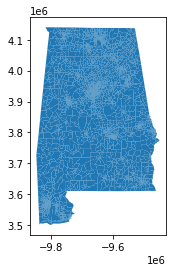

In [18]:
statebg.plot()

In [14]:
statebg.shape

(3925, 13)

In [11]:
type(statebg)

pandas.core.frame.DataFrame

In [ ]:
        # Allocation Summary Report
        print("Allocation summary for county:",county)
        print("    Block Groups processed:", blockgroups.shape[0])
        print("    Precincts allocated:", precincts.shape[0])
        print("    Proportion of Block Groups with unrepresented area:", "{:.4%}".format(bg.gap.sum()/bg.area.sum()))
        print("    Proportion of Precinct voting unallocated:", "{:.4%}".format(sum(prlist.values()) / (len(prlist) * 100)))
        print("    Proportion of Votes unallocated:", "{:.4%}".format(
        (precincts[["REP","DEM","LIB","OTH"]].sum().sum() - bg[["REP","DEM","LIB","OTH"]].sum().sum())/
            precincts[["REP","DEM","LIB","OTH"]].sum().sum()       ))
        pr = pd.DataFrame(prlist.items(),columns=["prindex","remaining"]) 

In [3]:
population = gpd.read_file(datapath + "census/tiger/ACS_2019_5YR_BG/ACS_2019_5YR_BG.gdb/", rows=10)

In [5]:
population.head()

,GEOID,B09002e1,B09002m1,B09002e2,B09002m2,B09002e3,B09002m3,B09002e4,B09002m4,B09002e5,...,B09021m24,B09021e25,B09021m25,B09021e26,B09021m26,B09021e27,B09021m27,B09021e28,B09021m28,geometry
0,15000US010010201001,114.0,61.0,73.0,50.0,4.0,8.0,13.0,20.0,6.0,...,28.0,0.0,12.0,0.0,12.0,53.0,33.0,0.0,12.0,None
1,15000US010010201002,223.0,71.0,190.0,71.0,15.0,17.0,15.0,18.0,6.0,...,49.0,16.0,19.0,0.0,12.0,26.0,32.0,0.0,12.0,None
2,15000US010010202001,188.0,110.0,126.0,103.0,0.0,12.0,17.0,20.0,0.0,...,35.0,4.0,7.0,0.0,12.0,45.0,42.0,0.0,12.0,None
3,15000US010010202002,97.0,50.0,88.0,52.0,7.0,10.0,8.0,12.0,0.0,...,11.0,0.0,12.0,0.0,12.0,66.0,59.0,0.0,12.0,None
4,15000US010010203001,520.0,115.0,418.0,100.0,30.0,22.0,21.0,26.0,67.0,...,94.0,0.0,12.0,0.0,12.0,95.0,61.0,0.0,12.0,None


<AxesSubplot:>

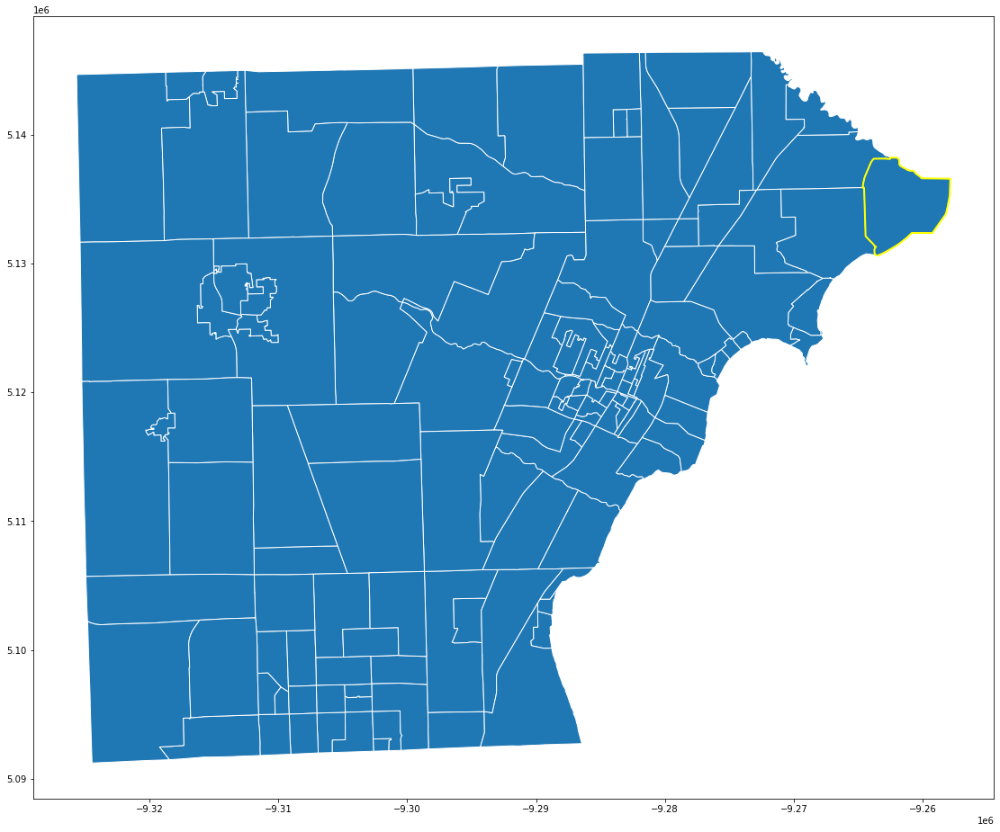

In [58]:
fig, ax = plt.subplots(figsize = (20,16)) 
blockgroups.plot(ax=ax,edgecolor = 'white')
blockgroups[blockgroups.GEOID == '261158301004'].geometry.boundary.plot(color=None,edgecolor='yellow',linewidth = 2,ax=ax) #Use your second dataframe

<AxesSubplot:>

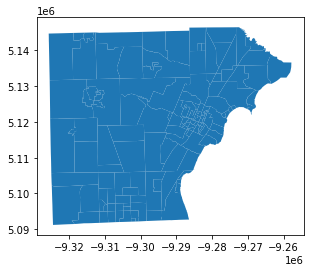

In [30]:
blockgroups.plot()

In [80]:
# intersect() overlaps() and cross() process one row to row; it does NOT answer whether ANY of the rows intersect
# so we have to loop - for one bg loop over precincts asking which intersect.

# inter = monroepre.intersects(monroebg[monroebg.GEOID == '261158329002'], align=True)

# this returns a false series with an extra row for the bg to pre intersection

C:\Users\micha\anaconda3\lib\site-packages\geopandas\base.py:31: UserWarning: The indices of the two GeoSeries are different.
  warn("The indices of the two GeoSeries are different.")


In [88]:
sum(monroebg[monroebg.GEOID == '261158329002'].intersects(monroepre, align=True))

C:\Users\micha\anaconda3\lib\site-packages\geopandas\base.py:31: UserWarning: The indices of the two GeoSeries are different.
  warn("The indices of the two GeoSeries are different.")


0

In [77]:
monroebg[monroebg.GEOID == '261158329002']

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
8000,26,115,832900,2,261158329002,Block Group 2,G5030,S,23038862,250253,+41.8987102,-083.6950004,"POLYGON ((-83.71242 41.89421, -83.71207 41.894..."


In [60]:
for i, p in monroepre.iterrows():
    print(monroepre[monroepre.index == i])

              PRECINCTID COUNTYFIPS    cousubname                  elexpre  \
2260  WP-115-03680-00001        115  Ash township  115-ASH TOWNSHIP-0-0001   

      G20PRERTRU  G20PREDBID  G20PRELJOR  G20PREGHAW  G20PRENDEL  G20PRETBLA  \
2260        1090         539          24           8           2           2   

      G20USSRJAM  G20USSDPET  G20USSGSQU  G20USSNDER  G20USSTWIL  \
2260        1019         571          19           6          26   

                                               geometry  
2260  POLYGON ((-83.38038 42.06395, -83.38037 42.063...  
              PRECINCTID COUNTYFIPS    cousubname                  elexpre  \
2261  WP-115-03680-00002        115  Ash township  115-ASH TOWNSHIP-0-0002   

      G20PRERTRU  G20PREDBID  G20PRELJOR  G20PREGHAW  G20PRENDEL  G20PRETBLA  \
2261        1189         582          12           2           4           4   

      G20USSRJAM  G20USSDPET  G20USSGSQU  G20USSNDER  G20USSTWIL  \
2261        1138         582          14   

              PRECINCTID COUNTYFIPS           cousubname  \
2293  WP-115-30820-00008        115  Frenchtown township   

                             elexpre  G20PRERTRU  G20PREDBID  G20PRELJOR  \
2293  115-FRENCHTOWN TOWNSHIP-0-0008         729         361          22   

      G20PREGHAW  G20PRENDEL  G20PRETBLA  G20USSRJAM  G20USSDPET  G20USSGSQU  \
2293           5           0           2         682         388           9   

      G20USSNDER  G20USSTWIL  \
2293           4          16   

                                               geometry  
2293  POLYGON ((-83.26269 41.97944, -83.25364 41.976...  
              PRECINCTID COUNTYFIPS           cousubname  \
2294  WP-115-30820-00009        115  Frenchtown township   

                             elexpre  G20PRERTRU  G20PREDBID  G20PRELJOR  \
2294  115-FRENCHTOWN TOWNSHIP-0-0009         472         396           8   

      G20PREGHAW  G20PRENDEL  G20PRETBLA  G20USSRJAM  G20USSDPET  G20USSGSQU  \
2294           3           0  

In [33]:
for s in stateresults:
    print(s.shape[0])

74
720
149
2058
198
633
260
536
774
77
18
24
41
406
328
20
562
66
55
18
37
9
231
39
290
576
468
725
338
60
156
237
20
215
493
301
38
366
193
120
23
1545
139
20


In [31]:
stateresults[0]

,Unnamed: 0,GEOID,REP,DEM,LIB,OTH,area,gap,precincts
0,0,10950307022,375.715762,59.651634,5.389292,1.559360,3.125119e+07,4.097819e-08,3
1,1,10950309043,700.641853,126.968391,8.634522,1.632735,3.131836e+07,-4.470348e-08,3
2,2,10950310022,498.986603,81.582288,2.634396,0.000600,5.119444e+07,8.129965e+01,4
3,3,10950306021,31.713569,8.301094,0.516701,0.135528,2.532384e+06,9.313226e-10,1
4,4,10950305021,618.935145,95.678344,9.202230,0.520174,2.669381e+07,1.527369e-07,4
...,...,...,...,...,...,...,...,...,...
69,69,10950306023,1465.202096,315.971909,21.505923,5.567594,8.570300e+07,1.405628e+01,4
70,70,10950307024,314.512809,47.253920,4.388435,1.164804,1.923086e+07,-2.370636e+00,5
71,71,10950304023,316.540653,31.963221,3.728049,0.428403,2.242752e+07,2.574282e-01,2
72,72,10950304012,678.632537,100.193035,8.346426,2.101755,1.905926e+07,-4.115105e-04,2


In [25]:
stateresults = []
for state in states[~states['CountyField'].isin(['none','missing'])].iterrows():
    stateresults.append(pd.read_csv(state[1]["Abbreviation"]+".csv"))
                        
fullresults = pd.concat(stateresults, ignore_index=True)
    

In [27]:
fullresults.REP.sum()

1876882.316436387

In [28]:
fullresults.shape

(13656, 9)

In [21]:
len(state)

2

In [19]:
type(state)

tuple

In [ ]:
# Three states did not report voting data by precinct or county -  KY, SD, WV
# These gap in detail represents 2.1% of total votes cast in the country

REP          DEM       LIB       OTH   TOTALVOTES    POPULATION
KY    1,326,646  772,474    26,234    11,414    2,136,768    4,505,836
SD    261,043    150,471    11,095    0         422,609      886,667
WV    545,382    235,984    10,687    2,678     794,731      1,793,716

# The data set will get three rows appended with dummy county and block group codes
# So the block group FIPS code will be set to two digit state followed by ten 0s for county, tract and block group



In [17]:
# unzip the voting data into folders
# only needs to be done once

# Get the tiger line files for block groups
# https://www2.census.gov/geo/tiger/TIGER2021/BG/

from zipfile import ZipFile
import os 
directory = 'D:/Open Environments/data/census/tiger/blockgroups/'

for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    with ZipFile(f, 'r') as Z:
        Z.extractall(f[:-4])
